# Executive Summary

I'm using ***the environment in the ViZDoom - Deadly Corridor*** to ***practice how to apply Reward Shaping and Curriculum Learning reinforcement learning***. In this notebook, the purpose of the Deadly Corridor scenario is to ***teach the agent to navigate towards his fundamental goal*** (the vest) and ***make sure he survives at the same time***.

### Here is my key findings during the process:

***Using Level 1 of Difficulity for 300K Timesteps of Learning*** (Section 4.3)
- I tried so many combination of the reward formula in 3 days, the player just running all the way to the end of the corridor without any shooting. Finally, here is the best combination of the reward formula:
- The ***reward formula*** I am using is ***(movement_reward) + (health_delta * 10) + (HITCOUNT_delta * 300) + (ammo_delta * 5)***. To ***use HITCOUNT instead of HITS_TAKEN*** are the key successful factor during the learning process.
- The ***Mean Reward at 300k timesteps around 504*** (time spend 2hr 37min).
- The ***Len Mean at 300k timesteps around 71***
- I can see that ***the player able to take shoot and hit on the target*** after 300k timesteps of learning. 
- After 300k timesteps of learning, the ***agent received average reward: 549 in level 1*** environment and ***265 in level 5*** environment.

***Apply Curriculum Learning to Train the Agent in Level 2 of Difficulity for 300K Timesteps of Learning*** (Section 4.2)
- The ***Mean Reward at next 300k timesteps around 350*** (time spend 2hr 38min), ***drop 44%*** compare to first 300k timesteps.
- The ***Len Mean at next 300k timesteps around 31***, ***drop 120%*** compare to first 300k timesteps.
- After 600k timesteps of learning, the ***agent received average reward: 540 in level 2*** environment and ***318 in level 5*** environment.
- ***Comparing to the average reward 265 in first 300k timesteps of learning in level 1 to play in level 5 of difficulty***, which is ***16% of improvement***.

***Apply Curriculum Learning to Train the Agent in Level 3 of Difficulity for 300K Timesteps of Learning*** (Section 4.3)
- The ***Mean Reward at next 300k timesteps around 377*** (time spend 2hr 38min), ***rise 7.7%*** compare to first 600k timesteps.
- The ***Len Mean at next 300k timesteps around 31***, ***around the same*** compare to first 600k timesteps.
- After 900k timesteps of learning, the ***agent received average reward: 514 in level 3*** environment and ***426 in level 5*** environment.
- ***Comparing to the average reward 318 in first 600k timesteps of learning in level 3 to play in level 5 of difficulty***, which is ***34% of improvement***.

***Apply Curriculum Learning to Train the Agent in Level 4 of Difficulity for 300K Timesteps of Learning*** (Section 4.4)
- The ***Mean Reward at next 300k timesteps around 377*** (time spend 2hr 38min), ***rise 6.6%*** compare to first 900k timesteps.
- The ***Len Mean at next 300k timesteps around 32.6***, ***around the same*** compare to first 900k timesteps.
- After 1.2 million timesteps of learning, the ***agent received average reward: 527 in level 4*** environment and ***370 in level 5*** environment.
- ***Comparing to the average reward 427 in first 900k timesteps of learning in level 3 to play in level 5 of difficulty***, which is ***16% lower***.

***Using Level 5 of Difficulity for 300K Timesteps of Learning*** (Section 4.5)
- The ***Mean Reward at next 300k timesteps around 377*** (time spend 2hr 38min), ***rise 5.6%*** compare to first 1.2 million timesteps.
- The ***Len Mean at next 300k timesteps around 31***, ***around the same*** compare to first 1.2 milliion timesteps.
- After 1.5 million timesteps of learning, the ***agent received average reward: 420 in level 5*** environment.
- ***Comparing to the average reward 427 in first 1.2 million timesteps of learning in level 4 to play in level 5 of difficulty***, which is ***13.2% improvement***.
- Although ***the player didn't reach the goal*** (the vest), but ***it keep moving forward quickly*** and ***taking shoots during the game***. 

### ***Table of Content:***
1. What is Sparse Reward Problem
2. Configs of Doom Environment
3. Converting it to a Gym Environment
4. Train The Agent Using Curriculum
   - 4.1 Using Level 1 of Difficulity for 300K Timesteps of Learning
   - 4.2 Apply Curriculum Learning to Train the Agent in Level 2 of Difficulity for 300K Timesteps of Learning
   - 4.3 Apply Curriculum Learning to Train the Agent in Level 3 of Difficulity for 300K Timesteps of Learning
   - 4.4 Apply Curriculum Learning to Train the Agent in Level 4 of Difficulity for 300K Timesteps of Learning
   - 4.5 Apply Curriculum Learning to Train the Agent in Level 5 of Difficulity for 300K Timesteps of Learning

# 1. What is Sparse Reward Problem

### Reward Shaping
***Incentivise our agent to do something by modifying the reward function***, for example:
- ***Add rewards for killing each monster*** 
- ***Preserving our own health***
- ***Having accurate shots***

### Curriculum Learning
***Progressively increase the difficulty of the environment*** to ***allow agent to learn to initially learn 'good' actions earlier on***, for example:

- Rather than making the monsters hyper aggressive we can ***make the monsters a little bit softer***. 
- This means that ***the agent will have a chance to kill some monsters and learn that this yields a positive reward***.
- ***Once it's running along the right trajectory***, we can ***increase the difficulty and keep training***.

# 2. Configs of Doom Environment 

<img src='image/VIZDOOM_screen.png' width='250px'/>

***Goal***

The purpose of this scenario is to ***teach the agent to navigate towards his fundamental goal*** (the vest) and ***make sure he survives at the same time***.

- Map is a corridor with shooting monsters on both sides (6 monsters in total). 
- A green vest is placed at the oposite end of the corridor. 
- Reward is proportional (negative or positive) to change of the distance between the player and the vest. 
- If player ignores monsters on the sides and runs straight for the vest he will be killed somewhere along the way.
- To ensure this behavior doom_skill = 5 (config) is needed.

- ***Scenarios:*** Deadly_Corridor.cfg
- ***Episode Timeout:*** 4200
- ***Available Actions:*** 
  - MOVE_LEFT    [1,0,0,0,0,0,0]
  - MOVE_RIGHT   [0,1,0,0,0,0,0]
  - ATTACK       [0,0,1,0,0,0,0]
  - MOVE_FORWARD [0,0,0,1,0,0,0]
  - MOVE_BACKWARD[0,0,0,0,1,0,0]
  - TURN_LEFT    [0,0,0,0,0,1,0]
  - TURN_RIGHT   [0,0,0,0,0,0,1]
- ***Available Game Variables:*** AMMO2
- ***Mode:*** Player
- ***Doom Skill:*** 1 to 5
- ***Death Reward:*** -100
- ***Reward:*** 
  - +dx for getting closer to the vest
  - -dx for getting further form the vest

##### Rendering options
- screen_resolution = RES_320X240
- screen_format = CRCGCB
- render_hud = True
- render_crosshair = false
- render_weapon = true
- render_decals = false
- render_particles = false
- window_visible = true

##### Key GameVariables
- ITEMCOUNT - Counts the number of picked up items during the current episode.
- SECRETCOUNT - Counts the number of secret location/objects discovered during the current episode.
- HITCOUNT - Counts number of hit monsters/players/bots during the current episode. Added in 1.1.5.
- HITS_TAKEN - Counts number of hits taken by the player during the current episode. Added in 1.1.5.
- DAMAGECOUNT - Counts number of damage dealt to monsters/players/bots during the current episode. Added in 1.1.5.
- DAMAGE_TAKEN - Counts number of damage taken by the player during the current episode. Added in 1.1.5.
- HEALTH - Can be higher then 100!
- ARMOR - Can be higher then 100!
- DEAD - True if the player is dead.
- ON_GROUND - True if the player is on the ground (not in the air).

In [1]:
from vizdoom import *          # Import vizdoom for game env

import random                  # Import random from action sampling

import time                    # Import time for sleeping

import numpy as np             # Import numpy for identity matrix

In [2]:
# Setup game
game = DoomGame()

scenarios_level1 = 'VizDoom/scenarios/deadly_corridor_level1.cfg'
scenarios_level2 = 'VizDoom/scenarios/deadly_corridor_level2.cfg'
scenarios_level3 = 'VizDoom/scenarios/deadly_corridor_level3.cfg'
scenarios_level4 = 'VizDoom/scenarios/deadly_corridor_level4.cfg'
scenarios_level5 = 'VizDoom/scenarios/deadly_corridor_level5.cfg'

scenarios_level = scenarios_level1

game.load_config(scenarios_level)

game.init()

In [3]:
game.get_state().screen_buffer.shape                       # screen shape 240 x 320 RGB Colors

(3, 240, 320)

In [4]:
# This is the set of actions we can take in the environment
actions = np.identity(7, dtype = np.uint8)                 

random.choice(actions)

array([0, 0, 1, 0, 0, 0, 0], dtype=uint8)

In [5]:
state = game.get_state()

state.game_variables

array([100.,   0.,   0.,  -1.])

In [6]:
game.close()

# 3. Converting it to a Gym Environment

In [7]:
# Import Dependencies
from gym import Env                      # Import environment base class from OpenAI Gym

from gym.spaces import Discrete, Box     # Import gym spaces

import cv2                               # Import opencv

import numpy as np                       # Impoet numpy

In [8]:
class VizDoomGym(Env): 
    # Function that is called when we start the env
    def __init__(self, render=False, config = scenarios_level): 
        
        print('Currently Using Scenarios Level:', config)
        
        # Inherit from Env
        super().__init__()
        
        # Setup the game 
        self.game = DoomGame()
        self.game.load_config(scenarios_level)
        
        # Render frame logic
        if render == False: 
            
            self.game.set_window_visible(False)
            
        else:
            
            self.game.set_window_visible(True)
        
        # Start the game 
        self.game.init()
        
        # Create the action space and observation space
        self.observation_space = Box(low=0, high=255, shape=(100,160,1), dtype=np.uint8) 
        self.action_space = Discrete(7)                                  # update number of actions
        
        # Game variables: HEALTH, DAMAGE_TAKEN, HITS_TAKEN, AMMO
        self.health = 100                                                # initial variable health
        self.damage_taken = 0                                           # initial new added variable DAMAGE_TAKEN
        self.HITCOUNT = 0                                               # initial new added variable HITCOUNT
        self.ammo = 52                                                   # initial new added variable SELECTED_WEAPON_AMMO
        
    # This is how we take a step in the environment
    def step(self, action):
        
        # Specify action and take step 
        actions = np.identity(7)                                         # update number of actions
        movement_reward = self.game.make_action(actions[action], 4)      # positive reward when closer and closer to the vest
        
        reward = 0                                                       # initial variable reward
        
        # Get all the other stuff we need to retun 
        if self.game.get_state(): 
            
            state = self.game.get_state().screen_buffer
            
            state = self.grayscale(state)
            
            # Reward shaping
            game_variables = self.game.get_state().game_variables
            
            health, damage_taken, HITCOUNT, ammo = game_variables
            
            # Calculate reward deltas     
            health_delta = health - self.health                         # negative reward current health - previous health
            
            self.health = health
            
            #damage_taken_delta = -damage_taken + self.damage_taken     # negative reward when damage taken
            
            #self.damage_taken = damage_taken
            
            HITCOUNT_delta = HITCOUNT - self.HITCOUNT                   # positive reward when hit the monster
            
            self.HITCOUNT = HITCOUNT
            
            ammo_delta = ammo - self.ammo                               # current ammo - previous ammo available
            
            self.ammo = ammo
            
            # Total reward per state / each timestep
            reward = (movement_reward) +\
                     (health_delta * 10) +\
                     (HITCOUNT_delta * 300) +\
                     (ammo_delta * 5) 
                    # (damage_taken_delta * 10)
                
            if ammo_delta < 0:
                
                print('HITCOUNT_delta, ammo, reward', HITCOUNT_delta, ammo, reward)
            
            info = ammo
            
        else: 
            state = np.zeros(self.observation_space.shape)
            
            info = 0 
        
        info = {"info":info}
        done = self.game.is_episode_finished()
        
        return state, reward, done, info 
    
    # Define how to render the game or environment 
    def render(): 
        
        pass
    
    # What happens when we start a new game 
    def reset(self): 
        
        self.game.new_episode()
        
        state = self.game.get_state().screen_buffer
        
        return self.grayscale(state)
    
    # Grayscale the game frame and resize it 
    def grayscale(self, observation):
        
        gray = cv2.cvtColor(np.moveaxis(observation, 0, -1), cv2.COLOR_BGR2GRAY)
        
        resize = cv2.resize(gray, (160,100), interpolation=cv2.INTER_CUBIC)
        
        state = np.reshape(resize, (100,160,1))
        
        return state
    
    # Call to close down the game
    def close(self): 
        self.game.close()

In [9]:
env = VizDoomGym(render = True)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level1.cfg


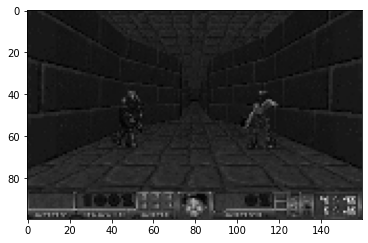

In [10]:
# View State
from matplotlib import pyplot as plt

state = env.reset()

plt.imshow(cv2.cvtColor(state, cv2.COLOR_BGR2RGB))

In [11]:
# Import Environmnet Checker
from stable_baselines3.common import env_checker

env_checker.check_env(env)

HITCOUNT_delta, ammo, reward 0.0 51.0 -3.96173095703125


In [12]:
env.close()

# 4. Train The Agent Using Curriculum

In [13]:
# setup callback
import os 

from stable_baselines3.common.callbacks import BaseCallback

In [14]:
class TrainAndLoggingCallback(BaseCallback):

    def __init__(self, check_freq, save_path, verbose=1):
        super(TrainAndLoggingCallback, self).__init__(verbose)
        self.check_freq = check_freq
        self.save_path = save_path

    def _init_callback(self):
        if self.save_path is not None:
            os.makedirs(self.save_path, exist_ok=True)

    def _on_step(self):
        if self.n_calls % self.check_freq == 0:
            model_path = os.path.join(self.save_path, 'best_model_{}'.format(self.n_calls))
            self.model.save(model_path)

        return True

In [15]:
CHECKPOINT_DIR = './train/DeadlyCorridor_220409'
LOG_DIR = './logs/DeadlyCorridor_220409'

In [16]:
callback = TrainAndLoggingCallback(check_freq=10000, save_path=CHECKPOINT_DIR)

In [17]:
# import PPO for training
from stable_baselines3 import PPO

## 4.1 Using Level 1 of Difficulity for 300K Timesteps of Learning

In [18]:
# Non rendered environment
env_scenarios_level1 = VizDoomGym(config = scenarios_level1)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level1.cfg


In [19]:
PPO_Agent = PPO('CnnPolicy',
                env_scenarios_level1, 
                tensorboard_log = LOG_DIR,
                verbose = 1,
                learning_rate = 0.00001,
                n_steps = 8192,               # 8192 here means that 8192 sets of observations, 
                                              # actions, log probabilities & values will be stored in the buffer for one iteration 
                clip_range = 0.1,
                gamma = 0.95,
                gae_lambda = .9
               )

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


In [20]:
%%time
PPO_Agent.learn(total_timesteps=300000,        # 300k
                callback=callback)

Logging to ./logs/DeadlyCorridor_220409/PPO_1
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.836029052734375
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 1.503387451171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.8643341064453125
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.4133148193359375
HITCOUNT_delta, ammo, reward 1.0 46.0 301.7123107910156
HITCOUNT_delta, ammo, reward 0.0 45.0 1.5776519775390625
HITCOUNT_delta, ammo, reward 0.0 44.0 -8.32720947265625
HITCOUNT_delta, ammo, reward 0.0 43.0 -14.524978637695312
HITCOUNT_delta, ammo, reward 0.0 42.0 -12.076492309570312
HITCOUNT_delta, ammo, reward 0.0 41.0 5.16302490234375
HITCOUNT_delta, ammo, reward 0.0 40.0 4.26483154296875
HITCOUNT_delta, ammo, reward 0.0 39.0 1.4962310791015625
HITCOUNT_delta, ammo, reward 0.0 38.0 -10.772903442382812
HITCOUNT_delta, ammo, reward 0.0 37.0 -8.375213623046875
HITCOUNT_delta, ammo, reward 0.0 36.0 -9.310150146484375
HITCOUNT_delta, ammo, reward 0.0 35.0 -9.492294311523438


HITCOUNT_delta, ammo, reward 0.0 36.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.58837890625
HITCOUNT_delta, ammo, reward 0.0 34.0 1.84942626953125
HITCOUNT_delta, ammo, reward 0.0 33.0 6.1192169189453125
HITCOUNT_delta, ammo, reward 0.0 32.0 -7.8797454833984375
HITCOUNT_delta, ammo, reward 0.0 31.0 -8.076400756835938
HITCOUNT_delta, ammo, reward 0.0 30.0 -8.99102783203125
HITCOUNT_delta, ammo, reward 0.0 29.0 4.98291015625
HITCOUNT_delta, ammo, reward 0.0 28.0 -7.9564666748046875
HITCOUNT_delta, ammo, reward 0.0 27.0 -9.333938598632812
HITCOUNT_delta, ammo, reward 0.0 26.0 2.1935882568359375
HITCOUNT_delta, ammo, reward 0.0 25.0 -0.5852203369140625
HITCOUNT_delta, ammo, reward 0.0 24.0 -0.8827972412109375
HITCOUNT_delta, ammo, reward 0.0 23.0 -5.842132568359375
HITCOUNT_delta, ammo, reward 0.0 22.0 -13.82421875
HITCOUNT_delta, ammo, reward 0.0 21.0 -2.415771484375
HITCOUNT_delta, ammo, reward 0.0 20.0 1.9252166748046875
HITCOUNT_delta, ammo, reward 0.0 19.0 -79.38362121582031
HITCO

HITCOUNT_delta, ammo, reward 0.0 27.0 -3.31170654296875
HITCOUNT_delta, ammo, reward 0.0 26.0 -7.2277374267578125
HITCOUNT_delta, ammo, reward 0.0 25.0 -13.49652099609375
HITCOUNT_delta, ammo, reward 0.0 24.0 -5.3344879150390625
HITCOUNT_delta, ammo, reward 0.0 23.0 -6.6969757080078125
HITCOUNT_delta, ammo, reward 0.0 22.0 -4.2378082275390625
HITCOUNT_delta, ammo, reward 0.0 21.0 3.158477783203125
HITCOUNT_delta, ammo, reward 0.0 20.0 2.8631134033203125
HITCOUNT_delta, ammo, reward 0.0 19.0 0.2416229248046875
HITCOUNT_delta, ammo, reward 0.0 18.0 -8.311874389648438
HITCOUNT_delta, ammo, reward 0.0 17.0 -4.266387939453125
HITCOUNT_delta, ammo, reward 0.0 16.0 0.58251953125
HITCOUNT_delta, ammo, reward 0.0 15.0 -4.35174560546875
HITCOUNT_delta, ammo, reward 0.0 14.0 5.333160400390625
HITCOUNT_delta, ammo, reward 0.0 13.0 -128.89877319335938
HITCOUNT_delta, ammo, reward 0.0 12.0 -7.5849609375
HITCOUNT_delta, ammo, reward 0.0 11.0 -7.7397308349609375
HITCOUNT_delta, ammo, reward 0.0 10.0 -

HITCOUNT_delta, ammo, reward 0.0 32.0 -5.3765411376953125
HITCOUNT_delta, ammo, reward 0.0 31.0 0.4307098388671875
HITCOUNT_delta, ammo, reward 0.0 30.0 -2.2391815185546875
HITCOUNT_delta, ammo, reward 0.0 29.0 5.96807861328125
HITCOUNT_delta, ammo, reward 0.0 28.0 -0.1951141357421875
HITCOUNT_delta, ammo, reward 0.0 27.0 -1.073272705078125
HITCOUNT_delta, ammo, reward 0.0 26.0 -5.202667236328125
HITCOUNT_delta, ammo, reward 0.0 25.0 -13.463531494140625
HITCOUNT_delta, ammo, reward 0.0 24.0 -6.885406494140625
HITCOUNT_delta, ammo, reward 0.0 23.0 -13.228363037109375
HITCOUNT_delta, ammo, reward 0.0 22.0 4.56573486328125
HITCOUNT_delta, ammo, reward 0.0 21.0 2.6143341064453125
HITCOUNT_delta, ammo, reward 0.0 20.0 -10.066085815429688
HITCOUNT_delta, ammo, reward 0.0 19.0 -13.262252807617188
HITCOUNT_delta, ammo, reward 0.0 18.0 -9.715042114257812
HITCOUNT_delta, ammo, reward 0.0 17.0 -0.7021942138671875
HITCOUNT_delta, ammo, reward 0.0 16.0 -8.40203857421875
HITCOUNT_delta, ammo, reward

HITCOUNT_delta, ammo, reward 0.0 41.0 -5.0590972900390625
HITCOUNT_delta, ammo, reward 0.0 40.0 -1.7661285400390625
HITCOUNT_delta, ammo, reward 0.0 39.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 38.0 0.8103179931640625
HITCOUNT_delta, ammo, reward 0.0 37.0 -4.404876708984375
HITCOUNT_delta, ammo, reward 0.0 36.0 -7.2657470703125
HITCOUNT_delta, ammo, reward 0.0 35.0 -4.223541259765625
HITCOUNT_delta, ammo, reward 0.0 34.0 -6.0239105224609375
HITCOUNT_delta, ammo, reward 0.0 33.0 1.271026611328125
HITCOUNT_delta, ammo, reward 0.0 32.0 0.3892974853515625
HITCOUNT_delta, ammo, reward 0.0 31.0 -5.726470947265625
HITCOUNT_delta, ammo, reward 0.0 30.0 -4.0902099609375
HITCOUNT_delta, ammo, reward 0.0 29.0 1.7349090576171875
HITCOUNT_delta, ammo, reward 0.0 28.0 -1.45416259765625
HITCOUNT_delta, ammo, reward 0.0 27.0 -6.2435455322265625
HITCOUNT_delta, ammo, reward 0.0 26.0 3.226409912109375
HITCOUNT_delta, ammo, reward 0.0 35.0 0.3441009521484375
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.6701354

HITCOUNT_delta, ammo, reward 0.0 24.0 -13.770950317382812
HITCOUNT_delta, ammo, reward 0.0 23.0 -12.361083984375
HITCOUNT_delta, ammo, reward 0.0 22.0 -6.5824737548828125
HITCOUNT_delta, ammo, reward 0.0 21.0 -10.639129638671875
HITCOUNT_delta, ammo, reward 0.0 20.0 -4.613494873046875
HITCOUNT_delta, ammo, reward 0.0 19.0 0.966552734375
HITCOUNT_delta, ammo, reward 0.0 18.0 -7.170196533203125
HITCOUNT_delta, ammo, reward 0.0 17.0 -3.9459228515625
HITCOUNT_delta, ammo, reward 0.0 16.0 -0.9904327392578125
HITCOUNT_delta, ammo, reward 0.0 15.0 -16.350387573242188
HITCOUNT_delta, ammo, reward 0.0 14.0 -13.867706298828125
HITCOUNT_delta, ammo, reward 0.0 13.0 -1.320526123046875
HITCOUNT_delta, ammo, reward 0.0 12.0 -5.682769775390625
HITCOUNT_delta, ammo, reward 0.0 11.0 -6.89642333984375
HITCOUNT_delta, ammo, reward 0.0 10.0 -6.7755889892578125
HITCOUNT_delta, ammo, reward 0.0 9.0 3.2191925048828125
HITCOUNT_delta, ammo, reward 0.0 8.0 -7.92852783203125
HITCOUNT_delta, ammo, reward 0.0 7.0

HITCOUNT_delta, ammo, reward 0.0 34.0 -25.019927978515625
HITCOUNT_delta, ammo, reward 0.0 33.0 1.82891845703125
HITCOUNT_delta, ammo, reward 0.0 32.0 -8.423629760742188
HITCOUNT_delta, ammo, reward 0.0 31.0 -1.731964111328125
HITCOUNT_delta, ammo, reward 0.0 30.0 -1.06427001953125
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.2022705078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.4697418212890625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.2983856201171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -8.487686157226562
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.7890167236328125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3797912597656
HITCOUNT_delta, ammo, reward 0.0 49.0 1.0139312744140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.947418212890625
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.4246826171875
HITCOUNT_delta, ammo, reward 0.0 46.0 -15.977737426757812
HITCOUNT_delta, ammo, reward 0.0 45.0 -7.187469482421875
HITCOUNT_delta, ammo, reward 0.0 44.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.0
HITCOU

HITCOUNT_delta, ammo, reward 0.0 39.0 -11.018600463867188
HITCOUNT_delta, ammo, reward 0.0 38.0 -6.3511505126953125
HITCOUNT_delta, ammo, reward 0.0 37.0 -6.358123779296875
HITCOUNT_delta, ammo, reward 0.0 36.0 -2.087982177734375
HITCOUNT_delta, ammo, reward 0.0 35.0 -2.39495849609375
HITCOUNT_delta, ammo, reward 0.0 34.0 -0.031524658203125
HITCOUNT_delta, ammo, reward 0.0 33.0 -4.9462432861328125
HITCOUNT_delta, ammo, reward 0.0 32.0 -7.319854736328125
HITCOUNT_delta, ammo, reward 0.0 31.0 -0.9486083984375
HITCOUNT_delta, ammo, reward 0.0 30.0 -8.596221923828125
HITCOUNT_delta, ammo, reward 0.0 29.0 -8.087203979492188
HITCOUNT_delta, ammo, reward 0.0 28.0 -9.136077880859375
HITCOUNT_delta, ammo, reward 0.0 27.0 -1.0445098876953125
HITCOUNT_delta, ammo, reward 0.0 26.0 -145.5491485595703
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.3073883056640625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.1924591064453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.88

HITCOUNT_delta, ammo, reward 0.0 12.0 1.2733917236328125
HITCOUNT_delta, ammo, reward 0.0 11.0 -9.492202758789062
HITCOUNT_delta, ammo, reward 0.0 10.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 9.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 8.0 1.72119140625
HITCOUNT_delta, ammo, reward 0.0 7.0 4.3749847412109375
HITCOUNT_delta, ammo, reward 0.0 6.0 -3.427886962890625
HITCOUNT_delta, ammo, reward 0.0 5.0 -12.468460083007812
HITCOUNT_delta, ammo, reward 0.0 4.0 -15.0777587890625
HITCOUNT_delta, ammo, reward 0.0 3.0 6.813385009765625
HITCOUNT_delta, ammo, reward 0.0 2.0 -3.044036865234375
HITCOUNT_delta, ammo, reward 0.0 1.0 -13.606521606445312
HITCOUNT_delta, ammo, reward 0.0 0.0 -4.7382659912109375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.55499267578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -201.18338012695312
HITCOUNT_delta, ammo, reward 1.0 48.0 301.55311584472656
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.7263336181640625
HITCOUNT_delta, ammo, reward 

HITCOUNT_delta, ammo, reward 0.0 47.0 -227.22872924804688
HITCOUNT_delta, ammo, reward 1.0 46.0 300.3861846923828
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.34063720703125
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.85052490234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.6359100341796875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.06689453125
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.507659912109375
HITCOUNT_delta, ammo, reward 1.0 45.0 295.0
HITCOUNT_delta, ammo, reward 0.0 44.0 1.113616943359375
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 42.0 -4.297271728515625
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.335906982421875
HITCOUNT_delta, ammo, reward 0.0 40.0 -5.9393310546875
HITCOUNT_delta, ammo, reward 0.0 39.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 38.0 3.336517333984375
HITCOUNT_delta, ammo, reward 0.0 37.0 -2.327972412109375
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 42.0 -10.6009521484375
HITCOUNT_delta, ammo, reward 0.0 41.0 -13.559005737304688
HITCOUNT_delta, ammo, reward 0.0 40.0 -2.412200927734375
HITCOUNT_delta, ammo, reward 0.0 39.0 -1.174072265625
HITCOUNT_delta, ammo, reward 0.0 38.0 -1.7062530517578125
HITCOUNT_delta, ammo, reward 0.0 37.0 -13.634674072265625
HITCOUNT_delta, ammo, reward 0.0 36.0 1.9129638671875
HITCOUNT_delta, ammo, reward 0.0 35.0 3.7135772705078125
HITCOUNT_delta, ammo, reward 0.0 34.0 -3.7818603515625
HITCOUNT_delta, ammo, reward 0.0 33.0 -1.756500244140625
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.5759735107421875
HITCOUNT_delta, ammo, reward 0.0 31.0 5.4944610595703125
HITCOUNT_delta, ammo, reward 0.0 30.0 3.0816802978515625
HITCOUNT_delta, ammo, reward 0.0 29.0 -8.893768310546875
HITCOUNT_delta, ammo, reward 0.0 28.0 1.3597259521484375
HITCOUNT_delta, ammo, reward 0.0 27.0 -9.416213989257812
HITCOUNT_delta, ammo, reward 0.0 26.0 -9.777740478515625
HITCOUNT_delta, ammo, reward 0.0 25.

HITCOUNT_delta, ammo, reward 0.0 50.0 -4.0030975341796875
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 -200.2826385498047
HITCOUNT_delta, ammo, reward 1.0 47.0 298.8528289794922
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.8717803955078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.907012939453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -10.982955932617188
HITCOUNT_delta, ammo, reward 1.0 48.0 95.72250366210938
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.1693115234375
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.6832427978515625
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.2983245849609375
HITCOUNT_delta, ammo, reward 0.0 44.0 -9.331466674804688
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.82086181640625
HITCOUNT_delta, ammo, reward 0.0 42.0 -5.000518798828125
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.4456329345703125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0511627197265625
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4361419677734375
HITCOUNT_delta, ammo, reward 1.0 49.0 295.8

HITCOUNT_delta, ammo, reward 0.0 32.0 2.8824310302734375
HITCOUNT_delta, ammo, reward 1.0 31.0 305.6034393310547
HITCOUNT_delta, ammo, reward 0.0 30.0 -1.2483978271484375
HITCOUNT_delta, ammo, reward 0.0 29.0 -1.729461669921875
HITCOUNT_delta, ammo, reward 0.0 28.0 -5.649200439453125
HITCOUNT_delta, ammo, reward 0.0 27.0 -3.4957427978515625
HITCOUNT_delta, ammo, reward 0.0 26.0 -7.0619964599609375
HITCOUNT_delta, ammo, reward 0.0 25.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 24.0 5.9887237548828125
HITCOUNT_delta, ammo, reward 0.0 23.0 -6.5641326904296875
HITCOUNT_delta, ammo, reward 0.0 22.0 -0.5500946044921875
HITCOUNT_delta, ammo, reward 0.0 21.0 -15.251388549804688
HITCOUNT_delta, ammo, reward 0.0 20.0 -19.02984619140625
HITCOUNT_delta, ammo, reward 0.0 19.0 0.016845703125
HITCOUNT_delta, ammo, reward 0.0 18.0 5.786712646484375
HITCOUNT_delta, ammo, reward 0.0 17.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 16.0 -0.36578369140625
HITCOUNT_delta, ammo, reward 0.0 15.0 0.3103790283203125
HIT

HITCOUNT_delta, ammo, reward 0.0 29.0 -6.8602142333984375
HITCOUNT_delta, ammo, reward 0.0 28.0 -3.15350341796875
HITCOUNT_delta, ammo, reward 0.0 27.0 -6.6231689453125
HITCOUNT_delta, ammo, reward 0.0 26.0 -8.511245727539062
HITCOUNT_delta, ammo, reward 0.0 25.0 1.743408203125
HITCOUNT_delta, ammo, reward 0.0 24.0 -0.8939971923828125
HITCOUNT_delta, ammo, reward 0.0 23.0 -8.329055786132812
HITCOUNT_delta, ammo, reward 0.0 22.0 -4.647216796875
HITCOUNT_delta, ammo, reward 0.0 21.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 20.0 -8.4361572265625
HITCOUNT_delta, ammo, reward 0.0 19.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 18.0 -9.156021118164062
HITCOUNT_delta, ammo, reward 0.0 17.0 -17.387191772460938
HITCOUNT_delta, ammo, reward 0.0 16.0 -8.913970947265625
HITCOUNT_delta, ammo, reward 0.0 15.0 -11.33782958984375
HITCOUNT_delta, ammo, reward 0.0 14.0 -10.837249755859375
HITCOUNT_delta, ammo, reward 0.0 13.0 -5.6215362548828125
HITCOUNT_delta, ammo, reward 0.0 12.0 -4.8744354248046875
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 28.0 3.351470947265625
HITCOUNT_delta, ammo, reward 0.0 27.0 -0.985992431640625
HITCOUNT_delta, ammo, reward 0.0 26.0 -8.442550659179688
HITCOUNT_delta, ammo, reward 0.0 25.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 24.0 -7.452056884765625
HITCOUNT_delta, ammo, reward 0.0 23.0 -4.4949951171875
HITCOUNT_delta, ammo, reward 0.0 22.0 -2.7592620849609375
HITCOUNT_delta, ammo, reward 0.0 21.0 -5.0478973388671875
HITCOUNT_delta, ammo, reward 0.0 20.0 6.441650390625
HITCOUNT_delta, ammo, reward 0.0 19.0 -5.3702850341796875
HITCOUNT_delta, ammo, reward 0.0 18.0 12.105926513671875
HITCOUNT_delta, ammo, reward 0.0 17.0 -9.299560546875
HITCOUNT_delta, ammo, reward 0.0 16.0 -6.2180633544921875
HITCOUNT_delta, ammo, reward 0.0 15.0 -8.396102905273438
HITCOUNT_delta, ammo, reward 0.0 14.0 -0.4271697998046875
HITCOUNT_delta, ammo, reward 0.0 13.0 -4.5738067626953125
HITCOUNT_delta, ammo, reward 0.0 12.0 -9.452926635742188
HITCOUNT_delta, ammo, reward 0.0 11.0 -6.11561584

HITCOUNT_delta, ammo, reward 0.0 33.0 -8.513015747070312
HITCOUNT_delta, ammo, reward 1.0 51.0 261.53973388671875
HITCOUNT_delta, ammo, reward 0.0 50.0 0.051544189453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.8674774169921875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.6493988037109375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.0023193359375
HITCOUNT_delta, ammo, reward 0.0 56.0 -4.1479644775390625
HITCOUNT_delta, ammo, reward 0.0 55.0 -10.495086669921875
HITCOUNT_delta, ammo, reward 0.0 54.0 -8.413955688476562
HITCOUNT_delta, ammo, reward -1.0 52.0 530.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.676361083984375
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.9056854248046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -238.77845764160156
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.3908538818359375
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.6786956787109375
HITCOUNT_delta, ammo, reward 0.0 46.0 -10.945526123046875
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.6116943359375
HITCOUNT_delta, ammo, reward 0.0 50.0 2.8

HITCOUNT_delta, ammo, reward 0.0 48.0 0.0858154296875
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 46.0 297.59564208984375
HITCOUNT_delta, ammo, reward 0.0 45.0 0.877227783203125
HITCOUNT_delta, ammo, reward 0.0 44.0 -8.891082763671875
HITCOUNT_delta, ammo, reward 0.0 43.0 -6.19427490234375
HITCOUNT_delta, ammo, reward 0.0 42.0 -7.616943359375
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.352874755859375
HITCOUNT_delta, ammo, reward 0.0 40.0 -2.04656982421875
HITCOUNT_delta, ammo, reward 0.0 39.0 -18.224090576171875
HITCOUNT_delta, ammo, reward 0.0 51.0 2.06011962890625
HITCOUNT_delta, ammo, reward 0.0 50.0 -174.35557556152344
HITCOUNT_delta, ammo, reward 1.0 49.0 291.05433654785156
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.6009063720703125
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.8818817138671875
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.7276153564453125
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.6843719482421875
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.593521118

HITCOUNT_delta, ammo, reward 0.0 25.0 13.503280639648438
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 3.6234588623046875
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.5496978759765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -11.272262573242188
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.4053497314453125
HITCOUNT_delta, ammo, reward 0.0 45.0 5.38165283203125
HITCOUNT_delta, ammo, reward 0.0 44.0 -9.98248291015625
HITCOUNT_delta, ammo, reward 0.0 43.0 -123.08238220214844
HITCOUNT_delta, ammo, reward 0.0 42.0 -5.720245361328125
HITCOUNT_delta, ammo, reward 0.0 41.0 7.3975677490234375
HITCOUNT_delta, ammo, reward 0.0 40.0 -6.8956756591796875
HITCOUNT_delta, ammo, reward 0.0 39.0 -3.69622802734375
HITCOUNT_delta, ammo, reward 0.0 38.0 -2.03997802734375
HITCOUNT_delta, ammo, reward 0.0 37.0 -88.34982299804688
HITCOUNT_delta, ammo, reward 0.0 36.0 -10.03192138671875
HITCOUNT_delta, ammo, reward 0.0 35.0 -4.0152740478515625


HITCOUNT_delta, ammo, reward 0.0 49.0 3.39300537109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.9337615966796875
HITCOUNT_delta, ammo, reward 0.0 47.0 2.099822998046875
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.8455657958984375
HITCOUNT_delta, ammo, reward 1.0 45.0 287.88006591796875
HITCOUNT_delta, ammo, reward 0.0 44.0 -7.0402984619140625
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.702423095703125
HITCOUNT_delta, ammo, reward 0.0 42.0 -3.3030242919921875
HITCOUNT_delta, ammo, reward 0.0 41.0 -1.382659912109375
HITCOUNT_delta, ammo, reward 1.0 40.0 296.0883026123047
HITCOUNT_delta, ammo, reward 0.0 39.0 -9.317947387695312
HITCOUNT_delta, ammo, reward 0.0 38.0 0.512969970703125
HITCOUNT_delta, ammo, reward 0.0 37.0 -6.6264495849609375
HITCOUNT_delta, ammo, reward 0.0 36.0 -9.006240844726562
HITCOUNT_delta, ammo, reward 0.0 35.0 3.691009521484375
HITCOUNT_delta, ammo, reward 0.0 34.0 -2.480926513671875
HITCOUNT_delta, ammo, reward 0.0 33.0 -3.557952880859375
HITCOUNT_delta, ammo, reward 0.0

HITCOUNT_delta, ammo, reward 0.0 33.0 -29.541290283203125
HITCOUNT_delta, ammo, reward 1.0 51.0 301.714111328125
HITCOUNT_delta, ammo, reward 0.0 50.0 4.021026611328125
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.3820343017578125
HITCOUNT_delta, ammo, reward 0.0 48.0 6.072113037109375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.1844940185546875
HITCOUNT_delta, ammo, reward 0.0 46.0 6.5030517578125
HITCOUNT_delta, ammo, reward 1.0 45.0 301.7368469238281
HITCOUNT_delta, ammo, reward 0.0 44.0 1.96881103515625
HITCOUNT_delta, ammo, reward 0.0 43.0 -119.70524597167969
HITCOUNT_delta, ammo, reward 0.0 42.0 -15.156173706054688
HITCOUNT_delta, ammo, reward 1.0 41.0 297.2857208251953
HITCOUNT_delta, ammo, reward 0.0 40.0 -18.500411987304688
HITCOUNT_delta, ammo, reward 0.0 39.0 2.6705780029296875
HITCOUNT_delta, ammo, reward 0.0 51.0 5.12371826171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.7133026123046875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.433349609375
HITCOUNT_delta, ammo, reward 0.0 48.0 0.32

HITCOUNT_delta, ammo, reward 0.0 41.0 6.7329864501953125
HITCOUNT_delta, ammo, reward 0.0 40.0 4.489471435546875
HITCOUNT_delta, ammo, reward 0.0 39.0 -6.2563629150390625
HITCOUNT_delta, ammo, reward 0.0 38.0 -4.5934906005859375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.6224822998046875
HITCOUNT_delta, ammo, reward 0.0 50.0 -123.27326965332031
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.3586273193359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.3059234619140625
HITCOUNT_delta, ammo, reward 0.0 47.0 -86.28858947753906
HITCOUNT_delta, ammo, reward 1.0 46.0 297.5944061279297
HITCOUNT_delta, ammo, reward 0.0 45.0 -7.338409423828125
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.72503662109375
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.424468994140625
HITCOUNT_delta, ammo, reward 0.0 42.0 3.026885986328125
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.9948883056640625
HITCOUNT_delta, ammo, reward 0.0 40.0 -17.779449462890625
HITCOUNT_delta, ammo, reward 0.0 39.0 -4.71112060546875
HITCOUNT_delta, ammo, reward

HITCOUNT_delta, ammo, reward 0.0 51.0 1.2468414306640625
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.0555572509765625
HITCOUNT_delta, ammo, reward 0.0 49.0 -231.94297790527344
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.4226226806640625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.6651611328125
HITCOUNT_delta, ammo, reward 1.0 46.0 298.3681182861328
HITCOUNT_delta, ammo, reward 0.0 45.0 0.6330413818359375
HITCOUNT_delta, ammo, reward 0.0 44.0 6.0769195556640625
HITCOUNT_delta, ammo, reward 0.0 43.0 -7.0535125732421875
HITCOUNT_delta, ammo, reward 0.0 42.0 -2.63037109375
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.1229248046875
HITCOUNT_delta, ammo, reward 0.0 40.0 -4.0605621337890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.307586669921875
HITCOUNT_delta, ammo, reward 0.0 50.0 4.9629669189453125
HITCOUNT_delta, ammo, reward 1.0 49.0 288.6806945800781
HITCOUNT_delta, ammo, reward 0.0 48.0 -8.167556762695312
HITCOUNT_delta, ammo, reward 0.0 47.0 -11.556991577148438
HITCOUNT_delta, ammo, reward 0.0 46.

HITCOUNT_delta, ammo, reward 0.0 35.0 7.7169189453125
HITCOUNT_delta, ammo, reward 0.0 34.0 -143.37254333496094
HITCOUNT_delta, ammo, reward 0.0 33.0 -7.8684539794921875
HITCOUNT_delta, ammo, reward 0.0 32.0 -12.867156982421875
HITCOUNT_delta, ammo, reward 0.0 31.0 -6.4392547607421875
HITCOUNT_delta, ammo, reward 0.0 30.0 2.9646759033203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.522430419921875
HITCOUNT_delta, ammo, reward 1.0 50.0 294.27479553222656
HITCOUNT_delta, ammo, reward 0.0 49.0 0.091522216796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.238006591796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -10.141555786132812
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.246337890625
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.678375244140625
HITCOUNT_delta, ammo, reward 0.0 44.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 43.0 5.66900634765625
HITCOUNT_delta, ammo, reward 0.0 42.0 -1.550140380859375
HITCOUNT_delta, ammo, reward 0.0 41.0 -3.301849365234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.5125579

HITCOUNT_delta, ammo, reward 0.0 49.0 1.1379241943359375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.9476776123046875
HITCOUNT_delta, ammo, reward 0.0 47.0 -9.067581176757812
HITCOUNT_delta, ammo, reward 0.0 46.0 1.2122344970703125
HITCOUNT_delta, ammo, reward 0.0 45.0 -9.89569091796875
HITCOUNT_delta, ammo, reward 0.0 44.0 0.84906005859375
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.4687347412109375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.450439453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.4382171630859375
HITCOUNT_delta, ammo, reward 0.0 48.0 0.156524658203125
HITCOUNT_delta, ammo, reward 0.0 47.0 -121.36149597167969
HITCOUNT_delta, ammo, reward 0.0 46.0 1.071563720703125
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.2410736083984375
HITCOUNT_delta, ammo, reward 0.0 51.0 2.4675445556640625
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.4693756103515625
HITCOUNT_delta, ammo, reward 1.0 49.0 286.3501739501953
HITCOUNT_delta, ammo, reward 0.0 48.0 -20.408126831054688
HITCOUNT_delta, ammo, reward 0.0 47

HITCOUNT_delta, ammo, reward 0.0 46.0 -7.8964080810546875
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.9064788818359375
HITCOUNT_delta, ammo, reward 0.0 44.0 6.2621002197265625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.3679962158203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.3724517822265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -10.907333374023438
HITCOUNT_delta, ammo, reward 1.0 48.0 304.2432403564453
HITCOUNT_delta, ammo, reward 0.0 47.0 4.124359130859375
HITCOUNT_delta, ammo, reward 0.0 46.0 3.5535430908203125
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.351806640625
HITCOUNT_delta, ammo, reward 0.0 44.0 -4.0492706298828125
HITCOUNT_delta, ammo, reward 0.0 43.0 3.44915771484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.5801544189453125
HITCOUNT_delta, ammo, reward 1.0 50.0 151.37722778320312
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.7241363525390625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.8931884765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.6822509765625
HITCOUNT_delta, ammo, reward 0.0 46

HITCOUNT_delta, ammo, reward 0.0 40.0 5.26263427734375
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 124          |
|    ep_rew_mean          | 209          |
| time/                   |              |
|    fps                  | 40           |
|    iterations           | 4            |
|    time_elapsed         | 818          |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0030182854 |
|    clip_fraction        | 0.142        |
|    clip_range           | 0.1          |
|    entropy_loss         | -1.92        |
|    explained_variance   | 0.0145       |
|    learning_rate        | 1e-05        |
|    loss                 | 6.39e+03     |
|    n_updates            | 30           |
|    policy_gradient_loss | -0.0033      |
|    value_loss           | 8.6e+03      |
------------------------------------------
HITCOUNT_delta, ammo, reward 0.0 39.0 2.62

HITCOUNT_delta, ammo, reward 0.0 51.0 0.75616455078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -149.04629516601562
HITCOUNT_delta, ammo, reward 0.0 49.0 1.1116485595703125
HITCOUNT_delta, ammo, reward 0.0 48.0 11.395492553710938
HITCOUNT_delta, ammo, reward 0.0 47.0 -8.1446533203125
HITCOUNT_delta, ammo, reward 0.0 46.0 -162.62196350097656
HITCOUNT_delta, ammo, reward 0.0 45.0 -69.74775695800781
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.761871337890625
HITCOUNT_delta, ammo, reward 0.0 43.0 6.7624053955078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.5243988037109375
HITCOUNT_delta, ammo, reward 0.0 50.0 7.7266845703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.183502197265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.4560394287109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -65.73199462890625
HITCOUNT_delta, ammo, reward 0.0 46.0 4.4815216064453125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -77.01676940917969
HITCOUNT_delta, ammo, reward 0.0 49.0 3.40266418

HITCOUNT_delta, ammo, reward 0.0 11.0 -11.183029174804688
HITCOUNT_delta, ammo, reward 0.0 10.0 -6.9603118896484375
HITCOUNT_delta, ammo, reward 0.0 9.0 -3.8186187744140625
HITCOUNT_delta, ammo, reward 0.0 8.0 2.979034423828125
HITCOUNT_delta, ammo, reward 0.0 7.0 -3.859893798828125
HITCOUNT_delta, ammo, reward 0.0 6.0 -6.6228179931640625
HITCOUNT_delta, ammo, reward 0.0 5.0 -1.6616058349609375
HITCOUNT_delta, ammo, reward 0.0 4.0 -3.121978759765625
HITCOUNT_delta, ammo, reward 0.0 3.0 -1.250732421875
HITCOUNT_delta, ammo, reward 0.0 2.0 -0.5113067626953125
HITCOUNT_delta, ammo, reward 0.0 1.0 -10.454635620117188
HITCOUNT_delta, ammo, reward 0.0 0.0 -6.6741485595703125
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.6086578369140625
HITCOUNT_delta, ammo, reward 0.0 50.0 7.2353363037109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -319.5478820800781
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.4485626220703125
HITCOUNT_delta, ammo, reward 0.0 47.0 0.692108154296875
HITCOUNT_delta, ammo, reward 0.0 46.

HITCOUNT_delta, ammo, reward 0.0 43.0 0.9980010986328125
HITCOUNT_delta, ammo, reward 0.0 42.0 -1.2265472412109375
HITCOUNT_delta, ammo, reward 0.0 61.0 -13.98614501953125
HITCOUNT_delta, ammo, reward 0.0 60.0 -11.061386108398438
HITCOUNT_delta, ammo, reward 0.0 59.0 -9.088607788085938
HITCOUNT_delta, ammo, reward 0.0 58.0 -28.226593017578125
HITCOUNT_delta, ammo, reward 0.0 57.0 -6.5544586181640625
HITCOUNT_delta, ammo, reward 0.0 56.0 -5.762481689453125
HITCOUNT_delta, ammo, reward 0.0 55.0 -5.44525146484375
HITCOUNT_delta, ammo, reward 0.0 54.0 -12.129501342773438
HITCOUNT_delta, ammo, reward 0.0 53.0 -4.1585235595703125
HITCOUNT_delta, ammo, reward 0.0 52.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.976409912109375
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0382537841796875
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.201995849609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.485382080078125
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.2218017578125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.6

HITCOUNT_delta, ammo, reward 0.0 46.0 -0.1327056884765625
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.4853057861328125
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.28387451171875
HITCOUNT_delta, ammo, reward 0.0 43.0 -9.202972412109375
HITCOUNT_delta, ammo, reward 0.0 42.0 -6.489410400390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.3078765869140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.258392333984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.5920867919921875
HITCOUNT_delta, ammo, reward 0.0 47.0 -8.175567626953125
HITCOUNT_delta, ammo, reward 0.0 46.0 -8.493759155273438
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.2792510986328125
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.391265869140625
HITCOUNT_delta, ammo, reward 0.0 43.0 -0.6771697998046875
HITCOUNT_delta, ammo, reward 0.0 51.0 -139.49725341796875
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.154266357421875
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.3154754638671875
HITCOUNT_delta, ammo, reward 0.0 48.0 -

HITCOUNT_delta, ammo, reward 0.0 36.0 -12.617050170898438
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.6505126953125
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 33.0 -0.4863739013671875
HITCOUNT_delta, ammo, reward 0.0 32.0 -10.894668579101562
HITCOUNT_delta, ammo, reward 0.0 31.0 -3.1876068115234375
HITCOUNT_delta, ammo, reward 0.0 30.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 29.0 1.7813873291015625
HITCOUNT_delta, ammo, reward 0.0 28.0 -9.062835693359375
HITCOUNT_delta, ammo, reward 0.0 27.0 0.963287353515625
HITCOUNT_delta, ammo, reward 0.0 26.0 -9.16998291015625
HITCOUNT_delta, ammo, reward 0.0 25.0 -4.667572021484375
HITCOUNT_delta, ammo, reward 0.0 24.0 1.921722412109375
HITCOUNT_delta, ammo, reward 0.0 23.0 -2.957855224609375
HITCOUNT_delta, ammo, reward 0.0 22.0 -2.6299285888671875
HITCOUNT_delta, ammo, reward 0.0 21.0 0.146881103515625
HITCOUNT_delta, ammo, reward 0.0 20.0 -7.7783660888671875
HITCOUNT_delta, ammo, reward 0.0 19.0 -4.1304779052734375
H

HITCOUNT_delta, ammo, reward 0.0 49.0 7.3671112060546875
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.909423828125
HITCOUNT_delta, ammo, reward 0.0 47.0 1.587646484375
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.44277954101562
HITCOUNT_delta, ammo, reward 0.0 7.0 1.7703704833984375
HITCOUNT_delta, ammo, reward 0.0 6.0 -11.191009521484375
HITCOUNT_delta, ammo, reward 0.0 5.0 -16.3936767578125
HITCOUNT_delta, ammo, reward 0.0 4.0 -3.4240570068359375
HITCOUNT_delta, ammo, reward 0.0 3.0 -6.044281005859375
HITCOUNT_delta, ammo, reward 0.0 2.0 -2.85455322265625
HITCOUNT_delta, ammo, reward 0.0 1.0 3.3617401123046875
HITCOUNT_delta, ammo, reward 0.0 0.0 -0.682037353515625
HITCOUNT_delta, ammo, reward 0.0 46.0 -6.6129608154296875
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.7860565185546875
HITCOUNT_delta, ammo, reward 0.0 44.0 3.283599853515625
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.3049774169921875
HITCOUNT_delta, ammo, reward 0.0 42.0 -10.0406494140625
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.5589

HITCOUNT_delta, ammo, reward 0.0 33.0 -4.672027587890625
HITCOUNT_delta, ammo, reward 0.0 32.0 -18.14697265625
HITCOUNT_delta, ammo, reward 0.0 31.0 -2.0488433837890625
HITCOUNT_delta, ammo, reward 0.0 30.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 29.0 3.103729248046875
HITCOUNT_delta, ammo, reward 0.0 28.0 7.509063720703125
HITCOUNT_delta, ammo, reward 0.0 27.0 2.3150177001953125
HITCOUNT_delta, ammo, reward 0.0 26.0 -5.311126708984375
HITCOUNT_delta, ammo, reward 0.0 25.0 -4.9945068359375
HITCOUNT_delta, ammo, reward 0.0 24.0 -4.644683837890625
HITCOUNT_delta, ammo, reward 0.0 23.0 -5.885498046875
HITCOUNT_delta, ammo, reward 0.0 22.0 -5.271942138671875
HITCOUNT_delta, ammo, reward 0.0 21.0 -2.6996307373046875
HITCOUNT_delta, ammo, reward 0.0 20.0 -13.464248657226562
HITCOUNT_delta, ammo, reward 0.0 19.0 -1.8488616943359375
HITCOUNT_delta, ammo, reward 0.0 18.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.70367431640625
HITCOUNT_delta, ammo, r

HITCOUNT_delta, ammo, reward 0.0 44.0 -2.8791656494140625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.9626312255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 -28.647872924804688
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.576263427734375
HITCOUNT_delta, ammo, reward 1.0 48.0 308.9490966796875
HITCOUNT_delta, ammo, reward 0.0 47.0 4.038818359375
HITCOUNT_delta, ammo, reward 0.0 46.0 2.9535064697265625
HITCOUNT_delta, ammo, reward 0.0 45.0 -77.32655334472656
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.8878631591796875
HITCOUNT_delta, ammo, reward 0.0 43.0 -1.7199859619140625
HITCOUNT_delta, ammo, reward 0.0 42.0 -0.85577392578125
HITCOUNT_delta, ammo, reward 0.0 41.0 -1.4641571044921875
HITCOUNT_delta, ammo, reward 0.0 40.0 2.54461669921875
HITCOUNT_delta, ammo, reward 0.0 39.0 -118.75238037109375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -185.0
HITCOUNT_delta, ammo, reward 1.0 49.0 294.97242736816406
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.1144256591796875
H

HITCOUNT_delta, ammo, reward 0.0 44.0 -7.810791015625
HITCOUNT_delta, ammo, reward 0.0 43.0 -119.07415771484375
HITCOUNT_delta, ammo, reward 0.0 42.0 1.1410980224609375
HITCOUNT_delta, ammo, reward 1.0 41.0 306.80796813964844
HITCOUNT_delta, ammo, reward 0.0 40.0 -3.30963134765625
HITCOUNT_delta, ammo, reward 0.0 39.0 -8.768722534179688
HITCOUNT_delta, ammo, reward 0.0 38.0 4.9181060791015625
HITCOUNT_delta, ammo, reward 0.0 37.0 -4.76947021484375
HITCOUNT_delta, ammo, reward 0.0 36.0 -8.689483642578125
HITCOUNT_delta, ammo, reward 0.0 35.0 -121.58248901367188
HITCOUNT_delta, ammo, reward 0.0 34.0 -3.016021728515625
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.304656982421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -9.109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.8850555419921875
HITCOUNT_delta, ammo, reward 1.0 48.0 301.4887390136719
HITCOUNT_delta, ammo, reward 0.0 47.0 2.21173095703125
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.085205078125
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.6553192

HITCOUNT_delta, ammo, reward 0.0 48.0 4.069915771484375
HITCOUNT_delta, ammo, reward 0.0 47.0 6.5805206298828125
HITCOUNT_delta, ammo, reward 0.0 46.0 3.984710693359375
HITCOUNT_delta, ammo, reward 0.0 45.0 -86.03927612304688
HITCOUNT_delta, ammo, reward 0.0 44.0 -68.280029296875
HITCOUNT_delta, ammo, reward 0.0 43.0 -14.256851196289062
HITCOUNT_delta, ammo, reward 0.0 51.0 1.903778076171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -63.590576171875
HITCOUNT_delta, ammo, reward 0.0 49.0 8.796371459960938
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.10284423828125
HITCOUNT_delta, ammo, reward 0.0 47.0 -129.51475524902344
HITCOUNT_delta, ammo, reward 1.0 46.0 296.1043701171875
HITCOUNT_delta, ammo, reward 0.0 55.0 -8.152908325195312
HITCOUNT_delta, ammo, reward -1.0 52.0 645.0
HITCOUNT_delta, ammo, reward 1.0 51.0 302.54835510253906
HITCOUNT_delta, ammo, reward 0.0 50.0 2.0471954345703125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.3852386474609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.1128540039

HITCOUNT_delta, ammo, reward 0.0 40.0 0.07427978515625
HITCOUNT_delta, ammo, reward 0.0 39.0 -7.306121826171875
HITCOUNT_delta, ammo, reward 0.0 38.0 2.1539764404296875
HITCOUNT_delta, ammo, reward 0.0 37.0 -139.3045196533203
HITCOUNT_delta, ammo, reward 0.0 36.0 -60.68156433105469
HITCOUNT_delta, ammo, reward 0.0 35.0 -6.7490081787109375
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.3575897216796875
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.890716552734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.7340850830078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.5596160888671875
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.8952178955078125
HITCOUNT_delta, ammo, reward 1.0 46.0 292.61900329589844
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.036041259765625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.3105010986328125
HITCOUNT_delta, ammo, reward 0.0 49.0 -8.611907958984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.07586669921875
HITCOUNT_delta, ammo, reward 1.0 47.0 302.

HITCOUNT_delta, ammo, reward 0.0 48.0 -11.582489013671875
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.485565185546875
HITCOUNT_delta, ammo, reward 0.0 46.0 -6.8677215576171875
HITCOUNT_delta, ammo, reward 0.0 45.0 -242.9833221435547
HITCOUNT_delta, ammo, reward 0.0 44.0 8.052276611328125
HITCOUNT_delta, ammo, reward 0.0 43.0 6.3531951904296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.1194000244140625
HITCOUNT_delta, ammo, reward 0.0 50.0 3.2199249267578125
HITCOUNT_delta, ammo, reward 0.0 49.0 12.36297607421875
HITCOUNT_delta, ammo, reward 0.0 48.0 -8.813919067382812
HITCOUNT_delta, ammo, reward 0.0 47.0 -11.4765625
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.9598236083984375
HITCOUNT_delta, ammo, reward 1.0 45.0 304.09539794921875
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.3226165771484375
HITCOUNT_delta, ammo, reward 0.0 43.0 -33.55116271972656
HITCOUNT_delta, ammo, reward 0.0 42.0 -1.6760711669921875
HITCOUNT_delta, ammo, reward 0.0 41.0 -3.3416595458984375
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 300.87615966796875
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.196929931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -10.245925903320312
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.4279632568359375
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.15374755859375
HITCOUNT_delta, ammo, reward 0.0 46.0 4.239898681640625
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 44.0 -4.700958251953125
HITCOUNT_delta, ammo, reward 1.0 43.0 289.6764373779297
HITCOUNT_delta, ammo, reward 0.0 42.0 -2.60284423828125
HITCOUNT_delta, ammo, reward 0.0 41.0 1.3354644775390625
HITCOUNT_delta, ammo, reward 0.0 40.0 0.162139892578125
HITCOUNT_delta, ammo, reward 0.0 39.0 -1.8713226318359375
HITCOUNT_delta, ammo, reward 0.0 38.0 -10.274566650390625
HITCOUNT_delta, ammo, reward 0.0 37.0 -2.1181488037109375
HITCOUNT_delta, ammo, reward 0.0 36.0 -1.457244873046875
HITCOUNT_delta, ammo, reward 0.0 35.0 -2.59747314453125
HITCOUNT_delta, ammo, reward 0.0 34.0 -4.10842

HITCOUNT_delta, ammo, reward 0.0 39.0 -130.0078887939453
HITCOUNT_delta, ammo, reward 0.0 38.0 -13.893325805664062
HITCOUNT_delta, ammo, reward 1.0 51.0 298.65818786621094
HITCOUNT_delta, ammo, reward 0.0 50.0 5.649169921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.937286376953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -16.763748168945312
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.68243408203125
HITCOUNT_delta, ammo, reward 0.0 46.0 2.3650360107421875
HITCOUNT_delta, ammo, reward 0.0 45.0 1.7649993896484375
HITCOUNT_delta, ammo, reward 0.0 44.0 -5.787567138671875
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.7008209228515625
HITCOUNT_delta, ammo, reward 0.0 42.0 -4.95709228515625
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.6229095458984375
HITCOUNT_delta, ammo, reward 0.0 40.0 -1.4473419189453125
HITCOUNT_delta, ammo, reward 0.0 39.0 -9.474075317382812
HITCOUNT_delta, ammo, reward 0.0 38.0 -22.216903686523438
HITCOUNT_delta, ammo, reward 0.0 37.0 4.4311370849609375
HITCOUNT_delta, ammo, reward 0.

HITCOUNT_delta, ammo, reward 0.0 51.0 4.5468902587890625
HITCOUNT_delta, ammo, reward 1.0 50.0 294.19061279296875
HITCOUNT_delta, ammo, reward 0.0 49.0 -10.941970825195312
HITCOUNT_delta, ammo, reward 0.0 48.0 4.82049560546875
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.84832763671875
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.8817596435546875
HITCOUNT_delta, ammo, reward 0.0 50.0 -8.604156494140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 3.480499267578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.055389404296875
HITCOUNT_delta, ammo, reward 1.0 46.0 298.77919006347656
HITCOUNT_delta, ammo, reward 0.0 45.0 -10.64825439453125
HITCOUNT_delta, ammo, reward 0.0 44.0 -9.686279296875
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.5865631103515625
HITCOUNT_delta, ammo, reward 0.0 42.0 -2.8822479248046875
HITCOUNT_delta, ammo, reward 0.0 41.0 -90.19140625
HITCOUNT_delta, ammo, reward 0.0 40.0 -4.736968994140625
HITCOUNT_delta, ammo, reward 0.0 39.0 -0.085693359375


HITCOUNT_delta, ammo, reward 0.0 45.0 8.826004028320312
HITCOUNT_delta, ammo, reward 0.0 44.0 -7.222564697265625
HITCOUNT_delta, ammo, reward 0.0 43.0 -3.4834442138671875
HITCOUNT_delta, ammo, reward 0.0 42.0 -17.383956909179688
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.618896484375
HITCOUNT_delta, ammo, reward 0.0 40.0 3.64483642578125
HITCOUNT_delta, ammo, reward 0.0 51.0 -325.0611114501953
HITCOUNT_delta, ammo, reward 0.0 50.0 0.760498046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -375.1520233154297
HITCOUNT_delta, ammo, reward 1.0 48.0 182.8614501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 312.5028381347656
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.393218994140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -263.86083984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -144.11431884765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 46.0 5.1357421875
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.641021728515625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.2981109619140625
HITCO

HITCOUNT_delta, ammo, reward 0.0 41.0 -1.2021636962890625
HITCOUNT_delta, ammo, reward 0.0 40.0 -8.854721069335938
HITCOUNT_delta, ammo, reward 0.0 39.0 -4.1695709228515625
HITCOUNT_delta, ammo, reward 0.0 38.0 -8.081710815429688
HITCOUNT_delta, ammo, reward 0.0 37.0 -7.7034454345703125
HITCOUNT_delta, ammo, reward 0.0 36.0 1.6142578125
HITCOUNT_delta, ammo, reward 0.0 35.0 -9.520553588867188
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.4507598876953125
HITCOUNT_delta, ammo, reward 0.0 33.0 -7.0974273681640625
HITCOUNT_delta, ammo, reward 0.0 32.0 1.033721923828125
HITCOUNT_delta, ammo, reward 0.0 31.0 -2.6764984130859375
HITCOUNT_delta, ammo, reward 0.0 30.0 -0.64794921875
HITCOUNT_delta, ammo, reward 1.0 51.0 296.4500732421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.086822509765625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.4312744140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -10.202880859375
HITCOUNT_delta, ammo, reward 0.0 47.0 6.0079803466796875
HITCOUNT_delta, ammo, reward 0.0 46.0 1.95

HITCOUNT_delta, ammo, reward 0.0 50.0 -6.4204864501953125
HITCOUNT_delta, ammo, reward 0.0 49.0 -9.887954711914062
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.1281280517578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 46.0 2.4667510986328125
HITCOUNT_delta, ammo, reward 0.0 45.0 7.1327056884765625
HITCOUNT_delta, ammo, reward 0.0 44.0 0.153076171875
HITCOUNT_delta, ammo, reward 0.0 43.0 3.6440887451171875
HITCOUNT_delta, ammo, reward 0.0 42.0 0.9287261962890625
HITCOUNT_delta, ammo, reward 0.0 41.0 1.7548828125
HITCOUNT_delta, ammo, reward 0.0 40.0 0.4892120361328125
HITCOUNT_delta, ammo, reward 0.0 39.0 -2.44696044921875
HITCOUNT_delta, ammo, reward 0.0 38.0 -3.0863494873046875
HITCOUNT_delta, ammo, reward 0.0 37.0 -8.61669921875
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.834014892578125
HITCOUNT_delta, ammo, reward 1.0 50.0 295.3893127441406
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.0540008544921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.007080078125
HIT

HITCOUNT_delta, ammo, reward 1.0 51.0 295.2024688720703
HITCOUNT_delta, ammo, reward 1.0 50.0 301.63494873046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.898284912109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.1184234619140625
HITCOUNT_delta, ammo, reward 0.0 47.0 -7.589752197265625
HITCOUNT_delta, ammo, reward 0.0 46.0 -15.255645751953125
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.1317138671875
HITCOUNT_delta, ammo, reward 0.0 44.0 -7.769195556640625
HITCOUNT_delta, ammo, reward 0.0 43.0 -6.6747283935546875
HITCOUNT_delta, ammo, reward 0.0 42.0 1.4087371826171875
HITCOUNT_delta, ammo, reward 0.0 41.0 -0.1765594482421875
HITCOUNT_delta, ammo, reward 0.0 40.0 0.6184539794921875
HITCOUNT_delta, ammo, reward 0.0 39.0 0.4032135009765625
HITCOUNT_delta, ammo, reward 0.0 38.0 -8.367263793945312
HITCOUNT_delta, ammo, reward 0.0 37.0 2.8124237060546875
HITCOUNT_delta, ammo, reward 0.0 36.0 0.2919158935546875
HITCOUNT_delta, ammo, reward 0.0 35.0 -3.90826416015625
HITCOUNT_delta, ammo, reward 0.

HITCOUNT_delta, ammo, reward 0.0 40.0 -2.287353515625
HITCOUNT_delta, ammo, reward 0.0 39.0 3.51513671875
HITCOUNT_delta, ammo, reward 0.0 38.0 -11.707794189453125
HITCOUNT_delta, ammo, reward 0.0 37.0 6.6445770263671875
HITCOUNT_delta, ammo, reward 0.0 36.0 0.808990478515625
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.616180419921875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4744415283203
HITCOUNT_delta, ammo, reward 0.0 49.0 -243.65919494628906
HITCOUNT_delta, ammo, reward 0.0 48.0 1.3457489013671875
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.2496185302734375
HITCOUNT_delta, ammo, reward 0.0 46.0 1.1829986572265625
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.5824127197265625
HITCOUNT_delta, ammo, reward 1.0 50.0 293.6931610107422
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 0.9957275390625
HITCOUNT_delta, ammo, reward 0.0 47.0 0.4112701416015625
HITCOUNT_delta, ammo, reward 0.0 46.0 -8.721710205078125
HITCOUNT_delta, ammo, reward 0.0 45.0 0.850677490234375

HITCOUNT_delta, ammo, reward 0.0 45.0 -1.6080169677734375
HITCOUNT_delta, ammo, reward 0.0 44.0 -5.4743499755859375
HITCOUNT_delta, ammo, reward 0.0 43.0 -7.882598876953125
HITCOUNT_delta, ammo, reward 0.0 42.0 -1.86688232421875
HITCOUNT_delta, ammo, reward 0.0 41.0 -9.328323364257812
HITCOUNT_delta, ammo, reward 0.0 40.0 -15.4984130859375
HITCOUNT_delta, ammo, reward 0.0 39.0 -10.363433837890625
HITCOUNT_delta, ammo, reward 0.0 38.0 -2.8735504150390625
HITCOUNT_delta, ammo, reward 0.0 37.0 -5.3332672119140625
HITCOUNT_delta, ammo, reward 0.0 36.0 -12.281661987304688
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 33.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 32.0 -7.1376953125
HITCOUNT_delta, ammo, reward 0.0 31.0 -9.34954833984375
HITCOUNT_delta, ammo, reward 0.0 30.0 -5.4329986572265625
HITCOUNT_delta, ammo, reward 0.0 29.0 -4.9269561767578125
HITCOUNT_delta, ammo, reward 0.0 28.0 -5.530670166015625
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 0.0 42.0 -1.4438323974609375
HITCOUNT_delta, ammo, reward 0.0 41.0 -2.799713134765625
HITCOUNT_delta, ammo, reward 0.0 40.0 -7.0338287353515625
HITCOUNT_delta, ammo, reward 0.0 39.0 2.6215362548828125
HITCOUNT_delta, ammo, reward 0.0 38.0 -12.631942749023438
HITCOUNT_delta, ammo, reward 0.0 37.0 -2.3952178955078125
HITCOUNT_delta, ammo, reward 0.0 36.0 -11.754409790039062
HITCOUNT_delta, ammo, reward 0.0 35.0 -14.827468872070312
HITCOUNT_delta, ammo, reward 0.0 34.0 -8.591567993164062
HITCOUNT_delta, ammo, reward 0.0 33.0 -6.6553802490234375
HITCOUNT_delta, ammo, reward 0.0 32.0 0.58453369140625
HITCOUNT_delta, ammo, reward 0.0 31.0 3.339019775390625
HITCOUNT_delta, ammo, reward 0.0 30.0 0.4393310546875
HITCOUNT_delta, ammo, reward 0.0 29.0 5.00775146484375
HITCOUNT_delta, ammo, reward 0.0 28.0 -13.283782958984375
HITCOUNT_delta, ammo, reward 0.0 27.0 -10.206817626953125
HITCOUNT_delta, ammo, reward 0.0 26.0 -2.472076416015625
HITCOUNT_delta, ammo, reward 0

HITCOUNT_delta, ammo, reward 0.0 19.0 -20.601058959960938
HITCOUNT_delta, ammo, reward 1.0 18.0 299.3387908935547
HITCOUNT_delta, ammo, reward 0.0 17.0 -4.5838623046875
HITCOUNT_delta, ammo, reward 0.0 16.0 -3.5311126708984375
HITCOUNT_delta, ammo, reward 0.0 15.0 -4.879241943359375
HITCOUNT_delta, ammo, reward 0.0 14.0 -2.906463623046875
HITCOUNT_delta, ammo, reward 0.0 13.0 4.90399169921875
HITCOUNT_delta, ammo, reward 1.0 12.0 280.581298828125
HITCOUNT_delta, ammo, reward 0.0 11.0 -5.6125640869140625
HITCOUNT_delta, ammo, reward 0.0 10.0 -8.880264282226562
HITCOUNT_delta, ammo, reward 0.0 9.0 -6.1910400390625
HITCOUNT_delta, ammo, reward 0.0 8.0 -0.1072235107421875
HITCOUNT_delta, ammo, reward 0.0 7.0 2.2941436767578125
HITCOUNT_delta, ammo, reward 1.0 6.0 306.47845458984375
HITCOUNT_delta, ammo, reward 0.0 5.0 4.7185516357421875
HITCOUNT_delta, ammo, reward 0.0 4.0 -3.0648193359375
HITCOUNT_delta, ammo, reward 0.0 3.0 2.5766754150390625
HITCOUNT_delta, ammo, reward 0.0 2.0 -5.28753

HITCOUNT_delta, ammo, reward 0.0 46.0 -6.527191162109375
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.08734130859375
HITCOUNT_delta, ammo, reward 0.0 50.0 8.251449584960938
HITCOUNT_delta, ammo, reward 1.0 49.0 298.47747802734375
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0496673583984375
HITCOUNT_delta, ammo, reward 0.0 47.0 -138.99517822265625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.41094970703125
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.47528076171875
HITCOUNT_delta, ammo, reward 0.0 44.0 -9.39801025390625
HITCOUNT_delta, ammo, reward 0.0 43.0 -262.3930206298828
HITCOUNT_delta, ammo, reward 0.0 42.0 -8.3831787109375
HITCOUNT_delta, ammo, reward 0.0 41.0 -7.01934814453125
HITCOUNT_delta, ammo, reward 0.0 40.0 -9.281021118164062
HITCOUNT_delta, ammo, reward 0.0 39.0 -7.6183624267578125
HITCOUNT_delta, ammo, reward 0.0 38.0 0.45892333984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.8704376220703125
HITCOUNT_delta, ammo, reward 0.0 50.0 0.48365783691

HITCOUNT_delta, ammo, reward 0.0 50.0 -2.1727447509765625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.91676330566406
HITCOUNT_delta, ammo, reward 0.0 48.0 -126.36933898925781
HITCOUNT_delta, ammo, reward 0.0 47.0 -8.177230834960938
HITCOUNT_delta, ammo, reward 0.0 46.0 8.679351806640625
HITCOUNT_delta, ammo, reward 0.0 45.0 3.7392425537109375
HITCOUNT_delta, ammo, reward 0.0 44.0 0.167205810546875
HITCOUNT_delta, ammo, reward 0.0 43.0 -6.226318359375
HITCOUNT_delta, ammo, reward 0.0 42.0 1.7962646484375
HITCOUNT_delta, ammo, reward 0.0 41.0 6.059967041015625
HITCOUNT_delta, ammo, reward 0.0 40.0 -2.598846435546875
HITCOUNT_delta, ammo, reward 0.0 39.0 -137.024658203125
HITCOUNT_delta, ammo, reward 0.0 38.0 -87.32968139648438
HITCOUNT_delta, ammo, reward 0.0 37.0 -116.30401611328125
HITCOUNT_delta, ammo, reward 1.0 51.0 298.5566864013672
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.440704345703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.388824462890625
HITCOUNT_delta, ammo, reward 1.0 48.0 2

HITCOUNT_delta, ammo, reward 0.0 50.0 -0.7042388916015625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.2446746826171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -13.004745483398438
HITCOUNT_delta, ammo, reward 0.0 47.0 7.34722900390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.1622772216796875
HITCOUNT_delta, ammo, reward 0.0 50.0 -17.445205688476562
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.4551239013671875
HITCOUNT_delta, ammo, reward 1.0 48.0 294.43768310546875
HITCOUNT_delta, ammo, reward 0.0 47.0 -9.162826538085938
HITCOUNT_delta, ammo, reward 0.0 46.0 1.63494873046875
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.7485809326171875
HITCOUNT_delta, ammo, reward 0.0 44.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 43.0 -8.048492431640625
HITCOUNT_delta, ammo, reward 0.0 42.0 -0.7377471923828125
HITCOUNT_delta, ammo, reward 0.0 41.0 3.8567352294921875
HITCOUNT_delta, ammo, reward 0.0 40.0 -83.62303161621094
HITCOUNT_delta, ammo, reward 0.0 39.0 0.0366668701171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.

HITCOUNT_delta, ammo, reward 0.0 49.0 3.021148681640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.9526824951171875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.069366455078125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.5394134521484375
HITCOUNT_delta, ammo, reward 0.0 8.0 -190.0684051513672
HITCOUNT_delta, ammo, reward 0.0 7.0 7.7957611083984375
HITCOUNT_delta, ammo, reward 0.0 6.0 -56.44178771972656
HITCOUNT_delta, ammo, reward 0.0 5.0 1.0959625244140625
HITCOUNT_delta, ammo, reward 1.0 4.0 307.5055694580078
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.381072998046875
HITCOUNT_delta, ammo, reward 1.0 50.0 301.5086212158203
HITCOUNT_delta, ammo, reward 0.0 49.0 -24.627639770507812
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.0802154541015625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.836212158203125
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.5954132080078125
HITCOUNT_delta, ammo, reward 0.0 45.0 2.5047607421875
HITCOUNT_delta, ammo, reward 0.0 44.0 11.584228515625
HITCOUNT_delta, ammo, reward 0.0 43.0 -0.52

HITCOUNT_delta, ammo, reward 0.0 46.0 5.139404296875
HITCOUNT_delta, ammo, reward 0.0 45.0 7.8090667724609375
HITCOUNT_delta, ammo, reward 0.0 44.0 12.118820190429688
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.0803070068359375
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.278579711914062
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9002380371094
HITCOUNT_delta, ammo, reward 0.0 49.0 -8.394271850585938
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 47.0 7.86993408203125
HITCOUNT_delta, ammo, reward 0.0 46.0 4.9063568115234375
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.0072784423828125
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.3742218017578125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9544219970703
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.3204498291015625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.6505126953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.33038330078125
HITCOUNT_delta, ammo, reward 0.0 47.0 3.6171417236328125
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.107345581054

HITCOUNT_delta, ammo, reward 0.0 43.0 -12.11376953125
HITCOUNT_delta, ammo, reward 0.0 42.0 -7.9784698486328125
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.22943115234375
HITCOUNT_delta, ammo, reward 0.0 40.0 -6.049407958984375
HITCOUNT_delta, ammo, reward 0.0 39.0 -2.6525115966796875
HITCOUNT_delta, ammo, reward 0.0 38.0 -4.4893798828125
HITCOUNT_delta, ammo, reward 0.0 37.0 -12.1103515625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.75616455078125
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4027862548828
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.4319610595703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.1990814208984375
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.9581756591796875
HITCOUNT_delta, ammo, reward 0.0 46.0 -12.2462158203125
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.69842529296875
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.80242919921875
HITCOUNT_delta, ammo, reward 0.0 8.0 -175.4968719482422
HITCOUNT_delta, ammo, reward 0.0 7.0 7.9535980224609375
HITCOUNT_delta, ammo, reward 0.0 6.0 -6.1884

HITCOUNT_delta, ammo, reward 1.0 51.0 273.8110809326172
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.491668701171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.8105316162109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.4618072509765625
HITCOUNT_delta, ammo, reward 1.0 47.0 301.1521759033203
HITCOUNT_delta, ammo, reward 0.0 46.0 9.610321044921875
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.3977508544921875
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.395721435546875
HITCOUNT_delta, ammo, reward 0.0 43.0 -1.8982696533203125
HITCOUNT_delta, ammo, reward 0.0 42.0 4.470245361328125
HITCOUNT_delta, ammo, reward 0.0 41.0 4.1360321044921875
HITCOUNT_delta, ammo, reward 0.0 40.0 -0.7774505615234375
HITCOUNT_delta, ammo, reward 0.0 39.0 0.267181396484375
HITCOUNT_delta, ammo, reward 0.0 38.0 -4.404754638671875
HITCOUNT_delta, ammo, reward 0.0 37.0 2.116729736328125
HITCOUNT_delta, ammo, reward 0.0 36.0 0.4926300048828125
HITCOUNT_delta, ammo, reward 0.0 51.0 -140.2740936279297
HITCOUNT_delta, ammo, reward 0.0

HITCOUNT_delta, ammo, reward 0.0 51.0 7.86993408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 295.51934814453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.617218017578125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.6446533203125
HITCOUNT_delta, ammo, reward 0.0 47.0 8.28887939453125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.8207855224609375
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.9291534423828125
HITCOUNT_delta, ammo, reward 0.0 44.0 -8.44537353515625
HITCOUNT_delta, ammo, reward 0.0 43.0 -1.5139007568359375
HITCOUNT_delta, ammo, reward 0.0 42.0 -86.69827270507812
HITCOUNT_delta, ammo, reward 0.0 41.0 -2.999481201171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -164.40843200683594
HITCOUNT_delta, ammo, reward 1.0 50.0 148.38743591308594
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.146942138671875
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.3317413330078125
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.1288604736328125
HITCOUNT_delta, ammo, reward 0.0 45.0 0.74824523

HITCOUNT_delta, ammo, reward 0.0 42.0 4.9510040283203125
HITCOUNT_delta, ammo, reward 0.0 41.0 2.6951446533203125
HITCOUNT_delta, ammo, reward 0.0 40.0 -10.571624755859375
HITCOUNT_delta, ammo, reward 0.0 39.0 1.0084991455078125
HITCOUNT_delta, ammo, reward 0.0 38.0 -1.7031402587890625
HITCOUNT_delta, ammo, reward 0.0 37.0 0.575469970703125
HITCOUNT_delta, ammo, reward 0.0 36.0 1.7540283203125
HITCOUNT_delta, ammo, reward 0.0 35.0 0.2741241455078125
HITCOUNT_delta, ammo, reward 0.0 34.0 -3.5281982421875
HITCOUNT_delta, ammo, reward 0.0 33.0 -121.59339904785156
HITCOUNT_delta, ammo, reward 0.0 32.0 -12.491241455078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.3812103271484375
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.6115875244140625
HITCOUNT_delta, ammo, reward 1.0 49.0 295.31227111816406
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.36016845703125
HITCOUNT_delta, ammo, reward 0.0 47.0 1.1544342041015625
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.919891357421875
HITCOUNT_delta, ammo, reward 0.0

HITCOUNT_delta, ammo, reward 0.0 43.0 -6.9868927001953125
HITCOUNT_delta, ammo, reward 0.0 42.0 2.6602935791015625
HITCOUNT_delta, ammo, reward 0.0 41.0 -2.7693328857421875
HITCOUNT_delta, ammo, reward 0.0 40.0 -4.3538665771484375
HITCOUNT_delta, ammo, reward 0.0 39.0 -85.68486022949219
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.888214111328125
HITCOUNT_delta, ammo, reward 0.0 50.0 -27.011962890625
HITCOUNT_delta, ammo, reward 1.0 49.0 295.7747802734375
HITCOUNT_delta, ammo, reward 0.0 48.0 -16.939971923828125
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.7432098388671875
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.67901611328125
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.0098724365234375
HITCOUNT_delta, ammo, reward 0.0 44.0 -9.54644775390625
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.4396514892578125
HITCOUNT_delta, ammo, reward 0.0 42.0 -0.9821929931640625
HITCOUNT_delta, ammo, reward 0.0 41.0 -0.7369232177734375
HITCOUNT_delta, ammo, reward 0.0 40.0 -3.74151611328125
HITCOUNT_delta, ammo, reward

HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.7095794677734375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.9147186279296875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.6181793212890625
HITCOUNT_delta, ammo, reward 0.0 47.0 3.1474761962890625
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.27276611328125
HITCOUNT_delta, ammo, reward 0.0 51.0 2.783782958984375
HITCOUNT_delta, ammo, reward 0.0 50.0 1.6197357177734375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.7974395751953125
HITCOUNT_delta, ammo, reward 1.0 48.0 296.69195556640625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.2581939697265625
HITCOUNT_delta, ammo, reward 0.0 46.0 0.1224517822265625
HITCOUNT_delta, ammo, reward 0.0 45.0 3.3022613525390625
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.239532470703125
HITCOUNT_delta, ammo, reward 0.0 43.0 -1.208038330078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.769027709960938
HITCOUNT_delta, ammo, reward 0.0 50.0 3.179351806640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.252471

HITCOUNT_delta, ammo, reward 1.0 46.0 295.602783203125
HITCOUNT_delta, ammo, reward 0.0 45.0 -7.3959503173828125
HITCOUNT_delta, ammo, reward 0.0 44.0 13.516754150390625
HITCOUNT_delta, ammo, reward 0.0 51.0 1.874481201171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -77.70758056640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.0388946533203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.4102630615234375
HITCOUNT_delta, ammo, reward 1.0 47.0 301.0193786621094
HITCOUNT_delta, ammo, reward 0.0 46.0 9.667037963867188
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.72344970703125
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.820159912109375
HITCOUNT_delta, ammo, reward 0.0 43.0 4.4795379638671875
HITCOUNT_delta, ammo, reward 0.0 42.0 2.684814453125
HITCOUNT_delta, ammo, reward 0.0 41.0 -0.1011505126953125
HITCOUNT_delta, ammo, reward 0.0 40.0 -152.7598114013672
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.85968017578125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.7431945800781
HITCOUNT_delta, ammo, reward 0.0 49.0 -

HITCOUNT_delta, ammo, reward 0.0 46.0 -3.1681671142578125
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.9383697509765625
HITCOUNT_delta, ammo, reward 0.0 44.0 6.90966796875
HITCOUNT_delta, ammo, reward 0.0 43.0 3.1045074462890625
HITCOUNT_delta, ammo, reward 1.0 42.0 165.728759765625
HITCOUNT_delta, ammo, reward 0.0 51.0 2.1137542724609375
HITCOUNT_delta, ammo, reward 0.0 50.0 -10.293304443359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.233734130859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -15.558303833007812
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.49969482421875
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.4690093994140625
HITCOUNT_delta, ammo, reward 0.0 44.0 -8.950424194335938
HITCOUNT_delta, ammo, reward 0.0 43.0 -142.77249145507812
HITCOUNT_delta, ammo, reward 0.0 42.0 2.0361480712890625
HITCOUNT_delta, ammo, reward 0.0 41.0 -3.5549163818359375
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.461456298828125
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.65916

HITCOUNT_delta, ammo, reward 0.0 27.0 0.3488922119140625
HITCOUNT_delta, ammo, reward 0.0 26.0 -11.797012329101562
HITCOUNT_delta, ammo, reward 0.0 25.0 1.0660858154296875
HITCOUNT_delta, ammo, reward 0.0 24.0 -4.71551513671875
HITCOUNT_delta, ammo, reward 0.0 23.0 -12.589279174804688
HITCOUNT_delta, ammo, reward 0.0 22.0 -6.562774658203125
HITCOUNT_delta, ammo, reward 0.0 21.0 -5.29559326171875
HITCOUNT_delta, ammo, reward 0.0 20.0 -8.065216064453125
HITCOUNT_delta, ammo, reward 0.0 19.0 -7.1181640625
HITCOUNT_delta, ammo, reward 0.0 18.0 -10.875503540039062
HITCOUNT_delta, ammo, reward 0.0 17.0 4.753753662109375
HITCOUNT_delta, ammo, reward 0.0 16.0 -2.7833404541015625
HITCOUNT_delta, ammo, reward 0.0 15.0 -4.4587860107421875
HITCOUNT_delta, ammo, reward 0.0 14.0 -12.144668579101562
HITCOUNT_delta, ammo, reward 0.0 13.0 0.9676666259765625
HITCOUNT_delta, ammo, reward 0.0 12.0 -3.83258056640625
HITCOUNT_delta, ammo, reward 0.0 11.0 -11.187057495117188
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 300.9593048095703
HITCOUNT_delta, ammo, reward 0.0 50.0 0.736846923828125
HITCOUNT_delta, ammo, reward 0.0 49.0 0.1405029296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.4166412353515625
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.9191741943359375
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.9385223388671875
HITCOUNT_delta, ammo, reward 0.0 45.0 0.8990478515625
HITCOUNT_delta, ammo, reward 0.0 44.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 43.0 -0.6762542724609375
HITCOUNT_delta, ammo, reward 0.0 42.0 -2.6477508544921875
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.88922119140625
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.0132598876953125
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.4979705810546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -10.071487426757812
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.1468658447265625
HITCOUNT_delta, ammo, reward 0.0 47.0 -7.9095458984375
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.6444091796875
HITCOU

HITCOUNT_delta, ammo, reward 0.0 42.0 2.00030517578125
HITCOUNT_delta, ammo, reward 0.0 41.0 15.55963134765625
HITCOUNT_delta, ammo, reward 0.0 40.0 3.0088348388671875
HITCOUNT_delta, ammo, reward 0.0 39.0 0.48388671875
HITCOUNT_delta, ammo, reward 0.0 38.0 -6.43365478515625
HITCOUNT_delta, ammo, reward 0.0 37.0 -3.7156829833984375
HITCOUNT_delta, ammo, reward 0.0 36.0 0.06231689453125
HITCOUNT_delta, ammo, reward 0.0 35.0 -13.746063232421875
HITCOUNT_delta, ammo, reward 0.0 34.0 -0.03704833984375
HITCOUNT_delta, ammo, reward 0.0 33.0 6.7710418701171875
HITCOUNT_delta, ammo, reward 0.0 32.0 0.7658538818359375
HITCOUNT_delta, ammo, reward 0.0 31.0 7.5183563232421875
HITCOUNT_delta, ammo, reward 0.0 51.0 1.1059722900390625
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.8051910400390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -11.637008666992188
HITCOUNT_delta, ammo, reward 0.0 48.0 2.609100341796875
HITCOUNT_delta, ammo, reward 0.0 47.0 4.1980133056640625
HITCOUNT_delta, ammo, reward 0.0 46.0 -2

HITCOUNT_delta, ammo, reward 0.0 40.0 1.3883209228515625
HITCOUNT_delta, ammo, reward 0.0 39.0 4.612701416015625
HITCOUNT_delta, ammo, reward 0.0 38.0 -126.978271484375
HITCOUNT_delta, ammo, reward 0.0 37.0 -12.566635131835938
HITCOUNT_delta, ammo, reward 0.0 36.0 -3.863372802734375
HITCOUNT_delta, ammo, reward 0.0 35.0 -68.885986328125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 291.66319274902344
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.4301605224609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 47.0 -8.562286376953125
HITCOUNT_delta, ammo, reward 0.0 46.0 -6.5158843994140625
HITCOUNT_delta, ammo, reward 0.0 8.0 -183.52493286132812
HITCOUNT_delta, ammo, reward 0.0 7.0 4.12646484375
HITCOUNT_delta, ammo, reward 0.0 6.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 5.0 -9.95159912109375
HITCOUNT_delta, ammo, reward 0.0 4.0 -7.157806396484375
HITCOUNT_delta, ammo, reward 0.0 3.0 -1.01751708984375
HITCOUNT_delta, ammo, reward 

HITCOUNT_delta, ammo, reward 0.0 51.0 3.09515380859375
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.1201019287109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.8314361572265625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.771728515625
HITCOUNT_delta, ammo, reward 0.0 47.0 7.4903411865234375
HITCOUNT_delta, ammo, reward 0.0 46.0 4.4914398193359375
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.7714691162109375
HITCOUNT_delta, ammo, reward 0.0 44.0 14.066436767578125
HITCOUNT_delta, ammo, reward 0.0 43.0 -3.768157958984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.3631591796875
HITCOUNT_delta, ammo, reward 1.0 50.0 301.2097930908203
HITCOUNT_delta, ammo, reward 0.0 49.0 10.453720092773438
HITCOUNT_delta, ammo, reward 0.0 48.0 6.4651947021484375
HITCOUNT_delta, ammo, reward 0.0 47.0 6.9521636962890625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.9901580810546875
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.919677734375
HITCOUNT_delta, ammo, reward 0.0 44.0 1.2517547607421875
HITCOUNT_delta, ammo, reward 0.0 43.0 -4

HITCOUNT_delta, ammo, reward 0.0 46.0 -3.7370758056640625
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.6293487548828125
HITCOUNT_delta, ammo, reward 0.0 44.0 1.7820587158203125
HITCOUNT_delta, ammo, reward 0.0 43.0 -7.4005279541015625
HITCOUNT_delta, ammo, reward 0.0 42.0 -16.66448974609375
HITCOUNT_delta, ammo, reward 0.0 51.0 0.8632049560546875
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3205718994140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.21173095703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.1268157958984375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.438018798828125
HITCOUNT_delta, ammo, reward 0.0 46.0 -8.526565551757812
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.1186065673828125
HITCOUNT_delta, ammo, reward 0.0 51.0 2.1359100341796875
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.3018035888671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -8.307647705078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.2532501220703125
HITCOUNT_delta, ammo, reward 0.0 47.0 0.579345703125
HITCOUNT_delta, ammo, reward 0

HITCOUNT_delta, ammo, reward 1.0 42.0 301.9270477294922
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.0738067626953125
HITCOUNT_delta, ammo, reward 0.0 40.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 39.0 -2.283721923828125
HITCOUNT_delta, ammo, reward 0.0 38.0 -2.2189178466796875
HITCOUNT_delta, ammo, reward 0.0 37.0 -3.5973358154296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.6774139404296875
HITCOUNT_delta, ammo, reward 0.0 50.0 1.0298919677734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -144.44479370117188
HITCOUNT_delta, ammo, reward 0.0 48.0 10.653305053710938
HITCOUNT_delta, ammo, reward 0.0 51.0 2.7881011962890625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.2098236083984375
HITCOUNT_delta, ammo, reward 0.0 49.0 -14.294265747070312
HITCOUNT_delta, ammo, reward 1.0 48.0 289.55999755859375
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.119293212890625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.501556396484375
HITCOUNT_delta, ammo, reward 0.0 45.0 4.3614044189453125
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.

HITCOUNT_delta, ammo, reward 0.0 49.0 -108.50956726074219
HITCOUNT_delta, ammo, reward 0.0 48.0 0.467041015625
HITCOUNT_delta, ammo, reward 0.0 47.0 7.1393890380859375
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.4137115478515625
HITCOUNT_delta, ammo, reward 1.0 50.0 303.04283142089844
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.6757049560546875
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.1596221923828125
HITCOUNT_delta, ammo, reward 0.0 47.0 2.85797119140625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.4865875244140625
HITCOUNT_delta, ammo, reward 0.0 45.0 -122.61598205566406
HITCOUNT_delta, ammo, reward 0.0 44.0 -10.297149658203125
HITCOUNT_delta, ammo, reward 0.0 43.0 7.0662994384765625
HITCOUNT_delta, ammo, reward 0.0 42.0 -122.61865234375
HITCOUNT_delta, ammo, reward 0.0 41.0 -4.92144775390625
HITCOUNT_delta, ammo, reward 0.0 40.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 39.0 -3.5268707275390625
HITCOUNT_delta, ammo, reward 0.0 38.0 -2.8771209716796875
HITCOUNT_delta, ammo, reward 0.0 51.0 3.98716

HITCOUNT_delta, ammo, reward 0.0 42.0 -0.046783447265625
HITCOUNT_delta, ammo, reward 0.0 41.0 -13.279388427734375
HITCOUNT_delta, ammo, reward 0.0 40.0 2.47296142578125
HITCOUNT_delta, ammo, reward 0.0 39.0 7.003631591796875
HITCOUNT_delta, ammo, reward 0.0 38.0 4.632232666015625
HITCOUNT_delta, ammo, reward 0.0 37.0 -2.308380126953125
HITCOUNT_delta, ammo, reward 0.0 36.0 -6.686859130859375
HITCOUNT_delta, ammo, reward 0.0 35.0 -1.4108123779296875
HITCOUNT_delta, ammo, reward 0.0 34.0 -3.898773193359375
HITCOUNT_delta, ammo, reward 0.0 33.0 -121.79252624511719
HITCOUNT_delta, ammo, reward 1.0 32.0 296.01133728027344
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.6287689208984375
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.5699005126953125
HITCOUNT_delta, ammo, reward 0.0 49.0 -10.788345336914062
HITCOUNT_delta, ammo, reward 0.0 48.0 -143.3702392578125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.05810546875
HITCOUNT_delta, ammo, reward 0.0 46.0 -6.7467498779296875
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 303.5399932861328
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.444549560546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -119.42022705078125
HITCOUNT_delta, ammo, reward 0.0 48.0 6.78350830078125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.5295867919921875
HITCOUNT_delta, ammo, reward 0.0 46.0 -70.51119995117188
HITCOUNT_delta, ammo, reward 0.0 45.0 -8.898117065429688
HITCOUNT_delta, ammo, reward 0.0 44.0 -6.24920654296875
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.405242919921875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.557159423828125
HITCOUNT_delta, ammo, reward 0.0 49.0 11.98455810546875
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.84942626953125
HITCOUNT_delta, ammo, reward 0.0 47.0 1.63494873046875
HITCOUNT_delta, ammo, reward 0.0 46.0 4.064910888671875
HITCOUNT_delta, ammo, reward 1.0 45.0 305.02357482910156
HITCOUNT_delta, ammo, reward 0.0 44.0 6.7669830322265625
HITCOUNT_delta, ammo, reward 0.0 43.0 3

HITCOUNT_delta, ammo, reward 0.0 51.0 -200.01004028320312
HITCOUNT_delta, ammo, reward 1.0 50.0 303.64471435546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.958404541015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.9478607177734375
HITCOUNT_delta, ammo, reward 0.0 47.0 7.3625030517578125
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.2666015625
HITCOUNT_delta, ammo, reward 0.0 45.0 2.26458740234375
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.900787353515625
HITCOUNT_delta, ammo, reward 0.0 43.0 4.2157440185546875
HITCOUNT_delta, ammo, reward 0.0 42.0 -2.4871826171875
HITCOUNT_delta, ammo, reward 0.0 41.0 -4.3932342529296875
HITCOUNT_delta, ammo, reward 0.0 40.0 -29.113525390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.720062255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 1.4387969970703125
HITCOUNT_delta, ammo, reward 1.0 49.0 291.3211212158203
HITCOUNT_delta, ammo, reward 0.0 48.0 -10.93280029296875
HITCOUNT_delta, ammo, reward 0.0 47.0 6.0937347412109375
HITCOUNT_delta, ammo, reward 0.0 46.0 -7

HITCOUNT_delta, ammo, reward 0.0 51.0 0.6947174072265625
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.15960693359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -224.5903778076172
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.8910675048828125
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.2564544677734375
HITCOUNT_delta, ammo, reward 0.0 46.0 8.438262939453125
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.1704254150390625
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.8382720947265625
HITCOUNT_delta, ammo, reward 0.0 43.0 -2.07159423828125
HITCOUNT_delta, ammo, reward 0.0 42.0 -3.6183929443359375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -121.88003540039062
HITCOUNT_delta, ammo, reward 0.0 49.0 14.247207641601562
HITCOUNT_delta, ammo, reward 0.0 48.0 2.60614013671875
HITCOUNT_delta, ammo, reward 0.0 47.0 2.9619598388671875
HITCOUNT_delta, ammo, reward 0.0 46.0 -66.64273071289062
HITCOUNT_delta, ammo, reward 1.0 45.0 285.6430358886719
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.8612

HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.010894775390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -11.35137939453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -8.636688232421875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.088104248046875
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.3144989013671875
HITCOUNT_delta, ammo, reward 0.0 45.0 1.3069000244140625
HITCOUNT_delta, ammo, reward 0.0 44.0 -8.996383666992188
HITCOUNT_delta, ammo, reward 0.0 43.0 -3.039794921875
HITCOUNT_delta, ammo, reward 0.0 42.0 -1.6727447509765625
HITCOUNT_delta, ammo, reward 1.0 51.0 302.6909637451172
HITCOUNT_delta, ammo, reward 0.0 50.0 -8.858917236328125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.108047485351562
HITCOUNT_delta, ammo, reward 0.0 48.0 6.4546051025390625
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.274444580078125
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.886871337890625
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.024932861328125
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.8316955

HITCOUNT_delta, ammo, reward 0.0 42.0 5.00054931640625
HITCOUNT_delta, ammo, reward 0.0 41.0 1.9068603515625
HITCOUNT_delta, ammo, reward 0.0 40.0 -4.57696533203125
HITCOUNT_delta, ammo, reward 0.0 39.0 -12.749191284179688
HITCOUNT_delta, ammo, reward 0.0 38.0 7.4157562255859375
HITCOUNT_delta, ammo, reward 0.0 37.0 -1.4248504638671875
HITCOUNT_delta, ammo, reward 0.0 36.0 -1.4993438720703125
HITCOUNT_delta, ammo, reward 0.0 35.0 2.822662353515625
HITCOUNT_delta, ammo, reward 0.0 34.0 0.7764434814453125
HITCOUNT_delta, ammo, reward 0.0 33.0 -16.028518676757812
HITCOUNT_delta, ammo, reward 1.0 51.0 296.2774963378906
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.243927001953125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.818695068359375
HITCOUNT_delta, ammo, reward 0.0 48.0 0.1993560791015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.7095794677734375
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.476470947265625
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.232574462890625
HITCOUNT_delta, ammo, reward 0.0 4

HITCOUNT_delta, ammo, reward 0.0 44.0 -9.552001953125
HITCOUNT_delta, ammo, reward 0.0 43.0 -3.690643310546875
HITCOUNT_delta, ammo, reward 0.0 42.0 -6.6535186767578125
HITCOUNT_delta, ammo, reward 0.0 41.0 -3.18756103515625
HITCOUNT_delta, ammo, reward 0.0 40.0 -7.979583740234375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.356353759765625
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.691253662109375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.046905517578125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.7456207275390625
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.871246337890625
HITCOUNT_delta, ammo, reward 0.0 46.0 6.6055450439453125
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.886993408203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.1193389892578125
HITCOUNT_delta, ammo, reward 0.0 50.0 -11.699813842773438
HITCOUNT_delta, ammo, reward 0.0 49.0 -11.2630615234375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.3858489990234375
HITCOUNT_delta, ammo, reward 1.0 47.0 305.1610412597656
HITCOUNT_delta, ammo, reward 0.0 4

HITCOUNT_delta, ammo, reward 0.0 47.0 11.42205810546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.559967041015625
HITCOUNT_delta, ammo, reward 0.0 50.0 -10.535934448242188
HITCOUNT_delta, ammo, reward 0.0 49.0 0.419525146484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.52685546875
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.207794189453125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.028076171875
HITCOUNT_delta, ammo, reward 0.0 45.0 0.078887939453125
HITCOUNT_delta, ammo, reward 0.0 44.0 6.19989013671875
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.359222412109375
HITCOUNT_delta, ammo, reward 0.0 42.0 -7.1638946533203125
HITCOUNT_delta, ammo, reward 0.0 41.0 1.5211334228515625
HITCOUNT_delta, ammo, reward 0.0 40.0 -7.8924407958984375
HITCOUNT_delta, ammo, reward 0.0 39.0 -6.328948974609375
HITCOUNT_delta, ammo, reward 0.0 38.0 -7.079071044921875
HITCOUNT_delta, ammo, reward 0.0 37.0 -16.935791015625
HITCOUNT_delta, ammo, reward 0.0 36.0 -8.445571899414062
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.42

HITCOUNT_delta, ammo, reward 0.0 39.0 -6.6840362548828125
HITCOUNT_delta, ammo, reward 0.0 38.0 -77.02053833007812
HITCOUNT_delta, ammo, reward 0.0 51.0 7.86993408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.6250762939453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.22869873046875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.554290771484375
HITCOUNT_delta, ammo, reward 0.0 47.0 6.4453582763671875
HITCOUNT_delta, ammo, reward 0.0 46.0 -9.344650268554688
HITCOUNT_delta, ammo, reward 1.0 45.0 293.04335021972656
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.8507843017578125
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.4213104248046875
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.928695678710938
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8614196777344
HITCOUNT_delta, ammo, reward 0.0 49.0 8.992568969726562
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.7161865234375
HITCOUNT_delta, ammo, reward 0.0 47.0 0.9005584716796875
HITCOUNT_delta, ammo, reward 0.0 46.0 3.2003021240234375
HITCOUNT_delta, ammo, reward 0.0 45

HITCOUNT_delta, ammo, reward 0.0 47.0 -257.6998748779297
HITCOUNT_delta, ammo, reward 0.0 46.0 2.4464263916015625
HITCOUNT_delta, ammo, reward 0.0 45.0 4.295623779296875
HITCOUNT_delta, ammo, reward 0.0 51.0 2.3024139404296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -17.851608276367188
HITCOUNT_delta, ammo, reward 0.0 49.0 3.3272705078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -83.56532287597656
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.773223876953125
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.7293548583984375
HITCOUNT_delta, ammo, reward 0.0 45.0 4.1042633056640625
HITCOUNT_delta, ammo, reward 0.0 44.0 -8.430007934570312
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.401519775390625
HITCOUNT_delta, ammo, reward 0.0 42.0 3.5384674072265625
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.04345703125
HITCOUNT_delta, ammo, reward 0.0 40.0 -5.779266357421875
HITCOUNT_delta, ammo, reward 0.0 39.0 -0.5806121826171875
HITCOUNT_delta, ammo, reward 0.0 38.0 -140.79473876953125
HITCOUNT_delta, ammo, reward 0.0 51

HITCOUNT_delta, ammo, reward 0.0 7.0 4.656646728515625
HITCOUNT_delta, ammo, reward 0.0 6.0 -7.1791839599609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -10.471817016601562
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.2280731201171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.4054107666015625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.075927734375
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.16070556640625
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.897857666015625
HITCOUNT_delta, ammo, reward 0.0 44.0 2.06805419921875
HITCOUNT_delta, ammo, reward 0.0 43.0 8.9842529296875
HITCOUNT_delta, ammo, reward 0.0 42.0 6.8523101806640625
HITCOUNT_delta, ammo, reward 1.0 41.0 178.9818572998047
HITCOUNT_delta, ammo, reward 0.0 40.0 -3.57666015625
HITCOUNT_delta, ammo, reward 0.0 39.0 -4.363067626953125
HITCOUNT_delta, ammo, reward 1.0 38.0 286.66212463378906
HITCOUNT_delta, ammo, reward 0.0 37.0 4.6211700439453125
HITCOUNT_delta, ammo, reward 0.0 36.0 -18.190322875976562


HITCOUNT_delta, ammo, reward 0.0 42.0 3.2355499267578125
HITCOUNT_delta, ammo, reward 0.0 51.0 0.5503387451171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.7643890380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.140167236328125
HITCOUNT_delta, ammo, reward 1.0 48.0 304.47422790527344
HITCOUNT_delta, ammo, reward 0.0 47.0 -77.72575378417969
HITCOUNT_delta, ammo, reward 0.0 46.0 -87.23545837402344
HITCOUNT_delta, ammo, reward 0.0 45.0 -10.67962646484375
HITCOUNT_delta, ammo, reward 0.0 8.0 -180.0761260986328
HITCOUNT_delta, ammo, reward 0.0 7.0 -27.318222045898438
HITCOUNT_delta, ammo, reward 0.0 6.0 -1.5778045654296875
HITCOUNT_delta, ammo, reward 0.0 51.0 2.4451141357421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.949554443359375
HITCOUNT_delta, ammo, reward 1.0 49.0 300.1117401123047
HITCOUNT_delta, ammo, reward 0.0 48.0 -324.5011901855469
HITCOUNT_delta, ammo, reward 0.0 57.0 -9.417816162109375
HITCOUNT_delta, ammo, reward 0.0 56.0 -233.4798126220703
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 0.0 47.0 9.601348876953125
HITCOUNT_delta, ammo, reward 0.0 46.0 5.3492584228515625
HITCOUNT_delta, ammo, reward 0.0 45.0 -82.61869812011719
HITCOUNT_delta, ammo, reward 0.0 44.0 -90.00767517089844
HITCOUNT_delta, ammo, reward 0.0 43.0 -6.12420654296875
HITCOUNT_delta, ammo, reward 0.0 42.0 -1.8481292724609375
HITCOUNT_delta, ammo, reward 0.0 41.0 0.8775787353515625
HITCOUNT_delta, ammo, reward 0.0 40.0 -8.868942260742188
HITCOUNT_delta, ammo, reward 0.0 51.0 5.781280517578125
HITCOUNT_delta, ammo, reward 0.0 50.0 -181.28482055664062
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.8517913818359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.75604248046875
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.7031402587890625
HITCOUNT_delta, ammo, reward 0.0 46.0 7.970245361328125
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.1319732666015625
HITCOUNT_delta, ammo, reward 0.0 44.0 3.6309814453125
HITCOUNT_delta, ammo, reward 0.0 43.0 2.2923583984375
HITCOUNT_delta, ammo, reward 0.0 42.0

HITCOUNT_delta, ammo, reward 1.0 49.0 296.33343505859375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.1097412109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.1168060302734375
HITCOUNT_delta, ammo, reward 0.0 46.0 -6.478271484375
HITCOUNT_delta, ammo, reward 0.0 45.0 1.405975341796875
HITCOUNT_delta, ammo, reward 0.0 44.0 -10.98193359375
HITCOUNT_delta, ammo, reward 0.0 43.0 -6.1752166748046875
HITCOUNT_delta, ammo, reward 0.0 42.0 -4.5221405029296875
HITCOUNT_delta, ammo, reward 0.0 41.0 -8.474777221679688
HITCOUNT_delta, ammo, reward 0.0 40.0 -5.0411224365234375
HITCOUNT_delta, ammo, reward 0.0 39.0 -5.9972076416015625
HITCOUNT_delta, ammo, reward 0.0 38.0 -3.6439056396484375
HITCOUNT_delta, ammo, reward 0.0 37.0 -11.751174926757812
HITCOUNT_delta, ammo, reward 0.0 36.0 -10.179656982421875
HITCOUNT_delta, ammo, reward 0.0 35.0 -8.9486083984375
HITCOUNT_delta, ammo, reward 0.0 34.0 -14.63580322265625
HITCOUNT_delta, ammo, reward 0.0 33.0 -0.0699920654296875
HITCOUNT_delta, ammo, reward 0.0 3

HITCOUNT_delta, ammo, reward 0.0 43.0 -7.03216552734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -259.3811950683594
HITCOUNT_delta, ammo, reward 1.0 50.0 285.4392395019531
HITCOUNT_delta, ammo, reward 0.0 49.0 1.8558502197265625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.1080169677734375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.70745849609375
HITCOUNT_delta, ammo, reward 0.0 46.0 3.6061248779296875
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.4748077392578125
HITCOUNT_delta, ammo, reward 0.0 44.0 3.820770263671875
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.6631317138671875
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.8671875
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.4035797119140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.619964599609375
HITCOUNT_delta, ammo, reward 1.0 48.0 307.9029846191406
HITCOUNT_delta, ammo, reward 0.0 47.0 5.7842559814453125
HITCOUNT_delta, ammo, reward 0.0 46.0 0.80450439453125
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.1502685546875
HITCOUNT_delta, ammo, reward 0.0 44.0 -142.615

HITCOUNT_delta, ammo, reward 0.0 46.0 -4.097259521484375
HITCOUNT_delta, ammo, reward 0.0 45.0 3.9355621337890625
HITCOUNT_delta, ammo, reward 0.0 44.0 3.270721435546875
HITCOUNT_delta, ammo, reward 0.0 43.0 1.8609466552734375
HITCOUNT_delta, ammo, reward 0.0 42.0 -111.46661376953125
HITCOUNT_delta, ammo, reward 0.0 41.0 -85.82550048828125
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.902984619140625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.914276123046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.1997833251953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.3221282958984375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.830963134765625
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.5308074951171875
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.8724365234375
HITCOUNT_delta, ammo, reward 0.0 44.0 3.5124053955078125
HITCOUNT_delta, ammo, reward 0.0 43.0 -139.54615783691406
HITCOUNT_delta, ammo, reward 0.0 42.0 0.837646484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.5333709716796875
HITCOUNT_delta, ammo, reward 0.0 5

HITCOUNT_delta, ammo, reward 0.0 40.0 0.920989990234375
HITCOUNT_delta, ammo, reward 0.0 39.0 -8.444488525390625
HITCOUNT_delta, ammo, reward 0.0 38.0 -7.0768585205078125
HITCOUNT_delta, ammo, reward 0.0 37.0 10.89990234375
HITCOUNT_delta, ammo, reward 0.0 36.0 5.5710296630859375
HITCOUNT_delta, ammo, reward 1.0 51.0 307.66941833496094
HITCOUNT_delta, ammo, reward 0.0 50.0 6.5364990234375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3662872314453125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.768707275390625
HITCOUNT_delta, ammo, reward 0.0 47.0 6.0485076904296875
HITCOUNT_delta, ammo, reward 0.0 46.0 -64.69322204589844
HITCOUNT_delta, ammo, reward 0.0 45.0 -64.23861694335938
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.690216064453125
HITCOUNT_delta, ammo, reward 1.0 50.0 297.6007537841797
HITCOUNT_delta, ammo, reward 0.0 49.0 -8.38153076171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.9616546630859375
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.218292236328125
HITCOUNT_delta, ammo, reward 0.0 46.0 -2

HITCOUNT_delta, ammo, reward 0.0 50.0 -1.18341064453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.3353424072265625
HITCOUNT_delta, ammo, reward 1.0 48.0 297.6456756591797
HITCOUNT_delta, ammo, reward 0.0 47.0 1.146148681640625
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.7279815673828125
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.9217987060546875
HITCOUNT_delta, ammo, reward 0.0 44.0 12.83367919921875
HITCOUNT_delta, ammo, reward 0.0 43.0 -1.838165283203125
HITCOUNT_delta, ammo, reward 1.0 42.0 306.74668884277344
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.302520751953125
HITCOUNT_delta, ammo, reward 0.0 40.0 -0.6016998291015625
HITCOUNT_delta, ammo, reward 0.0 39.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 38.0 1.5373077392578125
HITCOUNT_delta, ammo, reward 0.0 37.0 -8.76519775390625
HITCOUNT_delta, ammo, reward 0.0 36.0 -7.63751220703125
HITCOUNT_delta, ammo, reward 0.0 35.0 -4.3584442138671875
HITCOUNT_delta, ammo, reward 0.0 34.0 -1.8318023681640625
HITCOUNT_delta, ammo, reward 0.0 33.0 -5.0
HI

HITCOUNT_delta, ammo, reward 0.0 28.0 -5.000732421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.6794891357421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.8242645263671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -9.481033325195312
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.5417327880859375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.047393798828125
HITCOUNT_delta, ammo, reward 1.0 46.0 297.2635192871094
HITCOUNT_delta, ammo, reward 0.0 45.0 3.7272491455078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -383.90016174316406
HITCOUNT_delta, ammo, reward 0.0 49.0 3.057891845703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.527374267578125
HITCOUNT_delta, ammo, reward 0.0 47.0 0.7467498779296875
HITCOUNT_delta, ammo, reward 0.0 46.0 1.15203857421875
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 51.0 8.525955200195312
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.19580078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.4561614990234375
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 43.0 -7.1868743896484375
HITCOUNT_delta, ammo, reward 0.0 42.0 -27.615814208984375
HITCOUNT_delta, ammo, reward 0.0 41.0 -86.40174865722656
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.868255615234375
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.52777099609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.36541748046875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.44012451171875
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.4575042724609375
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.89495849609375
HITCOUNT_delta, ammo, reward 1.0 45.0 243.2915802001953
HITCOUNT_delta, ammo, reward 0.0 44.0 7.7598419189453125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.1956024169921875
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.9852752685546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 2.83734130859375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.3201751708984375
HITCOUNT_delta, ammo, reward 1.0 50.0 292.1715850830078
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.25343322

HITCOUNT_delta, ammo, reward 0.0 45.0 -80.14582824707031
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.5601348876953125
HITCOUNT_delta, ammo, reward 0.0 43.0 -3.269012451171875
HITCOUNT_delta, ammo, reward 0.0 42.0 -6.654022216796875
HITCOUNT_delta, ammo, reward 0.0 41.0 4.168914794921875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.958740234375
HITCOUNT_delta, ammo, reward 0.0 50.0 8.349090576171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -110.87678527832031
HITCOUNT_delta, ammo, reward 0.0 48.0 7.2849273681640625
HITCOUNT_delta, ammo, reward 0.0 47.0 0.0875396728515625
HITCOUNT_delta, ammo, reward 0.0 46.0 10.050384521484375
HITCOUNT_delta, ammo, reward 0.0 45.0 -63.4703369140625
HITCOUNT_delta, ammo, reward 0.0 44.0 -7.4307403564453125
HITCOUNT_delta, ammo, reward 0.0 43.0 -0.2239532470703125
HITCOUNT_delta, ammo, reward 0.0 42.0 -64.06930541992188
HITCOUNT_delta, ammo, reward 0.0 51.0 1.0927581787109375
HITCOUNT_delta, ammo, reward 0.0 50.0 8.589706420898438
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 0.0 11.0 -6.6822357177734375
HITCOUNT_delta, ammo, reward 0.0 10.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 9.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 7.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.495635986328125
HITCOUNT_delta, ammo, reward 1.0 50.0 290.2919616699219
HITCOUNT_delta, ammo, reward 0.0 49.0 1.597808837890625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.1425628662109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.5132598876953125
HITCOUNT_delta, ammo, reward 0.0 46.0 5.7537689208984375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8134765625
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.769317626953125
HITCOUNT_delta, ammo, reward 1.0 49.0 295.7223358154297
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.5053558349609375
HITCOUNT_delta, ammo, reward 0.0 47.0 -9.753799438476562
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.2297210693359375
HITCOUNT_delta, ammo, reward 0.0 50.0 2.57171630859375
HITCOUNT_delta, ammo, reward 1.0 49.0 21

HITCOUNT_delta, ammo, reward 0.0 47.0 3.518280029296875
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.927032470703125
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.723052978515625
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.6719818115234375
HITCOUNT_delta, ammo, reward 0.0 43.0 -9.302017211914062
HITCOUNT_delta, ammo, reward 0.0 42.0 -82.78794860839844
HITCOUNT_delta, ammo, reward 0.0 41.0 0.1010284423828125
HITCOUNT_delta, ammo, reward 0.0 40.0 -23.98089599609375
HITCOUNT_delta, ammo, reward 0.0 39.0 -1.8432159423828125
HITCOUNT_delta, ammo, reward 0.0 38.0 -120.33578491210938
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.515945434570312
HITCOUNT_delta, ammo, reward 1.0 50.0 290.3982391357422
HITCOUNT_delta, ammo, reward 0.0 49.0 8.046112060546875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.9921722412109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -14.648895263671875
HITCOUNT_delta, ammo, reward 0.0 46.0 0.479644775390625
HITCOUNT_delta, ammo, reward 0.0 45.0 6.19378662109375
HITCOUNT_delta, ammo, reward 0.0

HITCOUNT_delta, ammo, reward 0.0 40.0 2.98773193359375
HITCOUNT_delta, ammo, reward 0.0 39.0 -1.6532135009765625
HITCOUNT_delta, ammo, reward 0.0 38.0 1.800079345703125
HITCOUNT_delta, ammo, reward 0.0 37.0 -72.78485107421875
HITCOUNT_delta, ammo, reward 0.0 36.0 1.487884521484375
HITCOUNT_delta, ammo, reward 0.0 35.0 3.251312255859375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.135894775390625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.23004150390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -11.002975463867188
HITCOUNT_delta, ammo, reward 0.0 47.0 5.738739013671875
HITCOUNT_delta, ammo, reward 1.0 46.0 276.64605712890625
HITCOUNT_delta, ammo, reward 0.0 45.0 2.3107147216796875
HITCOUNT_delta, ammo, reward 0.0 44.0 4.8451385498046875
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.618072509765625
HITCOUNT_delta, ammo, reward 0.0 42.0 -3.8025970458984375
HITCOUNT_delta, ammo, reward 0.0 41.0 3.48626708984375
HITCOUNT_delta, ammo, reward 0.0 40.0 5.051177978515

HITCOUNT_delta, ammo, reward 0.0 43.0 -136.8272247314453
HITCOUNT_delta, ammo, reward 0.0 42.0 -18.897933959960938
HITCOUNT_delta, ammo, reward 0.0 41.0 -60.06842041015625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.7943878173828125
HITCOUNT_delta, ammo, reward 0.0 50.0 3.8828887939453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.979156494140625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.0246429443359375
HITCOUNT_delta, ammo, reward 0.0 50.0 7.2943115234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -17.915786743164062
HITCOUNT_delta, ammo, reward 0.0 48.0 -16.748123168945312
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.025436401367188
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.645538330078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.9393768310546875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.5977783203125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.6941070556640625
HITCOUNT_delta, ammo, reward 0.0 51.0 1.874481201171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -8.630142211914062
HITCOUNT_delta, ammo, reward 0.0

HITCOUNT_delta, ammo, reward 0.0 49.0 -6.924774169921875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.82891845703125
HITCOUNT_delta, ammo, reward 0.0 47.0 3.15447998046875
HITCOUNT_delta, ammo, reward 0.0 46.0 -7.924530029296875
HITCOUNT_delta, ammo, reward 0.0 45.0 0.51568603515625
HITCOUNT_delta, ammo, reward 0.0 44.0 9.577987670898438
HITCOUNT_delta, ammo, reward 0.0 43.0 -134.82968139648438
HITCOUNT_delta, ammo, reward 0.0 42.0 -28.669540405273438
HITCOUNT_delta, ammo, reward 0.0 51.0 2.099822998046875
HITCOUNT_delta, ammo, reward 0.0 50.0 3.7429962158203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.1430816650390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.696929931640625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.0166168212890625
HITCOUNT_delta, ammo, reward 0.0 46.0 0.8462066650390625
HITCOUNT_delta, ammo, reward 1.0 45.0 221.79302978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 297.25221252441406
HITCOUNT_delta, ammo, reward 0.0 50.0 -9.005325317382812
HITCOUNT_delta, ammo, reward 0.0 49.

HITCOUNT_delta, ammo, reward 0.0 42.0 -2.4549407958984375
HITCOUNT_delta, ammo, reward 0.0 41.0 -9.7359619140625
HITCOUNT_delta, ammo, reward 0.0 40.0 -8.577529907226562
HITCOUNT_delta, ammo, reward 0.0 39.0 -14.643951416015625
HITCOUNT_delta, ammo, reward 0.0 38.0 -6.4378204345703125
HITCOUNT_delta, ammo, reward 0.0 37.0 -5.0544891357421875
HITCOUNT_delta, ammo, reward 0.0 36.0 0.170684814453125
HITCOUNT_delta, ammo, reward 0.0 35.0 2.227294921875
HITCOUNT_delta, ammo, reward 0.0 34.0 -8.766281127929688
HITCOUNT_delta, ammo, reward 0.0 33.0 -3.398895263671875
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 31.0 -4.4212493896484375
HITCOUNT_delta, ammo, reward 0.0 30.0 -3.4199066162109375
HITCOUNT_delta, ammo, reward 0.0 29.0 -7.7794342041015625
HITCOUNT_delta, ammo, reward 0.0 28.0 -10.208175659179688
HITCOUNT_delta, ammo, reward 0.0 27.0 -8.754135131835938
HITCOUNT_delta, ammo, reward 0.0 26.0 1.52264404296875
HITCOUNT_delta, ammo, reward 0.0 25.0 -0.16088

HITCOUNT_delta, ammo, reward 0.0 45.0 0.266082763671875
HITCOUNT_delta, ammo, reward 0.0 44.0 1.543670654296875
HITCOUNT_delta, ammo, reward 0.0 43.0 1.0754547119140625
HITCOUNT_delta, ammo, reward 0.0 42.0 -1.4243927001953125
HITCOUNT_delta, ammo, reward 0.0 41.0 -2.8778228759765625
HITCOUNT_delta, ammo, reward 0.0 40.0 -6.73577880859375
HITCOUNT_delta, ammo, reward 0.0 39.0 -9.235031127929688
HITCOUNT_delta, ammo, reward 0.0 51.0 3.178802490234375
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.5406951904296875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.494598388671875
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.4913787841796875
HITCOUNT_delta, ammo, reward 0.0 47.0 6.9863433837890625
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.054229736328125
HITCOUNT_delta, ammo, reward 0.0 45.0 2.8445587158203125
HITCOUNT_delta, ammo, reward 0.0 44.0 -5.825408935546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.1578216552734375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.86111

HITCOUNT_delta, ammo, reward 0.0 44.0 -4.8839569091796875
HITCOUNT_delta, ammo, reward 0.0 43.0 3.52471923828125
HITCOUNT_delta, ammo, reward 0.0 42.0 1.9796600341796875
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 40.0 -8.555709838867188
HITCOUNT_delta, ammo, reward 0.0 39.0 2.112945556640625
HITCOUNT_delta, ammo, reward 0.0 38.0 4.9636077880859375
HITCOUNT_delta, ammo, reward 0.0 37.0 -4.04541015625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.04638671875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.628570556640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.2064666748046875
HITCOUNT_delta, ammo, reward 0.0 48.0 -12.017684936523438
HITCOUNT_delta, ammo, reward 1.0 47.0 297.39776611328125
HITCOUNT_delta, ammo, reward 0.0 46.0 3.660736083984375
HITCOUNT_delta, ammo, reward 0.0 45.0 1.06982421875
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.827880859375
HITCOUNT_delta, ammo, reward 0.0 43.0 -0.97406005859375
HITCOUNT_delta, ammo, reward 0.0 42.0 -11.199905395507812
HITCOUN

HITCOUNT_delta, ammo, reward 1.0 51.0 294.8082275390625
HITCOUNT_delta, ammo, reward 0.0 50.0 0.7132720947265625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.58258056640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.081787109375
HITCOUNT_delta, ammo, reward 0.0 47.0 0.4228057861328125
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.14019775390625
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.3025054931640625
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.9758758544921875
HITCOUNT_delta, ammo, reward 0.0 43.0 5.7851715087890625
HITCOUNT_delta, ammo, reward 0.0 42.0 -20.298126220703125
HITCOUNT_delta, ammo, reward 0.0 41.0 0.48516845703125
HITCOUNT_delta, ammo, reward 0.0 40.0 -13.256607055664062
HITCOUNT_delta, ammo, reward 0.0 39.0 -8.578048706054688
HITCOUNT_delta, ammo, reward 1.0 51.0 299.80084228515625
HITCOUNT_delta, ammo, reward 0.0 50.0 2.3267822265625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.32452392578125
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.6619110107421875
HITCOUNT_delta, ammo, reward 0.0 47.0 1.

HITCOUNT_delta, ammo, reward 0.0 47.0 0.735931396484375
HITCOUNT_delta, ammo, reward 0.0 46.0 -6.600189208984375
HITCOUNT_delta, ammo, reward 0.0 45.0 3.2812652587890625
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.2737579345703125
HITCOUNT_delta, ammo, reward 0.0 43.0 1.0656280517578125
HITCOUNT_delta, ammo, reward 0.0 42.0 3.4263916015625
HITCOUNT_delta, ammo, reward 0.0 51.0 2.31793212890625
HITCOUNT_delta, ammo, reward 0.0 50.0 0.085540771484375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.7329864501953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.738677978515625
HITCOUNT_delta, ammo, reward 0.0 47.0 3.5462188720703125
HITCOUNT_delta, ammo, reward 0.0 46.0 4.4006805419921875
HITCOUNT_delta, ammo, reward 0.0 45.0 7.40362548828125
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.347198486328125
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.231658935546875
HITCOUNT_delta, ammo, reward 0.0 42.0 -5.2217864990234375
HITCOUNT_delta, ammo, reward 0.0 41.0 -0.1122589111328125
HITCOUNT_delta, ammo, reward 0.0 40.0

HITCOUNT_delta, ammo, reward 0.0 40.0 0.0875091552734375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.874481201171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.6891632080078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.9952850341796875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.11480712890625
HITCOUNT_delta, ammo, reward 0.0 47.0 5.6326446533203125
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.26806640625
HITCOUNT_delta, ammo, reward 0.0 45.0 -279.99822998046875
HITCOUNT_delta, ammo, reward 0.0 51.0 -56.14216613769531
HITCOUNT_delta, ammo, reward 0.0 50.0 8.7364501953125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.510833740234375
HITCOUNT_delta, ammo, reward 1.0 48.0 304.670166015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.2561492919921875
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.9735565185546875
HITCOUNT_delta, ammo, reward 0.0 45.0 0.982391357421875
HITCOUNT_delta, ammo, reward 0.0 44.0 2.695343017578125
HITCOUNT_delta, ammo, reward 0.0 43.0 -0.03369140625
HITCOUNT_delta, ammo, reward 0.0 42.0 2.39187

HITCOUNT_delta, ammo, reward 0.0 51.0 -4.1641693115234375
HITCOUNT_delta, ammo, reward 1.0 50.0 297.52418518066406
HITCOUNT_delta, ammo, reward 0.0 49.0 -188.65878295898438
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.6797637939453125
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.8184814453125
HITCOUNT_delta, ammo, reward 0.0 46.0 8.583908081054688
HITCOUNT_delta, ammo, reward 0.0 45.0 -10.953094482421875
HITCOUNT_delta, ammo, reward 1.0 44.0 287.02455139160156
HITCOUNT_delta, ammo, reward 0.0 43.0 -3.368316650390625
HITCOUNT_delta, ammo, reward 0.0 42.0 5.46185302734375
HITCOUNT_delta, ammo, reward 0.0 41.0 -58.33781433105469
HITCOUNT_delta, ammo, reward 0.0 40.0 -4.678375244140625
HITCOUNT_delta, ammo, reward 0.0 39.0 3.1563873291015625
HITCOUNT_delta, ammo, reward 0.0 38.0 -1.6374053955078125
HITCOUNT_delta, ammo, reward 0.0 37.0 -4.89862060546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.8114776611328125
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.046112060546875
HITCOUNT_delta, ammo, reward 0.

HITCOUNT_delta, ammo, reward 0.0 46.0 2.7721405029296875
HITCOUNT_delta, ammo, reward 0.0 45.0 0.3858184814453125
HITCOUNT_delta, ammo, reward 1.0 51.0 306.8556823730469
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.286529541015625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.967529296875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.696197509765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -122.20663452148438
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.9590301513671875
HITCOUNT_delta, ammo, reward 0.0 45.0 -12.0528564453125
HITCOUNT_delta, ammo, reward 0.0 44.0 2.3460540771484375
HITCOUNT_delta, ammo, reward 0.0 43.0 -8.0775146484375
HITCOUNT_delta, ammo, reward 0.0 42.0 -15.453659057617188
HITCOUNT_delta, ammo, reward 0.0 41.0 -0.462860107421875
HITCOUNT_delta, ammo, reward 0.0 40.0 -7.6262054443359375
HITCOUNT_delta, ammo, reward 0.0 39.0 -14.393402099609375
HITCOUNT_delta, ammo, reward 0.0 38.0 -15.248703002929688
HITCOUNT_delta, ammo, reward 0.0 37.0 -8.107528686523438
HITCOUNT_delta, ammo, reward 0.0 3

HITCOUNT_delta, ammo, reward 0.0 49.0 -1.873504638671875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.11474609375
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.0717926025390625
HITCOUNT_delta, ammo, reward 0.0 46.0 2.4499664306640625
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.0475921630859375
HITCOUNT_delta, ammo, reward 0.0 44.0 9.825790405273438
HITCOUNT_delta, ammo, reward 0.0 43.0 -12.523956298828125
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.5041351318359375
HITCOUNT_delta, ammo, reward 0.0 50.0 -210.200439453125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.779205322265625
HITCOUNT_delta, ammo, reward 1.0 48.0 299.75482177734375
HITCOUNT_delta, ammo, reward 0.0 47.0 5.0767974853515625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.1857147216796875
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4630279541015625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.8878326416015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -135.43344116210938
HITCOUNT_delta, ammo, reward 0.0 47.0 7.5281982421875
HITCOUNT_delta, ammo, reward 1.0 46.0

HITCOUNT_delta, ammo, reward 0.0 47.0 9.084609985351562
HITCOUNT_delta, ammo, reward 1.0 46.0 298.6466522216797
HITCOUNT_delta, ammo, reward 0.0 45.0 8.783203125
HITCOUNT_delta, ammo, reward 0.0 44.0 -65.8406982421875
HITCOUNT_delta, ammo, reward 0.0 51.0 8.157333374023438
HITCOUNT_delta, ammo, reward 0.0 50.0 3.3631439208984375
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.2422637939453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -9.133163452148438
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.0815887451171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 304.5652313232422
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.35784912109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.51959228515625
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.354034423828125
HITCOUNT_delta, ammo, reward 0.0 46.0 2.5348968505859375
HITCOUNT_delta, ammo, reward 0.0 45.0 9.431961059570312
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.7018890380859375
HITCOUNT_delta, ammo, reward 0.0 43.0 -2.6607818603515625

HITCOUNT_delta, ammo, reward 0.0 45.0 2.78900146484375
HITCOUNT_delta, ammo, reward 0.0 44.0 -5.619842529296875
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.7676849365234375
HITCOUNT_delta, ammo, reward 0.0 42.0 -5.21966552734375
HITCOUNT_delta, ammo, reward 0.0 41.0 -1.2537384033203125
HITCOUNT_delta, ammo, reward 0.0 40.0 -9.540908813476562
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.6541900634765625
HITCOUNT_delta, ammo, reward 0.0 50.0 -37.63453674316406
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.3424072265625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.9959869384765625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.0127410888671875
HITCOUNT_delta, ammo, reward 0.0 46.0 1.1051025390625
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.5958251953125
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.9585723876953125
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.814727783203125
HITCOUNT_delta, ammo, reward 0.0 42.0 0.7434539794921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.80218505859375
HITCOUNT_delta, ammo, reward 0.0 50.0

HITCOUNT_delta, ammo, reward 0.0 51.0 3.2262115478515625
HITCOUNT_delta, ammo, reward 1.0 50.0 290.10455322265625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.514495849609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.1597137451171875
HITCOUNT_delta, ammo, reward 0.0 47.0 3.62384033203125
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.70074462890625
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.1333160400390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5244598388671875
HITCOUNT_delta, ammo, reward 1.0 49.0 308.35044860839844
HITCOUNT_delta, ammo, reward 0.0 48.0 11.147689819335938
HITCOUNT_delta, ammo, reward 0.0 47.0 8.380538940429688
HITCOUNT_delta, ammo, reward 0.0 46.0 5.7379302978515625
HITCOUNT_delta, ammo, reward 0.0 45.0 -11.44573974609375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.874481201171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.17919921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -13.340438842773438
HITCOUNT_delta, ammo, reward 1.0 48.0 308.5781555175

HITCOUNT_delta, ammo, reward 0.0 51.0 -147.0860595703125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.5755615234375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.843017578125
HITCOUNT_delta, ammo, reward 0.0 48.0 -30.344390869140625
HITCOUNT_delta, ammo, reward 0.0 47.0 0.2829132080078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.222946166992188
HITCOUNT_delta, ammo, reward 0.0 50.0 0.0761871337890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.3052825927734375
HITCOUNT_delta, ammo, reward 1.0 48.0 297.32408142089844
HITCOUNT_delta, ammo, reward 0.0 47.0 2.794281005859375
HITCOUNT_delta, ammo, reward 0.0 46.0 0.7049713134765625
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.2494964599609375
HITCOUNT_delta, ammo, reward 0.0 44.0 10.589797973632812
HITCOUNT_delta, ammo, reward 0.0 43.0 -128.71697998046875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.6411437988281
HITCOUNT_delta, ammo, reward 0.0 50.0 -245.52708435058594
HITCOUNT_delta, ammo, reward 0.0 49.0 5.30072021484375
HITCOUNT_delta, ammo, reward 1.0 51.

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 81.4        |
|    ep_rew_mean          | 427         |
| time/                   |             |
|    fps                  | 33          |
|    iterations           | 16          |
|    time_elapsed         | 3966        |
|    total_timesteps      | 131072      |
| train/                  |             |
|    approx_kl            | 0.002760371 |
|    clip_fraction        | 0.165       |
|    clip_range           | 0.1         |
|    entropy_loss         | -1.74       |
|    explained_variance   | 0.308       |
|    learning_rate        | 1e-05       |
|    loss                 | 4.16e+03    |
|    n_updates            | 150         |
|    policy_gradient_loss | 0.00078     |
|    value_loss           | 1.32e+04    |
-----------------------------------------
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.5164642333984375
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.7290802001953125
HI

HITCOUNT_delta, ammo, reward 0.0 48.0 -18.907241821289062
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.944793701171875
HITCOUNT_delta, ammo, reward 0.0 46.0 8.528060913085938
HITCOUNT_delta, ammo, reward 0.0 45.0 5.73046875
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.136474609375
HITCOUNT_delta, ammo, reward 0.0 43.0 3.2374114990234375
HITCOUNT_delta, ammo, reward 0.0 42.0 -10.535995483398438
HITCOUNT_delta, ammo, reward 0.0 41.0 -9.070709228515625
HITCOUNT_delta, ammo, reward 0.0 40.0 -89.56521606445312
HITCOUNT_delta, ammo, reward 0.0 39.0 -1.653472900390625
HITCOUNT_delta, ammo, reward 0.0 38.0 -8.401748657226562
HITCOUNT_delta, ammo, reward 0.0 37.0 -7.7742156982421875
HITCOUNT_delta, ammo, reward 0.0 51.0 5.847900390625
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.2197265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.2400665283203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -54.93595886230469
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.347991943359375
HITCO

HITCOUNT_delta, ammo, reward 0.0 40.0 -7.2754669189453125
HITCOUNT_delta, ammo, reward 0.0 39.0 0.369842529296875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.98626708984375
HITCOUNT_delta, ammo, reward 0.0 50.0 2.7742919921875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.9108734130859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.4946746826171875
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.8443450927734375
HITCOUNT_delta, ammo, reward 0.0 46.0 5.761566162109375
HITCOUNT_delta, ammo, reward 0.0 45.0 -26.161056518554688
HITCOUNT_delta, ammo, reward 0.0 44.0 -149.9718780517578
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.67669677734375
HITCOUNT_delta, ammo, reward 1.0 50.0 303.0146789550781
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.0367584228515625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.1206512451171875
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.5401458740234375
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.3219451904296875
HITCOUNT_delta, ammo, reward 0.0 45.0 10.148391723632812
HITCOUNT_delta, ammo, reward 1.

HITCOUNT_delta, ammo, reward 0.0 50.0 3.9957427978515625
HITCOUNT_delta, ammo, reward 1.0 49.0 308.46788024902344
HITCOUNT_delta, ammo, reward 1.0 51.0 302.21913146972656
HITCOUNT_delta, ammo, reward 0.0 50.0 1.734893798828125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.491943359375
HITCOUNT_delta, ammo, reward 0.0 8.0 -200.7017822265625
HITCOUNT_delta, ammo, reward 0.0 7.0 2.320556640625
HITCOUNT_delta, ammo, reward 0.0 6.0 1.1865386962890625
HITCOUNT_delta, ammo, reward 0.0 5.0 -56.9462890625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.75616455078125
HITCOUNT_delta, ammo, reward 0.0 50.0 2.4951324462890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.824066162109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -13.338546752929688
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.4402008056640625
HITCOUNT_delta, ammo, reward 0.0 46.0 5.8111114501953125
HITCOUNT_delta, ammo, reward 0.0 45.0 4.5949859619140625
HITCOUNT_delta, ammo, reward 0.0 44.0 -13.178512573242188
HITCOUNT_delta, ammo, reward 0.0 43.0 0.7752838

HITCOUNT_delta, ammo, reward 0.0 41.0 1.0656890869140625
HITCOUNT_delta, ammo, reward 0.0 40.0 -3.7558746337890625
HITCOUNT_delta, ammo, reward 0.0 39.0 -76.35438537597656
HITCOUNT_delta, ammo, reward 0.0 51.0 -21.532806396484375
HITCOUNT_delta, ammo, reward 0.0 50.0 4.301971435546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.0467529296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -143.5124053955078
HITCOUNT_delta, ammo, reward 0.0 47.0 4.5978546142578125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.7385406494140625
HITCOUNT_delta, ammo, reward 0.0 51.0 11.537078857421875
HITCOUNT_delta, ammo, reward 0.0 50.0 9.611663818359375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.0753021240234375
HITCOUNT_delta, ammo, reward 0.0 48.0 -9.975753784179688
HITCOUNT_delta, ammo, reward 0.0 47.0 -76.14695739746094
HITCOUNT_delta, ammo, reward 1.0 46.0 301.43092346191406
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.506866455078125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.4927673339844
HITCOUNT_delta, ammo, reward 0.0 4

HITCOUNT_delta, ammo, reward 0.0 40.0 -17.309326171875
HITCOUNT_delta, ammo, reward 1.0 51.0 304.42669677734375
HITCOUNT_delta, ammo, reward 0.0 50.0 1.160797119140625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.69537353515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -86.04554748535156
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.1774444580078125
HITCOUNT_delta, ammo, reward 0.0 46.0 4.07977294921875
HITCOUNT_delta, ammo, reward 1.0 45.0 306.5427551269531
HITCOUNT_delta, ammo, reward 0.0 51.0 4.583648681640625
HITCOUNT_delta, ammo, reward 0.0 50.0 -290.0978088378906
HITCOUNT_delta, ammo, reward 0.0 49.0 1.3025970458984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.5853729248046875
HITCOUNT_delta, ammo, reward 0.0 47.0 -118.89186096191406
HITCOUNT_delta, ammo, reward 0.0 46.0 13.244415283203125
HITCOUNT_delta, ammo, reward 0.0 45.0 12.504165649414062
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 307.9290466308594
HITCOUNT_delta, ammo, reward 0.0 49.0 3.935577392578

HITCOUNT_delta, ammo, reward 0.0 51.0 3.77789306640625
HITCOUNT_delta, ammo, reward 0.0 50.0 11.203201293945312
HITCOUNT_delta, ammo, reward 1.0 49.0 299.3789520263672
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 77.8         |
|    ep_rew_mean          | 436          |
| time/                   |              |
|    fps                  | 32           |
|    iterations           | 17           |
|    time_elapsed         | 4229         |
|    total_timesteps      | 139264       |
| train/                  |              |
|    approx_kl            | 0.0026039414 |
|    clip_fraction        | 0.188        |
|    clip_range           | 0.1          |
|    entropy_loss         | -1.74        |
|    explained_variance   | 0.329        |
|    learning_rate        | 1e-05        |
|    loss                 | 5.33e+03     |
|    n_updates            | 160          |
|    policy_gradient_loss | -0.000173    |
|    value_loss

HITCOUNT_delta, ammo, reward 0.0 29.0 -5.8038482666015625
HITCOUNT_delta, ammo, reward 0.0 28.0 7.8229217529296875
HITCOUNT_delta, ammo, reward 0.0 27.0 5.1375732421875
HITCOUNT_delta, ammo, reward 0.0 26.0 5.1912384033203125
HITCOUNT_delta, ammo, reward 0.0 25.0 -3.9862518310546875
HITCOUNT_delta, ammo, reward 0.0 24.0 4.6491241455078125
HITCOUNT_delta, ammo, reward 0.0 23.0 10.515884399414062
HITCOUNT_delta, ammo, reward 0.0 22.0 -0.7465362548828125
HITCOUNT_delta, ammo, reward 0.0 51.0 2.0928497314453125
HITCOUNT_delta, ammo, reward 0.0 50.0 -8.031387329101562
HITCOUNT_delta, ammo, reward 0.0 49.0 7.8412933349609375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.503814697265625
HITCOUNT_delta, ammo, reward 0.0 51.0 1.4848175048828125
HITCOUNT_delta, ammo, reward 0.0 50.0 -296.09828186035156
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.4218597412109375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.9821319580078125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.781829833984375
HITCOUNT_delta, ammo, reward 0

HITCOUNT_delta, ammo, reward 0.0 23.0 4.0761871337890625
HITCOUNT_delta, ammo, reward 0.0 22.0 -1.842987060546875
HITCOUNT_delta, ammo, reward 0.0 21.0 1.392578125
HITCOUNT_delta, ammo, reward 0.0 20.0 -6.2980194091796875
HITCOUNT_delta, ammo, reward 0.0 19.0 -7.3044891357421875
HITCOUNT_delta, ammo, reward 0.0 18.0 -0.6086578369140625
HITCOUNT_delta, ammo, reward 1.0 17.0 305.6925964355469
HITCOUNT_delta, ammo, reward 0.0 16.0 8.4080810546875
HITCOUNT_delta, ammo, reward 0.0 15.0 -57.83686828613281
HITCOUNT_delta, ammo, reward 0.0 51.0 5.5204010009765625
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.90447998046875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.50732421875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.2118072509765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -8.088027954101562
HITCOUNT_delta, ammo, reward 0.0 46.0 0.34368896484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.025146484375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.3689117431640625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.0358123779

HITCOUNT_delta, ammo, reward 0.0 49.0 1.533538818359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -77.05471801757812
HITCOUNT_delta, ammo, reward 0.0 47.0 -147.35128784179688
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.138092041015625
HITCOUNT_delta, ammo, reward 0.0 50.0 0.253265380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.47406005859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.8158416748046875
HITCOUNT_delta, ammo, reward 0.0 46.0 1.4925384521484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.9652099609375
HITCOUNT_delta, ammo, reward 1.0 50.0 300.981689453125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.680419921875
HITCOUNT_delta, ammo, reward 0.0 51.0 3.5490264892578125
HITCOUNT_delta, ammo, reward 1.0 50.0 170.2257537841797
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.710113525390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.747894287109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.4184722900390625
HITCOUNT_delta, ammo, reward 0.0 46.0 -7.158203125
HIT

HITCOUNT_delta, ammo, reward 0.0 46.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 45.0 1.6527099609375
HITCOUNT_delta, ammo, reward 0.0 44.0 4.2469635009765625
HITCOUNT_delta, ammo, reward 0.0 43.0 -129.72903442382812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.13653564453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.8114471435546875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.7330474853515625
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.0811309814453125
HITCOUNT_delta, ammo, reward 0.0 46.0 6.7765045166015625
HITCOUNT_delta, ammo, reward 0.0 45.0 6.2699127197265625
HITCOUNT_delta, ammo, reward 0.0 44.0 -139.12644958496094
HITCOUNT_delta, ammo, reward 0.0 51.0 -66.92341613769531
HITCOUNT_delta, ammo, reward 1.0 50.0 300.29559326171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.1862640380859375
HITCOUNT_delta, ammo, reward 0.0 8.0 -332.5039367675781
HITCOUNT_delta, ammo, reward 0.0 7.0 2.2830352783203125
HITCOUNT_delta, ammo, reward 0.0 6.0 3.473388671875
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 27.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 288.1007385253906
HITCOUNT_delta, ammo, reward 0.0 50.0 2.3548736572265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.4192657470703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -8.693328857421875
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.6806793212890625
HITCOUNT_delta, ammo, reward 0.0 46.0 0.0354766845703125
HITCOUNT_delta, ammo, reward 0.0 45.0 -7.5408782958984375
HITCOUNT_delta, ammo, reward 0.0 44.0 5.2393646240234375
HITCOUNT_delta, ammo, reward 0.0 43.0 -9.000534057617188
HITCOUNT_delta, ammo, reward 0.0 42.0 -5.463226318359375
HITCOUNT_delta, ammo, reward 0.0 41.0 -7.7053680419921875
HITCOUNT_delta, ammo, reward 0.0 40.0 -2.4361114501953125
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.9743194580078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -354.5106658935547
HITCOUNT_delta, ammo, reward 0.0 49.0 1.916656494140625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.104721069335938
HITCOUNT_delta, ammo, reward 0.0 47.0 0.63

HITCOUNT_delta, ammo, reward 0.0 46.0 -4.6499176025390625
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.728851318359375
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.9637908935546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.433380126953125
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.1372528076171875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1966552734375
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.2045135498046875
HITCOUNT_delta, ammo, reward 0.0 47.0 -9.032791137695312
HITCOUNT_delta, ammo, reward 0.0 46.0 2.507293701171875
HITCOUNT_delta, ammo, reward 1.0 45.0 303.0113983154297
HITCOUNT_delta, ammo, reward 0.0 44.0 1.8260955810546875
HITCOUNT_delta, ammo, reward 0.0 43.0 -148.16220092773438
HITCOUNT_delta, ammo, reward 0.0 42.0 1.707794189453125
HITCOUNT_delta, ammo, reward 0.0 41.0 3.6277923583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4167938232422
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.5892791748046875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.7458343505859375
HITCOUNT_delta, ammo, reward 0.0

HITCOUNT_delta, ammo, reward 0.0 50.0 -6.5890960693359375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.0007476806640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.0161285400390625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.9731903076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 298.62123107910156
HITCOUNT_delta, ammo, reward 0.0 50.0 1.185577392578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.8182373046875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.9257049560546875
HITCOUNT_delta, ammo, reward 0.0 46.0 5.6423797607421875
HITCOUNT_delta, ammo, reward 0.0 45.0 0.6899871826171875
HITCOUNT_delta, ammo, reward 0.0 44.0 -4.4453277587890625
HITCOUNT_delta, ammo, reward 0.0 43.0 7.1095123291015625
HITCOUNT_delta, ammo, reward 0.0 42.0 0.34124755859375
HITCOUNT_delta, ammo, reward 0.0 41.0 -65.79095458984375
HITCOUNT_delta, ammo, reward 0.0 40.0 -11.234146118164062
HITCOUNT_delta, ammo, reward 0.0 39.0 -13.717269897460938
HITCOUNT_delta, ammo, reward 0.0 38.0 -6.1795

HITCOUNT_delta, ammo, reward 0.0 38.0 -23.12078857421875
HITCOUNT_delta, ammo, reward 0.0 37.0 -15.097579956054688
HITCOUNT_delta, ammo, reward 0.0 36.0 -5.7619476318359375
HITCOUNT_delta, ammo, reward 0.0 35.0 -12.6380615234375
HITCOUNT_delta, ammo, reward 0.0 51.0 -136.3502197265625
HITCOUNT_delta, ammo, reward 0.0 50.0 15.2298583984375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.0901336669921875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.92333984375
HITCOUNT_delta, ammo, reward 1.0 47.0 295.61004638671875
HITCOUNT_delta, ammo, reward 0.0 51.0 1.874481201171875
HITCOUNT_delta, ammo, reward 1.0 50.0 303.4296112060547
HITCOUNT_delta, ammo, reward 0.0 49.0 12.138229370117188
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.1222381591796875
HITCOUNT_delta, ammo, reward 0.0 47.0 11.285675048828125
HITCOUNT_delta, ammo, reward 0.0 46.0 -136.56939697265625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.9407501220703125
HITCOUNT_delta, ammo, reward 0.0 50.0 3.994598388671875
HITCOUNT_delta, ammo, reward 0.0 49.0 

HITCOUNT_delta, ammo, reward 0.0 44.0 -0.2788543701171875
HITCOUNT_delta, ammo, reward 0.0 43.0 -28.091217041015625
HITCOUNT_delta, ammo, reward 0.0 42.0 -97.43363952636719
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 40.0 -6.4147186279296875
HITCOUNT_delta, ammo, reward 0.0 39.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 38.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 37.0 -3.051788330078125
HITCOUNT_delta, ammo, reward 0.0 36.0 -8.721633911132812
HITCOUNT_delta, ammo, reward 1.0 51.0 299.76190185546875
HITCOUNT_delta, ammo, reward 0.0 50.0 -80.40049743652344
HITCOUNT_delta, ammo, reward 0.0 49.0 -18.74554443359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -8.193649291992188
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.926025390625
HITCOUNT_delta, ammo, reward 0.0 46.0 -73.2001953125
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.190216064453125
HITCOUNT_delta, ammo, reward 0.0 50.0 2.99493408203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.2928619384765625
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 0.0 51.0 1.4665374755859375
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.1636505126953125
HITCOUNT_delta, ammo, reward 0.0 49.0 -11.468475341796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.8220977783203125
HITCOUNT_delta, ammo, reward 0.0 51.0 4.6429290771484375
HITCOUNT_delta, ammo, reward 0.0 50.0 0.48272705078125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.204376220703125
HITCOUNT_delta, ammo, reward 0.0 48.0 9.28192138671875
HITCOUNT_delta, ammo, reward 0.0 47.0 9.698333740234375
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.9259490966796875
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.577789306640625
HITCOUNT_delta, ammo, reward 0.0 51.0 3.8992919921875
HITCOUNT_delta, ammo, reward 0.0 50.0 3.75140380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 8.9007568359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -22.49151611328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -122.07089233398438
HITCOUNT_delta, ammo, reward 1.0 51.0 303.2884979248047
HITCOUNT_delta, ammo, reward 0.0 50.0 4.6

HITCOUNT_delta, ammo, reward 0.0 51.0 4.2965545654296875
HITCOUNT_delta, ammo, reward 1.0 50.0 302.96600341796875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.467041015625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.7999114990234375
HITCOUNT_delta, ammo, reward 0.0 47.0 -13.978012084960938
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.660552978515625
HITCOUNT_delta, ammo, reward 0.0 45.0 -13.161865234375
HITCOUNT_delta, ammo, reward 0.0 44.0 -13.158966064453125
HITCOUNT_delta, ammo, reward 1.0 51.0 276.8444061279297
HITCOUNT_delta, ammo, reward 0.0 50.0 -9.783233642578125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.7843017578125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.09368896484375
HITCOUNT_delta, ammo, reward 0.0 47.0 1.3420257568359375
HITCOUNT_delta, ammo, reward 0.0 46.0 0.48101806640625
HITCOUNT_delta, ammo, reward 1.0 51.0 306.2607879638672
HITCOUNT_delta, ammo, reward 0.0 50.0 7.53277587890625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1060638427734375
HITCOUNT_delta, ammo, reward 0.0 48.0 1.930786

HITCOUNT_delta, ammo, reward 0.0 51.0 -1.9747314453125
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.4600677490234375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.867156982421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.9550323486328
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.0336456298828125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.683868408203125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.8451385498046875
HITCOUNT_delta, ammo, reward 0.0 47.0 -121.57038879394531
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.2309112548828125
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.65460205078125
HITCOUNT_delta, ammo, reward 0.0 44.0 1.8886566162109375
HITCOUNT_delta, ammo, reward 0.0 43.0 -0.998504638671875
HITCOUNT_delta, ammo, reward 0.0 42.0 -77.39727783203125
HITCOUNT_delta, ammo, reward 0.0 41.0 -2.626708984375
HITCOUNT_delta, ammo, reward 0.0 51.0 0.753265380859375
HITCOUNT_delta, ammo, reward 1.0 50.0 301.3289794921875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.325454711914062
HITCOUNT_delta, ammo, reward 0.0 48.0 -

HITCOUNT_delta, ammo, reward 0.0 32.0 -5.00286865234375
HITCOUNT_delta, ammo, reward 0.0 31.0 -3.7329864501953125
HITCOUNT_delta, ammo, reward 0.0 30.0 -4.6113433837890625
HITCOUNT_delta, ammo, reward 0.0 29.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 28.0 311.4285583496094
HITCOUNT_delta, ammo, reward 0.0 27.0 2.6752471923828125
HITCOUNT_delta, ammo, reward 0.0 26.0 4.8342742919921875
HITCOUNT_delta, ammo, reward 0.0 25.0 3.911224365234375
HITCOUNT_delta, ammo, reward 0.0 24.0 1.4640350341796875
HITCOUNT_delta, ammo, reward 1.0 23.0 309.5131072998047
HITCOUNT_delta, ammo, reward 0.0 22.0 -136.93954467773438
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.41192626953125
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6377410888671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.919677734375
HITCOUNT_delta, ammo, reward 0.0 48.0 1.5968780517578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -7.7235565185546875
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.0832061767578125
HITCOUNT_delta, ammo, reward 1.0 45.0 297.141326

HITCOUNT_delta, ammo, reward 0.0 50.0 -4.247344970703125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9068756103515625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.8130340576171875
HITCOUNT_delta, ammo, reward 0.0 47.0 8.206878662109375
HITCOUNT_delta, ammo, reward 0.0 46.0 -11.278121948242188
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.6144561767578125
HITCOUNT_delta, ammo, reward 0.0 44.0 1.5628509521484375
HITCOUNT_delta, ammo, reward 0.0 43.0 -9.801239013671875
HITCOUNT_delta, ammo, reward 0.0 42.0 -11.242828369140625
HITCOUNT_delta, ammo, reward 0.0 41.0 -11.090988159179688
HITCOUNT_delta, ammo, reward 0.0 40.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 39.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 38.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 37.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 36.0 -5.0816650390625
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 33.0 -25.0
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.1615753173828125
HITCOUNT_del

HITCOUNT_delta, ammo, reward 0.0 51.0 0.7686767578125
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.54058837890625
HITCOUNT_delta, ammo, reward 1.0 49.0 294.6747589111328
HITCOUNT_delta, ammo, reward 0.0 48.0 -109.60246276855469
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.4933929443359375
HITCOUNT_delta, ammo, reward 0.0 46.0 0.133758544921875
HITCOUNT_delta, ammo, reward 0.0 45.0 -14.430572509765625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 304.253662109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.7532501220703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.071746826171875
HITCOUNT_delta, ammo, reward 0.0 47.0 -10.029067993164062
HITCOUNT_delta, ammo, reward 0.0 46.0 -8.518157958984375
HITCOUNT_delta, ammo, reward 0.0 45.0 -7.062164306640625
HITCOUNT_delta, ammo, reward 0.0 44.0 -10.5787353515625
HITCOUNT_delta, ammo, reward 0.0 43.0 -0.718048095703125
HITCOUNT_delta, ammo, reward 0.0 42.0 -6.0672149658203125
HITCOUNT_delta, ammo, reward 0.0 41.0 1.81988525

HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0004425048828125
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 33.0 -8.912216186523438
HITCOUNT_delta, ammo, reward 0.0 32.0 -10.18194580078125
HITCOUNT_delta, ammo, reward 0.0 31.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 30.0 -7.4716033935546875
HITCOUNT_delta, ammo, reward 0.0 29.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 28.0 5.13873291015625
HITCOUNT_delta, ammo, reward 0.0 27.0 3.791168212890625
HITCOUNT_delta, ammo, reward 0.0 26.0 3.661376953125
HITCOUNT_delta, ammo, reward 0.0 35.0 8.104400634765625
HITCOUNT_delta, ammo, reward 0.0 34.0 -2.6676177978515625
HITCOUNT_delta, ammo, reward 1.0 33.0 298.17588806152344
HITCOUNT_delta, ammo, reward 0.0 32.0 -122.37510681152344
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.2062835693359375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.81207275390625
HITCOUNT_delta, ammo, reward 1.0 49.0 305.3037567138672
HITCOUNT_delta, ammo, reward 0.0 48.0 5.970245361328125
HITCOUNT_delta, ammo, r

HITCOUNT_delta, ammo, reward 0.0 44.0 -3.4598236083984375
HITCOUNT_delta, ammo, reward 0.0 43.0 -146.43296813964844
HITCOUNT_delta, ammo, reward 0.0 42.0 -63.73408508300781
HITCOUNT_delta, ammo, reward 0.0 41.0 -16.309738159179688
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.28680419921875
HITCOUNT_delta, ammo, reward 0.0 50.0 7.616943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.177825927734375
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.5106048583984375
HITCOUNT_delta, ammo, reward 0.0 47.0 5.62799072265625
HITCOUNT_delta, ammo, reward 0.0 51.0 3.3311614990234375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.987335205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.39825439453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.3015594482421875
HITCOUNT_delta, ammo, reward 0.0 47.0 -9.696029663085938
HITCOUNT_delta, ammo, reward 1.0 51.0 296.82952880859375
HITCOUNT_delta, ammo, reward 0.0 50.0 5.746490478515625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.46197509765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -2

HITCOUNT_delta, ammo, reward 0.0 41.0 1.5455474853515625
HITCOUNT_delta, ammo, reward 0.0 40.0 -0.637603759765625
HITCOUNT_delta, ammo, reward 0.0 39.0 0.058624267578125
HITCOUNT_delta, ammo, reward 0.0 38.0 -63.675567626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 301.37794494628906
HITCOUNT_delta, ammo, reward 0.0 50.0 7.0727996826171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.6060638427734375
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.4390106201171875
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.485748291015625
HITCOUNT_delta, ammo, reward 0.0 46.0 3.8183135986328125
HITCOUNT_delta, ammo, reward 0.0 45.0 -19.375152587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.05479431152344
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.447906494140625
HITCOUNT_delta, ammo, reward 0.0 8.0 -204.89854431152344
HITCOUNT_delta, ammo, reward 0.0 7.0 -125.73225402832031
HITCOUNT_delta, ammo, reward 0.0 6.0 -1.4703826904296875
HITCOUNT_delta, ammo, reward 0.0 5.0 -8.15496826171875
HITCOUNT_delta, ammo, reward 0

HITCOUNT_delta, ammo, reward 0.0 51.0 5.55621337890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.89683532714844
HITCOUNT_delta, ammo, reward 0.0 49.0 -144.75511169433594
HITCOUNT_delta, ammo, reward 0.0 48.0 -9.4520263671875
HITCOUNT_delta, ammo, reward 0.0 47.0 -126.67076110839844
HITCOUNT_delta, ammo, reward 0.0 46.0 -10.6396484375
HITCOUNT_delta, ammo, reward 0.0 45.0 -7.1508941650390625
HITCOUNT_delta, ammo, reward 0.0 44.0 -9.758834838867188
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.5166015625
HITCOUNT_delta, ammo, reward 0.0 42.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.9987030029296875
HITCOUNT_delta, ammo, reward 0.0 40.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 39.0 -2.3311004638671875
HITCOUNT_delta, ammo, reward 0.0 38.0 -57.79173278808594
HITCOUNT_delta, ammo, reward 0.0 37.0 1.4964599609375
HITCOUNT_delta, ammo, reward 0.0 36.0 -83.84127807617188
HITCOUNT_delta, ammo, reward 0.0 35.0 0.8280792236328125
HITCOUNT_delta, ammo, rewar

HITCOUNT_delta, ammo, reward 0.0 32.0 6.06866455078125
HITCOUNT_delta, ammo, reward 0.0 31.0 -9.841140747070312
HITCOUNT_delta, ammo, reward 0.0 30.0 -9.985702514648438
HITCOUNT_delta, ammo, reward 0.0 29.0 1.0244598388671875
HITCOUNT_delta, ammo, reward 0.0 28.0 1.373748779296875
HITCOUNT_delta, ammo, reward 0.0 27.0 3.08551025390625
HITCOUNT_delta, ammo, reward 0.0 26.0 -2.236083984375
HITCOUNT_delta, ammo, reward 0.0 25.0 1.0762939453125
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.901519775390625
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.512054443359375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.9212493896484375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.580963134765625
HITCOUNT_delta, ammo, reward 0.0 47.0 3.9793548583984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.63232421875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.0690460205078125
HITCOUNT_delta, ammo, reward 0.0 48.0 10.763748168945312
HITCOUNT_delta, ammo, reward 0.0 47.0 4.9420623779296875
HIT

HITCOUNT_delta, ammo, reward 0.0 47.0 -22.936630249023438
HITCOUNT_delta, ammo, reward 0.0 46.0 -67.49923706054688
HITCOUNT_delta, ammo, reward 0.0 45.0 -128.22732543945312
HITCOUNT_delta, ammo, reward 0.0 51.0 -206.10568237304688
HITCOUNT_delta, ammo, reward 1.0 50.0 299.73597717285156
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.080780029296875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.2545166015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.8531951904296875
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.163543701171875
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.3726348876953125
HITCOUNT_delta, ammo, reward 0.0 44.0 -124.68031311035156
HITCOUNT_delta, ammo, reward 0.0 43.0 -12.004180908203125
HITCOUNT_delta, ammo, reward 0.0 42.0 -8.2862548828125
HITCOUNT_delta, ammo, reward 0.0 41.0 -20.984527587890625
HITCOUNT_delta, ammo, reward 0.0 40.0 -14.000457763671875
HITCOUNT_delta, ammo, reward 0.0 39.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 38.0 -10.532821655273438
HITCOUNT_delta, ammo, reward 0.0 37.0 2.

HITCOUNT_delta, ammo, reward 0.0 50.0 2.727020263671875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.952667236328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -90.04640197753906
HITCOUNT_delta, ammo, reward 0.0 47.0 8.020843505859375
HITCOUNT_delta, ammo, reward 1.0 46.0 305.4332275390625
HITCOUNT_delta, ammo, reward 0.0 45.0 -60.39347839355469
HITCOUNT_delta, ammo, reward 1.0 51.0 300.58245849609375
HITCOUNT_delta, ammo, reward 0.0 50.0 7.7982025146484375
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.838134765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.22589111328125
HITCOUNT_delta, ammo, reward 0.0 47.0 6.548065185546875
HITCOUNT_delta, ammo, reward 0.0 46.0 2.78338623046875
HITCOUNT_delta, ammo, reward 0.0 45.0 0.814727783203125
HITCOUNT_delta, ammo, reward 0.0 44.0 -17.55230712890625
HITCOUNT_delta, ammo, reward 0.0 43.0 -7.124176025390625
HITCOUNT_delta, ammo, reward 0.0 42.0 -4.06719970703125
HITCOUNT_delta, ammo, reward 0.0 41.0 0.4932861328125
HITCOUNT_delta, ammo, reward 0.0 40.0 -3.70118

HITCOUNT_delta, ammo, reward 0.0 49.0 1.54754638671875
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.1863555908203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 2.6276702880859375
HITCOUNT_delta, ammo, reward 0.0 48.0 1.0045166015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.725799560546875
HITCOUNT_delta, ammo, reward 0.0 46.0 -7.352569580078125
HITCOUNT_delta, ammo, reward 0.0 45.0 -13.110305786132812
HITCOUNT_delta, ammo, reward 0.0 44.0 -15.327545166015625
HITCOUNT_delta, ammo, reward 0.0 51.0 6.91680908203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.871307373046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -11.929092407226562
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.1702117919921875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.6694793701171875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.7616119384765625
HITCOUNT_delta, ammo, reward 0.0 47.0 3.5442962646484375
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.4387207

HITCOUNT_delta, ammo, reward 0.0 29.0 -5.973175048828125
HITCOUNT_delta, ammo, reward 0.0 28.0 -1.59552001953125
HITCOUNT_delta, ammo, reward 0.0 27.0 -3.002166748046875
HITCOUNT_delta, ammo, reward 0.0 26.0 -0.0864105224609375
HITCOUNT_delta, ammo, reward 0.0 25.0 4.4562835693359375
HITCOUNT_delta, ammo, reward 0.0 24.0 -3.989990234375
HITCOUNT_delta, ammo, reward 0.0 23.0 4.4556121826171875
HITCOUNT_delta, ammo, reward 0.0 22.0 5.755035400390625
HITCOUNT_delta, ammo, reward 0.0 21.0 5.0518035888671875
HITCOUNT_delta, ammo, reward 0.0 20.0 -2.1079559326171875
HITCOUNT_delta, ammo, reward 0.0 19.0 -4.0659942626953125
HITCOUNT_delta, ammo, reward 0.0 18.0 -2.7164154052734375
HITCOUNT_delta, ammo, reward 0.0 17.0 -6.4141693115234375
HITCOUNT_delta, ammo, reward 0.0 16.0 -11.264694213867188
HITCOUNT_delta, ammo, reward 0.0 15.0 -1.96514892578125
HITCOUNT_delta, ammo, reward 0.0 14.0 -1.323516845703125
HITCOUNT_delta, ammo, reward 0.0 13.0 -11.452651977539062
HITCOUNT_delta, ammo, reward 0

HITCOUNT_delta, ammo, reward 0.0 45.0 0.6954193115234375
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.895050048828125
HITCOUNT_delta, ammo, reward 0.0 43.0 -70.4583740234375
HITCOUNT_delta, ammo, reward 0.0 42.0 -14.601028442382812
HITCOUNT_delta, ammo, reward 0.0 41.0 -133.4927978515625
HITCOUNT_delta, ammo, reward 0.0 40.0 -10.4249267578125
HITCOUNT_delta, ammo, reward 0.0 39.0 -5.0137939453125
HITCOUNT_delta, ammo, reward 0.0 38.0 -9.53558349609375
HITCOUNT_delta, ammo, reward 0.0 37.0 -3.31793212890625
HITCOUNT_delta, ammo, reward 0.0 36.0 4.74261474609375
HITCOUNT_delta, ammo, reward 0.0 35.0 2.8197784423828125
HITCOUNT_delta, ammo, reward 1.0 51.0 300.7445373535156
HITCOUNT_delta, ammo, reward 0.0 50.0 9.468353271484375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.42498779296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.9957733154296875
HITCOUNT_delta, ammo, reward 0.0 47.0 -142.0446319580078
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.4358978271484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -1

HITCOUNT_delta, ammo, reward 0.0 7.0 5.1286773681640625
HITCOUNT_delta, ammo, reward 0.0 6.0 -5.56744384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 297.5454406738281
HITCOUNT_delta, ammo, reward 0.0 50.0 0.2078857421875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.6798858642578125
HITCOUNT_delta, ammo, reward 0.0 8.0 -207.84608459472656
HITCOUNT_delta, ammo, reward 0.0 7.0 -7.149749755859375
HITCOUNT_delta, ammo, reward 0.0 6.0 -0.788482666015625
HITCOUNT_delta, ammo, reward 0.0 5.0 -3.8461456298828125
HITCOUNT_delta, ammo, reward 0.0 4.0 1.94091796875
HITCOUNT_delta, ammo, reward 0.0 3.0 -7.9965362548828125
HITCOUNT_delta, ammo, reward 0.0 2.0 -14.958328247070312
HITCOUNT_delta, ammo, reward 0.0 1.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 0.0 -5.0461273193359375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.7608642578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -20.123382568359375
HITCOUNT_delta, ammo, reward 0.0 46.0 1.456756591796875
HITCOUNT_delta, ammo, reward 0.0 45.0 6.001678466796875
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 51.0 6.94091796875
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.941070556640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -64.7752685546875
HITCOUNT_delta, ammo, reward 0.0 51.0 0.9625701904296875
HITCOUNT_delta, ammo, reward 0.0 50.0 1.816619873046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.091400146484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -55.048828125
HITCOUNT_delta, ammo, reward 0.0 47.0 -93.56721496582031
HITCOUNT_delta, ammo, reward 0.0 46.0 0.2237548828125
HITCOUNT_delta, ammo, reward 0.0 45.0 3.4361724853515625
HITCOUNT_delta, ammo, reward 0.0 44.0 -115.91743469238281
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.4205780029296875
HITCOUNT_delta, ammo, reward 0.0 42.0 3.3533935546875
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.1980133056640625
HITCOUNT_delta, ammo, reward 0.0 40.0 -1.2269134521484375
HITCOUNT_delta, ammo, reward 0.0 39.0 -0.9879913330078125
HITCOUNT_delta, ammo, reward 0.0 38.0 4.6770477294921875
HITCOUNT_delta, ammo, reward 0.0 37.0 -8.216

HITCOUNT_delta, ammo, reward 0.0 5.0 -3.1889190673828125
HITCOUNT_delta, ammo, reward 0.0 4.0 -5.5454254150390625
HITCOUNT_delta, ammo, reward 0.0 3.0 -7.339019775390625
HITCOUNT_delta, ammo, reward 0.0 2.0 -6.048248291015625
HITCOUNT_delta, ammo, reward 0.0 1.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 0.0 -1.420379638671875
HITCOUNT_delta, ammo, reward 0.0 47.0 -139.32701110839844
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.3811798095703125
HITCOUNT_delta, ammo, reward 0.0 44.0 -6.2429046630859375
HITCOUNT_delta, ammo, reward 0.0 43.0 -23.377899169921875
HITCOUNT_delta, ammo, reward 1.0 51.0 305.5792541503906
HITCOUNT_delta, ammo, reward 0.0 50.0 6.0477142333984375
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.0126953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.130157470703125
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.178619384765625
HITCOUNT_delta, ammo, reward 0.0 46.0 -13.089569091796875
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.0
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 0.0 50.0 -3.8218994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.81983947753906
HITCOUNT_delta, ammo, reward 0.0 50.0 6.0875244140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.7683563232421875
HITCOUNT_delta, ammo, reward 0.0 48.0 -10.571578979492188
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.7824859619140625
HITCOUNT_delta, ammo, reward 0.0 46.0 -9.288665771484375
HITCOUNT_delta, ammo, reward 0.0 45.0 -12.643661499023438
HITCOUNT_delta, ammo, reward 0.0 44.0 -8.504226684570312
HITCOUNT_delta, ammo, reward 0.0 8.0 -184.5408477783203
HITCOUNT_delta, ammo, reward 0.0 7.0 -0.98443603515625
HITCOUNT_delta, ammo, reward 0.0 6.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 5.0 -14.419754028320312
HITCOUNT_delta, ammo, reward 1.0 4.0 298.6146545410156
HITCOUNT_delta, ammo, reward 0.0 3.0 -3.8187255859375
HITCOUNT_delta, ammo, reward 0.0 2.0 8.59234619140625
HITCOUNT_delta, ammo, reward 0.0 1.0 -15.877655029296875
HITCOUNT_delta, ammo, reward 0.0 0.0 -5.0
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 0.0 43.0 -14.461410522460938
HITCOUNT_delta, ammo, reward 0.0 42.0 -13.009963989257812
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.1753387451171875
HITCOUNT_delta, ammo, reward 0.0 40.0 -13.907073974609375
HITCOUNT_delta, ammo, reward 0.0 39.0 -7.371246337890625
HITCOUNT_delta, ammo, reward 0.0 38.0 -21.955902099609375
HITCOUNT_delta, ammo, reward 0.0 37.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 36.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 5.36004638671875
HITCOUNT_delta, ammo, reward 0.0 33.0 -4.402099609375
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 111          |
|    ep_rew_mean          | 334          |
| time/                   |              |
|    fps                  | 32           |
|    iterations           | 22           |
|    time_elapsed         | 5541         |
|    total_timesteps      | 180224       |
| train/                  | 

HITCOUNT_delta, ammo, reward 0.0 40.0 -5.7980499267578125
HITCOUNT_delta, ammo, reward 0.0 39.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 38.0 -4.25311279296875
HITCOUNT_delta, ammo, reward 0.0 37.0 -2.3071136474609375
HITCOUNT_delta, ammo, reward 0.0 36.0 -1.9727630615234375
HITCOUNT_delta, ammo, reward 0.0 35.0 5.66473388671875
HITCOUNT_delta, ammo, reward 0.0 34.0 -6.257598876953125
HITCOUNT_delta, ammo, reward 0.0 33.0 -12.16253662109375
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 31.0 -1.4953765869140625
HITCOUNT_delta, ammo, reward 0.0 30.0 2.5437469482421875
HITCOUNT_delta, ammo, reward 0.0 29.0 -1.1495513916015625
HITCOUNT_delta, ammo, reward 0.0 28.0 7.4675140380859375
HITCOUNT_delta, ammo, reward 0.0 27.0 -2.9975433349609375
HITCOUNT_delta, ammo, reward 0.0 26.0 0.3034210205078125
HITCOUNT_delta, ammo, reward 0.0 25.0 2.9170684814453125
HITCOUNT_delta, ammo, reward 0.0 24.0 -3.9210968017578125
HITCOUNT_delta, ammo, reward 0.0 23.0 -6.18240356445312

HITCOUNT_delta, ammo, reward 1.0 35.0 302.53173828125
HITCOUNT_delta, ammo, reward 0.0 34.0 3.7664031982421875
HITCOUNT_delta, ammo, reward 0.0 33.0 -2.31201171875
HITCOUNT_delta, ammo, reward 0.0 32.0 4.5910186767578125
HITCOUNT_delta, ammo, reward 0.0 31.0 8.761642456054688
HITCOUNT_delta, ammo, reward 0.0 30.0 3.877838134765625
HITCOUNT_delta, ammo, reward 0.0 29.0 -0.3043975830078125
HITCOUNT_delta, ammo, reward 0.0 28.0 7.6084442138671875
HITCOUNT_delta, ammo, reward 0.0 51.0 -209.432373046875
HITCOUNT_delta, ammo, reward 1.0 50.0 292.52880859375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.2373199462890625
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.3376617431640625
HITCOUNT_delta, ammo, reward 0.0 47.0 9.130859375
HITCOUNT_delta, ammo, reward 0.0 46.0 7.070953369140625
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 51.0 0.75616455078125
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1042327880859375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.03558349609375
HITCOUNT_de

HITCOUNT_delta, ammo, reward 0.0 45.0 -13.33465576171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.1343536376953125
HITCOUNT_delta, ammo, reward 0.0 50.0 5.1540069580078125
HITCOUNT_delta, ammo, reward 1.0 49.0 293.87611389160156
HITCOUNT_delta, ammo, reward 0.0 48.0 4.5655975341796875
HITCOUNT_delta, ammo, reward 0.0 47.0 3.3360137939453125
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.9089813232421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.6844940185546875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.320419311523438
HITCOUNT_delta, ammo, reward 0.0 48.0 4.6167449951171875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.64495849609375
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.62420654296875
HITCOUNT_delta, ammo, reward 0.0 45.0 4.818328857421875
HITCOUNT_delta, ammo, reward 0.0 44.0 4.115997314453125
HITCOUNT_delta, ammo, reward 1.0 51.0 304.8992004394531
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.6275482177734375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.940155029296875
HITCOUNT_delta, ammo, reward 0.0 4

HITCOUNT_delta, ammo, reward 0.0 41.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 40.0 0.5554046630859375
HITCOUNT_delta, ammo, reward 0.0 39.0 -1.6646575927734375
HITCOUNT_delta, ammo, reward 0.0 38.0 -3.90191650390625
HITCOUNT_delta, ammo, reward 0.0 37.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 36.0 -147.08694458007812
HITCOUNT_delta, ammo, reward 0.0 35.0 -1.1318511962890625
HITCOUNT_delta, ammo, reward 1.0 34.0 303.87060546875
HITCOUNT_delta, ammo, reward 0.0 33.0 -3.9121856689453125
HITCOUNT_delta, ammo, reward 0.0 32.0 -0.503509521484375
HITCOUNT_delta, ammo, reward 0.0 31.0 0.85040283203125
HITCOUNT_delta, ammo, reward 0.0 30.0 8.014495849609375
HITCOUNT_delta, ammo, reward 0.0 29.0 6.10528564453125
HITCOUNT_delta, ammo, reward 0.0 28.0 -136.0141143798828
HITCOUNT_delta, ammo, reward 0.0 27.0 3.0234222412109375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.58245849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.612030029296875
HITCOUNT_delta, ammo, 

HITCOUNT_delta, ammo, reward 0.0 30.0 4.9393463134765625
HITCOUNT_delta, ammo, reward 0.0 29.0 -2.8430328369140625
HITCOUNT_delta, ammo, reward 0.0 28.0 -2.9808807373046875
HITCOUNT_delta, ammo, reward 0.0 27.0 2.229278564453125
HITCOUNT_delta, ammo, reward 0.0 26.0 -1.6280517578125
HITCOUNT_delta, ammo, reward 0.0 25.0 1.6763916015625
HITCOUNT_delta, ammo, reward 0.0 24.0 2.8320465087890625
HITCOUNT_delta, ammo, reward 0.0 23.0 -134.55076599121094
HITCOUNT_delta, ammo, reward 1.0 51.0 293.2544860839844
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.4247894287109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.6241302490234375
HITCOUNT_delta, ammo, reward 0.0 48.0 0.8199615478515625
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.3629302978515625
HITCOUNT_delta, ammo, reward 0.0 46.0 2.9052581787109375
HITCOUNT_delta, ammo, reward 0.0 45.0 -70.42660522460938
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.0593719482421875
HITCOUNT_delta, ammo, reward 1.0 49.0 296.2643

HITCOUNT_delta, ammo, reward 0.0 42.0 -0.448333740234375
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.5267791748046875
HITCOUNT_delta, ammo, reward 0.0 40.0 -25.449798583984375
HITCOUNT_delta, ammo, reward 0.0 39.0 -10.873214721679688
HITCOUNT_delta, ammo, reward 0.0 38.0 -6.9290924072265625
HITCOUNT_delta, ammo, reward 0.0 37.0 -9.943130493164062
HITCOUNT_delta, ammo, reward 0.0 36.0 -6.8163299560546875
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.4419403076171875
HITCOUNT_delta, ammo, reward 0.0 33.0 -10.983657836914062
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 31.0 -5.002960205078125
HITCOUNT_delta, ammo, reward 0.0 30.0 -2.679931640625
HITCOUNT_delta, ammo, reward 0.0 29.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 28.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 27.0 301.5733184814453
HITCOUNT_delta, ammo, reward 0.0 26.0 -6.51971435546875
HITCOUNT_delta, ammo, reward 0.0 25.0 4.364654541015625
HITCOUNT_delta, ammo, reward 

HITCOUNT_delta, ammo, reward 1.0 51.0 297.10943603515625
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.9374542236328125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4293365478515625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.6900482177734375
HITCOUNT_delta, ammo, reward 0.0 47.0 1.4421539306640625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.3672027587890625
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.234466552734375
HITCOUNT_delta, ammo, reward 0.0 44.0 -84.30491638183594
HITCOUNT_delta, ammo, reward 0.0 43.0 -3.2688446044921875
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.250595092773438
HITCOUNT_delta, ammo, reward 0.0 50.0 -288.43865966796875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.4326019287109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.73046875
HITCOUNT_delta, ammo, reward 1.0 47.0 295.9847106933594
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.406402587890625
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.94268798828125
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.4337158203125
HITCOUNT_delta, ammo, reward 0.0 43.0 

HITCOUNT_delta, ammo, reward 0.0 41.0 -9.393585205078125
HITCOUNT_delta, ammo, reward 0.0 40.0 -88.98106384277344
HITCOUNT_delta, ammo, reward 0.0 39.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 38.0 -10.155181884765625
HITCOUNT_delta, ammo, reward 0.0 37.0 -3.0490264892578125
HITCOUNT_delta, ammo, reward 1.0 36.0 301.2998046875
HITCOUNT_delta, ammo, reward 0.0 35.0 3.29742431640625
HITCOUNT_delta, ammo, reward 0.0 34.0 -2.2648468017578125
HITCOUNT_delta, ammo, reward 0.0 33.0 -1.5736083984375
HITCOUNT_delta, ammo, reward 0.0 32.0 1.095916748046875
HITCOUNT_delta, ammo, reward 0.0 31.0 5.199951171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.1641693115234375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.761932373046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.5608367919921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.0771331787109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.3824462890625
HITCOUNT_delta, ammo, reward 0.0 46.0 -196.892822265625
HITCOUNT_delta, ammo, reward 1.0 45.0 303.6522521972656


HITCOUNT_delta, ammo, reward 0.0 47.0 10.635116577148438
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.0338287353515625
HITCOUNT_delta, ammo, reward 0.0 45.0 11.471908569335938
HITCOUNT_delta, ammo, reward 0.0 44.0 4.675262451171875
HITCOUNT_delta, ammo, reward 0.0 43.0 -21.3336181640625
HITCOUNT_delta, ammo, reward 0.0 51.0 1.874481201171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.4195709228515625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.76513671875
HITCOUNT_delta, ammo, reward 1.0 48.0 293.71885681152344
HITCOUNT_delta, ammo, reward 0.0 47.0 3.437225341796875
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.2462005615234375
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.6543731689453125
HITCOUNT_delta, ammo, reward 0.0 44.0 -6.12615966796875
HITCOUNT_delta, ammo, reward 0.0 43.0 -3.6246337890625
HITCOUNT_delta, ammo, reward 0.0 42.0 -15.994216918945312
HITCOUNT_delta, ammo, reward 0.0 41.0 -15.7164306640625
HITCOUNT_delta, ammo, reward 0.0 40.0 -4.319000244140625
HITCOUNT_delta, ammo, reward 0.0 39.0 -

HITCOUNT_delta, ammo, reward 0.0 48.0 2.052032470703125
HITCOUNT_delta, ammo, reward 0.0 47.0 -9.387832641601562
HITCOUNT_delta, ammo, reward 1.0 51.0 305.22589111328125
HITCOUNT_delta, ammo, reward 0.0 50.0 7.1397552490234375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.536468505859375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.332489013671875
HITCOUNT_delta, ammo, reward 0.0 47.0 1.4396514892578125
HITCOUNT_delta, ammo, reward 0.0 46.0 6.783843994140625
HITCOUNT_delta, ammo, reward 0.0 45.0 -23.908523559570312
HITCOUNT_delta, ammo, reward 0.0 44.0 -23.751007080078125
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 2.323089599609375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.064422607421875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.1891937255859375
HITCOUNT_delta, ammo, reward 0.0 47.0 5.1362457275390625
HITCOUNT_delta, ammo, reward 0.0 46.0 -8.222457885742188
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.1294403076171875
HITCOUNT_delta, ammo, reward 0.0 44

HITCOUNT_delta, ammo, reward 0.0 35.0 4.8941497802734375
HITCOUNT_delta, ammo, reward 0.0 34.0 5.089324951171875
HITCOUNT_delta, ammo, reward 1.0 51.0 298.21905517578125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.7014617919921875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.09002685546875
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.099151611328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.938385009765625
HITCOUNT_delta, ammo, reward 0.0 46.0 2.0640411376953125
HITCOUNT_delta, ammo, reward 0.0 45.0 3.9776153564453125
HITCOUNT_delta, ammo, reward 0.0 44.0 6.4720306396484375
HITCOUNT_delta, ammo, reward 0.0 43.0 -130.49728393554688
HITCOUNT_delta, ammo, reward 0.0 42.0 -1.710174560546875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.1460876464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.63238525390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -116.93568420410156
HITCOUNT_delta, ammo, reward 0.0 48.0 -89.25689697265625
HITCOUNT_delta, ammo, reward 0.0 47.0 -8.307220458984375
HITCOUNT_delta, ammo, reward 0.0 4

HITCOUNT_delta, ammo, reward 0.0 41.0 -9.214019775390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.245819091796875
HITCOUNT_delta, ammo, reward 0.0 50.0 0.943511962890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.8784027099609375
HITCOUNT_delta, ammo, reward 1.0 48.0 230.75828552246094
HITCOUNT_delta, ammo, reward 0.0 47.0 -71.91029357910156
HITCOUNT_delta, ammo, reward 0.0 51.0 -68.02409362792969
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6357879638671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.7826690673828125
HITCOUNT_delta, ammo, reward 1.0 48.0 302.8670349121094
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.3100738525390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -274.2447204589844
HITCOUNT_delta, ammo, reward 1.0 50.0 295.2827453613281
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 0.02178955078125
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.048553466796875
HITCOUNT_delta, ammo, reward 0.0 46.0 4.9622802734375
HITCOUNT_delta, ammo, reward 0.0 45.0 1.6997833251

HITCOUNT_delta, ammo, reward 0.0 37.0 -3.3618011474609375
HITCOUNT_delta, ammo, reward 1.0 36.0 298.9801330566406
HITCOUNT_delta, ammo, reward 0.0 35.0 -2.2527313232421875
HITCOUNT_delta, ammo, reward 0.0 34.0 4.09820556640625
HITCOUNT_delta, ammo, reward 0.0 33.0 6.6210174560546875
HITCOUNT_delta, ammo, reward 0.0 42.0 -0.4720306396484375
HITCOUNT_delta, ammo, reward 0.0 41.0 0.1039886474609375
HITCOUNT_delta, ammo, reward 0.0 40.0 8.6561279296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.3311614990234375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.712310791015625
HITCOUNT_delta, ammo, reward 0.0 48.0 11.795944213867188
HITCOUNT_delta, ammo, reward 0.0 47.0 1.19171142578125
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.022369384765625
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.0814666748046875
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.512191772460938
HITCOUNT_delta, ammo, reward 0.0 50.0 3.78717041015625
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.72544860839

HITCOUNT_delta, ammo, reward 0.0 45.0 6.852386474609375
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.3812103271484375
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.7119293212890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.5888824462890625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.9452667236328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.9304351806640625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.4262542724609375
HITCOUNT_delta, ammo, reward 0.0 45.0 5.58917236328125
HITCOUNT_delta, ammo, reward 0.0 44.0 7.61407470703125
HITCOUNT_delta, ammo, reward 0.0 43.0 5.6124725341796875
HITCOUNT_delta, ammo, reward 0.0 42.0 -10.760879516601562
HITCOUNT_delta, ammo, reward 1.0 41.0 306.81640625
HITCOUNT_delta, ammo, reward 0.0 40.0 -5.571075439453125
HITCOUNT_delta, ammo, reward 0.0 39.0 -11.52374267578125
HITCOUNT_delta, ammo, reward 0.0 38.0 -6.4768524169921875
HITCOUNT_delta, ammo, reward 0.0 37.0 -12.21551513671875
HITCOUNT_delta, ammo, reward 0.0 36.0 -0.26434326171875
HITCOUNT_delta, ammo, reward 0.0 35.0

HITCOUNT_delta, ammo, reward 0.0 36.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 33.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 32.0 -8.82574462890625
HITCOUNT_delta, ammo, reward 0.0 31.0 -1.74261474609375
HITCOUNT_delta, ammo, reward 0.0 30.0 0.65521240234375
HITCOUNT_delta, ammo, reward 0.0 29.0 1.8058319091796875
HITCOUNT_delta, ammo, reward 0.0 28.0 -2.9523162841796875
HITCOUNT_delta, ammo, reward 0.0 27.0 -9.81317138671875
HITCOUNT_delta, ammo, reward 0.0 26.0 -7.796966552734375
HITCOUNT_delta, ammo, reward 0.0 25.0 -1.1642608642578125
HITCOUNT_delta, ammo, reward 0.0 24.0 -0.8914337158203125
HITCOUNT_delta, ammo, reward 0.0 23.0 -0.4293365478515625
HITCOUNT_delta, ammo, reward 0.0 22.0 -3.9393768310546875
HITCOUNT_delta, ammo, reward 0.0 21.0 -3.698028564453125
HITCOUNT_delta, ammo, reward 0.0 20.0 -8.712310791015625
HITCOUNT_delta, ammo, reward 0.0 19.0 -8.836959838867188
HITCOUNT_delta, ammo, reward 0

HITCOUNT_delta, ammo, reward 0.0 49.0 -0.38507080078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.8100128173828125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.6127777099609375
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.02630615234375
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.96356201171875
HITCOUNT_delta, ammo, reward 0.0 44.0 7.2156524658203125
HITCOUNT_delta, ammo, reward 0.0 43.0 -64.57290649414062
HITCOUNT_delta, ammo, reward 1.0 42.0 288.40187072753906
HITCOUNT_delta, ammo, reward 0.0 41.0 -14.238662719726562
HITCOUNT_delta, ammo, reward 0.0 40.0 -4.5257110595703125
HITCOUNT_delta, ammo, reward 0.0 39.0 -7.0669097900390625
HITCOUNT_delta, ammo, reward 0.0 38.0 -14.917587280273438
HITCOUNT_delta, ammo, reward 0.0 8.0 -153.01795959472656
HITCOUNT_delta, ammo, reward 0.0 7.0 -7.1345367431640625
HITCOUNT_delta, ammo, reward 0.0 6.0 -5.6361236572265625
HITCOUNT_delta, ammo, reward 0.0 5.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 4.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 3.0 -9.201324462890625
HI

HITCOUNT_delta, ammo, reward 0.0 37.0 -3.628814697265625
HITCOUNT_delta, ammo, reward 0.0 36.0 -12.528549194335938
HITCOUNT_delta, ammo, reward 0.0 35.0 -8.090072631835938
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 33.0 -11.040298461914062
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 31.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 30.0 -7.95159912109375
HITCOUNT_delta, ammo, reward 0.0 29.0 -6.18231201171875
HITCOUNT_delta, ammo, reward 0.0 28.0 -4.6946563720703125
HITCOUNT_delta, ammo, reward 0.0 27.0 -5.0226287841796875
HITCOUNT_delta, ammo, reward 0.0 26.0 -5.065093994140625
HITCOUNT_delta, ammo, reward 0.0 25.0 -9.728729248046875
HITCOUNT_delta, ammo, reward 0.0 24.0 -4.671722412109375
HITCOUNT_delta, ammo, reward 0.0 23.0 1.8065643310546875
HITCOUNT_delta, ammo, reward 1.0 51.0 299.6152801513672
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.155303955078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.6922760009765625
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 0.0 36.0 0.475006103515625
HITCOUNT_delta, ammo, reward 0.0 35.0 -15.803268432617188
HITCOUNT_delta, ammo, reward 0.0 34.0 -4.457366943359375
HITCOUNT_delta, ammo, reward 0.0 33.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 32.0 -10.0426025390625
HITCOUNT_delta, ammo, reward 0.0 31.0 -8.139297485351562
HITCOUNT_delta, ammo, reward 1.0 30.0 295.0
HITCOUNT_delta, ammo, reward 0.0 29.0 0.5587005615234375
HITCOUNT_delta, ammo, reward 0.0 28.0 -4.263885498046875
HITCOUNT_delta, ammo, reward 0.0 27.0 -3.6239013671875
HITCOUNT_delta, ammo, reward 0.0 26.0 -4.8739471435546875
HITCOUNT_delta, ammo, reward 0.0 25.0 2.436279296875
HITCOUNT_delta, ammo, reward 0.0 24.0 3.0285186767578125
HITCOUNT_delta, ammo, reward 0.0 23.0 -8.368072509765625
HITCOUNT_delta, ammo, reward 0.0 22.0 -2.178863525390625
HITCOUNT_delta, ammo, reward 0.0 21.0 1.5677642822265625
HITCOUNT_delta, ammo, reward 0.0 20.0 4.5150146484375
HITCOUNT_delta, ammo, reward 0.0 19.0 -2.760711669921875
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 51.0 0.9027099609375
HITCOUNT_delta, ammo, reward 1.0 50.0 304.5142517089844
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.426605224609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.1752471923828125
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.4155120849609375
HITCOUNT_delta, ammo, reward 0.0 46.0 5.579864501953125
HITCOUNT_delta, ammo, reward 0.0 45.0 -9.586685180664062
HITCOUNT_delta, ammo, reward 0.0 44.0 -7.05047607421875
HITCOUNT_delta, ammo, reward 0.0 43.0 -9.726776123046875
HITCOUNT_delta, ammo, reward 0.0 42.0 -7.126190185546875
HITCOUNT_delta, ammo, reward 0.0 41.0 3.730682373046875
HITCOUNT_delta, ammo, reward 0.0 40.0 -13.05950927734375
HITCOUNT_delta, ammo, reward 0.0 39.0 6.12481689453125
HITCOUNT_delta, ammo, reward 0.0 38.0 5.8643798828125
HITCOUNT_delta, ammo, reward 0.0 37.0 -10.936538696289062
HITCOUNT_delta, ammo, reward 0.0 36.0 -15.607940673828125
HITCOUNT_delta, ammo, reward 0.0 51.0 7.86993408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 301

HITCOUNT_delta, ammo, reward 0.0 46.0 2.0724639892578125
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 44.0 -14.963455200195312
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.1142578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.7610626220703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.176422119140625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.0160675048828125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.1161956787109375
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.38177490234375
HITCOUNT_delta, ammo, reward 1.0 51.0 306.76751708984375
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.50115966796875
HITCOUNT_delta, ammo, reward 0.0 49.0 -11.845230102539062
HITCOUNT_delta, ammo, reward 0.0 48.0 0.0309600830078125
HITCOUNT_delta, ammo, reward 0.0 51.0 7.8634185791015625
HITCOUNT_delta, ammo, reward 0.0 50.0 -331.1411590576172
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.6999664306640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -30.274322509765625
HIT

HITCOUNT_delta, ammo, reward 0.0 44.0 -78.93943786621094
HITCOUNT_delta, ammo, reward 0.0 43.0 -3.49365234375
HITCOUNT_delta, ammo, reward 0.0 42.0 -14.579376220703125
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.221923828125
HITCOUNT_delta, ammo, reward 0.0 40.0 -7.3942718505859375
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.9783172607421875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.93048095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -8.026870727539062
HITCOUNT_delta, ammo, reward 0.0 48.0 -63.81843566894531
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.6828765869140625
HITCOUNT_delta, ammo, reward 0.0 46.0 2.864227294921875
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.38604736328125
HITCOUNT_delta, ammo, reward 0.0 44.0 8.63787841796875
HITCOUNT_delta, ammo, reward 0.0 43.0 2.466949462890625
HITCOUNT_delta, ammo, reward 0.0 42.0 15.938323974609375
HITCOUNT_delta, ammo, reward 0.0 41.0 -3.586029052734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.33598327636

HITCOUNT_delta, ammo, reward 0.0 48.0 1.5290069580078125
HITCOUNT_delta, ammo, reward 0.0 47.0 7.6052398681640625
HITCOUNT_delta, ammo, reward 0.0 46.0 -86.04702758789062
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.3408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 295.78948974609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.6676177978515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.899810791015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -10.039321899414062
HITCOUNT_delta, ammo, reward 0.0 46.0 -55.4892578125
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.1030731201171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.741943359375
HITCOUNT_delta, ammo, reward 1.0 49.0 300.3403015136719
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.2317962646484375
HITCOUNT_delta, ammo, reward 0.0 47.0 5.283477783203125
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.611907958984375
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.62811279296875
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.0788726806640625
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.

HITCOUNT_delta, ammo, reward 0.0 47.0 -7.17144775390625
HITCOUNT_delta, ammo, reward 0.0 46.0 -146.7928009033203
HITCOUNT_delta, ammo, reward 0.0 45.0 7.5153961181640625
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.0822906494140625
HITCOUNT_delta, ammo, reward 0.0 43.0 -1.50762939453125
HITCOUNT_delta, ammo, reward 0.0 42.0 -2.07745361328125
HITCOUNT_delta, ammo, reward 0.0 41.0 -4.2244720458984375
HITCOUNT_delta, ammo, reward 0.0 40.0 -3.178741455078125
HITCOUNT_delta, ammo, reward 0.0 39.0 -150.00845336914062
HITCOUNT_delta, ammo, reward 0.0 38.0 -10.940185546875
HITCOUNT_delta, ammo, reward 0.0 37.0 -16.928741455078125
HITCOUNT_delta, ammo, reward 0.0 36.0 -8.712814331054688
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -4.709259033203125
HITCOUNT_delta, ammo, reward 0.0 33.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 31.0 -10.491378784179688
HITCOUNT_delta, ammo, reward 0.0 30.0 -5.9174346923828125
HITCOUNT_delta,

HITCOUNT_delta, ammo, reward 1.0 44.0 297.90443420410156
HITCOUNT_delta, ammo, reward 0.0 43.0 -39.423797607421875
HITCOUNT_delta, ammo, reward 0.0 42.0 -13.597457885742188
HITCOUNT_delta, ammo, reward 0.0 41.0 -9.178726196289062
HITCOUNT_delta, ammo, reward 0.0 40.0 -6.4522247314453125
HITCOUNT_delta, ammo, reward 0.0 39.0 -4.5
HITCOUNT_delta, ammo, reward 0.0 38.0 -8.880325317382812
HITCOUNT_delta, ammo, reward 0.0 37.0 -12.286819458007812
HITCOUNT_delta, ammo, reward 0.0 36.0 -7.9642791748046875
HITCOUNT_delta, ammo, reward 0.0 35.0 -14.369796752929688
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 33.0 -4.4354248046875
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 31.0 -4.4398345947265625
HITCOUNT_delta, ammo, reward 0.0 30.0 -3.68011474609375
HITCOUNT_delta, ammo, reward 0.0 29.0 -1.630950927734375
HITCOUNT_delta, ammo, reward 0.0 28.0 5.53643798828125
HITCOUNT_delta, ammo, reward 0.0 27.0 4.7906646728515625
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 0.0 37.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 36.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 33.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 32.0 -3.3158721923828125
HITCOUNT_delta, ammo, reward 0.0 31.0 -5.044921875
HITCOUNT_delta, ammo, reward 0.0 30.0 1.317535400390625
HITCOUNT_delta, ammo, reward 0.0 29.0 -0.70574951171875
HITCOUNT_delta, ammo, reward 0.0 28.0 3.3990020751953125
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.09454345703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.28082275390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.610321044921875
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.5441436767578125
HITCOUNT_delta, ammo, reward 0.0 45.0 2.1548614501953125
HITCOUNT_delta, ammo, reward 1.0 44.0 289.1908416748047
HITCOUNT_delta, ammo, reward 0.0 43.0 -140.1281280517578
HITCOUNT_del

HITCOUNT_delta, ammo, reward 0.0 46.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 45.0 1.4827880859375
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.3093414306640625
HITCOUNT_delta, ammo, reward 0.0 43.0 -9.10357666015625
HITCOUNT_delta, ammo, reward 0.0 42.0 -0.8675384521484375
HITCOUNT_delta, ammo, reward 0.0 41.0 0.8310699462890625
HITCOUNT_delta, ammo, reward 0.0 40.0 -0.18048095703125
HITCOUNT_delta, ammo, reward 0.0 39.0 -6.61187744140625
HITCOUNT_delta, ammo, reward 0.0 38.0 -5.494842529296875
HITCOUNT_delta, ammo, reward 0.0 37.0 -4.7936248779296875
HITCOUNT_delta, ammo, reward 0.0 36.0 -6.3093109130859375
HITCOUNT_delta, ammo, reward 0.0 51.0 0.856842041015625
HITCOUNT_delta, ammo, reward 0.0 50.0 -220.7451629638672
HITCOUNT_delta, ammo, reward 0.0 49.0 -12.141159057617188
HITCOUNT_delta, ammo, reward 0.0 48.0 0.53594970703125
HITCOUNT_delta, ammo, reward 0.0 47.0 3.7332305908203125
HITCOUNT_delta, ammo, reward 0.0 46.0 -87.21089172363281
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOU

HITCOUNT_delta, ammo, reward 0.0 24.0 -10.161224365234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.3450927734375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.0494384765625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.928009033203125
HITCOUNT_delta, ammo, reward 0.0 47.0 7.4791107177734375
HITCOUNT_delta, ammo, reward 0.0 46.0 1.2678985595703125
HITCOUNT_delta, ammo, reward 0.0 45.0 -97.22076416015625
HITCOUNT_delta, ammo, reward 0.0 44.0 -8.429702758789062
HITCOUNT_delta, ammo, reward 0.0 43.0 -17.022216796875
HITCOUNT_delta, ammo, reward 0.0 42.0 -9.13671875
HITCOUNT_delta, ammo, reward 0.0 41.0 -4.0306854248046875
HITCOUNT_delta, ammo, reward 0.0 40.0 -3.69244384765625
HITCOUNT_delta, ammo, reward 0.0 39.0 -6.195037841796875
HITCOUNT_delta, ammo, reward 0.0 38.0 -8.681854248046875
HITCOUNT_delta, ammo, reward 0.0 37.0 -1.80462646484375
HITCOUNT_delta, ammo, reward 0.0 36.0 0.56390380859375
HITCOUNT_delta, ammo, reward 0.0 35.0 -1.8113250732421875
HITC

HITCOUNT_delta, ammo, reward 0.0 46.0 -0.2914886474609375
HITCOUNT_delta, ammo, reward 0.0 45.0 2.7722015380859375
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.1174468994140625
HITCOUNT_delta, ammo, reward 0.0 43.0 -6.417388916015625
HITCOUNT_delta, ammo, reward 0.0 42.0 -5.4351806640625
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 40.0 -10.992919921875
HITCOUNT_delta, ammo, reward 0.0 39.0 -12.878692626953125
HITCOUNT_delta, ammo, reward 0.0 38.0 -16.20098876953125
HITCOUNT_delta, ammo, reward 0.0 37.0 -7.9577178955078125
HITCOUNT_delta, ammo, reward 0.0 36.0 -7.378082275390625
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 33.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 31.0 -4.460540771484375
HITCOUNT_delta, ammo, reward 0.0 30.0 -2.5775146484375
HITCOUNT_delta, ammo, reward 0.0 29.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 28.0 -5.0
HITCOUNT_delta, a

HITCOUNT_delta, ammo, reward 0.0 41.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 40.0 0.1381072998046875
HITCOUNT_delta, ammo, reward 0.0 39.0 0.70367431640625
HITCOUNT_delta, ammo, reward 0.0 38.0 -2.9403228759765625
HITCOUNT_delta, ammo, reward 0.0 37.0 -122.65538024902344
HITCOUNT_delta, ammo, reward 0.0 36.0 -14.949371337890625
HITCOUNT_delta, ammo, reward 0.0 35.0 -18.159591674804688
HITCOUNT_delta, ammo, reward 0.0 34.0 -16.69744873046875
HITCOUNT_delta, ammo, reward 0.0 33.0 -14.523529052734375
HITCOUNT_delta, ammo, reward 0.0 32.0 -9.352493286132812
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.8124237060546875
HITCOUNT_delta, ammo, reward 1.0 50.0 304.1292724609375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.214813232421875
HITCOUNT_delta, ammo, reward 0.0 48.0 -8.189376831054688
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.2732696533203125
HITCOUNT_delta, ammo, reward 0.0 46.0 0.241241455078125
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.2885894775390625
HITCOUNT_delta, ammo, reward 0.0 44.0 2.46

HITCOUNT_delta, ammo, reward 0.0 32.0 4.629425048828125
HITCOUNT_delta, ammo, reward 0.0 31.0 -143.9046173095703
HITCOUNT_delta, ammo, reward 1.0 51.0 302.4647521972656
HITCOUNT_delta, ammo, reward 0.0 50.0 0.723602294921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.12042236328125
HITCOUNT_delta, ammo, reward 0.0 8.0 -205.45556640625
HITCOUNT_delta, ammo, reward 0.0 7.0 -2.6754608154296875
HITCOUNT_delta, ammo, reward 0.0 6.0 -9.488906860351562
HITCOUNT_delta, ammo, reward 0.0 5.0 -1.926788330078125
HITCOUNT_delta, ammo, reward 0.0 4.0 -12.943572998046875
HITCOUNT_delta, ammo, reward 0.0 3.0 -10.301513671875
HITCOUNT_delta, ammo, reward 0.0 2.0 -10.66015625
HITCOUNT_delta, ammo, reward 0.0 1.0 -1.8620758056640625
HITCOUNT_delta, ammo, reward 1.0 0.0 299.7963104248047
HITCOUNT_delta, ammo, reward 0.0 48.0 7.57696533203125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.3665313720703125
HITCOUNT_delta, ammo, reward 0.0 46.0 -11.2081298828125
HITCOUNT_delta, ammo, reward 0.0 45.0 -11.5659790039062

HITCOUNT_delta, ammo, reward 0.0 37.0 -5.36578369140625
HITCOUNT_delta, ammo, reward 0.0 36.0 -9.064834594726562
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.60430908203125
HITCOUNT_delta, ammo, reward 0.0 33.0 0.6461944580078125
HITCOUNT_delta, ammo, reward 0.0 32.0 -7.660400390625
HITCOUNT_delta, ammo, reward 0.0 31.0 -10.51348876953125
HITCOUNT_delta, ammo, reward 0.0 30.0 5.01824951171875
HITCOUNT_delta, ammo, reward 0.0 29.0 -71.24858093261719
HITCOUNT_delta, ammo, reward 0.0 28.0 -3.514129638671875
HITCOUNT_delta, ammo, reward 0.0 27.0 -0.8992462158203125
HITCOUNT_delta, ammo, reward 0.0 26.0 2.4885406494140625
HITCOUNT_delta, ammo, reward 1.0 25.0 293.69549560546875
HITCOUNT_delta, ammo, reward 0.0 24.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 23.0 0.749267578125
HITCOUNT_delta, ammo, reward 0.0 22.0 -3.235870361328125
HITCOUNT_delta, ammo, reward 0.0 21.0 4.412750244140625
HITCOUNT_delta, ammo, reward 0.0 20.0 -0.9517364501953125
HITCOUNT_del

HITCOUNT_delta, ammo, reward 0.0 38.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 37.0 -5.00018310546875
HITCOUNT_delta, ammo, reward 0.0 36.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 35.0 2.7480010986328125
HITCOUNT_delta, ammo, reward 0.0 34.0 -2.7089385986328125
HITCOUNT_delta, ammo, reward 0.0 33.0 -4.4046478271484375
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.64373779296875
HITCOUNT_delta, ammo, reward 1.0 31.0 302.1687469482422
HITCOUNT_delta, ammo, reward 0.0 30.0 1.9123687744140625
HITCOUNT_delta, ammo, reward 0.0 29.0 -1.6160888671875
HITCOUNT_delta, ammo, reward 0.0 28.0 -3.9618072509765625
HITCOUNT_delta, ammo, reward 0.0 27.0 3.6747894287109375
HITCOUNT_delta, ammo, reward 0.0 26.0 4.580841064453125
HITCOUNT_delta, ammo, reward 0.0 25.0 0.520355224609375
HITCOUNT_delta, ammo, reward 0.0 51.0 8.624313354492188
HITCOUNT_delta, ammo, reward 0.0 50.0 -152.7139129638672
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7601165771484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -136.3524627685547
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 7.0 4.9457855224609375
HITCOUNT_delta, ammo, reward 0.0 6.0 -14.874908447265625
HITCOUNT_delta, ammo, reward 0.0 5.0 2.5678863525390625
HITCOUNT_delta, ammo, reward 0.0 4.0 -84.46792602539062
HITCOUNT_delta, ammo, reward 1.0 51.0 297.94190979003906
HITCOUNT_delta, ammo, reward 0.0 50.0 1.5402069091796875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.743316650390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -12.738449096679688
HITCOUNT_delta, ammo, reward 0.0 47.0 9.137130737304688
HITCOUNT_delta, ammo, reward 1.0 46.0 306.50733947753906
HITCOUNT_delta, ammo, reward 0.0 45.0 -70.02566528320312
HITCOUNT_delta, ammo, reward 0.0 44.0 -20.2742919921875
HITCOUNT_delta, ammo, reward 0.0 43.0 -80.03807067871094
HITCOUNT_delta, ammo, reward 0.0 51.0 1.7686309814453125
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.5001220703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -10.538681030273438
HITCOUNT_delta, ammo, reward 1.0 48.0 298.3784484863281
HITCOUNT_delta, ammo, reward 0.0 47.0 

HITCOUNT_delta, ammo, reward 0.0 50.0 0.063812255859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.74560546875
HITCOUNT_delta, ammo, reward 0.0 48.0 16.455520629882812
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7105255126953
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.3376007080078125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7715301513671875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.0402679443359375
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.1239166259765625
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.1734619140625
HITCOUNT_delta, ammo, reward 0.0 45.0 1.3819427490234375
HITCOUNT_delta, ammo, reward 0.0 44.0 -8.01055908203125
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.416717529296875
HITCOUNT_delta, ammo, reward 0.0 8.0 -168.3458709716797
HITCOUNT_delta, ammo, reward 0.0 7.0 -8.90399169921875
HITCOUNT_delta, ammo, reward 0.0 6.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 5.0 -1.1905975341796875
HITCOUNT_delta, ammo, reward 0.0 4.0 -25.884140014648438
HITCOUNT_delta, ammo, reward 1.0 51.0 307.2656555175781


HITCOUNT_delta, ammo, reward 0.0 49.0 -3.2872161865234375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.5090484619140625
HITCOUNT_delta, ammo, reward 0.0 47.0 -64.96482849121094
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.035980224609375
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.1207427978515625
HITCOUNT_delta, ammo, reward 1.0 43.0 289.0675354003906
HITCOUNT_delta, ammo, reward 0.0 42.0 -7.4947967529296875
HITCOUNT_delta, ammo, reward 0.0 41.0 -8.143035888671875
HITCOUNT_delta, ammo, reward 0.0 40.0 -11.39239501953125
HITCOUNT_delta, ammo, reward 0.0 39.0 -4.52032470703125
HITCOUNT_delta, ammo, reward 0.0 38.0 -4.74066162109375
HITCOUNT_delta, ammo, reward 0.0 37.0 -5.511627197265625
HITCOUNT_delta, ammo, reward 0.0 36.0 2.4906158447265625
HITCOUNT_delta, ammo, reward 0.0 35.0 6.906707763671875
HITCOUNT_delta, ammo, reward 1.0 34.0 309.50184631347656
HITCOUNT_delta, ammo, reward 0.0 33.0 8.523025512695312
HITCOUNT_delta, ammo, reward 0.0 32.0 -1.835662

HITCOUNT_delta, ammo, reward 0.0 21.0 -4.2440643310546875
HITCOUNT_delta, ammo, reward 0.0 20.0 -4.043304443359375
HITCOUNT_delta, ammo, reward 0.0 19.0 -2.3657379150390625
HITCOUNT_delta, ammo, reward 0.0 18.0 -6.8424530029296875
HITCOUNT_delta, ammo, reward 0.0 17.0 -5.565673828125
HITCOUNT_delta, ammo, reward 0.0 16.0 -0.4827423095703125
HITCOUNT_delta, ammo, reward 0.0 15.0 1.392120361328125
HITCOUNT_delta, ammo, reward 0.0 14.0 3.1682891845703125
HITCOUNT_delta, ammo, reward 0.0 13.0 7.009368896484375
HITCOUNT_delta, ammo, reward 0.0 12.0 8.5662841796875
HITCOUNT_delta, ammo, reward 1.0 11.0 305.5194854736328
HITCOUNT_delta, ammo, reward 0.0 10.0 3.8442230224609375
HITCOUNT_delta, ammo, reward 0.0 9.0 5.897705078125
HITCOUNT_delta, ammo, reward 0.0 8.0 -4.34423828125
HITCOUNT_delta, ammo, reward 0.0 7.0 -3.0788726806640625
HITCOUNT_delta, ammo, reward 0.0 6.0 2.01263427734375
HITCOUNT_delta, ammo, reward 0.0 5.0 -1.24560546875
HITCOUNT_delta, ammo, reward 0.0 4.0 1.693634033203125

HITCOUNT_delta, ammo, reward 0.0 40.0 -10.8443603515625
HITCOUNT_delta, ammo, reward 0.0 39.0 0.1556243896484375
HITCOUNT_delta, ammo, reward 0.0 38.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 37.0 -5.004486083984375
HITCOUNT_delta, ammo, reward 0.0 36.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 33.0 -2.0383758544921875
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.45806884765625
HITCOUNT_delta, ammo, reward 0.0 31.0 -5.522796630859375
HITCOUNT_delta, ammo, reward 0.0 30.0 -8.409713745117188
HITCOUNT_delta, ammo, reward 0.0 29.0 -6.0466156005859375
HITCOUNT_delta, ammo, reward 0.0 28.0 5.95770263671875
HITCOUNT_delta, ammo, reward 0.0 27.0 3.23565673828125
HITCOUNT_delta, ammo, reward 0.0 26.0 10.03948974609375
HITCOUNT_delta, ammo, reward 0.0 25.0 2.2968292236328125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.1551055908203125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.022857666

HITCOUNT_delta, ammo, reward 0.0 39.0 4.61431884765625
HITCOUNT_delta, ammo, reward 0.0 38.0 3.34088134765625
HITCOUNT_delta, ammo, reward 0.0 37.0 -9.4205322265625
HITCOUNT_delta, ammo, reward 0.0 36.0 -13.62481689453125
HITCOUNT_delta, ammo, reward 1.0 51.0 297.15118408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.623291015625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.48675537109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.067535400390625
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.186279296875
HITCOUNT_delta, ammo, reward 0.0 46.0 -7.6018524169921875
HITCOUNT_delta, ammo, reward 0.0 45.0 4.9901123046875
HITCOUNT_delta, ammo, reward 0.0 44.0 4.4423675537109375
HITCOUNT_delta, ammo, reward 0.0 43.0 -0.6710357666015625
HITCOUNT_delta, ammo, reward 0.0 42.0 -10.714004516601562
HITCOUNT_delta, ammo, reward 0.0 41.0 -1.417388916015625
HITCOUNT_delta, ammo, reward 0.0 40.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 39.0 5.81988525390625
HITCOUNT_delta, ammo, reward 0.0 38.0 -12.565399169921875
HIT

HITCOUNT_delta, ammo, reward 0.0 47.0 1.0270843505859375
HITCOUNT_delta, ammo, reward 0.0 46.0 -122.19825744628906
HITCOUNT_delta, ammo, reward 1.0 51.0 284.44996643066406
HITCOUNT_delta, ammo, reward 0.0 50.0 8.682876586914062
HITCOUNT_delta, ammo, reward 0.0 49.0 7.5660552978515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.54620361328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.37713623046875
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.2497711181640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 1.16033935546875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.02288818359375
HITCOUNT_delta, ammo, reward 0.0 47.0 -8.2916259765625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.2835540771484375
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.1514434814453125
HITCOUNT_delta, ammo, reward 0.0 44.0 -12.337905883789062
HITCOUNT_delta, ammo, reward 0.0 43.0 -10.600112915039062
HITCOUNT_delta, ammo, reward 0.0 42.0 -15.360137939453125
HITC

HITCOUNT_delta, ammo, reward 0.0 47.0 -4.185455322265625
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.7118377685546875
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.639556884765625
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.6016998291015625
HITCOUNT_delta, ammo, reward 0.0 43.0 8.23724365234375
HITCOUNT_delta, ammo, reward 0.0 42.0 -0.4631195068359375
HITCOUNT_delta, ammo, reward 0.0 41.0 0.9661865234375
HITCOUNT_delta, ammo, reward 0.0 40.0 -147.42706298828125
HITCOUNT_delta, ammo, reward 0.0 39.0 0.277130126953125
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.117462158203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.4192657470703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -83.58236694335938
HITCOUNT_delta, ammo, reward 0.0 48.0 6.128204345703125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.3369293212890625
HITCOUNT_delta, ammo, reward 1.0 51.0 296.2498779296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.2118072509765625
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0
HITC

HITCOUNT_delta, ammo, reward 1.0 51.0 293.492919921875
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.7876129150390625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.7971343994140625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.4121856689453125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.953338623046875
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.457977294921875
HITCOUNT_delta, ammo, reward 0.0 45.0 -72.0240478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 273.0525817871094
HITCOUNT_delta, ammo, reward 0.0 50.0 2.2179412841796875
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 8.504638671875
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.3933258056640625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.3785400390625
HITCOUNT_delta, ammo, reward 0.0 45.0 5.4501495361328125
HITCOUNT_delta, ammo, reward 0.0 44.0 4.2420654296875
HITCOUNT_delta, ammo, reward 0.0 43.0 -55.57623291015625
HITCOUNT_delta, ammo, reward 0.0 42.0 -147.14747619628906
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.692123413085937

HITCOUNT_delta, ammo, reward 0.0 45.0 1.115753173828125
HITCOUNT_delta, ammo, reward 0.0 44.0 -59.208770751953125
HITCOUNT_delta, ammo, reward 1.0 51.0 296.9887237548828
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.8204803466796875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.3645782470703125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.1791534423828125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.4096221923828125
HITCOUNT_delta, ammo, reward 0.0 46.0 2.5293121337890625
HITCOUNT_delta, ammo, reward 0.0 45.0 -115.18547058105469
HITCOUNT_delta, ammo, reward 0.0 44.0 -6.8771209716796875
HITCOUNT_delta, ammo, reward 0.0 43.0 -150.48818969726562
HITCOUNT_delta, ammo, reward 1.0 51.0 297.5987243652344
HITCOUNT_delta, ammo, reward 0.0 50.0 2.06353759765625
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.2319488525390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.0853118896484375
HITCOUNT_delta, ammo, reward 0.0 47.0 3.436676025390625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.317962646484375
HITCOUNT_delta, ammo, reward 0

HITCOUNT_delta, ammo, reward 0.0 35.0 -5.63580322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 -27.410446166992188
HITCOUNT_delta, ammo, reward 0.0 49.0 1.57550048828125
HITCOUNT_delta, ammo, reward 0.0 48.0 7.1246337890625
HITCOUNT_delta, ammo, reward 0.0 8.0 -196.03759765625
HITCOUNT_delta, ammo, reward 0.0 7.0 -4.523773193359375
HITCOUNT_delta, ammo, reward 0.0 6.0 2.056304931640625
HITCOUNT_delta, ammo, reward 0.0 5.0 12.636459350585938
HITCOUNT_delta, ammo, reward 1.0 51.0 307.140380859375
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.815643310546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -11.777679443359375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.67083740234375
HITCOUNT_delta, ammo, reward 0.0 47.0 5.097503662109375
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.1785430908203125
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.64453125
HITCOUNT_delta, ammo, reward 0.0 44.0 -8.642486572265625
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.510986328125


HITCOUNT_delta, ammo, reward 0.0 6.0 -6.861785888671875
HITCOUNT_delta, ammo, reward 0.0 5.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 4.0 -4.753082275390625
HITCOUNT_delta, ammo, reward 0.0 3.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 2.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 1.0 -2.81146240234375
HITCOUNT_delta, ammo, reward 0.0 0.0 -3.805694580078125
HITCOUNT_delta, ammo, reward 0.0 41.0 2.15692138671875
HITCOUNT_delta, ammo, reward 0.0 40.0 4.6439361572265625
HITCOUNT_delta, ammo, reward 0.0 39.0 -0.24737548828125
HITCOUNT_delta, ammo, reward 0.0 38.0 -2.5258331298828125
HITCOUNT_delta, ammo, reward 0.0 37.0 -3.61102294921875
HITCOUNT_delta, ammo, reward 0.0 36.0 -0.7357940673828125
HITCOUNT_delta, ammo, reward 0.0 35.0 -150.42129516601562
HITCOUNT_delta, ammo, reward 0.0 34.0 -6.68115234375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.99488830566406
HITCOUNT_delta, ammo, reward 0.0 50.0 0.556640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.074188232421875
HITCOUNT_delta, ammo, reward 0.0 48.

HITCOUNT_delta, ammo, reward 1.0 51.0 292.29112243652344
HITCOUNT_delta, ammo, reward 0.0 50.0 3.0632781982421875
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.771697998046875
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.2398223876953125
HITCOUNT_delta, ammo, reward 0.0 47.0 0.102874755859375
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.0348052978515625
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.443389892578125
HITCOUNT_delta, ammo, reward 0.0 44.0 -144.03903198242188
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.38525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.277496337890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.3599700927734375
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.1106719970703125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.667938232421875
HITCOUNT_delta, ammo, reward 0.0 46.0 2.96612548828125
HITCOUNT_delta, ammo, reward 0.0 45.0 1.06353759765625
HITCOUNT_delta, ammo, reward 0.0 8.0 -176.0814971923828
HITCOUNT_delta, ammo, reward 0.0 7.0 5.8187713623

HITCOUNT_delta, ammo, reward 0.0 44.0 -125.13986206054688
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7035827636719
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.6166534423828125
HITCOUNT_delta, ammo, reward 0.0 48.0 0.2820892333984375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.950225830078125
HITCOUNT_delta, ammo, reward 0.0 46.0 4.427886962890625
HITCOUNT_delta, ammo, reward 0.0 45.0 5.019256591796875
HITCOUNT_delta, ammo, reward 0.0 44.0 6.7000885009765625
HITCOUNT_delta, ammo, reward 0.0 43.0 6.6340484619140625
HITCOUNT_delta, ammo, reward 0.0 42.0 3.120147705078125
HITCOUNT_delta, ammo, reward 0.0 41.0 -155.6983642578125
HITCOUNT_delta, ammo, reward 0.0 40.0 -87.609375
HITCOUNT_delta, ammo, reward 0.0 39.0 -29.40692138671875
HITCOUNT_delta, ammo, reward 0.0 51.0 2.0593719482421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.461883544921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -10.637313842773438
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.19462585449218

HITCOUNT_delta, ammo, reward 0.0 49.0 3.425872802734375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.261688232421875
HITCOUNT_delta, ammo, reward 0.0 47.0 11.149490356445312
HITCOUNT_delta, ammo, reward 0.0 46.0 -79.77708435058594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.58758544921875
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 1.4422760009765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.832244873046875
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.831512451171875
HITCOUNT_delta, ammo, reward 0.0 46.0 1.4979705810546875
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.5548095703125
HITCOUNT_delta, ammo, reward 0.0 44.0 5.650390625
HITCOUNT_delta, ammo, reward 0.0 43.0 -2.0165252685546875
HITCOUNT_delta, ammo, reward 0.0 42.0 6.679534912109375
HITCOUNT_delta, ammo, reward 0.0 41.0 -55.80024719238281
HITCOUNT_delta, ammo, reward 0.0 40.0 -75.29182434082031
HITCOUNT_delta, ammo, reward 0.0 39.0 -93.149169921875
HITCOUNT_delta, ammo, reward 0.0 38.0 -6.46759033203125
HI

HITCOUNT_delta, ammo, reward 0.0 24.0 8.101821899414062
HITCOUNT_delta, ammo, reward 0.0 23.0 2.5907745361328125
HITCOUNT_delta, ammo, reward 0.0 22.0 -1.939697265625
HITCOUNT_delta, ammo, reward 0.0 21.0 -110.82084655761719
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5367889404297
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.854034423828125
HITCOUNT_delta, ammo, reward 0.0 48.0 -84.781982421875
HITCOUNT_delta, ammo, reward 0.0 47.0 -64.88441467285156
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.4860992431640625
HITCOUNT_delta, ammo, reward 0.0 45.0 0.6844482421875
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.580596923828125
HITCOUNT_delta, ammo, reward 0.0 43.0 -7.3090667724609375
HITCOUNT_delta, ammo, reward 0.0 42.0 0.11712646484375
HITCOUNT_delta, ammo, reward 0.0 41.0 -4.4259033203125
HITCOUNT_delta, ammo, reward 0.0 40.0 -7.5621337890625
HITCOUNT_delta, ammo, reward 0.0 39.0 -7.851043701171875
HITCOUNT_delta, ammo, reward 0.0 38.0 -6.012176513671875
H

HITCOUNT_delta, ammo, reward 0.0 6.0 -5.685455322265625
HITCOUNT_delta, ammo, reward 0.0 51.0 7.7716064453125
HITCOUNT_delta, ammo, reward 0.0 50.0 5.89129638671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -65.66165161132812
HITCOUNT_delta, ammo, reward 0.0 48.0 6.7987823486328125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.5185394287109375
HITCOUNT_delta, ammo, reward 0.0 46.0 -49.46240234375
HITCOUNT_delta, ammo, reward 1.0 45.0 302.2254943847656
HITCOUNT_delta, ammo, reward 0.0 44.0 1.4734344482421875
HITCOUNT_delta, ammo, reward 0.0 43.0 -2.318450927734375
HITCOUNT_delta, ammo, reward 1.0 51.0 306.23309326171875
HITCOUNT_delta, ammo, reward 0.0 50.0 6.994384765625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.30206298828125
HITCOUNT_delta, ammo, reward 0.0 48.0 6.318328857421875
HITCOUNT_delta, ammo, reward 0.0 47.0 1.221466064453125
HITCOUNT_delta, ammo, reward 0.0 46.0 0.8523406982421875
HITCOUNT_delta, ammo, reward 0.0 45.0 0.4557037353515625
HITCOUNT_delta, ammo, reward 0.0 44.0 2.722381591

HITCOUNT_delta, ammo, reward 0.0 42.0 5.018890380859375
HITCOUNT_delta, ammo, reward 0.0 41.0 -75.1181640625
HITCOUNT_delta, ammo, reward 0.0 40.0 -17.953842163085938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.5633544921875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.9103851318359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.9608612060546875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.5598602294921875
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.771881103515625
HITCOUNT_delta, ammo, reward 0.0 45.0 0.8413238525390625
HITCOUNT_delta, ammo, reward 0.0 44.0 -79.11494445800781
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.3334503173828125
HITCOUNT_delta, ammo, reward 0.0 42.0 -20.79205322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 299.3675537109375
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.962371826171875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.6150360107421875
HITCOUNT_delta, ammo, reward 0.0 8.0 -185.96249389648438
HITCOUNT_delta, ammo, reward 0.0 7.0 -129.0073699

HITCOUNT_delta, ammo, reward 0.0 40.0 -13.878692626953125
HITCOUNT_delta, ammo, reward 0.0 39.0 -13.671340942382812
HITCOUNT_delta, ammo, reward 0.0 38.0 -146.54891967773438
HITCOUNT_delta, ammo, reward 0.0 37.0 -16.8387451171875
HITCOUNT_delta, ammo, reward 0.0 36.0 -12.272216796875
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.006805419921875
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.70526123046875
HITCOUNT_delta, ammo, reward 0.0 33.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 31.0 -2.037506103515625
HITCOUNT_delta, ammo, reward 0.0 30.0 -1.299896240234375
HITCOUNT_delta, ammo, reward 0.0 29.0 -1.3485107421875
HITCOUNT_delta, ammo, reward 0.0 28.0 1.87945556640625
HITCOUNT_delta, ammo, reward 1.0 27.0 298.0415344238281
HITCOUNT_delta, ammo, reward 0.0 26.0 -4.926666259765625
HITCOUNT_delta, ammo, reward 0.0 25.0 -7.514739990234375
HITCOUNT_delta, ammo, reward 0.0 24.0 -5.7719268798828125
HITCOUNT_delta, ammo, reward 0.0 23.0 -0.491180419921875
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 39.0 -2.25494384765625
HITCOUNT_delta, ammo, reward 0.0 38.0 -3.524078369140625
HITCOUNT_delta, ammo, reward 0.0 37.0 -12.304931640625
HITCOUNT_delta, ammo, reward 0.0 36.0 -5.2765045166015625
HITCOUNT_delta, ammo, reward 0.0 35.0 -2.1439361572265625
HITCOUNT_delta, ammo, reward 0.0 34.0 -4.7961273193359375
HITCOUNT_delta, ammo, reward 0.0 33.0 -4.6612701416015625
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 31.0 -5.00030517578125
HITCOUNT_delta, ammo, reward 0.0 30.0 0.6047210693359375
HITCOUNT_delta, ammo, reward 0.0 29.0 -3.0899658203125
HITCOUNT_delta, ammo, reward 0.0 28.0 -5.962310791015625
HITCOUNT_delta, ammo, reward 0.0 27.0 -0.84576416015625
HITCOUNT_delta, ammo, reward 0.0 26.0 -6.3716583251953125
HITCOUNT_delta, ammo, reward 0.0 25.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 24.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 23.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 22.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 21.0 -5.0
HIT

HITCOUNT_delta, ammo, reward 0.0 42.0 -3.5050506591796875
HITCOUNT_delta, ammo, reward 0.0 41.0 0.98077392578125
HITCOUNT_delta, ammo, reward 1.0 40.0 302.00860595703125
HITCOUNT_delta, ammo, reward 0.0 39.0 -1.223876953125
HITCOUNT_delta, ammo, reward 0.0 38.0 -8.216720581054688
HITCOUNT_delta, ammo, reward 0.0 37.0 -7.11883544921875
HITCOUNT_delta, ammo, reward 0.0 36.0 0.8790130615234375
HITCOUNT_delta, ammo, reward 0.0 35.0 -2.0626068115234375
HITCOUNT_delta, ammo, reward 0.0 34.0 -4.6580352783203125
HITCOUNT_delta, ammo, reward 0.0 33.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 32.0 -13.800506591796875
HITCOUNT_delta, ammo, reward 0.0 31.0 -5.720794677734375
HITCOUNT_delta, ammo, reward 0.0 30.0 -8.432525634765625
HITCOUNT_delta, ammo, reward 0.0 29.0 -11.438690185546875
HITCOUNT_delta, ammo, reward 0.0 28.0 -10.995864868164062
HITCOUNT_delta, ammo, reward 0.0 27.0 -7.271392822265625
HITCOUNT_delta, ammo, reward 0.0 26.0 -5.4704132080078125
HITCOUNT_delta, ammo, reward 0.0 25.0 -11.64

HITCOUNT_delta, ammo, reward 0.0 40.0 -4.625946044921875
HITCOUNT_delta, ammo, reward 0.0 51.0 0.9409332275390625
HITCOUNT_delta, ammo, reward 0.0 50.0 -194.35763549804688
HITCOUNT_delta, ammo, reward 1.0 49.0 294.3871765136719
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.2463226318359375
HITCOUNT_delta, ammo, reward 0.0 47.0 -80.88121032714844
HITCOUNT_delta, ammo, reward 0.0 46.0 6.9380950927734375
HITCOUNT_delta, ammo, reward 0.0 45.0 6.256805419921875
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 106          |
|    ep_rew_mean          | 435          |
| time/                   |              |
|    fps                  | 32           |
|    iterations           | 30           |
|    time_elapsed         | 7642         |
|    total_timesteps      | 245760       |
| train/                  |              |
|    approx_kl            | 0.0036497377 |
|    clip_fraction        | 0.209        |
|    clip_range           | 

HITCOUNT_delta, ammo, reward 0.0 46.0 -2.6567535400390625
HITCOUNT_delta, ammo, reward 0.0 45.0 0.54461669921875
HITCOUNT_delta, ammo, reward 0.0 44.0 1.8318939208984375
HITCOUNT_delta, ammo, reward 0.0 43.0 0.1107635498046875
HITCOUNT_delta, ammo, reward 0.0 42.0 -4.8661346435546875
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.8755340576171875
HITCOUNT_delta, ammo, reward 0.0 40.0 -1.458953857421875
HITCOUNT_delta, ammo, reward 0.0 39.0 -2.416412353515625
HITCOUNT_delta, ammo, reward 0.0 38.0 -0.9588775634765625
HITCOUNT_delta, ammo, reward 0.0 37.0 -13.219100952148438
HITCOUNT_delta, ammo, reward 0.0 36.0 -77.58065795898438
HITCOUNT_delta, ammo, reward 0.0 51.0 5.73876953125
HITCOUNT_delta, ammo, reward 0.0 50.0 0.789031982421875
HITCOUNT_delta, ammo, reward 1.0 49.0 298.1986846923828
HITCOUNT_delta, ammo, reward 0.0 48.0 4.4810943603515625
HITCOUNT_delta, ammo, reward 0.0 47.0 0.7875823974609375
HITCOUNT_delta, ammo, reward 0.0 46.0 7.86456298828125
HITCOUNT_delta, ammo, reward 0.0 45.0

HITCOUNT_delta, ammo, reward 0.0 23.0 8.876602172851562
HITCOUNT_delta, ammo, reward 0.0 22.0 -59.74278259277344
HITCOUNT_delta, ammo, reward 1.0 51.0 300.07427978515625
HITCOUNT_delta, ammo, reward 0.0 50.0 2.7429046630859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.0998687744140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.6327667236328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.27374267578125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.868072509765625
HITCOUNT_delta, ammo, reward 0.0 45.0 0.9399871826171875
HITCOUNT_delta, ammo, reward 0.0 44.0 -5.7689361572265625
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.1296539306640625
HITCOUNT_delta, ammo, reward 0.0 42.0 -0.1148834228515625
HITCOUNT_delta, ammo, reward 0.0 41.0 -2.68939208984375
HITCOUNT_delta, ammo, reward 0.0 40.0 -143.42860412597656
HITCOUNT_delta, ammo, reward 0.0 39.0 -6.0197906494140625
HITCOUNT_delta, ammo, reward 0.0 38.0 -8.569961547851562
HITCOUNT_delta, ammo, reward 0.0 37.0 -6.9130096435546875
HITCOUNT_delta, ammo, rewar

HITCOUNT_delta, ammo, reward 0.0 44.0 3.37274169921875
HITCOUNT_delta, ammo, reward 0.0 43.0 0.174072265625
HITCOUNT_delta, ammo, reward 0.0 42.0 -3.9419403076171875
HITCOUNT_delta, ammo, reward 0.0 41.0 1.8834075927734375
HITCOUNT_delta, ammo, reward 0.0 40.0 2.03070068359375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7287292480469
HITCOUNT_delta, ammo, reward 0.0 50.0 1.63494873046875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4796600341796875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.7262725830078125
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.1352081298828125
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 44.0 4.9398193359375
HITCOUNT_delta, ammo, reward 0.0 43.0 9.82574462890625
HITCOUNT_delta, ammo, reward 0.0 42.0 1.177947998046875
HITCOUNT_delta, ammo, reward 0.0 41.0 -4.3565521240234375
HITCOUNT_delta, ammo, reward 0.0 40.0 -5.600250244140625
HITCOUNT_delta, ammo, reward 0.0 39.0 -7.131805419921875
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 0.0 29.0 -6.9300079345703125
HITCOUNT_delta, ammo, reward 0.0 28.0 -3.5749053955078125
HITCOUNT_delta, ammo, reward 0.0 27.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 26.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 25.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 24.0 -3.46441650390625
HITCOUNT_delta, ammo, reward 0.0 23.0 -2.7686614990234375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.874481201171875
HITCOUNT_delta, ammo, reward 0.0 50.0 0.9550323486328125
HITCOUNT_delta, ammo, reward 1.0 49.0 293.8594970703125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.967376708984375
HITCOUNT_delta, ammo, reward 0.0 47.0 -79.916748046875
HITCOUNT_delta, ammo, reward 0.0 46.0 5.3378143310546875
HITCOUNT_delta, ammo, reward 0.0 45.0 1.356231689453125
HITCOUNT_delta, ammo, reward 0.0 44.0 -77.45817565917969
HITCOUNT_delta, ammo, reward 0.0 51.0 0.5040435791015625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5301513671875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.309600830078125
HITCOUNT_delta, ammo, r

HITCOUNT_delta, ammo, reward 0.0 18.0 -123.7939453125
HITCOUNT_delta, ammo, reward 1.0 51.0 298.1275177001953
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.040374755859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -9.95709228515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -67.95755004882812
HITCOUNT_delta, ammo, reward 0.0 47.0 1.4995269775390625
HITCOUNT_delta, ammo, reward 0.0 46.0 5.6490936279296875
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.8309326171875
HITCOUNT_delta, ammo, reward 0.0 44.0 -7.487213134765625
HITCOUNT_delta, ammo, reward 0.0 43.0 0.985443115234375
HITCOUNT_delta, ammo, reward 1.0 42.0 155.51475524902344
HITCOUNT_delta, ammo, reward 0.0 51.0 0.75616455078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.4412078857421875
HITCOUNT_delta, ammo, reward 0.0 49.0 -195.82583618164062
HITCOUNT_delta, ammo, reward 0.0 48.0 4.053802490234375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.677398681640625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.6645660400390625
HITCOUNT_delta, ammo, reward 0.0 45.0 -3

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.2845458984375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.446014404296875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.15142822265625
HITCOUNT_delta, ammo, reward 0.0 47.0 4.699493408203125
HITCOUNT_delta, ammo, reward 0.0 46.0 7.009185791015625
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.13873291015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.41497802734375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.157470703125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.7153472900390625
HITCOUNT_delta, ammo, reward 0.0 47.0 -9.779617309570312
HITCOUNT_delta, ammo, reward 0.0 46.0 3.278839111328125
HITCOUNT_delta, ammo, reward 0.0 45.0 -17.348541259765625
HITCOUNT_delta, ammo, reward 0.0 44.0 -95.0472412109375
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.577423095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.3841094970703125
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 0.0 22.0 1.4532928466796875
HITCOUNT_delta, ammo, reward 0.0 21.0 4.5459442138671875
HITCOUNT_delta, ammo, reward 0.0 20.0 -0.4224853515625
HITCOUNT_delta, ammo, reward 0.0 19.0 -0.275634765625
HITCOUNT_delta, ammo, reward 0.0 18.0 1.493377685546875
HITCOUNT_delta, ammo, reward 0.0 17.0 -5.8225860595703125
HITCOUNT_delta, ammo, reward 0.0 16.0 -6.96185302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.271026611328125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4159393310546875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.7241973876953125
HITCOUNT_delta, ammo, reward 0.0 47.0 2.535369873046875
HITCOUNT_delta, ammo, reward 0.0 46.0 3.8398590087890625
HITCOUNT_delta, ammo, reward 0.0 45.0 -68.380126953125
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.31097412109375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4089660644531
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.09332275390625
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 0.0 42.0 -4.570892333984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.8817596435546875
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0767364501953
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.310455322265625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.7113037109375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.111480712890625
HITCOUNT_delta, ammo, reward 0.0 46.0 5.50360107421875
HITCOUNT_delta, ammo, reward 0.0 45.0 4.6417999267578125
HITCOUNT_delta, ammo, reward 0.0 44.0 -81.58866882324219
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.101959228515625
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.056793212890625
HITCOUNT_delta, ammo, reward 1.0 49.0 299.16685485839844
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.9760589599609375
HITCOUNT_delta, ammo, reward 0.0 47.0 0.5429840087890625
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.3911285400390625
HITCOUNT_delta, ammo, reward 0.0 45.0 0.910247802734375
HITCOUNT_delta, ammo, reward 0.0 44.0 3.3834228515625
HITCOUNT_delta, ammo, reward 0.0 43.0 -

HITCOUNT_delta, ammo, reward 0.0 49.0 1.72607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 1.458038330078125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.8585357666015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.6678466796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.4662322998046875
HITCOUNT_delta, ammo, reward 0.0 46.0 2.790618896484375
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.5596160888671875
HITCOUNT_delta, ammo, reward 0.0 44.0 7.332550048828125
HITCOUNT_delta, ammo, reward 0.0 43.0 -2.5826568603515625
HITCOUNT_delta, ammo, reward 0.0 42.0 4.6942596435546875
HITCOUNT_delta, ammo, reward 1.0 41.0 288.7180480957031
HITCOUNT_delta, ammo, reward 0.0 40.0 -124.32403564453125
HITCOUNT_delta, ammo, reward 0.0 39.0 7.9006195068359375
HITCOUNT_delta, ammo, reward 1.0 51.0 297.5225830078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.9734039306640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.46533203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -124.

HITCOUNT_delta, ammo, reward 0.0 11.0 -1.68414306640625
HITCOUNT_delta, ammo, reward 0.0 10.0 -2.40521240234375
HITCOUNT_delta, ammo, reward 0.0 9.0 1.014404296875
HITCOUNT_delta, ammo, reward 0.0 8.0 5.826385498046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3664703369140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.3465728759765625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.9000701904296875
HITCOUNT_delta, ammo, reward 0.0 47.0 6.16033935546875
HITCOUNT_delta, ammo, reward 0.0 46.0 5.627471923828125
HITCOUNT_delta, ammo, reward 0.0 45.0 5.6631622314453125
HITCOUNT_delta, ammo, reward 0.0 44.0 5.134735107421875
HITCOUNT_delta, ammo, reward 0.0 43.0 4.8817596435546875
HITCOUNT_delta, ammo, reward 0.0 42.0 -1.143951416015625
HITCOUNT_delta, ammo, reward 0.0 41.0 -12.427261352539062
HITCOUNT_delta, ammo, reward 0.0 40.0 -122.2652587890625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.753265380859375
HITCOUNT_delta, ammo, reward 0.0 50.0 0.02734375
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 43.0 -4.17431640625
HITCOUNT_delta, ammo, reward 0.0 62.0 1.853973388671875
HITCOUNT_delta, ammo, reward 0.0 61.0 -0.37701416015625
HITCOUNT_delta, ammo, reward -1.0 52.0 635.0
HITCOUNT_delta, ammo, reward 0.0 51.0 0.75616455078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.6903533935546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -371.84197998046875
HITCOUNT_delta, ammo, reward 1.0 48.0 300.7262420654297
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.24298095703125
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.946502685546875
HITCOUNT_delta, ammo, reward 0.0 45.0 7.7060089111328125
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.134979248046875
HITCOUNT_delta, ammo, reward 0.0 43.0 -123.34368896484375
HITCOUNT_delta, ammo, reward 0.0 42.0 -3.9586944580078125
HITCOUNT_delta, ammo, reward 0.0 41.0 -11.9896240234375
HITCOUNT_delta, ammo, reward 0.0 40.0 -2.9831695556640625
HITCOUNT_delta, ammo, reward 0.0 39.0 -4.241943359375
HITCOUNT_delta, ammo, reward 0.0 38.0 -4.56101989746

HITCOUNT_delta, ammo, reward 0.0 48.0 3.712310791015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.5610198974609375
HITCOUNT_delta, ammo, reward 0.0 46.0 -8.697494506835938
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.8817596435546875
HITCOUNT_delta, ammo, reward 0.0 50.0 0.837677001953125
HITCOUNT_delta, ammo, reward 0.0 49.0 -322.0205078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.413970947265625
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.4482879638671875
HITCOUNT_delta, ammo, reward 0.0 46.0 4.5888519287109375
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.2065887451171875
HITCOUNT_delta, ammo, reward 0.0 44.0 3.730377197265625
HITCOUNT_delta, ammo, reward 0.0 43.0 -8.14501953125
HITCOUNT_delta, ammo, reward 0.0 42.0 7.2630767822265625
HITCOUNT_delta, ammo, reward 0.0 41.0 7.81109619140625
HITCOUNT_delta, ammo, reward 0.0 40.0 -121.33384704589844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1091461181640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.0827026367

HITCOUNT_delta, ammo, reward 0.0 49.0 -5.4951171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.7374420166015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.327972412109375
HITCOUNT_delta, ammo, reward 0.0 46.0 9.387557983398438
HITCOUNT_delta, ammo, reward 0.0 45.0 3.7777099609375
HITCOUNT_delta, ammo, reward 0.0 44.0 3.1199951171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.27557373046875
HITCOUNT_delta, ammo, reward 1.0 49.0 293.28466796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.526641845703125
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.8026275634765625
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.5534210205078125
HITCOUNT_delta, ammo, reward 0.0 45.0 0.6932525634765625
HITCOUNT_delta, ammo, reward 0.0 44.0 7.614105224609375
HITCOUNT_delta, ammo, reward 0.0 43.0 5.3025665283203125
HITCOUNT_delta, ammo, reward 0.0 42.0 1.2427978515625
HITCOUNT_delta, ammo, reward 0.0 41.0 0.401519775390625
HITCOUNT_delta, ammo, reward 0.0 40.0 9.105499267578125
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 51.0 3.6744232177734375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.244476318359375
HITCOUNT_delta, ammo, reward 1.0 49.0 296.7062683105469
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.3355712890625
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.51043701171875
HITCOUNT_delta, ammo, reward 0.0 46.0 -7.073883056640625
HITCOUNT_delta, ammo, reward 0.0 45.0 2.02734375
HITCOUNT_delta, ammo, reward 0.0 44.0 10.323654174804688
HITCOUNT_delta, ammo, reward 0.0 43.0 0.167572021484375
HITCOUNT_delta, ammo, reward 0.0 42.0 -6.2773590087890625
HITCOUNT_delta, ammo, reward 0.0 41.0 1.8862762451171875
HITCOUNT_delta, ammo, reward 0.0 40.0 -91.9351806640625
HITCOUNT_delta, ammo, reward 0.0 39.0 -29.844573974609375
HITCOUNT_delta, ammo, reward 0.0 38.0 -7.218597412109375
HITCOUNT_delta, ammo, reward 0.0 37.0 -6.743316650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.025131225585938
HITCOUNT_delta, ammo, reward 0.0 49.0 7.19720458984375
HIT

HITCOUNT_delta, ammo, reward 0.0 42.0 -7.7162322998046875
HITCOUNT_delta, ammo, reward 0.0 41.0 -15.371490478515625
HITCOUNT_delta, ammo, reward 0.0 40.0 -20.088150024414062
HITCOUNT_delta, ammo, reward 1.0 39.0 300.5614471435547
HITCOUNT_delta, ammo, reward 0.0 38.0 -4.6469573974609375
HITCOUNT_delta, ammo, reward 0.0 37.0 6.7831878662109375
HITCOUNT_delta, ammo, reward 0.0 36.0 2.7126312255859375
HITCOUNT_delta, ammo, reward 0.0 35.0 -1.063690185546875
HITCOUNT_delta, ammo, reward 0.0 34.0 4.850067138671875
HITCOUNT_delta, ammo, reward 0.0 33.0 -0.421905517578125
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.2383270263671875
HITCOUNT_delta, ammo, reward 0.0 31.0 -7.695068359375
HITCOUNT_delta, ammo, reward 0.0 30.0 -6.329742431640625
HITCOUNT_delta, ammo, reward 0.0 29.0 -3.043792724609375
HITCOUNT_delta, ammo, reward 0.0 28.0 -14.620269775390625
HITCOUNT_delta, ammo, reward 0.0 27.0 -5.518280029296875
HITCOUNT_delta, ammo, reward 0.0 26.0 -15.597137451171875
HITCOUNT_delta, ammo, reward 

HITCOUNT_delta, ammo, reward 0.0 45.0 -2.8934173583984375
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.336639404296875
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.12176513671875
HITCOUNT_delta, ammo, reward 0.0 42.0 -10.973251342773438
HITCOUNT_delta, ammo, reward 0.0 41.0 -6.83331298828125
HITCOUNT_delta, ammo, reward 0.0 40.0 -9.17889404296875
HITCOUNT_delta, ammo, reward 0.0 39.0 -11.116470336914062
HITCOUNT_delta, ammo, reward 0.0 38.0 -6.877288818359375
HITCOUNT_delta, ammo, reward 0.0 37.0 -9.949966430664062
HITCOUNT_delta, ammo, reward 0.0 36.0 -15.334930419921875
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.897491455078125
HITCOUNT_delta, ammo, reward 0.0 34.0 -5.2756195068359375
HITCOUNT_delta, ammo, reward 0.0 33.0 -6.833648681640625
HITCOUNT_delta, ammo, reward 0.0 32.0 -4.0917205810546875
HITCOUNT_delta, ammo, reward 0.0 31.0 -2.6754913330078125
HITCOUNT_delta, ammo, reward 0.0 30.0 -5.2544097900390625
HITCOUNT_delta, ammo, reward 0.0 29.0 -5.01806640625
HITCOUNT_delta, ammo, reward 0

HITCOUNT_delta, ammo, reward 0.0 48.0 -4.3199920654296875
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.112579345703125
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.6782379150390625
HITCOUNT_delta, ammo, reward 0.0 45.0 7.6972198486328125
HITCOUNT_delta, ammo, reward 0.0 44.0 1.9114227294921875
HITCOUNT_delta, ammo, reward 0.0 43.0 4.9390716552734375
HITCOUNT_delta, ammo, reward 0.0 42.0 5.56103515625
HITCOUNT_delta, ammo, reward 0.0 41.0 -4.1254730224609375
HITCOUNT_delta, ammo, reward 0.0 40.0 -21.203826904296875
HITCOUNT_delta, ammo, reward 0.0 51.0 0.753265380859375
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.178741455078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.5618133544921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.5588531494140625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.542724609375
HITCOUNT_delta, ammo, reward 0.0 46.0 0.26556396484375
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.647979736328125
HITCOUNT_delta, ammo, reward 0.0 44.0 -4.3845367431640625
HITCOUNT_delta, ammo, reward 1.0 43.

HITCOUNT_delta, ammo, reward 1.0 51.0 307.0037384033203
HITCOUNT_delta, ammo, reward 0.0 50.0 3.1857147216796875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.749725341796875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.482421875
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.6530914306640625
HITCOUNT_delta, ammo, reward 0.0 8.0 -177.7324676513672
HITCOUNT_delta, ammo, reward 0.0 7.0 9.230453491210938
HITCOUNT_delta, ammo, reward 0.0 6.0 -8.496109008789062
HITCOUNT_delta, ammo, reward 1.0 5.0 169.32757568359375
HITCOUNT_delta, ammo, reward 1.0 51.0 300.49462890625
HITCOUNT_delta, ammo, reward 0.0 50.0 1.8925933837890625
HITCOUNT_delta, ammo, reward 0.0 8.0 -201.2056884765625
HITCOUNT_delta, ammo, reward 0.0 7.0 0.5885772705078125
HITCOUNT_delta, ammo, reward 0.0 6.0 -9.381500244140625
HITCOUNT_delta, ammo, reward 0.0 5.0 -82.44413757324219
HITCOUNT_delta, ammo, reward 0.0 51.0 5.7519683837890625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7914886474609375
HITCOUNT_delta, ammo, reward 0.0 49.0 11.1709289550

HITCOUNT_delta, ammo, reward 1.0 51.0 303.7245330810547
HITCOUNT_delta, ammo, reward 0.0 50.0 5.0530548095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.35089111328125
HITCOUNT_delta, ammo, reward 0.0 48.0 0.6701812744140625
HITCOUNT_delta, ammo, reward 1.0 47.0 292.1669616699219
HITCOUNT_delta, ammo, reward 0.0 46.0 -12.345169067382812
HITCOUNT_delta, ammo, reward 0.0 45.0 -19.106399536132812
HITCOUNT_delta, ammo, reward 0.0 44.0 -11.9652099609375
HITCOUNT_delta, ammo, reward 0.0 43.0 -12.351760864257812
HITCOUNT_delta, ammo, reward 0.0 42.0 -8.630126953125
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.628875732421875
HITCOUNT_delta, ammo, reward 0.0 40.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 39.0 -5.272705078125
HITCOUNT_delta, ammo, reward 0.0 38.0 3.7829132080078125
HITCOUNT_delta, ammo, reward 0.0 37.0 3.811309814453125
HITCOUNT_delta, ammo, reward 0.0 36.0 0.18060302734375
HITCOUNT_delta, ammo, reward 0.0 35.0 -3.4542083740234375
HITCOUNT_delta, ammo, reward 0.0 34.0 -7.8267822265625


HITCOUNT_delta, ammo, reward 1.0 51.0 302.21913146972656
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.0438385009765625
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.3394775390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -29.338027954101562
HITCOUNT_delta, ammo, reward 0.0 47.0 1.939453125
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.8215179443359375
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.7711944580078125
HITCOUNT_delta, ammo, reward 0.0 44.0 -7.3145294189453125
HITCOUNT_delta, ammo, reward 0.0 43.0 -1.766693115234375
HITCOUNT_delta, ammo, reward 0.0 42.0 -2.705657958984375
HITCOUNT_delta, ammo, reward 0.0 41.0 -3.9587249755859375
HITCOUNT_delta, ammo, reward 0.0 40.0 -3.4888458251953125
HITCOUNT_delta, ammo, reward 0.0 39.0 -6.454681396484375
HITCOUNT_delta, ammo, reward 0.0 51.0 0.753265380859375
HITCOUNT_delta, ammo, reward 0.0 50.0 8.191787719726562
HITCOUNT_delta, ammo, reward 0.0 49.0 -476.03204345703125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.57080078125
HITCOUNT_delta, ammo, reward 0.0 47.0 5

HITCOUNT_delta, ammo, reward 0.0 44.0 -25.28411865234375
HITCOUNT_delta, ammo, reward 0.0 43.0 -2.741607666015625
HITCOUNT_delta, ammo, reward 0.0 42.0 -11.988128662109375
HITCOUNT_delta, ammo, reward 1.0 51.0 304.1253662109375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.0560760498046875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.0318145751953125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.948394775390625
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.8127288818359375
HITCOUNT_delta, ammo, reward 0.0 46.0 0.1634368896484375
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.9968719482421875
HITCOUNT_delta, ammo, reward 0.0 44.0 8.246429443359375
HITCOUNT_delta, ammo, reward 0.0 43.0 -77.93438720703125
HITCOUNT_delta, ammo, reward 1.0 51.0 297.2610778808594
HITCOUNT_delta, ammo, reward 0.0 50.0 0.1800384521484375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.902984619140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 47.0 1.568603515625
HITCOUNT_delta, ammo, reward 0.0 46.0 6.2524414062

HITCOUNT_delta, ammo, reward 0.0 46.0 7.0916748046875
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.4093017578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.506134033203125
HITCOUNT_delta, ammo, reward 0.0 48.0 7.683837890625
HITCOUNT_delta, ammo, reward 0.0 8.0 -182.55125427246094
HITCOUNT_delta, ammo, reward 0.0 7.0 -8.267074584960938
HITCOUNT_delta, ammo, reward 0.0 6.0 0.3589019775390625
HITCOUNT_delta, ammo, reward 0.0 5.0 -140.17337036132812
HITCOUNT_delta, ammo, reward 1.0 51.0 280.6358337402344
HITCOUNT_delta, ammo, reward 0.0 50.0 2.93817138671875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.7321624755859375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.2380218505859375
HITCOUNT_delta, ammo, reward 0.0 47.0 -7.1302947998046875
HITCOUNT_delta, ammo, reward 0.0 46.0 2.315948486328125
HITCOUNT_delta, ammo, reward 0.0 45.0 5.35357666015625
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.98223876953125
HITCOUNT_delta, am

HITCOUNT_delta, ammo, reward 0.0 30.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 29.0 -0.617950439453125
HITCOUNT_delta, ammo, reward 0.0 28.0 6.4641571044921875
HITCOUNT_delta, ammo, reward 0.0 27.0 7.8740081787109375
HITCOUNT_delta, ammo, reward 0.0 26.0 5.2800750732421875
HITCOUNT_delta, ammo, reward 0.0 25.0 1.4786834716796875
HITCOUNT_delta, ammo, reward 0.0 24.0 -7.0506591796875
HITCOUNT_delta, ammo, reward 0.0 23.0 0.06890869140625
HITCOUNT_delta, ammo, reward 0.0 22.0 -1.547393798828125
HITCOUNT_delta, ammo, reward 0.0 21.0 6.98602294921875
HITCOUNT_delta, ammo, reward 0.0 20.0 -27.274703979492188
HITCOUNT_delta, ammo, reward 0.0 19.0 -146.04421997070312
HITCOUNT_delta, ammo, reward 0.0 18.0 -25.287338256835938
HITCOUNT_delta, ammo, reward 0.0 17.0 -148.47280883789062
HITCOUNT_delta, ammo, reward 0.0 16.0 -4.4828338623046875
HITCOUNT_delta, ammo, reward 0.0 15.0 -7.7218475341796875
HITCOUNT_delta, ammo, reward 0.0 14.0 -5.835479736328125
HITCOUNT_delta, ammo, reward 0.0 13.0 -3.3289

HITCOUNT_delta, ammo, reward 1.0 51.0 297.10943603515625
HITCOUNT_delta, ammo, reward 0.0 50.0 2.018341064453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.520782470703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.810943603515625
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.264434814453125
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.2630462646484375
HITCOUNT_delta, ammo, reward 0.0 45.0 2.2751617431640625
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.827972412109375
HITCOUNT_delta, ammo, reward 0.0 43.0 2.3559417724609375
HITCOUNT_delta, ammo, reward 0.0 42.0 -1.9840087890625
HITCOUNT_delta, ammo, reward 0.0 41.0 -11.959930419921875
HITCOUNT_delta, ammo, reward 0.0 40.0 -1.211761474609375
HITCOUNT_delta, ammo, reward 0.0 39.0 -9.541610717773438
HITCOUNT_delta, ammo, reward 0.0 38.0 -2.8232269287109375
HITCOUNT_delta, ammo, reward 0.0 37.0 -10.036148071289062
HITCOUNT_delta, ammo, reward 0.0 36.0 -6.44891357421875
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -13.161

HITCOUNT_delta, ammo, reward 0.0 41.0 -11.263595581054688
HITCOUNT_delta, ammo, reward 0.0 40.0 -15.911270141601562
HITCOUNT_delta, ammo, reward 0.0 39.0 -26.290664672851562
HITCOUNT_delta, ammo, reward 0.0 38.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 37.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 36.0 -7.1689300537109375
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -4.3187103271484375
HITCOUNT_delta, ammo, reward 0.0 33.0 -2.0354766845703125
HITCOUNT_delta, ammo, reward 0.0 32.0 -85.025146484375
HITCOUNT_delta, ammo, reward 0.0 31.0 -6.5396881103515625
HITCOUNT_delta, ammo, reward 0.0 30.0 -5.4727325439453125
HITCOUNT_delta, ammo, reward 0.0 29.0 0.8087615966796875
HITCOUNT_delta, ammo, reward 1.0 28.0 304.04417419433594
HITCOUNT_delta, ammo, reward 0.0 27.0 4.911407470703125
HITCOUNT_delta, ammo, reward 0.0 26.0 -2.9194183349609375
HITCOUNT_delta, ammo, reward 0.0 25.0 0.9530487060546875
HITCOUNT_delta, ammo, reward 0.0 24.0 1.5297088623046875
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 39.0 -12.995941162109375
HITCOUNT_delta, ammo, reward 0.0 38.0 -15.698410034179688
HITCOUNT_delta, ammo, reward 0.0 37.0 -8.683456420898438
HITCOUNT_delta, ammo, reward 0.0 36.0 -6.0286102294921875
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.6670074462890625
HITCOUNT_delta, ammo, reward 0.0 34.0 -3.3901824951171875
HITCOUNT_delta, ammo, reward 0.0 33.0 0.7057037353515625
HITCOUNT_delta, ammo, reward 1.0 32.0 306.7003936767578
HITCOUNT_delta, ammo, reward 0.0 31.0 1.9491119384765625
HITCOUNT_delta, ammo, reward 0.0 30.0 9.174484252929688
HITCOUNT_delta, ammo, reward 1.0 29.0 295.1258544921875
HITCOUNT_delta, ammo, reward 0.0 28.0 1.6190948486328125
HITCOUNT_delta, ammo, reward 0.0 27.0 3.5525054931640625
HITCOUNT_delta, ammo, reward 0.0 51.0 2.59417724609375
HITCOUNT_delta, ammo, reward 0.0 50.0 -180.16989135742188
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.6774749755859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.9273529052734375
HITCOUNT_delta, ammo, reward

HITCOUNT_delta, ammo, reward 0.0 34.0 -0.0572052001953125
HITCOUNT_delta, ammo, reward 0.0 33.0 -4.05841064453125
HITCOUNT_delta, ammo, reward 0.0 32.0 -0.3932647705078125
HITCOUNT_delta, ammo, reward 0.0 31.0 -5.5229949951171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.9357757568359375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3111114501953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.2048492431640625
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.1410980224609375
HITCOUNT_delta, ammo, reward 0.0 46.0 2.654449462890625
HITCOUNT_delta, ammo, reward 0.0 45.0 -137.15264892578125
HITCOUNT_delta, ammo, reward 0.0 44.0 0.41015625
HITCOUNT_delta, ammo, reward 0.0 43.0 1.2569122314453125
HITCOUNT_delta, ammo, reward 0.0 42.0 2.3990631103515625
HITCOUNT_delta, ammo, reward 0.0 41.0 5.9580841064453125
HITCOUNT_delta, ammo, reward 0.0 40.0 -19.905059814453125
HITCOUNT_delta, ammo, reward 0.0 39.0 -18.774169921875
HITCOUNT_delta, ammo, reward 0.0 51.0 4.565231323

HITCOUNT_delta, ammo, reward 0.0 43.0 -11.536468505859375
HITCOUNT_delta, ammo, reward 1.0 51.0 297.61363220214844
HITCOUNT_delta, ammo, reward 0.0 50.0 -16.507583618164062
HITCOUNT_delta, ammo, reward 0.0 49.0 2.27423095703125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.616455078125
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.36175537109375
HITCOUNT_delta, ammo, reward 0.0 46.0 -126.9974365234375
HITCOUNT_delta, ammo, reward 1.0 51.0 306.8556823730469
HITCOUNT_delta, ammo, reward 0.0 50.0 3.0222015380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.4558868408203125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.9677734375
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.000885009765625
HITCOUNT_delta, ammo, reward 0.0 46.0 -7.8363189697265625
HITCOUNT_delta, ammo, reward 0.0 45.0 -10.578369140625
HITCOUNT_delta, ammo, reward 0.0 44.0 -73.36299133300781
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.928466796875
HITCOUNT_delta, ammo, reward 0.0 42.0 -6.320037841796875
HITCOUNT_delta, ammo, reward 1.0 41.0 295.2580

HITCOUNT_delta, ammo, reward 0.0 42.0 3.84893798828125
HITCOUNT_delta, ammo, reward 0.0 41.0 -68.48318481445312
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.8817596435546875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.58595275878906
HITCOUNT_delta, ammo, reward 0.0 49.0 9.083221435546875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.70867919921875
HITCOUNT_delta, ammo, reward 0.0 47.0 4.494384765625
HITCOUNT_delta, ammo, reward 0.0 46.0 -16.304061889648438
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.38580322265625
HITCOUNT_delta, ammo, reward 0.0 44.0 -8.17095947265625
HITCOUNT_delta, ammo, reward 0.0 43.0 -11.093109130859375
HITCOUNT_delta, ammo, reward 1.0 42.0 226.18360900878906
HITCOUNT_delta, ammo, reward 0.0 41.0 -1.244720458984375
HITCOUNT_delta, ammo, reward 1.0 51.0 298.21905517578125
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.1584320068359375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.6784515380859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.336883544921875
HITCOUNT_delta, ammo, reward 0.0 47.0 

HITCOUNT_delta, ammo, reward 0.0 43.0 -4.1886749267578125
HITCOUNT_delta, ammo, reward 0.0 42.0 6.478759765625
HITCOUNT_delta, ammo, reward 0.0 41.0 5.0228271484375
HITCOUNT_delta, ammo, reward 0.0 40.0 3.97186279296875
HITCOUNT_delta, ammo, reward 0.0 39.0 3.6117401123046875
HITCOUNT_delta, ammo, reward 0.0 51.0 7.8447418212890625
HITCOUNT_delta, ammo, reward 1.0 50.0 295.34674072265625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.8261566162109375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.7498931884765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.034637451171875
HITCOUNT_delta, ammo, reward 0.0 46.0 0.2896270751953125
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.2190704345703125
HITCOUNT_delta, ammo, reward 0.0 44.0 8.55950927734375
HITCOUNT_delta, ammo, reward 0.0 43.0 -5.9756011962890625
HITCOUNT_delta, ammo, reward 0.0 42.0 -7.7959442138671875
HITCOUNT_delta, ammo, reward 0.0 41.0 0.411834716796875
HITCOUNT_delta, ammo, reward 0.0 40.0 1.6345977783203125
HITCOUNT_delta, ammo, reward 0.0 39.0 -

HITCOUNT_delta, ammo, reward 0.0 39.0 -9.053237915039062
HITCOUNT_delta, ammo, reward 0.0 38.0 -4.794342041015625
HITCOUNT_delta, ammo, reward 0.0 37.0 -26.0621337890625
HITCOUNT_delta, ammo, reward 0.0 36.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 35.0 -89.5897216796875
HITCOUNT_delta, ammo, reward 0.0 34.0 -12.443878173828125
HITCOUNT_delta, ammo, reward 0.0 33.0 -4.3650970458984375
HITCOUNT_delta, ammo, reward 0.0 32.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 31.0 295.0
HITCOUNT_delta, ammo, reward 0.0 30.0 7.7303924560546875
HITCOUNT_delta, ammo, reward 0.0 29.0 -8.293502807617188
HITCOUNT_delta, ammo, reward 0.0 28.0 -12.118515014648438
HITCOUNT_delta, ammo, reward 0.0 27.0 -2.5389862060546875
HITCOUNT_delta, ammo, reward 0.0 26.0 2.423980712890625
HITCOUNT_delta, ammo, reward 0.0 25.0 -3.0579376220703125
HITCOUNT_delta, ammo, reward 0.0 24.0 -3.51336669921875
HITCOUNT_delta, ammo, reward 0.0 23.0 -4.646575927734375
HITCOUNT_delta, ammo, reward 0.0 22.0 -5.0
HITCOUNT_delta, ammo, reward

HITCOUNT_delta, ammo, reward 0.0 51.0 -2.079132080078125
HITCOUNT_delta, ammo, reward 0.0 50.0 8.288742065429688
HITCOUNT_delta, ammo, reward 1.0 49.0 299.61155700683594
HITCOUNT_delta, ammo, reward 0.0 48.0 1.0128326416015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -129.59759521484375
HITCOUNT_delta, ammo, reward 0.0 46.0 0.243377685546875
HITCOUNT_delta, ammo, reward 0.0 45.0 1.8574371337890625
HITCOUNT_delta, ammo, reward 0.0 44.0 -7.041961669921875
HITCOUNT_delta, ammo, reward 0.0 43.0 -1.1632232666015625
HITCOUNT_delta, ammo, reward 0.0 42.0 2.2849273681640625
HITCOUNT_delta, ammo, reward 0.0 41.0 -12.870681762695312
HITCOUNT_delta, ammo, reward 0.0 40.0 -18.167144775390625
HITCOUNT_delta, ammo, reward 0.0 39.0 -0.5944671630859375
HITCOUNT_delta, ammo, reward 0.0 38.0 -7.7413787841796875
HITCOUNT_delta, ammo, reward 0.0 37.0 -11.200454711914062
HITCOUNT_delta, ammo, reward 0.0 36.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 35.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 34.0 -84.170028686523

HITCOUNT_delta, ammo, reward 0.0 19.0 -4.1048126220703125
HITCOUNT_delta, ammo, reward 0.0 18.0 0.886505126953125
HITCOUNT_delta, ammo, reward 0.0 17.0 -3.82073974609375
HITCOUNT_delta, ammo, reward 0.0 16.0 -3.36309814453125
HITCOUNT_delta, ammo, reward 0.0 15.0 -4.2887115478515625
HITCOUNT_delta, ammo, reward 0.0 14.0 -3.5212554931640625
HITCOUNT_delta, ammo, reward 0.0 13.0 5.9134979248046875
HITCOUNT_delta, ammo, reward 0.0 12.0 -1.5071258544921875
HITCOUNT_delta, ammo, reward 0.0 11.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 10.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 9.0 -10.79998779296875
HITCOUNT_delta, ammo, reward 0.0 8.0 -17.866073608398438
HITCOUNT_delta, ammo, reward 0.0 7.0 -10.352737426757812
HITCOUNT_delta, ammo, reward 0.0 6.0 -6.1082305908203125
HITCOUNT_delta, ammo, reward 0.0 5.0 -7.395263671875
HITCOUNT_delta, ammo, reward 0.0 4.0 -10.87542724609375
HITCOUNT_delta, ammo, reward 0.0 3.0 -9.263656616210938
HITCOUNT_delta, ammo, reward 0.0 2.0 -11.017562866210938
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 40.0 8.962265014648438
HITCOUNT_delta, ammo, reward 0.0 39.0 -153.723876953125
HITCOUNT_delta, ammo, reward 0.0 38.0 -10.175674438476562
HITCOUNT_delta, ammo, reward 1.0 37.0 285.5135803222656
HITCOUNT_delta, ammo, reward 0.0 36.0 -11.918594360351562
HITCOUNT_delta, ammo, reward 0.0 35.0 -8.194534301757812
HITCOUNT_delta, ammo, reward 0.0 34.0 -10.783462524414062
HITCOUNT_delta, ammo, reward 0.0 33.0 -9.897842407226562
HITCOUNT_delta, ammo, reward 0.0 32.0 -6.8812408447265625
HITCOUNT_delta, ammo, reward 0.0 31.0 -2.5805816650390625
HITCOUNT_delta, ammo, reward 0.0 30.0 0.84088134765625
HITCOUNT_delta, ammo, reward 0.0 29.0 0.2623291015625
HITCOUNT_delta, ammo, reward 0.0 28.0 -8.28289794921875
HITCOUNT_delta, ammo, reward 0.0 27.0 -8.56109619140625
HITCOUNT_delta, ammo, reward 0.0 26.0 -0.05224609375
HITCOUNT_delta, ammo, reward 0.0 25.0 0.1936492919921875
HITCOUNT_delta, ammo, reward 0.0 24.0 4.3394622802734375
HITCOUNT_delta, ammo, reward 0.0 23.0 7.

HITCOUNT_delta, ammo, reward 0.0 45.0 -3.287078857421875
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.161895751953125
HITCOUNT_delta, ammo, reward 0.0 43.0 -15.366180419921875
HITCOUNT_delta, ammo, reward 0.0 42.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 302.4647521972656
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.3735809326171875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.568145751953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.79461669921875
HITCOUNT_delta, ammo, reward 0.0 47.0 -125.23095703125
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.1822052001953125
HITCOUNT_delta, ammo, reward 0.0 45.0 3.38665771484375
HITCOUNT_delta, ammo, reward 0.0 44.0 0.4347381591796875
HITCOUNT_delta, ammo, reward 0.0 43.0 7.9626617431640625
HITCOUNT_delta, ammo, reward 0.0 42.0 8.521469116210938
HITCOUNT_delta, ammo, reward 0.0 41.0 -2.5832061767578125
HITCOUNT_delta, ammo, reward 0.0 40.0 -126.54840087890625
HITCOUNT_delta, ammo, reward 0.0 39.0 5.3660736083984375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITC

HITCOUNT_delta, ammo, reward 1.0 37.0 281.4005432128906
HITCOUNT_delta, ammo, reward 0.0 36.0 -5.240386962890625
HITCOUNT_delta, ammo, reward 0.0 35.0 -13.002227783203125
HITCOUNT_delta, ammo, reward 0.0 34.0 -13.809478759765625
HITCOUNT_delta, ammo, reward 0.0 33.0 -1.0506439208984375
HITCOUNT_delta, ammo, reward 0.0 32.0 -8.2821044921875
HITCOUNT_delta, ammo, reward 0.0 31.0 -17.143829345703125
HITCOUNT_delta, ammo, reward 0.0 30.0 -16.081634521484375
HITCOUNT_delta, ammo, reward 0.0 29.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 28.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 27.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 26.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 25.0 -3.029449462890625
HITCOUNT_delta, ammo, reward 0.0 24.0 -1.6766815185546875
HITCOUNT_delta, ammo, reward 0.0 23.0 -7.9898681640625
HITCOUNT_delta, ammo, reward 0.0 22.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 21.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 20.0 0.911773681640625
HITCOUNT_delta, ammo, reward 0.0 19.0 -0.5086517333984375


HITCOUNT_delta, ammo, reward 0.0 23.0 -10.393630981445312
HITCOUNT_delta, ammo, reward 0.0 22.0 3.6340789794921875
HITCOUNT_delta, ammo, reward 0.0 21.0 0.897064208984375
HITCOUNT_delta, ammo, reward 0.0 20.0 0.2020721435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 5.05755615234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.925750732421875
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.021026611328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.927093505859375
HITCOUNT_delta, ammo, reward 0.0 46.0 0.4460296630859375
HITCOUNT_delta, ammo, reward 0.0 45.0 -138.9869384765625
HITCOUNT_delta, ammo, reward 0.0 44.0 2.285797119140625
HITCOUNT_delta, ammo, reward 0.0 43.0 -3.27197265625
HITCOUNT_delta, ammo, reward 0.0 42.0 -1.6221923828125
HITCOUNT_delta, ammo, reward 0.0 41.0 -3.963592529296875
HITCOUNT_delta, ammo, reward 0.0 40.0 2.6793212890625
HITCOUNT_delta, ammo, reward 0.0 39.0 -85.0
HITCOUNT_delta, ammo, reward 0.0 51.0 2.61993408203125
HI

HITCOUNT_delta, ammo, reward 0.0 51.0 4.638824462890625
HITCOUNT_delta, ammo, reward 0.0 50.0 -93.19831848144531
HITCOUNT_delta, ammo, reward 1.0 49.0 301.3216857910156
HITCOUNT_delta, ammo, reward 0.0 48.0 3.1718292236328125
HITCOUNT_delta, ammo, reward 0.0 47.0 7.36419677734375
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.761688232421875
HITCOUNT_delta, ammo, reward 0.0 45.0 2.2664794921875
HITCOUNT_delta, ammo, reward 0.0 44.0 7.86077880859375
HITCOUNT_delta, ammo, reward 0.0 43.0 2.37359619140625
HITCOUNT_delta, ammo, reward 0.0 42.0 -13.064926147460938
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.1194000244140625
HITCOUNT_delta, ammo, reward 1.0 50.0 174.4564666748047
HITCOUNT_delta, ammo, reward 0.0 49.0 6.3548431396484375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.97283935546875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.63568115234375
HITCOUNT_delta, ammo, reward 0.0 46.0 0.2844390869140625
HITCOUNT_delta, ammo, reward 0.0 45.0 1.12615966796875
HITCOUNT_delta, ammo, reward 0.0 44.0 -56.07843

HITCOUNT_delta, ammo, reward 1.0 51.0 307.140380859375
HITCOUNT_delta, ammo, reward 0.0 50.0 11.969039916992188
HITCOUNT_delta, ammo, reward 0.0 8.0 -200.36807250976562
HITCOUNT_delta, ammo, reward 0.0 7.0 -58.49505615234375
HITCOUNT_delta, ammo, reward 0.0 6.0 -2.156585693359375
HITCOUNT_delta, ammo, reward 1.0 5.0 294.48475646972656
HITCOUNT_delta, ammo, reward 0.0 4.0 -14.987548828125
HITCOUNT_delta, ammo, reward 0.0 3.0 -11.370864868164062
HITCOUNT_delta, ammo, reward 0.0 2.0 -11.909881591796875
HITCOUNT_delta, ammo, reward 0.0 1.0 -11.337387084960938
HITCOUNT_delta, ammo, reward 0.0 0.0 2.562255859375
HITCOUNT_delta, ammo, reward 0.0 59.0 -5.555694580078125
HITCOUNT_delta, ammo, reward 0.0 58.0 -118.31173706054688
HITCOUNT_delta, ammo, reward -2.0 52.0 310.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.58245849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.50164794921875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.3037109375
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 0.0 41.0 -130.29052734375
HITCOUNT_delta, ammo, reward 0.0 40.0 -9.862640380859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.7541809082031
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.6061859130859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.836151123046875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.9587249755859375
HITCOUNT_delta, ammo, reward 0.0 47.0 1.9775390625
HITCOUNT_delta, ammo, reward 0.0 46.0 -130.8173370361328
HITCOUNT_delta, ammo, reward 0.0 45.0 0.275482177734375
HITCOUNT_delta, ammo, reward 0.0 44.0 1.4591827392578125
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.93804931640625
HITCOUNT_delta, ammo, reward 0.0 42.0 -135.3524932861328
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.8113250732421875
HITCOUNT_delta, ammo, reward 1.0 49.0 301.5373077392578
HITCOUNT_delta, ammo, reward 0.0 48.0 7.22674560546875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.0095062255859375
HITCOUNT_delta, ammo, reward 0.0 46.0 4.064849853515625
H

HITCOUNT_delta, ammo, reward 0.0 43.0 3.2457733154296875
HITCOUNT_delta, ammo, reward 0.0 42.0 9.880111694335938
HITCOUNT_delta, ammo, reward 1.0 41.0 221.2027587890625
HITCOUNT_delta, ammo, reward 0.0 40.0 -18.915573120117188
HITCOUNT_delta, ammo, reward 1.0 51.0 297.5225830078125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.846923828125
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.30413818359375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.9194488525390625
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.8336944580078125
HITCOUNT_delta, ammo, reward 0.0 46.0 0.0626220703125
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.8271942138671875
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.705474853515625
HITCOUNT_delta, ammo, reward 0.0 43.0 3.096588134765625
HITCOUNT_delta, ammo, reward 0.0 42.0 -2.32318115234375
HITCOUNT_delta, ammo, reward 0.0 41.0 -2.3849029541015625
HITCOUNT_delta, ammo, reward 0.0 40.0 -4.4588775634765625
HITCOUNT_delta, ammo, reward 0.0 39.0 -1.4938507080078125
HITCOUNT_delta, ammo, reward 0.0 38.0 

HITCOUNT_delta, ammo, reward 0.0 49.0 -141.93211364746094
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.46295166015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.3554229736328125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.159820556640625
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.3352203369140625
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.3627777099609375
HITCOUNT_delta, ammo, reward 0.0 43.0 8.533721923828125
HITCOUNT_delta, ammo, reward 0.0 42.0 -3.119720458984375
HITCOUNT_delta, ammo, reward 0.0 41.0 0.2212982177734375
HITCOUNT_delta, ammo, reward 0.0 40.0 -6.19854736328125
HITCOUNT_delta, ammo, reward 1.0 51.0 299.8675231933594
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.5065155029296875
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.5520172119140625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.760986328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.2202911376953125
HITCOUNT_delta, ammo, reward 0.0 46.0 -7.1068115234375
HITCOUNT_delta, ammo, reward 0.0 45.0 -8.699569702148438
HITCOUNT_delta, ammo, reward 0.0 44

HITCOUNT_delta, ammo, reward 0.0 51.0 -8.177078247070312
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.6619873046875
HITCOUNT_delta, ammo, reward 1.0 49.0 292.6171417236328
HITCOUNT_delta, ammo, reward 0.0 48.0 2.48321533203125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.320831298828125
HITCOUNT_delta, ammo, reward 0.0 46.0 -8.8201904296875
HITCOUNT_delta, ammo, reward 0.0 45.0 3.0632476806640625
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.4613189697265625
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.52801513671875
HITCOUNT_delta, ammo, reward 0.0 42.0 2.7171783447265625
HITCOUNT_delta, ammo, reward 0.0 8.0 -156.968994140625
HITCOUNT_delta, ammo, reward 0.0 7.0 -0.2575225830078125
HITCOUNT_delta, ammo, reward 0.0 6.0 10.666793823242188
HITCOUNT_delta, ammo, reward 0.0 5.0 -122.57209777832031
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.390625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.8079071044921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.42401123046875
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 32.0 -10.023895263671875
HITCOUNT_delta, ammo, reward 0.0 31.0 -7.9130859375
HITCOUNT_delta, ammo, reward 0.0 30.0 -99.03912353515625
HITCOUNT_delta, ammo, reward 0.0 29.0 -0.8337860107421875
HITCOUNT_delta, ammo, reward 0.0 28.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 27.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 26.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 25.0 295.72064208984375
HITCOUNT_delta, ammo, reward 0.0 24.0 1.0643768310546875
HITCOUNT_delta, ammo, reward 0.0 23.0 -0.4189300537109375
HITCOUNT_delta, ammo, reward 0.0 22.0 -1.2903289794921875
HITCOUNT_delta, ammo, reward 0.0 21.0 1.22589111328125
HITCOUNT_delta, ammo, reward 0.0 20.0 -0.2884368896484375
HITCOUNT_delta, ammo, reward 0.0 19.0 -3.489166259765625
HITCOUNT_delta, ammo, reward 0.0 18.0 1.63818359375
HITCOUNT_delta, ammo, reward 0.0 17.0 4.85821533203125
HITCOUNT_delta, ammo, reward 0.0 16.0 -61.38777160644531
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, rewa

HITCOUNT_delta, ammo, reward 0.0 49.0 3.7434844970703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -116.72906494140625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.18505859375
HITCOUNT_delta, ammo, reward 0.0 46.0 3.5141448974609375
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.9615325927734375
HITCOUNT_delta, ammo, reward 1.0 44.0 294.5936584472656
HITCOUNT_delta, ammo, reward 0.0 43.0 -92.67214965820312
HITCOUNT_delta, ammo, reward 0.0 42.0 -6.8101654052734375
HITCOUNT_delta, ammo, reward 0.0 41.0 -5.555694580078125
HITCOUNT_delta, ammo, reward 0.0 40.0 -11.186004638671875
HITCOUNT_delta, ammo, reward 0.0 39.0 -13.507400512695312
HITCOUNT_delta, ammo, reward 0.0 38.0 -8.34417724609375
HITCOUNT_delta, ammo, reward 0.0 37.0 -10.0648193359375
HITCOUNT_delta, ammo, reward 0.0 36.0 -8.333419799804688
HITCOUNT_delta, ammo, reward 0.0 35.0 -10.025665283203125
HITCOUNT_delta, ammo, reward 0.0 34.0 -19.885040283203125
HITCOUNT_delta, ammo, reward 0.0 33.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 32.0 -3.82710

HITCOUNT_delta, ammo, reward 0.0 47.0 9.822250366210938
HITCOUNT_delta, ammo, reward 0.0 46.0 4.7762908935546875
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.5262908935546875
HITCOUNT_delta, ammo, reward 0.0 44.0 0.9224700927734375
HITCOUNT_delta, ammo, reward 1.0 43.0 154.37074279785156
HITCOUNT_delta, ammo, reward 1.0 51.0 302.4647521972656
HITCOUNT_delta, ammo, reward 0.0 50.0 7.786468505859375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.3779144287109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -75.11784362792969
HITCOUNT_delta, ammo, reward 0.0 47.0 4.52532958984375
HITCOUNT_delta, ammo, reward 0.0 46.0 2.3828887939453125
HITCOUNT_delta, ammo, reward 0.0 45.0 5.820648193359375
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.5185546875
HITCOUNT_delta, ammo, reward 0.0 43.0 -1.5321807861328125
HITCOUNT_delta, ammo, reward 0.0 42.0 -122.62065124511719
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7105255126953
HITCOUNT_delta, ammo, reward 0.0 50.0 3.570892333984375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6

HITCOUNT_delta, ammo, reward 0.0 51.0 -4.8113250732421875
HITCOUNT_delta, ammo, reward 1.0 50.0 301.30523681640625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.7984771728515625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.2046661376953125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.87432861328125
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.302520751953125
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.768035888671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.07427978515625
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.949920654296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.42333984375
HITCOUNT_delta, ammo, reward 0.0 47.0 3.3744964599609375
HITCOUNT_delta, ammo, reward 1.0 46.0 243.03028869628906
HITCOUNT_delta, ammo, reward 0.0 45.0 -24.194854736328125
HITCOUNT_delta, ammo, reward 0.0 44.0 -25.677276611328125
HITCOUNT_delta, ammo, reward 0.0 43.0 -119.53518676757812
HITCOUNT_delta, ammo, reward 0.0 42.0 -90.48658752441406
HITCOUNT_delta, ammo, reward 1.0 51.0 307.14038

HITCOUNT_delta, ammo, reward 0.0 42.0 -126.757080078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.636444091796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.32733154296875
HITCOUNT_delta, ammo, reward 0.0 47.0 2.1485443115234375
HITCOUNT_delta, ammo, reward 0.0 46.0 2.250396728515625
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.033721923828125
HITCOUNT_delta, ammo, reward 0.0 44.0 3.4106292724609375
HITCOUNT_delta, ammo, reward 0.0 43.0 3.3006439208984375
HITCOUNT_delta, ammo, reward 0.0 42.0 1.6011505126953125
HITCOUNT_delta, ammo, reward 0.0 41.0 -0.8529510498046875
HITCOUNT_delta, ammo, reward 0.0 40.0 -58.00297546386719
HITCOUNT_delta, ammo, reward 0.0 39.0 -106.24632263183594
HITCOUNT_delta, ammo, reward 1.0 51.0 306.4565734863281
HITCOUNT_delta, ammo, reward 0.0 50.0 -142.87753295898438
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.6222381591796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -23.001296997070312


HITCOUNT_delta, ammo, reward 0.0 45.0 -130.17926025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 297.6519317626953
HITCOUNT_delta, ammo, reward 0.0 50.0 1.278778076171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.3784637451171875
HITCOUNT_delta, ammo, reward 0.0 48.0 11.5655517578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -225.2545928955078
HITCOUNT_delta, ammo, reward 0.0 46.0 2.6738739013671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.8661651611328125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.042526245117188
HITCOUNT_delta, ammo, reward 0.0 48.0 7.4657135009765625
HITCOUNT_delta, ammo, reward 0.0 47.0 5.3792572021484375
HITCOUNT_delta, ammo, reward 0.0 46.0 7.2949676513671875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.5029296875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9742431640625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.2490081787109375
HITCOUNT_delta, ammo, reward 0.0 8.0 -197.02664184570312

HITCOUNT_delta, ammo, reward 0.0 48.0 4.2306365966796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.1874542236328125
HITCOUNT_delta, ammo, reward 0.0 46.0 2.44171142578125
HITCOUNT_delta, ammo, reward 0.0 45.0 3.934417724609375
HITCOUNT_delta, ammo, reward 0.0 44.0 -71.15443420410156
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.117462158203125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.90374755859375
HITCOUNT_delta, ammo, reward 1.0 49.0 295.6644592285156
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.3735809326171875
HITCOUNT_delta, ammo, reward 0.0 46.0 4.607269287109375
HITCOUNT_delta, ammo, reward 0.0 45.0 8.8297119140625
HITCOUNT_delta, ammo, reward 0.0 44.0 8.860061645507812
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 308.09864807128906
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.803131103515625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.1953125
HITCOUNT_delta, ammo, reward 0.0 47.0 3.014312744140625
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 0.0 48.0 0.349853515625
HITCOUNT_delta, ammo, reward 0.0 47.0 -52.9537353515625
HITCOUNT_delta, ammo, reward 0.0 46.0 8.429107666015625
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.6055450439453125
HITCOUNT_delta, ammo, reward 0.0 44.0 -122.90208435058594
HITCOUNT_delta, ammo, reward 0.0 43.0 -23.310821533203125
HITCOUNT_delta, ammo, reward 0.0 42.0 -17.691848754882812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.8313140869140625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1090087890625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.4317779541015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -122.61671447753906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 1.46514892578125
HITCOUNT_delta, ammo, reward 0.0 48.0 -14.74652099609375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.5557861328125
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.86077880859375
HITCOUNT_delta, ammo, re

HITCOUNT_delta, ammo, reward 0.0 49.0 -1.4817047119140625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.4061126708984375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.3611297607421875
HITCOUNT_delta, ammo, reward 0.0 46.0 9.076248168945312
HITCOUNT_delta, ammo, reward 0.0 45.0 4.1697540283203125
HITCOUNT_delta, ammo, reward 0.0 44.0 3.21246337890625
HITCOUNT_delta, ammo, reward 0.0 43.0 -85.75144958496094
HITCOUNT_delta, ammo, reward 1.0 51.0 298.1275177001953
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.62554931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.762542724609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.2915496826171875
HITCOUNT_delta, ammo, reward 0.0 47.0 2.1602020263671875
HITCOUNT_delta, ammo, reward 0.0 46.0 5.2871246337890625
HITCOUNT_delta, ammo, reward 0.0 45.0 9.902114868164062
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 217.50831604003906
HITCOUNT_delta, ammo, reward 0.0 49.0 4.34527587890625
HITCOUNT_delta, ammo, reward 0.0 48.0 -79.2439117431

In [42]:
!tensorboard --logdir={os.path.join('logs/DeadlyCorridor_220409', 'PPO_1')}

TensorFlow installation not found - running with reduced feature set.

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.8.0 at http://localhost:6007/ (Press CTRL+C to quit)
^C


<img src='image/DeadlyCorridor_300k_220409_Level1_1.png'/>
<img src='image/DeadlyCorridor_300k_220409_Level1_2.png'/>

### Test the Agent after 300k Timesteps Learning in Level 1 to Play in Level 1 of Difficulity

In [22]:
from stable_baselines3.common.evaluation import evaluate_policy

# set scenarios_level1 in the evnironment
#scenarios_level = scenarios_level1

env_scenarios_level1 = VizDoomGym(render = True, config = scenarios_level1)


# Evaluate mean reward for 10 games
mean_reward_level_1, _ = evaluate_policy(PPO_Agent, env_scenarios_level1, n_eval_episodes = 20)

print('Average Reward Received by Current Best Saved Agent Playing in Level 1:', mean_reward_level_1)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level1.cfg


/users/hoikinyu/desktop/SelfPracticeProjects/vizdoomenv/lib/python3.9/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.3150482177734375
HITCOUNT_delta, ammo, reward 0.0 48.0 -115.52261352539062
HITCOUNT_delta, ammo, reward 0.0 47.0 6.1670074462890625
HITCOUNT_delta, ammo, reward 1.0 46.0 295.48301696777344
HITCOUNT_delta, ammo, reward 0.0 45.0 -140.56924438476562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.3150482177734375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.1112060546875
HITCOUNT_delta, ammo, reward 0.0 47.0 6.358001708984375
HITCOUNT_delta, ammo, reward 1.0 46.0 300.4194030761719
HITCOUNT_delta, ammo, reward 0.0 45.0 -112.15304565429688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.3150482177734375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.1112060546875
HITCOUNT_delta, ammo, re

HITCOUNT_delta, ammo, reward 1.0 46.0 302.9800109863281
HITCOUNT_delta, ammo, reward 0.0 45.0 -12.29547119140625
Average Reward Received by Current Best Saved Agent Playing in Level 1: 549.8084671020508


### Test the Agent after 300k Timesteps Learning in Level 1 to Play in Level 5 of Difficulity

In [23]:
from stable_baselines3.common.evaluation import evaluate_policy

# set scenarios_level5 in the evnironment
scenarios_level = scenarios_level5

env_scenarios_level5 = VizDoomGym(render = True, config = scenarios_level)

# Evaluate mean reward for 10 games
mean_reward_level_5, _ = evaluate_policy(PPO_Agent, env_scenarios_level5, n_eval_episodes = 20)

print('Average Reward Received by Current Best Saved Agent Playing in Level 5:', mean_reward_level_5)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level5.cfg
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.2596893310546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -11.026031494140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.497467041015625
HITCOUNT_delta, ammo, reward 0.0 47.0 3.5361328125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.26446533203125
HITCOUNT_delta, ammo, reward 0.0 45.0 3.392059326171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.405731201171875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.76539611816406
HITCOUNT_delta, ammo, reward 0.0 49.0 1.6216888427734375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.18304443359375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.185333251953125
HITCOUNT_delta, ammo, reward 0.0 46.0 5.2221832275390625
HITCOUNT_delta, ammo, reward 1.0 45.0 2.5425262451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.41160583496094
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo

Remark:
- I tried so many combination of the reward formula in last 3 days, the player just running all the way to the end of the corridor without any shooting. Finally, here is the best combination of the reward formula:
- The ***reward formula*** I am using is ***(movement_reward) + (health_delta * 10) + (HITCOUNT_delta * 300) + (ammo_delta * 5)***. To ***use HITCOUNT instead of HITS_TAKEN*** are the key successful factor during the learning process.
- The ***Mean Reward at 300k timesteps around 504*** (time spend 2hr 37min).
- The ***Len Mean at 300k timesteps around 71***
- I can see that ***the player able to take shoot and hit on the target*** after 300k timesteps of learning. 
- After 300k timesteps of learning, the ***agent received average reward: 549 in level 1*** environment and ***265 in level 5*** environment.
- Okay, now let's move on to apply curriculum learning to train the agent in level 2 environmnet for another 300k timesteps.

## 4.2 Apply Curriculum Learning to Train the Agent in Level 2 of Difficulity for 300K Timesteps of Learning

In [25]:
# Change the environment to level 2 of difficulity
env_scenarios_level2 = VizDoomGym(config = scenarios_level2)

PPO_Agent.set_env(env_scenarios_level2)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level2.cfg
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


In [26]:
%%time
PPO_Agent.learn(total_timesteps=300000,        # 300k
                callback=callback)

Logging to ./logs/DeadlyCorridor_220409/PPO_2
HITCOUNT_delta, ammo, reward 1.0 51.0 298.6623992919922
HITCOUNT_delta, ammo, reward 0.0 50.0 4.9489288330078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -245.64466857910156
HITCOUNT_delta, ammo, reward 0.0 48.0 7.1005706787109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -118.25767517089844
HITCOUNT_delta, ammo, reward 1.0 51.0 294.5657501220703
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.4407196044921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.233428955078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -180.45578002929688
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.647216796875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 1.481353759765625
HITCOUNT_delta, ammo, reward 0.0 51.0 2.227081298828125
HITCOUNT_delta, ammo, reward 1.0 50.0 289.05210876464844
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.2020263671875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.48333740234375
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -61.435882568359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -175.354736328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.700103759765625
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.7232208251953
HITCOUNT_delta, ammo, reward 0.0 51.0 1.271026611328125
HITCOUNT_delta, ammo, reward 1.0 50.0 306.36866760253906
HITCOUNT_delta, ammo, reward 0.0 49.0 0.93988037109375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.66180419921875
HITCOUNT_delta, ammo, reward 0.0 47.0 2.3821868896484375
HITCOUNT_delta, ammo, reward 0.0 46.0 3.333038330078125
HITCOUNT_delta, ammo, reward 0.0 45.0 7.955352783203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -495.6197204589844
HITCOUNT_delta, ammo, reward 1.0 50.0 301.37110900878906
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8483123779296875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.3637847900390625
HITCOUNT_delta, ammo, reward 0.0 47.0 0.6465911865234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 1.271026611328125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.034210205078125
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7105255126953
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.9219207763671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.3599090576171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.9891357421875
HITCOUNT_delta, ammo, reward 0.0 47.0 2.567840576171875
HITCOUNT_delta, ammo, reward 0.0 46.0 3.436279296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 6.3453216552734375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.527252197265625
HITCOUNT_delta, ammo, reward 1.0 51.0 298.282470703125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.6853790283203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.85211181640625
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_d

HITCOUNT_delta, ammo, reward 1.0 51.0 298.21905517578125
HITCOUNT_delta, ammo, reward 0.0 50.0 3.3817596435546875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5010986328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -245.918212890625
HITCOUNT_delta, ammo, reward 0.0 8.0 -256.374755859375
HITCOUNT_delta, ammo, reward 0.0 7.0 -8.784530639648438
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.4365234375
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.9831695556640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.423370361328125
HITCOUNT_delta, ammo, reward 0.0 51.0 6.1719207763671875
HITCOUNT_delta, ammo, reward 1.0 50.0 297.7874450683594
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.3808135986328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.02069091796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -117.437744140625
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.480712890625
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.379791259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 0.0 47.0 -4.0462493896484375
HITCOUNT_delta, ammo, reward 0.0 46.0 -245.3054656982422
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.4843597412109375
HITCOUNT_delta, ammo, reward 0.0 44.0 -4.189361572265625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.349639892578125
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4751281738281
HITCOUNT_delta, ammo, reward 0.0 49.0 0.4347381591796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -164.5694122314453
HITCOUNT_delta, ammo, reward 0.0 47.0 -175.5069580078125
HITCOUNT_delta, ammo, reward 1.0 51.0 304.7960510253906
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.7135772705078125
HITCOUNT_delta, ammo, reward 0.0 49.0 0.6981201171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.6320037841796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.9666290283203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.5379486083984375
HITCOUNT_delta, ammo, reward 1.0 50.0 306.0009765625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.662857055664062
HITCOUNT_delta, ammo, reward 0.0 48

HITCOUNT_delta, ammo, reward 1.0 51.0 294.3597717285156
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.3669586181640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -9.827911376953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.1966094970703125
HITCOUNT_delta, ammo, reward 0.0 47.0 1.6871490478515625
HITCOUNT_delta, ammo, reward 0.0 46.0 -238.12425231933594
HITCOUNT_delta, ammo, reward 0.0 45.0 1.8426666259765625
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.3896026611328125
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.6949310302734375
HITCOUNT_delta, ammo, reward 0.0 48.0 1.1575775146484375
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.8039093017578125
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 1.0 50.0 -5.8373870849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.126800537109375
HITCOUNT_delta, ammo, reward 1.0 51.0 300.4298095703125
HITCOUNT_delta, ammo, reward 0.0 50.0 2.048675537109375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.3335

HITCOUNT_delta, ammo, reward 0.0 47.0 -2.1546630859375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.24151611328125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0937042236328
HITCOUNT_delta, ammo, reward 0.0 50.0 7.7728729248046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -238.9833221435547
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.4243621826171875
HITCOUNT_delta, ammo, reward 0.0 47.0 6.49884033203125
HITCOUNT_delta, ammo, reward 0.0 46.0 5.23822021484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.065643310546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.5314788818359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.907379150390625
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.0857696533203125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0311279296875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.326416015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.249420166015625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.0533294677734375
H

HITCOUNT_delta, ammo, reward 0.0 46.0 8.680953979492188
HITCOUNT_delta, ammo, reward 0.0 45.0 -240.88638305664062
HITCOUNT_delta, ammo, reward 0.0 8.0 -179.47189331054688
HITCOUNT_delta, ammo, reward 0.0 7.0 2.3376922607421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5367889404297
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.749908447265625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.5955047607421875
HITCOUNT_delta, ammo, reward 0.0 47.0 7.5118865966796875
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.043548583984375
HITCOUNT_delta, ammo, reward 0.0 51.0 3.0760345458984375
HITCOUNT_delta, ammo, reward 1.0 50.0 304.270263671875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.1012115478515625
HITCOUNT_delta, ammo, reward 0.0 51.0 2.0593719482421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.401275634765625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.4307403564453125
HITCOUNT_delta, ammo, reward 1.0 51.0 306.26881408691406
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.14880371

HITCOUNT_delta, ammo, reward 0.0 51.0 -0.83990478515625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.3780975341797
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.1233978271484375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.1691741943359375
HITCOUNT_delta, ammo, reward 0.0 47.0 1.0298614501953125
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.53851318359375
HITCOUNT_delta, ammo, reward 0.0 45.0 0.1899566650390625
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.18768310546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0525665283203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.8740692138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.95654296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.407257080078125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2991790771484375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.2421417236328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -236.51788330078125
HITCOUNT_delta, am

HITCOUNT_delta, ammo, reward 1.0 51.0 289.3006286621094
HITCOUNT_delta, ammo, reward 0.0 50.0 4.347991943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3370361328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -61.55126953125
HITCOUNT_delta, ammo, reward 0.0 47.0 -7.1171722412109375
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.903289794921875
HITCOUNT_delta, ammo, reward 0.0 45.0 8.500961303710938
HITCOUNT_delta, ammo, reward 1.0 51.0 307.26573181152344
HITCOUNT_delta, ammo, reward 0.0 50.0 0.5342864990234375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.681976318359375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.116607666015625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.1115264892578125
HITCOUNT_delta, ammo, reward 1.0 51.0 300.48585510253906
HITCOUNT_delta, ammo, reward 0.0 50.0 -301.68389892578125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.82867431640625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.595733642578125
HITCOUNT_delta, ammo, reward 0.0 47.0 6.9897918701171875
HITCOUNT_delta, ammo, reward 0.0 46.0 4.43

HITCOUNT_delta, ammo, reward 0.0 45.0 -1.9414215087890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0219573974609375
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 49.0 306.6411437988281
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.689056396484375
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.9910736083984375
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.0858917236328125
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.5446014404296875
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.7451934814453125
HITCOUNT_delta, ammo, reward 0.0 51.0 2.9767608642578125
HITCOUNT_delta, ammo, reward 1.0 50.0 181.59437561035156
HITCOUNT_delta, ammo, reward 0.0 49.0 0.3575897216796875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.3686370849609375
HITCOUNT_delta, ammo, reward 0.0 47.0 -172.63560485839844
HITCOUNT_delta, ammo, reward 0.0 46.0 4.0841217041015625
HITCOUNT_delta, ammo, reward 0.0 45.0 15.283340454101562
HITCOUNT_delta, ammo, reward 0.0 44.0 2.4847869873046875
HITCOUNT_delta, ammo, reward 1.0 51.0 2

HITCOUNT_delta, ammo, reward 1.0 50.0 303.47625732421875
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.970703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -58.1956787109375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.129730224609375
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.0519561767578125
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.1970672607421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.4293365478515625
HITCOUNT_delta, ammo, reward 1.0 49.0 307.2837829589844
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.53466796875
HITCOUNT_delta, ammo, reward 0.0 47.0 7.9669647216796875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.04786682128906
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.34295654296875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.06793212890625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.0350189208984375
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.7106170654296875
HITCOUNT_delta, ammo, reward 1.0 51.0 307.64923095703125
HITCOUNT_delta, ammo, reward 0.0 50.0 5.8403778076171875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.226

HITCOUNT_delta, ammo, reward 0.0 46.0 6.2698974609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -186.84078979492188
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.0073394775390625
HITCOUNT_delta, ammo, reward 0.0 50.0 -10.658401489257812
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.105010986328125
HITCOUNT_delta, ammo, reward 0.0 51.0 0.108551025390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.1970672607421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -244.9468536376953
HITCOUNT_delta, ammo, reward 0.0 51.0 2.33782958984375
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9599609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -55.2054443359375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.219696044921875
HITCOUNT_delta, ammo, reward 0.0 8.0 -190.46087646484375
HITCOUNT_delta, ammo, reward 0.0 7.0 11.600936889648438
HITCOUNT_delta, ammo, reward 1.0 51.0 307.140380859375
HITCOUNT_delta, ammo, reward 0.0 50.0 -60.85987854003906
HITCOUNT_delta, ammo, reward 0.0 49.0 5.49603271484375


HITCOUNT_delta, ammo, reward 0.0 47.0 3.49871826171875
HITCOUNT_delta, ammo, reward 0.0 46.0 5.8183441162109375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5662841796875
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 1.305267333984375
HITCOUNT_delta, ammo, reward 1.0 51.0 305.1552429199219
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.8837127685546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -56.70587158203125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.357177734375
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.6778564453125
HITCOUNT_delta, ammo, reward 1.0 51.0 303.5922393798828
HITCOUNT_delta, ammo, reward 0.0 50.0 5.6110076904296875
HITCOUNT_delta, ammo, reward 0.0 49.0 -8.14501953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.809967041015625
HITCOUNT_delta, ammo, reward 0.0 47.0 4.7642059326171875
HITCOUNT_delta, ammo, reward 0.0 46.0 3.726165771484375
HITCOUNT_delta, ammo, reward 0.0 45.0 5.159912109375
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.0611419677734375
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.7864227294922
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.7274017333984375
HITCOUNT_delta, ammo, reward 0.0 51.0 4.431640625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.34637451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7492980957031
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 3.8805084228515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.58148193359375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.01556396484375
HITCOUNT_delta, ammo, reward 0.0 46.0 -185.4312286376953
HITCOUNT_delta, ammo, reward 0.0 45.0 -119.29368591308594
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.1941070556640625
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.8243408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.44854736328125
HITCOUNT_delta, ammo, reward 0.0 48.0 0.2701568603515625
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.8675689697265625
HITCOUNT_delta, ammo, reward

HITCOUNT_delta, ammo, reward 0.0 49.0 -1.6932220458984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.4868316650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7105255126953
HITCOUNT_delta, ammo, reward 0.0 50.0 1.217376708984375
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.7049407958984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.481658935546875
HITCOUNT_delta, ammo, reward 0.0 47.0 2.230133056640625
HITCOUNT_delta, ammo, reward 1.0 51.0 296.25389099121094
HITCOUNT_delta, ammo, reward 0.0 50.0 4.079437255859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.73101806640625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.0557861328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.743072509765625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.1675567626953
HITCOUNT_delta, ammo, reward 0.0 50.0 5.6860504150390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.88861083984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.4725341796875
HITCOUNT_delta, ammo, reward 0.0 47.0 9.669342041015625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.

HITCOUNT_delta, ammo, reward 0.0 46.0 -0.139007568359375
HITCOUNT_delta, ammo, reward 0.0 45.0 3.239593505859375
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.439788818359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.414642333984375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.181884765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.428009033203125
HITCOUNT_delta, ammo, reward 0.0 47.0 6.164398193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 302.43902587890625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7824249267578125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.5059661865234375
HITCOUNT_delta, ammo, reward 0.0 48.0 0.4217071533203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.4207611083984375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.4372711181640625
HITCOUNT_delta, ammo, reward 0.0 48.0 6.4984893798828125
HITCOUNT_delta, ammo, reward 0.0 47.0 14.463394165039062
HITCOUNT_delta, ammo, reward 0.0 51.0 -116.42672729492188
HIT

HITCOUNT_delta, ammo, reward 1.0 51.0 299.5754852294922
HITCOUNT_delta, ammo, reward 0.0 50.0 0.365631103515625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.0062103271484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.747711181640625
HITCOUNT_delta, ammo, reward 0.0 47.0 5.523468017578125
HITCOUNT_delta, ammo, reward 0.0 46.0 0.1265716552734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.664932250976562
HITCOUNT_delta, ammo, reward 0.0 50.0 -477.31227111816406
HITCOUNT_delta, ammo, reward 1.0 51.0 45.276092529296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.938018798828125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.727325439453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.62890625
HITCOUNT_delta, ammo, reward 0.0 47.0 8.336257934570312
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.8696441650390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.5503387451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.80137634277344
HITCOUNT_delta, ammo, reward 0.0 50.0 -293.694412231445

HITCOUNT_delta, ammo, reward 0.0 49.0 -3.703277587890625
HITCOUNT_delta, ammo, reward 0.0 48.0 -9.093704223632812
HITCOUNT_delta, ammo, reward 0.0 47.0 4.1941070556640625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.143035888671875
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.021209716796875
HITCOUNT_delta, ammo, reward 0.0 44.0 6.0146331787109375
HITCOUNT_delta, ammo, reward 0.0 43.0 -4.4657135009765625
HITCOUNT_delta, ammo, reward 0.0 42.0 -0.50640869140625
HITCOUNT_delta, ammo, reward 0.0 41.0 -2.527679443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.1513671875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.7338714599609375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.0967559814453125
HITCOUNT_delta, ammo, reward 0.0 47.0 10.692474365234375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.98744201660156
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.7086944580078125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1541900634765625
HITCOUNT_delta, ammo, reward 0.0 48.

HITCOUNT_delta, ammo, reward 0.0 48.0 6.364837646484375
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.6941680908203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -492.12640380859375
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4858551025390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.88092041015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.618011474609375
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.189407348632812
HITCOUNT_delta, ammo, reward 1.0 50.0 300.60780334472656
HITCOUNT_delta, ammo, reward 0.0 49.0 0.3038330078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.952789306640625
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.1662750244140625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.4087982177734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -12.286300659179688
HITCOUNT_delta, ammo, reward 1.0 50.0 301.3669738769531
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.250152587890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -20.886611938476562
HITCOUNT_delta, ammo, reward 1.0 50.0 294.14894104003906
HITCOUNT_delta, ammo, reward 0.

HITCOUNT_delta, ammo, reward 0.0 49.0 -0.9926605224609375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 283.8461456298828
HITCOUNT_delta, ammo, reward 1.0 51.0 299.7225646972656
HITCOUNT_delta, ammo, reward 0.0 50.0 1.13275146484375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.109619140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.86993408203125
HITCOUNT_delta, ammo, reward 0.0 47.0 -181.33963012695312
HITCOUNT_delta, ammo, reward 0.0 46.0 -10.008148193359375
HITCOUNT_delta, ammo, reward 0.0 45.0 -7.1851806640625
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.980178833007812
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.2501373291015625
HITCOUNT_delta, ammo, reward 0.0 51.0 1.4344482421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.712158203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 0.3025360107421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.

HITCOUNT_delta, ammo, reward 0.0 49.0 1.6243743896484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.113250732421875
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 46.0 3.7662811279296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.18736267089844
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.078338623046875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.0667724609375
HITCOUNT_delta, ammo, reward 0.0 8.0 -199.80320739746094
HITCOUNT_delta, ammo, reward 0.0 7.0 3.7467041015625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.9463806152344
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7488555908203125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.9367828369140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.3722381591796875
HITCOUNT_delta, ammo, reward 0.0 47.0 3.404022216796875
HITCOUNT_delta, ammo, reward 0.0 46.0 2.699249267578125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.37110900878906
HITCOUNT_delta, ammo, reward 0.0 49.0 -10.420089721679688
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 46.0 -234.71282958984375
HITCOUNT_delta, ammo, reward 1.0 51.0 296.8180847167969
HITCOUNT_delta, ammo, reward 0.0 50.0 5.479583740234375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4051055908203125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.5211334228515625
HITCOUNT_delta, ammo, reward 0.0 47.0 4.2924346923828125
HITCOUNT_delta, ammo, reward 0.0 46.0 9.433441162109375
HITCOUNT_delta, ammo, reward 0.0 45.0 -9.871170043945312
HITCOUNT_delta, ammo, reward 1.0 51.0 295.7541809082031
HITCOUNT_delta, ammo, reward 0.0 50.0 7.2965240478515625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.635467529296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.73388671875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.6012725830078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.81414794921875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.1739196777344
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9876251220703
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.390243530273437

HITCOUNT_delta, ammo, reward 0.0 45.0 -3.8919219970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.140380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.0977783203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.66412353515625
HITCOUNT_delta, ammo, reward 0.0 47.0 3.11224365234375
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.64178466796875
HITCOUNT_delta, ammo, reward 0.0 45.0 -10.291763305664062
HITCOUNT_delta, ammo, reward 0.0 44.0 2.252960205078125
HITCOUNT_delta, ammo, reward 0.0 43.0 3.880615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 298.45709228515625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.7762451171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -183.4100341796875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.5020294189453125
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.095245361328125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 0.0 50.0 -121.98501586914062
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.4064178466796875
H

HITCOUNT_delta, ammo, reward 0.0 46.0 -5.7073822021484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.08978271484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 8.227432250976562
HITCOUNT_delta, ammo, reward 0.0 48.0 3.3982086181640625
HITCOUNT_delta, ammo, reward 0.0 47.0 0.9732208251953125
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.843780517578125
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.2576904296875
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 1.3711090087890625
HITCOUNT_delta, ammo, reward 0.0 47.0 3.688690185546875
HITCOUNT_delta, ammo, reward 0.0 46.0 4.212738037109375
HITCOUNT_delta, ammo, reward 0.0 45.0 9.65869140625
HITCOUNT_delta, ammo, reward 0.0 44.0 8.257858276367188
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.01815795898437

HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.8983612060546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -122.33987426757812
HITCOUNT_delta, ammo, reward 0.0 48.0 0.9921417236328125
HITCOUNT_delta, ammo, reward 0.0 47.0 0.6615447998046875
HITCOUNT_delta, ammo, reward 0.0 46.0 9.004745483398438
HITCOUNT_delta, ammo, reward 1.0 51.0 296.88169860839844
HITCOUNT_delta, ammo, reward 0.0 50.0 -307.1523742675781
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4871826171875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.5480804443359375
HITCOUNT_delta, ammo, reward 0.0 47.0 12.040512084960938
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.1558990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.5714111328125
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17823791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.3668060302734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.9263916015625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.767242431640625
HITCOUNT_delta, ammo, reward 0.0 47.0

HITCOUNT_delta, ammo, reward 1.0 51.0 300.6122589111328
HITCOUNT_delta, ammo, reward 0.0 50.0 12.961029052734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.4949188232421875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.6986083984375
HITCOUNT_delta, ammo, reward 0.0 47.0 -123.60336303710938
HITCOUNT_delta, ammo, reward 0.0 46.0 -6.80401611328125
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.5229949951171875
HITCOUNT_delta, ammo, reward 0.0 44.0 1.7438507080078125
HITCOUNT_delta, ammo, reward 0.0 43.0 0.7969818115234375
HITCOUNT_delta, ammo, reward 1.0 51.0 298.4961700439453
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7029876708984375
HITCOUNT_delta, ammo, reward 1.0 51.0 58.06964111328125
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7943267822265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -124.65711975097656
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.432647705078125
HITCOUNT_delta, ammo, reward 0.0 47.0 10.368209838867188
HITCOUNT_delta, ammo, reward 1.0 51.0 297.45765686035156
HITCOUNT_delta, ammo, reward 0.0 5

HITCOUNT_delta, ammo, reward 0.0 51.0 1.992431640625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4366455078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.3345794677734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.844970703125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.8879241943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -9.689254760742188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 0.92352294921875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.7457122802734375
HITCOUNT_delta, ammo, reward 0.0 47.0 -176.367431640625
HITCOUNT_delta, ammo, reward 0.0 46.0 4.92120361328125
HITCOUNT_delta, ammo, reward 0.0 45.0 5.18255615234375
HITCOUNT_delta, ammo, reward 0.0 44.0 15.52374267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.8182373046875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.1749267578125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.100830078125
HITCOUNT_delta, ammo, reward 0.0 47.0 

HITCOUNT_delta, ammo, reward 0.0 46.0 -1.459197998046875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5747528076172
HITCOUNT_delta, ammo, reward 0.0 50.0 -179.18118286132812
HITCOUNT_delta, ammo, reward 0.0 49.0 -8.999710083007812
HITCOUNT_delta, ammo, reward 0.0 48.0 2.2118988037109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -57.81178283691406
HITCOUNT_delta, ammo, reward 0.0 46.0 2.090484619140625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 0.0 50.0 5.0263671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.6316070556640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -300.7872772216797
HITCOUNT_delta, ammo, reward 0.0 47.0 -174.33575439453125
HITCOUNT_delta, ammo, reward 0.0 46.0 5.7721710205078125
HITCOUNT_delta, ammo, reward 0.0 45.0 0.4596405029296875
HITCOUNT_delta, ammo, reward 0.0 44.0 0.851318359375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.13092041015625
HITCOUNT_delta, ammo, reward 0.0 50.0 3.4149322509765625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.

HITCOUNT_delta, ammo, reward 0.0 8.0 -205.70553588867188
HITCOUNT_delta, ammo, reward 0.0 7.0 4.7404022216796875
HITCOUNT_delta, ammo, reward 0.0 6.0 -4.2762603759765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.3643798828125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2043914794921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.9533233642578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.2197113037109375
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.2076263427734375
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.4898223876953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.939727783203125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.7739410400390625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.93072509765625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.0305328369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.140380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4021148681640625
HITCOUNT_delta, amm

HITCOUNT_delta, ammo, reward 0.0 51.0 -6.496368408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 284.71461486816406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.051666259765625
HITCOUNT_delta, ammo, reward 0.0 48.0 6.0265960693359375
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.8468017578125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.4436492919921875
HITCOUNT_delta, ammo, reward 0.0 45.0 0.8649139404296875
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 0.0 50.0 8.485885620117188
HITCOUNT_delta, ammo, reward 0.0 49.0 -63.96394348144531
HITCOUNT_delta, ammo, reward 0.0 48.0 3.6970367431640625
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.9794464111328125
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.468597412109375
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.45977783203125
HITCOUNT_delta, ammo, reward 0.0 44.0 -3.6068878173828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta,

HITCOUNT_delta, ammo, reward 0.0 47.0 4.7269439697265625
HITCOUNT_delta, ammo, reward 0.0 51.0 5.6890869140625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.37059020996094
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.0538787841796875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.735076904296875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.1056365966796875
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.3625640869140625
HITCOUNT_delta, ammo, reward 0.0 50.0 6.0393218994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7105255126953
HITCOUNT_delta, ammo, reward 0.0 50.0 9.61090087890625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.03729248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.007659912109375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.349029541015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.20782470703125
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.5524139404296875
HITCOUNT_delta, ammo, reward 0.0 46.0 5.6272125244140625
HITCOUNT_delta, ammo, reward 0.0 45.0 1

HITCOUNT_delta, ammo, reward 0.0 47.0 -0.9783935546875
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.8459625244140625
HITCOUNT_delta, ammo, reward 0.0 45.0 4.5842742919921875
HITCOUNT_delta, ammo, reward 0.0 44.0 3.6043243408203125
HITCOUNT_delta, ammo, reward 0.0 43.0 3.171783447265625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -55.21006774902344
HITCOUNT_delta, ammo, reward 1.0 51.0 307.2379608154297
HITCOUNT_delta, ammo, reward 0.0 50.0 0.254150390625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2627105712890625
HITCOUNT_delta, ammo, reward 0.0 48.0 -239.62225341796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.73773193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 299.7031555175781
HITCOUNT_delta, ammo, reward 0.0 50.0 9.712066650390625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.101226806640625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.15130615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 301.5404815673828
HITCOUNT_delta, ammo, reward 0.0 50.0 0.0540008544921875
H

HITCOUNT_delta, ammo, reward 1.0 51.0 301.7105255126953
HITCOUNT_delta, ammo, reward 0.0 50.0 5.7589111328125
HITCOUNT_delta, ammo, reward 0.0 49.0 0.9474334716796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.44647216796875
HITCOUNT_delta, ammo, reward 0.0 47.0 11.493148803710938
HITCOUNT_delta, ammo, reward 0.0 46.0 1.99603271484375
HITCOUNT_delta, ammo, reward 1.0 51.0 303.27447509765625
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.857635498046875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.226348876953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.61004638671875
HITCOUNT_delta, ammo, reward 0.0 47.0 -121.95840454101562
HITCOUNT_delta, ammo, reward 0.0 46.0 1.186309814453125
HITCOUNT_delta, ammo, reward 0.0 45.0 7.6667327880859375
HITCOUNT_delta, ammo, reward 0.0 44.0 3.679901123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.2539367675781
HITCOUNT_delta, ammo, reward 0.0 50.0 0.178253173828125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.6880035400390625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.47

HITCOUNT_delta, ammo, reward 0.0 51.0 -0.41387939453125
HITCOUNT_delta, ammo, reward 0.0 51.0 0.855010986328125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.8924102783203125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.198944091796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.80364990234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.3261871337890625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.28662109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.0299224853515625
HITCOUNT_delta, ammo, reward 0.0 46.0 -6.690582275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 296.5622253417969
HITCOUNT_delta, ammo, reward 0.0 50.0 6.5924835205078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 2.6114959716796875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.63360595703125
HITCOUNT_delta, ammo, reward 0.0 47.0 3.0344085693359375
HITCOUNT_delta, ammo, reward 0.0 8.0 -477.09124755859375
HITCOUNT_delta, ammo, re

HITCOUNT_delta, ammo, reward 1.0 51.0 300.4298095703125
HITCOUNT_delta, ammo, reward 0.0 50.0 8.8067626953125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.0087738037109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.6181488037109375
HITCOUNT_delta, ammo, reward 0.0 46.0 6.750335693359375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.920639038085938
HITCOUNT_delta, ammo, reward 0.0 49.0 3.457489013671875
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.344512939453125
HITCOUNT_delta, ammo, reward 0.0 47.0 2.0504302978515625
HITCOUNT_delta, ammo, reward 0.0 46.0 3.021270751953125
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.3757781982421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -119.78593444824219
HITCOUNT_delta, ammo, reward 1.0 49.0 298.23162841796875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -245.2957

HITCOUNT_delta, ammo, reward 1.0 51.0 293.97686767578125
HITCOUNT_delta, ammo, reward 0.0 50.0 9.78662109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.32958984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.2598114013671875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.0292816162109375
HITCOUNT_delta, ammo, reward 1.0 49.0 304.0560607910156
HITCOUNT_delta, ammo, reward 0.0 48.0 0.1156005859375
HITCOUNT_delta, ammo, reward 0.0 47.0 7.5859222412109375
HITCOUNT_delta, ammo, reward 0.0 46.0 4.27392578125
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.123626708984375
HITCOUNT_delta, ammo, reward 0.0 44.0 5.891815185546875
HITCOUNT_delta, ammo, reward 0.0 51.0 2.32470703125
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.134735107421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.3937530517578125
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.53253173828125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.3712615966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.3840179443359375
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 47.0 6.852752685546875
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.3545074462890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.9333343505859375
HITCOUNT_delta, ammo, reward 1.0 50.0 295.2713928222656
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 47.0 8.695510864257812
HITCOUNT_delta, ammo, reward 0.0 46.0 2.0770416259765625
HITCOUNT_delta, ammo, reward 0.0 45.0 12.601028442382812
HITCOUNT_delta, ammo, reward 0.0 51.0 -15.955245971679688
HITCOUNT_delta, ammo, reward 1.0 50.0 301.8426208496094
HITCOUNT_delta, ammo, reward 0.0 49.0 3.435211181640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.762725830078125
HITCOUNT_delta, ammo, reward 0.0 47.0 3.5949249267578125
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.61767578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -16.877944946289062
HITCOUNT_delta, ammo, reward 0.0 50.0 7.1488037109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.6754150390625
HITCOUNT_del

HITCOUNT_delta, ammo, reward 0.0 48.0 8.184555053710938
HITCOUNT_delta, ammo, reward 0.0 47.0 0.66265869140625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.8579559326171875
HITCOUNT_delta, ammo, reward 0.0 45.0 -54.24137878417969
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.415191650390625
HITCOUNT_delta, ammo, reward 0.0 51.0 2.029266357421875
HITCOUNT_delta, ammo, reward 1.0 50.0 295.6753845214844
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 6.1535186767578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.5194244384765625
HITCOUNT_delta, ammo, reward 0.0 46.0 5.793853759765625
HITCOUNT_delta, ammo, reward 0.0 45.0 7.852569580078125
HITCOUNT_delta, ammo, reward 0.0 51.0 0.48779296875
HITCOUNT_delta, ammo, reward 1.0 51.0 296.27748107910156
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.989990234375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2930908203125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.8006591796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -174.69821166992188
HITCOU

HITCOUNT_delta, ammo, reward 0.0 51.0 -2.1609039306640625
HITCOUNT_delta, ammo, reward 0.0 50.0 13.242523193359375
HITCOUNT_delta, ammo, reward 1.0 49.0 299.7488555908203
HITCOUNT_delta, ammo, reward 0.0 48.0 5.08111572265625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.20713806152344
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.9549407958984375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.58642578125
HITCOUNT_delta, ammo, reward 0.0 48.0 -66.52259826660156
HITCOUNT_delta, ammo, reward 0.0 47.0 0.3343048095703125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.27838134765625
HITCOUNT_delta, ammo, reward 0.0 45.0 -297.9411315917969
HITCOUNT_delta, ammo, reward 0.0 44.0 1.405609130859375
HITCOUNT_delta, ammo, reward 0.0 43.0 2.38037109375
HITCOUNT_delta, ammo, reward 0.0 51.0 6.5469970703125
HITCOUNT_delta, ammo, reward 1.0 50.0 304.89881896972656
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.12933349609375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.37457275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 298.219055175

HITCOUNT_delta, ammo, reward 0.0 48.0 1.84259033203125
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.7093353271484375
HITCOUNT_delta, ammo, reward 0.0 46.0 4.113739013671875
HITCOUNT_delta, ammo, reward 0.0 45.0 2.1949920654296875
HITCOUNT_delta, ammo, reward 1.0 51.0 296.9685974121094
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.3960418701171875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7713775634765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.43975830078125
HITCOUNT_delta, ammo, reward 0.0 47.0 -296.41542053222656
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.47808837890625
HITCOUNT_delta, ammo, reward 0.0 50.0 -8.529556274414062
HITCOUNT_delta, ammo, reward 0.0 49.0 -65.0
HITCOUNT_delta, ammo, reward 0.0 51.0 1.0638427734375
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.4418792724609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -244.1342010498047
HITCOUNT_delta, ammo, reward 0.0 51.0 3.505279541015625
HITCOUNT_delta, ammo, reward 0.0 50.0 0.1339874267578125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3321075439

HITCOUNT_delta, ammo, reward 1.0 51.0 302.1341247558594
HITCOUNT_delta, ammo, reward 0.0 50.0 4.56402587890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -233.92123413085938
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.2453765869140625
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.4167327880859375
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.4053802490234375
HITCOUNT_delta, ammo, reward 1.0 50.0 296.4430236816406
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2984771728515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.2652435302734375
HITCOUNT_delta, ammo, reward 0.0 47.0 3.9354248046875
HITCOUNT_delta, ammo, reward 0.0 46.0 -8.541656494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 299.6111297607422
HITCOUNT_delta, ammo, reward 0.0 50.0 -123.24160766601562
HITCOUNT_delta, ammo, reward 0.0 49.0 0.785064697265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.160797119140625
HITCOUNT_delta, ammo, reward 0.0 47.0 3.819610595703125
HITCOUNT_delta, ammo, reward 0.0 46.0 5.951904296875
HITCOUNT_delta, ammo, reward 0.0 45.0 1

HITCOUNT_delta, ammo, reward 0.0 50.0 -1.760498046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -181.97891235351562
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.1442108154296875
HITCOUNT_delta, ammo, reward 0.0 47.0 1.0094757080078125
HITCOUNT_delta, ammo, reward 1.0 51.0 123.24090576171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.4795074462890625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8546600341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 306.5179443359375
HITCOUNT_delta, ammo, reward 0.0 50.0 7.1891632080078125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.80322265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -116.84706115722656
HITCOUNT_delta, ammo, reward 1.0 47.0 62.31318664550781
HITCOUNT_delta, ammo, reward 1.0 51.0 310.62510681152344
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.88995361328125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.213775634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -115.9075164794

HITCOUNT_delta, ammo, reward 0.0 51.0 -302.89703369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 299.78672790527344
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.2730255126953125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.6761016845703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.2595367431640625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.024383544921875
HITCOUNT_delta, ammo, reward 0.0 51.0 2.7942962646484375
HITCOUNT_delta, ammo, reward 1.0 50.0 290.69459533691406
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.7153778076171875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.27105712890625
HITCOUNT_delta, ammo, reward 0.0 47.0 3.8814239501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.0730895996094
HITCOUNT_delta, ammo, reward 0.0 50.0 3.741058349609375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6772613525390625
HITCOUNT_delta, ammo, reward 0.0 8.0 -196.6172637939453
HITCOUNT_delta, ammo, reward 0.0 7.0 -1.65252685546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.8369140625
HITCOUNT_delta, ammo, reward 1.0 50.0 30

HITCOUNT_delta, ammo, reward 0.0 7.0 -63.215850830078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.117706298828125
HITCOUNT_delta, ammo, reward 0.0 49.0 -176.5226287841797
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.30517578125
HITCOUNT_delta, ammo, reward 1.0 51.0 306.899658203125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.550933837890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.8448486328125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.514801025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.6310577392578125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1579437255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 301.95359802246094
HITCOUNT_delta, ammo, reward 0.0 50.0 3.3534088134765625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.9245147705078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.056365966796875
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.8043365478515625
HITCOUNT_delta, ammo, reward 1.0 50.0 293.41136169433594
HITCOU

HITCOUNT_delta, ammo, reward 1.0 50.0 298.8528289794922
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.566131591796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.5601959228515625
HITCOUNT_delta, ammo, reward 0.0 47.0 4.5304107666015625
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8884124755859375
HITCOUNT_delta, ammo, reward 1.0 50.0 287.46556091308594
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2789154052734375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.6101226806640625
HITCOUNT_delta, ammo, reward 1.0 51.0 241.20375061035156
HITCOUNT_delta, ammo, reward 0.0 50.0 0.7888031005859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.6619110107421875
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.775238037109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.6450958251953125
HITCOUNT_delta, ammo, reward 0.0 46.0 -10.074691772460938
HITCOUNT_delta, ammo, reward 0.0 51.0 -25.699249267578125
HITCOUNT_delta, ammo, reward 0.0 50.0 7.4815673828125
HITCOUNT_delta, ammo, reward 1.0 49.0 307.5528869628906
HITCOUNT_delta, ammo, reward 1.

HITCOUNT_delta, ammo, reward 1.0 51.0 299.20655822753906
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7767486572265625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.794464111328125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.9834747314453125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.82513427734375
HITCOUNT_delta, ammo, reward 0.0 46.0 -364.6072692871094
HITCOUNT_delta, ammo, reward 1.0 51.0 296.85316467285156
HITCOUNT_delta, ammo, reward 0.0 50.0 0.093170166015625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.1068878173828125
HITCOUNT_delta, ammo, reward 0.0 48.0 -239.77536010742188
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.03863525390625
HITCOUNT_delta, ammo, reward 0.0 46.0 -58.56327819824219
HITCOUNT_delta, ammo, reward 0.0 45.0 5.928436279296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.713897705078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.9917449951171875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.0008697509765625
HITCOUNT_delta, ammo, reward 1.0 48.0 302.6634521484375
HITCOUNT_delta, ammo, reward 0.0 47

HITCOUNT_delta, ammo, reward 1.0 51.0 297.2645263671875
HITCOUNT_delta, ammo, reward 0.0 50.0 6.8203277587890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -54.0545654296875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.944580078125
HITCOUNT_delta, ammo, reward 0.0 47.0 -120.50900268554688
HITCOUNT_delta, ammo, reward 0.0 46.0 -6.59942626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -200.19512939453125
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.155242919921875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.9552459716796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.855377197265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -62.50428771972656
HITCOUNT_delta, ammo, reward 0.0 49.0 4.066802978515625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.4237060546875
HITCOUNT_delta, ammo, reward 0.0 47.0 -229.83380126953125
HITCOUNT_delta, ammo, reward 0.0 46.0 2.848724365234375
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.966766357421875
HITCOUNT_delta, ammo, reward 0.0 44.0 1.8581085205078

HITCOUNT_delta, ammo, reward 0.0 48.0 6.25164794921875
HITCOUNT_delta, ammo, reward 0.0 47.0 10.124298095703125
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.774948120117188
HITCOUNT_delta, ammo, reward 1.0 50.0 303.91416931152344
HITCOUNT_delta, ammo, reward 0.0 49.0 11.324569702148438
HITCOUNT_delta, ammo, reward 0.0 48.0 4.349456787109375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.867889404296875
HITCOUNT_delta, ammo, reward 0.0 46.0 9.732681274414062
HITCOUNT_delta, ammo, reward 0.0 45.0 -58.79219055175781
HITCOUNT_delta, ammo, reward 0.0 44.0 9.255508422851562
HITCOUNT_delta, ammo, reward 1.0 51.0 307.0037384033203
HITCOUNT_delta, ammo, reward 0.0 50.0 2.6514892578125
HITCOUNT_delta, ammo, reward 0.0 49.0 0.900390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -64.52212524414062
HITCOUNT_delta, ammo, reward 0.0 47.0 8.6104736328125
HITCOUNT_delta, ammo, reward 0.0 46.0 -55.12150573730469
HITCOUNT_delta, ammo, reward 0.0 8.0 -181.73782348632812
HITCOUNT_delta, ammo, reward 0.0 7.0 -5.12310791015

HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -48.44627380371094
HITCOUNT_delta, ammo, reward 1.0 49.0 293.7207336425781
HITCOUNT_delta, ammo, reward 0.0 48.0 9.906906127929688
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.334442138671875
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.460647583007812
HITCOUNT_delta, ammo, reward 0.0 50.0 -295.8539581298828
HITCOUNT_delta, ammo, reward 1.0 49.0 306.12339782714844
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 0.0 50.0 7.4815673828125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.632843017578125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.876800537109375
HITCOUNT_delta, ammo, reward 0.0 47.0 1.0438995361328125
HITCOUNT_delta, ammo, reward 0.0 46.0 0.8790435791015625
HITCOUNT_delta, ammo, reward 0.0 45.0 -120.40243530273438
HITCOUNT_delta, ammo, reward 0.0 44.0 5.206573486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 -2.7860870361328125
HITCOUNT_delta, ammo, reward 0.0 50.0 3.8733520507

HITCOUNT_delta, ammo, reward 0.0 47.0 -4.1151275634765625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.2133636474609375
HITCOUNT_delta, ammo, reward 0.0 45.0 -114.42732238769531
HITCOUNT_delta, ammo, reward 0.0 44.0 2.897186279296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.3792724609375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.9262847900390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.42333984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.8240814208984375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.760406494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8955078125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.6845855712890625
HITCOUNT_delta, ammo, reward 0.0 47.0 -230.83079528808594
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.01513671875
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.1625823974609375
HITCOUNT_delta, ammo, reward 0.0 50.0 -430.51634216308594
HITCOUNT_delta, ammo, rewa

HITCOUNT_delta, ammo, reward 1.0 51.0 295.9989013671875
HITCOUNT_delta, ammo, reward 0.0 50.0 0.736480712890625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.8076324462890625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.807785034179688
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.414337158203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -183.6353302001953
HITCOUNT_delta, ammo, reward 0.0 50.0 5.5085906982421875
HITCOUNT_delta, ammo, reward 1.0 49.0 292.3958740234375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.9396514892578125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.78607177734375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.9704437255859375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.3795928955078125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.9063873291015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -298.85821533203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.186676025390625
HITCOUNT_delta, ammo, reward 1.0 50.0 297.0172424316406
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.381134033203125
HITCOUNT_delta, ammo, reward 0.0 48

HITCOUNT_delta, ammo, reward 0.0 48.0 -2.31793212890625
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.5055694580078125
HITCOUNT_delta, ammo, reward 0.0 46.0 -6.7165985107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 283.8866424560547
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0004119873046875
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -8.408248901367188
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.1894989013671875
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 297.78599548339844
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.6121978759765625
HITCOUNT_delta, ammo, reward 0.0 49.0 -10.606033325195312
HITCOUNT_delta, ammo, reward 0.0 48.0 3.5196533203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.8509368896484375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.3984222412109375
HITCOUNT_delta, ammo, rewar

HITCOUNT_delta, ammo, reward 1.0 51.0 54.30384826660156
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.902984619140625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.068939208984375
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.0092010498047
HITCOUNT_delta, ammo, reward 0.0 7.0 1.8129425048828125
HITCOUNT_delta, ammo, reward 0.0 51.0 1.053314208984375
HITCOUNT_delta, ammo, reward 0.0 50.0 -11.918167114257812
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.933547973632812
HITCOUNT_delta, ammo, reward 1.0 50.0 306.1418914794922
HITCOUNT_delta, ammo, reward 0.0 49.0 5.576690673828125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.5045166015625
HITCOUNT_delta, ammo, reward 0.0 47.0 16.098098754882812
HITCOUNT_delta, ammo, reward 0.0 46.0 -121.57286071777344
HITCOUNT_delta, ammo, reward 1.0 51.0 297.7689971923828
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.0048980712890625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.1528472900390625
HITCOUNT_delta, ammo, reward 0.0 49.0 4

HITCOUNT_delta, ammo, reward 0.0 51.0 -11.063247680664062
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.76539611816406
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.69805908203125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.36041259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.68182373046875
HITCOUNT_delta, ammo, reward 0.0 50.0 1.8990478515625
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.905853271484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -300.1986541748047
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.115966796875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.2484893798828125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.07537841796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -235.27586364746094
HITCOUNT_delta, ammo, reward 1.0 51.0 297.5534362792969
HITCOUNT_delta, ammo, reward 0.0 50.0 4.6153717041015625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.6145782470703125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.4335784912109375
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 50.0 -10.985702514648438
HITCOUNT_delta, ammo, reward 0.0 49.0 7.736785888671875
HITCOUNT_delta, ammo, reward 0.0 48.0 9.014480590820312
HITCOUNT_delta, ammo, reward 0.0 47.0 -297.4100036621094
HITCOUNT_delta, ammo, reward 0.0 46.0 7.3745880126953125
HITCOUNT_delta, ammo, reward 0.0 45.0 12.0750732421875
HITCOUNT_delta, ammo, reward 0.0 44.0 9.830520629882812
HITCOUNT_delta, ammo, reward 0.0 51.0 6.795379638671875
HITCOUNT_delta, ammo, reward 0.0 50.0 0.2679443359375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9654998779296875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.4848480224609375
HITCOUNT_delta, ammo, reward 1.0 51.0 307.9067840576172
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.4485626220703125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.2900238037109375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.242523193359375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.263824462890625
HITCOUNT_delta, ammo, reward 0.0 46.0 9.620391845703125
HITCOUNT_delta, ammo, reward 1.0 51.0 305.

HITCOUNT_delta, ammo, reward 0.0 50.0 2.876861572265625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.6941070556640625
HITCOUNT_delta, ammo, reward 0.0 48.0 10.5177001953125
HITCOUNT_delta, ammo, reward 0.0 47.0 12.140548706054688
HITCOUNT_delta, ammo, reward 0.0 46.0 8.06671142578125
HITCOUNT_delta, ammo, reward 0.0 45.0 9.85357666015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7105255126953125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.6637420654296875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.9354248046875
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.315673828125
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.9818572998046875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.139358520507812
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.29620361328125
HITCOUNT_delta, ammo, reward 0.0 47.0 9.199981689453125
HITCOUNT_delta, ammo, reward 0.0 51.0 -59.264404296875
HITCOUNT_delta, ammo, reward 0.0 50.0 4.087310791015625
HITCO

HITCOUNT_delta, ammo, reward 0.0 48.0 -298.7922821044922
HITCOUNT_delta, ammo, reward 0.0 47.0 4.94818115234375
HITCOUNT_delta, ammo, reward 0.0 46.0 4.5467071533203125
HITCOUNT_delta, ammo, reward 0.0 45.0 5.18280029296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.0577850341796875
HITCOUNT_delta, ammo, reward 0.0 50.0 8.077529907226562
HITCOUNT_delta, ammo, reward 1.0 49.0 293.4129638671875
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.759765625
HITCOUNT_delta, ammo, reward 0.0 51.0 4.474578857421875
HITCOUNT_delta, ammo, reward 1.0 50.0 -2.092620849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.544464111328125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.0735931396484375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.5350341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 -307.71832275390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.5362091064453125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.53509521484375
HITCOUNT_delta, ammo, reward 0.0 47.0 1.6485595

HITCOUNT_delta, ammo, reward 1.0 51.0 300.8903350830078
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.4730682373046875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.014434814453125
HITCOUNT_delta, ammo, reward 0.0 48.0 6.9165802001953125
HITCOUNT_delta, ammo, reward 0.0 47.0 9.817794799804688
HITCOUNT_delta, ammo, reward 0.0 46.0 2.5332489013671875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.224609375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9874725341796875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.1732330322265625
HITCOUNT_delta, ammo, reward 0.0 47.0 10.817474365234375
HITCOUNT_delta, ammo, reward 0.0 46.0 7.603729248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 306.9031677246094
HITCOUNT_delta, ammo, reward 0.0 50.0 8.304153442382812
HITCOUNT_delta, ammo, reward 1.0 51.0 293.280029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.172637939453125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.088165283203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.875701904296875


HITCOUNT_delta, ammo, reward 0.0 49.0 -3.169097900390625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.501480102539062
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6387176513672
HITCOUNT_delta, ammo, reward 0.0 50.0 13.4620361328125
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.9420928955078125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.9761199951171875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.640777587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.265655517578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -176.3795623779297
HITCOUNT_delta, ammo, reward 0.0 51.0 0.02911376953125
HITCOUNT_delta, ammo, reward 1.0 50.0 179.59320068359375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.4040985107421875
HITCOUNT_delta, ammo, reward 0.0 48.0 -298.446533203125
HITCOUNT_delta, ammo, reward 0.0 8.0 -196.2725067138672
HITCOUNT_delta, ammo, reward 0.0 7.0 1.3635406494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 302.2030792236328
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.29142761230468

HITCOUNT_delta, ammo, reward 0.0 46.0 3.84136962890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0407409667969
HITCOUNT_delta, ammo, reward 0.0 50.0 5.03350830078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.6867218017578125
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.099822998046875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.90069580078125
HITCOUNT_delta, ammo, reward 0.0 46.0 -236.76181030273438
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.3302459716796875
HITCOUNT_delta, ammo, reward 1.0 51.0 -676.1419830322266
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3521270751953125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.63714599609375
HITCOUNT_delta, ammo, reward 1.0 51.0 -74.69389343261719
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.458587646484375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.142242431640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.358489990234375
HITCOUNT_delta, ammo, reward 0.0 47.0 5.3115386962890625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0

HITCOUNT_delta, ammo, reward 1.0 51.0 293.32606506347656
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.29510498046875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.11187744140625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.7027587890625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.9186248779296875
HITCOUNT_delta, ammo, reward 0.0 45.0 8.195968627929688
HITCOUNT_delta, ammo, reward 0.0 44.0 5.9650115966796875
HITCOUNT_delta, ammo, reward 0.0 43.0 2.6263427734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 4.27154541015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.541748046875
HITCOUNT_delta, ammo, reward 0.0 46.0 4.6164093017578125
HITCOUNT_delta, ammo, reward 0.0 45.0 5.4456024169921875
HITCOUNT_delta, ammo, reward 0.0 44.0 -2.91754150390625
HITCOUNT_delta, ammo, reward 0.0 43.0 -182.87765502929688
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.426

HITCOUNT_delta, ammo, reward 0.0 50.0 -304.87770080566406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -177.01182556152344
HITCOUNT_delta, ammo, reward 0.0 49.0 6.7165069580078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -182.9941864013672
HITCOUNT_delta, ammo, reward 0.0 47.0 2.7224273681640625
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.433807373046875
HITCOUNT_delta, ammo, reward 1.0 50.0 284.71360778808594
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4824371337890625
HITCOUNT_delta, ammo, reward 0.0 8.0 -198.50843811035156
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.985198974609375
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.640533447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.957489013671875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.950775146484375
HITCOUNT_delta, ammo, reward 1.0 51.0 300.3005828857422
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.5020294189453125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.090057373046875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.66418

HITCOUNT_delta, ammo, reward 0.0 49.0 6.679595947265625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.3066253662109375
HITCOUNT_delta, ammo, reward 0.0 47.0 11.342132568359375
HITCOUNT_delta, ammo, reward 0.0 46.0 6.037506103515625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.4936981201172
HITCOUNT_delta, ammo, reward 0.0 50.0 2.900146484375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.8702850341796875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.509185791015625
HITCOUNT_delta, ammo, reward 0.0 47.0 0.2448577880859375
HITCOUNT_delta, ammo, reward 0.0 46.0 0.276641845703125
HITCOUNT_delta, ammo, reward 0.0 45.0 4.186614990234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.8099517822265625
HITCOUNT_delta, ammo, reward 0.0 8.0 -200.50863647460938
HITCOUNT_delta, ammo, reward 1.0 51.0 294.8596649169922
HITCOUNT_delta, ammo, reward 0.0 50.0 5.56256103515625
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.7070159912109375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.1853485107421875

HITCOUNT_delta, ammo, reward 0.0 50.0 8.733993530273438
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9676361083984375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.878204345703125
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.2609100341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 296.7794647216797
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1695556640625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.340118408203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -303.7351379394531
HITCOUNT_delta, ammo, reward 0.0 47.0 0.2657470703125
HITCOUNT_delta, ammo, reward 0.0 46.0 4.1667938232421875
HITCOUNT_delta, ammo, reward 0.0 45.0 2.924957275390625
HITCOUNT_delta, ammo, reward 0.0 44.0 4.603546142578125
HITCOUNT_delta, ammo, reward 0.0 43.0 -303.4217071533203
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.7846527099609375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.4205780029296875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.2731475830078125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.33819580078125


HITCOUNT_delta, ammo, reward 0.0 48.0 -7.766815185546875
HITCOUNT_delta, ammo, reward 0.0 51.0 0.2268524169921875
HITCOUNT_delta, ammo, reward 0.0 50.0 5.4299163818359375
HITCOUNT_delta, ammo, reward 1.0 51.0 300.23255920410156
HITCOUNT_delta, ammo, reward 0.0 50.0 4.146148681640625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.50262451171875
HITCOUNT_delta, ammo, reward 0.0 48.0 14.107620239257812
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.636688232421875
HITCOUNT_delta, ammo, reward 0.0 51.0 5.2212066650390625
HITCOUNT_delta, ammo, reward 1.0 50.0 292.0482940673828
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.2209930419921875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 300.3017272949219
HITCOUNT_delta, ammo, reward 0.0 50.0 8.784713745117188
HITCOUNT_delta, ammo, reward 0.0 49.0 9.033599853515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.540618896484375
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.9469146728515625
HITCOUNT_delta, ammo, reward 0.0 46.0 3.1625366210

HITCOUNT_delta, ammo, reward 0.0 48.0 9.464218139648438
HITCOUNT_delta, ammo, reward 0.0 47.0 -167.1483612060547
HITCOUNT_delta, ammo, reward 0.0 46.0 6.5682373046875
HITCOUNT_delta, ammo, reward 1.0 51.0 296.1200408935547
HITCOUNT_delta, ammo, reward 0.0 50.0 9.649566650390625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.8032073974609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -231.19625854492188
HITCOUNT_delta, ammo, reward 0.0 47.0 12.620681762695312
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.7820281982421875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.05677795410156
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7333526611328125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.1782989501953125
HITCOUNT_delta, ammo, reward 0.0 48.0 7.81878662109375
HITCOUNT_delta, ammo, reward 1.0 51.0 303.0285949707031
HITCOUNT_delta, ammo, reward 0.0 50.0 -242.92190551757812
HITCOUNT_delta, ammo, reward 0.0 49.0 9.047317504882812
HITCOUNT_delta, ammo, reward 0.0 48.0 9.025161743164062
HITCOUNT_delta, ammo, reward 0.0 51.0 2

HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 0.0 50.0 0.0681915283203125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.31549072265625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.7191162109375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.4149169921875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.49090576171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -119.93692016601562
HITCOUNT_delta, ammo, reward 0.0 49.0 3.28619384765625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.599822998046875
HITCOUNT_delta, ammo, reward 0.0 47.0 12.119873046875
HITCOUNT_delta, ammo, reward 0.0 46.0 1.5156402587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.93739318847656
HITCOUNT_delta, ammo, reward 0.0 50.0 3.7890472412109375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.0921173095703125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.0205841064453125
HITCOUNT_delta, ammo, reward 0.0 47.0 2.8980712890625
HITCOU

HITCOUNT_delta, ammo, reward 0.0 48.0 8.94635009765625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.571319580078125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.40863037109375
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.8499603271484375
HITCOUNT_delta, ammo, reward 0.0 50.0 -299.7113037109375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.4911346435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 304.46580505371094
HITCOUNT_delta, ammo, reward 0.0 50.0 -238.99813842773438
HITCOUNT_delta, ammo, reward 0.0 49.0 1.666168212890625
HITCOUNT_delta, ammo, reward 0.0 48.0 11.969879150390625
HITCOUNT_delta, ammo, reward 0.0 47.0 5.469207763671875
HITCOUNT_delta, ammo, reward 0.0 46.0 7.8407440185546875
HITCOUNT_delta, ammo, reward 0.0 51.0 4.5744781494140625
HITCOUNT_delta, ammo, reward 1.0 50.0 308.08917236328125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.28387451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 302.94505310058594
HITCOUNT_delta, ammo, reward 0.0 50.0 7.45782470703

HITCOUNT_delta, ammo, reward 0.0 51.0 -14.178421020507812
HITCOUNT_delta, ammo, reward 0.0 50.0 2.0593719482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.9116363525390625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.297943115234375
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.910186767578125
HITCOUNT_delta, ammo, reward 0.0 47.0 2.27056884765625
HITCOUNT_delta, ammo, reward 0.0 46.0 7.606689453125
HITCOUNT_delta, ammo, reward 0.0 45.0 -236.80868530273438
HITCOUNT_delta, ammo, reward 1.0 51.0 292.23231506347656
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.791717529296875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.16943359375
HITCOUNT_delta, ammo, reward 0.0 48.0 0.716583251953125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.748687744140625
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.8407440185546875
HITCOUNT_delta, ammo, reward 0.0 45.0 7.0477752685546875
HITCOUNT_delta, ammo, reward 1.0 51.0 302.1373596191406
HITCOUNT_delta, ammo, reward 0.0 50.0 1.786

HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0924835205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.0962982177734375
HITCOUNT_delta, ammo, reward 0.0 48.0 0.11151123046875
HITCOUNT_delta, ammo, reward 0.0 51.0 0.9357757568359375
HITCOUNT_delta, ammo, reward 0.0 50.0 1.3113861083984375
HITCOUNT_delta, ammo, reward 0.0 51.0 0.89471435546875
HITCOUNT_delta, ammo, reward 1.0 50.0 302.3914794921875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.939544677734375
HITCOUNT_delta, ammo, reward 0.0 48.0 1.4468994140625
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.1128387451171875
HITCOUNT_delta, ammo, reward 0.0 46.0 11.233993530273438
HITCOUNT_delta, ammo, reward 0.0 45.0 8.09173583984375
HITCOUNT_delta, ammo, reward 0.0 44.0 11.4051513671875
HITCOUNT_delta, ammo, reward 1.0 43.0 306.1025848388672
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.277740478515625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.038818359375
HITCOU

HITCOUNT_delta, ammo, reward 0.0 47.0 3.580535888671875
HITCOUNT_delta, ammo, reward 0.0 46.0 6.1262664794921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.87611389160156
HITCOUNT_delta, ammo, reward 0.0 50.0 5.4525604248046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -167.9802703857422
HITCOUNT_delta, ammo, reward 0.0 48.0 3.4341278076171875
HITCOUNT_delta, ammo, reward 0.0 47.0 1.23968505859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -239.30992126464844
HITCOUNT_delta, ammo, reward 0.0 49.0 6.377899169921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.553619384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 300.9130554199219
HITCOUNT_delta, ammo, reward 0.0 50.0 2.39703369140625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.54425048828125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.3194732666015625
HITCOUNT_delta, ammo, reward 0.0 8.0 -180.80340576171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7105255126953125
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 49.0 4.8051300048828125
HITCOUNT_delta, ammo, reward 1.0 51.0 297.0683288574219
HITCOUNT_delta, ammo, reward 0.0 50.0 2.0434417724609375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3853302001953125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.378692626953125
HITCOUNT_delta, ammo, reward 0.0 47.0 17.154067993164062
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 309.54356384277344
HITCOUNT_delta, ammo, reward 0.0 49.0 4.9577178955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 0.321533203125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.6476898193359375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.536590576171875
HITCOUNT_delta, ammo, reward 0.0 47.0 4.0149993896484375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.58616638183594
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7969970703125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.5818634033203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -293.6707153320312

HITCOUNT_delta, ammo, reward 0.0 47.0 6.7603302001953125
HITCOUNT_delta, ammo, reward 0.0 46.0 10.207534790039062
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.58245849609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.5827789306640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.0133514404296875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.4408721923828125
HITCOUNT_delta, ammo, reward 0.0 47.0 -117.45074462890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.19329833984375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.9272308349609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -249.58627319335938
HITCOUNT_delta, ammo, reward 0.0 47.0 0.851806640625
HITCOUNT_delta, ammo, reward 0.0 8.0 -188.26795959472656
HITCOUNT_delta, ammo, reward 0.0 7.0 -3.2127227783203125
HITCOUNT_delta, ammo, reward 1.0 51.0 309.96728515625
HITCOUNT_delta, ammo, reward 0.0 50.0 1.8692474365234375
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 0.0 48.0 3.9891815185546875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.3165130615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 299.38560485839844
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.311737060546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.5937347412109375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.96185302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.979705810546875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.5044403076171875
HITCOUNT_delta, ammo, reward 0.0 47.0 6.01666259765625
HITCOUNT_delta, ammo, reward 0.0 46.0 2.556610107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.7765350341797
HITCOUNT_delta, ammo, reward 0.0 50.0 2.4957733154296875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.60552978515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.13671875
HITCOUNT_delta, ammo, reward 0.0 47.0 2.8892974853515625
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.0450286

HITCOUNT_delta, ammo, reward 0.0 8.0 -192.6382598876953
HITCOUNT_delta, ammo, reward 0.0 7.0 -60.53181457519531
HITCOUNT_delta, ammo, reward 0.0 6.0 -4.1494903564453125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 5.7797393798828125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.747650146484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -299.4184265136719
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.6390533447265625
HITCOUNT_delta, ammo, reward 0.0 51.0 -30.274490356445312
HITCOUNT_delta, ammo, reward 0.0 50.0 8.290084838867188
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.9215087890625
HITCOUNT_delta, ammo, reward 0.0 50.0 0.516326904296875
HITCOUNT_delta, ammo, reward 1.0 49.0 304.6671142578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.5986328125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.8465728759765625
HITCOUNT_delta, ammo, reward 1.0 51.0 296.9685974121094
HITCOUNT_delta, ammo, reward 0.0 50.0 6.2022552490234375

HITCOUNT_delta, ammo, reward 0.0 47.0 10.25933837890625
HITCOUNT_delta, ammo, reward 0.0 46.0 -415.53082275390625
HITCOUNT_delta, ammo, reward 0.0 51.0 1.053314208984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -126.44915771484375
HITCOUNT_delta, ammo, reward 1.0 50.0 305.8248748779297
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.09295654296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -51.22625732421875
HITCOUNT_delta, ammo, reward 0.0 47.0 8.094131469726562
HITCOUNT_delta, ammo, reward 0.0 46.0 15.261672973632812
HITCOUNT_delta, ammo, reward 1.0 51.0 288.3968811035156
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.1539154052734375
HITCOUNT_delta, ammo, reward 0.0 47.0 3.287750244140625
HITCOUNT_delta, ammo, reward 0.0 46.0 5.2182159423828125
HITCOUNT_delta, ammo, reward 0.0 45.0 3.4271087646484375
HITCOUNT_delta, ammo, reward 0.0 44.0 -61.25892639160156
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.0602874755859375
HITCO

HITCOUNT_delta, ammo, reward 0.0 50.0 -1.83746337890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.7362060546875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.37493896484375
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.4300384521484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.4815673828125
HITCOUNT_delta, ammo, reward 1.0 51.0 99.16357421875
HITCOUNT_delta, ammo, reward 0.0 50.0 7.8459014892578125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.958206176757812
HITCOUNT_delta, ammo, reward 0.0 48.0 8.038665771484375
HITCOUNT_delta, ammo, reward 0.0 47.0 3.673919677734375
HITCOUNT_delta, ammo, reward 1.0 51.0 298.3608093261719
HITCOUNT_delta, ammo, reward 0.0 50.0 1.637237548828125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.346282958984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.770355224609375
HITCOUNT_delta, ammo, reward 0.0 47.0 -177.50489807128906
HITCOUNT_delta, ammo, reward 1.0 51.0 298.95570373535156
HITCOUNT_delta, ammo, reward 0.0 50.0 5.0986785888671875
HIT

HITCOUNT_delta, ammo, reward 0.0 50.0 1.05242919921875
HITCOUNT_delta, ammo, reward 1.0 49.0 299.72010803222656
HITCOUNT_delta, ammo, reward 0.0 48.0 -173.22396850585938
HITCOUNT_delta, ammo, reward 0.0 47.0 6.4588165283203125
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.24884033203125
HITCOUNT_delta, ammo, reward 0.0 45.0 9.823638916015625
HITCOUNT_delta, ammo, reward 0.0 44.0 -116.50373840332031
HITCOUNT_delta, ammo, reward 1.0 51.0 292.9777374267578
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.019012451171875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.527984619140625
HITCOUNT_delta, ammo, reward 1.0 51.0 303.25006103515625
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.6609039306640625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3535003662109375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.464813232421875
HITCOUNT_delta, ammo, reward 0.0 47.0 13.413131713867188
HITCOUNT_delta, ammo, reward 1.0 46.0 305.48130798339844
HITCOUNT_delta, ammo, reward 0.0 45.0 -

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 13.116165161132812
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5118255615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 3.4969940185546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.3046417236328125
HITCOUNT_delta, ammo, reward 0.0 48.0 6.451171875
HITCOUNT_delta, ammo, reward 0.0 47.0 7.57281494140625
HITCOUNT_delta, ammo, reward 0.0 46.0 10.972854614257812
HITCOUNT_delta, ammo, reward 1.0 51.0 300.8379211425781
HITCOUNT_delta, ammo, reward 0.0 50.0 5.703460693359375
HITCOUNT_delta, ammo, reward 0.0 51.0 5.9021148681640625
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9653015136719
HITCOUNT_delta, ammo, reward 0.0 49.0 5.739959716796875
HITCOUNT_delta, ammo, reward 0.0 48.0 13.6116943359375
HITCOUNT_delta, ammo, reward 0.0 47.0 3.2705078125
HITCOUNT_delta, ammo, reward 0.0 46.0 -180.51234436035156
HITCOUNT_delta, ammo, reward 1.0 51.0 294.6949157714844
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 45.0 2.147796630859375
HITCOUNT_delta, ammo, reward 1.0 51.0 297.87628173828125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.135650634765625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.4412689208984375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.2371978759765625
HITCOUNT_delta, ammo, reward 0.0 47.0 0.7108306884765625
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.5981903076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0155487060547
HITCOUNT_delta, ammo, reward 0.0 50.0 7.94744873046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.4800262451171875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.95281982421875
HITCOUNT_delta, ammo, reward 0.0 47.0 15.148941040039062
HITCOUNT_delta, ammo, reward 0.0 46.0 5.51556396484375
HITCOUNT_delta, ammo, reward 1.0 51.0 -680.6844177246094
HITCOUNT_delta, ammo, reward 0.0 50.0 3.9901275634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5629577636719
HITCOUNT_delta, ammo, reward 0.0 50.0 10.625717163085938
HITCOUNT_delta, ammo, reward 0.0 49.0 5

HITCOUNT_delta, ammo, reward 1.0 51.0 291.7823486328125
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.5847930908203125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.251983642578125
HITCOUNT_delta, ammo, reward 0.0 48.0 7.292144775390625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.95550537109375
HITCOUNT_delta, ammo, reward 0.0 51.0 3.2546539306640625
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.013275146484375
HITCOUNT_delta, ammo, reward 1.0 49.0 299.0354919433594
HITCOUNT_delta, ammo, reward 0.0 48.0 8.118820190429688
HITCOUNT_delta, ammo, reward 0.0 47.0 6.357391357421875
HITCOUNT_delta, ammo, reward 0.0 46.0 6.8330230712890625
HITCOUNT_delta, ammo, reward 1.0 51.0 297.3114471435547
HITCOUNT_delta, ammo, reward 0.0 50.0 1.0781097412109375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.5143890380859375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.3615264892578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 5.878265380859375
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 45.0 7.259368896484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -294.88494873046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.10675048828125
HITCOUNT_delta, ammo, reward 0.0 48.0 -65.00869750976562
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.5093536376953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.7990264892578125
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.52781677246094
HITCOUNT_delta, ammo, reward 0.0 7.0 -2.041839599609375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.053314208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.9458465576172
HITCOUNT_delta, ammo, reward 0.0 50.0 -302.1123962402344
HITCOUNT_delta, ammo, reward 0.0 49.0 9.458633422851562
HITCOUNT_delta, ammo, reward 0.0 51.0 0.1428070068359375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1669616699219
HITCOUNT_delta, ammo, reward 0.0 49.0 -240.4534149

HITCOUNT_delta, ammo, reward 0.0 50.0 4.9530487060546875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2402801513671875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.35675048828125
HITCOUNT_delta, ammo, reward 0.0 47.0 6.793701171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.78282165527344
HITCOUNT_delta, ammo, reward 0.0 49.0 9.121994018554688
HITCOUNT_delta, ammo, reward 0.0 48.0 5.6183319091796875
HITCOUNT_delta, ammo, reward 0.0 47.0 8.583847045898438
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.5660552978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7105255126953
HITCOUNT_delta, ammo, reward 0.0 50.0 1.071075439453125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.6787872314453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -125.30857849121094
HITCOUNT_delta, ammo, reward 0.0 47.0 2.7744293212890625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.7773895263671875
HITCOUNT_delta, ammo, reward 0.0 8.0 -174.6827392578125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
H

HITCOUNT_delta, ammo, reward 0.0 48.0 5.261688232421875
HITCOUNT_delta, ammo, reward 0.0 47.0 -169.09803771972656
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.0627593994140625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.818359375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.6052398681640625
HITCOUNT_delta, ammo, reward 0.0 47.0 4.15594482421875
HITCOUNT_delta, ammo, reward 0.0 46.0 7.586883544921875
HITCOUNT_delta, ammo, reward 0.0 45.0 7.2488861083984375
HITCOUNT_delta, ammo, reward 0.0 51.0 0.589202880859375
HITCOUNT_delta, ammo, reward 1.0 50.0 294.082763671875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.7599639892578125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.726547241210938
HITCOUNT_delta, ammo, reward 0.0 51.0 -17.9884033203125
HITCOUNT_delta, ammo, reward 1.0 50.0 130.61651611328125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.7144927978515625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.0401763916015625
HITCOUNT_delta, ammo, reward 1.0 51.0 283.098

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.647994995117188
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.8617706298828125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.7965545654296875
HITCOUNT_delta, ammo, reward 0.0 47.0 8.647705078125
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.1125335693359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0924835205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9359893798828125
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.3364410400390625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.07957458496094
HITCOUNT_delta, ammo, reward 0.0 50.0 7.9587860107421875
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.268524169921875
HITCOUNT_delta, ammo, reward 1.0 51.0 304.05711364746094
HITCOUNT_delta, ammo, reward 0.0 50.0 -114.43630981445312
HITCOUNT_delta, ammo, reward 0.0 49.0 9.092391967773438
HITCOUNT_delta, ammo, reward 1.0 51.0 291.71826171875
HITCOUNT_delta, amm

HITCOUNT_delta, ammo, reward 1.0 51.0 293.8119201660156
HITCOUNT_delta, ammo, reward 0.0 50.0 -117.40870666503906
HITCOUNT_delta, ammo, reward 0.0 49.0 0.4537200927734375
HITCOUNT_delta, ammo, reward 0.0 48.0 9.133407592773438
HITCOUNT_delta, ammo, reward 1.0 51.0 304.22198486328125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.07366943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3074188232421875
HITCOUNT_delta, ammo, reward 0.0 8.0 -189.8824462890625
HITCOUNT_delta, ammo, reward 0.0 7.0 2.48138427734375
HITCOUNT_delta, ammo, reward 0.0 51.0 5.0480499267578125
HITCOUNT_delta, ammo, reward 1.0 50.0 283.89002990722656
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.73291015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.4193115234375
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.4271240234375
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.2266693115234375
HITCOUNT_delta, ammo, reward 0.0 50.0 1.496856689453125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5982208251953
HITCOUNT_delta, ammo, reward 0.0 50.0 9.1514434

HITCOUNT_delta, ammo, reward 0.0 50.0 -61.55059814453125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.249755859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -9.971954345703125
HITCOUNT_delta, ammo, reward 0.0 47.0 9.548065185546875
HITCOUNT_delta, ammo, reward 0.0 46.0 2.3333587646484375
HITCOUNT_delta, ammo, reward 1.0 51.0 298.80194091796875
HITCOUNT_delta, ammo, reward 0.0 50.0 6.0334014892578125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.8827667236328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -54.504119873046875
HITCOUNT_delta, ammo, reward 0.0 47.0 2.38494873046875
HITCOUNT_delta, ammo, reward 0.0 46.0 3.189056396484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.101959228515625
HITCOUNT_delta, ammo, reward 1.0 50.0 304.52415466308594
HITCOUNT_delta, ammo, reward 1.0 51.0 296.5639190673828
HITCOUNT_delta, ammo, reward 0.0 50.0 0.9098052978515625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.915023803710938
HITCOUNT_delta, ammo, reward 0.0 48.0 6.795654296875
HITCOUNT_delta, ammo, reward 0.0 47.0 10.655

HITCOUNT_delta, ammo, reward 1.0 51.0 293.83787536621094
HITCOUNT_delta, ammo, reward 0.0 50.0 6.2119140625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6539306640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -168.3141632080078
HITCOUNT_delta, ammo, reward 0.0 51.0 1.271026611328125
HITCOUNT_delta, ammo, reward 1.0 50.0 243.15231323242188
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5953521728515625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.9851531982421875
HITCOUNT_delta, ammo, reward 0.0 47.0 7.1707000732421875
HITCOUNT_delta, ammo, reward 0.0 46.0 7.34332275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 2.016571044921875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.5259552001953125
HITCOUNT_delta, ammo, reward 0.0 8.0 -188.0742950439453
HITCOUNT_delta, ammo, reward 1.0 51.0 286.1167449951172
HITCOUNT_delta, ammo, reward 0.0 50.0 4.53948974609375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.1870574951171875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.268173217

HITCOUNT_delta, ammo, reward 0.0 51.0 2.0593719482421875
HITCOUNT_delta, ammo, reward 0.0 50.0 14.223617553710938
HITCOUNT_delta, ammo, reward 0.0 49.0 -55.619720458984375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.5003662109375
HITCOUNT_delta, ammo, reward 0.0 50.0 -10.143096923828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.0381927490234375
HITCOUNT_delta, ammo, reward 0.0 48.0 -115.34652709960938
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.1471710205078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.811614990234375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.5648193359375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.95489501953125
HITCOUNT_delta, ammo, reward 0.0 47.0 7.1693572998046875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 0.0 50.0 -118.83628845214844
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 5.1344757080078125
HITCOUNT

HITCOUNT_delta, ammo, reward 1.0 51.0 300.1059112548828
HITCOUNT_delta, ammo, reward 0.0 50.0 1.66058349609375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.6540069580078125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.0417327880859375
HITCOUNT_delta, ammo, reward 0.0 47.0 3.8929290771484375
HITCOUNT_delta, ammo, reward 0.0 46.0 2.3384552001953125
HITCOUNT_delta, ammo, reward 0.0 45.0 2.69354248046875
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.8363189697265625
HITCOUNT_delta, ammo, reward 1.0 50.0 301.49681091308594
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.7672119140625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.6849517822265625
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.53480529785156
HITCOUNT_delta, ammo, reward 0.0 7.0 -4.52484130859375
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.7302703857421875
HITCOUNT_delta, ammo, reward 1.0 50.0 296.6356506347656
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.109375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.8265838623046875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.21304321

HITCOUNT_delta, ammo, reward 1.0 51.0 295.1317443847656
HITCOUNT_delta, ammo, reward 0.0 50.0 4.2135467529296875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.302642822265625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.821685791015625
HITCOUNT_delta, ammo, reward 0.0 47.0 6.3415069580078125
HITCOUNT_delta, ammo, reward 0.0 46.0 6.793487548828125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 0.0 50.0 7.0037384033203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -121.47256469726562
HITCOUNT_delta, ammo, reward 0.0 48.0 4.4079132080078125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.3587799072265625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.441650390625
HITCOUNT_delta, ammo, reward 0.0 45.0 -171.59693908691406
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 0.0 50.0 7.140380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.3066864013671875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.1764068603515625
HITCOUNT_delta, ammo, reward 0.0 8.0 -251.

HITCOUNT_delta, ammo, reward 0.0 47.0 7.7091217041015625
HITCOUNT_delta, ammo, reward 0.0 46.0 8.292083740234375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5652313232421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -365.7394104003906
HITCOUNT_delta, ammo, reward 0.0 50.0 0.828887939453125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.918701171875
HITCOUNT_delta, ammo, reward 1.0 51.0 228.58570861816406
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.4341278076171875
HITCOUNT_delta, ammo, reward 0.0 49.0 8.356231689453125
HITCOUNT_delta, ammo, reward 0.0 48.0 11.674041748046875
HITCOUNT_delta, ammo, reward 0.0 47.0 11.969085693359375
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.2260589599609375
HITCOUNT_delta, ammo, reward 0.0 45.0 3.15252685546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.4557647705078125
HITCOUNT_delta, ammo, reward 1.0 50.0 239.5985107421875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.97216796875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.27783203125
HITC

HITCOUNT_delta, ammo, reward 0.0 49.0 3.9901275634765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -181.2664794921875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.2165069580078125
HITCOUNT_delta, ammo, reward 0.0 46.0 -49.34968566894531
HITCOUNT_delta, ammo, reward 0.0 45.0 9.769790649414062
HITCOUNT_delta, ammo, reward 0.0 44.0 -4.204132080078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.4602813720703125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.2573394775390625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.596771240234375
HITCOUNT_delta, ammo, reward 0.0 47.0 0.156219482421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.75140380859375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.63250732421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.855072021484375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.41339111328125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.72991943359375
HITCOUNT_delta, ammo, reward 0.0 47.0 0.4388885498046875
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 48.0 4.8846435546875
HITCOUNT_delta, ammo, reward 0.0 47.0 4.6666412353515625
HITCOUNT_delta, ammo, reward 0.0 46.0 4.3431549072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.11610412597656
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3687744140625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.079071044921875
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 0.0 50.0 -180.99664306640625
HITCOUNT_delta, ammo, reward 0.0 49.0 10.727981567382812
HITCOUNT_delta, ammo, reward 0.0 48.0 10.06134033203125
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.4402923583984375
HITCOUNT_delta, ammo, reward 0.0 46.0 -60.77842712402344
HITCOUNT_delta, ammo, reward 0.0 45.0 5.7677764892578125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.1907196044921875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.5778045654296875
HITCOUNT_delta, ammo, reward 1.0 51.0 299.1976318359375
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.0438232421

HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 7.5050506591796875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.18231201171875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.1642913818359375
HITCOUNT_delta, ammo, reward 0.0 47.0 9.867782592773438
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.48626708984375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.9184722900390625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.37109375
HITCOUNT_delta, ammo, reward 0.0 47.0 6.9982147216796875
HITCOUNT_delta, ammo, reward 0.0 51.0 -19.860183715820312
HITCOUNT_delta, ammo, reward 0.0 50.0 5.7425994873046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.49822998046875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.7810974121094
HITCOUNT_delta, ammo, reward 0.0 50.0 0.5188751220703125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.903228759765625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.59600830078125
HITCOUNT_delta, ammo, reward 0.0 47.0 9.886184692382812
HITCO

HITCOUNT_delta, ammo, reward 0.0 50.0 -229.52398681640625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.335968017578125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.0761566162109375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 10.803054809570312
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.8030548095703125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.0734405517578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.6757354736328125
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.5467529296875
HITCOUNT_delta, ammo, reward 0.0 45.0 -5.3497314453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.08209228515625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 50.0 1.860076904296875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1199798583984375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.4828643798828125
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.0428924560547
HITCOUNT_delta, ammo, reward 0.0 7.0 0.340316772460

HITCOUNT_delta, ammo, reward 0.0 49.0 5.4236907958984375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.388427734375
HITCOUNT_delta, ammo, reward 0.0 47.0 -170.17796325683594
HITCOUNT_delta, ammo, reward 1.0 51.0 297.68174743652344
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.592041015625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.516265869140625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.7932281494140625
HITCOUNT_delta, ammo, reward 0.0 8.0 -190.3838653564453
HITCOUNT_delta, ammo, reward 0.0 7.0 6.05255126953125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 2.093658447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.9967498779296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.932403564453125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.0214691162109375
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.3946533203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.66473388671875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.3336181640625
HITCOUNT_delta, ammo, reward 1.0 51.0 299.19561767

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 5.2065582275390625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.486312866210938
HITCOUNT_delta, ammo, reward 0.0 47.0 10.82196044921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7105255126953125
HITCOUNT_delta, ammo, reward 0.0 49.0 0.532623291015625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.090438842773438
HITCOUNT_delta, ammo, reward 0.0 47.0 2.808868408203125
HITCOUNT_delta, ammo, reward 0.0 46.0 2.597564697265625
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.250457763671875
HITCOUNT_delta, ammo, reward 0.0 8.0 -181.22666931152344
HITCOUNT_delta, ammo, reward 1.0 51.0 300.4955749511719
HITCOUNT_delta, ammo, reward 0.0 50.0 2.3901214599609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -113.55575561523438
HITCOUNT_delta, ammo, reward 0.0 48.0 2.6324005126953125
HITCOUNT_delta, ammo, reward 0.0 47.0 2.574981689453125
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 1.0 51.0 58.919830322265625
HITCOUNT_delta, ammo, reward 0.0 50.0 3.7818756103515625
HITCOUNT_delta, ammo, reward 1.0 51.0 296.3644104003906
HITCOUNT_delta, ammo, reward 0.0 50.0 1.4029998779296875
HITCOUNT_delta, ammo, reward 0.0 49.0 8.511810302734375
HITCOUNT_delta, ammo, reward 0.0 48.0 9.465972900390625
HITCOUNT_delta, ammo, reward 0.0 47.0 5.3237762451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 3.1223602294921875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.2647857666015625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.5965118408203125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.93206787109375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5093688964844
HITCOUNT_delta, ammo, reward 0.0 50.0 2.2291717529296875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.845947265625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.1978607177734375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.357208251953125
HITCOUNT_delta, ammo, reward 0.0 46.0 3.889

HITCOUNT_delta, ammo, reward 1.0 49.0 301.4048156738281
HITCOUNT_delta, ammo, reward 0.0 48.0 6.212646484375
HITCOUNT_delta, ammo, reward 0.0 47.0 6.80084228515625
HITCOUNT_delta, ammo, reward 1.0 51.0 303.3656005859375
HITCOUNT_delta, ammo, reward 0.0 50.0 1.419830322265625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.232757568359375
HITCOUNT_delta, ammo, reward 0.0 48.0 0.2037506103515625
HITCOUNT_delta, ammo, reward 0.0 47.0 4.5605010986328125
HITCOUNT_delta, ammo, reward 0.0 46.0 7.1222991943359375
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.78204345703125
HITCOUNT_delta, ammo, reward 1.0 51.0 299.61309814453125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.043243408203125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.594863891601562
HITCOUNT_delta, ammo, reward 0.0 48.0 6.935516357421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -66.18025207519531
HITCOUNT_delta, ammo, reward 0.0 50.0 1.019134521484375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.944671630859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.70222

HITCOUNT_delta, ammo, reward 0.0 50.0 1.2244415283203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -234.681884765625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.5341644287109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -240.151123046875
HITCOUNT_delta, ammo, reward 0.0 46.0 8.017333984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.542205810546875
HITCOUNT_delta, ammo, reward 1.0 51.0 54.310882568359375
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.3101348876953125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.2154388427734375
HITCOUNT_delta, ammo, reward 0.0 48.0 -65.41748046875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.04974365234375
HITCOUNT_delta, ammo, reward 0.0 46.0 0.76861572265625
HITCOUNT_delta, ammo, reward 0.0 45.0 2.329254150390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 294.5697479248047
HITCOUNT_delta, ammo, reward 0.0 50.0 0.1552581787109375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.464752197265625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.3817138671875
HITCOU

HITCOUNT_delta, ammo, reward 0.0 49.0 4.90625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.57855224609375
HITCOUNT_delta, ammo, reward 0.0 47.0 -112.01371765136719
HITCOUNT_delta, ammo, reward 0.0 51.0 -15.299423217773438
HITCOUNT_delta, ammo, reward 1.0 50.0 8.716934204101562
HITCOUNT_delta, ammo, reward 0.0 49.0 8.064010620117188
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5652313232421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.65806579589844
HITCOUNT_delta, ammo, reward 0.0 49.0 4.4269561767578125
HITCOUNT_delta, ammo, reward 0.0 48.0 15.002456665039062
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.59059143066406
HITCOUNT_delta, ammo, reward 0.0 7.0 11.987396240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.71453857421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 1.1961669921875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.4914398193359375
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 291.0286102294922
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.809326171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.3541107177734375
HITCOUNT_delta, ammo, reward 0.0 48.0 0.96722412109375
HITCOUNT_delta, ammo, reward 0.0 47.0 0.337921142578125
HITCOUNT_delta, ammo, reward 0.0 46.0 1.2258758544921875
HITCOUNT_delta, ammo, reward 0.0 45.0 4.4214324951171875
HITCOUNT_delta, ammo, reward 0.0 44.0 9.654739379882812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 13.4620361328125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.2832794189453125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.6416778564453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.6483917236328
HITCOUNT_delta, ammo, reward 0.0 50.0 7.30950927734375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.7924957275390625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.358810424804688
HITCOUNT_delta, ammo, reward 0.0 47.0 0.1280517578125
HITCOUNT_delta, ammo, reward 1.0 51.0 301.63494873046875
HIT

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -178.91107177734375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4233856201171875
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.095184326171875
HITCOUNT_delta, ammo, reward 0.0 50.0 8.398239135742188
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.5423431396484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -113.85325622558594
HITCOUNT_delta, ammo, reward 0.0 47.0 1.847198486328125
HITCOUNT_delta, ammo, reward 0.0 46.0 8.333953857421875
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.8854827880859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7797088623046875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.8133544921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -120.47726440429688
HITCOUNT_delta, ammo, reward 0.0 47.0 -301.19305419921875
HITCOUNT_delta, ammo, reward 0.0 46.0 7.3698883056640625
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.02508544921875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
H

HITCOUNT_delta, ammo, reward 1.0 51.0 298.6017608642578
HITCOUNT_delta, ammo, reward 0.0 50.0 -296.4132537841797
HITCOUNT_delta, ammo, reward 0.0 49.0 5.09375
HITCOUNT_delta, ammo, reward 0.0 48.0 9.56976318359375
HITCOUNT_delta, ammo, reward 0.0 47.0 6.915008544921875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.69923400878906
HITCOUNT_delta, ammo, reward 0.0 50.0 -299.5098571777344
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.7860260009765625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.304901123046875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.9051666259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 9.864227294921875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.8440704345703125
HITCOUNT_delta, ammo, reward 0.0 51.0 2.0593719482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7142791748046875
HITCOUNT_delta, ammo, reward 0.0 50.0 5.875244140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.6048736572265625
HITCOUNT_delta, amm

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 30.9         |
|    ep_rew_mean          | 266          |
| time/                   |              |
|    fps                  | 32           |
|    iterations           | 13           |
|    time_elapsed         | 3227         |
|    total_timesteps      | 106496       |
| train/                  |              |
|    approx_kl            | 0.0039716717 |
|    clip_fraction        | 0.213        |
|    clip_range           | 0.1          |
|    entropy_loss         | -1.08        |
|    explained_variance   | 0.404        |
|    learning_rate        | 1e-05        |
|    loss                 | 8.79e+03     |
|    n_updates            | 490          |
|    policy_gradient_loss | 0.00332      |
|    value_loss           | 1.72e+04     |
------------------------------------------
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.0037384033203

HITCOUNT_delta, ammo, reward 0.0 49.0 6.8876953125
HITCOUNT_delta, ammo, reward 0.0 48.0 10.3935546875
HITCOUNT_delta, ammo, reward 0.0 47.0 7.1813812255859375
HITCOUNT_delta, ammo, reward 1.0 46.0 305.8408508300781
HITCOUNT_delta, ammo, reward 0.0 45.0 1.8800201416015625
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.590240478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.7877349853515625
HITCOUNT_delta, ammo, reward 1.0 49.0 295.4596710205078
HITCOUNT_delta, ammo, reward 0.0 48.0 6.3483734130859375
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.6636505126953125
HITCOUNT_delta, ammo, reward 0.0 46.0 4.670166015625
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.38165283203125
HITCOUNT_delta, ammo, reward 0.0 51.0 0.361175537109375
HITCOUNT_delta, ammo, reward 1.0 50.0 281.61216735839844
HITCOUNT_delta, ammo, reward 0.0 49.0 3.93646240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 4.279541015625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.85028076171875


HITCOUNT_delta, ammo, reward 0.0 48.0 -3.753143310546875
HITCOUNT_delta, ammo, reward 0.0 47.0 4.64361572265625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.63348388671875
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.3530120849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.1804046630859375
HITCOUNT_delta, ammo, reward 0.0 8.0 -200.3603973388672
HITCOUNT_delta, ammo, reward 0.0 7.0 -4.352447509765625
HITCOUNT_delta, ammo, reward 0.0 6.0 3.719268798828125
HITCOUNT_delta, ammo, reward 0.0 5.0 -3.7730712890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.380828857421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 183.33566284179688
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.12249755859375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.1305999755859375
HITCOUNT_delta, ammo, reward 0.0 47.0 9.079559326171875
HITCOUNT_delta, ammo, reward 0.0 51.0 3.56195068359375
HITCOUNT_delta, ammo, reward 1.0 50.0 302.4744415283203
HITCOUNT_delta, ammo, reward 1.0 51.0 299.48248291015625
H

HITCOUNT_delta, ammo, reward 0.0 50.0 -12.874176025390625
HITCOUNT_delta, ammo, reward 0.0 49.0 13.035018920898438
HITCOUNT_delta, ammo, reward 1.0 51.0 290.74090576171875
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7105255126953125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.80084228515625
HITCOUNT_delta, ammo, reward 0.0 48.0 10.043930053710938
HITCOUNT_delta, ammo, reward 0.0 47.0 15.161956787109375
HITCOUNT_delta, ammo, reward 1.0 51.0 297.693115234375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.4476318359375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.346588134765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -113.12896728515625
HITCOUNT_delta, ammo, reward 0.0 47.0 8.159072875976562
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 1.30523681640625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.2731781005859375
HITCOUNT_delta, ammo, reward 0.0 48.0 10.05682373046875
HITCOUNT_delta, ammo, reward 1.0 47.0 65.76321411132812
HITCOUNT_delta, ammo, reward 0.0 46.0 -50.3

HITCOUNT_delta, ammo, reward 1.0 51.0 299.2657775878906
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.808929443359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.18060302734375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.822845458984375
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.14532470703125
HITCOUNT_delta, ammo, reward 1.0 51.0 286.24761962890625
HITCOUNT_delta, ammo, reward 0.0 50.0 -64.99388122558594
HITCOUNT_delta, ammo, reward 0.0 49.0 6.0698394775390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 291.18017578125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.099212646484375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.7975006103515625
HITCOUNT_delta, ammo, reward 0.0 47.0 10.564529418945312
HITCOUNT_delta, ammo, reward 0.0 46.0 7.6783599853515625
HITCOUNT_delta, ammo, reward 0.0 45.0 -241.87875366210938
HITCOUNT_delta, ammo, reward 1.0 51.0 289.70904541015625
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.609375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6792144775390625
HITC

HITCOUNT_delta, ammo, reward 1.0 51.0 301.7105255126953
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.2306060791015625
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 48.0 6.1729736328125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.3354034423828125
HITCOUNT_delta, ammo, reward 0.0 46.0 4.6902313232421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 290.71327209472656
HITCOUNT_delta, ammo, reward 0.0 50.0 3.2989044189453125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.3065032958984375
HITCOUNT_delta, ammo, reward 0.0 8.0 -203.16226196289062
HITCOUNT_delta, ammo, reward 0.0 7.0 10.823287963867188
HITCOUNT_delta, ammo, reward 1.0 51.0 291.26715087890625
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.4415130615234375
HITCOUNT_delta, ammo, reward 0.0 48.0 -244.80841064453125
HITCOUNT_delta, ammo, reward 0.0 47.0 6.8406524658203125
HITCOUNT_delta, ammo, reward 0.0 46.0 9.7373046875
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 0.0 49.0 2.7855987548828125
HITCOUNT_delta, ammo, reward 0.0 48.0 -242.6109161376953
HITCOUNT_delta, ammo, reward 1.0 51.0 293.9900360107422
HITCOUNT_delta, ammo, reward 0.0 50.0 3.0386810302734375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9679412841796875
HITCOUNT_delta, ammo, reward 1.0 48.0 311.23631286621094
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.326171875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.854644775390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.271255493164062
HITCOUNT_delta, ammo, reward 1.0 51.0 300.08489990234375
HITCOUNT_delta, ammo, reward 0.0 50.0 6.1163330078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -116.30470275878906
HITCOUNT_delta, ammo, reward 0.0 48.0 10.419418334960938
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.9174652099609375
HITCOUNT_delta, ammo, reward 0.0 50.0 0.5994415283203125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.3872833251953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_

HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3514251708984375
HITCOUNT_delta, ammo, reward 0.0 49.0 10.32940673828125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.508071899414062
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.956985473632812
HITCOUNT_delta, ammo, reward 1.0 50.0 302.1017150878906
HITCOUNT_delta, ammo, reward 0.0 49.0 7.3638153076171875
HITCOUNT_delta, ammo, reward 0.0 48.0 11.38726806640625
HITCOUNT_delta, ammo, reward 0.0 47.0 11.029342651367188
HITCOUNT_delta, ammo, reward 0.0 46.0 1.4866943359375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.8050689697265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.56640625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.0264739990234375
HITCOUNT_delta, ammo, reward 1.0 51.0 175.0874786376953
HITCOUNT_delta, ammo, reward 0.0 50.0 10.164810180664062
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 2.3828887

HITCOUNT_delta, ammo, reward 0.0 48.0 -57.80332946777344
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.5322723388671875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.959564208984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.3324737548828125
HITCOUNT_delta, ammo, reward 1.0 50.0 294.6711730957031
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.0062103271484375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.8228912353515625
HITCOUNT_delta, ammo, reward 0.0 47.0 11.730911254882812
HITCOUNT_delta, ammo, reward 0.0 46.0 6.9682159423828125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3147277832031
HITCOUNT_delta, ammo, reward 0.0 50.0 7.9285888671875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3112030029296875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.5990753173828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.947296142578125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.092041015625
HITCOUNT_delta, ammo, reward 0.0 48.0 6.1093597412109375
HITCOUNT_delta, ammo, reward 0.0 47.0 7.00918579101

HITCOUNT_delta, ammo, reward 0.0 47.0 6.3355865478515625
HITCOUNT_delta, ammo, reward 0.0 46.0 9.641693115234375
HITCOUNT_delta, ammo, reward 0.0 45.0 6.0042572021484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -13.143310546875
HITCOUNT_delta, ammo, reward 1.0 50.0 66.43280029296875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.5937957763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.123077392578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.0843353271484375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.0323333740234375
HITCOUNT_delta, ammo, reward 0.0 47.0 1.5732879638671875
HITCOUNT_delta, ammo, reward 0.0 46.0 -51.21318054199219
HITCOUNT_delta, ammo, reward 0.0 45.0 4.44140625
HITCOUNT_delta, ammo, reward 0.0 44.0 2.6146240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -241.5850830078125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.314971923828125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.0319366455078125
H

HITCOUNT_delta, ammo, reward 0.0 49.0 5.9784393310546875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.236541748046875
HITCOUNT_delta, ammo, reward 0.0 47.0 8.30242919921875
HITCOUNT_delta, ammo, reward 1.0 51.0 296.9422149658203
HITCOUNT_delta, ammo, reward 0.0 50.0 7.599761962890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.0167083740234375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.70745849609375
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.332290649414062
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0322570800781
HITCOUNT_delta, ammo, reward 0.0 50.0 7.1488037109375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.1743621826171875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.7707672119140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.10272216796875
HITCOUNT_delta, ammo, reward 0.0 51.0 -15.299423217773438
HITCOUNT_delta, ammo, reward 1.0 50.0 302.90858459472656
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.5732269287109375
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 50.0 3.536407470703125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.0738983154296875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.4034423828125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.1119537353515625
HITCOUNT_delta, ammo, reward 1.0 51.0 283.6601867675781
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.2723541259765625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.0574493408203125
HITCOUNT_delta, ammo, reward 0.0 48.0 0.4376373291015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.8582916259765625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.1090850830078125
HITCOUNT_delta, ammo, reward 0.0 45.0 5.3310699462890625
HITCOUNT_delta, ammo, reward 0.0 44.0 -56.75437927246094
HITCOUNT_delta, ammo, reward 0.0 43.0 -59.392578125
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.1911163330078125
HITCOUNT_delta, ammo, reward 1.0 50.0 303.37347412109375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.121719360351562
HITCOUNT_delta, ammo, reward 0.0 48.0 1.2320098876953125
HITCOUNT_delta, ammo, reward 0.0 47.0 

HITCOUNT_delta, ammo, reward 0.0 48.0 5.0120391845703125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.84222412109375
HITCOUNT_delta, ammo, reward 0.0 46.0 2.400115966796875
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.729278564453125
HITCOUNT_delta, ammo, reward 0.0 44.0 -55.297821044921875
HITCOUNT_delta, ammo, reward 0.0 43.0 1.571319580078125
HITCOUNT_delta, ammo, reward 0.0 42.0 -118.56915283203125
HITCOUNT_delta, ammo, reward 0.0 51.0 2.2989501953125
HITCOUNT_delta, ammo, reward 1.0 50.0 293.63417053222656
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.24310302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 119.94366455078125
HITCOUNT_delta, ammo, reward 0.0 50.0 3.8693084716796875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.237060546875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.152496337890625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.0445098876953125
HITCOUNT_delta, ammo, reward 0.0 46.0 -56.84028625488281
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.5179443359375
H

HITCOUNT_delta, ammo, reward 1.0 51.0 292.9132537841797
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.3245697021484375
HITCOUNT_delta, ammo, reward 0.0 49.0 10.122756958007812
HITCOUNT_delta, ammo, reward 0.0 48.0 -236.21104431152344
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.41314697265625
HITCOUNT_delta, ammo, reward 1.0 51.0 234.30361938476562
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.3475189208984375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2071533203125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.984130859375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.4276580810546875
HITCOUNT_delta, ammo, reward 0.0 46.0 -54.32173156738281
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.7834014892578125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.095809936523438
HITCOUNT_delta, ammo, reward 0.0 48.0 10.284423828125
HITCOUNT_delta, ammo, reward 1.0 51.0 296.5639190673828
HITCOUNT_delta, ammo, reward 0.0 50.0 10.371826171875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.9408111572265625


HITCOUNT_delta, ammo, reward 0.0 49.0 0.1864776611328125
HITCOUNT_delta, ammo, reward 0.0 48.0 9.876983642578125
HITCOUNT_delta, ammo, reward 0.0 47.0 10.199661254882812
HITCOUNT_delta, ammo, reward 0.0 46.0 1.7952880859375
HITCOUNT_delta, ammo, reward 0.0 45.0 6.2245025634765625
HITCOUNT_delta, ammo, reward 1.0 44.0 300.1924133300781
HITCOUNT_delta, ammo, reward 0.0 43.0 -61.66558837890625
HITCOUNT_delta, ammo, reward 0.0 42.0 -7.4258880615234375
HITCOUNT_delta, ammo, reward 0.0 51.0 -247.78549194335938
HITCOUNT_delta, ammo, reward 1.0 50.0 299.85670471191406
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3944549560546875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.5804595947265625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.8519439697265625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.3306427001953125
HITCOUNT_delta, ammo, reward 0.0 45.0 10.495498657226562
HITCOUNT_delta, ammo, reward 1.0 51.0 -250.037109375
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.3568115234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2

HITCOUNT_delta, ammo, reward 0.0 51.0 -4.4911956787109375
HITCOUNT_delta, ammo, reward 1.0 50.0 297.11334228515625
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.845184326171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.156280517578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.333984375
HITCOUNT_delta, ammo, reward 0.0 46.0 1.9178924560546875
HITCOUNT_delta, ammo, reward 0.0 45.0 6.280181884765625
HITCOUNT_delta, ammo, reward 0.0 44.0 8.518753051757812
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.1194000244140625
HITCOUNT_delta, ammo, reward 1.0 50.0 290.05792236328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -184.26834106445312
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.5315093994140625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.3384552001953125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.3632354736328125
HITCOUNT_delta, ammo, reward 0.0 46.0 8.549957275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.92010498046875
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.04061889

HITCOUNT_delta, ammo, reward 0.0 49.0 9.668975830078125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.822723388671875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.5630340576171875
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 0.0 50.0 4.4147186279296875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.2569122314453125
HITCOUNT_delta, ammo, reward 1.0 51.0 52.385040283203125
HITCOUNT_delta, ammo, reward 0.0 50.0 8.662078857421875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.3455352783203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -125.58273315429688
HITCOUNT_delta, ammo, reward 0.0 47.0 2.7433929443359375
HITCOUNT_delta, ammo, reward 0.0 46.0 -182.62388610839844
HITCOUNT_delta, ammo, reward 0.0 45.0 7.3544769287109375
HITCOUNT_delta, ammo, reward 0.0 51.0 2.0593719482421875
HITCOUNT_delta, ammo, reward 0.0 50.0 1.4517822265625
HITCOUNT_delta, ammo, reward 1.0 49.0 297.6123809814453
HITCOUNT_delta, ammo, reward 0.0 48.0 9.22850036621

HITCOUNT_delta, ammo, reward 0.0 48.0 5.2766265869140625
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.1654205322265625
HITCOUNT_delta, ammo, reward 0.0 51.0 4.29815673828125
HITCOUNT_delta, ammo, reward 1.0 50.0 292.75999450683594
HITCOUNT_delta, ammo, reward 0.0 49.0 8.775924682617188
HITCOUNT_delta, ammo, reward 0.0 48.0 5.0018463134765625
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 0.0 50.0 0.210296630859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -307.21490478515625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.150054931640625
HITCOUNT_delta, ammo, reward 0.0 47.0 4.1303863525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.347991943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.0576019287109375
HITCOUNT_delta, ammo, reward 0.0 48.0 9.875396728515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.877883911

HITCOUNT_delta, ammo, reward 0.0 49.0 -3.1426849365234375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.52044677734375
HITCOUNT_delta, ammo, reward 0.0 47.0 8.070785522460938
HITCOUNT_delta, ammo, reward 0.0 46.0 10.850723266601562
HITCOUNT_delta, ammo, reward 0.0 45.0 1.09344482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 0.0 50.0 5.7642669677734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -237.0380096435547
HITCOUNT_delta, ammo, reward 0.0 48.0 1.2392425537109375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.9752044677734375
HITCOUNT_delta, ammo, reward 0.0 46.0 9.826065063476562
HITCOUNT_delta, ammo, reward 0.0 45.0 11.925811767578125
HITCOUNT_delta, ammo, reward 0.0 44.0 17.250137329101562
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.971343994140625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.273162841796875
HITCOUNT_delta, ammo, reward 0.0 8.0 -183.21044921875
HITCOUNT_delta, ammo, reward 0.0 7.0 0.41

HITCOUNT_delta, ammo, reward 0.0 49.0 9.772964477539062
HITCOUNT_delta, ammo, reward 0.0 48.0 -236.10195922851562
HITCOUNT_delta, ammo, reward 0.0 47.0 12.278778076171875
HITCOUNT_delta, ammo, reward 0.0 46.0 4.7211456298828125
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.8914947509765625
HITCOUNT_delta, ammo, reward 1.0 51.0 -129.87461853027344
HITCOUNT_delta, ammo, reward 0.0 50.0 10.508102416992188
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.452880859375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.4260101318359375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.8683319091797
HITCOUNT_delta, ammo, reward 0.0 50.0 12.557159423828125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.3268890380859375
HITCOUNT_delta, ammo, reward 0.0 48.0 11.770538330078125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.14544677734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.4803009033203125
HITCOUNT_delta, ammo, reward 1.0 50.0 297.2403259277344
HITCOUNT_delta, ammo, reward 0.0 49.0 5.908538818359375
HITCOUNT_delta, ammo, reward 0.0 48.

HITCOUNT_delta, ammo, reward 0.0 48.0 7.1425628662109375
HITCOUNT_delta, ammo, reward 0.0 47.0 10.988632202148438
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.1572418212890625
HITCOUNT_delta, ammo, reward 0.0 48.0 10.40240478515625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.1715545654296875
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 1.0 50.0 306.85890197753906
HITCOUNT_delta, ammo, reward 0.0 49.0 3.788116455078125
HITCOUNT_delta, ammo, reward 0.0 48.0 12.337738037109375
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.892013549804688
HITCOUNT_delta, ammo, reward 0.0 50.0 11.247085571289062
HITCOUNT_delta, ammo, reward 0.0 49.0 -422.9118194580078
HITCOUNT_delta, ammo, reward 1.0 51.0 307.8076171875
HITCOUNT_delta, ammo, reward 0.0 50.0 6.163360595703125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.9853668212890625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.7043

HITCOUNT_delta, ammo, reward 1.0 51.0 299.2828063964844
HITCOUNT_delta, ammo, reward 0.0 50.0 0.8603363037109375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.8422088623046875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.18792724609375
HITCOUNT_delta, ammo, reward 0.0 47.0 1.58905029296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.9776153564453125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.980484008789062
HITCOUNT_delta, ammo, reward 0.0 48.0 13.453262329101562
HITCOUNT_delta, ammo, reward 1.0 47.0 311.5690155029297
HITCOUNT_delta, ammo, reward 0.0 46.0 8.520965576171875
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 10.625106811523438
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.0240020751953125
HITCOUNT_delta, ammo, reward 0.0 8.0 -199.9071807861328
HITCOUNT_delta, ammo, reward 0.0 7.0 0.7977294921875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.7924346923828
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 1.0 51.0 300.93865966796875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.16497802734375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.974517822265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.7178955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7039031982421875
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 0.0 49.0 1.058074951171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.508941650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.3267364501953
HITCOUNT_delta, ammo, reward 0.0 50.0 6.0313568115234375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.760467529296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.6016998291015625
HITCOUNT_delta, ammo, reward 0.0 47.0 0.063018798828125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.377197265625
HITCOUNT_delta, ammo, reward 0.0 50.0 -117.27076721191406
HITCOUNT_delta, ammo, reward 0.0 49.0 10.432373046875
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.613189697265625
HITCOUNT_delta, ammo, reward 0.0 47.0 8.16

HITCOUNT_delta, ammo, reward 0.0 48.0 -1.2704620361328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.584259033203125
HITCOUNT_delta, ammo, reward 0.0 46.0 -121.86825561523438
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.2024688720703125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.6070709228515625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.70196533203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 10.803054809570312
HITCOUNT_delta, ammo, reward 0.0 48.0 7.900726318359375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 0.0 49.0 1.2277984619140625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.2944488525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 303.12367248535156
HITCOUNT_delta, ammo, reward 0.0 50.0 -57.35115051269531
HITCOUNT_delta, ammo, reward 0.0 49.0 11.904327392578125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.4040374755859375
HITCOUNT_delta, ammo, reward 0.0 47.0 3.0800

HITCOUNT_delta, ammo, reward 0.0 47.0 8.345199584960938
HITCOUNT_delta, ammo, reward 0.0 46.0 -53.97044372558594
HITCOUNT_delta, ammo, reward 0.0 45.0 4.4160003662109375
HITCOUNT_delta, ammo, reward 1.0 51.0 298.0139923095703
HITCOUNT_delta, ammo, reward 0.0 50.0 -118.57943725585938
HITCOUNT_delta, ammo, reward 0.0 49.0 6.15069580078125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.745513916015625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.425445556640625
HITCOUNT_delta, ammo, reward 0.0 46.0 -175.21630859375
HITCOUNT_delta, ammo, reward 0.0 45.0 0.026580810546875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.5953063964844
HITCOUNT_delta, ammo, reward 0.0 50.0 -229.16355895996094
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3414459228515625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.0559844970703125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.064361572265625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.6689453125
HITCOUNT_delta, ammo, reward 0.0 50.0 3.4969940185546875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.2267

HITCOUNT_delta, ammo, reward 0.0 50.0 10.23394775390625
HITCOUNT_delta, ammo, reward 0.0 49.0 12.76251220703125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.351821899414062
HITCOUNT_delta, ammo, reward 0.0 47.0 0.4543609619140625
HITCOUNT_delta, ammo, reward 0.0 46.0 4.75164794921875
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.8377532958984375
HITCOUNT_delta, ammo, reward 1.0 50.0 246.69171142578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -59.99473571777344
HITCOUNT_delta, ammo, reward 0.0 48.0 7.7394866943359375
HITCOUNT_delta, ammo, reward 0.0 47.0 0.4334716796875
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.51165771484375
HITCOUNT_delta, ammo, reward 0.0 50.0 4.347991943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.67108154296875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.2441864013671875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.69989013671875
HITCOUNT_delta, ammo, reward 0.0 50.0 0.622833251953125
HITCOUNT_delta, ammo, reward 0.0 49.0 -57.635345458984375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.8

HITCOUNT_delta, ammo, reward 0.0 48.0 2.9082489013671875
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.2350311279296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.06915283203125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.31695556640625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.6104583740234375
HITCOUNT_delta, ammo, reward 0.0 47.0 0.5238800048828125
HITCOUNT_delta, ammo, reward 1.0 51.0 -375.26673889160156
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 1.508209228515625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 310.1798095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.6941680908203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -234.6447296142578
HITCOUNT_delta, ammo, reward 1.0 51.0 290.91558837890625
HITCOUNT_delta, ammo, reward 0.0 50.0 7.651580810546875
HITCOUNT_delta, ammo, reward 0.0 49.0 11.885574340820312
HITCOUNT_delta, ammo, reward 0.0 48.0 -296.07855224609375
HITCOUNT_delta, a

HITCOUNT_delta, ammo, reward 0.0 49.0 3.8834075927734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 305.25669860839844
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.121124267578125
HITCOUNT_delta, ammo, reward 0.0 48.0 -291.5207214355469
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.2855224609375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.76539611816406
HITCOUNT_delta, ammo, reward 0.0 49.0 7.864471435546875
HITCOUNT_delta, ammo, reward 0.0 48.0 9.757843017578125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.71368408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -58.94425964355469
HITCOUNT_delta, ammo, reward 0.0 49.0 5.829345703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -53.49897766113281
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.3491973876953125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.7335662841796875
HITCOUNT_delta, ammo, reward 0.0 47.0 9.787811279296875
HITCOUNT_delta, ammo, reward 0.0 46.0 9.504135131835938
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 48.0 4.619140625
HITCOUNT_delta, ammo, reward 0.0 47.0 4.3232269287109375
HITCOUNT_delta, ammo, reward 1.0 51.0 300.159912109375
HITCOUNT_delta, ammo, reward 0.0 50.0 8.909881591796875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.439620971679688
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.9852142333984375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 0.0 50.0 3.537994384765625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.166473388671875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.6896820068359375
HITCOUNT_delta, ammo, reward 0.0 47.0 5.53045654296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.1158294677734375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.6446990966796875
HITCOUNT_delta, ammo, reward 0.0 48.0 12.121246337890625
HITCOUNT_delta, ammo, reward 1.0 47.0 297.59632873535156
HITCOUNT_delta, ammo, reward 1.0 51.0 288.31907653808594
HITCOUNT_delta, ammo, reward 0.0 50.0 9.561386108398438
H

HITCOUNT_delta, ammo, reward 0.0 48.0 8.732208251953125
HITCOUNT_delta, ammo, reward 1.0 51.0 302.9584045410156
HITCOUNT_delta, ammo, reward 0.0 50.0 12.05474853515625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.2735595703125
HITCOUNT_delta, ammo, reward 0.0 48.0 0.177001953125
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.031463623046875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.3586120605469
HITCOUNT_delta, ammo, reward 0.0 50.0 2.7764129638671875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.9110565185546875
HITCOUNT_delta, ammo, reward 0.0 48.0 8.0986328125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.8489227294921875
HITCOUNT_delta, ammo, reward 0.0 46.0 2.9089508056640625
HITCOUNT_delta, ammo, reward 0.0 45.0 2.39508056640625
HITCOUNT_delta, ammo, reward 1.0 51.0 -73.58128356933594
HITCOUNT_delta, ammo, reward 0.0 50.0 0.58245849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.9163055419921875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.29248046875
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.37603759765625
H

HITCOUNT_delta, ammo, reward 0.0 47.0 0.935699462890625
HITCOUNT_delta, ammo, reward 0.0 46.0 -177.23529052734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.6978302001953125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.820831298828125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.8791046142578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -62.90510559082031
HITCOUNT_delta, ammo, reward 0.0 50.0 10.610305786132812
HITCOUNT_delta, ammo, reward 0.0 49.0 3.071014404296875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.5994110107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -297.24794006347656
HITCOUNT_delta, ammo, reward 0.0 49.0 -50.32756042480469
HITCOUNT_delta, ammo, reward 0.0 48.0 9.942367553710938
HITCOUNT_delta, ammo, reward 0.0 47.0 -55.87120056152344
HITCOUNT_delta, ammo, reward 0.0 46.0 0.654052734375
HITCOUNT_delta, ammo, reward 1.0 45.0 304.71546936035156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661315917969
HITCOU

HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 0.0 50.0 -61.96144104003906
HITCOUNT_delta, ammo, reward 0.0 49.0 8.100906372070312
HITCOUNT_delta, ammo, reward 1.0 51.0 286.34803771972656
HITCOUNT_delta, ammo, reward 0.0 50.0 11.484222412109375
HITCOUNT_delta, ammo, reward 0.0 49.0 8.607559204101562
HITCOUNT_delta, ammo, reward 0.0 48.0 -172.22300720214844
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.2508544921875
HITCOUNT_delta, ammo, reward 0.0 46.0 1.367889404296875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4547882080078
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5337371826171875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.96435546875
HITCOUNT_delta, ammo, reward 0.0 48.0 8.776687622070312
HITCOUNT_delta, ammo, reward 1.0 47.0 297.9955749511719
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.31231689453125
HITCOUNT_delta, ammo, reward 0.0 45.0 3.37310791015625
HITCOUNT_delta, ammo, reward 0.0 44.0 -71.50492858886719
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITC

HITCOUNT_delta, ammo, reward 0.0 49.0 12.130172729492188
HITCOUNT_delta, ammo, reward 1.0 51.0 299.2184295654297
HITCOUNT_delta, ammo, reward 0.0 50.0 9.157272338867188
HITCOUNT_delta, ammo, reward 0.0 49.0 2.701202392578125
HITCOUNT_delta, ammo, reward 0.0 48.0 6.8343963623046875
HITCOUNT_delta, ammo, reward 0.0 47.0 -165.06658935546875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.2369079589844
HITCOUNT_delta, ammo, reward 0.0 50.0 10.367935180664062
HITCOUNT_delta, ammo, reward 0.0 49.0 6.0708770751953125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.3747406005859375
HITCOUNT_delta, ammo, reward 0.0 47.0 -175.2108612060547
HITCOUNT_delta, ammo, reward 0.0 51.0 -125.26713562011719
HITCOUNT_delta, ammo, reward 1.0 50.0 290.50807189941406
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.009918212890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.406646728515625
HITCOUNT_delta, ammo, reward 1.0 50.0 183.07418823242188
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6053924560546875
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 0.0 50.0 7.357635498046875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.92901611328125
HITCOUNT_delta, ammo, reward 1.0 50.0 297.92852783203125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.9923858642578125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.6629638671875
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.478607177734375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.6879425048828
HITCOUNT_delta, ammo, reward 0.0 50.0 8.302001953125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.764114379882812
HITCOUNT_delta, ammo, reward 0.0 48.0 2.0601654052734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 306.58848571777344
HITCOUNT_delta, ammo, reward 1.0 51.0 304.26617431640625
HITCOUNT_delta, ammo, reward 0.0 50.0 -240.12042236328125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.8052520751953125
HITCOUNT_delta, ammo, reward 1.0 51.0 299.5566101074219
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.48028564453125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.6471405029296875


HITCOUNT_delta, ammo, reward 0.0 49.0 5.69720458984375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.78125
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.3921661376953125
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 0.0 50.0 2.004913330078125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.0763702392578125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.631866455078125
HITCOUNT_delta, ammo, reward 0.0 47.0 6.93719482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -200.19512939453125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.1929779052734375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.26995849609375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.302490234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0924835205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.8781585693359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.2125244140625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 9.543563842773438
HITCOUNT_de

HITCOUNT_delta, ammo, reward 0.0 50.0 6.40771484375
HITCOUNT_delta, ammo, reward 0.0 49.0 -174.6510772705078
HITCOUNT_delta, ammo, reward 0.0 48.0 7.3745880126953125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.933990478515625
HITCOUNT_delta, ammo, reward 0.0 51.0 -369.49375915527344
HITCOUNT_delta, ammo, reward 0.0 50.0 9.025970458984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.9174652099609375
HITCOUNT_delta, ammo, reward 0.0 50.0 13.798583984375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.7423553466796875
HITCOUNT_delta, ammo, reward 1.0 51.0 296.8180847167969
HITCOUNT_delta, ammo, reward 0.0 50.0 5.479583740234375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2401123046875
HITCOUNT_delta, ammo, reward 0.0 48.0 -302.8809509277344
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.34112548828125
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.406036376953125
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.4393157958984375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.23094177246094
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.236

HITCOUNT_delta, ammo, reward 0.0 50.0 1.973663330078125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.782623291015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -167.85671997070312
HITCOUNT_delta, ammo, reward 0.0 51.0 -13.076614379882812
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.5216064453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -50.515960693359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 12.205520629882812
HITCOUNT_delta, ammo, reward 0.0 49.0 10.763763427734375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.846206665039062
HITCOUNT_delta, ammo, reward 0.0 51.0 -12.350128173828125
HITCOUNT_delta, ammo, reward 1.0 50.0 300.3235321044922
HITCOUNT_delta, ammo, reward 0.0 49.0 9.61236572265625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.02783203125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.7584991455078125
HITCOUNT_delta, ammo, reward 0.0 46.0 6.8573150634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 296.86964416503906
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.426483154296

HITCOUNT_delta, ammo, reward 0.0 49.0 9.2774658203125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.103347778320312
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.5630340576171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.461334228515625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.939590454101562
HITCOUNT_delta, ammo, reward 0.0 47.0 8.502334594726562
HITCOUNT_delta, ammo, reward 0.0 46.0 -109.27650451660156
HITCOUNT_delta, ammo, reward 0.0 45.0 10.437088012695312
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.636383056640625
HITCOUNT_delta, ammo, reward 0.0 49.0 10.11920166015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -113.80949401855469
HITCOUNT_delta, ammo, reward 0.0 51.0 -369.49371337890625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.59007263183594
HITCOUNT_delta, ammo, reward 0.0 49.0 11.943878173828125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.1328582763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 305.22088623046875
HITC

HITCOUNT_delta, ammo, reward 0.0 50.0 -2.722869873046875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.5633544921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0219879150390625
HITCOUNT_delta, ammo, reward 0.0 47.0 7.97802734375
HITCOUNT_delta, ammo, reward 0.0 46.0 1.1999359130859375
HITCOUNT_delta, ammo, reward 1.0 51.0 299.72483825683594
HITCOUNT_delta, ammo, reward 0.0 50.0 14.81964111328125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.866455078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.02197265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -128.54254150390625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.04986572265625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9366302490234375
HITCOUNT_delta, ammo, reward 0.0 48.0 12.216384887695312
HITCOUNT_delta, ammo, reward 1.0 51.0 283.4690856933594
HITCOUNT_delta, ammo, reward 0.0 50.0 5.65594482421875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.2590179443359375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.5565185546875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.59320068359375

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.347991943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.433837890625
HITCOUNT_delta, ammo, reward 0.0 48.0 -177.65785217285156
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.399078369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 299.98667907714844
HITCOUNT_delta, ammo, reward 0.0 50.0 5.3180389404296875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.7076416015625
HITCOUNT_delta, ammo, reward 1.0 51.0 307.2656555175781
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.4001617431640625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.221969604492188
HITCOUNT_delta, ammo, reward 0.0 48.0 7.0338134765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.5310821533203125
HITCOUNT_delta, ammo, reward 0.0 46.0 3.56964111328125
HITCOUNT_delta, ammo, reward 0.0 45.0 -180.76577758789062
HITCOUNT_delta, ammo, reward 0.0 44.0 -1.1818389892578125
HITCOUNT_delta, ammo, reward 1.0 51.0 299.78094482421875
HITCOUNT_delta, ammo, reward 0.0 50.0 5.7542114257812

HITCOUNT_delta, ammo, reward 0.0 45.0 6.1145172119140625
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.371963500976562
HITCOUNT_delta, ammo, reward 1.0 50.0 302.08197021484375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.0618896484375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.53594970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.2719879150390625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.74790954589844
HITCOUNT_delta, ammo, reward 0.0 50.0 2.80413818359375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.666839599609375
HITCOUNT_delta, ammo, reward 0.0 48.0 9.537078857421875
HITCOUNT_delta, ammo, reward 0.0 47.0 -236.01478576660156
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.966827392578125
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.070144653320312
HITCOUNT_delta, ammo, reward 0.0 51.0 0.1378021240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 56.47306823730469
HITCOUNT_delta, ammo, reward 0.0 50.0 1.3069000244140625
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.394622802

HITCOUNT_delta, ammo, reward 1.0 49.0 304.41552734375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.024185180664062
HITCOUNT_delta, ammo, reward 0.0 47.0 2.4459686279296875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.48736572265625
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 0.4964447021484375
HITCOUNT_delta, ammo, reward 0.0 48.0 1.4930572509765625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.7559051513671875
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.3519287109375
HITCOUNT_delta, ammo, reward 1.0 51.0 166.9106903076172
HITCOUNT_delta, ammo, reward 0.0 50.0 6.266082763671875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.930084228515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.5853271484375
HITCOUNT_delta, ammo, reward 1.0 51.0 298.8238830566406
HITCOUNT_delta, ammo, reward 0.0 50.0 -299.1435852050781
HITCOUNT_delta, ammo, reward 0.0 49.0 1.9264678955078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -292.8460998535156
HITCOUNT_delta, ammo, reward 1.0 51.0 298.44891357421875


HITCOUNT_delta, ammo, reward 0.0 51.0 -1.4304046630859375
HITCOUNT_delta, ammo, reward 1.0 50.0 304.25453186035156
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5858612060546875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.217254638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 0.0 50.0 -302.4936981201172
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 51.0 1.053314208984375
HITCOUNT_delta, ammo, reward 0.0 50.0 4.127044677734375
HITCOUNT_delta, ammo, reward 1.0 49.0 303.3745422363281
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.520721435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.35528564453125
HITCOUNT_delta, ammo, reward 0.0 50.0 2.13311767578125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.5861053466796875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.8676605224609375
HITCOUNT_delta, ammo, reward 0.0 51.0 -247.4435272216797
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 0.0 49.0 9.352279663085938
HITCOUNT_delta, ammo, reward 1.0 51.0 301.4966278076172
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.27593994140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.4530029296875
HITCOUNT_delta, ammo, reward 1.0 51.0 283.1163635253906
HITCOUNT_delta, ammo, reward 0.0 50.0 0.26654052734375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.057373046875
HITCOUNT_delta, ammo, reward 0.0 50.0 10.158737182617188
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.6658935546875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.33123779296875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.67877197265625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.6730194091796875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.904632568359375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.5224609375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.8836822509765625
HITCOUNT_delta, ammo, reward 0.0 46.0 6.4109344482421875
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 51.0 -0.78228759765625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.587615966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 47.72938537597656
HITCOUNT_delta, ammo, reward 0.0 50.0 7.979827880859375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.8935546875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.9335784912109375
HITCOUNT_delta, ammo, reward 0.0 47.0 6.386932373046875
HITCOUNT_delta, ammo, reward 1.0 51.0 308.0545654296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.1902923583984375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.602630615234375
HITCOUNT_delta, ammo, reward 0.0 48.0 1.8581390380859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -615.4456176757812
HITCOUNT_delta, ammo, reward 0.0 50.0 3.5407257080078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -53.622161865234375
HITCOUNT_delta, ammo, reward 1.0 50.0 302.015869140625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.5863189697265625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.2064971923828125
HITCOUNT_delta, ammo, reward 0.0 47.0 3.0115

HITCOUNT_delta, ammo, reward 1.0 51.0 301.7105255126953
HITCOUNT_delta, ammo, reward 0.0 50.0 0.6190338134765625
HITCOUNT_delta, ammo, reward 0.0 49.0 10.33648681640625
HITCOUNT_delta, ammo, reward 1.0 51.0 285.6494598388672
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 3.592193603515625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.52716064453125
HITCOUNT_delta, ammo, reward 0.0 47.0 7.6497802734375
HITCOUNT_delta, ammo, reward 1.0 51.0 296.9642639160156
HITCOUNT_delta, ammo, reward 0.0 50.0 6.0983428955078125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3966064453125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.9605560302734375
HITCOUNT_delta, ammo, reward 0.0 47.0 11.80023193359375
HITCOUNT_delta, ammo, reward 0.0 46.0 6.0001678466796875
HITCOUNT_delta, ammo, reward 0.0 45.0 -119.24494934082031
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -589.9951019287109
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.6058502197265625
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 0.0 50.0 -183.63917541503906
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.9169769287109375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.536376953125
HITCOUNT_delta, ammo, reward 0.0 47.0 2.895843505859375
HITCOUNT_delta, ammo, reward 0.0 46.0 -183.89910888671875
HITCOUNT_delta, ammo, reward 0.0 45.0 -4.465362548828125
HITCOUNT_delta, ammo, reward 1.0 51.0 47.40245056152344
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.17840576171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -177.4242401123047
HITCOUNT_delta, ammo, reward 0.0 48.0 18.261093139648438
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.12176513671875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.771270751953125
HITCOUNT_delta, ammo, reward 0.0 47.0 8.062576293945312
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 4.0924835205078125
HITCOUNT_delta, ammo, re

HITCOUNT_delta, ammo, reward 0.0 49.0 1.3614501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.2717742919922
HITCOUNT_delta, ammo, reward 0.0 50.0 3.54254150390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.2389984130859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.2660675048828125
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.6593017578125
HITCOUNT_delta, ammo, reward 1.0 51.0 234.30361938476562
HITCOUNT_delta, ammo, reward 0.0 50.0 -51.562591552734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.3450927734375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.057525634765625
HITCOUNT_delta, ammo, reward 0.0 47.0 4.5586395263671875
HITCOUNT_delta, ammo, reward 0.0 46.0 -230.85035705566406
HITCOUNT_delta, ammo, reward 1.0 51.0 301.44236755371094
HITCOUNT_delta, ammo, reward 0.0 50.0 6.630828857421875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5468292236328125
HITCOUNT_delta, ammo, reward 0.0 48.0 12.214797973632812
HITCOUNT_delta, ammo, reward 0.0 47.0 -57.45320129394531
HITCOUNT_delta, ammo, reward 1.0 51.0 2

HITCOUNT_delta, ammo, reward 0.0 50.0 -56.089080810546875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.86273193359375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.9202423095703125
HITCOUNT_delta, ammo, reward 0.0 47.0 6.766571044921875
HITCOUNT_delta, ammo, reward 0.0 46.0 15.793258666992188
HITCOUNT_delta, ammo, reward 0.0 51.0 -314.49696350097656
HITCOUNT_delta, ammo, reward 1.0 50.0 291.03929138183594
HITCOUNT_delta, ammo, reward 0.0 49.0 6.6280059814453125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.328948974609375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.053314208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 305.5736541748047
HITCOUNT_delta, ammo, reward 0.0 50.0 7.2602386474609375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.138320922851562
HITCOUNT_delta, ammo, reward 0.0 48.0 -57.56520080566406
HITCOUNT_delta, ammo, reward 1.0 51.0 292.14190673828125
HITCOUNT_delta, ammo, reward 0.0 50.0 -236.29420471191406
HITCOUNT_delta, ammo, reward 0.0 49.0 4.486846923828125
HITCOUNT_delta, ammo, reward 0.0 48

HITCOUNT_delta, ammo, reward 0.0 48.0 7.07110595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 311.6293029785156
HITCOUNT_delta, ammo, reward 0.0 50.0 2.98492431640625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.363525390625
HITCOUNT_delta, ammo, reward 0.0 48.0 10.43121337890625
HITCOUNT_delta, ammo, reward 1.0 51.0 57.6363525390625
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6393585205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.201629638671875
HITCOUNT_delta, ammo, reward 0.0 8.0 -188.76361083984375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.1952209472656
HITCOUNT_delta, ammo, reward 0.0 50.0 5.622314453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.1861419677734375
HITCOUNT_delta, ammo, reward 0.0 48.0 9.98193359375
HITCOUNT_delta, ammo, reward 0.0 47.0 12.05364990234375
HITCOUNT_delta, ammo, reward 0.0 46.0 14.387451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.8269958496094
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.2918243408203125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.837387084960938


HITCOUNT_delta, ammo, reward 0.0 48.0 2.3662872314453125
HITCOUNT_delta, ammo, reward 0.0 47.0 8.560348510742188
HITCOUNT_delta, ammo, reward 0.0 46.0 7.6833343505859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.08995056152344
HITCOUNT_delta, ammo, reward 0.0 50.0 -301.2596893310547
HITCOUNT_delta, ammo, reward 0.0 49.0 4.46466064453125
HITCOUNT_delta, ammo, reward 0.0 48.0 6.891815185546875
HITCOUNT_delta, ammo, reward 0.0 47.0 8.45562744140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -210.88497924804688
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 0.0 50.0 10.940872192382812
HITCOUNT_delta, ammo, reward 0.0 49.0 5.7144927978515625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.80841064453125
HITCOUNT_delta, ammo, reward 1.0 51.0 296.8457336425781
HITCOUNT_delta, ammo, reward 0.0 50.0 8.888931274414062
HITCOUNT_delta, ammo, reward 0.0 49.0 9.273818969726562
HITCOUNT_delta, ammo, reward 0.0 48.0 6.5999755859375
HI

HITCOUNT_delta, ammo, reward 0.0 49.0 6.87872314453125
HITCOUNT_delta, ammo, reward 1.0 51.0 301.0913848876953
HITCOUNT_delta, ammo, reward 0.0 50.0 10.0596923828125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.917877197265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -62.32130432128906
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 307.0037384033203
HITCOUNT_delta, ammo, reward 0.0 49.0 11.416900634765625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.39501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 296.55931091308594
HITCOUNT_delta, ammo, reward 0.0 50.0 2.2305450439453125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.078887939453125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.2865753173828125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.6727752685546875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.8009490966797
HITCOUNT_delta, ammo, reward 0.0 50.0 11.398681640625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4147491455078125
HITCOUNT_delta, ammo, reward 0.0 48.0 13.202178955078125
HITCO

HITCOUNT_delta, ammo, reward 0.0 49.0 5.977691650390625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.397247314453125
HITCOUNT_delta, ammo, reward 0.0 47.0 -105.66206359863281
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3528289794921875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.580780029296875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.57318115234375
HITCOUNT_delta, ammo, reward 0.0 47.0 7.458404541015625
HITCOUNT_delta, ammo, reward 0.0 46.0 6.9114227294921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.823684692382812
HITCOUNT_delta, ammo, reward 0.0 49.0 11.011184692382812
HITCOUNT_delta, ammo, reward 1.0 51.0 305.03350830078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -241.742919921875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2645263671875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.244781494140625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.2930908203125
HITCOUNT_delta, ammo, reward 0.0 46.0 -181.77584838867188
HITCOUNT_del

HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5367889404297
HITCOUNT_delta, ammo, reward 0.0 49.0 8.623077392578125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.7534637451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 0.0 50.0 10.390823364257812
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.958404541015625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.8010101318359375
HITCOUNT_delta, ammo, reward 0.0 47.0 10.986679077148438
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.3629913330078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 13.4620361328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.682281494140625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.655990600585938
HITCOUNT_delta, ammo, reward 0.0 48.0 8.347076416015625
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 0.0 48.0 4.7098846435546875
HITCOUNT_delta, ammo, reward 0.0 47.0 8.940017700195312
HITCOUNT_delta, ammo, reward 0.0 46.0 -52.46061706542969
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.5330963134765625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.838607788085938
HITCOUNT_delta, ammo, reward 0.0 48.0 0.797119140625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 0.0 50.0 4.9204559326171875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.46527099609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.70330810546875
HITCOUNT_delta, ammo, reward 0.0 47.0 4.9124908447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 307.33123779296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -113.36279296875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.961639404296875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.069183349609375
HITCOUNT_delta, ammo, reward 1.0 51.0 297.9737091064453
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.0876312255859375


HITCOUNT_delta, ammo, reward 0.0 50.0 2.8687286376953125
HITCOUNT_delta, ammo, reward 0.0 51.0 -431.39259338378906
HITCOUNT_delta, ammo, reward 1.0 50.0 296.6883850097656
HITCOUNT_delta, ammo, reward 0.0 49.0 8.630752563476562
HITCOUNT_delta, ammo, reward 0.0 48.0 6.73150634765625
HITCOUNT_delta, ammo, reward 0.0 47.0 13.026824951171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.056549072265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -177.91941833496094
HITCOUNT_delta, ammo, reward 0.0 48.0 0.498046875
HITCOUNT_delta, ammo, reward 0.0 51.0 -249.31759643554688
HITCOUNT_delta, ammo, reward 1.0 50.0 303.1223602294922
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.2785797119140625
HITCOUNT_delta, ammo, reward 0.0 48.0 6.2285003662109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.59259033203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6269378662109375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.5470428466796875
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 50.0 -237.17303466796875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.1364288330078125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.55120849609375
HITCOUNT_delta, ammo, reward 0.0 47.0 11.462142944335938
HITCOUNT_delta, ammo, reward 0.0 46.0 3.1556549072265625
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.0577850341796875
HITCOUNT_delta, ammo, reward 0.0 50.0 4.750030517578125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.3498382568359375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.00909423828125
HITCOUNT_delta, ammo, reward 0.0 48.0 11.783920288085938
HITCOUNT_delta, ammo, reward 0.0 47.0 6.7476959228515625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.96063232421875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.6101531982421875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.795318603515625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.79644775390625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0924835205078125
HITCOUNT_delta, ammo, reward 0.0 4

HITCOUNT_delta, ammo, reward 0.0 48.0 11.667129516601562
HITCOUNT_delta, ammo, reward 0.0 47.0 -121.93220520019531
HITCOUNT_delta, ammo, reward 0.0 46.0 12.320663452148438
HITCOUNT_delta, ammo, reward 0.0 45.0 -2.9533538818359375
HITCOUNT_delta, ammo, reward 1.0 51.0 297.2860870361328
HITCOUNT_delta, ammo, reward 0.0 50.0 -115.28416442871094
HITCOUNT_delta, ammo, reward 0.0 49.0 10.038726806640625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.5774383544921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.73388671875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.6390838623046875
HITCOUNT_delta, ammo, reward 0.0 47.0 10.221572875976562
HITCOUNT_delta, ammo, reward 0.0 46.0 4.87799072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -76.3963623046875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.384857177734375
HITCOUNT_delta, ammo, reward 0.0 49.0 11.291610717773438
HITCOUNT_delta, ammo, reward 0.0 48.0 4.6386108398437

HITCOUNT_delta, ammo, reward 0.0 49.0 7.738250732421875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.33441162109375
HITCOUNT_delta, ammo, reward 0.0 47.0 8.4334716796875
HITCOUNT_delta, ammo, reward 0.0 46.0 12.446182250976562
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7105255126953
HITCOUNT_delta, ammo, reward 0.0 50.0 -177.18153381347656
HITCOUNT_delta, ammo, reward 0.0 49.0 1.1989288330078125
HITCOUNT_delta, ammo, reward 0.0 48.0 9.793197631835938
HITCOUNT_delta, ammo, reward 0.0 47.0 9.144058227539062
HITCOUNT_delta, ammo, reward 0.0 51.0 1.139404296875
HITCOUNT_delta, ammo, reward 1.0 50.0 304.1148223876953
HITCOUNT_delta, ammo, reward 0.0 49.0 12.521820068359375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.283767700195312
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.2528533935546875
HITCOUNT_delta, ammo, reward 0.0 46.0 1.118072509765625
HITCOUNT_delta, ammo, reward 1.0 45.0 306.52308654785156
HITCOUNT_delta, ammo, reward 1.0 51.0 297.92132568359375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.52833

HITCOUNT_delta, ammo, reward 1.0 51.0 288.79112243652344
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 0.0 49.0 11.61151123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 296.5639190673828
HITCOUNT_delta, ammo, reward 0.0 50.0 8.314849853515625
HITCOUNT_delta, ammo, reward 0.0 49.0 -166.63992309570312
HITCOUNT_delta, ammo, reward 0.0 48.0 12.69244384765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -109.96788024902344
HITCOUNT_delta, ammo, reward 1.0 51.0 289.70997619628906
HITCOUNT_delta, ammo, reward 0.0 50.0 -175.9680633544922
HITCOUNT_delta, ammo, reward 0.0 49.0 8.303054809570312
HITCOUNT_delta, ammo, reward 0.0 48.0 12.770355224609375
HITCOUNT_delta, ammo, reward 0.0 47.0 5.2112884521484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.3169708251953125
HITCOUNT_delta, ammo, reward 0.0 50.0 4.83892822265625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3589630126953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.21508789

HITCOUNT_delta, ammo, reward 1.0 51.0 -76.39631652832031
HITCOUNT_delta, ammo, reward 0.0 50.0 9.850570678710938
HITCOUNT_delta, ammo, reward 0.0 49.0 -230.23736572265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.78900146484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.9242706298828125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.003936767578125
HITCOUNT_delta, ammo, reward 1.0 51.0 300.48585510253906
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.9570770263671875
HITCOUNT_delta, ammo, reward 0.0 8.0 -197.0117645263672
HITCOUNT_delta, ammo, reward 0.0 7.0 0.77691650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 297.9113311767578
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.341400146484375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.606781005859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -204.0713348388672
HITCOUNT_delta, ammo, reward 0.0 7.0

HITCOUNT_delta, ammo, reward 0.0 47.0 6.176055908203125
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.4745330810546875
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 0.0 50.0 8.371612548828125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.3236236572265625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.8842926025390625
HITCOUNT_delta, ammo, reward 0.0 47.0 10.15325927734375
HITCOUNT_delta, ammo, reward 1.0 46.0 289.98468017578125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 0.0 50.0 12.391342163085938
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.369476318359375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.830780029296875
HITCOUNT_delta, ammo, reward 0.0 47.0 -162.65069580078125
HITCOUNT_delta, ammo, reward 0.0 46.0 7.90087890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.9898223876953
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3780059814453125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.4825592041015625
HITCOUNT_delta, ammo, reward 0.0 8.0 -18

HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 11.511093139648438
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2082672119140625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.227569580078125
HITCOUNT_delta, ammo, reward 0.0 47.0 3.642913818359375
HITCOUNT_delta, ammo, reward 0.0 46.0 -8.405441284179688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.09092712402344
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.093414306640625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.079345703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.3736724853515625
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.09829711914062
HITCOUNT_delta, ammo, reward 0.0 7.0 -57.224822998046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.5569915771484375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8375244140625
HITCOUNT_delta, ammo, reward 0.0 48.0 17.684646606445312
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 0.0 50.0 6.32852172851

HITCOUNT_delta, ammo, reward 0.0 49.0 7.2428131103515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -183.44895935058594
HITCOUNT_delta, ammo, reward 0.0 51.0 9.96728515625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645202636719
HITCOUNT_delta, ammo, reward 0.0 50.0 10.169631958007812
HITCOUNT_delta, ammo, reward 0.0 49.0 1.885833740234375
HITCOUNT_delta, ammo, reward 0.0 48.0 9.8302001953125
HITCOUNT_delta, ammo, reward 0.0 47.0 -116.54342651367188
HITCOUNT_delta, ammo, reward 1.0 46.0 306.75616455078125
HITCOUNT_delta, ammo, reward 0.0 45.0 -0.1248626708984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.891937255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 0.0 50.0 3.79248046875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4243011474609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.224334716796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -240.590087890625
HITCOUNT_delta, ammo, reward 0.0 46.0 4.3349761962890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0


HITCOUNT_delta, ammo, reward 0.0 50.0 0.1392669677734375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.8156280517578125
HITCOUNT_delta, ammo, reward 0.0 48.0 7.02886962890625
HITCOUNT_delta, ammo, reward 0.0 47.0 14.48577880859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -133.08782958984375
HITCOUNT_delta, ammo, reward 0.0 50.0 5.0207366943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 8.821807861328125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.2387542724609375
HITCOUNT_delta, ammo, reward 0.0 49.0 8.552932739257812
HITCOUNT_delta, ammo, reward 0.0 48.0 2.417205810546875
HITCOUNT_delta, ammo, reward 1.0 51.0 168.77996826171875
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.837646484375
HITCOUNT_delta, ammo, reward 0.0 49.0 -224.5283203125
HITCOUNT_delta, ammo, reward 0.0 48.0 12.402236938476562
HITCOUNT_delta, ammo, reward 1.0 47.0 302.922607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7105255126953125


HITCOUNT_delta, ammo, reward 0.0 47.0 7.25152587890625
HITCOUNT_delta, ammo, reward 0.0 46.0 6.821685791015625
HITCOUNT_delta, ammo, reward 0.0 45.0 5.86810302734375
HITCOUNT_delta, ammo, reward 0.0 44.0 -58.75706481933594
HITCOUNT_delta, ammo, reward 1.0 51.0 46.730865478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 -294.18194580078125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.78350830078125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 0.0 50.0 3.5594940185546875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3831939697265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -286.9249725341797
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.139678955078125
HITCOUNT_delta, ammo, reward 0.0 46.0 3.3649749755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.8131103515625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.463897705078125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.5487213134765625
HITCOUNT_delta, ammo, reward 0.0 47.0 12.626693725585

HITCOUNT_delta, ammo, reward 0.0 51.0 -247.61502075195312
HITCOUNT_delta, ammo, reward 1.0 50.0 308.5471496582031
HITCOUNT_delta, ammo, reward 0.0 49.0 2.804473876953125
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_delta, ammo, reward 0.0 50.0 10.425003051757812
HITCOUNT_delta, ammo, reward 0.0 49.0 10.001846313476562
HITCOUNT_delta, ammo, reward 0.0 48.0 6.1694183349609375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.4865264892578125
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.3921051025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.63494873046875
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.9371490478515625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.144195556640625
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.62278747558594
HITCOUNT_delta, ammo, reward 0.0 7.0 -0.8095550537109375
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.018157958984375
HITCOUNT_delta, ammo, reward 1.0 50.0 56.33746337890625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.092010498046875
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 0.0 49.0 13.882766723632812
HITCOUNT_delta, ammo, reward 0.0 48.0 4.21783447265625
HITCOUNT_delta, ammo, reward 0.0 47.0 10.029556274414062
HITCOUNT_delta, ammo, reward 1.0 51.0 293.78607177734375
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.2983245849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -10.085479736328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.6665496826171875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.34124755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.571075439453125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2419891357421875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.3515625
HITCOUNT_delta, ammo, reward 0.0 47.0 8.457427978515625
HITCOUNT_delta, ammo, reward 0.0 46.0 2.390777587890625
HITCOUNT_delta, ammo, reward 0.0 45.0 1.9980010986328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.6270294189453125
HITCOUNT_delta, ammo, reward 0.0 49.0 12.95399475097656

HITCOUNT_delta, ammo, reward 0.0 50.0 3.046905517578125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3044891357421875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.372894287109375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.2792510986328125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.62831115722656
HITCOUNT_delta, ammo, reward 0.0 50.0 5.491912841796875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.892120361328125
HITCOUNT_delta, ammo, reward 0.0 48.0 0.19842529296875
HITCOUNT_delta, ammo, reward 0.0 47.0 12.058624267578125
HITCOUNT_delta, ammo, reward 0.0 46.0 -119.09294128417969
HITCOUNT_delta, ammo, reward 0.0 45.0 11.205841064453125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.0420684814453
HITCOUNT_delta, ammo, reward 0.0 50.0 -111.70468139648438
HITCOUNT_delta, ammo, reward 0.0 49.0 3.4943389892578125
HITCOUNT_delta, ammo, reward 0.0 48.0 6.8354339599609375
HITCOUNT_delta, ammo, reward 0.0 47.0 5.878570556640625
HITCOUNT_delta, ammo, reward 1.0 46.0 310.9293670654297
HITCOUNT_delta, ammo, reward 0.0 45.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 13.116165161132812
HITCOUNT_delta, ammo, reward 0.0 49.0 9.739471435546875
HITCOUNT_delta, ammo, reward 0.0 48.0 13.180938720703125
HITCOUNT_delta, ammo, reward 0.0 47.0 6.616241455078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -376.3963165283203
HITCOUNT_delta, ammo, reward 1.0 50.0 308.14598083496094
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.764984130859375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.379852294921875
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.6786956787109375
HITCOUNT_delta, ammo, reward 0.0 46.0 10.93707275390625
HITCOUNT_delta, ammo, reward 0.0 45.0 11.19451904296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -65.13850402832031
HITCOUNT_delta, ammo, reward 1.0 50.0 302.29713439941406
HITCOUNT_delta, ammo, reward 0.0 49.0 4.0949554443359375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.549514770507812
HITCOUNT_delta, ammo, reward 1.0 51.0 289.01409912109375
HITCOUNT_delta, ammo, reward 0.0 50.0 -234.134582

HITCOUNT_delta, ammo, reward 0.0 49.0 4.849822998046875
HITCOUNT_delta, ammo, reward 0.0 48.0 9.1334228515625
HITCOUNT_delta, ammo, reward 0.0 47.0 13.028305053710938
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.213043212890625
HITCOUNT_delta, ammo, reward 1.0 51.0 49.690155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 1.62506103515625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.1762847900390625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.992095947265625
HITCOUNT_delta, ammo, reward 0.0 47.0 6.2430267333984375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.0420684814453
HITCOUNT_delta, ammo, reward 0.0 50.0 -181.83139038085938
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.9268798828125
HITCOUNT_delta, ammo, reward 0.0 7.0 -55.79010009765625
HITCOUNT_delta, ammo, reward 1.0 51.0 297.5011749267578
HITCOUNT_delta, ammo, reward 0.0 50.0 3.8818359375
HITCOUNT_delta, ammo, reward 0.0 49.0 10.815689086914062
HITCOUNT_delta, ammo, reward 0.0 48.0 2.1172332763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HIT

HITCOUNT_delta, ammo, reward 1.0 51.0 298.29685974121094
HITCOUNT_delta, ammo, reward 0.0 50.0 6.5589599609375
HITCOUNT_delta, ammo, reward 0.0 49.0 11.327041625976562
HITCOUNT_delta, ammo, reward 1.0 51.0 -131.0865936279297
HITCOUNT_delta, ammo, reward 0.0 50.0 10.625106811523438
HITCOUNT_delta, ammo, reward 0.0 49.0 3.7358551025390625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.135650634765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -287.3386688232422
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -176.2223358154297
HITCOUNT_delta, ammo, reward 0.0 8.0 -203.8991241455078
HITCOUNT_delta, ammo, reward 0.0 7.0 3.946258544921875
HITCOUNT_delta, ammo, reward 0.0 6.0 3.9419403076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6092529296875
HITCOUNT_delta, ammo, reward 0.0 50.0 10.818511962890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.294647216796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -171.1446075439453
HITCOUNT_delta, ammo, reward 1.0 51.0 293.66052246093

HITCOUNT_delta, ammo, reward 0.0 49.0 -55.94075012207031
HITCOUNT_delta, ammo, reward 0.0 48.0 0.2893524169921875
HITCOUNT_delta, ammo, reward 1.0 51.0 119.82296752929688
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7637786865234375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.4449310302734375
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.0060882568359375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.71453857421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -238.74942016601562
HITCOUNT_delta, ammo, reward 0.0 49.0 5.654052734375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.708175659179688
HITCOUNT_delta, ammo, reward 0.0 47.0 0.7754974365234375
HITCOUNT_delta, ammo, reward 1.0 51.0 -129.6846160888672
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4674530029296875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.781402587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 296.78863525390625
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.10369873046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.6348876953125
HITCOUNT_delta, ammo, reward 1.0 51.0

HITCOUNT_delta, ammo, reward 0.0 48.0 11.03143310546875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.73162841796875
HITCOUNT_delta, ammo, reward 0.0 50.0 10.66217041015625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.8143768310546875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.263656616210938
HITCOUNT_delta, ammo, reward 1.0 51.0 299.7930908203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -296.77618408203125
HITCOUNT_delta, ammo, reward 0.0 49.0 11.078445434570312
HITCOUNT_delta, ammo, reward 1.0 51.0 281.2273406982422
HITCOUNT_delta, ammo, reward 0.0 50.0 5.0333709716796875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.2087860107421875
HITCOUNT_delta, ammo, reward 0.0 48.0 13.551223754882812
HITCOUNT_delta, ammo, reward 1.0 51.0 234.30361938476562
HITCOUNT_delta, ammo, reward 0.0 50.0 3.1726837158203125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.806472778320312
HITCOUNT_delta, ammo, reward 1.0 51.0 283.46507263183594
HITCOUNT_delta, ammo, reward 0.0 50.0 3.8103485107421875
HITCOUNT_delta, ammo, reward 0.0 4

HITCOUNT_delta, ammo, reward 1.0 51.0 288.04893493652344
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.005126953125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.7586822509765625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.674530029296875
HITCOUNT_delta, ammo, reward 0.0 47.0 12.005203247070312
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.361785888671875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.58177185058594
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.448577880859375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.482757568359375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.714279174804688
HITCOUNT_delta, ammo, reward 0.0 51.0 1.4517822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 0.0 50.0 9.910385131835938
HITCOUNT_delta, ammo, reward 0.0 49.0 12.283035278320312
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.1776275634765625
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.955902099609375
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9803161621094
HITCOUNT_delta, ammo, reward 0.0 49.0 1.6

HITCOUNT_delta, ammo, reward 1.0 51.0 234.30361938476562
HITCOUNT_delta, ammo, reward 0.0 50.0 3.24066162109375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.675445556640625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.128631591796875
HITCOUNT_delta, ammo, reward 0.0 47.0 8.5484619140625
HITCOUNT_delta, ammo, reward 1.0 46.0 303.38218688964844
HITCOUNT_delta, ammo, reward 0.0 45.0 -14.909576416015625
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.1608428955078125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.343414306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.091522216796875
HITCOUNT_delta, ammo, reward 0.0 49.0 8.077880859375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.3752593994140625
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.6745147705078125
HITCOUNT_delta, ammo, reward 1.0 51.0 -9.404373168945312
HITCOUNT_delta, ammo, reward 0.0 50.0 6.534454345703125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.0196075439453125
HITCOUNT_delta, ammo, reward 0.0 51.0 -131.663192749023

HITCOUNT_delta, ammo, reward 0.0 47.0 1.3140716552734375
HITCOUNT_delta, ammo, reward 1.0 46.0 300.21934509277344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0924835205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3775787353515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.3553009033203125
HITCOUNT_delta, ammo, reward 0.0 47.0 10.477706909179688
HITCOUNT_delta, ammo, reward 0.0 46.0 5.3802337646484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.2008056640625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.206146240234375
HITCOUNT_delta, ammo, reward 0.0 47.0 8.412353515625
HITCOUNT_delta, ammo, reward 0.0 46.0 5.265533447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -256.9471740722656
HITCOUNT_delta, ammo, reward 0.0 50.0 1.455169677734375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.488983154296875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.891891479492188
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 8.0 -197.25119018554688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.5147247314453125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.313812255859375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.8071746826171875
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 0.0 50.0 2.570831298828125
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.1596221923828125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.0464324951171875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 0.0 50.0 4.540374755859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.827056884765625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.127349853515625
HITCOUNT_delta, ammo, reward 0.0 47.0 7.7637939453125
HITCOUNT_delta, ammo, reward 0.0 46.0 -5.4848175048828125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.17140197753906
HITCOUNT_delta, ammo, reward 0.0 50.0 -181.72813415527344
HITCOUNT_delta, ammo, reward 0.0 49.0 1.814926147

HITCOUNT_delta, ammo, reward 0.0 50.0 11.00762939453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -238.52708435058594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.38555908203125
HITCOUNT_delta, ammo, reward 0.0 50.0 7.4744873046875
HITCOUNT_delta, ammo, reward 0.0 49.0 13.44195556640625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.985488891601562
HITCOUNT_delta, ammo, reward 0.0 47.0 3.8696136474609375
HITCOUNT_delta, ammo, reward 0.0 46.0 1.493865966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 298.57667541503906
HITCOUNT_delta, ammo, reward 0.0 50.0 1.6800689697265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.496917724609375
HITCOUNT_delta, ammo, reward 0.0 48.0 15.169326782226562
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.5460052490234375
HITCOUNT_delta, ammo, reward 0.0 48.0 11.11016845703125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.0791778564453125
HITCOUNT_delta, ammo, reward 0.0 51.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 292.66455078125
HITCOUNT_delta, ammo, reward 0.0 50.0 4.957275390625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.8712310791015625
HITCOUNT_delta, ammo, reward 0.0 8.0 -186.85446166992188
HITCOUNT_delta, ammo, reward 1.0 7.0 305.1413879394531
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 0.0 50.0 3.347076416015625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.8969879150390625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.6903839111328125
HITCOUNT_delta, ammo, reward 0.0 47.0 8.804519653320312
HITCOUNT_delta, ammo, reward 0.0 46.0 8.29888916015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.3615264892578125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.234375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.029571533203125
HITCOUNT_delta, ammo, reward 0.0 47.0 9.689605712890625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.2303466796875
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta,

HITCOUNT_delta, ammo, reward 0.0 48.0 5.551666259765625
HITCOUNT_delta, ammo, reward 0.0 47.0 6.939971923828125
HITCOUNT_delta, ammo, reward 0.0 46.0 6.5493621826171875
HITCOUNT_delta, ammo, reward 0.0 45.0 10.057510375976562
HITCOUNT_delta, ammo, reward 1.0 51.0 -195.61972045898438
HITCOUNT_delta, ammo, reward 0.0 50.0 2.5176239013671875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7503509521484375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.892333984375
HITCOUNT_delta, ammo, reward 0.0 47.0 -285.9378662109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.7993316650390625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.5654296875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.707763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.0102081298828
HITCOUNT_delta, ammo, reward 0.0 50.0 6.60784912109375
HITCOUNT_delta, ammo, reward 0.0 8.0 -209.5282745361328
HITCOUNT_delta, ammo, reward 0.0 7.0 0.026702880859375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4807891845703
HITCOUNT_

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -52.58406066894531
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6220550537109375
HITCOUNT_delta, ammo, reward 0.0 48.0 11.34033203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -12.94256591796875
HITCOUNT_delta, ammo, reward 0.0 50.0 8.312042236328125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.936370849609375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.40306091308594
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 1.0537872314453125
HITCOUNT_delta, ammo, reward 0.0 48.0 9.9188232421875
HITCOUNT_delta, ammo, reward 1.0 51.0 298.1579132080078
HITCOUNT_delta, ammo, reward 0.0 50.0 2.8161773681640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -292.31089782714844
HITCOUNT_delta, ammo, reward 0.0 48.0 7.3177337646484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.8489837646484375
HITCOUNT_delta, ammo, reward 0.0 49.0 8.061416625976562
HITCOUNT_delta, ammo, re

HITCOUNT_delta, ammo, reward 1.0 51.0 286.92291259765625
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.4481048583984375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.811676025390625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.509536743164062
HITCOUNT_delta, ammo, reward 0.0 47.0 1.1214599609375
HITCOUNT_delta, ammo, reward 1.0 51.0 302.4647521972656
HITCOUNT_delta, ammo, reward 0.0 50.0 4.3239898681640625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.1961212158203125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.8734283447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 12.560821533203125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.76751708984375
HITCOUNT_delta, ammo, reward 0.0 47.0 9.48016357421875
HITCOUNT_delta, ammo, reward 1.0 51.0 285.3291473388672
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.79144287109375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.7179107666015625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.955810546875
HITCOUNT_delta, ammo, reward 0.0 47.0 2.25433349

HITCOUNT_delta, ammo, reward 0.0 47.0 14.730148315429688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.07427978515625
HITCOUNT_delta, ammo, reward 0.0 49.0 -243.80517578125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.849639892578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -231.23046875
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.9658966064453
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -298.9491882324219
HITCOUNT_delta, ammo, reward 0.0 49.0 7.678558349609375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.255844116210938
HITCOUNT_delta, ammo, reward 1.0 51.0 294.47071838378906
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0924835205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.2699432373046875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.670974731445312
HITCOUNT_delta, ammo, reward 0.0 47.0 -184.60440063476562
HITCOUNT_delta, ammo, reward 1.0 51.0 291.32395935058594
HITCOUNT_delta, ammo, reward 0.0 50.0 -301.9411926269531
HITCOUNT_del

HITCOUNT_delta, ammo, reward 0.0 49.0 7.5753936767578125
HITCOUNT_delta, ammo, reward 0.0 48.0 6.61041259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.844970703125
HITCOUNT_delta, ammo, reward 0.0 50.0 -177.17434692382812
HITCOUNT_delta, ammo, reward 0.0 49.0 1.276336669921875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.50474548339844
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0837249755859375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.4441375732421875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.12249755859375
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.17144775390625
HITCOUNT_delta, ammo, reward 0.0 46.0 7.0804901123046875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.086944580078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -54.88862609863281
HITCOUNT_delta, ammo, reward 0.0 48.0 10.068359375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.67529296875
HITCOUNT_delta, ammo, reward 1.0 50.0 310.8741455078125
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 0.0 48.0 2.4157562255859375
HITCOUNT_delta, ammo, reward 0.0 47.0 8.9527587890625
HITCOUNT_delta, ammo, reward 0.0 46.0 -120.69021606445312
HITCOUNT_delta, ammo, reward 1.0 51.0 229.8569793701172
HITCOUNT_delta, ammo, reward 0.0 50.0 0.7811431884765625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6468658447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 0.0 50.0 6.897979736328125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.722412109375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.3125762939453125
HITCOUNT_delta, ammo, reward 0.0 47.0 -166.7559051513672
HITCOUNT_delta, ammo, reward 0.0 46.0 7.2458648681640625
HITCOUNT_delta, ammo, reward 0.0 45.0 -3.6631317138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 0.0 50.0 5.3749237060546875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.047744750976562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.186264038085

HITCOUNT_delta, ammo, reward 0.0 51.0 -5.4702301025390625
HITCOUNT_delta, ammo, reward 1.0 50.0 310.52769470214844
HITCOUNT_delta, ammo, reward 0.0 49.0 3.854339599609375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.455108642578125
HITCOUNT_delta, ammo, reward 0.0 47.0 7.8916168212890625
HITCOUNT_delta, ammo, reward 0.0 46.0 -177.75503540039062
HITCOUNT_delta, ammo, reward 1.0 51.0 229.21604919433594
HITCOUNT_delta, ammo, reward 0.0 50.0 2.7658538818359375
HITCOUNT_delta, ammo, reward 0.0 49.0 8.544464111328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -238.0481414794922
HITCOUNT_delta, ammo, reward 0.0 49.0 5.608489990234375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.170318603515625
HITCOUNT_delta, ammo, reward 1.0 51.0 284.6400146484375
HITCOUNT_delta, ammo, reward 0.0 50.0 -227.9844970703125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.6834716796875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.3272705078125
HITCOUNT_delta, ammo, reward 0.0 47.0 6.64254760742187

HITCOUNT_delta, ammo, reward 0.0 47.0 4.9570159912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.7357177734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.9914093017578125
HITCOUNT_delta, ammo, reward 0.0 8.0 -200.74862670898438
HITCOUNT_delta, ammo, reward 0.0 7.0 -1.6038665771484375
HITCOUNT_delta, ammo, reward 0.0 6.0 11.793807983398438
HITCOUNT_delta, ammo, reward 1.0 51.0 297.11534118652344
HITCOUNT_delta, ammo, reward 0.0 50.0 8.645736694335938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.379364013671875
HITCOUNT_delta, ammo, reward 0.0 48.0 12.42510986328125
HITCOUNT_delta, ammo, reward 0.0 51.0 -13.193466186523438
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1733856201172
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.6624298095703125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.984588623046875
HITCOUNT_delta, ammo, reward 0.0 47.0 6.5102996826171875
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 50.0 2.9085845947265625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5261993408203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -72.80111694335938
HITCOUNT_delta, ammo, reward 0.0 50.0 1.6379241943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.09429931640625
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.926025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 0.0 50.0 0.21820068359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.263092041015625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.6324462890625
HITCOUNT_delta, ammo, reward 0.0 47.0 4.604888916015625
HITCOUNT_delta, ammo, reward 0.0 46.0 2.708251953125
HITCOUNT_delta, ammo, reward 0.0 45.0 6.213653564453125
HITCOUNT_delta, ammo, reward 1.0 51.0 286.8567199707031
HITCOUNT_delta, ammo, reward 0.0 50.0 -296.4610137939453
HITCOUNT_delta, ammo, reward 1.0 51.0 294.55169677734375
HITCOUNT_delta, ammo, reward 0.0 50.0 2.0308990478515625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3642425

HITCOUNT_delta, ammo, reward 0.0 49.0 -171.17076110839844
HITCOUNT_delta, ammo, reward 0.0 48.0 5.896209716796875
HITCOUNT_delta, ammo, reward 0.0 47.0 9.35028076171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -19.5062255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 13.242523193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.42823791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 5.4799346923828125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.005157470703125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.18341064453125
HITCOUNT_delta, ammo, reward 0.0 47.0 -240.25460815429688
HITCOUNT_delta, ammo, reward 1.0 51.0 282.6775360107422
HITCOUNT_delta, ammo, reward 0.0 50.0 -181.4772186279297
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.994171142578125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.4703674316406
HITCOUNT_delta, ammo, reward 0.0 49.0 1.3021697998046875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.850860595703125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.1360626220703

HITCOUNT_delta, ammo, reward 0.0 49.0 2.1976318359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5199737548828125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.495086669921875
HITCOUNT_delta, ammo, reward 1.0 51.0 298.1872100830078
HITCOUNT_delta, ammo, reward 0.0 50.0 3.7638092041015625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.4192657470703125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.853363037109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -231.08660888671875
HITCOUNT_delta, ammo, reward 1.0 46.0 302.29205322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.91038513183594
HITCOUNT_delta, ammo, reward 0.0 50.0 4.497894287109375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9557952880859375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.3164215087890625
HITCOUNT_delta, ammo, reward 1.0 51.0 300.0995330810547
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.66961669921875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.43731689453125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.46629333496093

HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.37939453125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.0671234130859375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.5451202392578125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.263824462890625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.4301605224609375
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.6037139892578125
HITCOUNT_delta, ammo, reward 1.0 50.0 302.2579345703125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.409027099609375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.0891571044921875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 0.0 50.0 1.716064453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -118.66279602050781
HITCOUNT_delta, ammo, reward 0.0 48.0 9.204376220703125
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.9499969482421875
HITCOUNT_delta, ammo, reward 1.0 50.0 280.8416442871094
HITCOUNT_delta, ammo, reward 0.0 49.0 3.4144287109375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.99267

HITCOUNT_delta, ammo, reward 0.0 48.0 5.581329345703125
HITCOUNT_delta, ammo, reward 0.0 8.0 -431.95497131347656
HITCOUNT_delta, ammo, reward 0.0 7.0 2.530426025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 6.590240478515625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.47210693359375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -229.42050170898438
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6887664794921875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.3697509765625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.824310302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0399932861328125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.3294525146484375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.701904296875
HITCOUNT_delta, ammo, reward 0.0 47.0 11.641464233398438
HITCOUNT_delta, ammo, reward 0.0 46.0 2.292266845703125
HITCOUNT_delta, ammo, reward 0.0 45.0 15.246200561523438
H

HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.9057464599609375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.671234130859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.348602294921875
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.268218994140625
HITCOUNT_delta, ammo, reward 0.0 46.0 0.7190093994140625
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.26165771484375
HITCOUNT_delta, ammo, reward 1.0 50.0 303.87896728515625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.71533203125
HITCOUNT_delta, ammo, reward 1.0 51.0 296.8457336425781
HITCOUNT_delta, ammo, reward 0.0 50.0 1.05230712890625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.1666107177734375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.8289947509765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -229.3151397705078
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.7667694091796875
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.3921661376953125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5296173095703
HITCOUNT_delta, ammo, reward 0.0 50.0 1.

HITCOUNT_delta, ammo, reward 1.0 51.0 292.99530029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.1853179931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.928955078125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.7707672119140625
HITCOUNT_delta, ammo, reward 0.0 47.0 9.36065673828125
HITCOUNT_delta, ammo, reward 0.0 46.0 10.31561279296875
HITCOUNT_delta, ammo, reward 0.0 45.0 6.723663330078125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 1.0 51.0 307.7555389404297
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.7410125732421875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.3494720458984375
HITCOUNT_delta, ammo, reward 0.0 48.0 10.907745361328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -118.88252258300781
HITCOUNT_delta, ammo, reward 0.0 46.0 -3.947967529296875
HITCOUNT_delta, ammo, reward 0.0 45.0 2.8050079345703125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0792999267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623

HITCOUNT_delta, ammo, reward 0.0 50.0 1.6832122802734375
HITCOUNT_delta, ammo, reward 0.0 49.0 8.208847045898438
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.331390380859375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 0.0 49.0 3.8200225830078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -289.509765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -241.57742309570312
HITCOUNT_delta, ammo, reward 0.0 49.0 3.33056640625
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.10809326171875
HITCOUNT_delta, ammo, reward 1.0 50.0 118.78533935546875
HITCOUNT_delta, ammo, reward 0.0 49.0 8.499542236328125
HITCOUNT_delta, ammo, reward 0.0 48.0 0.4356536865234375
HITCOUNT_delta, ammo, reward 0.0 47.0 5.71990966796875
HITCOUNT_delta, ammo, reward 0.0 46.0 6.1162109375
HITCOUNT_delta, ammo, reward 0.0 45.0 2.3706207275390625
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 0.0 48.0 -9.393112182617188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.930206298828125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.603240966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.87351989746094
HITCOUNT_delta, ammo, reward 0.0 50.0 3.5136871337890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -288.0190887451172
HITCOUNT_delta, ammo, reward 0.0 48.0 9.229888916015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.515594482421875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.72755432128906
HITCOUNT_delta, ammo, reward 0.0 49.0 7.8424072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 0.0 50.0 0.348663330078125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.495208740234375
HITCOUNT_delta, ammo, reward 0.0 48.0 13.6151123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.9736633300781
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, rewa

HITCOUNT_delta, ammo, reward 0.0 49.0 6.649200439453125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.536376953125
HITCOUNT_delta, ammo, reward 1.0 47.0 308.0368194580078
HITCOUNT_delta, ammo, reward 1.0 51.0 296.0562744140625
HITCOUNT_delta, ammo, reward 0.0 50.0 1.452239990234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -108.54678344726562
HITCOUNT_delta, ammo, reward 0.0 48.0 8.112716674804688
HITCOUNT_delta, ammo, reward 0.0 47.0 -306.8279113769531
HITCOUNT_delta, ammo, reward 1.0 51.0 286.51597595214844
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.727508544921875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.63311767578125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.5322265625
HITCOUNT_delta, ammo, reward 0.0 47.0 8.926544189453125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0363006591796875
HITCOUNT_delta, ammo, reward 0.0 50.0 -51.452850341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.9532470703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -172.0386962890625
HITC

HITCOUNT_delta, ammo, reward 0.0 49.0 9.2554931640625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.352752685546875
HITCOUNT_delta, ammo, reward 0.0 47.0 4.5807952880859375
HITCOUNT_delta, ammo, reward 1.0 51.0 304.3516387939453
HITCOUNT_delta, ammo, reward 0.0 50.0 9.69451904296875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.652359008789062
HITCOUNT_delta, ammo, reward 0.0 48.0 -298.20973205566406
HITCOUNT_delta, ammo, reward 0.0 47.0 5.095306396484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.0572967529296875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4196014404296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -233.9175262451172
HITCOUNT_delta, ammo, reward 0.0 47.0 2.3588714599609375
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.091278076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.7183380126953
HITCOUNT_delta, ammo, reward 0.0 50.0 1.010498046875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.605377197265625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.0077056884765625

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.021469116210938
HITCOUNT_delta, ammo, reward 0.0 49.0 3.461578369140625
HITCOUNT_delta, ammo, reward 0.0 48.0 10.237503051757812
HITCOUNT_delta, ammo, reward 1.0 47.0 300.59312438964844
HITCOUNT_delta, ammo, reward 0.0 46.0 3.25347900390625
HITCOUNT_delta, ammo, reward 0.0 45.0 -1.73651123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.34210205078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.6233673095703125
HITCOUNT_delta, ammo, reward 1.0 51.0 111.22174072265625
HITCOUNT_delta, ammo, reward 0.0 50.0 8.494140625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.936187744140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -49.60789489746094
HITCOUNT_delta, ammo, reward 0.0 47.0 -6.254638671875
HITCOUNT_delta, ammo, reward 0.0 46.0 10.866439819335938
HITCOUNT_delta, ammo, reward 1.0 51.0 292.1735534667969
HITCOUNT_delta, ammo, reward 0.0 50.0 3.3282470703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -54.163177490234375
HITC

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.789642333984375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.02532958984375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.05657958984375
HITCOUNT_delta, ammo, reward 0.0 47.0 1.411712646484375
HITCOUNT_delta, ammo, reward 0.0 46.0 7.772064208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5912780761719
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4012298583984375
HITCOUNT_delta, ammo, reward 0.0 49.0 -175.9956817626953
HITCOUNT_delta, ammo, reward 0.0 48.0 -176.7085418701172
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.95928955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.63966369628906
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.0625762939453125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.1230010986328125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.974761962890625
HITCOUNT_delta, ammo, reward 0.0 47.0 -107.92707824707031
HITCOUNT_delta, ammo, reward 0.0 46.0 -6.635986328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 50.0 7.7890472412109375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.079574584960938
HITCOUNT_delta, ammo, reward 0.0 48.0 5.1427154541015625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.634368896484375
HITCOUNT_delta, ammo, reward 0.0 46.0 2.584320068359375
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.165313720703125
HITCOUNT_delta, ammo, reward 0.0 50.0 5.9012451171875
HITCOUNT_delta, ammo, reward 0.0 51.0 2.5225982666015625
HITCOUNT_delta, ammo, reward 0.0 50.0 -426.36785888671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.5355072021484375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.340789794921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -108.8814697265625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 9.76806640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.237701416015625
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.09754943847656
HITCOUNT_delta, ammo, reward 0.0 7.0 -0.6832580566406

HITCOUNT_delta, ammo, reward 1.0 47.0 308.9390563964844
HITCOUNT_delta, ammo, reward 0.0 46.0 2.9205169677734375
HITCOUNT_delta, ammo, reward 1.0 51.0 298.44891357421875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.3555755615234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -170.63636779785156
HITCOUNT_delta, ammo, reward 0.0 48.0 -57.95225524902344
HITCOUNT_delta, ammo, reward 0.0 51.0 1.261474609375
HITCOUNT_delta, ammo, reward 1.0 50.0 302.4074401855469
HITCOUNT_delta, ammo, reward 0.0 49.0 2.47039794921875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.4337921142578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.3297271728515625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.280303955078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.147857666015625
HITCOUNT_delta, ammo, reward 0.0 47.0 7.3597259521484375
HITCOUNT_delta, ammo, reward 1.0 46.0 306.5177459716797
HITCOUNT_delta, ammo, reward 0.0 45.0 2.70025634765625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.927734375
HITC

HITCOUNT_delta, ammo, reward 0.0 48.0 3.3131561279296875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.856781005859375
HITCOUNT_delta, ammo, reward 0.0 46.0 2.3329010009765625
HITCOUNT_delta, ammo, reward 0.0 45.0 11.227279663085938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.8363800048828125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.07659912109375
HITCOUNT_delta, ammo, reward 0.0 48.0 14.58319091796875
HITCOUNT_delta, ammo, reward 1.0 47.0 307.7857666015625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.041290283203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.785369873046875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.46038818359375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.0607147216796875
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.7712860107421875
HITCOUNT_delta, ammo, reward 0.0 45.0 5.136749267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 303.8868865966797
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3421783447265625

HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 49.0 9.81585693359375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.2869110107421875
HITCOUNT_delta, ammo, reward 0.0 47.0 -309.84149169921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.472442626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -123.09042358398438
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.02490234375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.53936767578125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.1134490966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.3959503173828125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.2349700927734375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.763397216796875
HITCOUNT_delta, ammo, reward 0.0 47.0 7.1947174072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 0.0 50.0 0.58245849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.073394775390625
HITCOUNT_delt

HITCOUNT_delta, ammo, reward 1.0 51.0 294.4970397949219
HITCOUNT_delta, ammo, reward 0.0 50.0 5.462860107421875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4107666015625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.567626953125
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.9107513427734375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.7539978027344
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.2998504638671875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.410491943359375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.7593536376953125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 46.30506896972656
HITCOUNT_delta, ammo, reward 0.0 50.0 -124.544921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.3551483154296875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.11781311035156
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.6791534423828125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.88482666015625
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 1.0 51.0 288.44622802734375
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.341766357421875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6479949951171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -285.14830017089844
HITCOUNT_delta, ammo, reward 0.0 47.0 3.6418304443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 -112.24906921386719
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.7607421875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.563507080078125
HITCOUNT_delta, ammo, reward 0.0 47.0 2.8942413330078125
HITCOUNT_delta, ammo, reward 1.0 51.0 302.8453674316406
HITCOUNT_delta, ammo, reward 0.0 50.0 4.8745880126953125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.903732299804688
HITCOUNT_delta, ammo, reward 1.0 48.0 301.69972229003906
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.017852783203125
HITCOUNT_delta, ammo, reward 0.0 46.0 -125.51663208007812
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.1609039306640625
HITCOUNT_delta, ammo, reward 1.0 50.

HITCOUNT_delta, ammo, reward 1.0 51.0 284.91709899902344
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.0661468505859375
HITCOUNT_delta, ammo, reward 0.0 49.0 8.2386474609375
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.9815673828125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.752777099609375
HITCOUNT_delta, ammo, reward 0.0 48.0 2.54150390625
HITCOUNT_delta, ammo, reward 0.0 47.0 9.50152587890625
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.610504150390625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6396484375
HITCOUNT_delta, ammo, reward 0.0 49.0 -114.32669067382812
HITCOUNT_delta, ammo, reward 0.0 48.0 6.313201904296875
HITCOUNT_delta, ammo, reward 0.0 47.0 10.58453369140625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.559600830078125
HITCOUNT_delta, ammo, reward 1.0 45.0 -14.99945068359375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0165557861328
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.75416564941

HITCOUNT_delta, ammo, reward 0.0 50.0 2.422576904296875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.085784912109375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.57745361328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.2998504638671875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.1667022705078125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.61627197265625
HITCOUNT_delta, ammo, reward 0.0 47.0 8.601669311523438
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.1754608154296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.2115020751953125
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.624725341796875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.293060302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -116.80622863769531
HITCOUNT_delta, ammo, reward 0.0 49.0 10.859222412109375
HITCOUNT_delta, ammo, reward 0.0 48.0 9.240554809570312
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
HITCOUNT_delta, am

HITCOUNT_delta, ammo, reward 0.0 51.0 -5.3268280029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.482177734375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.795562744140625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.917160034179688
HITCOUNT_delta, ammo, reward 1.0 47.0 311.0540008544922
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 7.140380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.1024169921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.039825439453125
HITCOUNT_delta, ammo, reward 0.0 47.0 4.081634521484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.196380615234375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0924835205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.8189239501953125
HITCOUNT_delta, ammo, reward 0.0 48.0 9.846817016601562
HITCOUNT_delta, ammo, reward 1.0 47.0 308.3657989501953
HITCOUNT_delta, ammo, reward

HITCOUNT_delta, ammo, reward 0.0 48.0 -7.62103271484375
HITCOUNT_delta, ammo, reward 0.0 47.0 5.08697509765625
HITCOUNT_delta, ammo, reward 1.0 51.0 296.4443817138672
HITCOUNT_delta, ammo, reward 0.0 50.0 2.503662109375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.3775787353515625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.3134613037109375
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.7923583984375
HITCOUNT_delta, ammo, reward 0.0 46.0 -116.22341918945312
HITCOUNT_delta, ammo, reward 1.0 51.0 281.76283264160156
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.6201324462890625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.173568725585938
HITCOUNT_delta, ammo, reward 0.0 48.0 -291.90333557128906
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8089904785156
HITCOUNT_delta, ammo, reward 0.0 50.0 2.3263702392578125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.243682861328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -110.59721374511719
HITCOUNT_delta, ammo, reward 0.0 47.0 10.622787475585938
HITCOUNT_delta, ammo, reward 1.0 51.0 29

HITCOUNT_delta, ammo, reward 0.0 49.0 1.071868896484375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.40386962890625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5527648925781
HITCOUNT_delta, ammo, reward 0.0 50.0 11.655914306640625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.68157958984375
HITCOUNT_delta, ammo, reward 1.0 48.0 296.66175842285156
HITCOUNT_delta, ammo, reward 0.0 47.0 1.926513671875
HITCOUNT_delta, ammo, reward 0.0 46.0 9.24560546875
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.73291015625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.744140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.85614013671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4383087158203125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.726348876953125
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.6890106201171875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.650390625
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 0.0 49.0 -1.61639404296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4476165771484375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.872406005859375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.6834716796875
HITCOUNT_delta, ammo, reward 0.0 47.0 7.23577880859375
HITCOUNT_delta, ammo, reward 0.0 46.0 7.60882568359375
HITCOUNT_delta, ammo, reward 0.0 45.0 -178.17491149902344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -231.83352661132812
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.2463226318359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -239.80482482910156
HITCOUNT_delta, ammo, reward 0.0 8.0 -185.51942443847656
HITCOUNT_delta, ammo, reward 1.0 7.0 300.8322296142578
HITCOUNT_delta, ammo, reward 1.0 51.0 46.73455810546875
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.0801849365234375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.17291259765625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.459075927734375
HITCOUNT_d

HITCOUNT_delta, ammo, reward 1.0 51.0 300.3025360107422
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.47357177734375
HITCOUNT_delta, ammo, reward 0.0 49.0 8.632797241210938
HITCOUNT_delta, ammo, reward 0.0 48.0 4.8193206787109375
HITCOUNT_delta, ammo, reward 0.0 47.0 4.17474365234375
HITCOUNT_delta, ammo, reward 0.0 46.0 -241.25579833984375
HITCOUNT_delta, ammo, reward 0.0 51.0 7.7938232421875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.28118896484375
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.4045257568359375
HITCOUNT_delta, ammo, reward 0.0 49.0 10.666244506835938
HITCOUNT_delta, ammo, reward 0.0 48.0 11.497299194335938
HITCOUNT_delta, ammo, reward 0.0 47.0 -107.72711181640625
HITCOUNT_delta, ammo, reward 1.0 46.0 304.587646484375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.646209716796875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.3380584716796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -61.202545166015625
HITCOUNT_delta, ammo, reward 0.0 47.0 

HITCOUNT_delta, ammo, reward 0.0 6.0 1.76531982421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.28729248046875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.633331298828125
HITCOUNT_delta, ammo, reward 0.0 48.0 10.67437744140625
HITCOUNT_delta, ammo, reward 0.0 47.0 6.3828125
HITCOUNT_delta, ammo, reward 0.0 46.0 4.0248260498046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -183.78036499023438
HITCOUNT_delta, ammo, reward 0.0 49.0 4.298797607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -175.6107177734375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.456497192382812
HITCOUNT_delta, ammo, reward 0.0 48.0 7.5239715576171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.3606109619140625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.3959503173828
HITCOUNT_delta, ammo, reward 0.0 50.0 10.109573364257812
HITCOUNT_delta, ammo, reward 0.0 49.0 2.61

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.328369140625
HITCOUNT_delta, ammo, reward 0.0 49.0 10.052886962890625
HITCOUNT_delta, ammo, reward 0.0 48.0 13.225540161132812
HITCOUNT_delta, ammo, reward 0.0 47.0 -52.916961669921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4858551025390625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.4018707275390625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.207183837890625
HITCOUNT_delta, ammo, reward 0.0 47.0 6.2459259033203125
HITCOUNT_delta, ammo, reward 0.0 46.0 14.066635131835938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.65850830078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -110.73420715332031
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.4315948486328125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 9.120437

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.087493896484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.382125854492188
HITCOUNT_delta, ammo, reward 0.0 50.0 6.1725921630859375
HITCOUNT_delta, ammo, reward 1.0 49.0 302.5349578857422
HITCOUNT_delta, ammo, reward 0.0 48.0 4.6905517578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.8188934326171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -13.857498168945312
HITCOUNT_delta, ammo, reward 1.0 50.0 303.20204162597656
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.50146484375
HITCOUNT_delta, ammo, reward 0.0 48.0 15.491241455078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -12.253143310546875
HITCOUNT_delta, ammo, reward 1.0 50.0 291.07652282714844
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3222808837890625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.008880615234375
HITCOUNT_delta, ammo, reward 0.0 47.0 8.184326171875
HITCOUNT_delta, ammo, reward 0.0 46.0 9.457962036132812
HITCOUNT_delt

HITCOUNT_delta, ammo, reward 0.0 48.0 5.58990478515625
HITCOUNT_delta, ammo, reward 0.0 47.0 8.856414794921875
HITCOUNT_delta, ammo, reward 0.0 46.0 7.725677490234375
HITCOUNT_delta, ammo, reward 1.0 45.0 292.7783508300781
HITCOUNT_delta, ammo, reward 0.0 44.0 -0.8483428955078125
HITCOUNT_delta, ammo, reward 0.0 43.0 -54.924713134765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -116.72993469238281
HITCOUNT_delta, ammo, reward 0.0 49.0 0.5234527587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3687744140625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.72784423828125
HITCOUNT_delta, ammo, reward 0.0 48.0 10.842941284179688
HITCOUNT_delta, ammo, reward 0.0 47.0 9.727371215820312
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 5.606658935546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -177.3457794189453
HITCOUNT_delta, ammo, reward 0.0 48.0 2.8572235107421875
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 49.0 -9.505996704101562
HITCOUNT_delta, ammo, reward 0.0 48.0 -292.08135986328125
HITCOUNT_delta, ammo, reward 0.0 47.0 10.542236328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -240.88819885253906
HITCOUNT_delta, ammo, reward 1.0 51.0 294.4774627685547
HITCOUNT_delta, ammo, reward 0.0 50.0 3.64208984375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.3907470703125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.964065551757812
HITCOUNT_delta, ammo, reward 0.0 47.0 12.463760375976562
HITCOUNT_delta, ammo, reward 0.0 46.0 5.1655731201171875
HITCOUNT_delta, ammo, reward 0.0 45.0 3.5914306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.328369140625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.6278076171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.648773193359375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.202911376953125
HITCOUNT_delta, ammo, reward 0.0 47.0 12.332839965820312
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 48.0 -171.8627166748047
HITCOUNT_delta, ammo, reward 0.0 47.0 5.511810302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 -195.61972045898438
HITCOUNT_delta, ammo, reward 0.0 50.0 5.903411865234375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.5773162841796875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.7631072998046875
HITCOUNT_delta, ammo, reward 0.0 47.0 7.3935546875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.2177734375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.076873779296875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.36431884765625
HITCOUNT_delta, ammo, reward 0.0 50.0 6.9853515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7107696533203125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.5228118896484375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.336563110351562
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1098937988281
HITCOUNT_delta, ammo, r

HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 0.0 50.0 2.5783843994140625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.4803466796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.355072021484375
HITCOUNT_delta, ammo, reward 0.0 47.0 -170.45278930664062
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.4176025390625
HITCOUNT_delta, ammo, reward 1.0 50.0 303.3039855957031
HITCOUNT_delta, ammo, reward 1.0 51.0 47.40245056152344
HITCOUNT_delta, ammo, reward 0.0 50.0 -308.1192169189453
HITCOUNT_delta, ammo, reward 0.0 49.0 4.1795196533203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -11.598159790039062
HITCOUNT_delta, ammo, reward 1.0 51.0 283.3228302001953
HITCOUNT_delta, ammo, reward 0.0 50.0 -296.5510559082031
HITCOUNT_delta, ammo, reward 0.0 49.0 0.9083251953125
HITCOUNT_delta, ammo, reward 0.0 48.0 10.286834716796875
HITCOUNT_delta, ammo, reward 0.0 47.0 13.10614013671875
-----------------------------------------
| rollout/   

HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 5.5732421875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.2420806884765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -110.16094970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0924835205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.15576171875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.981903076171875
HITCOUNT_delta, ammo, reward 0.0 47.0 6.7703094482421875
HITCOUNT_delta, ammo, reward 0.0 46.0 11.393951416015625
HITCOUNT_delta, ammo, reward 0.0 45.0 0.187255859375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.271026611328125
HITCOUNT_delta, ammo, reward 1.0 50.0 303.13983154296875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.5340118408203125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.1360321044921875
HITCOUNT_delta, ammo, reward 0.0 47.0 6.5592803955078125
HITCOUNT_delta, ammo, reward 0.0 46.0 4.8892364501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HIT

HITCOUNT_delta, ammo, reward 0.0 51.0 -3.039276123046875
HITCOUNT_delta, ammo, reward 1.0 50.0 287.805419921875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3562469482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.07427978515625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.8937225341796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -231.21182250976562
HITCOUNT_delta, ammo, reward 1.0 51.0 -62.26947021484375
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.2972259521484375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.33489990234375
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.015350341796875
HITCOUNT_delta, ammo, reward 0.0 47.0 10.174850463867188
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 55.18968200683594
HITCOUNT_delta, ammo, reward 0.0 49.0 4.3036041259765625
HITCOUNT_delta, ammo, reward 0.0 48.0 10.600387573242188
HITCOUNT_delta, ammo, reward 0.0 47.0 5.6288909912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 306.7914581298828
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 50.0 15.6904296875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.435546875
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.2129058837890625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.968292236328125
HITCOUNT_delta, ammo, reward 0.0 48.0 9.319137573242188
HITCOUNT_delta, ammo, reward 1.0 51.0 303.7020721435547
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.7868194580078125
HITCOUNT_delta, ammo, reward 0.0 49.0 0.9546356201171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -59.705535888671875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.1211395263671875
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.549468994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4879913330078125
HITCOUNT_delta, ammo, reward 0.0 49.0 11.871673583984375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.6095123291015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.096343994140625

HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 2.4415283203125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.05780029296875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.5740966796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -17.467453002929688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.2492828369140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.4170989990234375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.16705322265625
HITCOUNT_delta, ammo, reward 0.0 47.0 11.26605224609375
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.629119873046875
HITCOUNT_delta, ammo, reward 0.0 45.0 -122.72613525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.8195953369140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.3540496826171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.316757202148438
HITCOUNT_delta, ammo, reward 0.0 49.0 -112.5098876953125
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 50.0 -4.4654083251953125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1844329833984375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.4156341552734375
HITCOUNT_delta, ammo, reward 0.0 47.0 8.702072143554688
HITCOUNT_delta, ammo, reward 1.0 51.0 286.800537109375
HITCOUNT_delta, ammo, reward 0.0 50.0 7.265655517578125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.823455810546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.58245849609375
HITCOUNT_delta, ammo, reward 1.0 49.0 302.63856506347656
HITCOUNT_delta, ammo, reward 1.0 51.0 293.05601501464844
HITCOUNT_delta, ammo, reward 0.0 50.0 9.87371826171875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.7354888916015625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4345245361328
HITCOUNT_delta, ammo, reward 0.0 50.0 2.6478118896484375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.9370269775390625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4533996582031
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
H

HITCOUNT_delta, ammo, reward 0.0 49.0 7.8551788330078125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.9350280761719
HITCOUNT_delta, ammo, reward 0.0 50.0 1.17193603515625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.806610107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 298.0004425048828
HITCOUNT_delta, ammo, reward 0.0 50.0 1.350677490234375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.2430877685546875
HITCOUNT_delta, ammo, reward 1.0 51.0 -67.57044982910156
HITCOUNT_delta, ammo, reward 0.0 50.0 8.835906982421875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.4664154052734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.844970703125
HITCOUNT_delta, ammo, reward 0.0 50.0 4.347991943359375
HITCOUNT_delta, ammo, reward 1.0 49.0 306.8039093017578
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 -233.22727966308594
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.54693603515625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.8964080810546875
HITCOUNT_delta, ammo, reward 0.0 47.0 14.100

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.347991943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2438812255859375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.58953857421875
HITCOUNT_delta, ammo, reward 0.0 47.0 9.234481811523438
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.7995147705078125
HITCOUNT_delta, ammo, reward 0.0 49.0 0.2376861572265625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.391845703125
HITCOUNT_delta, ammo, reward 0.0 47.0 2.5036163330078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -678.8182067871094
HITCOUNT_delta, ammo, reward 0.0 50.0 8.541412353515625
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.458404541015625
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7996368408203
HITCOUNT_delta, ammo, reward 0.0 49.0 2.417510986328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -179.25071716308594
HITCOUNT_delta, ammo, reward 0.0 47.0 6.8835296630859375
HITCOUNT_delta, ammo, reward 0.0 46.0 7.717041015625
H

HITCOUNT_delta, ammo, reward 1.0 51.0 295.7541809082031
HITCOUNT_delta, ammo, reward 0.0 8.0 -209.88851928710938
HITCOUNT_delta, ammo, reward 0.0 7.0 0.6246337890625
HITCOUNT_delta, ammo, reward 0.0 6.0 9.257217407226562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -235.94241333007812
HITCOUNT_delta, ammo, reward 0.0 49.0 5.23760986328125
HITCOUNT_delta, ammo, reward 0.0 48.0 14.343795776367188
HITCOUNT_delta, ammo, reward 1.0 51.0 49.690155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 3.40032958984375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.9491729736328125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 292.80035400390625
HITCOUNT_delta, ammo, reward 0.0 50.0 2.56317138671875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.0693817138671875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.9446868896484375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.992431640625
HITCOUNT_delta, ammo, reward 1.0 50.0 292.94862365722656
HITCOUNT_delta, a

HITCOUNT_delta, ammo, reward 0.0 49.0 2.386962890625
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 0.0 50.0 11.347015380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1519927978515625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.38360595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 10.063888549804688
HITCOUNT_delta, ammo, reward 0.0 49.0 6.0752716064453125
HITCOUNT_delta, ammo, reward 1.0 48.0 305.31626892089844
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.8299713134765625
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.365081787109375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2961883544922
HITCOUNT_delta, ammo, reward 0.0 50.0 0.7726593017578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -120.34002685546875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.74957275390625
HITCOUNT_delta, ammo, reward 0.0 48.0 6.76824951171875


HITCOUNT_delta, ammo, reward 0.0 49.0 5.3869476318359375
HITCOUNT_delta, ammo, reward 0.0 48.0 9.725494384765625
HITCOUNT_delta, ammo, reward 0.0 51.0 -188.98240661621094
HITCOUNT_delta, ammo, reward 0.0 50.0 3.256866455078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -238.17002868652344
HITCOUNT_delta, ammo, reward 0.0 49.0 5.4773101806640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.85955810546875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.67376708984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.3408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 11.052032470703125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 2.841033935546875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.37713623046875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.339370727539062
HITCOUNT_delta, ammo, reward 1.0 47.0 303.83860778808594
HITCOUNT_delta, ammo, reward 0.0 46.0 2.786651611328125
HITCOUNT_delt

HITCOUNT_delta, ammo, reward 0.0 49.0 5.929595947265625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.847747802734375
HITCOUNT_delta, ammo, reward 0.0 47.0 10.562652587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 286.1425018310547
HITCOUNT_delta, ammo, reward 0.0 50.0 7.6162567138671875
HITCOUNT_delta, ammo, reward 0.0 49.0 11.397994995117188
HITCOUNT_delta, ammo, reward 0.0 48.0 8.384841918945312
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.107391357421875
HITCOUNT_delta, ammo, reward 0.0 50.0 0.6878509521484375
HITCOUNT_delta, ammo, reward 0.0 49.0 -17.09375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.0165252685546875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.9101715087890625
HITCOUNT_delta, ammo, reward 0.0 48.0 11.738250732421875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.15374755859375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.4464111328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITC

HITCOUNT_delta, ammo, reward 0.0 51.0 -10.398544311523438
HITCOUNT_delta, ammo, reward 1.0 50.0 302.921630859375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.8877410888671875
HITCOUNT_delta, ammo, reward 1.0 48.0 67.90621948242188
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.712432861328125
HITCOUNT_delta, ammo, reward 0.0 46.0 -67.33151245117188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.61366271972656
HITCOUNT_delta, ammo, reward 0.0 50.0 -241.0843505859375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.9981842041015625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.8225860595703125
HITCOUNT_delta, ammo, reward 0.0 47.0 2.4920806884765625
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.89154052734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.296966552734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -17.088516235351562
HITCOUNT_delta, ammo, reward 1.0 50.0 291.44334411621094
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6428680419921875
HITCOUNT_delta, ammo, reward 1.0 51.0 44.806655

HITCOUNT_delta, ammo, reward 1.0 49.0 305.5087890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -12.197982788085938
HITCOUNT_delta, ammo, reward 1.0 50.0 294.46864318847656
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.9251708984375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.965667724609375
HITCOUNT_delta, ammo, reward 1.0 47.0 239.24501037597656
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.977142333984375
HITCOUNT_delta, ammo, reward 0.0 49.0 13.425918579101562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.3282012939453125
HITCOUNT_delta, ammo, reward 0.0 49.0 12.079696655273438
HITCOUNT_delta, ammo, reward 0.0 48.0 -48.22508239746094
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 13.4620361328125
HITCOUNT_delta, ammo, reward 1.0 51.0 284.97807312

HITCOUNT_delta, ammo, reward 0.0 8.0 -181.91720581054688
HITCOUNT_delta, ammo, reward 1.0 51.0 287.057373046875
HITCOUNT_delta, ammo, reward 0.0 50.0 3.1330718994140625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.535400390625
HITCOUNT_delta, ammo, reward 0.0 48.0 10.097442626953125
HITCOUNT_delta, ammo, reward 0.0 47.0 -132.78509521484375
HITCOUNT_delta, ammo, reward 1.0 51.0 305.0809326171875
HITCOUNT_delta, ammo, reward 0.0 50.0 7.5694122314453125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.220062255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.057373046875
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0802154541015625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.937835693359375
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6309356689453125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 0.0 50.0 10.8746337890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -235.76475524902344
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.

HITCOUNT_delta, ammo, reward 0.0 47.0 5.9586944580078125
HITCOUNT_delta, ammo, reward 0.0 46.0 0.18719482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8041076660156
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7142791748046875
HITCOUNT_delta, ammo, reward 0.0 50.0 0.1875152587890625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.801971435546875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.720245361328125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 0.0 50.0 -115.66964721679688
HITCOUNT_delta, ammo, reward 0.0 49.0 3.1843414306640625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.0093994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 305.95143127441406
HITCOUNT_delta, ammo, reward 0.0 50.0 5.958160400390625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.5006256103515625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.09979248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 286.30528259277344
HITCOUNT_delta, ammo, reward 0.0 50.0 7.1

HITCOUNT_delta, ammo, reward 1.0 47.0 296.0669250488281
HITCOUNT_delta, ammo, reward 0.0 46.0 2.6636810302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -236.2288818359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -294.7908172607422
HITCOUNT_delta, ammo, reward 0.0 48.0 13.225570678710938
HITCOUNT_delta, ammo, reward 0.0 47.0 -51.47282409667969
HITCOUNT_delta, ammo, reward 0.0 51.0 -620.8212432861328
HITCOUNT_delta, ammo, reward 0.0 50.0 4.347991943359375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.1603698730469
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.561492919921875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5430450439453125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.3250274658203125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.249755859375
HITCOUNT_delta, ammo, reward 0.0 46.0 2.7928314208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.318878173828125
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.3701934814453125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.13931274

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.6733551025390625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.3968505859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.220458984375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.38941955566406
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 0.0 49.0 6.18017578125
HITCOUNT_delta, ammo, reward 0.0 48.0 11.49053955078125
HITCOUNT_delta, ammo, reward 0.0 47.0 7.6384735107421875
HITCOUNT_delta, ammo, reward 0.0 46.0 13.060470581054688
HITCOUNT_delta, ammo, reward 1.0 45.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 0.0 50.0 4.59771728515625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.287139892578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -179.1056365966797
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.8902587890625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.79470

HITCOUNT_delta, ammo, reward 0.0 47.0 5.017913818359375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.54698181152344
HITCOUNT_delta, ammo, reward 0.0 50.0 -237.384521484375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.593002319335938
HITCOUNT_delta, ammo, reward 0.0 48.0 6.8901214599609375
HITCOUNT_delta, ammo, reward 0.0 47.0 7.6202850341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.77845764160156
HITCOUNT_delta, ammo, reward 0.0 50.0 2.9795379638671875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.5645294189453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -60.08927917480469
HITCOUNT_delta, ammo, reward 1.0 51.0 104.78857421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.344451904296875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.9017486572265625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.098876953125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.0749664306640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -181.7373046875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.62

HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 0.0 50.0 4.4323272705078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.414703369140625
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.33181762695312
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 2.5792388916015625
HITCOUNT_delta, ammo, reward 0.0 49.0 10.213180541992188
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.1584930419922
HITCOUNT_delta, ammo, reward 0.0 7.0 -1.93304443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 -72.172119140625
HITCOUNT_delta, ammo, reward 0.0 50.0 0.2944793701171875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.481216430664062
HITCOUNT_delta, ammo, reward 0.0 48.0 12.322036743164062
HITCOUNT_delta, ammo, reward 1.0 47.0 189.26031494140625
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.2203369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.10113525390625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9747314453125
HI

HITCOUNT_delta, ammo, reward 0.0 50.0 10.618179321289062
HITCOUNT_delta, ammo, reward 0.0 49.0 -117.34394836425781
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 12.874038696289062
HITCOUNT_delta, ammo, reward 0.0 49.0 12.450469970703125
HITCOUNT_delta, ammo, reward 1.0 48.0 295.1115264892578
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.8393707275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 279.12957763671875
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.0564422607421875
HITCOUNT_delta, ammo, reward 0.0 49.0 16.104782104492188
HITCOUNT_delta, ammo, reward 1.0 51.0 294.76690673828125
HITCOUNT_delta, ammo, reward 0.0 50.0 4.9912109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.953094482421875
HITCOUNT_delta, ammo, reward 0.0 48.0 8.529205322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 0.0 50.0 3

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 13.4620361328125
HITCOUNT_delta, ammo, reward 0.0 49.0 -51.34637451171875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.3272552490234375
HITCOUNT_delta, ammo, reward 1.0 51.0 286.08738708496094
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.82781982421875
HITCOUNT_delta, ammo, reward 0.0 49.0 -299.5838928222656
HITCOUNT_delta, ammo, reward 1.0 51.0 -195.61972045898438
HITCOUNT_delta, ammo, reward 0.0 50.0 -121.16976928710938
HITCOUNT_delta, ammo, reward 0.0 49.0 -233.712890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -19.50616455078125
HITCOUNT_delta, ammo, reward 0.0 50.0 14.962173461914062
HITCOUNT_delta, ammo, reward 1.0 51.0 -9.748504638671875
HITCOUNT_delta, ammo, reward 0.0 50.0 5.1815032958984375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.0778350830078125
HITCOUNT_delta, ammo, reward 0.0 48.0 9.525588989257812
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 10.8180084228

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.0003662109375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.9147186279296875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.36846923828125
HITCOUNT_delta, ammo, reward 0.0 47.0 3.8014373779296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.4365234375
HITCOUNT_delta, ammo, reward 1.0 50.0 300.05723571777344
HITCOUNT_delta, ammo, reward 1.0 51.0 289.6160888671875
HITCOUNT_delta, ammo, reward 0.0 50.0 -303.82818603515625
HITCOUNT_delta, ammo, reward 0.0 8.0 -185.86134338378906
HITCOUNT_delta, ammo, reward 0.0 7.0 2.0882110595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 309.38336181640625
HITCOUNT_delta, ammo, reward 0.0 50.0 8.621429443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.8001708984375
HITCOUNT_delta, ammo, reward 0.0 50.0 6.7929840087890625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5144805908203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -440.9295654296875
HITCOUNT_delta, ammo, reward 0.0 8.0 -203.70779418945312

HITCOUNT_delta, ammo, reward 1.0 48.0 298.5945281982422
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.0123291015625
HITCOUNT_delta, ammo, reward 1.0 51.0 49.49732971191406
HITCOUNT_delta, ammo, reward 0.0 50.0 9.412155151367188
HITCOUNT_delta, ammo, reward 0.0 8.0 -203.03173828125
HITCOUNT_delta, ammo, reward 0.0 7.0 3.5795135498046875
HITCOUNT_delta, ammo, reward 1.0 51.0 296.88726806640625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.39495849609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.832534790039062
HITCOUNT_delta, ammo, reward 0.0 49.0 7.598388671875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.1261749267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.347991943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 20.548980712890625
HITCOUNT_delta, ammo, reward 1.0 51.0 117.92031860351562
HITCOUNT_delta, ammo, reward 0.0 50.0 -247.16903686523438
HITCOUNT_delta, ammo, reward 0.0 49.0 8.328170776367188
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.044281005859375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.824737548828125
HITCOUNT_delta, ammo, reward 0.0 48.0 -117.08627319335938
HITCOUNT_delta, ammo, reward 1.0 51.0 285.46807861328125
HITCOUNT_delta, ammo, reward 0.0 50.0 5.4876251220703125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.8879547119140625
HITCOUNT_delta, ammo, reward 0.0 48.0 11.19500732421875
HITCOUNT_delta, ammo, reward 0.0 47.0 6.1065521240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.825836181640625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.6153717041015625
HITCOUNT_delta, ammo, reward 0.0 48.0 6.6810302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 -78.89952087402344
HITCOUNT_delta, ammo, reward 0.0 50.0 3.39300537109375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.2425384521484375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5663604736328
HITCOUNT_delta, ammo, reward 0.0 50.0 3.1087188720703125
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 50.0 4.9504547119140625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.559661865234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.730377197265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -125.759765625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6092529296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.91326904296875
HITCOUNT_delta, ammo, reward 0.0 49.0 -53.439361572265625
HITCOUNT_delta, ammo, reward 1.0 48.0 304.8902587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 -54.210052490234375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.6903228759765625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.4254302978515625
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.892013549804688
HITCOUNT_delta, ammo, reward 1.0 51.0 -311.96372985839844
HITCOUNT_delta, ammo, reward 0.0 50.0 7.7948150634765625
HITCOUNT_delta, ammo, reward 0.0 49.0 -52.36772155761719
HITCOUNT_delta, ammo, reward 0.0 48.0 10.496459960

HITCOUNT_delta, ammo, reward 0.0 51.0 -0.3442230224609375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.1120300292969
HITCOUNT_delta, ammo, reward 0.0 50.0 5.981048583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.81158447265625
HITCOUNT_delta, ammo, reward 0.0 8.0 -197.20046997070312
HITCOUNT_delta, ammo, reward 0.0 7.0 -290.7191925048828
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.1517791748046875
HITCOUNT_delta, ammo, reward 0.0 49.0 12.577880859375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.0714874267578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -110.82490539550781
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 31.6        |
|    ep_rew_mean          | 344         |
| time/                   |             |
|    fps                  | 31          |
|    iterations          

HITCOUNT_delta, ammo, reward 0.0 7.0 7.145111083984375
HITCOUNT_delta, ammo, reward 0.0 6.0 -125.22198486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -57.23155212402344
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1061553955078125
HITCOUNT_delta, ammo, reward 0.0 48.0 12.254013061523438
HITCOUNT_delta, ammo, reward 0.0 47.0 8.684661865234375
HITCOUNT_delta, ammo, reward 0.0 46.0 0.65826416015625
HITCOUNT_delta, ammo, reward 0.0 45.0 3.107513427734375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 50.0 2.0067901611328125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.3521728515625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52586364746094
HITCOUNT_delta, ammo, reward 0.0 50.0 11.945114135742188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.616455078125
HITCOUNT_delta, ammo, reward 0.0 49.0 12.090377807617188
HITCOUNT_delta, ammo, reward 0.0 8.0 -196.58285522460938


HITCOUNT_delta, ammo, reward 1.0 51.0 169.05508422851562
HITCOUNT_delta, ammo, reward 0.0 50.0 -54.93505859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -235.5601043701172
HITCOUNT_delta, ammo, reward 1.0 51.0 -254.4387664794922
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4858551025390625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.6452178955078125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.9792633056640625
HITCOUNT_delta, ammo, reward 0.0 47.0 7.7146148681640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.3639373779296875
HITCOUNT_delta, ammo, reward 0.0 49.0 -58.63221740722656
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.793701171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.2191925048828
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.94952392578125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.1639556884765625
HITCOUNT_delta, ammo, reward 0.0 48.0 9.461212158203125
HITCOUNT_delta, ammo, reward 0.0 47.0 5.9740905761718

HITCOUNT_delta, ammo, reward 1.0 51.0 303.2596893310547
HITCOUNT_delta, ammo, reward 0.0 50.0 8.180923461914062
HITCOUNT_delta, ammo, reward 0.0 49.0 11.603286743164062
HITCOUNT_delta, ammo, reward 0.0 48.0 12.718475341796875
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.26165771484375
HITCOUNT_delta, ammo, reward 1.0 50.0 280.05992126464844
HITCOUNT_delta, ammo, reward 1.0 51.0 287.3959503173828
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0924835205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.920303344726562
HITCOUNT_delta, ammo, reward 0.0 48.0 6.0159912109375
HITCOUNT_delta, ammo, reward 0.0 47.0 1.60186767578125
HITCOUNT_delta, ammo, reward 0.0 46.0 4.031585693359375
HITCOUNT_delta, ammo, reward 1.0 51.0 169.7937469482422
HITCOUNT_delta, ammo, reward 0.0 50.0 13.66339111328125
HITCOUNT_delta, ammo, reward 1.0 51.0 296.0562744140625
HITCOUNT_delta, ammo, reward 0.0 50.0 10.506210327148438
HITCOUNT_delta, ammo, reward 0.0 8.0 -180.4165496826172
HITCOUNT_delta, ammo, reward 0.0 7.0 -2.357482

HITCOUNT_delta, ammo, reward 0.0 49.0 4.6349029541015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.2433319091796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.6263580322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -126.71366882324219
HITCOUNT_delta, ammo, reward 0.0 50.0 -175.9629669189453
HITCOUNT_delta, ammo, reward 0.0 49.0 10.004043579101562
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 1.6500091552734375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.99896240234375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.5643463134765625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.70111083984375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.331329345703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -177.8229217529297
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9204406738281
HITCOUNT_delta, ammo, reward 0.0 50.0 4.4512481689453125
HITCOUNT_delta, ammo, reward 0.0 49.0 12.118087768554688
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
HITCOUNT_delta, ammo, reward 0.0

HITCOUNT_delta, ammo, reward 0.0 8.0 -194.69589233398438
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.547149658203125
HITCOUNT_delta, ammo, reward 1.0 51.0 233.10057067871094
HITCOUNT_delta, ammo, reward 0.0 50.0 1.3845367431640625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.046966552734375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.45013427734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.398544311523438
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6180114746094
HITCOUNT_delta, ammo, reward 0.0 50.0 7.0833282470703125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.6961212158203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.1621856689453125
HITCOUNT_delta, ammo, reward 0.0 47.0 8.956695556640625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.5160827636719
HITCOUNT_delta, ammo, reward 0.0 50.0 -64.9527587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.2976531982421875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.040679931640625
HITCOU

HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 0.0 50.0 8.8323974609375
HITCOUNT_delta, ammo, reward 0.0 49.0 13.039703369140625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.7800750732421875
HITCOUNT_delta, ammo, reward 0.0 47.0 2.883941650390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.78094482421875
HITCOUNT_delta, ammo, reward 1.0 50.0 312.72373962402344
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8526763916015625
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.260498046875
HITCOUNT_delta, ammo, reward 1.0 50.0 308.3501434326172
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 -174.29623413085938
HITCOUNT_delta, ammo, reward 0.0 49.0 3.5523681640625
HITCOUNT_delta, ammo, reward 0.0 48.0 6.530853271484375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.25738525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HIT

HITCOUNT_delta, ammo, reward 1.0 51.0 294.8383483886719
HITCOUNT_delta, ammo, reward 0.0 50.0 7.840179443359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.751983642578125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.4111022949219
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.247467041015625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.0165557861328125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.16619873046875
HITCOUNT_delta, ammo, reward 0.0 47.0 6.15625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.568267822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -4.7321624755859375
HITCOUNT_delta, ammo, reward 0.0 50.0 6.12957763671875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.9875335693359375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.6302032470703125
HITCOUNT_delta, ammo, reward 1.0 47.0 241.04441833496094
HITCOUNT_delta, ammo, reward 1.0 51.0 291.74607849121094
HITCOUNT_delta, ammo, reward 0.0 50.0 -9.651382446289062
HITCOUNT_delta, ammo, reward 0.0 49.0 4.9679412841796875
HITCO

HITCOUNT_delta, ammo, reward 0.0 49.0 5.0352630615234375
HITCOUNT_delta, ammo, reward 1.0 48.0 311.4798583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.1763916015625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0006866455078125
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.98301696777344
HITCOUNT_delta, ammo, reward 0.0 7.0 -1.8488616943359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.114105224609375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.4020233154296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.844970703125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.8879241943359375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5934295654297
HITCOUNT_delta, ammo, reward 0.0 50.0 -291.9197692871094
HITCOUNT_delta, ammo, reward 0.0 8.0 -494.8736572265625
HITCOUNT_delta, ammo, reward 0.0 7.0 1.632659912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -176.9134521484375
HITCOUNT_delta, ammo, reward 0.0 49.0 11.815719604492188
HITCOUNT_d

HITCOUNT_delta, ammo, reward 1.0 48.0 299.6051025390625
HITCOUNT_delta, ammo, reward 0.0 47.0 -300.8902130126953
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 0.9024200439453125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.448760986328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -237.61376953125
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.209197998046875
HITCOUNT_delta, ammo, reward 1.0 50.0 308.27757263183594
HITCOUNT_delta, ammo, reward 0.0 49.0 8.9627685546875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.8076171875
HITCOUNT_delta, ammo, reward 0.0 47.0 4.62152099609375
HITCOUNT_delta, ammo, reward 0.0 46.0 3.2146759033203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -19.50616455078125
HITCOUNT_delta, ammo, reward 0.0 50.0 -240.9441680908203
HITCOUNT_delta, ammo, reward 0.0 49.0 10.2884521484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.0910797119140625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.0006866455078125
HIT

HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -231.51199340820312
HITCOUNT_delta, ammo, reward 1.0 51.0 102.61532592773438
HITCOUNT_delta, ammo, reward 0.0 50.0 5.218994140625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6742706298828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.2099456787109375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.061279296875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.83921813964844
HITCOUNT_delta, ammo, reward 0.0 50.0 7.041778564453125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.59295654296875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.6518707275390625
HITCOUNT_delta, ammo, reward 0.0 47.0 3.9080047607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.66705322265625
HITCOUNT_delta, ammo, reward 0.0 50.0 1.205657958984375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.698150634765625
HITCOUNT_delta, ammo, reward 0.0 48.0 11.154769897460938
HITCOUNT_delta, ammo, reward 0.0 47.0 8.847671508789062
HIT

HITCOUNT_delta, ammo, reward 0.0 51.0 1.254608154296875
HITCOUNT_delta, ammo, reward 1.0 50.0 179.22793579101562
HITCOUNT_delta, ammo, reward 0.0 49.0 11.588775634765625
HITCOUNT_delta, ammo, reward 0.0 48.0 13.310272216796875
HITCOUNT_delta, ammo, reward 1.0 51.0 229.69085693359375
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.446075439453125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.2676544189453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.6690521240234375
HITCOUNT_delta, ammo, reward 0.0 47.0 3.1830902099609375
HITCOUNT_delta, ammo, reward 0.0 46.0 2.1825714111328125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0413513183594
HITCOUNT_delta, ammo, reward 0.0 50.0 5.8321380615234375
HITCOUNT_delta, ammo, reward 0.0 49.0 10.085800170898438
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 279.11338806152344
HITCOUNT_delta, ammo, reward 0.0 50.0 2.5000762939453125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.716476440429688
HITCOUNT_delta, ammo, reward 0.0 48.0 7.3030090

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0727081298828
HITCOUNT_delta, ammo, reward 0.0 50.0 -299.5624084472656
HITCOUNT_delta, ammo, reward 0.0 49.0 9.846969604492188
HITCOUNT_delta, ammo, reward 1.0 48.0 309.97752380371094
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.42486572265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.625640869140625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6222381591796875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.74725341796875
HITCOUNT_delta, ammo, reward 1.0 47.0 308.3982391357422
HITCOUNT_delta, ammo, reward 0.0 46.0 6.3152008056640625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 50.0 2.98565673828125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.4713287353515625
HITCOUNT_delta, ammo, reward 1.0 51.0 281.74659729003906
HITCOUNT_delta, ammo, reward 0.0 50.0 -49.380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.283355712890625
HITCOUNT_delta,

HITCOUNT_delta, ammo, reward 0.0 48.0 -235.09837341308594
HITCOUNT_delta, ammo, reward 0.0 8.0 -179.48739624023438
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 0.0 50.0 6.6541290283203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -53.921875
HITCOUNT_delta, ammo, reward 0.0 48.0 9.08941650390625
HITCOUNT_delta, ammo, reward 0.0 47.0 7.2028961181640625
HITCOUNT_delta, ammo, reward 1.0 46.0 245.5742950439453
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 0.0 50.0 7.919189453125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.70001220703125
HITCOUNT_delta, ammo, reward 1.0 51.0 56.47309875488281
HITCOUNT_delta, ammo, reward 0.0 50.0 5.5338287353515625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.635650634765625
HITCOUNT_delta, ammo, reward 1.0 48.0 301.92161560058594
HITCOUNT_delta, ammo, reward 0.0 47.0 -242.0452423095703
HITCOUNT_delta, ammo, reward 1.0 51.0 286.4351043701172
HITCOUNT_delta, ammo, reward 0.0 50.0 7.320571899414

HITCOUNT_delta, ammo, reward 0.0 49.0 9.249786376953125
HITCOUNT_delta, ammo, reward 1.0 48.0 121.67396545410156
HITCOUNT_delta, ammo, reward 1.0 51.0 285.79808044433594
HITCOUNT_delta, ammo, reward 0.0 50.0 8.0322265625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.85882568359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.0753021240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.58302307128906
HITCOUNT_delta, ammo, reward 0.0 50.0 9.15289306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 -189.415283203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4298095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.705535888671875
HITCOUNT_delta, ammo, reward 0.0 48.0 9.142135620117188
HITCOUNT_delta, ammo, reward 1.0 51.0 287.4269256591797
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0924835205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.826507568359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.688812255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 99.60519409179688
HITCOU

HITCOUNT_delta, ammo, reward 1.0 51.0 43.06800842285156
HITCOUNT_delta, ammo, reward 0.0 50.0 3.39300537109375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.12823486328125
HITCOUNT_delta, ammo, reward 0.0 48.0 11.292236328125
HITCOUNT_delta, ammo, reward 1.0 47.0 300.70526123046875
HITCOUNT_delta, ammo, reward 0.0 46.0 -1.6901092529296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -308.81654357910156
HITCOUNT_delta, ammo, reward 1.0 51.0 301.55311584472656
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5576171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -232.33653259277344
HITCOUNT_delta, ammo, reward 1.0 51.0 104.78857421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -242.38795471191406
HITCOUNT_delta, ammo, reward 0.0 49.0 6.586212158203125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.50604248046875
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.398544311523438
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9757537841797
HITCOUNT_delta, ammo, reward 0.0 49.0 4.4705810546875
HITCOUNT_delta, ammo, reward 0.0 48.0 -176.7298278

HITCOUNT_delta, ammo, reward 0.0 49.0 11.01019287109375
HITCOUNT_delta, ammo, reward 0.0 48.0 10.902725219726562
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 0.0 50.0 8.34429931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.044891357421875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 0.0 50.0 7.7178497314453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.028778076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.411422729492188
HITCOUNT_delta, ammo, reward 1.0 51.0 290.8401336669922
HITCOUNT_delta, ammo, reward 0.0 50.0 1.22723388671875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.1422882080078125
HITCOUNT_delta, ammo, reward 0.0 48.0 16.513961791992188
HITCOUNT_delta, ammo, reward 0.0 47.0 2.645477294921875
HITCOUNT_delta, ammo, reward 0.0 51.0 -20.886611938476562
HITCOUNT_delta, ammo, reward 0.0 50.0 -112.51039123535156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.94184875488

HITCOUNT_delta, ammo, reward 0.0 50.0 1.96246337890625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.498199462890625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.24609375
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.1414947509765625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -251.26736450195312
HITCOUNT_delta, ammo, reward 0.0 50.0 3.0096893310546875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.8845672607421875
HITCOUNT_delta, ammo, reward 1.0 48.0 302.02845764160156
HITCOUNT_delta, ammo, reward 0.0 47.0 2.642730712890625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.36338806152344
HITCOUNT_delta, ammo, reward 1.0 50.0 286.3985595703125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.32037353515625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 0.0 50.0 11.355133056640625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.1449127197265625
HITCOUNT_delta, ammo, reward 0.0 48.0 12.238021850585938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta,

HITCOUNT_delta, ammo, reward 0.0 49.0 12.497360229492188
HITCOUNT_delta, ammo, reward 0.0 48.0 0.9218902587890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.2128143310546875
HITCOUNT_delta, ammo, reward 1.0 50.0 309.71197509765625
HITCOUNT_delta, ammo, reward 0.0 49.0 -281.6455535888672
HITCOUNT_delta, ammo, reward 1.0 51.0 283.6601867675781
HITCOUNT_delta, ammo, reward 0.0 50.0 2.7243194580078125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 0.0 50.0 7.920806884765625
HITCOUNT_delta, ammo, reward 0.0 49.0 14.013320922851562
HITCOUNT_delta, ammo, reward 1.0 48.0 235.33163452148438
HITCOUNT_delta, ammo, reward 0.0 47.0 -53.03582763671875
HITCOUNT_delta, ammo, reward 0.0 46.0 -118.53463745117188
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.915695190429688
HITCOUNT_delta, ammo, reward 0.0 50.0 12.395706176757812
HITCOUNT_delta, ammo, reward 1.0 51.0 287.96571350097656
HITCOUNT_delta, ammo, reward 0.0 50.0 2.891937255859375
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 0.0 50.0 4.712493896484375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.8623046875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.223052978515625
HITCOUNT_delta, ammo, reward 0.0 47.0 13.178115844726562
HITCOUNT_delta, ammo, reward 1.0 51.0 292.3211212158203
HITCOUNT_delta, ammo, reward 0.0 50.0 3.8006744384765625
HITCOUNT_delta, ammo, reward 0.0 49.0 12.875640869140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -306.96435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.945693969726562
HITCOUNT_delta, ammo, reward 0.0 49.0 11.419845581054688
HITCOUNT_delta, ammo, reward 1.0 48.0 305.26812744140625
HITCOUNT_delta, ammo, reward 0.0 47.0 -116.36293029785156
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.2630157470703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -401.89501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 241.08396911621094
HITCOUNT_del

HITCOUNT_delta, ammo, reward 1.0 51.0 104.40769958496094
HITCOUNT_delta, ammo, reward 1.0 51.0 -6.496368408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 11.020919799804688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.385833740234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.991485595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.3092041015625
HITCOUNT_delta, ammo, reward 0.0 50.0 8.38775634765625
HITCOUNT_delta, ammo, reward 0.0 49.0 12.853302001953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 0.0 50.0 2.3130340576171875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.4827117919921875
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.9536895751953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645202636719
HITCOUNT_delta, ammo, reward 0.0 50.0 4.6931304931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.742034912109375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.7414398193359375
HITC

HITCOUNT_delta, ammo, reward 0.0 50.0 -5.7744293212890625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.091583251953125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.9703216552734375
HITCOUNT_delta, ammo, reward 0.0 47.0 -60.83543395996094
HITCOUNT_delta, ammo, reward 0.0 46.0 -238.68878173828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8502655029296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.370895385742188
HITCOUNT_delta, ammo, reward 0.0 49.0 5.901031494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 167.8659210205078
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5236663818359375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.6575927734375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.6449127197265625
HITCOUNT_delta, ammo, reward 1.0 51.0 164.39923095703125
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.68121337890625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.5022735595703125
HITCO

HITCOUNT_delta, ammo, reward 0.0 46.0 -241.67457580566406
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.699493408203125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.402267456054688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7481536865234375
HITCOUNT_delta, ammo, reward 1.0 49.0 310.3477783203125
HITCOUNT_delta, ammo, reward 1.0 51.0 283.0510711669922
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.1811065673828125
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17823791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.7625885009765625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.133087158203125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.660888671875
HITCOUNT_delta, ammo, reward 0.0 50.0 7.46453857421875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 -116.43194580078125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4009857177734375
HITCOUNT_delta, ammo, reward 0.0 48.0 9.966354370

HITCOUNT_delta, ammo, reward 0.0 49.0 3.62030029296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -12.94256591796875
HITCOUNT_delta, ammo, reward 0.0 50.0 4.247528076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -369.49371337890625
HITCOUNT_delta, ammo, reward 0.0 50.0 -227.33255004882812
HITCOUNT_delta, ammo, reward 1.0 51.0 286.60935974121094
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.17803955078125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.9737091064453125
HITCOUNT_delta, ammo, reward 0.0 48.0 6.025177001953125
HITCOUNT_delta, ammo, reward 0.0 47.0 7.948699951171875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 11.897293090820312
HITCOUNT_delta, ammo, reward 0.0 49.0 11.843978881835938
HITCOUNT_delta, ammo, reward 0.0 48.0 -115.94676208496094
HITCOUNT_delta, ammo, reward 0.0 51.0 0.928131103515625
HITCOUNT_delta, ammo, reward 0.0 50.0 -408.63099670410156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926

In [43]:
!tensorboard --logdir={os.path.join('logs/DeadlyCorridor_220409', 'PPO_2')}

TensorFlow installation not found - running with reduced feature set.

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.8.0 at http://localhost:6007/ (Press CTRL+C to quit)
^C


<img src='image/DeadlyCorridor_600k_220409_Level2_1.png'/>
<img src='image/DeadlyCorridor_600k_220409_Level2_2.png'/>

### Test the Agent after another 300k Timesteps Learning in Level 2 to Play in Level 2 of Difficulity

In [27]:
from stable_baselines3.common.evaluation import evaluate_policy

# set scenarios_level5 in the evnironment
scenarios_level = scenarios_level2

env_scenarios_level2 = VizDoomGym(render = True)

# Evaluate mean reward for 10 games
mean_reward_level_2, _ = evaluate_policy(PPO_Agent, env_scenarios_level2, n_eval_episodes = 20)

print('Average Reward Received by Current Best Saved Agent Playing in Level 2:', mean_reward_level_2)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level1.cfg
HITCOUNT_delta, ammo, reward 0.0 26.0 -130.0
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 310.7814178466797
HITCOUNT_delta, ammo, reward 0.0 23.0 11.409744262695312
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 0.0 24.0 9.808349609375
HITCOUNT_delta, ammo, reward 1.0 23.0 299.04554748535156
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 300.2246856689453
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 307.74395751953125
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 292.8289794921875
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 300.07334899902344
HITCOUNT_delta, ammo, reward 0.0 23.0 -301.98390197753906
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 300.28443908691406
HITCO

### Test the Agent after another 300k Timesteps Learning in Level 2 to Play in Level 5 of Difficulity

In [28]:
from stable_baselines3.common.evaluation import evaluate_policy

# set scenarios_level5 in the evnironment
scenarios_level = scenarios_level5

env_scenarios_level5 = VizDoomGym(render = True)

# Evaluate mean reward for 10 games
mean_reward_level_5, _ = evaluate_policy(PPO_Agent, env_scenarios_level5, n_eval_episodes = 20)

print('Average Reward Received by Current Best Saved Agent Playing in Level 5:', mean_reward_level_5)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level1.cfg
HITCOUNT_delta, ammo, reward 1.0 51.0 286.1425018310547
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.74838256835938
HITCOUNT_delta, ammo, reward 1.0 51.0 293.59423828125
HITCOUNT_delta, ammo, reward 1.0 50.0 307.6612091064453
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 1.0 50.0 317.6430358886719
HITCOUNT_delta, ammo, reward 0.0 49.0 8.968048095703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 304.7664337158203
HITCOUNT_delta, ammo, reward 0.0 49.0 -58.935577392578125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.5887451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.7055206298828
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 104.93150329589844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -298.8153076171875
HITCOUNT_delta,

Remark:
- The ***Mean Reward at next 300k timesteps around 350*** (time spend 2hr 38min), ***drop 44%*** compare to first 300k timesteps.
- The ***Len Mean at next 300k timesteps around 31***, ***drop 120%*** compare to first 300k timesteps.
- After 600k timesteps of learning, the ***agent received average reward: 540 in level 2*** environment and ***318 in level 5*** environment.
- ***Comparing to the average reward 265 in first 300k timesteps of learning in level 1 to play in level 5 of difficulty***, which is ***16% of improvement***.
- Okay, now let's move on to apply curriculum learning to train the agent in level 3 environmnet for another 300k timesteps.

## 4.3 Apply Curriculum Learning to Train the Agent in Level 3 of Difficulity for 300K Timesteps of Learning

In [29]:
# Change the environment to level 2 of difficulity
env_scenarios_level3 = VizDoomGym(config = scenarios_level3)

PPO_Agent.set_env(env_scenarios_level3)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level3.cfg
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


In [30]:
%%time
PPO_Agent.learn(total_timesteps=300000,        # 300k
                callback=callback)

Logging to ./logs/DeadlyCorridor_220409/PPO_3
HITCOUNT_delta, ammo, reward 1.0 51.0 -251.26736450195312
HITCOUNT_delta, ammo, reward 0.0 50.0 -108.356201171875
HITCOUNT_delta, ammo, reward 0.0 49.0 16.971435546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.891204833984375
HITCOUNT_delta, ammo, reward 1.0 50.0 302.64630126953125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5429840087890625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.190032958984375
HITCOUNT_delta, ammo, reward 0.0 47.0 6.3770294189453125
HITCOUNT_delta, ammo, reward 0.0 46.0 4.81561279296875
HITCOUNT_delta, ammo, reward 1.0 51.0 228.8314971923828
HITCOUNT_delta, ammo, reward 1.0 51.0 303.3599090576172
HITCOUNT_delta, ammo, reward 0.0 50.0 7.5939178466796875
HITCOUNT_delta, ammo, reward 0.0 49.0 8.45709228515625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.2799072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 17.352157592773438
HITCOUNT_delta, ammo, reward 1.0 51.0 284.4743194580078
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 51.0 -320.8212432861328
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0322570800781
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.1493072509765625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 10.991348266601562
HITCOUNT_delta, ammo, reward 0.0 49.0 -295.73558044433594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.5269012451172
HITCOUNT_delta, ammo, reward 0.0 50.0 13.347137451171875
HITCOUNT_delta, ammo, reward 0.0 8.0 -185.46888732910156
HITCOUNT_delta, ammo, reward 0.0 7.0 1.993438720703125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 0.0 50.0 9.381988525390625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.51458740234375
HITCOUNT_delta, ammo, reward 0.0 48.0 1.362579345703125
HITCOUNT_delta, ammo, reward 1.0 47.0 294.3387908935547
HITCOUNT_delta, ammo, reward 1.0 51.0 291.48822021484375
HITCOUNT_delta, ammo, reward 0.0 50.0 9.

HITCOUNT_delta, ammo, reward 0.0 50.0 7.324676513671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.13946533203125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.53485107421875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.770843505859375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4056396484375
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.4815521240234375
HITCOUNT_delta, ammo, reward 1.0 49.0 309.5153045654297
HITCOUNT_delta, ammo, reward 1.0 51.0 293.7810363769531
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.689239501953125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9317169189453125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 6.8526458740234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.0296783447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.111068725585938
HITCOUNT_delta, ammo, reward 0.0 48.0 -241.24794006347656
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.250747680664062
HITCO

HITCOUNT_delta, ammo, reward 0.0 47.0 9.709930419921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.02166748046875
HITCOUNT_delta, ammo, reward 0.0 49.0 8.062728881835938
HITCOUNT_delta, ammo, reward 0.0 48.0 -8.97674560546875
HITCOUNT_delta, ammo, reward 0.0 47.0 4.019256591796875
HITCOUNT_delta, ammo, reward 1.0 46.0 303.0498809814453
HITCOUNT_delta, ammo, reward 1.0 51.0 300.48585510253906
HITCOUNT_delta, ammo, reward 0.0 50.0 4.3946685791015625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.315704345703125
HITCOUNT_delta, ammo, reward 1.0 48.0 312.5443878173828
HITCOUNT_delta, ammo, reward 1.0 51.0 -197.35765075683594
HITCOUNT_delta, ammo, reward 0.0 50.0 13.864425659179688
HITCOUNT_delta, ammo, reward 0.0 49.0 8.675750732421875
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
HITCOUNT_delta, ammo, reward 0.0 50.0 4.15545654296875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.466827392578125
HITCOUNT_delta, ammo, reward 1.0 48.0 300.5938110351562

HITCOUNT_delta, ammo, reward 0.0 50.0 -236.9340057373047
HITCOUNT_delta, ammo, reward 0.0 49.0 9.380020141601562
HITCOUNT_delta, ammo, reward 0.0 48.0 4.42156982421875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.75408935546875
HITCOUNT_delta, ammo, reward 0.0 50.0 6.710662841796875
HITCOUNT_delta, ammo, reward 1.0 49.0 307.7619934082031
HITCOUNT_delta, ammo, reward 0.0 48.0 9.980377197265625
HITCOUNT_delta, ammo, reward 0.0 51.0 -12.197982788085938
HITCOUNT_delta, ammo, reward 0.0 50.0 14.82232666015625
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.250701904296875
HITCOUNT_delta, ammo, reward 1.0 50.0 302.9248352050781
HITCOUNT_delta, ammo, reward 0.0 49.0 7.7245025634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.32470703125
HITCOUNT_delta, ammo, reward 0.0 50.0 3.0191802978515625
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.69593811035156
HITCOUNT_delta, ammo, reward 0.0 7.0 11.46038818359375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 12.0

HITCOUNT_delta, ammo, reward 0.0 8.0 -249.7867431640625
HITCOUNT_delta, ammo, reward 1.0 7.0 304.5491638183594
HITCOUNT_delta, ammo, reward 0.0 6.0 4.504425048828125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.463134765625
HITCOUNT_delta, ammo, reward 0.0 50.0 7.6358489990234375
HITCOUNT_delta, ammo, reward 0.0 49.0 13.148345947265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -138.29574584960938
HITCOUNT_delta, ammo, reward 0.0 50.0 13.4620361328125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.3105926513671875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.4389801025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 170.59335327148438
HITCOUNT_delta, ammo, reward 0.0 50.0 10.39337158203125
HITCOUNT_delta, ammo, reward 0.0 49.0 12.323593139648438
HITCOUNT_delta, ammo, reward 1.0 48.0 304.5606689453125
HITCOUNT_delta, ammo, reward 0.0 47.0 13.77972412109375
HITCOUNT_delta, ammo, reward 0.0 46.0 -50.93977355957031
HITCOUNT_delta, ammo, reward 1.0 51.0 294.47540283203125
HITCOUNT_delta, ammo, reward 0.0 50.0 13.7

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -60.43168640136719
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4200286865234375
HITCOUNT_delta, ammo, reward 0.0 48.0 10.780105590820312
HITCOUNT_delta, ammo, reward 1.0 51.0 55.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.9104461669921875
HITCOUNT_delta, ammo, reward 0.0 8.0 -197.40357971191406
HITCOUNT_delta, ammo, reward 1.0 51.0 290.7213897705078
HITCOUNT_delta, ammo, reward 0.0 50.0 5.965606689453125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.385147094726562
HITCOUNT_delta, ammo, reward 0.0 48.0 0.035858154296875
HITCOUNT_delta, ammo, reward 1.0 47.0 62.85691833496094
HITCOUNT_delta, ammo, reward 1.0 51.0 288.24566650390625
HITCOUNT_delta, ammo, reward 0.0 50.0 -119.15298461914062
HITCOUNT_delta, ammo, reward 0.0 49.0 8.702438354492188
HITCOUNT_delta, ammo, reward 0.0 48.0 8.819686889648438
HITCOUNT_delta, ammo, reward 1.0 47.0 308.9678649902344
HITCOUNT_delta, ammo, reward 0.0 46.0 -299.8877716064453
HITCOUNT

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.0047149658203125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4834747314453125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.523086547851562
HITCOUNT_delta, ammo, reward 1.0 51.0 290.61781311035156
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.056182861328125
HITCOUNT_delta, ammo, reward 1.0 50.0 124.32327270507812
HITCOUNT_delta, ammo, reward 0.0 49.0 -182.42703247070312
HITCOUNT_delta, ammo, reward 1.0 51.0 -250.1416473388672
HITCOUNT_delta, ammo, reward 0.0 50.0 6.6934967041015625
HITCOUNT_delta, ammo, reward 1.0 51.0 229.21604919433594
HITCOUNT_delta, ammo, reward 0.0 50.0 10.28912353515625
HITCOUNT_delta, ammo, reward 0.0 49.0 13.360137939453125
HITCOUNT_delta, ammo, reward 1.0 48.0 130.41741943359375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.1087188720703125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.10321044921875
HITCOUNT_delta, ammo, reward 0.0 50.0 3.31396484375
HITCOUNT_delta, ammo, reward 1.0 49.0 296.5713958

HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 0.0 50.0 5.8367462158203125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.941802978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 0.0 50.0 5.22918701171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.6414794921875
HITCOUNT_delta, ammo, reward 1.0 50.0 296.85882568359375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.15435791015625
HITCOUNT_delta, ammo, reward 0.0 48.0 11.783203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.0492095947265625
HITCOUNT_delta, ammo, reward 0.0 50.0 -109.93212890625
HITCOUNT_delta, ammo, reward 1.0 49.0 312.8418426513672
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 0.0 50.0 11.119873046875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 0.0 50.0 10.502059936523438
HITCOUNT_delta, ammo, reward 0.0 49.0 8.649642944335938
HITCOUNT_delta, ammo, reward 1.0 48.0 299.12197875976

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -72.96476745605469
HITCOUNT_delta, ammo, reward 0.0 50.0 7.4815673828125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.5126495361328125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.92657470703125
HITCOUNT_delta, ammo, reward 1.0 47.0 295.3874206542969
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 0.0 49.0 4.51287841796875
HITCOUNT_delta, ammo, reward 1.0 51.0 298.7873077392578
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1943054199219
HITCOUNT_delta, ammo, reward 0.0 50.0 -173.62759399414062
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 0.0 50.0 9.372833251953125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.296615600585938
HITCOUNT_delta, ammo, reward 1.0 51.0 49.114501953125
HITCOUNT_delta, ammo, reward 0.0 50.0 11.683685302734375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.201690673828125
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 50.566864013671875
HITCOUNT_delta, ammo, reward 0.0 50.0 -188.3170623779297
HITCOUNT_delta, ammo, reward 0.0 49.0 5.5749664306640625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.5164031982421875
HITCOUNT_delta, ammo, reward 1.0 47.0 302.98973083496094
HITCOUNT_delta, ammo, reward 0.0 46.0 2.810028076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 0.0 50.0 9.29364013671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -112.15371704101562
HITCOUNT_delta, ammo, reward 0.0 48.0 5.1475067138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 45.195098876953125
HITCOUNT_delta, ammo, reward 0.0 50.0 5.6080169677734375
HITCOUNT_delta, ammo, reward 0.0 8.0 -202.10794067382812
HITCOUNT_delta, ammo, reward 0.0 7.0 3.6986846923828125
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.5943603515625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 5.0597839355

HITCOUNT_delta, ammo, reward 1.0 51.0 289.74147033691406
HITCOUNT_delta, ammo, reward 0.0 50.0 -54.43548583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 299.3256378173828
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 0.0 49.0 -287.0209655761719
HITCOUNT_delta, ammo, reward 0.0 48.0 -48.955474853515625
HITCOUNT_delta, ammo, reward 1.0 47.0 312.63438415527344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 12.998321533203125
HITCOUNT_delta, ammo, reward 1.0 51.0 156.9682159423828
HITCOUNT_delta, ammo, reward 0.0 50.0 8.294204711914062
HITCOUNT_delta, ammo, reward 0.0 51.0 5.1956939697265625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 110.91506958007812
HITCOUNT_delta, ammo, reward 0.0 50.0 3.7613525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 0.6375579833984375
HITCOUN

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 15.265777587890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -245.71539306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 0.0 50.0 2.4196014404296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.4045867919921875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.124359130859375
HITCOUNT_delta, ammo, reward 1.0 48.0 301.3654022216797
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 13.116165161132812
HITCOUNT_delta, ammo, reward 0.0 49.0 15.1624755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.682586669921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -120.10224914550781
HITCOUNT_delta, ammo, reward 1.0 48.0 302.62205505371094
HITCOUNT_delta, ammo, reward 1.0 51.0 289.74925231933594
HITCOUNT_delta, ammo, reward 0.0 50.0 4.6924591064453125
HITCOUNT_delta, ammo, reward 

HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 3.75592041015625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.847869873046875
HITCOUNT_delta, ammo, reward 1.0 51.0 -194.11827087402344
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 0.0 49.0 5.1984405517578125
HITCOUNT_delta, ammo, reward 0.0 48.0 -165.1941375732422
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.87432861328125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.0861053466796875
HITCOUNT_delta, ammo, reward 0.0 48.0 9.563583374023438
HITCOUNT_delta, ammo, reward 1.0 51.0 307.7123260498047
HITCOUNT_delta, ammo, reward 0.0 50.0 10.131912231445312
HITCOUNT_delta, ammo, reward 0.0 49.0 12.243270874023438
HITCOUNT_delta, ammo, reward 1.0 51.0 115.90570068359375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.68829345703125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.7464447021484375
HITCOUNT_delta, ammo, reward 1.0 51.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 286.1658630371094
HITCOUNT_delta, ammo, reward 0.0 50.0 6.1671600341796875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.269683837890625
HITCOUNT_delta, ammo, reward 0.0 8.0 -183.1023406982422
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.956985473632812
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 9.7933349609375
HITCOUNT_delta, ammo, reward 0.0 48.0 11.283096313476562
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_delta, ammo, reward 0.0 50.0 5.1123199462890625
HITCOUNT_delta, ammo, reward 0.0 49.0 10.87506103515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -223.60829162597656
HITCOUNT_delta, ammo, reward 1.0 51.0 233.10057067871094
HITCOUNT_delta, ammo, reward 1.0 50.0 297.084716796875
HITCOUNT_delta, ammo, reward 0.0 49.0 -119.09793090820312
HITCOUNT_delta, ammo, reward 1.0 51.0 306.0898895263672
HITCOUNT_delta, ammo, reward 0.0 50.0 11.033096313476562
HITCOUNT_delta, ammo, reward 0.0 49.0 3.3246307373

HITCOUNT_delta, ammo, reward 0.0 50.0 2.6292877197265625
HITCOUNT_delta, ammo, reward 0.0 49.0 13.183349609375
HITCOUNT_delta, ammo, reward 1.0 51.0 300.48585510253906
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.2125701904296875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.7235260009765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.787109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -55.868927001953125
HITCOUNT_delta, ammo, reward 1.0 49.0 307.4128723144531
HITCOUNT_delta, ammo, reward 0.0 48.0 4.661346435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.71453857421875
HITCOUNT_delta, ammo, reward 0.0 50.0 8.717880249023438
HITCOUNT_delta, ammo, reward 0.0 49.0 0.7822723388671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.2221221923828
HITCOUNT_delta, ammo, reward 1.0 51.0 292.9775848388672
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.4477081298828125
HITCOUNT_delta, ammo, reward 0.0 49.0 -294.1374053955078
HITCOUNT_delta, ammo, reward 0.0 48.0 12.4389953613281

HITCOUNT_delta, ammo, reward 0.0 50.0 5.9656524658203125
HITCOUNT_delta, ammo, reward 0.0 49.0 0.4996795654296875
HITCOUNT_delta, ammo, reward 1.0 51.0 -76.39631652832031
HITCOUNT_delta, ammo, reward 0.0 50.0 0.8729248046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -236.97561645507812
HITCOUNT_delta, ammo, reward 0.0 48.0 -54.572021484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.561065673828125
HITCOUNT_delta, ammo, reward 1.0 51.0 283.67347717285156
HITCOUNT_delta, ammo, reward 0.0 50.0 7.4815673828125
HITCOUNT_delta, ammo, reward 0.0 49.0 11.720169067382812
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5934295654297
HITCOUNT_delta, ammo, reward 0.0 50.0 9.92840576171875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.1188812255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.62669372558594
HITCOUNT_delta, ammo, reward 0.0 50.0 -51.45640563964844
HITCOUNT_delta, ammo, reward 0.0 49.0 12.4249267578125
HITCOUNT_delta, ammo, reward 1.0 48.0 293.5933074951172
H

HITCOUNT_delta, ammo, reward 0.0 49.0 6.694610595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 -18.77691650390625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.178497314453125
HITCOUNT_delta, ammo, reward 0.0 48.0 7.676239013671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.06011962890625
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.9567108154296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -194.66574096679688
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 11.5240478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.773956298828125
HITCOUNT_delta, ammo, reward 1.0 49.0 297.84674072265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -237.05918884277344
HITCOUNT_delta, ammo, reward 0.0 47.0 7.7928466796875
HITCOUNT_delta, ammo, reward 1.0 51.0 284.4048156738281
HITCOUNT_delta, ammo, reward 0.0 50.0 6.456573486328125
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 49.0 295.5615692138672
HITCOUNT_delta, ammo, reward 0.0 48.0 -130.80801391601562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.7412109375
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4710540771484375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.8076629638672
HITCOUNT_delta, ammo, reward 0.0 50.0 3.886932373046875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.81365966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.4547424316406
HITCOUNT_delta, ammo, reward 0.0 50.0 -303.4608917236328
HITCOUNT_delta, ammo, reward 0.0 49.0 7.432159423828125
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 4.6441497802734375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.48439025878906
HITCOUNT_delta, ammo, reward 0.0 50.0 5.3867034912109375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.9036407470703125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.0540008544921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 293.660522460937

HITCOUNT_delta, ammo, reward 1.0 49.0 307.9659881591797
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 -174.97613525390625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.316558837890625
HITCOUNT_delta, ammo, reward 1.0 48.0 321.73326110839844
HITCOUNT_delta, ammo, reward 0.0 47.0 10.309661865234375
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.5908660888671875
HITCOUNT_delta, ammo, reward 0.0 50.0 8.601119995117188
HITCOUNT_delta, ammo, reward 0.0 51.0 -860.8340606689453
HITCOUNT_delta, ammo, reward 1.0 51.0 284.4407043457031
HITCOUNT_delta, ammo, reward 0.0 50.0 4.347991943359375
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.8924560546875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.96881103515625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.874755859375
HITCOUNT_delta, ammo, reward 0.0 48.0 10.610565185546875
HITCOUNT_delta, ammo, reward 1.0 51.0 48.03047180175781
HITCOUNT_delta, ammo, reward 0.0 50.0 7.0027618408203125
HITCOUNT_delta, ammo, reward 1.0 49.0 60.9

HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 1.0 50.0 306.2364959716797
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 0.0 50.0 7.6395263671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -239.5468292236328
HITCOUNT_delta, ammo, reward 1.0 51.0 -129.2467041015625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 -179.59559631347656
HITCOUNT_delta, ammo, reward 0.0 49.0 -174.67904663085938
HITCOUNT_delta, ammo, reward 0.0 48.0 8.855560302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 -128.844970703125
HITCOUNT_delta, ammo, reward 0.0 50.0 5.316253662109375
HITCOUNT_delta, ammo, reward 1.0 51.0 -139.1670379638672
HITCOUNT_delta, ammo, reward 0.0 50.0 3.5468597412109375
HITCOUNT_delta, ammo, reward 0.0 49.0 13.216537475585938
HITCOUNT_delta, ammo, reward 1.0 51.0 284.9213562011719
HITCOUNT_delta, ammo, reward 0.0 50.0 15.326889038085938
HITCOUNT_delta, ammo, reward 0.0 49.0 7.

HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 0.0 50.0 6.3137054443359375
HITCOUNT_delta, ammo, reward 0.0 49.0 14.20281982421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -194.19601440429688
HITCOUNT_delta, ammo, reward 0.0 50.0 2.50738525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 169.92164611816406
HITCOUNT_delta, ammo, reward 0.0 50.0 2.640838623046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -230.1916046142578
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.2855224609375
HITCOUNT_delta, ammo, reward 1.0 50.0 307.4478302001953
HITCOUNT_delta, ammo, reward 0.0 49.0 4.9337615966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -113.57412719726562
HITCOUNT_delta, ammo, reward 0.0 49.0 12.760421752929688
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 1.2363739013671875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.163238525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITC

HITCOUNT_delta, ammo, reward 1.0 51.0 295.77178955078125
HITCOUNT_delta, ammo, reward 0.0 50.0 9.378585815429688
HITCOUNT_delta, ammo, reward 0.0 49.0 4.717620849609375
HITCOUNT_delta, ammo, reward 0.0 48.0 15.026199340820312
HITCOUNT_delta, ammo, reward 1.0 47.0 304.2684631347656
HITCOUNT_delta, ammo, reward 0.0 46.0 4.832275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 -254.43875122070312
HITCOUNT_delta, ammo, reward 0.0 50.0 1.005615234375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.579864501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.844970703125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.017852783203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -166.5786590576172
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.515594482421875
HITCOUNT_delta, ammo, reward 1.0 50.0 284.8958435058594
HITCOUNT_delta, ammo, reward 0.0 51.0 -247.6358184814453
HITCOUNT_delta, ammo, reward 0.0 50.0 11.247085571289062
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.337356

HITCOUNT_delta, ammo, reward 1.0 51.0 289.50244140625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -123.72280883789062
HITCOUNT_delta, ammo, reward 0.0 50.0 3.018402099609375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.599472045898438
HITCOUNT_delta, ammo, reward 0.0 48.0 4.22747802734375
HITCOUNT_delta, ammo, reward 1.0 47.0 304.7305450439453
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8473815917969
HITCOUNT_delta, ammo, reward 0.0 50.0 7.9042205810546875
HITCOUNT_delta, ammo, reward 1.0 49.0 298.7995300292969
HITCOUNT_delta, ammo, reward 0.0 48.0 9.50946044921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.601776123046875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.634674072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 296.417724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 0.0 50.0 -110.68449401855469
HITCOUNT_delta, ammo, reward 1.0 49.0 306.78807067871094
HI

HITCOUNT_delta, ammo, reward 0.0 50.0 8.930831909179688
HITCOUNT_delta, ammo, reward 0.0 49.0 3.880950927734375
HITCOUNT_delta, ammo, reward 0.0 48.0 12.216522216796875
HITCOUNT_delta, ammo, reward 1.0 51.0 171.13307189941406
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.1365966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -44.26417541503906
HITCOUNT_delta, ammo, reward 1.0 49.0 303.78330993652344
HITCOUNT_delta, ammo, reward 0.0 48.0 -236.81358337402344
HITCOUNT_delta, ammo, reward 0.0 47.0 2.3028106689453125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.072265625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.067352294921875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.4481964111328
HITCOUNT_delta, ammo, reward 1.0 51.0 52.384979248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 43.6719970703125
HITCOUNT_delta, ammo, reward 0.0 50.0 7.87896728515625
HITCOUNT_delta, ammo, reward 1.0 49.0 299.0926818847656
HITCOUNT_delta, ammo, reward 0.0 48.0 4.511566162109375
HIT

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.2596282958984375
HITCOUNT_delta, ammo, reward 1.0 51.0 -200.84068298339844
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.40452575683594
HITCOUNT_delta, ammo, reward 0.0 50.0 7.64019775390625
HITCOUNT_delta, ammo, reward 0.0 8.0 -208.38900756835938
HITCOUNT_delta, ammo, reward 0.0 7.0 6.981475830078125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.9900360107422
HITCOUNT_delta, ammo, reward 0.0 50.0 9.2025146484375
HITCOUNT_delta, ammo, reward 0.0 49.0 13.260894775390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -113.81901550292969
HITCOUNT_delta, ammo, reward 1.0 51.0 290.82122802734375
HITCOUNT_delta, ammo, reward 0.0 50.0 -297.39427185058594
HITCOUNT_delta, ammo, reward 1.0 51.0 293.1487121582031
HITCOUNT_delta, ammo, reward 0.0 50.0 -170.66285705566406
HITCOUNT_delta, ammo, reward 1.0 49.0 243.3226318359375
HITCOUNT_delta, ammo, reward 0.0 48.0 10.4976348876

HITCOUNT_delta, ammo, reward 0.0 50.0 4.7069244384765625
HITCOUNT_delta, ammo, reward 0.0 49.0 10.189834594726562
HITCOUNT_delta, ammo, reward 0.0 48.0 11.355880737304688
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -251.1965789794922
HITCOUNT_delta, ammo, reward 1.0 50.0 -0.4468536376953125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.71327209472656
HITCOUNT_delta, ammo, reward 0.0 50.0 6.1022796630859375
HITCOUNT_delta, ammo, reward 0.0 49.0 11.181365966796875
HITCOUNT_delta, ammo, reward 1.0 48.0 301.34881591796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.6531829833984375
HITCOUNT_delta, ammo, reward 1.0 51.0 -135.4917449951172
HITCOUNT_delta, ammo, reward 0.0 50.0 9.095672607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -315.30755615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1218414306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.872421264648438


HITCOUNT_delta, ammo, reward 0.0 50.0 13.004196166992188
HITCOUNT_delta, ammo, reward 0.0 49.0 3.8320770263671875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.420654296875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.8021545410156
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 50.0 5.341278076171875
HITCOUNT_delta, ammo, reward 0.0 49.0 8.88323974609375
HITCOUNT_delta, ammo, reward 0.0 48.0 13.1856689453125
HITCOUNT_delta, ammo, reward 1.0 47.0 129.1500244140625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.68199157714844
HITCOUNT_delta, ammo, reward 0.0 50.0 5.544891357421875
HITCOUNT_delta, ammo, reward 0.0 49.0 13.19427490234375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.3333740234375
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.5062408447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.369781494140625
HITCOUNT_delta, ammo, reward 0.0 48.0 12.405532

HITCOUNT_delta, ammo, reward 0.0 50.0 8.545425415039062
HITCOUNT_delta, ammo, reward 1.0 49.0 295.0947570800781
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.5309906005859375
HITCOUNT_delta, ammo, reward 0.0 49.0 8.698287963867188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 107.75218200683594
HITCOUNT_delta, ammo, reward 0.0 50.0 16.441421508789062
HITCOUNT_delta, ammo, reward 1.0 49.0 304.80690002441406
HITCOUNT_delta, ammo, reward 0.0 48.0 5.8949127197265625
HITCOUNT_delta, ammo, reward 1.0 51.0 304.3343200683594
HITCOUNT_delta, ammo, reward 0.0 50.0 7.5834197998046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -185.15475463867188
HITCOUNT_delta, ammo, reward 0.0 48.0 -110.85687255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 171.2012176513672
HITCOUNT_delta, ammo, reward 0.0 50.0 10.199203491210938
HITCOUNT_delta, ammo, reward 1.0 49.0 298.39465

HITCOUNT_delta, ammo, reward 0.0 50.0 -171.16384887695312
HITCOUNT_delta, ammo, reward 0.0 8.0 -197.55601501464844
HITCOUNT_delta, ammo, reward 1.0 7.0 300.50843811035156
HITCOUNT_delta, ammo, reward 0.0 6.0 2.4911346435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 162.59141540527344
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.295684814453125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.5887451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 9.863006591796875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.0648040771484375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.3623504638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.76661682128906
HITCOUNT_delta, ammo, reward 0.0 50.0 10.219451904296875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.7806854248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 281.76283264160156
HITCOUNT_delta, ammo, reward 0.0 50.0 -171.63827514648438
HITCOUNT_delta, ammo, reward 0.0 49.0 4.83349609375
HITCOUNT_delta, ammo, reward 1.0 48.0 

HITCOUNT_delta, ammo, reward 0.0 50.0 12.382217407226562
HITCOUNT_delta, ammo, reward 0.0 49.0 15.982376098632812
HITCOUNT_delta, ammo, reward 1.0 48.0 306.9027862548828
HITCOUNT_delta, ammo, reward 0.0 47.0 7.88836669921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.92010498046875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.181716918945312
HITCOUNT_delta, ammo, reward 1.0 51.0 234.30361938476562
HITCOUNT_delta, ammo, reward 0.0 50.0 9.437225341796875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3246002197265625
HITCOUNT_delta, ammo, reward 1.0 48.0 300.5389709472656
HITCOUNT_delta, ammo, reward 1.0 51.0 -77.83395385742188
HITCOUNT_delta, ammo, reward 0.0 50.0 7.94366455078125
HITCOUNT_delta, ammo, reward 0.0 49.0 12.117904663085938
HITCOUNT_delta, ammo, reward 0.0 48.0 13.168502807617188
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 0.0 50.0 3.222412109375
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 1.0 49.0 286.2747802734375
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 5.598388671875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.66192626953125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.95123291015625
HITCOUNT_delta, ammo, reward 1.0 49.0 310.1573486328125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.5437774658203125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.1200714111328
HITCOUNT_delta, ammo, reward 0.0 50.0 9.161911010742188
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6448974609375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.18011474609375
HITCOUNT_delta, ammo, reward 0.0 50.0 7.287353515625
HITCOUNT_delta, ammo, reward 0.0 49.0 -298.4702911376953
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.112548828125
HITCOUNT_delta, ammo, reward 1.0 50.0 313.5899200439453
HITCOUNT_delta, ammo, reward 0.0 49.0 9.211578369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.7309112548828
HITCOUNT_delta, ammo, reward 0.0 50.0 -117.025268554687

HITCOUNT_delta, ammo, reward 0.0 49.0 8.50128173828125
HITCOUNT_delta, ammo, reward 1.0 48.0 301.0220947265625
HITCOUNT_delta, ammo, reward 0.0 47.0 1.08868408203125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.4672393798828
HITCOUNT_delta, ammo, reward 1.0 51.0 49.22340393066406
HITCOUNT_delta, ammo, reward 0.0 50.0 11.0614013671875
HITCOUNT_delta, ammo, reward 0.0 49.0 16.029037475585938
HITCOUNT_delta, ammo, reward 0.0 48.0 8.930999755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -256.1404724121094
HITCOUNT_delta, ammo, reward 0.0 50.0 11.341156005859375
HITCOUNT_delta, ammo, reward 1.0 51.0 282.57102966308594
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.89007568359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 0.0 8.0 -314.42706298828125
HITCOUNT_delta, ammo, reward 0.0 7.0 9.067306518554688
HITCOUNT_delta, ammo, reward 0.0 6.0 11.832077026367188
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HI

HITCOUNT_delta, ammo, reward 1.0 47.0 308.53688049316406
HITCOUNT_delta, ammo, reward 1.0 51.0 -200.19512939453125
HITCOUNT_delta, ammo, reward 0.0 50.0 10.291061401367188
HITCOUNT_delta, ammo, reward 1.0 49.0 299.4060516357422
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.66668701171875
HITCOUNT_delta, ammo, reward 1.0 51.0 285.6800537109375
HITCOUNT_delta, ammo, reward 0.0 50.0 8.173233032226562
HITCOUNT_delta, ammo, reward 0.0 49.0 7.92156982421875
HITCOUNT_delta, ammo, reward 1.0 48.0 303.60426330566406
HITCOUNT_delta, ammo, reward 1.0 51.0 299.2161560058594
HITCOUNT_delta, ammo, reward 0.0 50.0 7.6490936279296875
HITCOUNT_delta, ammo, reward 0.0 8.0 -197.81228637695312
HITCOUNT_delta, ammo, reward 0.0 7.0 -55.13275146484375
HITCOUNT_delta, ammo, reward 1.0 6.0 240.32359313964844
HITCOUNT_delta, ammo, reward 0.0 5.0 -184.5568084716797
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.419525146484375
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 51.0 1.992431640625
HITCOUNT_delta, ammo, reward 1.0 51.0 298.18316650390625
HITCOUNT_delta, ammo, reward 0.0 50.0 2.6611480712890625
HITCOUNT_delta, ammo, reward 0.0 49.0 14.93768310546875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.060333251953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.788726806640625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 1.0 50.0 303.4301452636719
HITCOUNT_delta, ammo, reward 0.0 49.0 -115.89649963378906
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2961883544922
HITCOUNT_delta, ammo, reward 0.0 50.0 5.04962158203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -176.70443725585938
HITCOUNT_delta, ammo, reward 1.0 51.0 -244.4818878173828
HITCOUNT_delta, ammo, reward 0.0 50.0 11.421310424804688
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.2010498046875
HITCOUNT_delta, ammo, reward 0.0 48.0 9.453582763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_del

HITCOUNT_delta, ammo, reward 0.0 49.0 9.390548706054688
HITCOUNT_delta, ammo, reward 1.0 51.0 297.0057373046875
HITCOUNT_delta, ammo, reward 0.0 50.0 8.00445556640625
HITCOUNT_delta, ammo, reward 0.0 49.0 10.308273315429688
HITCOUNT_delta, ammo, reward 0.0 48.0 9.726348876953125
HITCOUNT_delta, ammo, reward 1.0 47.0 305.57069396972656
HITCOUNT_delta, ammo, reward 0.0 46.0 0.122283935546875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.3245086669921875
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.406570434570312
HITCOUNT_delta, ammo, reward 0.0 50.0 0.89239501953125
HITCOUNT_delta, ammo, reward 1.0 49.0 307.7913513183594
HITCOUNT_delta, ammo, reward 0.0 48.0 10.39013671875
HITCOUNT_delta, ammo, reward 0.0 47.0 9.068984985351562
HITCOUNT_delta, ammo, reward 1.0 51.0 233.45941162109375
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 0.0 49.0 1.172332763671875
HITCOUNT_delta, ammo, reward 0.0 48.0 11.595596313476562
HI

HITCOUNT_delta, ammo, reward 1.0 50.0 282.3977813720703
HITCOUNT_delta, ammo, reward 1.0 51.0 -129.87461853027344
HITCOUNT_delta, ammo, reward 0.0 50.0 6.58209228515625
HITCOUNT_delta, ammo, reward 0.0 49.0 12.3203125
HITCOUNT_delta, ammo, reward 1.0 51.0 165.7440185546875
HITCOUNT_delta, ammo, reward 0.0 50.0 6.036773681640625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.523712158203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -243.0508270263672
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 0.0 50.0 8.915771484375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.967254638671875
HITCOUNT_delta, ammo, reward 0.0 48.0 -50.93927001953125
HITCOUNT_delta, ammo, reward 1.0 47.0 -9.664398193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 49.690155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.92071533203125
HITCOUNT_delta, ammo, reward 1.0 49.0 304.9007110595703
HITCOUNT_delta, ammo, reward 1.0 51.0 57.910919189453125
HITCOUNT_

HITCOUNT_delta, ammo, reward 1.0 48.0 306.0528869628906
HITCOUNT_delta, ammo, reward 1.0 51.0 290.0141143798828
HITCOUNT_delta, ammo, reward 0.0 50.0 9.992202758789062
HITCOUNT_delta, ammo, reward 0.0 49.0 11.952713012695312
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 -300.88941955566406
HITCOUNT_delta, ammo, reward 0.0 49.0 1.925537109375
HITCOUNT_delta, ammo, reward 1.0 48.0 66.56001281738281
HITCOUNT_delta, ammo, reward 0.0 51.0 4.4071502685546875
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.04742431640625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 0.0 50.0 2.2880859375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.005035400390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.444305419921875
HITCOUNT_delta, ammo, reward 1.0 47.0 186.8251495361328
HITCOUNT_delta, ammo, reward 1.0 51.0 -186.49636840820312
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 0.0 50.0 10.9660186

HITCOUNT_delta, ammo, reward 1.0 51.0 107.48008728027344
HITCOUNT_delta, ammo, reward 0.0 50.0 14.380874633789062
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 0.0 51.0 -188.844970703125
HITCOUNT_delta, ammo, reward 1.0 50.0 304.3479919433594
HITCOUNT_delta, ammo, reward 0.0 49.0 9.98382568359375
HITCOUNT_delta, ammo, reward 1.0 48.0 302.2547607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -257.9706726074219
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 1.0 51.0 -138.33583068847656
HITCOUNT_delta, ammo, reward 0.0 50.0 1.702056884765625
HITCOUNT_delta, ammo, reward 0.0 49.0 10.765609741210938
HITCOUNT_delta, ammo, reward 0.0 48.0 0.5088043212890625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.23008728027344
HITCOUNT_delta, ammo, reward 0.0 50.0 6.2415771484375
HITCOUNT_delta, ammo, reward 1.0 51.0 286.1658630371094
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1247100830078125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.449

HITCOUNT_delta, ammo, reward 0.0 50.0 7.7141876220703125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.1071624755859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.2234344482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -186.48486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 9.241058349609375
HITCOUNT_delta, ammo, reward 0.0 49.0 21.987960815429688
HITCOUNT_delta, ammo, reward 0.0 48.0 4.4074859619140625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.0576171875
HITCOUNT_delta, ammo, reward 1.0 50.0 306.92616271972656
HITCOUNT_delta, ammo, reward 0.0 49.0 5.06451416015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.71484375
HITCOUNT_delta, ammo, reward 1.0 51.0 296.4267883300781
HITCOUNT_delta, ammo, reward 0.0 50.0 5.606231689453125
HITCOUNT_delta, ammo, reward 1.0 49.0 304.6517639160156
HITCOUNT_delta, ammo, reward 1.0 51.0 293.9975280761719
HITCOUNT_delta, ammo, reward 0.0 50.0 9.061172485351562
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 0.0 50.0 -174.38848876953125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.404510498046875
HITCOUNT_delta, ammo, reward 0.0 48.0 -236.51473999023438
HITCOUNT_delta, ammo, reward 1.0 47.0 306.15625
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 0.0 50.0 6.8434600830078125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.1197509765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.3924102783203125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3628692626953125
HITCOUNT_delta, ammo, reward 0.0 48.0 11.172119140625
HITCOUNT_delta, ammo, reward 1.0 51.0 -77.5699462890625
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.0044708251953125
HITCOUNT_delta, ammo, reward 1.0 49.0 306.0915832519531
HITCOUNT_delta, ammo, reward 0.0 48.0 7.7141265869140625
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.099700927734375
HITCOUNT_delta, ammo, reward 1.0 51.0 302.7325744628906
HIT

HITCOUNT_delta, ammo, reward 0.0 49.0 6.9272613525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.960693359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.1682281494140625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.7448883056640625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.5874786376953125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.25804138183594
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4855499267578125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.05645751953125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.811126708984375
HITCOUNT_delta, ammo, reward 0.0 47.0 -241.81906127929688
HITCOUNT_delta, ammo, reward 1.0 46.0 302.40708923339844
HITCOUNT_delta, ammo, reward 0.0 45.0 2.7030029296875
HITCOUNT_delta, ammo, reward 1.0 51.0 -318.27464294433594
HITCOUNT_delta, ammo, reward 0.0 50.0 9.321243286132812
HITCOUNT_delta, ammo, reward 0.0 49.0 7.279022216796875
HITCOUNT_delta, ammo, reward 1.0 51.0 52.21449279785156
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 48.0 300.32476806640625
HITCOUNT_delta, ammo, reward 0.0 47.0 -186.62118530273438
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.802032470703125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.28369140625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.402313232421875
HITCOUNT_delta, ammo, reward 1.0 47.0 306.86932373046875
HITCOUNT_delta, ammo, reward 0.0 46.0 4.263824462890625
HITCOUNT_delta, ammo, reward 0.0 45.0 -117.64804077148438
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17823791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 6.7257537841796875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.930679321289062
HITCOUNT_delta, ammo, reward 1.0 48.0 293.4938049316406
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 0.0 50.0 -56.193572998046875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.1234893798828125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.0604248046875
HITCOUNT_delta, ammo, reward 1.0 47.0 299.3925628662

HITCOUNT_delta, ammo, reward 0.0 49.0 4.1447601318359375
HITCOUNT_delta, ammo, reward 1.0 48.0 308.3757019042969
HITCOUNT_delta, ammo, reward 0.0 47.0 -247.4698028564453
HITCOUNT_delta, ammo, reward 1.0 51.0 -195.61972045898438
HITCOUNT_delta, ammo, reward 0.0 50.0 -293.6528625488281
HITCOUNT_delta, ammo, reward 0.0 51.0 -129.4065704345703
HITCOUNT_delta, ammo, reward 1.0 51.0 -310.8065185546875
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4604339599609375
HITCOUNT_delta, ammo, reward 1.0 48.0 300.22508239746094
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 0.0 8.0 -203.25941467285156
HITCOUNT_delta, ammo, reward 0.0 7.0 -3.198516845703125
HITCOUNT_delta, ammo, reward 1.0 6.0 301.16981506347656
HITCOUNT_delta, ammo, reward 0.0 5.0 -1.578094482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.560791015625
HITCOUNT_delta, ammo, reward 0.0 50.0 2.4692230224609375
HITCOUNT_delta, ammo, reward 1.0 51.0

HITCOUNT_delta, ammo, reward 0.0 47.0 -2.063873291015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 13.4620361328125
HITCOUNT_delta, ammo, reward 0.0 49.0 11.94482421875
HITCOUNT_delta, ammo, reward 0.0 48.0 9.005599975585938
HITCOUNT_delta, ammo, reward 1.0 51.0 289.74925231933594
HITCOUNT_delta, ammo, reward 0.0 50.0 10.411026000976562
HITCOUNT_delta, ammo, reward 0.0 49.0 7.808135986328125
HITCOUNT_delta, ammo, reward 0.0 48.0 11.0450439453125
HITCOUNT_delta, ammo, reward 0.0 47.0 1.8301849365234375
HITCOUNT_delta, ammo, reward 0.0 46.0 8.44146728515625
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 0.0 50.0 2.5198974609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -111.29151916503906
HITCOUNT_delta, ammo, reward 1.0 48.0 302.7151794433594
HITCOUNT_delta, ammo, reward 0.0 51.0 7.85186767578125
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.564788818359375
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITC

HITCOUNT_delta, ammo, reward 1.0 51.0 292.1812744140625
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.87548828125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.588638305664062
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 0.0 50.0 7.103668212890625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.150360107421875
HITCOUNT_delta, ammo, reward 1.0 48.0 309.8427734375
HITCOUNT_delta, ammo, reward 0.0 47.0 -174.8728485107422
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -239.6268768310547
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.8975067138671875
HITCOUNT_delta, ammo, reward 1.0 48.0 306.41017150878906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.280975341796875
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.804779052734375
HITCOUNT_delta, ammo, reward 1.0 50.0 309.1067657470703
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4425811767578125
HITCOUNT_delta, ammo, r

HITCOUNT_delta, ammo, reward 0.0 49.0 -116.44541931152344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -295.0649108886719
HITCOUNT_delta, ammo, reward 0.0 8.0 -491.3023223876953
HITCOUNT_delta, ammo, reward 1.0 7.0 308.39137268066406
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 0.0 50.0 -233.1457061767578
HITCOUNT_delta, ammo, reward 1.0 49.0 299.0159912109375
HITCOUNT_delta, ammo, reward 0.0 48.0 7.242950439453125
HITCOUNT_delta, ammo, reward 0.0 47.0 2.789276123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 0.0 50.0 8.430252075195312
HITCOUNT_delta, ammo, reward 1.0 49.0 300.97694396972656
HITCOUNT_delta, ammo, reward 0.0 48.0 9.478775024414062
HITCOUNT_delta, ammo, reward 0.0 47.0 -120.43019104003906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.524566650390625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.431289672851562
HITCOUN

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 298.76539611816406
HITCOUNT_delta, ammo, reward 0.0 50.0 8.595977783203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -106.49618530273438
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 0.0 8.0 -446.28265380859375
HITCOUNT_delta, ammo, reward 0.0 7.0 7.2068939208984375
HITCOUNT_delta, ammo, reward 1.0 6.0 303.2936096191406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.932525634765625
HITCOUNT_delta, ammo, reward 1.0 49.0 311.3962860107422
HITCOUNT_delta, ammo, reward 0.0 48.0 3.4311981201171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.509490966796875
HITCOUNT_delta, ammo, reward 1.0 49.0 295.0
HITCOUNT_delta, ammo, reward 0.0 48.0 4.5486297607421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.4869384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6946105957031
HITCOUNT_delta, ammo, reward 1.0 51.

HITCOUNT_delta, ammo, reward 0.0 50.0 4.6984100341796875
HITCOUNT_delta, ammo, reward 1.0 49.0 310.66552734375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.96514892578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.350433349609375
HITCOUNT_delta, ammo, reward 1.0 51.0 54.97584533691406
HITCOUNT_delta, ammo, reward 0.0 50.0 -236.81637573242188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.248779296875
HITCOUNT_delta, ammo, reward 0.0 49.0 -52.591888427734375
HITCOUNT_delta, ammo, reward 0.0 48.0 10.025299072265625
HITCOUNT_delta, ammo, reward 0.0 47.0 -226.7532958984375
HITCOUNT_delta, ammo, reward 1.0 46.0 306.0031280517578
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 0.0 50.0 -219.85113525390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.6978912353515625
HITCOUNT_delta, ammo, reward 1.0 50.0 302.8586120605469
HITCOUNT_delta, ammo, reward 0.0 49.0 3.433624267578125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.66413879394531

HITCOUNT_delta, ammo, reward 0.0 48.0 5.3720703125
HITCOUNT_delta, ammo, reward 1.0 47.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -59.61738586425781
HITCOUNT_delta, ammo, reward 1.0 49.0 188.90870666503906
HITCOUNT_delta, ammo, reward 0.0 48.0 -50.0283203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -302.4923553466797
HITCOUNT_delta, ammo, reward 0.0 49.0 5.205718994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.595230102539062
HITCOUNT_delta, ammo, reward 1.0 49.0 300.41285705566406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.079071044921875
HITCOUNT_delta, ammo, reward 1.0 49.0 295.4162902832031
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.31329345703125
HITCOUNT_delta, ammo, reward 1.0 50.0 186.46896362304688
HITCOUNT_delta, ammo, reward 0.0 49.0 -289.70574951171875
HITCOUNT_delta, ammo, reward 0.0 48.0 9.404708862304

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.786590576171875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8089904785156
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.21173095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 11.173568725585938
HITCOUNT_delta, ammo, reward 0.0 48.0 -60.607147216796875
HITCOUNT_delta, ammo, reward 1.0 47.0 305.51292419433594
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.8412017822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 0.0 50.0 7.2214813232421875
HITCOUNT_delta, ammo, reward 1.0 51.0 46.73463439941406
HITCOUNT_delta, ammo, reward 0.0 50.0 10.999374389648438
HITCOUNT_delta, ammo, reward 0.0 49.0 -166.78680419921875
HITCOUNT_delta, ammo, reward 0.0 48.0 8.5811767578125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 11.709686279296875
HITCOUNT_delta, ammo, reward 1.0 49.0 296.94227600097656
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.496368408

HITCOUNT_delta, ammo, reward 0.0 50.0 14.096893310546875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4195404052734375
HITCOUNT_delta, ammo, reward 1.0 48.0 304.07489013671875
HITCOUNT_delta, ammo, reward 1.0 51.0 47.40245056152344
HITCOUNT_delta, ammo, reward 0.0 50.0 11.972030639648438
HITCOUNT_delta, ammo, reward 0.0 49.0 10.644088745117188
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 29.6         |
|    ep_rew_mean          | 341          |
| time/                   |              |
|    fps                  | 34           |
|    iterations           | 9            |
|    time_elapsed         | 2139         |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0030791229 |
|    clip_fraction        | 0.158        |
|    clip_range           | 0.1          |
|    entropy_loss         | -0.692       |
|    explained_variance   | 0.367        |
|    learning_

HITCOUNT_delta, ammo, reward 0.0 50.0 -6.814910888671875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.2069091796875
HITCOUNT_delta, ammo, reward 1.0 48.0 290.84779357910156
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.679107666015625
HITCOUNT_delta, ammo, reward 1.0 51.0 -185.0
HITCOUNT_delta, ammo, reward 1.0 51.0 234.2174835205078
HITCOUNT_delta, ammo, reward 0.0 50.0 8.638626098632812
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 293.9457702636719
HITCOUNT_delta, ammo, reward 0.0 50.0 -230.784912109375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.4236297607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 171.2012176513672
HITCOUNT_delta, ammo, reward 1.0 50.0 67.20628356933594
HITCOUNT_delta, ammo, reward 0.0 49.0 -121.18778991699219
HITCOUNT_delta, ammo, reward 0.0 48.0 0.084869384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 -6.496368408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 7.2269744873046875
HITCOUNT_delta, ammo, reward 0.0 49.0 14.964767456054688
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 49.0 2.417999267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.3925476074219
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.25897216796875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.1959228515625
HITCOUNT_delta, ammo, reward 1.0 48.0 304.2927703857422
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.7039031982421875
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 0.0 50.0 3.39080810546875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.991348266601562
HITCOUNT_delta, ammo, reward 1.0 48.0 299.9543914794922
HITCOUNT_delta, ammo, reward 0.0 51.0 -14.296157836914062
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 2.505279541015625
HITCOUNT_delta, ammo, reward 0.0 49.0 -309.9480285644531
HITCOUNT_delta, ammo, reward 1.0 48.0 305.75987243652344
HITCOUNT_delta, ammo, reward 1.0 51.0 -131.12985229492188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.195419311523

HITCOUNT_delta, ammo, reward 1.0 47.0 305.8680419921875
HITCOUNT_delta, ammo, reward 1.0 51.0 300.96363830566406
HITCOUNT_delta, ammo, reward 0.0 50.0 -234.5509033203125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.49310302734375
HITCOUNT_delta, ammo, reward 1.0 48.0 302.58555603027344
HITCOUNT_delta, ammo, reward 0.0 47.0 4.420013427734375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 0.0 50.0 -118.48188781738281
HITCOUNT_delta, ammo, reward 0.0 49.0 11.226364135742188
HITCOUNT_delta, ammo, reward 0.0 48.0 13.229598999023438
HITCOUNT_delta, ammo, reward 1.0 47.0 299.1319580078125
HITCOUNT_delta, ammo, reward 0.0 46.0 -299.2158508300781
HITCOUNT_delta, ammo, reward 0.0 45.0 -6.1295623779296875
HITCOUNT_delta, ammo, reward 1.0 51.0 297.04624938964844
HITCOUNT_delta, ammo, reward 0.0 50.0 8.087738037109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.779144287109375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.0039520263

HITCOUNT_delta, ammo, reward 1.0 51.0 291.8555603027344
HITCOUNT_delta, ammo, reward 0.0 50.0 3.018157958984375
HITCOUNT_delta, ammo, reward 1.0 49.0 246.06434631347656
HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 3.7392578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -18.79681396484375
HITCOUNT_delta, ammo, reward 0.0 50.0 15.326889038085938
HITCOUNT_delta, ammo, reward 1.0 49.0 308.92413330078125
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.320404052734375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.010528564453125
HITCOUNT_delta, ammo, reward 1.0 48.0 297.3644714355469
HITCOUNT_delta, ammo, reward 0.0 47.0 3.4626312255859375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 309.6207275390625
HITCOUNT_delta, ammo, reward 1.0 49.0 299.73101806640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -50.448974609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta,

HITCOUNT_delta, ammo, reward 0.0 50.0 -895.5356292724609
HITCOUNT_delta, ammo, reward 0.0 49.0 4.87225341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 44.070770263671875
HITCOUNT_delta, ammo, reward 0.0 50.0 -112.66395568847656
HITCOUNT_delta, ammo, reward 0.0 49.0 5.1642608642578125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.4124298095703125
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1608123779297
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.02337646484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -65.09109497070312
HITCOUNT_delta, ammo, reward 1.0 50.0 184.81466674804688
HITCOUNT_delta, ammo, reward 1.0 49.0 299.1197967529297
HITCOUNT_delta, ammo, reward 0.0 48.0 -51.23866271972656
HITCOUNT_delta, ammo, reward 0.0 51.0 -19.50616455078125
HITCOUNT_delta, ammo, reward 0.0 50.0 9.965789794921875
HITCOUNT_delta, ammo, reward 1.0 51.0 283.50538635253906
HITCOUNT_delta, ammo, reward 0.0 50.0 9.078872680664062
HITCOUNT_delta, ammo, reward 0.0 49.0 

HITCOUNT_delta, ammo, reward 0.0 8.0 -196.67752075195312
HITCOUNT_delta, ammo, reward 1.0 7.0 307.04441833496094
HITCOUNT_delta, ammo, reward 0.0 6.0 0.6884307861328125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.8019561767578
HITCOUNT_delta, ammo, reward 0.0 50.0 7.952178955078125
HITCOUNT_delta, ammo, reward 1.0 49.0 312.1602325439453
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.3141937255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 7.9960174560546875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.41160583496094
HITCOUNT_delta, ammo, reward 0.0 50.0 7.167816162109375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.175567626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6212158203125
HITCOUNT_delta, ammo, reward 0.0 50.0 7.9814910888671875
HITCOUNT_delta, ammo, reward 0.0 8.0 -252.71368408203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 0.0 50.0 7.781524658203125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.881866455078125
H

HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.838714599609375
HITCOUNT_delta, ammo, reward 0.0 49.0 11.034286499023438
HITCOUNT_delta, ammo, reward 0.0 48.0 1.834442138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 8.0 -200.0554962158203
HITCOUNT_delta, ammo, reward 0.0 7.0 0.2193603515625
HITCOUNT_delta, ammo, reward 0.0 6.0 6.07965087890625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.3603820800781
HITCOUNT_delta, ammo, reward 0.0 50.0 -112.32476806640625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.1981201171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.1641693115234375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4858551025390625
HITCOUNT_delta, ammo, reward 0.0 49.0 12.25048828125
HITCOUNT_delta, ammo, reward 1.0 48.0 302.12171936035156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2439727783

HITCOUNT_delta, ammo, reward 0.0 50.0 7.3369598388671875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.4264068603515625
HITCOUNT_delta, ammo, reward 0.0 51.0 2.5795135498046875
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.9783782958984375
HITCOUNT_delta, ammo, reward 1.0 49.0 59.304229736328125
HITCOUNT_delta, ammo, reward 0.0 48.0 9.914703369140625
HITCOUNT_delta, ammo, reward 0.0 47.0 -59.687408447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.260223388671875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.097015380859375
HITCOUNT_delta, ammo, reward 0.0 8.0 -181.28347778320312
HITCOUNT_delta, ammo, reward 1.0 7.0 302.01121520996094
HITCOUNT_delta, ammo, reward 0.0 6.0 1.0858612060546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.844970703125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -19.69989013671875
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 0.0 51.0 1.4389801025390625
HITCOUNT_

HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 0.0 50.0 7.528106689453125
HITCOUNT_delta, ammo, reward 0.0 49.0 11.623153686523438
HITCOUNT_delta, ammo, reward 0.0 48.0 -174.95301818847656
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 7.1496734619140625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.973709106445312
HITCOUNT_delta, ammo, reward 0.0 48.0 8.594680786132812
HITCOUNT_delta, ammo, reward 1.0 47.0 306.5533142089844
HITCOUNT_delta, ammo, reward 0.0 46.0 -39.75761413574219
HITCOUNT_delta, ammo, reward 1.0 51.0 293.13323974609375
HITCOUNT_delta, ammo, reward 0.0 50.0 10.76177978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.53692626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7469329833984375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.896942138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 45.79939270019531
HITCOUN

HITCOUNT_delta, ammo, reward 1.0 51.0 290.02227783203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -59.321685791015625
HITCOUNT_delta, ammo, reward 1.0 49.0 304.50169372558594
HITCOUNT_delta, ammo, reward 1.0 51.0 171.201171875
HITCOUNT_delta, ammo, reward 0.0 50.0 5.2648468017578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.4395904541015625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.4129791259765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.5124664306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.170013427734375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.0442657470703
HITCOUNT_delta, ammo, reward 1.0 51.0 -197.0178680419922
HITCOUNT_delta, ammo, reward 0.0 50.0 -115.86595153808594
HITCOUNT_delta, ammo, reward 0.0 49.0 -62.412109375
HITCOUNT_delta, ammo, reward 0.0 48.0 8.993667602539062
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 0.0 50.0 -171.6304473876953
HITCOUNT_delta, ammo, reward 0.0 49.0 13.94970703125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.549

HITCOUNT_delta, ammo, reward 1.0 51.0 288.5003204345703
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1862640380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.303375244140625
HITCOUNT_delta, ammo, reward 1.0 48.0 303.2467041015625
HITCOUNT_delta, ammo, reward 0.0 47.0 0.135833740234375
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.5972900390625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 0.0 50.0 1.1264801025390625
HITCOUNT_delta, ammo, reward 1.0 49.0 310.8776550292969
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.5797576904296875
HITCOUNT_delta, ammo, reward 0.0 47.0 -53.59429931640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 0.0 50.0 3.230682373046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.290924072265625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.6225128173828125
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.93060302734375
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 50.0 10.98095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.644302368164062
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.29779052734375
HITCOUNT_delta, ammo, reward 0.0 50.0 -110.576904296875
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.433807373046875
HITCOUNT_delta, ammo, reward 1.0 50.0 282.36705017089844
HITCOUNT_delta, ammo, reward 1.0 51.0 290.04652404785156
HITCOUNT_delta, ammo, reward 0.0 50.0 -116.59848022460938
HITCOUNT_delta, ammo, reward 0.0 49.0 9.637725830078125
HITCOUNT_delta, ammo, reward 1.0 48.0 294.04644775390625
HITCOUNT_delta, ammo, reward 1.0 51.0 303.23219299316406
HITCOUNT_delta, ammo, reward 0.0 50.0 11.487945556640625
HITCOUNT_delta, ammo, reward 0.0 51.0 -12.94256591796875
HITCOUNT_delta, ammo, reward 1.0 51.0 39.97346496582031
HITCOUNT_delta, ammo, reward 0.0 50.0 10.439834594726562
HITCOUNT_delta, ammo, reward 0.0 49.0 12.502761840820312
HITCOUNT_delta, ammo, reward 1.0 48.0 58.32420349121094
HITCOUNT_delta, ammo, reward 0.0 47.0 8.

HITCOUNT_delta, ammo, reward 0.0 47.0 -50.11027526855469
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.0162811279296875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.844268798828125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.66224670410156
HITCOUNT_delta, ammo, reward 0.0 50.0 8.414703369140625
HITCOUNT_delta, ammo, reward 1.0 49.0 301.44024658203125
HITCOUNT_delta, ammo, reward 0.0 48.0 14.231353759765625
HITCOUNT_delta, ammo, reward 0.0 47.0 -177.0603485107422
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 0.0 50.0 11.280715942382812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.7993316650390625
HITCOUNT_delta, ammo, reward 0.0 8.0 -189.4764404296875
HITCOUNT_delta, ammo, reward 0.0 7.0 13.79400634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 45.39363098144531
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.552215576171875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.6893157958984375
HITCOU

HITCOUNT_delta, ammo, reward 1.0 51.0 -14.621185302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.2505798339844
HITCOUNT_delta, ammo, reward 0.0 50.0 10.708511352539062
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3941192626953
HITCOUNT_delta, ammo, reward 0.0 50.0 7.780120849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.049301147460938
HITCOUNT_delta, ammo, reward 1.0 48.0 303.70672607421875
HITCOUNT_delta, ammo, reward 0.0 47.0 -105.60316467285156
HITCOUNT_delta, ammo, reward 1.0 51.0 291.86192321777344
HITCOUNT_delta, ammo, reward 0.0 50.0 13.189987182617188
HITCOUNT_delta, ammo, reward 1.0 49.0 305.770751953125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.575897216796875
HITCOUNT_delta, ammo, reward 0.0 47.0 4.836883544921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 6.3421173095703125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.09149169921875
HITCOUNT_delta, ammo, reward 0.0 48.0 12.5892639160

HITCOUNT_delta, ammo, reward 0.0 50.0 5.7293853759765625
HITCOUNT_delta, ammo, reward 1.0 49.0 302.58961486816406
HITCOUNT_delta, ammo, reward 0.0 48.0 4.2642822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.0727233886719
HITCOUNT_delta, ammo, reward 0.0 50.0 9.876007080078125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.281906127929688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -290.3356018066406
HITCOUNT_delta, ammo, reward 0.0 49.0 3.0605926513671875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.68763732910156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.352813720703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -170.48443603515625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.8831787109375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 12.845260620117188
HITCOUNT_delta, ammo, reward 0.0 49.0 0.0145721435546875
HITCOUNT_delta, ammo, reward 1.0 48.0 304.6131134033203
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 8.0 -187.4991912841797
HITCOUNT_delta, ammo, reward 1.0 7.0 301.6331481933594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.7120361328125
HITCOUNT_delta, ammo, reward 0.0 49.0 12.167984008789062
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 0.0 50.0 -108.54164123535156
HITCOUNT_delta, ammo, reward 1.0 51.0 49.60626220703125
HITCOUNT_delta, ammo, reward 0.0 50.0 12.159255981445312
HITCOUNT_delta, ammo, reward 0.0 49.0 9.97418212890625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 8.783599853515625
HITCOUNT_delta, ammo, reward 0.0 49.0 -291.0542449951172
HITCOUNT_delta, ammo, reward 0.0 48.0 3.74114990234375
HITCOUNT_delta, ammo, reward 0.0 47.0 14.19207763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 0.0 50.0 9.48822021484375
HITCOUNT_delta, ammo, reward 1.0 49.0 302.9871368408203
HIT

HITCOUNT_delta, ammo, reward 0.0 49.0 17.401153564453125
HITCOUNT_delta, ammo, reward 0.0 51.0 5.0387115478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -61.270172119140625
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 28.1        |
|    ep_rew_mean          | 320         |
| time/                   |             |
|    fps                  | 33          |
|    iterations           | 12          |
|    time_elapsed         | 2927        |
|    total_timesteps      | 98304       |
| train/                  |             |
|    approx_kl            | 0.002922618 |
|    clip_fraction        | 0.17        |
|    clip_range           | 0.1         |
|    entropy_loss         | -0.649      |
|    explained_variance   | 0.379       |
|    learning_rate        | 1e-05       |
|    loss                 | 1.38e+04    |
|    n_updates            | 850         |
|    policy_gra

HITCOUNT_delta, ammo, reward 0.0 50.0 -235.47500610351562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.3210296630859375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.28955078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.345977783203125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.8372802734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.63645935058594
HITCOUNT_delta, ammo, reward 0.0 50.0 2.50640869140625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.8094482421875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.7027740478515625
HITCOUNT_delta, ammo, reward 0.0 47.0 4.3233489990234375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.36090087890625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.1995697021484375
HITCOUNT_delta, ammo, reward 1.0 48.0 301.51731872558594
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 0.0 50.0 2.8414306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 300.58245849609375
HITCOUNT_delta, a

HITCOUNT_delta, ammo, reward 1.0 51.0 285.00770568847656
HITCOUNT_delta, ammo, reward 0.0 51.0 6.3082275390625
HITCOUNT_delta, ammo, reward 1.0 50.0 290.32769775390625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 0.0 50.0 7.020233154296875
HITCOUNT_delta, ammo, reward 1.0 49.0 235.79188537597656
HITCOUNT_delta, ammo, reward 0.0 48.0 9.36920166015625
HITCOUNT_delta, ammo, reward 0.0 47.0 -166.67457580566406
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.490570068359375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.3423614501953125
HITCOUNT_delta, ammo, reward 1.0 48.0 303.94615173339844
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_delta, ammo, reward 0.0 50.0 3.069580078125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.072586059570312
HITCOUNT_delta, ammo, reward 1.0 48.0 303.32916259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 9.953

HITCOUNT_delta, ammo, reward 0.0 49.0 8.089584350585938
HITCOUNT_delta, ammo, reward 1.0 51.0 -195.61972045898438
HITCOUNT_delta, ammo, reward 0.0 50.0 -232.61264038085938
HITCOUNT_delta, ammo, reward 0.0 49.0 14.81768798828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.4088287353515625
HITCOUNT_delta, ammo, reward 0.0 49.0 10.33892822265625
HITCOUNT_delta, ammo, reward 1.0 48.0 300.9736328125
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.20745849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.203582763671875
HITCOUNT_delta, ammo, reward 0.0 48.0 -239.3914794921875
HITCOUNT_delta, ammo, reward 1.0 47.0 311.4363555908203
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.0102691650390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -16.73370361328125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.86705017089844
HITCOUNT_delta, ammo, rew

HITCOUNT_delta, ammo, reward 0.0 50.0 0.4795684814453125
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 11.991500854492188
HITCOUNT_delta, ammo, reward 1.0 49.0 308.4902801513672
HITCOUNT_delta, ammo, reward 1.0 51.0 -440.9295654296875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.9751129150390625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.05224609375
HITCOUNT_delta, ammo, reward 0.0 50.0 12.270660400390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -113.2457275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.73529052734375
HITCOUNT_delta, ammo, reward 0.0 50.0 -297.4346160888672
HITCOUNT_delta, ammo, reward 0.0 49.0 -231.88209533691406
HITCOUNT_delta, ammo, reward 1.0 51.0 291.8947296142578
HITCOUNT_delta, ammo, reward 0.0 50.0 6.2103729248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 0.0 50.0 0.0197296142578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -53.91966247558594
HITCOUNT_delta, ammo, reward 1.0 51.

HITCOUNT_delta, ammo, reward 1.0 49.0 303.8837432861328
HITCOUNT_delta, ammo, reward 0.0 51.0 -14.296157836914062
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4302215576172
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.5985107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3687744140625
HITCOUNT_delta, ammo, reward 0.0 51.0 -620.8212432861328
HITCOUNT_delta, ammo, reward 0.0 51.0 -500.19508361816406
HITCOUNT_delta, ammo, reward 0.0 50.0 15.133041381835938
HITCOUNT_delta, ammo, reward 1.0 51.0 294.4909210205078
HITCOUNT_delta, ammo, reward 0.0 50.0 6.2535247802734375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.4521484375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 7.31195068359375
HITCOUNT_delta, ammo, reward 0.0 49.0 11.438385009765625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 0.0 50.0 7.23974609375
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 0.0 49.0 12.03875732421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.4365234375
HITCOUNT_delta, ammo, reward 1.0 50.0 301.2874755859375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.44207763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 179.24658203125
HITCOUNT_delta, ammo, reward 1.0 50.0 300.1534881591797
HITCOUNT_delta, ammo, reward 0.0 49.0 4.846527099609375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.8393249511719
HITCOUNT_delta, ammo, reward 0.0 50.0 2.4496917724609375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6764984130859375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 9.403244018554688
HITCOUNT_delta, ammo, reward 0.0 49.0 6.4754180908203125
HITCOUNT_delta, ammo, reward 1.0 48.0 303.4254608154297
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 1.0 50.0 312.19895935058594
HITCOUNT_delta, ammo, reward 0.0 49.0 7.3838348388671875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.76647949

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -198.4462127685547
HITCOUNT_delta, ammo, reward 1.0 7.0 303.19822692871094
HITCOUNT_delta, ammo, reward 0.0 6.0 -53.64666748046875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.27674865722656
HITCOUNT_delta, ammo, reward 0.0 50.0 2.622344970703125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.0770263671875
HITCOUNT_delta, ammo, reward 1.0 51.0 305.19142150878906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.428237915039062
HITCOUNT_delta, ammo, reward 1.0 49.0 299.87022399902344
HITCOUNT_delta, ammo, reward 0.0 48.0 2.771728515625
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.3386383056640625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 0.0 50.0 5.3781890869140625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.211029052734375
HITCOUNT_delta, ammo, reward 1.0 48.0 314.00779724121094
HITCOUNT_delta, ammo, reward 0.0 47.0 -67.27658081054688
HITCOUNT_del

HITCOUNT_delta, ammo, reward 0.0 49.0 12.1553955078125
HITCOUNT_delta, ammo, reward 0.0 48.0 6.63714599609375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.005950927734375
HITCOUNT_delta, ammo, reward 0.0 50.0 -14.790985107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.20538330078125
HITCOUNT_delta, ammo, reward 0.0 50.0 4.347991943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 16.166641235351562
HITCOUNT_delta, ammo, reward 0.0 51.0 -126.39274597167969
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.5420989990234375
HITCOUNT_delta, ammo, reward 1.0 50.0 286.4587707519531
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 0.0 50.0 5.8012847900390625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.835235595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.932525634765625
HITCOUNT_delta, ammo, reward 0.0 49.0 19.316024780273438
HITCOUNT_delta, ammo, reward 1.0 48.0 307.17869567871094
HITCOUNT_delta, ammo, reward 0.0 47.0 1.12370300292

HITCOUNT_delta, ammo, reward 0.0 50.0 14.978179931640625
HITCOUNT_delta, ammo, reward 1.0 49.0 309.6958770751953
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.0017547607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -77.5699462890625
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676757812
HITCOUNT_delta, ammo, reward 1.0 49.0 291.87696838378906
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 0.0 50.0 10.629074096679688
HITCOUNT_delta, ammo, reward 0.0 49.0 5.093109130859375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0554046630859375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.288543701171875
HITCOUNT_delta, ammo, reward 1.0 48.0 301.0932922363281
HITCOUNT_delta, ammo, reward 0.0 47.0 -7.7409820556640625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.1300201416015625
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.203582763671875
HITCOUNT_delta, ammo, reward 0.0 51.

HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 0.0 50.0 13.522506713867188
HITCOUNT_delta, ammo, reward 0.0 49.0 11.175430297851562
HITCOUNT_delta, ammo, reward 0.0 48.0 3.6909942626953125
HITCOUNT_delta, ammo, reward 1.0 47.0 310.47389221191406
HITCOUNT_delta, ammo, reward 1.0 51.0 49.69012451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.84228515625
HITCOUNT_delta, ammo, reward 0.0 49.0 12.747940063476562
HITCOUNT_delta, ammo, reward 0.0 48.0 12.446151733398438
HITCOUNT_delta, ammo, reward 1.0 51.0 292.1304931640625
HITCOUNT_delta, ammo, reward 0.0 50.0 8.537796020507812
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4056396484375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.1912841796875
HITCOUNT_delta, ammo, reward 1.0 51.0 -20.622177124023438
HITCOUNT_delta, ammo, reward 0.0 50.0 8.833282470703125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 286.4033203125
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 1.0 51.0 287.4832305908203
HITCOUNT_delta, ammo, reward 0.0 50.0 9.170455932617188
HITCOUNT_delta, ammo, reward 0.0 49.0 11.063095092773438
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 1.0 50.0 309.2088317871094
HITCOUNT_delta, ammo, reward 1.0 51.0 292.38941955566406
HITCOUNT_delta, ammo, reward 0.0 50.0 9.486190795898438
HITCOUNT_delta, ammo, reward 1.0 49.0 304.9368438720703
HITCOUNT_delta, ammo, reward 1.0 51.0 -13.155242919921875
HITCOUNT_delta, ammo, reward 0.0 50.0 -229.27191162109375
HITCOUNT_delta, ammo, reward 0.0 49.0 10.913665771484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -44.09185791015625
HITCOUNT_delta, ammo, reward 0.0 51.0 0.18548583984375
HITCOUNT_delta, ammo, reward 0.0 50.0 9.32763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 294.32470703125
HITCOUNT_delta, ammo, reward 0.0 50.0 8.365829467773438
HITCOUNT_delta, ammo, reward 0.0 49.0 9.74078369140625
HITC

HITCOUNT_delta, ammo, reward 0.0 51.0 -7.7039031982421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -250.31283569335938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.51544189453125
HITCOUNT_delta, ammo, reward 1.0 49.0 299.60166931152344
HITCOUNT_delta, ammo, reward 0.0 48.0 4.201995849609375
HITCOUNT_delta, ammo, reward 0.0 47.0 3.309814453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.110305786132812
HITCOUNT_delta, ammo, reward 0.0 8.0 -307.7918243408203
HITCOUNT_delta, ammo, reward 1.0 7.0 296.18409729003906
HITCOUNT_delta, ammo, reward 0.0 6.0 5.16302490234375
HITCOUNT_delta, ammo, reward 0.0 5.0 -2.09063720703125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.6473083496094
HITCOUNT_delta, ammo, reward 0.0 50.0 6.0711669921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.538055419921875
HITCOUNT_delta, ammo, reward 0.0 49.0 13.784912109375
HITCOUNT_delta, ammo, reward 1.0 

HITCOUNT_delta, ammo, reward 1.0 49.0 297.0326385498047
HITCOUNT_delta, ammo, reward 0.0 48.0 5.3094024658203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 0.0 50.0 2.439056396484375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.9754791259765625
HITCOUNT_delta, ammo, reward 1.0 48.0 299.78016662597656
HITCOUNT_delta, ammo, reward 0.0 47.0 -233.4952392578125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 0.0 50.0 8.842453002929688
HITCOUNT_delta, ammo, reward 1.0 51.0 293.9534606933594
HITCOUNT_delta, ammo, reward 0.0 50.0 11.735671997070312
HITCOUNT_delta, ammo, reward 0.0 49.0 1.827301025390625
HITCOUNT_delta, ammo, reward 1.0 48.0 298.0495300292969
HITCOUNT_delta, ammo, reward 0.0 47.0 1.304534912109375
HITCOUNT_delta, ammo, reward 0.0 46.0 5.7952880859375
HITCOUNT_delta, ammo, reward 1.0 51.0 113.44992065429688
HITCOUNT_delta, ammo, reward 0.0 50.0 4.166412353515625
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.41

HITCOUNT_delta, ammo, reward 0.0 49.0 -0.2841796875
HITCOUNT_delta, ammo, reward 1.0 48.0 303.48963928222656
HITCOUNT_delta, ammo, reward 0.0 47.0 -61.99412536621094
HITCOUNT_delta, ammo, reward 1.0 51.0 291.40089416503906
HITCOUNT_delta, ammo, reward 0.0 50.0 0.5323486328125
HITCOUNT_delta, ammo, reward 1.0 49.0 303.23008728027344
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 1.9688720703125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.34039306640625
HITCOUNT_delta, ammo, reward 1.0 48.0 178.60130310058594
HITCOUNT_delta, ammo, reward 0.0 47.0 -239.30740356445312
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.6649169921875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.9403228759765625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.86541748046875
HITCOUNT_delta, ammo, reward 1.0 47.0 184.02781677246094
HITCOUNT_delta, ammo, reward 0.0 46.0 -2.0949554443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITC

HITCOUNT_delta, ammo, reward 0.0 50.0 -291.95790100097656
HITCOUNT_delta, ammo, reward 0.0 49.0 9.6341552734375
HITCOUNT_delta, ammo, reward 0.0 51.0 -189.53671264648438
HITCOUNT_delta, ammo, reward 1.0 50.0 117.28993225097656
HITCOUNT_delta, ammo, reward 0.0 49.0 7.9549407958984375
HITCOUNT_delta, ammo, reward 1.0 48.0 312.0808410644531
HITCOUNT_delta, ammo, reward 1.0 51.0 297.2615661621094
HITCOUNT_delta, ammo, reward 0.0 50.0 9.579666137695312
HITCOUNT_delta, ammo, reward 1.0 49.0 295.0
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.4492034912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.13092041015625
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6568603515625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.596969604492188
HITCOUNT_delta, ammo, reward 1.0 48.0 304.98333740234375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 0.0 50.0 7.5528564453125
HITCOUNT_delta, ammo, reward 1.0 49.0 296.4567108154297
HITCOUNT_delta, ammo, reward 0.0 48.0 -241.134704589843

HITCOUNT_delta, ammo, reward 0.0 51.0 -9.433807373046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.2191925048828
HITCOUNT_delta, ammo, reward 0.0 50.0 3.79046630859375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.3125
HITCOUNT_delta, ammo, reward 0.0 8.0 -186.08804321289062
HITCOUNT_delta, ammo, reward 1.0 7.0 241.78494262695312
HITCOUNT_delta, ammo, reward 1.0 51.0 304.166748046875
HITCOUNT_delta, ammo, reward 0.0 50.0 -244.70164489746094
HITCOUNT_delta, ammo, reward 0.0 51.0 -438.2957458496094
HITCOUNT_delta, ammo, reward 1.0 51.0 47.72938537597656
HITCOUNT_delta, ammo, reward 0.0 50.0 4.3829193115234375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.911773681640625
HITCOUNT_delta, ammo, reward 1.0 48.0 296.27369689941406
HITCOUNT_delta, ammo, reward 0.0 47.0 0.87677001953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.7541809082031
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7625885009765625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.830322265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -65.7723388671875
H

HITCOUNT_delta, ammo, reward 0.0 6.0 -237.02122497558594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.0128936767578125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 11.5240478515625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.75152587890625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.6797943115234375
HITCOUNT_delta, ammo, reward 1.0 51.0 286.6372833251953
HITCOUNT_delta, ammo, reward 0.0 50.0 8.873336791992188
HITCOUNT_delta, ammo, reward 0.0 49.0 4.214508056640625
HITCOUNT_delta, ammo, reward 0.0 48.0 10.115921020507812
HITCOUNT_delta, ammo, reward 1.0 51.0 292.3154296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -236.09442138671875
HITCOUNT_delta, ammo, reward 0.0 49.0 11.207778930664062
HITCOUNT_delta, ammo, reward 1.0 51.0 233.10057067871094
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0013580322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8473815917969
HITCOUNT_delta, ammo, reward 0.0 50.0 5.93222045898437

HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 0.0 50.0 4.39764404296875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.7493896484375
HITCOUNT_delta, ammo, reward 1.0 48.0 306.92579650878906
HITCOUNT_delta, ammo, reward 0.0 47.0 4.827423095703125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.09246826171875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.3398132324219
HITCOUNT_delta, ammo, reward 1.0 50.0 305.09483337402344
HITCOUNT_delta, ammo, reward 0.0 49.0 10.357452392578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.42706298828125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2333831787109375
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.25535583496094
HITCOUNT_delta, ammo, reward 0.0 7.0 4.4084014892578125
HITCOUNT_delta, ammo, reward 0.0 6.0 -4.8255767822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 296.0832214355469
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4823760986328125

HITCOUNT_delta, ammo, reward 1.0 51.0 294.713623046875
HITCOUNT_delta, ammo, reward 0.0 50.0 8.055816650390625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.2279510498046875
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.7806549072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 174.9565887451172
HITCOUNT_delta, ammo, reward 1.0 51.0 288.371826171875
HITCOUNT_delta, ammo, reward 0.0 50.0 10.118484497070312
HITCOUNT_delta, ammo, reward 0.0 49.0 5.517364501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 3.2754669189453125
HITCOUNT_delta, ammo, reward 1.0 51.0 106.28512573242188
HITCOUNT_delta, ammo, reward 0.0 50.0 2.5176239013671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.1033782958984375
HITCOUNT_delta, ammo, reward 1.0 48.0 305.6658172607422
HITCOUNT_delta, ammo, reward 1.0 51.0 290.8846893310547
HITCOUNT_delta, ammo, reward 0.0 50.0 5.877532958984375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.89703369140625
HITCOUNT_delta, ammo, reward 1.0 48.0 68.6

HITCOUNT_delta, ammo, reward 0.0 50.0 8.288894653320312
HITCOUNT_delta, ammo, reward 1.0 49.0 300.21160888671875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.820632934570312
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.476409912109375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.0187225341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.5696563720703
HITCOUNT_delta, ammo, reward 0.0 50.0 8.640151977539062
HITCOUNT_delta, ammo, reward 0.0 49.0 -107.21351623535156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.26283264160156
HITCOUNT_delta, ammo, reward 0.0 50.0 -183.6268310546875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6005096435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 283.2663116455078
HITCOUNT_delta, ammo, reward 0.0 50.0 -49.93943786621094
HITCOUNT_delta, ammo, reward 0.0 49.0 -165.26116943359375
HITCOUNT_delta, ammo, reward 1.0 48.0 291.25611877441406
HITCOUNT_delta, ammo, reward 1.0 51.0 296.0033721923828
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -183.0551

HITCOUNT_delta, ammo, reward 0.0 50.0 9.738800048828125
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.650527954101562
HITCOUNT_delta, ammo, reward 1.0 51.0 293.8393249511719
HITCOUNT_delta, ammo, reward 0.0 50.0 8.405563354492188
HITCOUNT_delta, ammo, reward 1.0 49.0 296.48553466796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -52.04693603515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.63645935058594
HITCOUNT_delta, ammo, reward 0.0 50.0 -114.29588317871094
HITCOUNT_delta, ammo, reward 0.0 49.0 -172.8186798095703
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.0343017578125
HITCOUNT_delta, ammo, reward 0.0 50.0 9.733230590820312
HITCOUNT_delta, ammo, reward 0.0 49.0 11.3250732421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.177734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.803054809570312
HITCOUNT_delta, ammo, reward 0.0 49.0 -107.22161865234375
HITCOUNT_delta, ammo, reward 1.0 48.0 305.9022674560547
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844

HITCOUNT_delta, ammo, reward 0.0 47.0 14.058700561523438
HITCOUNT_delta, ammo, reward 1.0 46.0 305.569091796875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.90301513671875
HITCOUNT_delta, ammo, reward 0.0 50.0 8.250259399414062
HITCOUNT_delta, ammo, reward 1.0 49.0 127.08406066894531
HITCOUNT_delta, ammo, reward 1.0 51.0 288.59161376953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.363677978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 46.77296447753906
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5410308837890625
HITCOUNT_delta, ammo, reward 0.0 49.0 14.133453369140625
HITCOUNT_delta, ammo, reward 1.0 48.0 300.03863525390625
HITCOUNT_delta, ammo, reward 0.0 47.0 7.3953704833984375
HITCOUNT_delta, ammo, reward 0.0 46.0 1.2019500732421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 14.627548217773438
HITCOUNT_delta, ammo, reward 1.0 51.0 310.4286193847656
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.107864379

HITCOUNT_delta, ammo, reward 1.0 51.0 297.8088073730469
HITCOUNT_delta, ammo, reward 0.0 50.0 6.5113677978515625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.094497680664062
HITCOUNT_delta, ammo, reward 1.0 48.0 300.7366180419922
HITCOUNT_delta, ammo, reward 0.0 47.0 5.6454620361328125
HITCOUNT_delta, ammo, reward 0.0 51.0 -125.11616516113281
HITCOUNT_delta, ammo, reward 1.0 51.0 -135.12570190429688
HITCOUNT_delta, ammo, reward 0.0 50.0 12.5218505859375
HITCOUNT_delta, ammo, reward 1.0 51.0 296.4703063964844
HITCOUNT_delta, ammo, reward 1.0 50.0 296.47332763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.70196533203125
HITCOUNT_delta, ammo, reward 0.0 50.0 10.502578735351562
HITCOUNT_delta, ammo, reward 1.0 49.0 300.39476013183594
HITCOUNT_delta, ammo, reward 0.0 48.0 -239.38644409179688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5110168457031
HITCOUNT_delta, ammo, reward 0.0 50.0 -50.07232666015625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.32470703125
HITCOUNT_delta, ammo, reward 0.0 50.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 9.057235717773438
HITCOUNT_delta, ammo, reward 1.0 49.0 302.8319549560547
HITCOUNT_delta, ammo, reward 1.0 51.0 292.80145263671875
HITCOUNT_delta, ammo, reward 0.0 50.0 13.116165161132812
HITCOUNT_delta, ammo, reward 0.0 51.0 -9.018157958984375
HITCOUNT_delta, ammo, reward 0.0 50.0 10.685791015625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 0.0 50.0 7.7318572998046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -107.75294494628906
HITCOUNT_delta, ammo, reward 0.0 48.0 9.239028930664062
HITCOUNT_delta, ammo, reward 1.0 51.0 287.96685791015625
HITCOUNT_delta, ammo, reward 0.0 51.0 -257.663330078125
HITCOUNT_delta, ammo, reward 0.0 50.0 15.010772705078125
HITCOUNT_delta, ammo, reward 1.0 51.0 177.98208618164062
HITCOUNT_delta, ammo, reward 0.0 50.0 -169.156494140625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.069244384765625
HITCOUNT_delta, ammo, reward 1.0 48.0 30

HITCOUNT_delta, ammo, reward 0.0 49.0 9.050491333007812
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.6240997314453125
HITCOUNT_delta, ammo, reward 0.0 50.0 10.056243896484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.01910400390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -118.30714416503906
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.5018157958984375
HITCOUNT_delta, ammo, reward 1.0 50.0 304.1298828125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.058349609375
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.967315673828125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3017272949219
HITCOUNT_delta, ammo, reward 0.0 49.0 4.192413330078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.823577880859375
HITCOUNT_delta, ammo, reward 1.0 51.0 298.05702209472656
HITCOUNT_delta, ammo, reward 0.0 50.0 8.673294067382812
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.7601776123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.530029296875
HITCOUNT_delt

HITCOUNT_delta, ammo, reward 1.0 50.0 302.8186492919922
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 0.0 50.0 14.699920654296875
HITCOUNT_delta, ammo, reward 1.0 49.0 184.53457641601562
HITCOUNT_delta, ammo, reward 0.0 48.0 7.4887237548828125
HITCOUNT_delta, ammo, reward 1.0 51.0 281.2273406982422
HITCOUNT_delta, ammo, reward 1.0 50.0 306.54327392578125
HITCOUNT_delta, ammo, reward 1.0 51.0 281.2453155517578
HITCOUNT_delta, ammo, reward 1.0 50.0 303.5255432128906
HITCOUNT_delta, ammo, reward 0.0 49.0 2.7357177734375
HITCOUNT_delta, ammo, reward 0.0 48.0 14.867095947265625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.1007385253906
HITCOUNT_delta, ammo, reward 0.0 50.0 -54.78556823730469
HITCOUNT_delta, ammo, reward 0.0 49.0 9.669876098632812
HITCOUNT_delta, ammo, reward 1.0 48.0 305.093505859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.797195434570312
HITCOUNT_delta, ammo, reward 0.0 49.0 1.7586822509765625

HITCOUNT_delta, ammo, reward 1.0 51.0 293.5241241455078
HITCOUNT_delta, ammo, reward 0.0 50.0 4.9963226318359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 1.0 50.0 305.7980499267578
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.0817413330078125
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.314361572265625
HITCOUNT_delta, ammo, reward 1.0 50.0 309.7065124511719
HITCOUNT_delta, ammo, reward 0.0 49.0 6.679534912109375
HITCOUNT_delta, ammo, reward 1.0 48.0 296.8611145019531
HITCOUNT_delta, ammo, reward 1.0 51.0 101.31240844726562
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4421234130859375
HITCOUNT_delta, ammo, reward 0.0 49.0 14.258285522460938
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8473815917969
HITCOUNT_delta, ammo, reward 0.0 50.0 7.7801055908203125
HITCOUNT_delta, ammo, reward 0.0 49.0 14.351272583007812
HITCOUNT_delta, ammo, reward 0.0 48.0 -172.04518127441406
HITCO

HITCOUNT_delta, ammo, reward 0.0 50.0 8.089813232421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.955902099609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.31195068359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -8.953216552734375
HITCOUNT_delta, ammo, reward 1.0 51.0 231.6123046875
HITCOUNT_delta, ammo, reward 0.0 50.0 11.4969482421875
HITCOUNT_delta, ammo, reward 1.0 49.0 300.08338928222656
HITCOUNT_delta, ammo, reward 0.0 48.0 -289.4664764404297
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5597381591797
HITCOUNT_delta, ammo, reward 0.0 50.0 7.2423248291015625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.660980224609375
HITCOUNT_delta, ammo, reward 0.0 48.0 15.956268310546875
HITCOUNT_delta, ammo, reward 1.0 47.0 300.61131286621094
HITCOUNT_delta, ammo, reward 1.0 51.0 293.9900360107422
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.6149444580078125
HITCOUNT_delta, ammo, reward 0.0 49.0 0.2216949462890625
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 49.0 -291.3082275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 110.07862854003906
HITCOUNT_delta, ammo, reward 0.0 50.0 -114.99247741699219
HITCOUNT_delta, ammo, reward 0.0 49.0 0.562469482421875
HITCOUNT_delta, ammo, reward 1.0 48.0 301.14617919921875
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.0529022216797
HITCOUNT_delta, ammo, reward 0.0 50.0 7.4689483642578125
HITCOUNT_delta, ammo, reward 0.0 8.0 -201.22024536132812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -75.516845703125
HITCOUNT_delta, ammo, reward 0.0 50.0 4.819854736328125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.042037963867188
HITCOUNT_delta, ammo, reward 1.0 51.0 245.57041931152344
HITCOUNT_delta, ammo, reward 0.0 50.0 10.228713989257812
HITCOUNT_delta, ammo, reward 0.0 49.0 3.5584564208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5703430175781
HITCOUNT_delta, ammo, reward 1.0 50.0 299.7587432861

HITCOUNT_delta, ammo, reward 0.0 50.0 -177.72726440429688
HITCOUNT_delta, ammo, reward 0.0 49.0 10.56854248046875
HITCOUNT_delta, ammo, reward 0.0 48.0 8.273117065429688
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4056396484375
HITCOUNT_delta, ammo, reward 0.0 50.0 0.164794921875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 11.902847290039062
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.2982177734375
HITCOUNT_delta, ammo, reward 1.0 49.0 293.28570556640625
HITCOUNT_delta, ammo, reward 1.0 51.0 302.0917205810547
HITCOUNT_delta, ammo, reward 1.0 50.0 300.19288635253906
HITCOUNT_delta, ammo, reward 0.0 49.0 9.410537719726562
HITCOUNT_delta, ammo, reward 1.0 51.0 301.5200500488281
HITCOUNT_delta, ammo, reward 0.0 51.0 1.053314208984375
HITCOUNT_delta, ammo, reward 1.0 50.0 304.4718017578125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 296.50482177734375
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 0.0 50.0 9.977874755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 297.14056396484375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.1718597412109375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.7987060546875
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7218475341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 110.20329284667969
HITCOUNT_delta, ammo, reward 1.0 50.0 302.2323455810547
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.740814208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.79869079589844
HITCOUNT_delta, ammo, reward 0.0 50.0 11.938568115234375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 8.598464965820312
HITCOUNT_delta, ammo, reward 0.0 49.0 9.303298950195312
HITCOUNT_delta, ammo, reward 1.0 48.0 304.1498107910156
HITCOUNT_delta, ammo, reward 1.0 51.0 -132.1528778076172
HITCOUNT_delta, ammo, reward 0.0 50.0 10.823684692382812
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.04182434082

HITCOUNT_delta, ammo, reward 0.0 50.0 6.3903350830078125
HITCOUNT_delta, ammo, reward 1.0 49.0 300.5965881347656
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.4148406982421875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 304.3479919433594
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 8.135955810546875
HITCOUNT_delta, ammo, reward 1.0 49.0 299.14430236816406
HITCOUNT_delta, ammo, reward 0.0 48.0 5.6073150634765625
HITCOUNT_delta, ammo, reward 0.0 47.0 3.562469482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 1.0 51.0 -72.96476745605469
HITCOUNT_delta, ammo, reward 0.0 51.0 -185.06248474121094
HITCOUNT_delta, ammo, reward 1.0 51.0 -560.7238464355469
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 0.0 50.0 -232.27989196777344
HITCOUNT_delta, ammo, reward 0.0 49.0 11.333465576171875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.336227

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1595611572265625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.1489410400390625
HITCOUNT_delta, ammo, reward 1.0 48.0 302.94691467285156
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440368652344
HITCOUNT_delta, ammo, reward 0.0 50.0 -108.55996704101562
HITCOUNT_delta, ammo, reward 0.0 49.0 15.726791381835938
HITCOUNT_delta, ammo, reward 1.0 48.0 298.1264953613281
HITCOUNT_delta, ammo, reward 0.0 47.0 -240.4834442138672
HITCOUNT_delta, ammo, reward 1.0 51.0 49.69012451171875
HITCOUNT_delta, ammo, reward 0.0 50.0 9.934829711914062
HITCOUNT_delta, ammo, reward 1.0 49.0 298.0318145751953
HITCOUNT_delta, ammo, reward 0.0 48.0 -56.781951904296875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 0.0 50.0 5.8369293212890625
HITCOUNT_delta, ammo, reward 1.0 49.0 304.5169219970703
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.5037078857421875
HITCOUNT_delta, ammo, reward 1.0 50.0 60.320755

HITCOUNT_delta, ammo, reward 0.0 49.0 8.245529174804688
HITCOUNT_delta, ammo, reward 0.0 48.0 1.378692626953125
HITCOUNT_delta, ammo, reward 1.0 47.0 300.5318603515625
HITCOUNT_delta, ammo, reward 0.0 46.0 7.425506591796875
HITCOUNT_delta, ammo, reward 1.0 51.0 305.13160705566406
HITCOUNT_delta, ammo, reward 0.0 50.0 4.3223419189453125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.664596557617188
HITCOUNT_delta, ammo, reward 0.0 48.0 6.704376220703125
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 51.0 1.053314208984375
HITCOUNT_delta, ammo, reward 1.0 50.0 299.6726531982422
HITCOUNT_delta, ammo, reward 1.0 51.0 291.1079864501953
HITCOUNT_delta, ammo, reward 1.0 51.0 288.948486328125
HITCOUNT_delta, ammo, reward 0.0 50.0 7.2739410400390625
HITCOUNT_delta, ammo, reward 1.0 49.0 300.92828369140625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.8199615478515625
HITCOUNT_delta, ammo, reward 0.0 47.0 2.8375701904296875
HITCOUNT_del

HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 0.0 50.0 9.137893676757812
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.00860595703125
HITCOUNT_delta, ammo, reward 1.0 48.0 298.5000457763672
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 0.0 50.0 8.151123046875
HITCOUNT_delta, ammo, reward 1.0 49.0 301.4980926513672
HITCOUNT_delta, ammo, reward 0.0 48.0 -58.55322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 285.4281768798828
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7706451416015625
HITCOUNT_delta, ammo, reward 0.0 49.0 15.147842407226562
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 0.0 50.0 -296.24647521972656
HITCOUNT_delta, ammo, reward 0.0 49.0 9.790512084960938
HITCOUNT_delta, ammo, reward 0.0 48.0 5.0926055908203125
HITCOUNT_delta, ammo, reward 1.0 47.0 305.0112609863281
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -52.319732666015625
H

HITCOUNT_delta, ammo, reward 0.0 47.0 3.9046783447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -55.382415771484375
HITCOUNT_delta, ammo, reward 1.0 49.0 301.89027404785156
HITCOUNT_delta, ammo, reward 0.0 48.0 -53.05467224121094
HITCOUNT_delta, ammo, reward 1.0 51.0 174.91529846191406
HITCOUNT_delta, ammo, reward 0.0 50.0 -178.87527465820312
HITCOUNT_delta, ammo, reward 0.0 8.0 -186.98040771484375
HITCOUNT_delta, ammo, reward 1.0 7.0 315.2816467285156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.577041625976562
HITCOUNT_delta, ammo, reward 1.0 51.0 39.267547607421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -47.53594970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5747528076172
HITCOUNT_delta, ammo, reward 0.0 50.0 -115.99440002441406
HITCOUNT_delta, ammo, reward 0.0 8.0 -184.2965850830078
HITCOUNT_delta, ammo, reward 0.0 7.0 -2.4267120361328125
HITCOUNT_delta, ammo, reward 1.0 51.0 55.0
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.2757568359375
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_delta, ammo, reward 0.0 50.0 10.451156616210938
HITCOUNT_delta, ammo, reward 1.0 49.0 302.7008361816406
HITCOUNT_delta, ammo, reward 0.0 48.0 -188.2108154296875
HITCOUNT_delta, ammo, reward 0.0 51.0 1.053314208984375
HITCOUNT_delta, ammo, reward 1.0 50.0 -9.96270751953125
HITCOUNT_delta, ammo, reward 0.0 49.0 12.168426513671875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.713623046875
HITCOUNT_delta, ammo, reward 1.0 50.0 302.160400390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -175.61990356445312
HITCOUNT_delta, ammo, reward 1.0 51.0 286.77601623535156
HITCOUNT_delta, ammo, reward 1.0 50.0 297.12831115722656
HITCOUNT_delta, ammo, reward 0.0 49.0 -286.21107482910156
HITCOUNT_delta, ammo, reward 1.0 51.0 302.50294494628906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.110305786132812
HITCOUNT

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.54931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 12.70330810546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 291.97389221191406
HITCOUNT_delta, ammo, reward 0.0 50.0 1.7781829833984375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.8025054931640625
HITCOUNT_delta, ammo, reward 1.0 48.0 296.10528564453125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5934295654297
HITCOUNT_delta, ammo, reward 0.0 50.0 14.052444458007812
HITCOUNT_delta, ammo, reward 1.0 51.0 285.28794860839844
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.588836669921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.9179534912109375
HITCOUNT_delta, ammo, reward 1.0 49.0 300.908203125
HITCOUNT_delta, ammo, reward 1.0 51.0 306.54747009277344
HITCOUNT_delta, ammo, reward 0.0 50.0 2.1638031005859375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.87115478515625
HITCOUNT_delta, ammo, rewa

HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 305.1807098388672
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.51318359375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.8846893310547
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7720947265625
HITCOUNT_delta, ammo, reward 1.0 49.0 290.78370666503906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.131866455078125
HITCOUNT_delta, ammo, reward 1.0 49.0 58.91020202636719
HITCOUNT_delta, ammo, reward 1.0 51.0 293.4195556640625
HITCOUNT_delta, ammo, reward 0.0 50.0 11.30218505859375
HITCOUNT_delta, ammo, reward 1.0 49.0 309.58929443359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -125.66798400878906
HITCOUNT_delta, ammo, reward 1.0 51.0 46.36601257324219
HITCOUNT_delta, ammo, reward 0.0 50.0 6.249053955078125
HITCOUNT_delta, ammo, reward 1.0 49.0 297.45545959472656
HITCOUNT_delta, ammo, reward 1.0 51.0 289.1763916015625
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 1.0 51.0 299.0966033935547
HITCOUNT_delta, ammo, reward 0.0 50.0 -113.07235717773438
HITCOUNT_delta, ammo, reward 0.0 49.0 12.746673583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 6.6763153076171875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.447616577148438
HITCOUNT_delta, ammo, reward 1.0 48.0 296.0682067871094
HITCOUNT_delta, ammo, reward 0.0 47.0 6.5819244384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.39337158203125
HITCOUNT_delta, ammo, reward 1.0 49.0 308.8336486816406
HITCOUNT_delta, ammo, reward 0.0 48.0 4.7559051513671875
HITCOUNT_delta, ammo, reward 0.0 47.0 -183.22579956054688
HITCOUNT_delta, ammo, reward 1.0 51.0 285.3291473388672
HITCOUNT_delta, ammo, reward 0.0 50.0 5.0699005126953125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.71405029296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.164474487304688
HITCO

HITCOUNT_delta, ammo, reward 0.0 50.0 11.704635620117188
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.2165069580078
HITCOUNT_delta, ammo, reward 1.0 7.0 298.1094665527344
HITCOUNT_delta, ammo, reward 0.0 6.0 1.4907379150390625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.04417419433594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.11041259765625
HITCOUNT_delta, ammo, reward 1.0 50.0 303.84864807128906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -201.0230712890625
HITCOUNT_delta, ammo, reward 0.0 51.0 1.053314208984375
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5487823486328
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.240264892578125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.51390075683594
HITCOUNT_delta, ammo, reward 0.0 48.0 4.2396392822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3202972412109375
HITCOUNT_delta, ammo, 

HITCOUNT_delta, ammo, reward 0.0 50.0 -55.56794738769531
HITCOUNT_delta, ammo, reward 0.0 8.0 -187.5711212158203
HITCOUNT_delta, ammo, reward 1.0 7.0 299.31129455566406
HITCOUNT_delta, ammo, reward 0.0 6.0 -0.484100341796875
HITCOUNT_delta, ammo, reward 0.0 5.0 1.9044189453125
HITCOUNT_delta, ammo, reward 1.0 51.0 229.8569793701172
HITCOUNT_delta, ammo, reward 0.0 50.0 2.5836181640625
HITCOUNT_delta, ammo, reward 1.0 49.0 300.8686828613281
HITCOUNT_delta, ammo, reward 0.0 48.0 5.3678436279296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6971282958984375
HITCOUNT_delta, ammo, reward 1.0 51.0 305.64183044433594
HITCOUNT_delta, ammo, reward 0.0 50.0 1.6630859375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73828125
HITCOUNT_delta, ammo, reward 0.0 50.0 2.8556976318359375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.662002563476562
HITCOUNT_delta, ammo, reward 0.0 48.0 9.576034545898438
HITCOUNT_delta, ammo, rewa

HITCOUNT_delta, ammo, reward 1.0 51.0 296.45947265625
HITCOUNT_delta, ammo, reward 0.0 50.0 7.3598480224609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.4483642578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.198394775390625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 228.7595977783203
HITCOUNT_delta, ammo, reward 1.0 50.0 299.87628173828125
HITCOUNT_delta, ammo, reward 0.0 49.0 -250.37852478027344
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 2.4445648193359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -191.3623504638672
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.61767578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -12.197174072265625
HITCOUNT_delta, ammo, reward 1.0 50.0 297.3581237792969
HITCOUNT_delta, ammo, reward 0.0 49.0 14.669876098632812
HITCOUNT_delta, ammo, reward 1.0 51.0 -192.13063049316406
HITCOUNT_delta, ammo, rew

HITCOUNT_delta, ammo, reward 0.0 51.0 0.2937469482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.988983154296875
HITCOUNT_delta, ammo, reward 1.0 49.0 309.4724426269531
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 0.0 50.0 9.624786376953125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7610321044921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 13.225051879882812
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.04165649414062
HITCOUNT_delta, ammo, reward 1.0 7.0 298.1861572265625
HITCOUNT_delta, ammo, reward 0.0 6.0 -10.783615112304688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.3921661376953125
HITCOUNT_delta, ammo, reward 0.0 51.0 4.120574951171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5722961425781
HITCOUNT_delta, ammo, reward 0.0 50.0 -182.59878540039062
HITCOUNT_delta, ammo, reward 1.0

HITCOUNT_delta, ammo, reward 1.0 51.0 -134.34800720214844
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.107513427734375
HITCOUNT_delta, ammo, reward 1.0 49.0 300.2237548828125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.4264373779296875
HITCOUNT_delta, ammo, reward 1.0 51.0 231.03375244140625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.560333251953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.066802978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -173.21868896484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -7.687896728515625
HITCOUNT_delta, ammo, reward 1.0 50.0 310.29713439941406
HITCOUNT_delta, ammo, reward 1.0 49.0 303.4026184082031
HITCOUNT_delta, ammo, reward 0.0 48.0 -54.004119873046875
HITCOUNT_delta, ammo, reward 1.0 51.0 109.62457275390625
HITCOUNT_delta, ammo, reward 0.0 50.0 10.333236694335938
HITCOUNT_delta, ammo, reward 0.0 49.0 11.72039794921875
HITCOUNT_delta, ammo, reward 1.0 48.0 307.5553894042969
HITCOUNT_delta, ammo, reward 1.0 51

HITCOUNT_delta, ammo, reward 1.0 51.0 294.4188537597656
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3075103759765625
HITCOUNT_delta, ammo, reward 0.0 49.0 14.401077270507812
HITCOUNT_delta, ammo, reward 0.0 48.0 10.839279174804688
HITCOUNT_delta, ammo, reward 1.0 51.0 281.79197692871094
HITCOUNT_delta, ammo, reward 0.0 50.0 7.265045166015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.0997161865234375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.1943359375
HITCOUNT_delta, ammo, reward 0.0 50.0 6.678314208984375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.713546752929688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.87554931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 13.489028930664062
HITCOUNT_delta, ammo, reward 1.0 51.0 -244.34226989746094
HITCOUNT_delta, ammo, reward 0.0 50.0 11.396896362304688
HITCOUNT_delta, ammo, reward 0.0 49.0 0.264495849609375
HITCOUNT_delta, ammo, reward 1.0 48.0 247.34727478027344
HITCOUNT_

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.524124145507812
HITCOUNT_delta, ammo, reward 1.0 49.0 311.3210144042969
HITCOUNT_delta, ammo, reward 0.0 48.0 1.739349365234375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.77528381347656
HITCOUNT_delta, ammo, reward 0.0 50.0 7.0518951416015625
HITCOUNT_delta, ammo, reward 1.0 49.0 295.0
HITCOUNT_delta, ammo, reward 0.0 48.0 13.4620361328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4454650878906
HITCOUNT_delta, ammo, reward 0.0 49.0 5.068878173828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.6419677734375
HITCOUNT_delta, ammo, reward 1.0 51.0 111.22174072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.877151489257812
HITCOUNT_delta, ammo, reward 1.0 49.0 292.8380584716797
HITCOUNT_delta, ammo, reward 0.0 51.0 1.9100799560546875
HITCOUNT_delta, ammo, reward 0.0 50.0 -164.03298

HITCOUNT_delta, ammo, reward 0.0 50.0 6.17755126953125
HITCOUNT_delta, ammo, reward 1.0 51.0 300.98472595214844
HITCOUNT_delta, ammo, reward 0.0 50.0 6.8879241943359375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0787658691406
HITCOUNT_delta, ammo, reward 0.0 50.0 8.258453369140625
HITCOUNT_delta, ammo, reward 1.0 49.0 305.9417266845703
HITCOUNT_delta, ammo, reward 0.0 48.0 8.415634155273438
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2961883544922
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.5908355712890625
HITCOUNT_delta, ammo, reward 1.0 49.0 295.0
HITCOUNT_delta, ammo, reward 0.0 48.0 -118.28767395019531
HITCOUNT_delta, ammo, reward 1.0 51.0 112.29618835449219
HITCOUNT_delta, ammo, reward 0.0 50.0 4.9380645751953125
HITCOUNT_delta, ammo, reward 1.0 49.0 297.2832946777344
HITCOUNT_delta, ammo, reward 0.0 48.0 3.86273193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.301422119140625
HITCOUNT_delta, ammo, reward 0.0 49.0 12.079193115234375
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 49.0 1.30584716796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.1514434814453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -303.51055908203125
HITCOUNT_delta, ammo, reward 1.0 49.0 299.5745849609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -172.9859161376953
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.844970703125
HITCOUNT_delta, ammo, reward 1.0 50.0 293.7535705566406
HITCOUNT_delta, ammo, reward 1.0 51.0 287.42694091796875
HITCOUNT_delta, ammo, reward 1.0 51.0 296.1725616455078
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.9978179931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.055435180664062
HITCOUNT_delta, ammo, reward 1.0 48.0 297.14158630371094
HITCOUNT_delta, ammo, reward 0.0 47.0 6.981292724609375
HITCOUNT_delta, ammo, reward 0.0 46.0 -286.60174560546875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 0.0 50.0 -169.69165039

HITCOUNT_delta, ammo, reward 1.0 51.0 293.091064453125
HITCOUNT_delta, ammo, reward 0.0 50.0 11.2037353515625
HITCOUNT_delta, ammo, reward 1.0 49.0 299.37144470214844
HITCOUNT_delta, ammo, reward 0.0 48.0 -244.20098876953125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 0.0 50.0 -47.99919128417969
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.370819091796875
HITCOUNT_delta, ammo, reward 1.0 48.0 -0.4678497314453125
HITCOUNT_delta, ammo, reward 1.0 51.0 300.9834289550781
HITCOUNT_delta, ammo, reward 0.0 50.0 2.0278167724609375
HITCOUNT_delta, ammo, reward 1.0 49.0 114.75810241699219
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 30.9        |
|    ep_rew_mean          | 372         |
| time/                   |             |
|    fps                  | 32          |
|    iterations           | 22          |
|    time_elapsed         | 5555        |
|    total_timesteps      | 180224      |

HITCOUNT_delta, ammo, reward 0.0 51.0 5.9514312744140625
HITCOUNT_delta, ammo, reward 0.0 50.0 11.738998413085938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.2110443115234375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.74440002441406
HITCOUNT_delta, ammo, reward 0.0 48.0 2.9513702392578125
HITCOUNT_delta, ammo, reward 0.0 47.0 7.8096771240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.09742736816406
HITCOUNT_delta, ammo, reward 1.0 50.0 300.01869201660156
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.48847961425781
HITCOUNT_delta, ammo, reward 0.0 50.0 9.19110107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.0777587890625
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.11672973632812
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 9.953262329101562
HITCOUNT_delta, ammo, reward 0.0 49.0 3.4090423583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 304.42291259765625
HITCO

HITCOUNT_delta, ammo, reward 0.0 50.0 10.240280151367188
HITCOUNT_delta, ammo, reward 1.0 51.0 -138.29574584960938
HITCOUNT_delta, ammo, reward 1.0 50.0 298.53016662597656
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 4.0863189697265625
HITCOUNT_delta, ammo, reward 1.0 49.0 306.03688049316406
HITCOUNT_delta, ammo, reward 0.0 48.0 -57.15513610839844
HITCOUNT_delta, ammo, reward 0.0 51.0 -16.73370361328125
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.6675567626953125
HITCOUNT_delta, ammo, reward 1.0 49.0 307.68260192871094
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7247619628906
HITCOUNT_delta, ammo, reward 1.0 51.0 288.44581604003906
HITCOUNT_delta, ammo, reward 0.0 50.0 -295.72723388671875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.380706787109375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.9048767089844
HITCOUNT_delta, ammo, reward 0.0 50.0 2.2589874267578125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.59478

HITCOUNT_delta, ammo, reward 1.0 50.0 301.2239532470703
HITCOUNT_delta, ammo, reward 1.0 51.0 291.71405029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 13.421859741210938
HITCOUNT_delta, ammo, reward 1.0 51.0 54.18450927734375
HITCOUNT_delta, ammo, reward 0.0 50.0 11.112472534179688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.67678833007812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.110305786132812
HITCOUNT_delta, ammo, reward 1.0 49.0 298.55113220214844
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.0703125
HITCOUNT_delta, ammo, reward 0.0 47.0 6.95166015625
HITCOUNT_delta, ammo, reward 0.0 46.0 5.365692138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.671859741210938
HITCOUNT_delta, ammo, reward 1.0 51.0 282.40357971191406
HITCOUNT_delta, ammo, reward 0.0 50.0 -111.94068908691406
HITCOUNT_delta, ammo, reward 1.0 49.0 296.5644073486328
HITCOUNT_delta, ammo, reward 0

HITCOUNT_delta, ammo, reward 0.0 50.0 5.6135101318359375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.8703155517578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 0.82427978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 174.19760131835938
HITCOUNT_delta, ammo, reward 0.0 50.0 11.252288818359375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 0.0 50.0 -57.12196350097656
HITCOUNT_delta, ammo, reward 1.0 51.0 289.2005920410156
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.2596282958984375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.3270263671875
HITCOUNT_delta, ammo, reward 1.0 51.0 285.73146057128906
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.5311279296875
HITCOUNT_delta, ammo, reward 1.0 7.0 315.7199249267578
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 0.0 51.0 8.8533935546875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.426

HITCOUNT_delta, ammo, reward 1.0 51.0 -138.29574584960938
HITCOUNT_delta, ammo, reward 1.0 50.0 309.78187561035156
HITCOUNT_delta, ammo, reward 1.0 51.0 -131.77719116210938
HITCOUNT_delta, ammo, reward 0.0 50.0 7.265655517578125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.8674468994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 -380.8033905029297
HITCOUNT_delta, ammo, reward 0.0 50.0 10.26031494140625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.2171478271484375
HITCOUNT_delta, ammo, reward 1.0 48.0 189.2154998779297
HITCOUNT_delta, ammo, reward 0.0 47.0 7.058868408203125
HITCOUNT_delta, ammo, reward 1.0 51.0 304.6918640136719
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.4603118896484375
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 0.0 50.0 7.5247802734375
HITCOUNT_delta, ammo, reward 1.0 49.0 184.70523071289062
HITCOUNT_delta, ammo, reward 0.0 48.0 10.622848510742188
HITCOUNT_delta, ammo, reward 1.0 51.0 233.10057067

HITCOUNT_delta, ammo, reward 1.0 49.0 298.73626708984375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.9544525146484375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.0614471435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 0.0 50.0 6.9473419189453125
HITCOUNT_delta, ammo, reward 1.0 49.0 123.17977905273438
HITCOUNT_delta, ammo, reward 1.0 51.0 -73.59396362304688
HITCOUNT_delta, ammo, reward 0.0 8.0 -190.19798278808594
HITCOUNT_delta, ammo, reward 1.0 7.0 296.7999267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 11.377182006835938
HITCOUNT_delta, ammo, reward 1.0 49.0 0.88916015625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.176956176757812
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.3491973876953125
HITCOUNT_delta, ammo, reward 1.0 49.0 299.9790344238281
HITCOUNT_delta, ammo, reward 0.0 48.0 -305.85350036621094
HITCOUNT_delta, ammo, reward 0.0 47.0 -

HITCOUNT_delta, ammo, reward 0.0 51.0 -6.889251708984375
HITCOUNT_delta, ammo, reward 1.0 50.0 63.2646484375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4728546142578
HITCOUNT_delta, ammo, reward 0.0 50.0 3.0084075927734375
HITCOUNT_delta, ammo, reward 0.0 49.0 11.124832153320312
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.40235900878906
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -115.09442138671875
HITCOUNT_delta, ammo, reward 1.0 49.0 300.9380187988281
HITCOUNT_delta, ammo, reward 0.0 48.0 12.065032958984375
HITCOUNT_delta, ammo, reward 1.0 51.0 286.1425018310547
HITCOUNT_delta, ammo, reward 0.0 50.0 5.076416015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.344024658203125
HITCOUNT_delta, ammo, reward 1.0 49.0 52.396453857421875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.804229736328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.808349609375
HITCOUNT_delta, a

HITCOUNT_delta, ammo, reward 1.0 51.0 -193.59730529785156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -58.807952880859375
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.28408813476562
HITCOUNT_delta, ammo, reward 0.0 7.0 2.77105712890625
HITCOUNT_delta, ammo, reward 1.0 6.0 186.4003448486328
HITCOUNT_delta, ammo, reward 0.0 5.0 7.3988189697265625
HITCOUNT_delta, ammo, reward 1.0 51.0 46.37187194824219
HITCOUNT_delta, ammo, reward 1.0 50.0 305.2498016357422
HITCOUNT_delta, ammo, reward 1.0 51.0 294.28273010253906
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.13616943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.647613525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036926269531
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 10.27130126953125
HITCOUNT_delta, ammo, reward 1.0 49.0 305.98631286621094
HITCOUNT_delta, ammo, reward 0.0 48.0 9.751083374023438
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_de

HITCOUNT_delta, ammo, reward 0.0 49.0 21.60662841796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.02276611328125
HITCOUNT_delta, ammo, reward 0.0 51.0 2.4641265869140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.88623046875
HITCOUNT_delta, ammo, reward 0.0 8.0 -189.8727569580078
HITCOUNT_delta, ammo, reward 1.0 7.0 64.80612182617188
HITCOUNT_delta, ammo, reward 1.0 51.0 -134.2922821044922
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.937591552734375
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17825317382812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 309.67974853515625
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70054626464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -285.5558166503906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.368072509765625
HITCOUNT_delta, ammo, reward 0.0 49.0 12.6508178710

HITCOUNT_delta, ammo, reward 1.0 51.0 174.8661346435547
HITCOUNT_delta, ammo, reward 0.0 50.0 2.5619049072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 282.9114227294922
HITCOUNT_delta, ammo, reward 0.0 8.0 -313.419921875
HITCOUNT_delta, ammo, reward 1.0 7.0 305.94068908691406
HITCOUNT_delta, ammo, reward 1.0 51.0 53.503692626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 306.5263671875
HITCOUNT_delta, ammo, reward 0.0 50.0 -299.67498779296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.397979736328125
HITCOUNT_delta, ammo, reward 0.0 49.0 12.261947631835938
HITCOUNT_delta, ammo, reward 1.0 48.0 314.3748474121094
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7190399169922
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.18499755859375
HITCOUNT_delta, ammo, reward 1.0 50.0 310.1080017089844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.6512451171875
HITCOUNT_delta, ammo, reward 0.0 49.0 11.604812622070312
HITCOUNT_delta, am

HITCOUNT_delta, ammo, reward 0.0 49.0 10.574249267578125
HITCOUNT_delta, ammo, reward 1.0 48.0 308.0630340576172
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.678802490234375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 4.209320068359375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.5637664794921875
HITCOUNT_delta, ammo, reward 1.0 51.0 -127.49205017089844
HITCOUNT_delta, ammo, reward 0.0 50.0 11.012222290039062
HITCOUNT_delta, ammo, reward 0.0 49.0 9.608428955078125
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 50.68229675292969
HITCOUNT_delta, ammo, reward 1.0 50.0 298.81829833984375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.215362548828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.1395111083984375
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.16326904296875
HITCOUNT_delta, ammo, reward 0.0 7.0 10.799758911132812
HITCOUNT_delta, ammo, reward 1.0 51.0 294.3247070312

HITCOUNT_delta, ammo, reward 0.0 50.0 5.319244384765625
HITCOUNT_delta, ammo, reward 1.0 49.0 300.82362365722656
HITCOUNT_delta, ammo, reward 0.0 48.0 -298.7297668457031
HITCOUNT_delta, ammo, reward 0.0 51.0 1.992431640625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 3.7752532958984375
HITCOUNT_delta, ammo, reward 0.0 49.0 13.063308715820312
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.932098388671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.620330810546875
HITCOUNT_delta, ammo, reward 0.0 48.0 12.0458984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.177276611328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.1049346923828125
HITCOUNT_delta, ammo, reward 1.0 49.0 300.7929992675781
HITCOUNT_delta, ammo, reward 1.0 51.0 -620.8128662109375
HITCOUNT_delta, ammo, reward 1.0 51.0 234.30361938476562
HITCOUNT_delta, ammo, rewa

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.08006286621094
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.9305267333984375
HITCOUNT_delta, ammo, reward 0.0 48.0 9.197967529296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8545684814453
HITCOUNT_delta, ammo, reward 1.0 51.0 292.493408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 3.9496307373046875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3773651123046875
HITCOUNT_delta, ammo, reward 1.0 48.0 69.54325866699219
HITCOUNT_delta, ammo, reward 1.0 51.0 -76.02314758300781
HITCOUNT_delta, ammo, reward 0.0 50.0 11.514419555664062
HITCOUNT_delta, ammo, reward 0.0 49.0 -51.04612731933594
HITCOUNT_delta, ammo, reward 1.0 48.0 299.7086944580078
HITCOUNT_delta, ammo, reward 0.0 47.0 9.40216064453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7194519042969
HITCOUNT_delta, ammo, reward 0.0 50.0 7.0439910888671875
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 1.0 51.0 301.8990478515625
HITCOUNT_delta, ammo, reward 0.0 50.0 -115.33061218261719
HITCOUNT_delta, ammo, reward 1.0 49.0 309.5586242675781
HITCOUNT_delta, ammo, reward 0.0 48.0 5.6110076904296875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.95616149902344
HITCOUNT_delta, ammo, reward 0.0 51.0 1.053314208984375
HITCOUNT_delta, ammo, reward 1.0 50.0 307.37107849121094
HITCOUNT_delta, ammo, reward 1.0 51.0 293.8998565673828
HITCOUNT_delta, ammo, reward 0.0 50.0 -174.8931427001953
HITCOUNT_delta, ammo, reward 0.0 49.0 4.0332489013671875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.202606201171875
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
HITCOUNT_delta, ammo, reward 0.0 50.0 9.664779663085938
HITCOUNT_delta, ammo, reward 0.0 49.0 -63.43360900878906
HITCOUNT_delta, ammo, reward 1.0 51.0 292.18894958496094
HITCOUNT_delta, ammo, reward 0.0 50.0 -175.1439666748047
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.4819488525390625
HITCOUNT_delta, ammo, reward 0.0 48

HITCOUNT_delta, ammo, reward 1.0 49.0 298.85235595703125
HITCOUNT_delta, ammo, reward 0.0 48.0 7.2201385498046875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 0.0 50.0 11.36767578125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.159393310546875
HITCOUNT_delta, ammo, reward 1.0 48.0 294.74232482910156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5683135986328
HITCOUNT_delta, ammo, reward 0.0 50.0 10.803054809570312
HITCOUNT_delta, ammo, reward 0.0 49.0 11.8272705078125
HITCOUNT_delta, ammo, reward 1.0 48.0 301.3274688720703
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.65081787109375
HITCOUNT_delta, ammo, reward 0.0 8.0 -196.7627716064453
HITCOUNT_delta, ammo, reward 1.0 7.0 299.5955047607422
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_d

HITCOUNT_delta, ammo, reward 1.0 49.0 302.6164245605469
HITCOUNT_delta, ammo, reward 1.0 51.0 281.89300537109375
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.5389251708984375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5537414550781
HITCOUNT_delta, ammo, reward 1.0 50.0 302.34275817871094
HITCOUNT_delta, ammo, reward 0.0 49.0 9.270156860351562
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 0.0 50.0 9.804779052734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.4942626953125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.154205322265625
HITCOUNT_delta, ammo, reward 1.0 47.0 307.5970764160156
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0210266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 10.877304077148438
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 0.0 50.0 1.9868316650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1074676513672
HITCOUNT_delta, ammo, reward 1.0 50.0 295.9109344482422
HITCOUNT_delta, ammo, reward 1.0 51.0 295.

HITCOUNT_delta, ammo, reward 0.0 50.0 10.172760009765625
HITCOUNT_delta, ammo, reward 1.0 51.0 42.55082702636719
HITCOUNT_delta, ammo, reward 0.0 50.0 -50.220458984375
HITCOUNT_delta, ammo, reward 1.0 49.0 299.0871887207031
HITCOUNT_delta, ammo, reward 0.0 48.0 -52.74705505371094
HITCOUNT_delta, ammo, reward 1.0 51.0 46.36927795410156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 243.102783203125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.791046142578125
HITCOUNT_delta, ammo, reward 1.0 51.0 302.135498046875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.1899871826172
HITCOUNT_delta, ammo, reward 0.0 50.0 9.17205810546875
HITCOUNT_delta, ammo, reward 1.0 49.0 304.04005432128906
HITCOUNT_delta, ammo, reward 0.0 48.0 14.724197387695312
HITCOUNT_delta, ammo, reward -2.0 52.0 270.0
HITCOUNT_delta, ammo, reward 1.0 51.0 305.25746154785156
HITCOUNT_delta, ammo, reward 0.0 50.0 3.104949951171875
HITCOUNT_delta, ammo, rewar

HITCOUNT_delta, ammo, reward 1.0 49.0 302.2480926513672
HITCOUNT_delta, ammo, reward 0.0 48.0 -171.66590881347656
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 10.329330444335938
HITCOUNT_delta, ammo, reward 1.0 49.0 296.7062683105469
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.495819091796875
HITCOUNT_delta, ammo, reward 0.0 47.0 -235.87936401367188
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.7420196533203
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.5805511474609375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.548126220703125
HITCOUNT_delta, ammo, reward 1.0 47.0 307.40492248535156
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 0.0 50.0 6.531005859375
HITCOUNT_delta, ammo, reward 0.0 49.0 10.19793701171875
HITCOUNT_delta, ammo, reward 1.0 48.0 305.1080627441406
HITCOUNT_delta, ammo, reward 0.0 47.0 1.7525787353515625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.876235961914

HITCOUNT_delta, ammo, reward 1.0 50.0 311.80552673339844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -235.809326171875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 0.0 50.0 7.3074188232421875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.293426513671875
HITCOUNT_delta, ammo, reward 1.0 51.0 171.201171875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.1120300292969
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.5287628173828125
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 28.2         |
|    ep_rew_mean          | 339          |
| time/                   |              |
|    fps                  | 32           |
|    iterations           | 26           |
|    time_elapsed         | 6608         |
|    total_timesteps      | 212992       |
| train/            

HITCOUNT_delta, ammo, reward 0.0 48.0 -0.59136962890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.760498046875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.3714599609375
HITCOUNT_delta, ammo, reward 1.0 51.0 234.30361938476562
HITCOUNT_delta, ammo, reward 0.0 50.0 5.1557159423828125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.32960510253906
HITCOUNT_delta, ammo, reward 0.0 48.0 4.8622589111328125
HITCOUNT_delta, ammo, reward 0.0 47.0 8.821517944335938
HITCOUNT_delta, ammo, reward 1.0 51.0 287.8019561767578
HITCOUNT_delta, ammo, reward 0.0 50.0 14.32012939453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 293.05397033691406
HITCOUNT_delta, ammo, reward 1.0 50.0 308.76609802246094
HITCOUNT_delta, ammo, reward 0.0 49.0 -50.773101806640625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.2710266113281
HITCOUNT_delta, ammo, reward 1.0 51.0 -138.29574584960938
HITCOUNT_delta, ammo, reward 0.0 50.0 -113.73054504394531
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 49.0 10.265869140625
HITCOUNT_delta, ammo, reward 1.0 48.0 299.96665954589844
HITCOUNT_delta, ammo, reward 0.0 47.0 -51.922088623046875
HITCOUNT_delta, ammo, reward 0.0 46.0 -4.1815643310546875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.13319396972656
HITCOUNT_delta, ammo, reward 1.0 51.0 298.7784118652344
HITCOUNT_delta, ammo, reward 0.0 50.0 5.241058349609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.6916809082031
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 1.681182861328125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.01902770996094
HITCOUNT_delta, ammo, reward 0.0 48.0 0.0498504638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 1.0 50.0 -1.85333251953125
HITCOUNT_delta, ammo, reward 0.0 49.0 15.036270141601562
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 1.0 49.0 297.82518005371094
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.37811279296875
HITCOUNT_delta, ammo, reward 1.0 51.0 221.56983947753906
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.082672119140625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.1675109863281
HITCOUNT_delta, ammo, reward 0.0 50.0 1.301849365234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.89060974121094
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.6566162109375
HITCOUNT_delta, ammo, reward 1.0 49.0 300.8685607910156
HITCOUNT_delta, ammo, reward 0.0 48.0 13.535003662109375
HITCOUNT_delta, ammo, reward 1.0 51.0 -316.81190490722656
HITCOUNT_delta, ammo, reward 0.0 50.0 -230.90257263183594
HITCOUNT_delta, ammo, reward 0.0 51.0 -620.8212432861328
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.611114501953125
HITCOUNT_delta, ammo, reward 0.0 49.0 15.284378051757812
HITCOU

HITCOUNT_delta, ammo, reward 1.0 51.0 -65.0
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.24713134765625
HITCOUNT_delta, ammo, reward 1.0 50.0 120.58265686035156
HITCOUNT_delta, ammo, reward 1.0 49.0 310.7183380126953
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 302.3421630859375
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4500732421875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.7173309326171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -293.44146728515625
HITCOUNT_delta, ammo, reward 1.0 49.0 306.14117431640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.0
HITCOUNT_delta, ammo, reward 0.0 47.0 -54.633056640625
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.7501373291015625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.10992431640625
HITCOUNT_delta, ammo, reward 0.0 50.0 1.22711181640625
HITCOUNT_delta, ammo, reward 1.0 49.0 303.383544921875
HITCOUNT_delta, ammo, reward 0.0 48.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.6949462890625
HITCOUNT_delta, ammo, reward 1.0 49.0 300.5310516357422
HITCOUNT_delta, ammo, reward 0.0 48.0 -63.36366271972656
HITCOUNT_delta, ammo, reward 0.0 47.0 -1.596649169921875
HITCOUNT_delta, ammo, reward 1.0 51.0 285.3291473388672
HITCOUNT_delta, ammo, reward 1.0 50.0 304.0747375488281
HITCOUNT_delta, ammo, reward 1.0 51.0 290.0727233886719
HITCOUNT_delta, ammo, reward 1.0 50.0 306.41864013671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.6138458251953125
HITCOUNT_delta, ammo, reward 0.0 51.0 -128.5707550048828
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5602569580078
HITCOUNT_delta, ammo, reward 0.0 50.0 10.917266845703125
HITCOUNT_delta, ammo, reward 1.0 49.0 300.5050354003906
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.4632110595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.20538330078125
HITCOUNT_delta, ammo, reward 0.0 50.0 5.7362213134765625
HITCOUNT_delta, ammo, reward 0.0 49.0 14.3171081542

HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 0.0 50.0 1.1634979248046875
HITCOUNT_delta, ammo, reward 0.0 49.0 16.640426635742188
HITCOUNT_delta, ammo, reward 1.0 51.0 294.9645233154297
HITCOUNT_delta, ammo, reward 0.0 50.0 -304.5557403564453
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 0.0 50.0 5.864715576171875
HITCOUNT_delta, ammo, reward 1.0 51.0 102.69102478027344
HITCOUNT_delta, ammo, reward 0.0 50.0 6.5363006591796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.932525634765625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.5234527587890625
HITCOUNT_delta, ammo, reward 1.0 48.0 187.2740020751953
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.165313720703125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6296081542969
HITCOUNT_delta, ammo, reward 0.0 50.0 1.834564208984375
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.4603118896484375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532

HITCOUNT_delta, ammo, reward 1.0 51.0 286.80320739746094
HITCOUNT_delta, ammo, reward 0.0 50.0 -232.56809997558594
HITCOUNT_delta, ammo, reward 1.0 51.0 296.4329833984375
HITCOUNT_delta, ammo, reward 0.0 8.0 -204.5748291015625
HITCOUNT_delta, ammo, reward 1.0 7.0 296.6471710205078
HITCOUNT_delta, ammo, reward 1.0 51.0 291.3585205078125
HITCOUNT_delta, ammo, reward 0.0 50.0 10.803054809570312
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.440155029296875
HITCOUNT_delta, ammo, reward 1.0 48.0 227.08050537109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.2738494873046875
HITCOUNT_delta, ammo, reward 1.0 49.0 3.747589111328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.4837799072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 297.6901397705078
HITCOUNT_delta, ammo, reward 0.0 50.0 11.2418212890625
HITCOUNT_delta, ammo, reward 1.0 49.0 304.75970458984375
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 1.0 51.0 293.9850311279297
HITCOUNT_delta, ammo, reward 0.0 50.0 9.143951416015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 172.97549438476562
HITCOUNT_delta, ammo, reward 0.0 50.0 -289.6029968261719
HITCOUNT_delta, ammo, reward 1.0 49.0 13.015518188476562
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4488983154297
HITCOUNT_delta, ammo, reward 0.0 50.0 5.7778778076171875
HITCOUNT_delta, ammo, reward 1.0 49.0 299.0640563964844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -180.9155731201172
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 304.5184020996094
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 0.0 50.0 9.044677734375
HITCOUNT_delta, ammo, reward 0.0 49.0 11.197357177734375
HITCOUNT_delta, ammo, reward 1.0 48.0 245.47373962402344
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 1.0 50.0 301.3853454589844
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3482513427734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.056747436523438
HITCOUNT_delta, ammo, reward 0.0 49.0 16.99755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4533233642578
HITCOUNT_delta, ammo, reward 0.0 50.0 2.192352294921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 0.0 50.0 -170.62063598632812
HITCOUNT_delta, ammo, reward 1.0 49.0 305.0325164794922
HITCOUNT_delta, ammo, reward 0.0 48.0 -239.5385284423828
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.6197052001953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -197.38674926757812
HITCOUNT_delta, ammo, reward 1.0 7.0 307.8129425048828
HITCOUNT_delta, ammo, reward 0.0 6.0 0.48138427734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -253.5148468017578
HITCOUNT_delta, ammo, reward 0.0 50.0 3.9254913330078125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 0.0 50.0 8.519012451171875
HITCOUNT_delta, ammo, reward 1.0 49.0 297.88987731933594
HITCOUNT_delta, ammo, reward 1.0 51.0 288.6014709472656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8395690917969
HITCOUNT_delta, ammo, reward 0.0 49.0 3.6573486328125
HITCOUNT_delta, ammo, reward 0.0 48.0 0.875579833984375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.17913818359375
HITCOUNT_delta, ammo, reward 1.0 49.0 294.6786651611328
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.06922912597656
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2504425048828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -230.191650390625
HITCOUNT_delta, ammo, re

HITCOUNT_delta, ammo, reward 1.0 51.0 234.30361938476562
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -195.61968994140625
HITCOUNT_delta, ammo, reward 0.0 50.0 9.959823608398438
HITCOUNT_delta, ammo, reward 1.0 49.0 306.0581512451172
HITCOUNT_delta, ammo, reward 1.0 51.0 286.2794494628906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9100341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 300.48585510253906
HITCOUNT_delta, ammo, reward 1.0 50.0 299.1531219482422
HITCOUNT_delta, ammo, reward 0.0 49.0 3.3488922119140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -164.41409301757812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.5093994140625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.2364044189453125
HITCOUNT_delta, ammo, reward 1.0 48.0 298.91900634765625
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.2855224609375
HITCOUNT_delta, ammo, reward 1.0 50.0 286.10296630859375
HITCOUN

HITCOUNT_delta, ammo, reward 1.0 51.0 -134.29225158691406
HITCOUNT_delta, ammo, reward 0.0 50.0 -119.5802001953125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3985595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.1951141357422
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
HITCOUNT_delta, ammo, reward 1.0 50.0 310.03143310546875
HITCOUNT_delta, ammo, reward 1.0 51.0 233.4593963623047
HITCOUNT_delta, ammo, reward 1.0 50.0 304.4220886230469
HITCOUNT_delta, ammo, reward 0.0 49.0 6.95184326171875
HITCOUNT_delta, ammo, reward 1.0 51.0 234.908935546875
HITCOUNT_delta, ammo, reward 1.0 50.0 309.6451416015625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3013000488281
HITCOUNT_delta, ammo, reward 0.0 50.0 6.68048095703125
HITCOUNT_delta, ammo, reward 1.0 51.0 299.7940216064453
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4845886230469
HITCOUNT_delta, ammo, reward 0.0 49.0 5.2293548583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 303.50498962402344
HI

HITCOUNT_delta, ammo, reward 1.0 51.0 -137.1670684814453
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.623565673828125
HITCOUNT_delta, ammo, reward 1.0 49.0 305.5934143066406
HITCOUNT_delta, ammo, reward 1.0 51.0 49.69012451171875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.9911651611328
HITCOUNT_delta, ammo, reward 1.0 51.0 106.34025573730469
HITCOUNT_delta, ammo, reward 0.0 50.0 8.493209838867188
HITCOUNT_delta, ammo, reward 0.0 49.0 0.1360321044921875
HITCOUNT_delta, ammo, reward 1.0 48.0 308.4966735839844
HITCOUNT_delta, ammo, reward 0.0 47.0 15.570648193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 3.3642425537109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -106.84564208984375
HITCOUNT_delta, ammo, reward 1.0 48.0 300.3985290527344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.8387603759765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 107.98274230957031
HITCO

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 31           |
|    ep_rew_mean          | 379          |
| time/                   |              |
|    fps                  | 32           |
|    iterations           | 29           |
|    time_elapsed         | 7397         |
|    total_timesteps      | 237568       |
| train/                  |              |
|    approx_kl            | 0.0035662223 |
|    clip_fraction        | 0.135        |
|    clip_range           | 0.1          |
|    entropy_loss         | -0.536       |
|    explained_variance   | 0.417        |
|    learning_rate        | 1e-05        |
|    loss                 | 6.79e+03     |
|    n_updates            | 1020         |
|    policy_gradient_loss | 0.00511      |
|    value_loss           | 1.6e+04      |
------------------------------------------
HITCOUNT_delta, ammo, reward 1.0 51.0 305.0387878417969
HITCOUNT_delta, ammo, reward 1.0 50.0 299

HITCOUNT_delta, ammo, reward 1.0 49.0 299.07847595214844
HITCOUNT_delta, ammo, reward 0.0 48.0 7.440582275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6941223144531
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2626495361328125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.0191802978515625
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.8040008544921875
HITCOUNT_delta, ammo, reward 1.0 51.0 240.4530487060547
HITCOUNT_delta, ammo, reward 0.0 50.0 13.631637573242188
HITCOUNT_delta, ammo, reward 1.0 49.0 300.55474853515625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.63623046875
HITCOUNT_delta, ammo, reward 0.0 47.0 5.83349609375
HITCOUNT_delta, ammo, reward 1.0 51.0 -560.4641723632812
HITCOUNT_delta, ammo, reward 1.0 50.0 297.83433532714844
HITCOUNT_delta, ammo, reward 1.0 51.0 178.1014404296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -57.16493225097656
HITCOUNT_delta, ammo, reward 1.0 51.0 228.51922607421875
HITCOUNT_delta, ammo, reward 0.0 50.0 8.685867309570312
H

HITCOUNT_delta, ammo, reward 1.0 50.0 306.77227783203125
HITCOUNT_delta, ammo, reward 0.0 49.0 5.048431396484375
HITCOUNT_delta, ammo, reward 1.0 51.0 44.83222961425781
HITCOUNT_delta, ammo, reward 1.0 50.0 297.44883728027344
HITCOUNT_delta, ammo, reward 1.0 51.0 -197.2934112548828
HITCOUNT_delta, ammo, reward 1.0 50.0 299.11927795410156
HITCOUNT_delta, ammo, reward 1.0 51.0 221.56983947753906
HITCOUNT_delta, ammo, reward 1.0 50.0 302.6432800292969
HITCOUNT_delta, ammo, reward 1.0 51.0 294.79518127441406
HITCOUNT_delta, ammo, reward 0.0 50.0 7.9057769775390625
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.3907470703125
HITCOUNT_delta, ammo, reward 0.0 50.0 2.8382720947265625
HITCOUNT_delta, ammo, reward 1.0 49.0 243.7101593017578
HITCOUNT_delta, ammo, reward 0.0 48.0 15.352081298828125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 0.0 50.0 5.329833984375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.0477294921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295

HITCOUNT_delta, ammo, reward 1.0 51.0 -195.61972045898438
HITCOUNT_delta, ammo, reward 0.0 50.0 -246.4354705810547
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 1.628692626953125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.4220733642578125
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 10.555343627929688
HITCOUNT_delta, ammo, reward 0.0 49.0 16.505722045898438
HITCOUNT_delta, ammo, reward 0.0 48.0 2.918243408203125
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 0.0 50.0 5.8094482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 8.568252563476562
HITCOUNT_delta, ammo, reward 1.0 49.0 302.97088623046875
HITCOUNT_delta, ammo, reward 0.0 48.0 -60.243988037109375
HITCOUNT_delta, ammo, reward 1.0 51.0 299.58860778808594
HITCOUNT_delta, ammo, reward 1.0 50.0 308.46124267578125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.06575012

HITCOUNT_delta, ammo, reward 0.0 50.0 5.8023834228515625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.9170227050781
HITCOUNT_delta, ammo, reward 0.0 48.0 9.29156494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.84410095214844
HITCOUNT_delta, ammo, reward 0.0 50.0 11.683624267578125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.4475555419922
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 9.929351806640625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.0973358154296875
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.892974853515625
HITCOUNT_delta, ammo, reward 0.0 50.0 10.172760009765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -238.28709411621094
HITCOUNT_delta, ammo, reward 1.0 51.0 300.1407012939453
HITCOUNT_delta, ammo, reward 1.0 50.0 301.29322814941406
HITCOUNT_delta, ammo, reward 0.0 49.0 -222.01568603515625
HITCOUNT_delta, ammo, reward 1.0 51.0 280.43817138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.45339

HITCOUNT_delta, ammo, reward 1.0 50.0 301.0065002441406
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 14.51611328125
HITCOUNT_delta, ammo, reward 1.0 49.0 303.1808624267578
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 0.0 50.0 8.851028442382812
HITCOUNT_delta, ammo, reward 1.0 49.0 290.1111755371094
HITCOUNT_delta, ammo, reward 0.0 48.0 1.46514892578125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.3459014892578
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 1.0 50.0 293.4360046386719
HITCOUNT_delta, ammo, reward 0.0 49.0 8.52630615234375
HITCOUNT_delta, ammo, reward 0.0 48.0 -45.91716003417969
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6257629394531
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.0199432373046875
HITCOUNT_delta, ammo, reward 1.0 49.0 304.75506591796875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.1848907470703125
HITCOUNT_delta, ammo, reward 0.0 47.0 10.2299

HITCOUNT_delta, ammo, reward 1.0 51.0 303.24163818359375
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 1.0 50.0 303.7722473144531
HITCOUNT_delta, ammo, reward 1.0 51.0 289.93621826171875
HITCOUNT_delta, ammo, reward 1.0 50.0 307.6161193847656
HITCOUNT_delta, ammo, reward 1.0 51.0 104.41729736328125
HITCOUNT_delta, ammo, reward 0.0 50.0 -109.5816650390625
HITCOUNT_delta, ammo, reward 0.0 8.0 -189.23182678222656
HITCOUNT_delta, ammo, reward 1.0 7.0 302.892822265625
HITCOUNT_delta, ammo, reward 0.0 6.0 4.814788818359375
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_delta, ammo, reward 0.0 50.0 0.9244384765625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.7971954345703125
HITCOUNT_delta, ammo, reward 0.0 48.0 15.24224853515625
HITCOUNT_delta, ammo, reward 1.0 51.0 286.98033142089844
HITCOUNT_delta, ammo, reward 1.0 50.0 302.68186950683594
HITCOUNT_delta, ammo, reward 0.0 49.0 -114.

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.7160797119140625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 1.0 50.0 302.6855926513672
HITCOUNT_delta, ammo, reward 0.0 49.0 16.779342651367188
HITCOUNT_delta, ammo, reward 1.0 51.0 303.8939514160156
HITCOUNT_delta, ammo, reward 0.0 50.0 6.1544952392578125
HITCOUNT_delta, ammo, reward 0.0 51.0 -246.6525115966797
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 1.0 50.0 177.46426391601562
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.18753051757812
HITCOUNT_delta, ammo, reward 1.0 7.0 305.62193298339844
HITCOUNT_delta, ammo, reward 1.0 51.0 309.3164520263672
HITCOUNT_delta, ammo, reward 0.0 50.0 5.8354034423828125
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 0.0 50.0 6.28814697265625
HITCOUNT_delta, ammo, reward 1.0 49.0 290.95487976074

HITCOUNT_delta, ammo, reward 0.0 50.0 4.1876678466796875
HITCOUNT_delta, ammo, reward 1.0 51.0 -67.33390808105469
HITCOUNT_delta, ammo, reward 0.0 50.0 8.465988159179688
HITCOUNT_delta, ammo, reward 1.0 49.0 300.970458984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.321380615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 232.2969512939453
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2474822998047
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.534698486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.641983032226562
HITCOUNT_delta, ammo, reward 1.0 49.0 312.96624755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8473815917969
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.3439788818359375
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.93060302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70057678222656
HITCOUNT_delta, ammo, reward 1.0 51.0 232.50027465820312
HITCOUNT_delta, ammo, reward 1.0 50.0 298.76490783691406
HITCOUNT_delta, ammo, reward 1.0 51.0 225.7219848

HITCOUNT_delta, ammo, reward 1.0 50.0 297.4373321533203
HITCOUNT_delta, ammo, reward 0.0 49.0 4.1207275390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -231.5086212158203
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 0.0 50.0 -112.8350830078125
HITCOUNT_delta, ammo, reward 1.0 49.0 309.2362365722656
HITCOUNT_delta, ammo, reward 0.0 48.0 7.2679290771484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.37872314453125
HITCOUNT_delta, ammo, reward 0.0 50.0 8.666793823242188
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 30.7         |
|    ep_rew_mean          | 372          |
| time/                   |              |
|    fps                  | 32           |
|    iterations           | 31           |
|    time_elapsed         | 7923         |
|    total_timesteps      | 253952       |
| train/                  |              |
|    ap

HITCOUNT_delta, ammo, reward 0.0 50.0 13.146804809570312
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 1.0 50.0 308.50181579589844
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.04345703125
HITCOUNT_delta, ammo, reward 0.0 50.0 11.876983642578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 283.26844787597656
HITCOUNT_delta, ammo, reward 0.0 49.0 5.928253173828125
HITCOUNT_delta, ammo, reward 0.0 48.0 9.305953979492188
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 1.0 50.0 295.9370574951172
HITCOUNT_delta, ammo, reward 0.0 49.0 -113.84756469726562
HITCOUNT_delta, ammo, reward 1.0 51.0 300.5286102294922
HITCOUNT_delta, ammo, reward 1.0 50.0 295.4621276855469
HITCOUNT_delta, ammo, reward 0.0 49.0 15.798233032226562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_de

HITCOUNT_delta, ammo, reward 0.0 51.0 -1.8362579345703125
HITCOUNT_delta, ammo, reward 1.0 50.0 301.8522491455078
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6975555419921875
HITCOUNT_delta, ammo, reward 1.0 48.0 310.86915588378906
HITCOUNT_delta, ammo, reward 0.0 47.0 1.7289581298828125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4222869873046875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.514129638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.463134765625
HITCOUNT_delta, ammo, reward 1.0 50.0 302.6323699951172
HITCOUNT_delta, ammo, reward 0.0 49.0 -180.54945373535156
HITCOUNT_delta, ammo, reward 1.0 51.0 166.69017028808594
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1562957763672
HITCOUNT_delta, ammo, reward 1.0 51.0 -428.47369384765625
HITCOUNT_delta, ammo, reward 0.0 50.0 9.32757568359375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.70025634765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.1787872314453125
HITCOUNT_delta, ammo, reward 0.0 47

HITCOUNT_delta, ammo, reward 0.0 48.0 -170.05001831054688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.22283935546875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 302.1317138671875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.08758544921875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.50787353515625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.61407470703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.180938720703125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4056396484375
HITCOUNT_delta, ammo, reward 1.0 50.0 302.3079376220703
HITCOUNT_delta, ammo, reward 0.0 49.0 -295.77281188964844
HITCOUNT_delta, ammo, reward 1.0 51.0 292.77085876464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -299.56805419921875
HITCOUNT_delta, ammo, reward 1.0 49.0 179.74313354492188
HITCOUNT_delta, ammo, reward 1.0 51.0 -193.89837646484375
HITCOUNT_delta, ammo, reward 0.0 50.0 -57.67613220214844
HITCOUNT_delta, ammo, reward 0.0 49.0 12.638336181640625
HITCOUNT_delta, ammo, reward 1.0 48.0 304.10653

HITCOUNT_delta, ammo, reward 1.0 51.0 293.7469482421875
HITCOUNT_delta, ammo, reward 0.0 50.0 15.701324462890625
HITCOUNT_delta, ammo, reward 1.0 49.0 294.5049591064453
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70057678222656
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 1.0 50.0 296.5906219482422
HITCOUNT_delta, ammo, reward 0.0 49.0 8.776962280273438
HITCOUNT_delta, ammo, reward 0.0 48.0 -56.456817626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.27430725097656
HITCOUNT_delta, ammo, reward 0.0 50.0 10.2677001953125
HITCOUNT_delta, ammo, reward 0.0 8.0 -190.7398223876953
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 0.0 50.0 12.028076171875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.752197265625
HITCOUNT_delta, ammo, reward 1.0 48.0 304.08673095703125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.1079864501953
HITCOUNT_delta, ammo, reward 1.0 50.0 305.57916259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HI

HITCOUNT_delta, ammo, reward 1.0 51.0 302.3257141113281
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.83636474609375
HITCOUNT_delta, ammo, reward 1.0 49.0 302.9152374267578
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.64080810546875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 0.0 50.0 10.094650268554688
HITCOUNT_delta, ammo, reward 1.0 49.0 300.4896545410156
HITCOUNT_delta, ammo, reward 0.0 48.0 -176.9657745361328
HITCOUNT_delta, ammo, reward 1.0 51.0 294.48675537109375
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9817657470703
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 58.82688903808594
HITCOUNT_delta, ammo, reward 1.0 51.0 290.7578887939453
HITCOUNT_delta, ammo, reward 1.0 51.0 -260.8391876220703
HITCOUNT_delta, ammo, reward 0.0 50.0 4.6886749267578125
HITCOUNT_delta, ammo, reward 0.0 49.0 15.378707885742188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 51.0 0.3270416259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.7541809082031
HITCOUNT_delta, ammo, reward 1.0 50.0 303.8890075683594
HITCOUNT_delta, ammo, reward 0.0 49.0 8.970382690429688
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.0016937255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.33473205566406
HITCOUNT_delta, ammo, reward 0.0 50.0 10.949859619140625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8912811279297
HITCOUNT_delta, ammo, reward 0.0 49.0 -305.7687683105469
HITCOUNT_delta, ammo, reward 0.0 48.0 11.422653198242188
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 0.0 50.0 2.160797119140625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8089904785156
HITCOUNT_delta, ammo, reward 0.0 50.0 -237.46530151367188
HITCOUNT_delta, ammo, reward 0.0 49.0 2.21746826171875
HITCOUNT_delta, ammo, reward 1.0 51.0 280.6260986328125
HITCOUNT_delta, ammo, reward 1.0 50.0 31

HITCOUNT_delta, ammo, reward 1.0 50.0 301.2025451660156
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.8138885498046875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 0.0 50.0 2.6810455322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.4068450927734375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.80029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 5.43695068359375
HITCOUNT_delta, ammo, reward 1.0 49.0 301.5948486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23387145996094
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.6014404296875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0833435058594
HITCOUNT_delta, ammo, reward 0.0 49.0 7.14337158203125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5950927734375
HITCOUNT_delta, ammo, reward 0.0 8.0 -205.74200439453125
HITCOUNT_delta, ammo, reward 0.0 7.0 5.44195556640625
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 1.0 51.0 287.5874938964844
HITCOUNT_delta, ammo, reward 0.0 50.0 9.787445068359375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.6669769287109375
HITCOUNT_delta, ammo, reward 1.0 51.0 -71.15206909179688
HITCOUNT_delta, ammo, reward 1.0 50.0 302.5557556152344
HITCOUNT_delta, ammo, reward 0.0 49.0 -44.40800476074219
HITCOUNT_delta, ammo, reward 0.0 48.0 -53.477203369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 0.0 50.0 -61.080596923828125
HITCOUNT_delta, ammo, reward 1.0 49.0 300.2217559814453
HITCOUNT_delta, ammo, reward 0.0 48.0 -178.74041748046875
HITCOUNT_delta, ammo, reward 1.0 51.0 39.202178955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 1.0 50.0 114.28775024414062
HITCOUNT_delta, ammo, reward 0.0 49.0 -61.51387023925781
HITCOUNT_delta, ammo, reward 0.0 48.0 -63.421661376953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -186.49636840820312
HITCOUNT_delta, ammo, reward 1.

HITCOUNT_delta, ammo, reward 1.0 50.0 290.4795684814453
HITCOUNT_delta, ammo, reward 0.0 49.0 -53.906646728515625
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 -56.417388916015625
HITCOUNT_delta, ammo, reward 1.0 49.0 118.7083740234375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.71453857421875
HITCOUNT_delta, ammo, reward 1.0 50.0 304.65106201171875
HITCOUNT_delta, ammo, reward 1.0 51.0 -195.61972045898438
HITCOUNT_delta, ammo, reward 0.0 50.0 -111.32049560546875
HITCOUNT_delta, ammo, reward 1.0 49.0 300.6785888671875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.428619384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 3.3290252685546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -241.4693145751953
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_delta, ammo, reward 0.0 50.0 8.8717041015625
------------------------------------------
| rol

HITCOUNT_delta, ammo, reward 0.0 49.0 2.1556549072265625
HITCOUNT_delta, ammo, reward 1.0 48.0 304.84886169433594
HITCOUNT_delta, ammo, reward 1.0 51.0 284.7232666015625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1676177978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.27667236328125
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 1.0 51.0 168.54151916503906
HITCOUNT_delta, ammo, reward 1.0 51.0 -188.8335418701172
HITCOUNT_delta, ammo, reward 0.0 50.0 0.0756683349609375
HITCOUNT_delta, ammo, reward 1.0 49.0 239.20492553710938
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.160675048828125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.5586395263672
HITCOUNT_delta, ammo, reward 0.0 50.0 -53.55023193359375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.5450439453125
HITCOUNT_delta, ammo, reward 1.0 48.0 297.27674865722656
HITCOUNT_delta, ammo, reward 1.0 51.0 294.32464599609375
HITCOUNT_delta, ammo, reward 1.0 50.0 301.5865478515625
HITCOUNT_delta, ammo, reward 1.0 51.0

HITCOUNT_delta, ammo, reward 1.0 51.0 -197.64732360839844
HITCOUNT_delta, ammo, reward 1.0 51.0 293.8393249511719
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.499053955078125
HITCOUNT_delta, ammo, reward 1.0 49.0 124.53623962402344
HITCOUNT_delta, ammo, reward 1.0 51.0 -72.96476745605469
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4805755615234375
HITCOUNT_delta, ammo, reward 1.0 49.0 178.92724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 300.2953796386719
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_delta, ammo, reward 0.0 50.0 10.203704833984375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -75.08369445800781
HITCOUNT_delta, ammo, reward 1.0 51.0 291.3398132324219
HITCOUNT_delta, ammo, reward 0.0 50.0 6.756317138671875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.52227783203125
HITCOUNT_delta, ammo, reward 1.0 48.0 309.23915100097656
HITCOUNT_delta, ammo, reward 1.0 51.0 -190.5709991455078
HITCOUNT_delta, ammo, reward 0.0 8.0 -190.2496032714

HITCOUNT_delta, ammo, reward 1.0 51.0 -311.47943115234375
HITCOUNT_delta, ammo, reward 0.0 50.0 6.98590087890625
HITCOUNT_delta, ammo, reward 0.0 49.0 3.22479248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 1.0 51.0 287.45570373535156
HITCOUNT_delta, ammo, reward 0.0 50.0 9.404388427734375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.0623626708984375
HITCOUNT_delta, ammo, reward 1.0 48.0 300.27244567871094
HITCOUNT_delta, ammo, reward 0.0 47.0 5.1334228515625
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1787567138672
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7492980957031
HITCOUNT_delta, ammo, reward 0.0 50.0 11.929962158203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.4365234375
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.018218994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 8.0 -316.1265411376953
HITCOUNT_delta, ammo, reward 1.0 7.0 59.34710693359375
HITCOUNT_delta, ammo, reward 0.0 6.0 4.3127593994

HITCOUNT_delta, ammo, reward 0.0 50.0 -1.2930755615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.1317443847656
HITCOUNT_delta, ammo, reward 0.0 50.0 0.6047821044921875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.015289306640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -239.55148315429688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.6800079345703
HITCOUNT_delta, ammo, reward 0.0 49.0 -171.67137145996094
HITCOUNT_delta, ammo, reward 1.0 51.0 292.7726287841797
HITCOUNT_delta, ammo, reward 1.0 51.0 -375.07269287109375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.09112548828125
HITCOUNT_delta, ammo, reward 0.0 50.0 9.80426025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.71356201171875
HITCOUNT_delta, ammo, reward 0.0 50.0 6.27288818359375
HITCOUNT_delta, ammo, reward 1.0 49.0 308.84185791015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -104.73245239257812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 312.0282745361328
HITC

HITCOUNT_delta, ammo, reward 1.0 50.0 300.20704650878906
HITCOUNT_delta, ammo, reward 0.0 49.0 12.870025634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.349853515625
HITCOUNT_delta, ammo, reward 1.0 49.0 5.1705169677734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.8987274169921875
HITCOUNT_delta, ammo, reward 1.0 49.0 300.29115295410156
HITCOUNT_delta, ammo, reward 0.0 48.0 2.644775390625
HITCOUNT_delta, ammo, reward 0.0 47.0 -245.17941284179688
HITCOUNT_delta, ammo, reward 1.0 51.0 229.69085693359375
HITCOUNT_delta, ammo, reward 0.0 50.0 3.24774169921875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.8019561767578
HITCOUNT_delta, ammo, reward 1.0 50.0 297.8475036621094
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.873779296875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.2070465087890625
HITCOUNT_delta, ammo, reward 1.0 51.0 -256.9471740722656
HITCOUNT_delta, ammo, reward 1.0 50.0 301.30291748046875
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 1.0 50.0 302.036865234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -172.08865356445312
HITCOUNT_delta, ammo, reward 1.0 51.0 293.87623596191406
HITCOUNT_delta, ammo, reward 0.0 50.0 3.869293212890625
HITCOUNT_delta, ammo, reward 1.0 49.0 313.9405517578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.06549072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.6458740234375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.428558349609375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 0.0 50.0 3.8275146484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 13.705902099609375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.4385681152344
HITCOUNT_delta, ammo, reward 1.0 51.0 -198.0601348876953
HITCOUNT_delta, ammo, reward 0.0 50.0 6.9091949462890625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.967681884765625
HITCOUNT_delta, ammo, rewa

HITCOUNT_delta, ammo, reward 1.0 50.0 300.93316650390625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.663177490234375
HITCOUNT_delta, ammo, reward 1.0 51.0 284.62152099609375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.30406188964844
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4098358154297
HITCOUNT_delta, ammo, reward 0.0 50.0 1.010528564453125
HITCOUNT_delta, ammo, reward 1.0 49.0 299.40185546875
HITCOUNT_delta, ammo, reward 0.0 48.0 -185.4830322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.48326110839844
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5220794677734375
HITCOUNT_delta, ammo, reward 0.0 51.0 1.053314208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 177.9821319580078
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.8113250732421875
HITCOUNT_delta, ammo, reward 1.0 49.0 307.0403747558594
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.238525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 0.0 50.0 7.4897003173828125

HITCOUNT_delta, ammo, reward 1.0 51.0 48.03047180175781
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 307.0752716064453
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6634063720703125
HITCOUNT_delta, ammo, reward 0.0 8.0 -186.4124298095703
HITCOUNT_delta, ammo, reward 0.0 7.0 10.740753173828125
HITCOUNT_delta, ammo, reward 1.0 51.0 180.38824462890625
HITCOUNT_delta, ammo, reward 1.0 50.0 297.14817810058594
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.62542724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.61537170410156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.7541809082031
HITCOUNT_delta, ammo, reward 0.0 50.0 4.605133056640625
HITCOUNT_delta, ammo, reward 1.0 49.0 170.81446838378906
HITCOUNT_delta, ammo, reward 1.0 51.0 286.5159606933594
HITCOUNT_delta, ammo, reward 0.0 50.0 -176.8842010498047
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 3.5885162353515625
HITCOUNT_delta, ammo, reward 1.0 49.0 302.5326538085

HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 0.96942138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 8.0 -196.77061462402344
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 -1.8514404296875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.102691650390625
HITCOUNT_delta, ammo, reward 0.0 48.0 15.25616455078125
HITCOUNT_delta, ammo, reward 1.0 51.0 -258.687744140625
HITCOUNT_delta, ammo, reward 1.0 51.0 -134.29225158691406
HITCOUNT_delta, ammo, reward 0.0 50.0 -57.85258483886719
HITCOUNT_delta, ammo, reward 1.0 49.0 239.37786865234375
HITCOUNT_delta, ammo, reward 0.0 48.0 -108.56234741210938
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.44952392578125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.859100341796875
HITCOUNT_delta, ammo, reward 1.0 48.0 308.5728759765625
HITCOUNT_delta, ammo, reward 1.0 51.0 225.

HITCOUNT_delta, ammo, reward 0.0 50.0 5.810455322265625
HITCOUNT_delta, ammo, reward 1.0 49.0 300.19239807128906
HITCOUNT_delta, ammo, reward 0.0 48.0 9.650711059570312
HITCOUNT_delta, ammo, reward 1.0 51.0 291.9438018798828
HITCOUNT_delta, ammo, reward 1.0 50.0 299.8283386230469
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 12.58251953125
HITCOUNT_delta, ammo, reward 1.0 49.0 312.71592712402344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -197.86965942382812
HITCOUNT_delta, ammo, reward 1.0 51.0 -431.4244079589844
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8241271972656
HITCOUNT_delta, ammo, reward 1.0 50.0 300.9325256347656
HITCOUNT_delta, ammo, reward 1.0 51.0 293.13319396972656
HITCOUNT_delta, ammo, reward 0.0 50.0 9.632797241210938
HITCOUNT_delta, ammo, reward 0.0 8.0 -188.66184997558594
HITCOUNT_delta, ammo, reward 1.0 7.0 300.5316467285156
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 1.0 50.0 302.2040100097656
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.5772705078125
HITCOUNT_delta, ammo, reward 1.0 51.0 -127.50688171386719
HITCOUNT_delta, ammo, reward 0.0 50.0 -110.26089477539062
HITCOUNT_delta, ammo, reward 0.0 8.0 -185.39561462402344
HITCOUNT_delta, ammo, reward 1.0 7.0 297.55517578125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 5.50775146484375
HITCOUNT_delta, ammo, reward 1.0 49.0 113.83612060546875
HITCOUNT_delta, ammo, reward 1.0 51.0 -137.1919403076172
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4437408447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 222.69752502441406
HITCOUNT_delta, ammo, reward 0.0 50.0 4.2550048828125
HITCOUNT_delta, ammo, reward 1.0 49.0 127.48768615722656
HITCOUNT_delta, ammo, reward 1.0 51.0 177.89004516601562
HITCOUNT_delta, ammo, reward 1.0 51.0 294.5130615234375
HITCOUNT_delta, ammo, reward 1.0 50.0 303.14878845214844
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.9

HITCOUNT_delta, ammo, reward 1.0 51.0 297.5082244873047
HITCOUNT_delta, ammo, reward 0.0 50.0 4.224609375
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7444305419922
HITCOUNT_delta, ammo, reward 0.0 49.0 -45.73585510253906
HITCOUNT_delta, ammo, reward 1.0 51.0 291.40089416503906
HITCOUNT_delta, ammo, reward 1.0 50.0 302.4378967285156
HITCOUNT_delta, ammo, reward 1.0 51.0 293.48692321777344
HITCOUNT_delta, ammo, reward 0.0 50.0 6.0673828125
HITCOUNT_delta, ammo, reward 0.0 49.0 16.675872802734375
HITCOUNT_delta, ammo, reward 1.0 48.0 298.7854919433594
HITCOUNT_delta, ammo, reward 0.0 47.0 -124.01327514648438
HITCOUNT_delta, ammo, reward 1.0 51.0 49.69012451171875
HITCOUNT_delta, ammo, reward 0.0 50.0 10.253311157226562
HITCOUNT_delta, ammo, reward 1.0 49.0 296.354248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 0.0 8.0 -433.93373107910156
HITCOUNT_delta, ammo, reward 1.0 7.0 303.109069824

HITCOUNT_delta, ammo, reward 1.0 50.0 300.1813201904297
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 1.0 50.0 183.46563720703125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.239089965820312
HITCOUNT_delta, ammo, reward 1.0 51.0 300.36119079589844
HITCOUNT_delta, ammo, reward 0.0 50.0 1.3779754638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 106.71241760253906
HITCOUNT_delta, ammo, reward 0.0 50.0 -114.03907775878906
HITCOUNT_delta, ammo, reward 1.0 49.0 301.4608154296875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.273101806640625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.9757843017578
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.7501373291015625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4703369140625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.85089111328125
HITCOUNT_delta, ammo, reward 0.0 48.0 15.340850830078125
HITCOUNT_delta, ammo, reward 1.0 51.0 99.1733856201

HITCOUNT_delta, ammo, reward 1.0 51.0 296.2283630371094
HITCOUNT_delta, ammo, reward 1.0 50.0 125.64088439941406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.94903564453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.025848388671875
HITCOUNT_delta, ammo, reward 1.0 51.0 231.4773712158203
HITCOUNT_delta, ammo, reward 1.0 50.0 306.0467529296875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.548736572265625
HITCOUNT_delta, ammo, reward 1.0 51.0 286.7777862548828
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.2939453125
HITCOUNT_delta, ammo, reward 1.0 49.0 307.16209411621094
HITCOUNT_delta, ammo, reward 1.0 51.0 -138.29574584960938
HITCOUNT_delta, ammo, reward 0.0 50.0 6.3840179443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.07228088378906
HITCOUNT_delta, ammo, reward 0.0 50.0 5.6889190673828125
HITCOUNT_delta, ammo, reward 1.0 49.0 306.2877197265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -182.35182189941406
HITCOUNT_

HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 -240.98257446289062
HITCOUNT_delta, ammo, reward 1.0 51.0 105.77717590332031
HITCOUNT_delta, ammo, reward 0.0 50.0 1.1391143798828125
HITCOUNT_delta, ammo, reward 0.0 49.0 -46.77146911621094
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 1.0 50.0 302.7910461425781
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 0.0 50.0 -177.2808380126953
HITCOUNT_delta, ammo, reward 1.0 49.0 297.86778259277344
HITCOUNT_delta, ammo, reward 0.0 48.0 4.5983123779296875
HITCOUNT_delta, ammo, reward 0.0 47.0 -117.86787414550781
HITCOUNT_delta, ammo, reward 1.0 51.0 298.1304931640625
HITCOUNT_delta, ammo, reward 0.0 50.0 8.226333618164062
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 0.0 8.0 -198.2773895263672
HITCOUNT_delta, ammo, reward 0.0 7.0 2.4923858642578125
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 1.0 50.0 303.9379119873047
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.8671722412109375
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 2.18511962890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -116.41462707519531
HITCOUNT_delta, ammo, reward 1.0 48.0 303.19956970214844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.245697021484375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.5185546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.4158172607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 1.0 50.0 301.06752014160156
HITCOUNT_delta, ammo, reward 0.0 49.0 -56.63804626464844
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.49781799316406
HITCOUNT_delta, ammo, reward 1.0 7.0 300.51597595214844
HITCOUNT_delta, ammo, reward 0.0 6.0 -3.46771240234375


HITCOUNT_delta, ammo, reward 1.0 51.0 -195.61972045898438
HITCOUNT_delta, ammo, reward 1.0 50.0 304.2618713378906
HITCOUNT_delta, ammo, reward 0.0 49.0 3.7246856689453125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.831085205078125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 50.0 1.35638427734375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.592529296875
HITCOUNT_delta, ammo, reward 0.0 50.0 9.060806274414062
HITCOUNT_delta, ammo, reward 1.0 49.0 296.7083282470703
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 0.0 50.0 9.948348999023438
HITCOUNT_delta, ammo, reward 1.0 49.0 304.1015167236328
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 0.0 50.0 -110.89825439453125
HITCOUNT_delta, ammo, reward 0.0 8.0 -250.6619873046875
HITCOUNT_delta, ammo, reward 1.0 7.0 299.6036376953125
HITCOUNT_delta, ammo, reward 0.0 6.0 -2.5774688720703125
HITCOUNT_delta, ammo, reward 1.0 51.0 283.

In [44]:
!tensorboard --logdir={os.path.join('logs/DeadlyCorridor_220409', 'PPO_3')}

TensorFlow installation not found - running with reduced feature set.

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.8.0 at http://localhost:6007/ (Press CTRL+C to quit)
^C


<img src='image/DeadlyCorridor_600k_220408_Level3_1.png'/>
<img src='image/DeadlyCorridor_600k_220408_Level3_2.png'/>

### Test the Agent after another 300k Timesteps Learning in Level 3 to Play in Level 3 of Difficulity

In [31]:
from stable_baselines3.common.evaluation import evaluate_policy

# set scenarios_level5 in the evnironment
scenarios_level = scenarios_level3

env_scenarios_level3 = VizDoomGym(render = True)

# Evaluate mean reward for 10 games
mean_reward_level_3, _ = evaluate_policy(PPO_Agent, env_scenarios_level3, n_eval_episodes = 20)

print('Average Reward Received by Current Best Saved Agent Playing in Level 3:', mean_reward_level_3)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level1.cfg
HITCOUNT_delta, ammo, reward 0.0 26.0 -130.0
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 299.31031799316406
HITCOUNT_delta, ammo, reward 0.0 23.0 4.954620361328125
HITCOUNT_delta, ammo, reward 0.0 22.0 -58.946533203125
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 300.66241455078125
HITCOUNT_delta, ammo, reward 0.0 23.0 11.1771240234375
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 301.1269226074219
HITCOUNT_delta, ammo, reward 0.0 23.0 9.7745361328125
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 300.4770050048828
HITCOUNT_delta, ammo, reward 0.0 23.0 -2.858917236328125
HITCOUNT_delta, ammo, reward 0.0 22.0 -174.92918395996094
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 0.0 24.0 -9.621658325195312
HITCOUNT_delta, ammo, reward 1.0 23.0 2

### Test the Agent after another 300k Timesteps Learning in Level 3 to Play in Level 5 of Difficulity

In [32]:
from stable_baselines3.common.evaluation import evaluate_policy

# set scenarios_level5 in the evnironment
scenarios_level = scenarios_level5

env_scenarios_level5 = VizDoomGym(render = True)

# Evaluate mean reward for 10 games
mean_reward_level_5, _ = evaluate_policy(PPO_Agent, env_scenarios_level5, n_eval_episodes = 20)

print('Average Reward Received by Current Best Saved Agent Playing in Level 5:', mean_reward_level_5)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level1.cfg
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0000762939453
HITCOUNT_delta, ammo, reward 0.0 49.0 -240.5302276611328
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 294.7934265136719
HITCOUNT_delta, ammo, reward 0.0 49.0 5.11724853515625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 1.0 50.0 298.65419006347656
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.3770751953125
HITCOUNT_delta, ammo, reward 0.0 48.0 10.356353759765625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.328369140625
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.642303466796875
HITCOUNT_delta, ammo, reward 1.0 51.0 -137.9768524169922
HITCOUNT_delta, ammo, reward 1.0 50.0 305.56202697753906
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_delta, ammo, reward 1.0 50.0 297.9211120605469
HITCOUNT_delta, ammo, reward 0.0 4

Remark:
- The ***Mean Reward at next 300k timesteps around 377*** (time spend 2hr 38min), ***rise 7.7%*** compare to first 600k timesteps.
- The ***Len Mean at next 300k timesteps around 31***, ***around the same*** compare to first 600k timesteps.
- After 900k timesteps of learning, the ***agent received average reward: 514 in level 3*** environment and ***426 in level 5*** environment.
- ***Comparing to the average reward 318 in first 600k timesteps of learning in level 3 to play in level 5 of difficulty***, which is ***34% of improvement***.
- Okay, now let's move on to apply curriculum learning to train the agent in level 4 environmnet for another 300k timesteps.

## 4.4 Apply Curriculum Learning to Train the Agent in Level 4 of Difficulity for 300K Timesteps of Learning

In [33]:
# Change the environment to level 3 of difficulity
env_scenarios_level4 = VizDoomGym(config = scenarios_level4)

PPO_Agent.set_env(env_scenarios_level4)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level4.cfg
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


In [34]:
%%time
PPO_Agent.learn(total_timesteps=300000,        # 300k
                callback=callback)

Logging to ./logs/DeadlyCorridor_220409/PPO_4
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.1533660888671875
HITCOUNT_delta, ammo, reward 1.0 49.0 298.84654235839844
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.4176025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 51.155029296875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.526123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1133575439453
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.47288513183594
HITCOUNT_delta, ammo, reward 1.0 7.0 297.6692199707031
HITCOUNT_delta, ammo, reward 0.0 6.0 -131.6335906982422
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 0.0 50.0 9.787872314453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -59.22441101074219
HITCOUNT_delta, ammo, reward 1.0 48.0 303.7520446777344
HITCOUNT_delta, ammo, reward 0.0 47.0 -66.26834106445312
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 0.0 50.0 0.676193237304687

HITCOUNT_delta, ammo, reward 0.0 50.0 -0.6362152099609375
HITCOUNT_delta, ammo, reward 1.0 49.0 303.36131286621094
HITCOUNT_delta, ammo, reward 0.0 48.0 6.044403076171875
HITCOUNT_delta, ammo, reward 0.0 47.0 -249.23153686523438
HITCOUNT_delta, ammo, reward 0.0 46.0 -7.2106475830078125
HITCOUNT_delta, ammo, reward 1.0 51.0 219.78538513183594
HITCOUNT_delta, ammo, reward 0.0 50.0 7.197235107421875
HITCOUNT_delta, ammo, reward 1.0 49.0 295.87835693359375
HITCOUNT_delta, ammo, reward 0.0 48.0 0.36309814453125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.6337432861328
HITCOUNT_delta, ammo, reward 1.0 50.0 238.8426055908203
HITCOUNT_delta, ammo, reward 0.0 49.0 -182.14657592773438
HITCOUNT_delta, ammo, reward 0.0 51.0 -8.844970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 299.5150146484375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.4622802734375
HITCOUNT_delta, ammo, reward 0.0 48.0 1.5099639892578125
HITCOUNT_delta, ammo, reward 1.0 51.0 230

HITCOUNT_delta, ammo, reward 0.0 48.0 -0.2231292724609375
HITCOUNT_delta, ammo, reward 0.0 47.0 1.488555908203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.82781982421875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.216644287109375
HITCOUNT_delta, ammo, reward 1.0 51.0 -129.87461853027344
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 1.0 50.0 300.97894287109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.3524932861328125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.8515319824219
HITCOUNT_delta, ammo, reward 1.0 50.0 239.05801391601562
HITCOUNT_delta, ammo, reward 0.0 49.0 3.9017181396484375
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 1.0 50.0 299.5143737792969
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.5484161376953125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 3.55621337890625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.7837

HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.46014404296875
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.8872833251953125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.32470703125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 1.0 50.0 299.7144317626953
HITCOUNT_delta, ammo, reward 0.0 49.0 4.99261474609375
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 174.26499938964844
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.121795654296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -59.94740295410156
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.47828674316406
HITCOUNT_delta, ammo, reward 1.0 51.0 298.5262908935547
HITCOUNT_delta, ammo, reward 0.0 50.0 4.591705322265625
HITCOUNT_delta, ammo, reward 1.0 49.0 299.2108612060547
HITCOUNT_delta, ammo, reward 0.0 48.0 -286.3068084716797
HITC

HITCOUNT_delta, ammo, reward 1.0 49.0 242.56678771972656
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 302.3541564941406
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.422607421875
HITCOUNT_delta, ammo, reward 0.0 48.0 9.923126220703125
HITCOUNT_delta, ammo, reward 1.0 51.0 241.08811950683594
HITCOUNT_delta, ammo, reward 1.0 50.0 301.5553283691406
HITCOUNT_delta, ammo, reward 0.0 49.0 4.496673583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 -62.394683837890625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6123046875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.3787994384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.7573699951171875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.3666839599609375
HITCOUNT_delta, ammo, reward 1.0 48.0 302.9315948486328
HITCOUNT_delta, ammo, reward 0.0 47.0 9.2978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 -256.99794006347656
HITCOUNT_delta, ammo, reward 1.0 50.0 303.251434

HITCOUNT_delta, ammo, reward 1.0 50.0 295.79258728027344
HITCOUNT_delta, ammo, reward 0.0 49.0 6.792938232421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.8453063964844
HITCOUNT_delta, ammo, reward 0.0 49.0 1.7828216552734375
HITCOUNT_delta, ammo, reward 1.0 51.0 -74.03878784179688
HITCOUNT_delta, ammo, reward 1.0 51.0 240.4530487060547
HITCOUNT_delta, ammo, reward 1.0 50.0 299.59486389160156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 306.0845947265625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 0.0 50.0 3.7201995849609375
HITCOUNT_delta, ammo, reward 1.0 49.0 299.57659912109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -297.6031951904297
HITCOUNT_delta, ammo, reward 1.0 51.0 285.4281768798828
HITCOUNT_delta, ammo, reward 0.0 50.0 11.900009155273438
HITCOUNT_delta, ammo, reward 1.0 49.0 242.29345703125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.9937286376953125
HITCOUNT_

HITCOUNT_delta, ammo, reward 1.0 49.0 300.2794494628906
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.6757049560546875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 5.8967742919921875
HITCOUNT_delta, ammo, reward 1.0 49.0 297.12353515625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.5265808105469
HITCOUNT_delta, ammo, reward 1.0 50.0 292.1694641113281
HITCOUNT_delta, ammo, reward 0.0 49.0 15.593902587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 1.80950927734375
HITCOUNT_delta, ammo, reward 1.0 49.0 304.80706787109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.315093994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 0.0 50.0 2.6942291259765625
HITCOUNT_delta, ammo, reward 1.0 49.0 300.47239685058594
HITCOUNT_delta, ammo, reward 0.0 48.0 5.1847686767578125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.3

HITCOUNT_delta, ammo, reward 1.0 50.0 299.2707214355469
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.425323486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.62229919433594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.74969482421875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.1330718994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 285.8578338623047
HITCOUNT_delta, ammo, reward 0.0 50.0 9.574356079101562
HITCOUNT_delta, ammo, reward 1.0 49.0 310.7796325683594
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 1.0 50.0 303.3266143798828
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.0206146240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.1067962646484375
HITCOUNT_delta, ammo, reward 1.0 49.0 301.4014892578125
HITCOUNT_delta, ammo, reward 0.0 48.0 11.83575439453125
HITCOUNT_delta, ammo, reward 1.0 51.0 -1.6989593505859375
HITCOUNT_delta, ammo, reward 1.0 50.0 300.44859313

HITCOUNT_delta, ammo, reward 0.0 49.0 -186.0286102294922
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 0.0 50.0 9.832534790039062
HITCOUNT_delta, ammo, reward 1.0 49.0 69.35484313964844
HITCOUNT_delta, ammo, reward 0.0 48.0 -181.71580505371094
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3701934814453
HITCOUNT_delta, ammo, reward 0.0 49.0 9.54168701171875
HITCOUNT_delta, ammo, reward 0.0 48.0 13.266983032226562
HITCOUNT_delta, ammo, reward 0.0 47.0 10.244918823242188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.01377868652344
HITCOUNT_delta, ammo, reward 0.0 49.0 -177.42507934570312
HITCOUNT_delta, ammo, reward 0.0 48.0 10.120498657226562
HITCOUNT_delta, ammo, reward 1.0 51.0 109.03286743164062
HITCOUNT_delta, ammo, reward 0.0 50.0 0.77899169921875
HITCOUNT_delta, ammo, reward 1.0 49.0 62.512481689453125
HITCOU

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.39796447753906
HITCOUNT_delta, ammo, reward 0.0 49.0 7.015472412109375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9304962158203
HITCOUNT_delta, ammo, reward 0.0 50.0 -49.9051513671875
HITCOUNT_delta, ammo, reward 1.0 49.0 299.4416046142578
HITCOUNT_delta, ammo, reward 1.0 51.0 279.2563171386719
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.7979583740234375
HITCOUNT_delta, ammo, reward 1.0 49.0 306.1868591308594
HITCOUNT_delta, ammo, reward 1.0 51.0 285.18011474609375
HITCOUNT_delta, ammo, reward 0.0 50.0 7.1025848388671875
HITCOUNT_delta, ammo, reward 0.0 8.0 -434.69647216796875
HITCOUNT_delta, ammo, reward 1.0 7.0 299.6285400390625
HITCOUNT_delta, ammo, reward 0.0 6.0 -1.7806854248046875
HITCOUNT_delta, ammo, reward 0.0 5.0 -179.09886169433594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.3455047607421875
HITCOUNT_delta, ammo, reward 0.0 49.0 0.551727294921875
HITCOUNT

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 294.4199523925781
HITCOUNT_delta, ammo, reward 1.0 50.0 302.25538635253906
HITCOUNT_delta, ammo, reward 1.0 51.0 -198.9449920654297
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8030548095703
HITCOUNT_delta, ammo, reward 1.0 51.0 295.7081298828125
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.0447540283203
HITCOUNT_delta, ammo, reward 1.0 7.0 296.20066833496094
HITCOUNT_delta, ammo, reward 0.0 51.0 -14.296157836914062
HITCOUNT_delta, ammo, reward 0.0 50.0 1.6125030517578125
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70057678222656
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.541778564453125
HITCOUNT_delta, ammo, reward 1.0 49.0 112.6573486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.531585693359375
HITCOUNT_delta, ammo, reward 1.0 50.0 305.53443908691406
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 0.0 50.0 13.420639038085938
HITCOUNT_delta, ammo, reward 1.0 49.0 297.5419616

HITCOUNT_delta, ammo, reward 1.0 50.0 300.3604431152344
HITCOUNT_delta, ammo, reward 0.0 49.0 -109.3026123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9876708984375
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4858551025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4145355224609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.30491638183594
HITCOUNT_delta, ammo, reward 1.0 51.0 47.26104736328125
HITCOUNT_delta, ammo, reward 1.0 50.0 240.92034912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.207550048828125
HITCOUNT_delta, ammo, reward 1.0 49.0 293.90467834472656
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.34307861328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -0.6844940185546875
HITCOUNT_delta, ammo, reward 0.0 46.0 -59.14399719238281
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1787109375
HITCOUNT_delta, ammo, reward 1.0 50.0 306.71421813964844
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 1.0 50.0 298.53285217285156
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5838623046875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.6477203369140625
HITCOUNT_delta, ammo, reward 1.0 49.0 302.2239532470703
HITCOUNT_delta, ammo, reward 0.0 48.0 7.6909332275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.4372253417969
HITCOUNT_delta, ammo, reward 1.0 50.0 300.56459045410156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.5627899169921875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.14381408691406
HITCOUNT_delta, ammo, reward 0.0 50.0 8.80328369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 0.0 50.0 -282.77789306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 293.6208801269531
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 50.0 7.16766357421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -260.8391876220703
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2132873535156
HITCOUNT_delta, ammo, reward 1.0 51.0 291.71405029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -173.27853393554688
HITCOUNT_delta, ammo, reward 1.0 49.0 297.7119445800781
HITCOUNT_delta, ammo, reward 0.0 48.0 -110.87661743164062
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 0.0 8.0 -370.43109130859375
HITCOUNT_delta, ammo, reward 1.0 7.0 295.7558135986328
HITCOUNT_delta, ammo, reward 0.0 6.0 5.88812255859375
HITCOUNT_delta, ammo, reward 0.0 5.0 -1.9477386474609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1047058105469
HITCOUNT_delta, ammo, reward 1.0 51.0 285.4680938720703
HITCOUNT_delta, ammo, reward 1.0 50.0 302.32582092285156
HITCOUNT_delta, ammo, reward 0.0 49.0 7.82598876953125
HITCOUNT_delta, ammo, reward 1.0 51.0 298.2947998046875

HITCOUNT_delta, ammo, reward 0.0 48.0 -241.13632202148438
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 0.0 50.0 10.364349365234375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.237518310546875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.71856689453125
HITCOUNT_delta, ammo, reward 1.0 51.0 308.2947998046875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.80296325683594
HITCOUNT_delta, ammo, reward 0.0 49.0 18.925689697265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -250.83396911621094
HITCOUNT_delta, ammo, reward 1.0 51.0 -134.29225158691406
HITCOUNT_delta, ammo, reward 0.0 50.0 3.1782989501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -110.96250915527344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.61767578125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7913055419921875
HITCOUNT_delta, ammo, reward 1.0 51.0 -378.6549987792969
HI

HITCOUNT_delta, ammo, reward 1.0 49.0 298.45306396484375
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 285.4281768798828
HITCOUNT_delta, ammo, reward 1.0 50.0 301.2167053222656
HITCOUNT_delta, ammo, reward 1.0 51.0 288.71453857421875
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.99993896484375
HITCOUNT_delta, ammo, reward 1.0 49.0 50.54585266113281
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5643768310546875
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.0197906494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.7541809082031
HITCOUNT_delta, ammo, reward 1.0 50.0 68.5947265625
HITCOUNT_delta, ammo, reward 0.0 49.0 15.603668212890625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.997344970703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.1533966064453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -114.13418579101562
HITCOUNT_delta, ammo, reward 1.0 51.0 308.76878356933

HITCOUNT_delta, ammo, reward 1.0 50.0 299.10850524902344
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3801116943359375
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 1.0 50.0 301.9851531982422
HITCOUNT_delta, ammo, reward 0.0 49.0 12.542312622070312
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 0.0 50.0 5.55767822265625
HITCOUNT_delta, ammo, reward 1.0 49.0 307.3131103515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -58.72895812988281
HITCOUNT_delta, ammo, reward 1.0 51.0 296.4703063964844
HITCOUNT_delta, ammo, reward 0.0 50.0 -115.36688232421875
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.4049530029296875
HITCOUNT_delta, ammo, reward 1.0 48.0 291.51263427734375
HITCOUNT_delta, ammo, reward 0.0 47.0 6.212249755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17825317382812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.256591796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.34835815429

HITCOUNT_delta, ammo, reward 0.0 51.0 -771.9609375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 50.0 303.1258850097656
HITCOUNT_delta, ammo, reward 1.0 51.0 287.42486572265625
HITCOUNT_delta, ammo, reward 0.0 50.0 8.427642822265625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.4961853027344
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.0868377685546875
HITCOUNT_delta, ammo, reward 1.0 51.0 233.10057067871094
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.891754150390625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.580322265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -120.41932678222656
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 0.0 50.0 13.273605346679688
HITCOUNT_delta, ammo, reward 1.0 49.0 300.783447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 15.145599365234375
HITCOUNT_delta, ammo, reward 0.0 8.0 -189.62298583984375
HITCOUNT_delta, ammo, reward 1.0 7.0 298.69825744628906


HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 -238.06512451171875
HITCOUNT_delta, ammo, reward 0.0 8.0 -245.39959716796875
HITCOUNT_delta, ammo, reward 1.0 7.0 297.7954864501953
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 30.6         |
|    ep_rew_mean          | 373          |
| time/                   |              |
|    fps                  | 39           |
|    iterations           | 4            |
|    time_elapsed         | 828          |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0035861393 |
|    clip_fraction        | 0.125        |
|    clip_range           | 0.1          |
|    entropy_loss         | -0.442       |
|    explained_variance   | 0.482        |
|    learning_rate        | 1e-05        |
|    loss                 | 4.06e+03     

HITCOUNT_delta, ammo, reward 0.0 50.0 6.45159912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 279.0704345703125
HITCOUNT_delta, ammo, reward 0.0 50.0 10.321212768554688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 0.0 50.0 10.741424560546875
HITCOUNT_delta, ammo, reward 1.0 49.0 298.5867004394531
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.563018798828125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 0.0 50.0 -304.0618591308594
HITCOUNT_delta, ammo, reward 1.0 49.0 300.0498504638672
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 297.4934539794922
HITCOUNT_delta, ammo, reward 1.0 51.0 291.925537109375
HITCOUNT_delta, ammo, reward 0.0 50.0 -182.61729431152344
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 1.0 50.0 298.67828369140625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.258255004882812
HITCOUNT_delta, ammo, reward 0.0 48.0 1.385589599609375

HITCOUNT_delta, ammo, reward 1.0 50.0 299.9884490966797
HITCOUNT_delta, ammo, reward 0.0 49.0 -45.869842529296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3102569580078
HITCOUNT_delta, ammo, reward 0.0 49.0 9.42596435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.56861877441406
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8009948730469
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 0.0 50.0 -292.8124694824219
HITCOUNT_delta, ammo, reward 1.0 49.0 305.6333770751953
HITCOUNT_delta, ammo, reward 1.0 51.0 299.0023193359375
HITCOUNT_delta, ammo, reward 1.0 50.0 115.27693176269531
HITCOUNT_delta, ammo, reward 1.0 51.0 304.166748046875
HITCOUNT_delta, ammo, reward 1.0 50.0 291.91734313964844
HITCOUNT_delta, ammo, reward 0.0 49.0 9.75616455078125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.0709686279297
HITCOUNT_delta, ammo, reward 0.0 50.0 8.813613891601562
HITCOUNT_delta, ammo, reward 1.0 49.0 61.60630798339844
H

HITCOUNT_delta, ammo, reward 0.0 50.0 4.3401947021484375
HITCOUNT_delta, ammo, reward 1.0 49.0 302.1163787841797
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.804290771484375
HITCOUNT_delta, ammo, reward 1.0 49.0 303.2964324951172
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.11492919921875
HITCOUNT_delta, ammo, reward 1.0 49.0 305.0087585449219
HITCOUNT_delta, ammo, reward 0.0 48.0 9.095046997070312
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 52.36405944824219
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 1.0 51.0 -365.8692169189453
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.7044219970703
HITCOUNT_delta, ammo, reward 1.0 7.0 304.63108825683594
HITCOUNT_delta, ammo, reward 1.0 51.0 290.2932434082031
HITCOUNT_delta, ammo, reward 0.0 50.0 13.273605346679688
HITCOUNT_delta, ammo, reward 1.0 49.0 300.0718688964844
HITCOUNT_delta, ammo, re

HITCOUNT_delta, ammo, reward 1.0 50.0 244.3168487548828
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.3278045654297
HITCOUNT_delta, ammo, reward 0.0 49.0 15.45489501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -18.05023193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 0.0 50.0 5.9745025634765625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.791656494140625
HITCOUNT_delta, ammo, reward 0.0 8.0 -189.58203125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 0.0 50.0 2.300048828125
HITCOUNT_delta, ammo, reward 1.0 49.0 306.71363830566406
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 8.0 -374.71112060546875
HITCOUNT_delta, ammo, reward 1.0 7.0 295.2819061279297
HITCOUNT_delta, ammo, reward 0.0 6.0 -3.2332916259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 -500.12738037109375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.3399200439453
HITC

HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 1.0 50.0 296.93113708496094
HITCOUNT_delta, ammo, reward 0.0 49.0 9.014312744140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -59.971527099609375
HITCOUNT_delta, ammo, reward 1.0 51.0 297.5327911376953
HITCOUNT_delta, ammo, reward 1.0 50.0 297.24073791503906
HITCOUNT_delta, ammo, reward 0.0 49.0 -188.05870056152344
HITCOUNT_delta, ammo, reward 0.0 48.0 10.6534423828125
HITCOUNT_delta, ammo, reward 1.0 51.0 -317.9042510986328
HITCOUNT_delta, ammo, reward 1.0 51.0 301.9322204589844
HITCOUNT_delta, ammo, reward 0.0 50.0 9.325653076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.8050537109375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6666717529297
HITCOUNT_delta, ammo, reward 0.0 50.0 8.673187255859375
HITCOUNT_delta, ammo, reward 0.0 8.0 -187.5872802734375
HITCOUNT_delta, ammo, reward 1.0 7.0 298.90234375
HITCOUNT_delta, ammo, reward 0.0 6.0 -3.4371337890625
HITCOUNT_delta, ammo, reward 0.0 5.0 -246.9266204

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.81997680664062
HITCOUNT_delta, ammo, reward 1.0 7.0 303.396484375
HITCOUNT_delta, ammo, reward 0.0 6.0 -3.611602783203125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.81011962890625
HITCOUNT_delta, ammo, reward 0.0 50.0 7.742950439453125
HITCOUNT_delta, ammo, reward 1.0 49.0 299.0458526611328
HITCOUNT_delta, ammo, reward 0.0 48.0 -298.19004821777344
HITCOUNT_delta, ammo, reward 1.0 51.0 171.61480712890625
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7748260498047
HITCOUNT_delta, ammo, reward 1.0 51.0 -73.22103881835938
HITCOUNT_delta, ammo, reward 0.0 50.0 5.453399658203125
HITCOUNT_delta, ammo, reward 1.0 51.0 296.94427490234375
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6298828125
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.186676025390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -286.98631286621094
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.462860107421875
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 1.0 51.0 -13.243255615234375
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.1548919677734375
HITCOUNT_delta, ammo, reward 0.0 51.0 9.178619384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 0.0 50.0 1.6202545166015625
HITCOUNT_delta, ammo, reward 1.0 49.0 302.3893280029297
HITCOUNT_delta, ammo, reward 0.0 48.0 4.641876220703125
HITCOUNT_delta, ammo, reward 0.0 47.0 0.1439056396484375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.811279296875
HITCOUNT_delta, ammo, reward 0.0 50.0 -175.14500427246094
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2298889160156
HITCOUNT_delta, ammo, reward 1.0 51.0 114.95358276367188
HITCOUNT_delta, ammo, reward 1.0 50.0 298.31239318847656
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.3864898681640625
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.844970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.39857482910156
HITCOU

HITCOUNT_delta, ammo, reward 1.0 50.0 5.7420501708984375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 50.0 -181.52932739257812
HITCOUNT_delta, ammo, reward 1.0 49.0 300.4989318847656
HITCOUNT_delta, ammo, reward 0.0 48.0 2.30755615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.1012725830078125
HITCOUNT_delta, ammo, reward 1.0 49.0 299.1261901855469
HITCOUNT_delta, ammo, reward 0.0 48.0 19.143386840820312
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 1.0 50.0 303.9334411621094
HITCOUNT_delta, ammo, reward 0.0 49.0 -295.7249298095703
HITCOUNT_delta, ammo, reward 1.0 51.0 -200.19512939453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.61172485351562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.58912658691406
HITCOUNT_delta, ammo, reward 0.0 49.0 6.622650146484375
HITCOUNT_delta, a

HITCOUNT_delta, ammo, reward 0.0 50.0 8.696945190429688
HITCOUNT_delta, ammo, reward 1.0 49.0 305.84014892578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 50.686676025390625
HITCOUNT_delta, ammo, reward 1.0 50.0 305.79608154296875
HITCOUNT_delta, ammo, reward 0.0 49.0 15.532302856445312
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 302.46971130371094
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3403167724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 -77.31752014160156
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7499694824219
HITCOUNT_delta, ammo, reward 0.0 49.0 3.8008575439453125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.0286102294922
HITCOUNT_delta, ammo, reward 1.0 50.0 298.4197998046875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6831512451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0

HITCOUNT_delta, ammo, reward 0.0 50.0 -110.45939636230469
HITCOUNT_delta, ammo, reward 1.0 49.0 300.39939880371094
HITCOUNT_delta, ammo, reward 0.0 48.0 -168.2078857421875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 1.0 50.0 299.8428649902344
HITCOUNT_delta, ammo, reward 1.0 51.0 -196.6031494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.73243713378906
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.51983642578125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4547882080078
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -488.37596130371094
HITCOUNT_delta, ammo, reward 1.0 7.0 297.90814208984375
HITCOUNT_delta, ammo, reward 0.0 6.0 5.7180328369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.057373046875
HITCOUNT_delta, ammo, reward 0.0 8.0 -186.6522979736328
HITCOUNT_delta, ammo, reward 1.0 7.0 300.9721221923828
HITCOUNT_delta, ammo, reward 0.0 6.0 -179.5698394775390

HITCOUNT_delta, ammo, reward 0.0 49.0 -111.2965087890625
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.198455810546875
HITCOUNT_delta, ammo, reward 1.0 51.0 165.2091522216797
HITCOUNT_delta, ammo, reward 1.0 50.0 310.414794921875
HITCOUNT_delta, ammo, reward 0.0 49.0 5.4006805419921875
HITCOUNT_delta, ammo, reward 1.0 51.0 305.6895294189453
HITCOUNT_delta, ammo, reward 1.0 50.0 301.45654296875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.7753601074219
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0207824707031
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 296.24403381347656
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9551239013672
HITCOUNT_delta, ammo, reward 0.0 49.0 2.634002685546875
HITCOUNT_delta, ammo, reward 0.0 48.0 -116.84986877441406
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70057678222656
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8868713378906
HITCOUNT_delta, ammo, reward 1.0 51.0 -556.7749328613281
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 51.0 119.6925048828125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.498321533203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.123565673828125
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 9.542343139648438
HITCOUNT_delta, ammo, reward 1.0 49.0 300.0207214355469
HITCOUNT_delta, ammo, reward 0.0 48.0 -62.179351806640625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 1.0 50.0 304.375244140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.4783477783203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.93203735351562
HITCOUNT_delta, ammo, reward 1.0 7.0 299.5883331298828
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4416809082031
HITCOUNT_delta, ammo, reward 0.0 49.0 11.770751953125
HITCOUNT_delta, ammo, reward 1.0 51.0

HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 51.0 290.32672119140625
HITCOUNT_delta, ammo, reward 1.0 50.0 60.782745361328125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.5334320068359375
HITCOUNT_delta, ammo, reward 1.0 49.0 187.12765502929688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3080749511719
HITCOUNT_delta, ammo, reward 0.0 49.0 -176.8023681640625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.86839294433594
HITCOUNT_delta, ammo, reward 1.0 50.0 298.87603759765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 0.0 50.0 7.8321380615234375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.9642639160156
HITCOUNT_delta, ammo, reward 0.0 48.0 4.415771484375
HITCOUNT_delta, ammo, reward 1.0 51.0 226.98707580566406
HITCOUNT_delta, ammo, reward 1.0 50.0 300.91575622558594
HITCOUN

HITCOUNT_delta, ammo, reward 1.0 50.0 298.7316589355469
HITCOUNT_delta, ammo, reward 1.0 51.0 293.2054901123047
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9573059082031
HITCOUNT_delta, ammo, reward 0.0 49.0 4.921356201171875
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1787567138672
HITCOUNT_delta, ammo, reward 1.0 51.0 -254.1743927001953
HITCOUNT_delta, ammo, reward 1.0 50.0 302.89317321777344
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0680847167969
HITCOUNT_delta, ammo, reward 0.0 50.0 2.729583740234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 302.09474182128906
HITCOUNT_delta, ammo, reward 1.0 51.0 -260.8391876220703
HITCOUNT_delta, ammo, reward 0.0 50.0 7.662353515625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.945556640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.28167724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.5023193359375
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4722747802734375
HITCOUNT_delta, ammo, reward 0.0 8.0 -186.68992614746094
HI

HITCOUNT_delta, ammo, reward 1.0 51.0 116.08334350585938
HITCOUNT_delta, ammo, reward 1.0 50.0 297.0005340576172
HITCOUNT_delta, ammo, reward 0.0 49.0 3.9479522705078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.10496520996094
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 180.50169372558594
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9992218017578
HITCOUNT_delta, ammo, reward 0.0 49.0 4.9252777099609375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.4111022949219
HITCOUNT_delta, ammo, reward 1.0 50.0 298.502685546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.29510498046875
HITCOUNT_delta, ammo, reward 1.0 51.0 -131.2808837890625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.06890869140625
HITCOUNT_delta, ammo, reward 1.0 50.0 302.07423400878906
HITCOUNT_delta, ammo, reward 0.0 49.0 11.701797485351562
HITCOUNT_delta, ammo, reward 1.0 51.0 177.31396484375
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 50.0 9.046417236328125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.9736633300781
HITCOUNT_delta, ammo, reward 0.0 8.0 -189.9850311279297
HITCOUNT_delta, ammo, reward 1.0 7.0 295.0
HITCOUNT_delta, ammo, reward 0.0 6.0 -235.14825439453125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 0.0 50.0 -179.00369262695312
HITCOUNT_delta, ammo, reward 1.0 49.0 300.28709411621094
HITCOUNT_delta, ammo, reward 1.0 51.0 44.45161437988281
HITCOUNT_delta, ammo, reward 1.0 51.0 294.32464599609375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1896209716797
HITCOUNT_delta, ammo, reward 1.0 51.0 42.55082702636719
HITCOUNT_delta, ammo, reward 0.0 50.0 -173.60179138183594
HITCOUNT_delta, ammo, reward 0.0 8.0 -484.1752166748047
HITCOUNT_delta, ammo, reward 1.0 51.0 -4.8535919189453125
HITCOUNT_delta, ammo, reward 1.0 50.0 302.10426330566406
HITCOUNT_delta, ammo, reward 0.0 49.0 17.714645385742188
HITCOUNT_delta, ammo, reward 1.0 51.0 -317.2082672

HITCOUNT_delta, ammo, reward 1.0 50.0 300.3902587890625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.61444091796875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 1.0 50.0 293.9569549560547
HITCOUNT_delta, ammo, reward 1.0 51.0 292.73976135253906
HITCOUNT_delta, ammo, reward 1.0 51.0 44.97770690917969
HITCOUNT_delta, ammo, reward 1.0 50.0 298.092041015625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.4397430419921875
HITCOUNT_delta, ammo, reward 0.0 51.0 -3.8019256591796875
HITCOUNT_delta, ammo, reward 1.0 50.0 303.6546325683594
HITCOUNT_delta, ammo, reward 1.0 51.0 279.12957763671875
HITCOUNT_delta, ammo, reward 0.0 8.0 -438.6488037109375
HITCOUNT_delta, ammo, reward 1.0 51.0 -4.8535919189453125
HITCOUNT_delta, ammo, reward 1.0 50.0 306.4790802001953
HITCOUNT_delta, ammo, reward 1.0 51.0 -76.3963623046875
HITCOUNT_delta, ammo, reward 0.0 8.0 -208.25160217285156
HITCOUNT_delta, ammo, reward 0.0 7.0 1.309295654296875
HITCOUNT_delta, ammo, reward 1.0 51.0 304.

HITCOUNT_delta, ammo, reward 1.0 50.0 127.92864990234375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.1005859375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6737365722656
HITCOUNT_delta, ammo, reward 0.0 49.0 10.426376342773438
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2700958251953
HITCOUNT_delta, ammo, reward 1.0 51.0 299.3619842529297
HITCOUNT_delta, ammo, reward 0.0 50.0 2.3054962158203125
HITCOUNT_delta, ammo, reward 0.0 51.0 9.171676635742188
HITCOUNT_delta, ammo, reward 0.0 50.0 -64.78582763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 296.86016845703125
HITCOUNT_delta, ammo, reward 0.0 49.0 16.256057739257812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.1997528076172
HITCOUNT_delta, ammo, reward 0.0 49.0 -239.15200805664062
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 15.131195068359375
HITCOUNT_d

HITCOUNT_delta, ammo, reward 1.0 50.0 58.39805603027344
HITCOUNT_delta, ammo, reward 0.0 51.0 -0.4524993896484375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.82997131347656
HITCOUNT_delta, ammo, reward 1.0 50.0 4.2364959716796875
HITCOUNT_delta, ammo, reward 1.0 51.0 279.12957763671875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.91790771484375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.13519287109375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.66896057128906
HITCOUNT_delta, ammo, reward 1.0 50.0 298.3165740966797
HITCOUNT_delta, ammo, reward 0.0 49.0 12.674667358398438
HITCOUNT_delta, ammo, reward 1.0 51.0 283.89930725097656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9596405029297
HITCOUNT_delta, ammo, reward 1.0 51.0 294.8440399169922
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 1.0 50.0 301.50555419921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 116.99580383300781
HITCOUNT_delta, ammo, reward 0.0 49.0 -115.74690

HITCOUNT_delta, ammo, reward 0.0 50.0 -59.2823486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 0.0 50.0 7.9415130615234375
HITCOUNT_delta, ammo, reward 1.0 49.0 293.8048400878906
HITCOUNT_delta, ammo, reward 1.0 51.0 286.42735290527344
HITCOUNT_delta, ammo, reward 1.0 50.0 299.8821563720703
HITCOUNT_delta, ammo, reward 0.0 49.0 17.719512939453125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8158721923828
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.602203369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.2254638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 51.0 1.8990478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.165313720703125
HITCOUNT_delta, ammo, reward 1.0 51.0 285.76771545410156
HITCOUNT_delta, ammo, reward 1.0 50.0 297.46250915527344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1101531982422
HITCOUNT_delt

HITCOUNT_delta, ammo, reward 1.0 50.0 299.0002746582031
HITCOUNT_delta, ammo, reward 0.0 49.0 13.539764404296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -369.94476318359375
HITCOUNT_delta, ammo, reward 1.0 7.0 307.15174865722656
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4098358154297
HITCOUNT_delta, ammo, reward 1.0 50.0 302.4448699951172
HITCOUNT_delta, ammo, reward 0.0 49.0 14.666519165039062
HITCOUNT_delta, ammo, reward 1.0 51.0 -318.27464294433594
HITCOUNT_delta, ammo, reward 0.0 50.0 1.8137054443359375
HITCOUNT_delta, ammo, reward 1.0 49.0 300.4009094238281
HITCOUNT_delta, ammo, reward 1.0 51.0 -80.82746887207031
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 0.0 50.0 5.53778076171875
HITCOUNT_delta, ammo, reward 1.0 49.0 173.9871826171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 304.0821533203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.3243560791015625
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 6.0 -57.22200012207031
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.79986572265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.8343048095703
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 118.00846862792969
HITCOUNT_delta, ammo, reward 1.0 51.0 -131.12098693847656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.71875
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.33164978027344
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.4387359619140625
HITCOUNT_delta, ammo, reward 1.0 49.0 299.47760009765625
HITCOUNT_delta, ammo, reward 0.0 48.0 16.6142578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -135.12570190429688
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6640930175781
HITCOUNT_delta, ammo, reward 0.0 49.0 5.023193359375
HITCOUNT_delta, ammo, reward 1.0

HITCOUNT_delta, ammo, reward 1.0 51.0 288.30210876464844
HITCOUNT_delta, ammo, reward 1.0 50.0 301.6544494628906
HITCOUNT_delta, ammo, reward 0.0 49.0 7.84930419921875
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17825317382812
HITCOUNT_delta, ammo, reward 0.0 50.0 11.09320068359375
HITCOUNT_delta, ammo, reward 1.0 51.0 162.5952606201172
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.276458740234375
HITCOUNT_delta, ammo, reward 1.0 49.0 307.99452209472656
HITCOUNT_delta, ammo, reward 0.0 48.0 -231.16574096679688
HITCOUNT_delta, ammo, reward 1.0 51.0 229.64205932617188
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5173645019531
HITCOUNT_delta, ammo, reward 1.0 51.0 289.6160888671875
HITCOUNT_delta, ammo, reward 1.0 50.0 294.598876953125
HITCOUNT_delta, ammo, reward 0.0 49.0 15.086593627929688
HITCOUNT_delta, ammo, reward 1.0 51.0 284.4175262451172
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7760314941406
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6893463134765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -11

HITCOUNT_delta, ammo, reward 1.0 50.0 297.34742736816406
HITCOUNT_delta, ammo, reward 0.0 49.0 7.0757598876953125
HITCOUNT_delta, ammo, reward 1.0 51.0 44.47694396972656
HITCOUNT_delta, ammo, reward 1.0 51.0 -130.5095672607422
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6278991699219
HITCOUNT_delta, ammo, reward 0.0 50.0 9.305374145507812
HITCOUNT_delta, ammo, reward 0.0 49.0 8.47296142578125
HITCOUNT_delta, ammo, reward 1.0 48.0 305.80706787109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -104.85440063476562
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.0019073486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.4414367675781
HITCOUNT_delta, ammo, reward 1.0 50.0 298.78070068359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 0.0 50.0 9.87396240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.48675537109375
HITCOUNT_delta, ammo, reward 0.0 50.0 5.589080810546875
HITCOUNT

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.585586547851562
HITCOUNT_delta, ammo, reward 0.0 49.0 -55.5858154296875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.62799072265625
HITCOUNT_delta, ammo, reward 0.0 50.0 15.900787353515625
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1608123779297
HITCOUNT_delta, ammo, reward 1.0 50.0 298.59654235839844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.6813201904297
HITCOUNT_delta, ammo, reward 0.0 49.0 -117.30247497558594
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9676208496094
HITCOUNT_delta, ammo, reward 1.0 51.0 54.18455505371094
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8891906738281
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7314910888672
HITCOUNT_delta, ammo, reward 0.0 49.0 1.206268310546875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 5

HITCOUNT_delta, ammo, reward 0.0 8.0 -249.24513244628906
HITCOUNT_delta, ammo, reward 1.0 7.0 299.298583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 0.0 50.0 9.364898681640625
HITCOUNT_delta, ammo, reward 1.0 51.0 -131.51185607910156
HITCOUNT_delta, ammo, reward 1.0 50.0 305.6916046142578
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.5171356201171875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.55311584472656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.11546325683594
HITCOUNT_delta, ammo, reward 1.0 51.0 -250.3946990966797
HITCOUNT_delta, ammo, reward 1.0 50.0 299.4024658203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.3817138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 -260.8391876220703
HITCOUNT_delta, ammo, reward 1.0 51.0 289.8278503417969
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 -3.5379486083984375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 1.0 50.0 30

HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17825317382812
HITCOUNT_delta, ammo, reward 0.0 50.0 9.8895263671875
HITCOUNT_delta, ammo, reward 1.0 51.0 116.08329772949219
HITCOUNT_delta, ammo, reward 1.0 50.0 300.34954833984375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6271514892578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -20.622177124023438
HITCOUNT_delta, ammo, reward 1.0 50.0 298.75404357910156
HITCOUNT_delta, ammo, reward 0.0 49.0 13.986129760742188
HITCOUNT_delta, ammo, reward 1.0 51.0 289.4900817871094
HITCOUNT_delta, ammo, reward 1.0 50.0 120.68540954589844
HITCOUNT_delta, ammo, reward 1.0 51.0 300.48585510253906
HITCOUNT_delta, ammo, reward 1.0 50.0 303.1257629394531
HITCOUNT_delta, ammo, reward 0.0 49.0 14.596481323242188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.81268310546875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.1626434326171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -185.70303344726562
HITC

HITCOUNT_delta, ammo, reward 1.0 50.0 299.4563903808594
HITCOUNT_delta, ammo, reward 0.0 49.0 4.359771728515625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.05328369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.922775268554688
HITCOUNT_delta, ammo, reward 0.0 50.0 10.3841552734375
HITCOUNT_delta, ammo, reward 1.0 49.0 299.48204040527344
HITCOUNT_delta, ammo, reward 0.0 48.0 11.097122192382812
HITCOUNT_delta, ammo, reward 1.0 51.0 -257.4991912841797
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5108947753906
HITCOUNT_delta, ammo, reward 1.0 50.0 306.2676696777344
HITCOUNT_delta, ammo, reward 0.0 49.0 -168.9154052734375
HITCOUNT_delta, ammo, reward 1.0 51.0 -197.87550354003906
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 1.0 50.0 299.6376190185547
HITCOUNT_delta, ammo, reward 0.0 49.0 6.61407470703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -173.5317840576172
HITCOUNT_delta, ammo, reward 1.0 51.0 283.02655029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 120

HITCOUNT_delta, ammo, reward 1.0 50.0 300.4627380371094
HITCOUNT_delta, ammo, reward 1.0 51.0 49.69012451171875
HITCOUNT_delta, ammo, reward 0.0 50.0 11.164886474609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.1165771484375
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 1.0 50.0 299.90806579589844
HITCOUNT_delta, ammo, reward 0.0 49.0 18.7786865234375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.8885498046875
HITCOUNT_delta, ammo, reward 1.0 49.0 300.6214904785156
HITCOUNT_delta, ammo, reward 0.0 48.0 0.7015228271484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 294.7187042236328
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.93572998046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.5435028076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.47218322753906
HITCOUNT_delta, ammo, reward 1.0 51.0 54.91102600097656
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 50.0 299.592041015625
HITCOUNT_delta, ammo, reward 1.0 51.0 283.89930725097656
HITCOUNT_delta, ammo, reward 1.0 50.0 302.8726806640625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.5500640869140625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.4269256591797
HITCOUNT_delta, ammo, reward 1.0 51.0 -260.8391876220703
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4492492675781
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 -169.67066955566406
HITCOUNT_delta, ammo, reward 1.0 49.0 300.44822692871094
HITCOUNT_delta, ammo, reward 0.0 48.0 -301.68292236328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4056396484375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.707275390625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.2623291015625
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 8.0 -198.1323699951172
HITCOUNT_delta, ammo, reward 1.0 7.0 301.8457489013672


HITCOUNT_delta, ammo, reward 1.0 49.0 300.73777770996094
HITCOUNT_delta, ammo, reward 1.0 51.0 289.1226043701172
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0789031982422
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4405975341797
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.62306213378906
HITCOUNT_delta, ammo, reward 1.0 51.0 -426.569091796875
HITCOUNT_delta, ammo, reward 0.0 50.0 6.6265869140625
HITCOUNT_delta, ammo, reward 0.0 49.0 13.158203125
HITCOUNT_delta, ammo, reward 0.0 48.0 13.867034912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 0.1180572509765625
HITCOUNT_delta, ammo, reward 1.0 49.0 135.57565307617188
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 51.0 293.7987060546875
HITCOUNT_delta, ammo, reward 1.0 50.0 306.4162139892578
HITCOUNT_delta, ammo, reward 1.0 51.0 -556.79345703125
HITCOUNT_delta, ammo, reward 1.0 50.0 294.46018981933594
HITCOU

HITCOUNT_delta, ammo, reward 1.0 51.0 106.03065490722656
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 65.61753845214844
HITCOUNT_delta, ammo, reward 0.0 49.0 7.9642181396484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2011260986328
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 303.7073516845703
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 307.25364685058594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.71449279785156
HITCOUNT_delta, ammo, reward 0.0 49.0 4.99224853515625
HITCOUNT_delta, ammo, reward 1.0 51.0 -313.80699157714844
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3014221191406
HITCOUNT_delta, ammo, reward 1.0 51.0 288.6335144042969
HITCOUNT_delta, ammo, reward 1.0 50.0 297.83335876464844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.5740

HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 0.99658203125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.22361755371094
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.0987396240234375
HITCOUNT_delta, ammo, reward 0.0 47.0 -110.42588806152344
HITCOUNT_delta, ammo, reward 1.0 51.0 52.21449279785156
HITCOUNT_delta, ammo, reward 1.0 50.0 298.7901153564453
HITCOUNT_delta, ammo, reward 0.0 49.0 7.063140869140625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0494842529297
HITCOUNT_delta, ammo, reward 0.0 49.0 1.40411376953125
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 1.0 50.0 122.56134033203125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.70257568359375
HITCOUNT_delta, ammo, reward 1.0 51.0 173.55079650878906
HITCOUNT_delta, ammo, reward 0.0 50.0 8.565048217773438
HITCOUNT_delta, ammo, reward 0.0 49.0 0.4764862060546875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0

HITCOUNT_delta, ammo, reward 1.0 51.0 294.29132080078125
HITCOUNT_delta, ammo, reward 0.0 50.0 10.072494506835938
HITCOUNT_delta, ammo, reward 1.0 49.0 298.8060607910156
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.010986328125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.1089630126953
HITCOUNT_delta, ammo, reward 1.0 50.0 301.39427185058594
HITCOUNT_delta, ammo, reward 0.0 49.0 7.747528076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.96571350097656
HITCOUNT_delta, ammo, reward 0.0 50.0 3.3908538818359375
HITCOUNT_delta, ammo, reward 1.0 49.0 300.1856384277344
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8461151123047
HITCOUNT_delta, ammo, reward 0.0 49.0 13.998992919921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2433166503906
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.9393463134765625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 299.49060058593

HITCOUNT_delta, ammo, reward 1.0 50.0 303.91078186035156
HITCOUNT_delta, ammo, reward 0.0 49.0 -184.0500030517578
HITCOUNT_delta, ammo, reward 1.0 51.0 293.8890075683594
HITCOUNT_delta, ammo, reward 1.0 50.0 301.8644561767578
HITCOUNT_delta, ammo, reward 0.0 49.0 -286.91082763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 307.55918884277344
HITCOUNT_delta, ammo, reward 0.0 50.0 4.812255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.9757537841797
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17823791503906
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0029754638672
HITCOUNT_delta, ammo, reward 0.0 49.0 9.410308837890625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.6160888671875
HITCOUNT_delta, ammo, reward 1.0 51.0 -133.18907165527344
HITCOUNT_delta, ammo, reward 1.0 51.0 -67.21244812011719
HITCOUNT_delta, ammo, reward 1.0 51.0 308.6924591064453
HITCOUNT_delta, ammo, reward 1.0 50.0 297.3761291503906
HITCOUNT_delta, ammo, reward 1.0 51.0 169.2039337158203
HITCOUNT_delta, ammo, reward 1.0 50.0 303.

HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 0.0 50.0 3.517822265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.1132049560546875
HITCOUNT_delta, ammo, reward 1.0 48.0 300.3862609863281
HITCOUNT_delta, ammo, reward 1.0 51.0 -72.96476745605469
HITCOUNT_delta, ammo, reward 0.0 50.0 6.9490203857421875
HITCOUNT_delta, ammo, reward 1.0 49.0 239.05087280273438
HITCOUNT_delta, ammo, reward 0.0 48.0 7.480987548828125
HITCOUNT_delta, ammo, reward 1.0 51.0 -434.12164306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.1317443847656
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.5435028076172
HITCOUNT_delta, ammo, reward 1.0 7.0 299.5535583496094
HITCOUNT_delta, ammo, reward 0.0 6.0 -232.68972778320312
HITCOUNT_delta, ammo, reward 1.0 51.0 285.4281768798828
HITCOUNT_delta, ammo, reward 1.0 50.0 298.60328674316406
HITCOUNT_delta, ammo, reward 0.0 49.0 2.5411224365234375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.917999267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -73.

HITCOUNT_delta, ammo, reward 1.0 50.0 301.1410675048828
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.5879364013671875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.6123199462890625
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 -298.4110412597656
HITCOUNT_delta, ammo, reward 0.0 49.0 0.3774566650390625
HITCOUNT_delta, ammo, reward 1.0 48.0 237.59674072265625
HITCOUNT_delta, ammo, reward 0.0 47.0 6.668548583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -171.43174743652344
HITCOUNT_delta, ammo, reward 1.0 49.0 299.0463562011719
HITCOUNT_delta, ammo, reward 0.0 48.0 14.216094970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.096221923828125
HITCOUNT_delta, ammo, reward 1.0 49.0 302.3887176513672
HITCOUNT_delta, ammo, reward 1.0 51.0 105.65849304199219
HITCOUNT_delta, ammo, reward 0.0 50.0 12.28948974609375
HITCOUNT_delta, ammo, reward 1.0 49

HITCOUNT_delta, ammo, reward 1.0 51.0 288.71453857421875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.3810729980469
HITCOUNT_delta, ammo, reward 0.0 49.0 8.647171020507812
HITCOUNT_delta, ammo, reward 1.0 51.0 301.98193359375
HITCOUNT_delta, ammo, reward 0.0 50.0 10.580825805664062
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.305145263671875
HITCOUNT_delta, ammo, reward 0.0 51.0 -679.98388671875
HITCOUNT_delta, ammo, reward 0.0 51.0 10.539581298828125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.66639709472656
HITCOUNT_delta, ammo, reward 0.0 50.0 9.917572021484375
HITCOUNT_delta, ammo, reward 1.0 49.0 297.01129150390625
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.61306762695312
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 0.0 50.0 0.4481658935546875
HITCOUNT_delta, ammo, reward 1.0 49.0 299.6781311035156
HITCOUNT_delta, ammo, reward 0.0 48.0 7.6106719970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 284.965087890625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4

HITCOUNT_delta, ammo, reward 1.0 50.0 298.26324462890625
HITCOUNT_delta, ammo, reward 1.0 51.0 299.9291229248047
HITCOUNT_delta, ammo, reward 1.0 50.0 300.46202087402344
HITCOUNT_delta, ammo, reward 0.0 49.0 6.76202392578125
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.94354248046875
HITCOUNT_delta, ammo, reward 0.0 47.0 -302.4972839355469
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.10377502441406
HITCOUNT_delta, ammo, reward 1.0 51.0 223.4211883544922
HITCOUNT_delta, ammo, reward 0.0 50.0 9.840927124023438
HITCOUNT_delta, ammo, reward 1.0 49.0 -2.0889739990234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.5446319580078
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6833953857422
HITCOUNT_delta, ammo, reward 0.0 50.0 4.4854583740234375
HITCOUNT_delta, ammo, reward 0.0 49.0 9.55560302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.483367919921875
HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7142791748046875
HITCOUN

HITCOUNT_delta, ammo, reward 1.0 50.0 301.4001007080078
HITCOUNT_delta, ammo, reward 0.0 49.0 -178.0393829345703
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 62.54266357421875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 1.0 50.0 289.3559112548828
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.383621215820312
HITCOUNT_delta, ammo, reward 1.0 51.0 -128.5673065185547
HITCOUNT_delta, ammo, reward 1.0 51.0 -9.60968017578125
HITCOUNT_delta, ammo, reward 0.0 50.0 -113.53450012207031
HITCOUNT_delta, ammo, reward 1.0 49.0 294.97808837890625
HITCOUNT_delta, ammo, reward 0.0 48.0 8.71942138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0680847167969
HITCOUNT_delta, ammo, reward 0.0 50.0 8.562225341796875
HITCOUNT_delta, ammo, reward 1.0 49.0 300.0627899169922
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.58900451660156
HITCOUNT_delt

HITCOUNT_delta, ammo, reward 1.0 51.0 283.2663116455078
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6766052246094
HITCOUNT_delta, ammo, reward 0.0 49.0 8.504531860351562
HITCOUNT_delta, ammo, reward 1.0 51.0 298.8437805175781
HITCOUNT_delta, ammo, reward 0.0 50.0 0.9459991455078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -123.45758056640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -72.96479797363281
HITCOUNT_delta, ammo, reward 0.0 50.0 8.00323486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 285.3291473388672
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9285430908203
HITCOUNT_delta, ammo, reward 0.0 49.0 6.8899993896484375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73828125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6143493652344
HITCOUNT_delta, ammo, reward 0.0 49.0 -125.87152099609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, rewa

HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2384796142578
HITCOUNT_delta, ammo, reward 1.0 51.0 291.32395935058594
HITCOUNT_delta, ammo, reward 1.0 51.0 -187.57382202148438
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.3372344970703125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.6610870361328
HITCOUNT_delta, ammo, reward 0.0 48.0 -57.74566650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 50.0 301.1344909667969
HITCOUNT_delta, ammo, reward 0.0 49.0 7.8611907958984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -122.73654174804688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4449462890625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.878585815429688
HITCOUNT_delta, ammo, reward 1.0 51.0 293.87242126464844
HITCOUNT_delta, ammo, reward 1.0 50.0 301.0126495361328
HITCOUNT_delta, ammo, reward 0.0 49.0 9.75933837890625
HITCOUNT_delta, ammo, reward 1.0 51.0 2

HITCOUNT_delta, ammo, reward 1.0 50.0 301.31768798828125
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 1.0 50.0 61.803985595703125
HITCOUNT_delta, ammo, reward 0.0 49.0 16.310134887695312
HITCOUNT_delta, ammo, reward 1.0 51.0 116.08857727050781
HITCOUNT_delta, ammo, reward 0.0 50.0 1.560394287109375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.7368469238281
HITCOUNT_delta, ammo, reward 0.0 48.0 -117.676025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.74488830566406
HITCOUNT_delta, ammo, reward 0.0 49.0 3.2270965576171875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.3222198486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 -13.93109130859375
HITCOUNT_delta, ammo, reward 0.0 50.0 6.4712066650390625
HITCOUNT_delta, ammo, reward 1.0 49.0 299.0502471923828
HITCOUNT_delta, ammo, reward 0.0 48.0 7.4533843994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCO

HITCOUNT_delta, ammo, reward 1.0 51.0 173.60723876953125
HITCOUNT_delta, ammo, reward 1.0 50.0 302.4014129638672
HITCOUNT_delta, ammo, reward 0.0 49.0 -64.03627014160156
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1608581542969
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -52.8629150390625
HITCOUNT_delta, ammo, reward 1.0 49.0 308.7235107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -62.394683837890625
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.507476806640625
HITCOUNT_delta, ammo, reward 1.0 49.0 304.60289001464844
HITCOUNT_delta, ammo, reward 0.0 48.0 8.023117065429688
HITCOUNT_delta, ammo, reward 1.0 51.0 228.3534393310547
HITCOUNT_delta, ammo, reward 1.0 51.0 187.6901397705078
HITCOUNT_delta, ammo, reward 1.0 51.0 284.422607421875
HITCOUNT_delta, ammo, reward 1.0 50.0 297.9540100097656
HITCOUNT_delta, ammo, reward 0.0 49.0 1.0045013427734375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.67955017089844
HITCOUNT_delta, ammo, reward 1.0 51.0 281.19813537597

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.41229248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 -135.12570190429688
HITCOUNT_delta, ammo, reward 0.0 50.0 12.784866333007812
HITCOUNT_delta, ammo, reward 1.0 51.0 290.7709045410156
HITCOUNT_delta, ammo, reward 0.0 50.0 7.6311798095703125
HITCOUNT_delta, ammo, reward 1.0 49.0 307.8972930908203
HITCOUNT_delta, ammo, reward 0.0 48.0 12.613143920898438
HITCOUNT_delta, ammo, reward 0.0 51.0 7.016143798828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.11279296875
HITCOUNT_delta, ammo, reward 1.0 49.0 299.7777404785156
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 0.0 50.0 1.759307861328125
HITCOUNT_delta, ammo, reward 1.0 49.0 180.3276824951172
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 227.12608337402344
HITCOUNT_delta, ammo, reward 1.0 50.0 175.5849609375
HITCOUNT_delta, ammo, rewa

HITCOUNT_delta, ammo, reward 1.0 51.0 292.61541748046875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 1.0 50.0 296.19874572753906
HITCOUNT_delta, ammo, reward 0.0 49.0 -119.89100646972656
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7411346435547
HITCOUNT_delta, ammo, reward 1.0 51.0 287.74627685546875
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.189407348632812
HITCOUNT_delta, ammo, reward 0.0 50.0 -290.80833435058594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3507080078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.0558166503906
HITCOUNT_delta, ammo, reward 0.0 49.0 -116.14653015136719
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8361053466797
HITCOUNT_delta, ammo, reward 0.0 49.0 -5

HITCOUNT_delta, ammo, reward 0.0 50.0 14.7855224609375
HITCOUNT_delta, ammo, reward 1.0 49.0 -110.83432006835938
HITCOUNT_delta, ammo, reward 0.0 48.0 5.40325927734375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5914001464844
HITCOUNT_delta, ammo, reward 1.0 50.0 302.0358581542969
HITCOUNT_delta, ammo, reward 0.0 49.0 -114.97535705566406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.6772918701172
HITCOUNT_delta, ammo, reward 0.0 49.0 8.087249755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.32672119140625
HITCOUNT_delta, ammo, reward 1.0 50.0 50.54985046386719
HITCOUNT_delta, ammo, reward 0.0 49.0 8.381439208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 50.0 300.21739196777344
HITCOUNT_delta, ammo, reward 0.0 49.0 13.177230834960938
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 290.7961120605469
HITCOUNT_delta, ammo, reward 1.0 51.0 -256.8854522705078


HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 122.83108520507812
HITCOUNT_delta, ammo, reward 0.0 51.0 -10.534942626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 1.0 50.0 301.6685028076172
HITCOUNT_delta, ammo, reward 0.0 49.0 -177.41073608398438
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6409912109375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.6966552734375
HITCOUNT_delta, ammo, reward 1.0 51.0 50.68229675292969
HITCOUNT_delta, ammo, reward 1.0 50.0 297.3759307861328
HITCOUNT_delta, ammo, reward 0.0 49.0 -173.08013916015625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.4111022949219
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 305.5143280029297
HITCOUNT_delta, ammo, reward 0.0 51.0 -1.4176025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.4909210205078
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2366180419922
HITCOUNT_

HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 1.0 50.0 310.55616760253906
HITCOUNT_delta, ammo, reward 0.0 49.0 15.21466064453125
HITCOUNT_delta, ammo, reward 1.0 51.0 234.908935546875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1117248535156
HITCOUNT_delta, ammo, reward 0.0 51.0 -11.4365234375
HITCOUNT_delta, ammo, reward 1.0 51.0 48.5570068359375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6087646484375
HITCOUNT_delta, ammo, reward 0.0 50.0 -179.7093505859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 8.580780029296875
HITCOUNT_delta, ammo, reward 1.0 49.0 295.0
HITCOUNT_delta, ammo, reward 0.0 48.0 6.92669677734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.255828857421875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.205047607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -200.19512939453125
HITCOUNT_delta, ammo, reward 1.0 50.0 292.79180908203125
HITCOUNT_delta, ammo, reward

HITCOUNT_delta, ammo, reward 1.0 51.0 225.72198486328125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.3889923095703125
HITCOUNT_delta, ammo, reward 1.0 49.0 121.59173583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 1.0 50.0 299.447021484375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.9442291259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0702362060547
HITCOUNT_delta, ammo, reward 0.0 49.0 -115.4281005859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -132.1528778076172
HITCOUNT_delta, ammo, reward 1.0 50.0 300.3055419921875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4230499267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 109.02925109863281
HITCOUNT_delta, ammo, reward 1.0 50.0 313.0515594482422
HITCOUNT_delta, ammo, reward 1.0 51.0 297.055419921875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.19195556640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.5735321044921875
HITCOUNT_delta, ammo, reward 1.0 51.0

HITCOUNT_delta, ammo, reward 1.0 49.0 299.8628692626953
HITCOUNT_delta, ammo, reward 0.0 48.0 -310.38987731933594
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.49102783203125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4073028564453
HITCOUNT_delta, ammo, reward 0.0 49.0 -109.64137268066406
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 6.331634521484375
HITCOUNT_delta, ammo, reward 1.0 49.0 299.7120666503906
HITCOUNT_delta, ammo, reward 0.0 48.0 -292.0874328613281
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6609649658203
HITCOUNT_delta, ammo, reward 1.0 50.0 300.33897399902344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 238.59983825683594
HITCOUNT_delta, ammo, reward 0.0 49.0 7.7052154541015625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.1239471435547
HITCOUNT_delta, ammo, reward 0.0 50.0 8.820449829101562
HITCOUNT_delta, ammo, reward 1.0 49.0 299.0299987792

HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 1.0 51.0 -72.96479797363281
HITCOUNT_delta, ammo, reward 1.0 50.0 299.99281311035156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 11.278182983398438
HITCOUNT_delta, ammo, reward 0.0 49.0 9.568389892578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -380.8033905029297
HITCOUNT_delta, ammo, reward 1.0 50.0 295.9696502685547
HITCOUNT_delta, ammo, reward 1.0 51.0 174.86607360839844
HITCOUNT_delta, ammo, reward 1.0 50.0 297.3769836425781
HITCOUNT_delta, ammo, reward 0.0 49.0 15.197616577148438
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 1.0 50.0 296.67774963378906
HITCOUNT_delta, ammo, reward 0.0 49.0 -110.24302673339844
HITCOUNT_delta, ammo, reward 1.0 51.0 -192.21444702148438
HITCOUNT_delta, ammo, reward 1.0 50.0 304.3542175292969
HITCOUNT_delta, ammo, reward 1.0 51.0 -70.47947692871094
HITCOUNT_delta, ammo, reward 1.0 51

HITCOUNT_delta, ammo, reward 1.0 51.0 291.40089416503906
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2190704345703
HITCOUNT_delta, ammo, reward 0.0 49.0 0.794281005859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -116.40589904785156
HITCOUNT_delta, ammo, reward 1.0 51.0 -437.21803283691406
HITCOUNT_delta, ammo, reward 1.0 51.0 -133.50209045410156
HITCOUNT_delta, ammo, reward 0.0 50.0 -50.75123596191406
HITCOUNT_delta, ammo, reward 0.0 49.0 2.0419158935546875
HITCOUNT_delta, ammo, reward 1.0 48.0 303.5355529785156
HITCOUNT_delta, ammo, reward 0.0 47.0 16.0693359375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.7837219238281
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.5018157958984375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5934295654297
HITCOUNT_delta, ammo, reward 1.0 50.0 296.4763641357422
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 1.0 50.0 300.9981231689453
HITCOUNT_delta, ammo, reward 1.0 51.0 293.4188690185547
HITCOUNT_delta, ammo, reward 0.0 50.0 -0

HITCOUNT_delta, ammo, reward 0.0 50.0 5.3852081298828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.69232177734375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 1.0 50.0 175.0
HITCOUNT_delta, ammo, reward 1.0 51.0 302.5215148925781
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 1.0 50.0 299.92298889160156
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4533996582031
HITCOUNT_delta, ammo, reward 1.0 50.0 302.0565185546875
HITCOUNT_delta, ammo, reward 0.0 49.0 17.166152954101562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -372.9268798828125
HITCOUNT_delta, ammo, reward 1.0 7.0 300.4527893066406
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 0.0 50.0 4.3938751220703125
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 0.0 50.0 11.839385986328125
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 1.0 50.0 298.48805236816406
HITCOUNT_delta, ammo, reward 0.0 49.0 11.890945434570312
HITCOUNT_delta, ammo, reward 1.0 51.0 291.9921112060547
HITCOUNT_delta, ammo, reward 0.0 50.0 9.596221923828125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.77735900878906
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.703857421875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0159606933594
HITCOUNT_delta, ammo, reward 1.0 50.0 290.05162048339844
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 1.0 50.0 292.2450714111328
HITCOUNT_delta, ammo, reward 1.0 51.0 290.16062927246094
HITCOUNT_delta, ammo, reward 1.0 50.0 299.12957763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 279.82452392578125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.06105041503906
HITCOUNT_delta, ammo, reward 0.0 49.0 12.046981811523438
HITCOUNT_delta, ammo, reward 1.0 51.0 -6.496368408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3827667236328
HITCOUNT_delta, ammo, reward 1.0 51.0 2

HITCOUNT_delta, ammo, reward 0.0 50.0 -56.65235900878906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.79466247558594
HITCOUNT_delta, ammo, reward 0.0 49.0 14.447845458984375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.8385467529297
HITCOUNT_delta, ammo, reward 1.0 51.0 -138.29574584960938
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7724151611328
HITCOUNT_delta, ammo, reward 0.0 49.0 7.6278076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.4167022705078
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 1.0 50.0 301.1338348388672
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.447113037109375
HITCOUNT_delta, ammo, reward 1.0 51.0 -76.3963623046875
HITCOUNT_delta, ammo, reward 1.0 50.0 307.59483337402344
HITCOUNT_delta, ammo, reward 1.0 51.0 -16.173690795898438
HITCOUNT_delta, ammo, reward 1.0 50.0 301.5255126953125
HITCOUNT_delta, ammo, reward 1.0 51.0 281.00897216796875
HITCOUNT_delta, ammo, reward 1.0 50.0 63.4054412841

HITCOUNT_delta, ammo, reward 0.0 49.0 7.7457122802734375
HITCOUNT_delta, ammo, reward 1.0 51.0 171.2012176513672
HITCOUNT_delta, ammo, reward 1.0 50.0 299.82691955566406
HITCOUNT_delta, ammo, reward 0.0 49.0 10.420516967773438
HITCOUNT_delta, ammo, reward 1.0 51.0 296.58082580566406
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.246826171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.598968505859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.7898712158203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5983581542969
HITCOUNT_delta, ammo, reward 0.0 49.0 0.4344329833984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -245.03675842285156
HITCOUNT_delta, ammo, reward 0.0 47.0 2.18145751953125
HITCOUNT_delta, ammo, reward 1.0 51.0 281.79197692871094
HITCOUNT_delta, ammo, reward 1.0 50.0 299.99981689453125
HITCOUNT_delta, ammo, reward 0.0 49.0 12.285369873046875
HITCOUNT_delta, ammo, reward 1.0 51.0 168.5415191

HITCOUNT_delta, ammo, reward 1.0 50.0 305.597412109375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2139129638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.767120361328125
HITCOUNT_delta, ammo, reward 1.0 51.0 166.9106903076172
HITCOUNT_delta, ammo, reward 0.0 50.0 -52.549713134765625
HITCOUNT_delta, ammo, reward 1.0 49.0 299.9049987792969
HITCOUNT_delta, ammo, reward 0.0 48.0 5.2451629638671875
HITCOUNT_delta, ammo, reward 0.0 47.0 9.129730224609375
HITCOUNT_delta, ammo, reward 1.0 51.0 119.64547729492188
HITCOUNT_delta, ammo, reward 0.0 50.0 1.028594970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 -127.50688171386719
HITCOUNT_delta, ammo, reward 1.0 50.0 291.56983947753906
HITCOUNT_delta, ammo, reward 0.0 49.0 -182.9881591796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6800994873047
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0873260498047
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, am

HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 5.982086181640625
HITCOUNT_delta, ammo, reward 1.0 49.0 303.8414306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.81158447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -60.30726623535156
HITCOUNT_delta, ammo, reward 1.0 51.0 286.0032653808594
HITCOUNT_delta, ammo, reward 0.0 50.0 10.744659423828125
HITCOUNT_delta, ammo, reward 1.0 49.0 301.6856689453125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 1.0 50.0 296.97581481933594
HITCOUNT_delta, ammo, reward 0.0 49.0 -122.69242858886719
HITCOUNT_delta, ammo, reward 1.0 51.0 294.6730194091797
HITCOUNT_delta, ammo, reward 1.0 50.0 298.2451629638672
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7037811279297
HITCOUNT_delta, ammo, reward 1.0 50.0 117.70948791503906
HITCOUNT_delta, ammo, reward 0.0 49.0 8.62158203125
HITCOUNT_delta, ammo, reward 1.0 51.0 174.9780731201172
H

HITCOUNT_delta, ammo, reward 1.0 50.0 300.69386291503906
HITCOUNT_delta, ammo, reward 0.0 49.0 8.1815185546875
HITCOUNT_delta, ammo, reward 0.0 48.0 1.7474212646484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2774200439453
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.6668853759765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -56.863067626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -320.8212432861328
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.6146087646484375
HITCOUNT_delta, ammo, reward 1.0 51.0 47.40240478515625
HITCOUNT_delta, ammo, reward 1.0 50.0 295.6894836425781
HITCOUNT_delta, ammo, reward 1.0 51.0 -127.12716674804688
HITCOUNT_delta, ammo, reward 1.0 50.0 299.18829345703125
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 -232.4041290283203
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 1.0 50.0 302.15525817871094
HITCOUNT_delta, ammo, reward 0.0 49.0 7.68124389

HITCOUNT_delta, ammo, reward 0.0 49.0 -0.168792724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4345245361328
HITCOUNT_delta, ammo, reward 1.0 50.0 299.8633728027344
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.200653076171875
HITCOUNT_delta, ammo, reward 0.0 48.0 14.132110595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.844970703125
HITCOUNT_delta, ammo, reward 0.0 50.0 12.437347412109375
HITCOUNT_delta, ammo, reward 0.0 8.0 -186.6411590576172
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0060272216797
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6561737060547
HITCOUNT_delta, ammo, reward 0.0 49.0 -225.57058715820312
HITCOUNT_delta, ammo, reward 1.0 51.0 -317.20826721191406
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2961883544922
HITCOUNT_delta, ammo, reward 0.0 50.0 11.994735717773438
HITCOUNT_delta, ammo, reward 1.0 49.0 298.7943115234375
HITCOUNT_delta, ammo, reward 0.0 48.0 -177.24452209472656
HITCOUN

HITCOUNT_delta, ammo, reward 1.0 7.0 243.7809600830078
HITCOUNT_delta, ammo, reward 0.0 6.0 2.431060791015625
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 1.0 50.0 301.76776123046875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.089111328125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.4188537597656
HITCOUNT_delta, ammo, reward 1.0 50.0 297.71240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7178039550781
HITCOUNT_delta, ammo, reward 0.0 49.0 13.246734619140625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 1.0 50.0 299.5128631591797
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 300.87408447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -236.55072021484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -4.8535614013671875
HITCOUNT_delta, ammo, reward 1.0 50.0 297.4932098388672
HI

HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 0.0 50.0 10.595367431640625
HITCOUNT_delta, ammo, reward 1.0 49.0 179.38241577148438
HITCOUNT_delta, ammo, reward 0.0 48.0 3.1811676025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0123291015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.3737335205078125
HITCOUNT_delta, ammo, reward 1.0 51.0 234.93426513671875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2395782470703
HITCOUNT_delta, ammo, reward 0.0 49.0 5.8279266357421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6765594482422
HITCOUNT_delta, ammo, reward 0.0 49.0 12.291488647460938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.1450042724609375
HITCOUNT_delta, ammo, reward 1.0 49.0 305.4458770751953
HITCOUNT_delta, ammo, reward 0.0 

HITCOUNT_delta, ammo, reward 0.0 49.0 0.2554779052734375
HITCOUNT_delta, ammo, reward 1.0 48.0 290.34657287597656
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -72.33769226074219
HITCOUNT_delta, ammo, reward 1.0 50.0 303.4278106689453
HITCOUNT_delta, ammo, reward 0.0 49.0 2.7614898681640625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 1.0 51.0 -318.27464294433594
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17823791503906
HITCOUNT_delta, ammo, reward 1.0 50.0 307.6305694580078
HITCOUNT_delta, ammo, reward 0.0 49.0 1.0734100341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.6515655517578125
HITCOUNT_delta, ammo, reward 1.0 49.0 308.1005096435547
HITCOUNT_delta, ammo, reward 0.0 48.0 7.9409027099609375
HITCOUNT_delta, ammo, reward 1.0 51.0 106.71083068847656
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.6298370361328
HITCOUNT_delta, ammo, reward 1.0 7.0 310.18473815917

HITCOUNT_delta, ammo, reward 0.0 50.0 0.6806793212890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -45.51426696777344
HITCOUNT_delta, ammo, reward 1.0 51.0 177.9821319580078
HITCOUNT_delta, ammo, reward 1.0 50.0 296.6575164794922
HITCOUNT_delta, ammo, reward 0.0 49.0 6.06549072265625
HITCOUNT_delta, ammo, reward 0.0 48.0 6.7784576416015625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.19915771484375
HITCOUNT_delta, ammo, reward 0.0 50.0 2.4539031982421875
HITCOUNT_delta, ammo, reward 1.0 49.0 302.14051818847656
HITCOUNT_delta, ammo, reward 0.0 48.0 2.2548065185546875
HITCOUNT_delta, ammo, reward 1.0 51.0 179.03829956054688
HITCOUNT_delta, ammo, reward 1.0 50.0 297.79127502441406
HITCOUNT_delta, ammo, reward 0.0 49.0 -232.84910583496094
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6296081542969
HITCOUNT_delta, ammo, reward 1.0 50.0 120.77281188964844
HITCOUNT_delta, ammo, reward 1.0 51.0 287.45570373535156
HITCOUNT_delta, ammo, reward 0.0 50.0 2.050689697265625
HITCOUNT_delta, ammo, reward 1.0 49.

HITCOUNT_delta, ammo, reward 0.0 8.0 -373.20481872558594
HITCOUNT_delta, ammo, reward 1.0 7.0 298.5678405761719
HITCOUNT_delta, ammo, reward 0.0 6.0 -1.7819671630859375
HITCOUNT_delta, ammo, reward 0.0 5.0 -1.54034423828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.4033508300781
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.1904144287109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -125.23133850097656
HITCOUNT_delta, ammo, reward 1.0 51.0 291.14381408691406
HITCOUNT_delta, ammo, reward 0.0 50.0 11.205520629882812
HITCOUNT_delta, ammo, reward 1.0 49.0 311.8578338623047
HITCOUNT_delta, ammo, reward 0.0 48.0 -49.36924743652344
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 1.0 50.0 296.5059356689453
HITCOUNT_delta, ammo, reward 1.0 51.0 288.1317443847656
HITCOUNT_delta, ammo, reward 1.0 50.0 301.9923858642578
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.0738525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.838928222656

HITCOUNT_delta, ammo, reward 1.0 51.0 119.6925048828125
HITCOUNT_delta, ammo, reward 1.0 50.0 115.04167175292969
HITCOUNT_delta, ammo, reward 1.0 51.0 -130.8758087158203
HITCOUNT_delta, ammo, reward 0.0 50.0 3.9797515869140625
HITCOUNT_delta, ammo, reward 1.0 49.0 297.3578643798828
HITCOUNT_delta, ammo, reward 0.0 48.0 11.680923461914062
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 233.9716033935547
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 1.0 50.0 304.9864196777344
HITCOUNT_delta, ammo, reward 0.0 49.0 5.5805816650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.35064697265625
HITCOUNT_delta, ammo, reward 0.0 50.0 7.2299346923828125
HITCOUNT_delta, ammo, reward 1.0 49.0 241.7844696044922
HITCOUNT_delta, ammo, reward 0.0 48.0 10.083221435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.5260772705078
HITCOUNT_delta, ammo, reward 0.0 49.0 3.247909545898

HITCOUNT_delta, ammo, reward 1.0 51.0 294.32464599609375
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1758270263671875
HITCOUNT_delta, ammo, reward 1.0 49.0 306.9562530517578
HITCOUNT_delta, ammo, reward 1.0 51.0 238.24253845214844
HITCOUNT_delta, ammo, reward 1.0 50.0 304.0139923095703
HITCOUNT_delta, ammo, reward 0.0 49.0 -115.681640625
HITCOUNT_delta, ammo, reward 0.0 51.0 -5.577178955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 300.48797607421875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6545562744140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -49.07763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5541687011719
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 1.0 50.0 305.3481903076172
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9303436279297
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.438232421875
HITC

HITCOUNT_delta, ammo, reward 0.0 6.0 0.8235626220703125
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9790954589844
HITCOUNT_delta, ammo, reward 0.0 49.0 -246.62034606933594
HITCOUNT_delta, ammo, reward 1.0 51.0 298.8238830566406
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8219299316406
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 1.0 50.0 173.07701110839844
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 123.236572265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -59.68046569824219
HITCOUNT_delta, ammo, reward 0.0 48.0 2.324249267578125
HITCOUNT_delta, ammo, reward 0.0 47.0 -57.08062744140625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 -177.3245849609375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.48106384277344
HITCOUNT_delta, ammo, reward 0.0 48.0 15.650970458984375
HITCOUNT_delta, ammo, reward 1.0 51.0 -

HITCOUNT_delta, ammo, reward 1.0 50.0 297.15513610839844
HITCOUNT_delta, ammo, reward 1.0 51.0 -185.68055725097656
HITCOUNT_delta, ammo, reward 1.0 50.0 297.68646240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.7580261230469
HITCOUNT_delta, ammo, reward 1.0 50.0 292.26271057128906
HITCOUNT_delta, ammo, reward 0.0 49.0 13.079788208007812
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 1.0 50.0 297.0985565185547
HITCOUNT_delta, ammo, reward 0.0 49.0 9.037734985351562
HITCOUNT_delta, ammo, reward 0.0 48.0 -479.5878448486328
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.665771484375
HITCOUNT_delta, ammo, reward 0.0 49.0 15.376632690429688
HITCOUNT_delta, ammo, reward 1.0 51.0 -9.846405029296875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.1079864501953
HITCOUNT_delta, ammo, reward 1.0 50.0 304.1081085205078
HITCOUNT_delta, ammo, reward 1.0 51.0 285.42823791503906
HITCOUNT_delta, ammo, reward 1.0 50.0 300.80085754

HITCOUNT_delta, ammo, reward 1.0 51.0 288.71044921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.67486572265625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.54522705078125
HITCOUNT_delta, ammo, reward 1.0 51.0 166.00843811035156
HITCOUNT_delta, ammo, reward 1.0 51.0 -197.02931213378906
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4596405029297
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 292.1785888671875
HITCOUNT_delta, ammo, reward 1.0 51.0 226.66583251953125
HITCOUNT_delta, ammo, reward 1.0 50.0 293.86183166503906
HITCOUNT_delta, ammo, reward 0.0 49.0 8.217071533203125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.3880462646484375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.42823791503906
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5797424316406
HITCOUNT_delta, ammo, reward 1.0 51.0 112.29609680175781
HITCOUNT_delta, ammo, reward 1.0 50.0 299.4362335205078
HITCOUNT_delta, ammo, reward 0.0 49.0 8.9073486328125


HITCOUNT_delta, ammo, reward 1.0 51.0 296.89356994628906
HITCOUNT_delta, ammo, reward 1.0 50.0 300.1221008300781
HITCOUNT_delta, ammo, reward 0.0 49.0 -167.934814453125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 308.48414611816406
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3347930908203
HITCOUNT_delta, ammo, reward 0.0 49.0 7.28753662109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -299.26576232910156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5611114501953
HITCOUNT_delta, ammo, reward 0.0 49.0 7.6370697021484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.6789093017578
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 5.1238861083984375
HITCOUNT_delta, ammo, reward 1.0 49.0 296.9175262451172
HITCOUNT_delta, ammo, reward 0.0 48.0 13.729690551757812
HITCOUNT_delta, ammo, reward 1.0 51.0 47.4024505615234

HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 1.0 50.0 295.94435119628906
HITCOUNT_delta, ammo, reward 1.0 51.0 297.8662872314453
HITCOUNT_delta, ammo, reward 1.0 50.0 305.87657165527344
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.4221649169921875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0659637451172
HITCOUNT_delta, ammo, reward 0.0 49.0 5.05908203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -129.22821044921875
HITCOUNT_delta, ammo, reward 0.0 8.0 -190.03561401367188
HITCOUNT_delta, ammo, reward 1.0 7.0 302.05560302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.46714782714844
HITCOUNT_delta, ammo, reward 1.0 50.0 298.12037658691406
HITCOUNT_delta, ammo, reward 0.0 49.0 15.26715087890625
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 1.0 50.0 301.10643005371094
HITCOUNT_delta, ammo, reward 0.0 49.0 -110.40269470214844
HITCOUNT_delta, ammo, reward 1.0 51.0 29

HITCOUNT_delta, ammo, reward 0.0 50.0 4.4304046630859375
HITCOUNT_delta, ammo, reward 1.0 49.0 299.8176574707031
HITCOUNT_delta, ammo, reward 0.0 48.0 16.018524169921875
HITCOUNT_delta, ammo, reward 1.0 51.0 44.866943359375
HITCOUNT_delta, ammo, reward 0.0 50.0 2.8709869384765625
HITCOUNT_delta, ammo, reward 1.0 49.0 304.78501892089844
HITCOUNT_delta, ammo, reward 0.0 48.0 5.7877960205078125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 1.0 50.0 121.46421813964844
HITCOUNT_delta, ammo, reward 0.0 49.0 2.9998016357421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7055511474609375
HITCOUNT_delta, ammo, reward 0.0 50.0 11.440399169921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -183.20025634765625
HITCOUNT_delta, ammo, reward 1.0 48.0 308.86732482910156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.0577850341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 0.0 50.0 9.9092407

HITCOUNT_delta, ammo, reward 0.0 50.0 -1.6156768798828125
HITCOUNT_delta, ammo, reward 1.0 49.0 303.9017028808594
HITCOUNT_delta, ammo, reward 1.0 51.0 289.13665771484375
HITCOUNT_delta, ammo, reward 0.0 50.0 7.0779266357421875
HITCOUNT_delta, ammo, reward 1.0 49.0 298.36647033691406
HITCOUNT_delta, ammo, reward 0.0 48.0 5.2295379638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.53858947753906
HITCOUNT_delta, ammo, reward 1.0 50.0 298.61314392089844
HITCOUNT_delta, ammo, reward 0.0 49.0 -292.75634765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -117.13224792480469
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -189.6970672607422
HITCOUNT_delta, ammo, reward 1.0 7.0 298.8328552246094
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 1.0 50.0 297.7385559082031
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7667999267578
HITCOUNT_delta, ammo, reward 1.0 51.0 287.8019561767578
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.13175964355

HITCOUNT_delta, ammo, reward 1.0 50.0 305.73687744140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -58.790557861328125
HITCOUNT_delta, ammo, reward 1.0 51.0 296.8981170654297
HITCOUNT_delta, ammo, reward 1.0 51.0 291.8481903076172
HITCOUNT_delta, ammo, reward 1.0 50.0 297.8606719970703
HITCOUNT_delta, ammo, reward 0.0 49.0 7.0816497802734375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 0.0 8.0 -368.75872802734375
HITCOUNT_delta, ammo, reward 1.0 7.0 53.694000244140625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 -251.78619384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 306.2610321044922
HITCOUNT_delta, ammo, reward 1.0 50.0 299.5998077392578
HITCOUNT_delta, ammo, reward 0.0 49.0 -112.74130249023438
HITCOUNT_delta, ammo, reward 1.0 51.0 291.71861267089844
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2730255126953
HITCOUNT_delta, ammo, reward 1.0 51.0

HITCOUNT_delta, ammo, reward 0.0 48.0 -58.46746826171875
HITCOUNT_delta, ammo, reward 1.0 51.0 47.81071472167969
HITCOUNT_delta, ammo, reward 0.0 50.0 6.2185821533203125
HITCOUNT_delta, ammo, reward 0.0 8.0 -254.40570068359375
HITCOUNT_delta, ammo, reward 1.0 7.0 292.17164611816406
HITCOUNT_delta, ammo, reward 0.0 6.0 -2.961944580078125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9715576171875
HITCOUNT_delta, ammo, reward 0.0 49.0 -289.7644958496094
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 1.0 51.0 -4.8535919189453125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.0793304443359375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.7765655517578125
HITCOUNT_delta, ammo, reward 1.0 51.0 44.866943359375
HITCOUNT_delta, ammo, reward 1.0 50.0 301.1629180908203
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5662841796875
HITCOUNT_delta, ammo, reward 0.0 50.0 12.007125854492188
HITCOUNT_delta, ammo, reward 1.0 51.0 295

HITCOUNT_delta, ammo, reward 1.0 51.0 289.32763671875
HITCOUNT_delta, ammo, reward 0.0 50.0 -111.34776306152344
HITCOUNT_delta, ammo, reward 1.0 49.0 315.0316925048828
HITCOUNT_delta, ammo, reward 1.0 51.0 288.1950378417969
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8711853027344
HITCOUNT_delta, ammo, reward 0.0 49.0 11.504562377929688
HITCOUNT_delta, ammo, reward 1.0 51.0 -188.8335418701172
HITCOUNT_delta, ammo, reward 1.0 50.0 288.24818420410156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.8057861328125
HITCOUNT_delta, ammo, reward 1.0 7.0 124.23490905761719
HITCOUNT_delta, ammo, reward 0.0 6.0 -6.4522247314453125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.74925231933594
HITCOUNT_delta, ammo, reward 1.0 51.0 108.06289672851562
HITCOUNT_delta, ammo, reward 1.0 50.0 302.7094268798828
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.0208892822265625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.786285400390625
HITCOUNT_delta, ammo, reward 1.0 51.0 29

HITCOUNT_delta, ammo, reward 0.0 50.0 -119.43594360351562
HITCOUNT_delta, ammo, reward 1.0 49.0 295.48797607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 286.1425018310547
HITCOUNT_delta, ammo, reward 1.0 50.0 305.69898986816406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 313.531494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 306.2740478515625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.25843811035156
HITCOUNT_delta, ammo, reward 0.0 49.0 -300.34368896484375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2802734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -126.87025451660156
HITCOUNT_delta, ammo, reward 1.0 51.0 119.6925048828125
HITCOUNT_delta, ammo, reward 1.0 50.0 300.15985107421875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.064208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.9235534667969
HITCOUNT_delta, ammo, reward 1.0 50.0 296.3091735839844
HI

HITCOUNT_delta, ammo, reward 1.0 51.0 290.0547180175781
HITCOUNT_delta, ammo, reward 0.0 50.0 10.191009521484375
HITCOUNT_delta, ammo, reward 1.0 49.0 63.46308898925781
HITCOUNT_delta, ammo, reward 0.0 48.0 16.316207885742188
HITCOUNT_delta, ammo, reward 1.0 51.0 291.3660583496094
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.9010009765625
HITCOUNT_delta, ammo, reward 1.0 50.0 121.79734802246094
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6800994873047
HITCOUNT_delta, ammo, reward 1.0 50.0 308.9413299560547
HITCOUNT_delta, ammo, reward 1.0 51.0 -75.08558654785156
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 1.0 50.0 120.13894653320312
HITCOUNT_delta, ammo, reward 0.0 49.0 -48.519927978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 1.0 50.0 300.12525939941406
HITCOUNT_delta, ammo, reward 0.0 49.0 15.206298828125
HITCOUNT_delta, ammo, reward 1.0 51.0 232.27468872070312
HITCOUNT_delta, ammo, reward 1.0 50.0 300

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.005615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 284.79356384277344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.96051025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 234.96385192871094
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4555969238281
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.3514556884765625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.99566650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 -500.08787536621094
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 299.59388732910156
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4810333251953125
HITCOUNT_delta, ammo, reward 1.0 51.0 41.91166687011719
HITCOUNT_delta, ammo, reward 1.0 51.0 296.04705810546875
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.8526611328125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, am

HITCOUNT_delta, ammo, reward 0.0 49.0 1.446624755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.69979858398438
HITCOUNT_delta, ammo, reward 1.0 7.0 306.5477294921875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 11.418594360351562
HITCOUNT_delta, ammo, reward 0.0 49.0 12.655288696289062
HITCOUNT_delta, ammo, reward 1.0 48.0 296.5522918701172
HITCOUNT_delta, ammo, reward 0.0 47.0 -170.332275390625
HITCOUNT_delta, ammo, reward 0.0 46.0 1.92041015625
HITCOUNT_delta, ammo, reward 1.0 51.0 279.11338806152344
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6935577392578
HITCOUNT_delta, ammo, reward 0.0 49.0 7.287200927734375
HITCOUNT_delta, ammo, reward 1.0 51.0 279.3858947753906
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6071014404297
HITCOUNT_delta, ammo, reward 0.0 49.0 8.706024169921875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.51341247558594
HITCOUNT_delta, ammo, reward 0.0 50.0 10.966018676

HITCOUNT_delta, ammo, reward 0.0 50.0 9.730804443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 296.42225646972656
HITCOUNT_delta, ammo, reward 1.0 50.0 11.178268432617188
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.014434814453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 294.5667419433594
HITCOUNT_delta, ammo, reward 0.0 49.0 -173.32797241210938
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 0.0 50.0 3.0385894775390625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.6841278076172
HITCOUNT_delta, ammo, reward 1.0 51.0 177.98208618164062
HITCOUNT_delta, ammo, reward 0.0 50.0 11.4039306640625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.1427001953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.5384674072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4148864746094
HITCOUNT_delta, amm

HITCOUNT_delta, ammo, reward 0.0 6.0 -308.68609619140625
HITCOUNT_delta, ammo, reward 1.0 51.0 -4.8535614013671875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 301.73390197753906
HITCOUNT_delta, ammo, reward 0.0 49.0 11.337982177734375
HITCOUNT_delta, ammo, reward 1.0 51.0 54.18455505371094
HITCOUNT_delta, ammo, reward 1.0 50.0 298.99896240234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.1885528564453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -247.93055725097656
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -62.37806701660156
HITCOUNT_delta, ammo, reward 1.0 50.0 299.38771057128906
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2949066162109375
HITCOUNT_delta, ammo, reward 1.0 51.0 117.81086730957031
HITCOUNT_delta, ammo, reward 1.0 50.0 290.8166961669922
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2809143066406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 1.0 51.0 279.1608123779297
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.99684143066406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.75489807128906
HITCOUNT_delta, ammo, reward 1.0 51.0 99.17997741699219
HITCOUNT_delta, ammo, reward 1.0 50.0 303.06719970703125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.8086090087890625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.59423828125
HITCOUNT_delta, ammo, reward 0.0 50.0 1.9204254150390625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.7463836669922
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 9.104934692382812
HITCOUNT_delta, ammo, reward 1.0 49.0 301.39764404296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -52.925811767578125
HITCOUNT_delta, ammo, reward 1.0 51.0 170.6997833251953
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.300140380859375
HITCOUNT_delta, ammo, reward 1.0 49.0 238.70925903320312
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 49.0 14.381179809570312
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1608123779297
HITCOUNT_delta, ammo, reward 1.0 51.0 41.205108642578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -379.6020965576172
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 1.0 50.0 294.4648132324219
HITCOUNT_delta, ammo, reward 0.0 49.0 10.3734130859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.172607421875
HITCOUNT_delta, ammo, reward 0.0 49.0 -295.81443786621094
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.0838165283203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.63230895996094
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0979461669922
HITCOUNT_delta, ammo, reward 1.0 51.0 107.58287048339844
HITCOUNT_delta, ammo, reward 1.0 50.0 298.78741455078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -115.54563903808594
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCO

HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 1.0 50.0 292.8751525878906
HITCOUNT_delta, ammo, reward 1.0 51.0 294.8370056152344
HITCOUNT_delta, ammo, reward 1.0 50.0 299.6537322998047
HITCOUNT_delta, ammo, reward 0.0 49.0 5.6258697509765625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 1.0 50.0 306.3953094482422
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5338134765625
HITCOUNT_delta, ammo, reward 0.0 49.0 5.8189239501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -131.5118408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.86712646484375
HITCOUNT_delta, ammo, reward 0.0 49.0 1.9794769287109375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.754364013671875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.32395935058594
HITCOUNT_delta, ammo, reward 1.0 50.0 299.41334533691406
HITCOUNT_delta, ammo, reward 1.0 51.0 -250.16018676757812
HITCOUNT_delta, ammo, reward 1.0 51.0 280.493774414

HITCOUNT_delta, ammo, reward 1.0 50.0 300.42076110839844
HITCOUNT_delta, ammo, reward 0.0 49.0 10.708770751953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.8559417724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.87705993652344
HITCOUNT_delta, ammo, reward 1.0 50.0 309.0271911621094
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.687042236328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -9.723190307617188
HITCOUNT_delta, ammo, reward 1.0 50.0 297.29795837402344
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7650604248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 1.0 50.0 303.5358123779297
HITCOUNT_delta, ammo, reward 1.0 51.0 -79.47019958496094
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9436340332031
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.162155151367188
HITCOUNT_delta, ammo, reward 0.0 50.0 16.018630981445312
HITCOUNT_delta, ammo, reward 1.0 51.0 -133.55917358398438
HITCOUNT_delta, ammo, reward 1.0 50.0 298.830

HITCOUNT_delta, ammo, reward 1.0 50.0 301.57057189941406
HITCOUNT_delta, ammo, reward 0.0 49.0 -128.7690887451172
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1608581542969
HITCOUNT_delta, ammo, reward 1.0 50.0 299.05677795410156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 1.0 50.0 297.1976013183594
HITCOUNT_delta, ammo, reward 0.0 49.0 -108.89968872070312
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 0.0 50.0 8.902984619140625
HITCOUNT_delta, ammo, reward 1.0 49.0 301.5009460449219
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.5778656005859375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.84814453125
HITCOUNT_delta, ammo, reward 1.0 50.0 310.3505096435547
HITCOUNT_delta, ammo, reward 0.0 49.0 3.351409912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.98573303222656
HITCOUNT_delta, ammo, reward 0.0 49.0 11.8624420166015

HITCOUNT_delta, ammo, reward 1.0 50.0 298.8016357421875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.9505157470703125
HITCOUNT_delta, ammo, reward 1.0 51.0 46.219940185546875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 1.0 50.0 307.59056091308594
HITCOUNT_delta, ammo, reward 0.0 49.0 1.154083251953125
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 0.0 50.0 6.314056396484375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.75108337402344
HITCOUNT_delta, ammo, reward 0.0 48.0 4.269866943359375
HITCOUNT_delta, ammo, reward 1.0 51.0 -1.6989593505859375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9226837158203
HITCOUNT_delta, ammo, reward 0.0 49.0 -45.16729736328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.8518371582031
HITCOUNT_delta, ammo, reward 1.0 51.0 291.0286102294922
HITCOUNT_delta, ammo, reward 1.0 50.0 290.82794189453125
HITCOUNT_delta, ammo, reward 1.0 51.0 286.515960693

HITCOUNT_delta, ammo, reward 0.0 5.0 -248.0829620361328
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8760070800781
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9960174560547
HITCOUNT_delta, ammo, reward 1.0 51.0 286.3186798095703
HITCOUNT_delta, ammo, reward 1.0 50.0 298.4496612548828
HITCOUNT_delta, ammo, reward 1.0 51.0 286.17279052734375
HITCOUNT_delta, ammo, reward 1.0 50.0 297.54283142089844
HITCOUNT_delta, ammo, reward 0.0 49.0 10.344757080078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -57.42869567871094
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 1.0 50.0 242.3594970703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.3780517578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -317.9294128417969
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 0.0584869384765625
HITCOUNT_delta, ammo, reward 1.0 49.0 304.306564331054

HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.9484100341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.714599609375
HITCOUNT_delta, ammo, reward 1.0 49.0 303.4562072753906
HITCOUNT_delta, ammo, reward 0.0 48.0 1.94085693359375
HITCOUNT_delta, ammo, reward 1.0 51.0 241.08396911621094
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.516021728515625
HITCOUNT_delta, ammo, reward 1.0 49.0 291.433349609375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.2373199462890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.42022705078125
HITCOUNT_delta, ammo, reward 1.0 51.0 285.6933135986328
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6947784423828
HITCOUNT_delta, ammo, reward 0.0 49.0 11.042465209960938
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 1.0 50.0 291.0176086425781
HITCOUNT_delta, ammo, reward 0.0 49.0 6.794525146484375

HITCOUNT_delta, ammo, reward 1.0 50.0 296.9310760498047
HITCOUNT_delta, ammo, reward 0.0 49.0 -106.13058471679688
HITCOUNT_delta, ammo, reward 1.0 51.0 -251.26736450195312
HITCOUNT_delta, ammo, reward 1.0 51.0 43.3853759765625
HITCOUNT_delta, ammo, reward 1.0 50.0 291.07347106933594
HITCOUNT_delta, ammo, reward 1.0 51.0 174.97808837890625
HITCOUNT_delta, ammo, reward 0.0 50.0 -119.72566223144531
HITCOUNT_delta, ammo, reward 0.0 49.0 11.919769287109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8482208251953
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.67041015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.8143310546875
HITCOUNT_delta, ammo, reward 0.0 47.0 0.2359619140625
HITCOUNT_delta, ammo, reward 0.0 46.0 -124.00187683105469
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.97738647460938
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 1.0 50.0 124.12631225585938
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 50.0 5.07318115234375
HITCOUNT_delta, ammo, reward 1.0 49.0 307.50425720214844
HITCOUNT_delta, ammo, reward 1.0 51.0 -257.4393615722656
HITCOUNT_delta, ammo, reward 1.0 51.0 -66.03971862792969
HITCOUNT_delta, ammo, reward 1.0 50.0 299.6721496582031
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.92010498046875
HITCOUNT_delta, ammo, reward 1.0 50.0 301.6498718261719
HITCOUNT_delta, ammo, reward 0.0 49.0 -115.027587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 -316.9758605957031
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 1.0 50.0 299.67889404296875
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.418731689453125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.7853546142578125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2424011230469
HITCOUNT_delta, ammo, reward 1.0 51.0 303.8512420654297
HITCOUNT_delta, ammo, reward 1.0 51.0 -200.19512939453125
HITCOUNT_delta, ammo, reward 1.0 50.0 3

HITCOUNT_delta, ammo, reward 0.0 49.0 9.793304443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 298.3539276123047
HITCOUNT_delta, ammo, reward 0.0 49.0 5.0598297119140625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.6337432861328
HITCOUNT_delta, ammo, reward 1.0 50.0 300.3011016845703
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 281.3010559082031
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6092529296875
HITCOUNT_delta, ammo, reward 1.0 50.0 176.45599365234375
HITCOUNT_delta, ammo, reward 1.0 51.0 169.38661193847656
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.4245147705078125
HITCOUNT_delta, ammo, reward 1.0 49.0 304.73094177246094
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.0341644287109375
HITCOUNT_delta, ammo, reward 1.0 51.0 239.88087463378906
HITCOUNT_delta, ammo, reward 1.0 50.0 300.48828125
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.150726318359375
HITCOUNT_delta, ammo, reward 1.0 51.0 283.2663116455078

HITCOUNT_delta, ammo, reward 1.0 50.0 303.4470672607422
HITCOUNT_delta, ammo, reward 0.0 49.0 9.267974853515625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.0362548828125
HITCOUNT_delta, ammo, reward 1.0 49.0 306.9071960449219
HITCOUNT_delta, ammo, reward 1.0 51.0 -318.27464294433594
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.9908905029297
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 240.3898162841797
HITCOUNT_delta, ammo, reward 0.0 49.0 -116.76643371582031
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 0.0 50.0 17.435745239257812
HITCOUNT_delta, ammo, reward 1.0 49.0 62.28111267089844
HITCOUNT_delta, ammo, reward 1.0 51.0 -190.5709991455078
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0166015625
HITCOUNT_delta, ammo, reward 0.0 49.0 14.311813354492188
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 0.0 50.0 11.917

HITCOUNT_delta, ammo, reward 0.0 8.0 -191.941650390625
HITCOUNT_delta, ammo, reward 1.0 7.0 299.4759216308594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.812164306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 -190.5709991455078
HITCOUNT_delta, ammo, reward 0.0 50.0 10.696823120117188
HITCOUNT_delta, ammo, reward 1.0 49.0 303.21678161621094
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 -127.50688171386719
HITCOUNT_delta, ammo, reward 1.0 50.0 305.2485656738281
HITCOUNT_delta, ammo, reward 1.0 51.0 174.93125915527344
HITCOUNT_delta, ammo, reward 1.0 50.0 301.67529296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 11.112457275390625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.29014587402344
HITCOUNT_delta, ammo, reward 1.0 51.0 -252.48802185058594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 239.47573852539062
HITCOUNT_delta, ammo, re

HITCOUNT_delta, ammo, reward 1.0 51.0 108.28843688964844
HITCOUNT_delta, ammo, reward 1.0 51.0 -13.249114990234375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 303.1514587402344
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.8409881591796875
HITCOUNT_delta, ammo, reward 0.0 48.0 15.236480712890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.5445861816406
HITCOUNT_delta, ammo, reward 0.0 49.0 -301.8914794921875
HITCOUNT_delta, ammo, reward 1.0 51.0 233.52850341796875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.90025329589844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.44813537597656
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1637420654296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 302.25811767578125
HITCOUNT_delta, ammo, reward 0.0 49.0 11.982345581054688
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 1.0 50.0 298.70191955566406
HITCOUNT_delta, ammo, reward 1.0 51.0 -500.7436828613281
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.1513824462890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 312.51904296875
HITCOUNT_delta, ammo, reward 0.0 49.0 12.787338256835938
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 126.59376525878906
HITCOUNT_delta, ammo, reward 1.0 51.0 43.96376037597656
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.208633422851562
HITCOUNT_delta, ammo, reward 1.0 50.0 301.1968078613281
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.9992828369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 49.0550537109375
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.50131225585938
HITCOUNT_delta, ammo, reward 1.0 7.0 300.9396209716797
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -312.6057434082031
HITCOUNT_delta, ammo, reward 1.0 7.0 307.5519714355469
HITCOUNT_delt

HITCOUNT_delta, ammo, reward 1.0 50.0 178.7823486328125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.422821044921875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8330841064453
HITCOUNT_delta, ammo, reward 0.0 50.0 6.857696533203125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 0.0 50.0 -112.12689208984375
HITCOUNT_delta, ammo, reward 1.0 49.0 66.17062377929688
HITCOUNT_delta, ammo, reward 0.0 48.0 10.099838256835938
HITCOUNT_delta, ammo, reward 1.0 51.0 286.6207580566406
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.999481201171875
HITCOUNT_delta, ammo, reward 1.0 49.0 295.4755859375
HITCOUNT_delta, ammo, reward 0.0 48.0 -58.68067932128906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.1536560058594
HITCOUNT_delta, ammo, reward 0.0 49.0 -242.82077026367188
HITCOUNT_delta, ammo, reward 1.0 51.0 -131.5083770751953
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.73281860351562
HITCOUNT_delta, ammo, reward 1.0 7.0 306.8728485107422

HITCOUNT_delta, ammo, reward 1.0 51.0 291.1079864501953
HITCOUNT_delta, ammo, reward 1.0 51.0 292.02674865722656
HITCOUNT_delta, ammo, reward 1.0 51.0 58.99676513671875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.2442321777344
HITCOUNT_delta, ammo, reward 0.0 49.0 -235.14581298828125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.546783447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.1080627441406
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.9307861328125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.9711456298828125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.78326416015625
HITCOUNT_delta, ammo, reward 0.0 49.0 -117.28826904296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -311.9637451171875
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7102355957031
HITCOUNT_delta, ammo, reward 1.0 51.0 281.2273406982422
HITCOUNT_delta, ammo, reward 1.0 50.0 306.3199462890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.2231750488281

HITCOUNT_delta, ammo, reward 1.0 49.0 300.01014709472656
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 63.254486083984375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 120.55398559570312
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.322998046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -55.93348693847656
HITCOUNT_delta, ammo, reward 1.0 51.0 309.2799530029297
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 15.354598999023438
HITCOUNT_delta, ammo, reward 1.0 49.0 296.50352478027344
HITCOUNT_delta, ammo, reward 0.0 48.0 12.952682495117188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -20.7645263671875
HITCOUNT_delta, ammo, reward 0.0 50.0 5.9342803955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.9235534667969
HITCOUNT_delta, ammo, reward 1.0 51.0 168.60792541503906
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 1.0 50.0 301.0436096191406
HITCOUNT_delta, ammo, reward 0.0 49.0 1.3286895751953125
HITCOUNT_delta, ammo, reward 0.0 48.0 12.276107788085938
HITCOUNT_delta, ammo, reward 1.0 51.0 116.08334350585938
HITCOUNT_delta, ammo, reward 1.0 50.0 302.08734130859375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.5244140625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 302.3807678222656
HITCOUNT_delta, ammo, reward 0.0 49.0 2.479339599609375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.7940216064453125
HITCOUNT_delta, ammo, reward 1.0 51.0 297.3976593017578
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7458801269531
HITCOUNT_delta, ammo, reward 0.0 49.0 -232.33840942382812
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4315185546875
HITCOUNT_delta, ammo, reward 0.0 49.0 14.489151000976562
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 1.0 50.0 297.06

HITCOUNT_delta, ammo, reward 1.0 51.0 172.34060668945312
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1242370605469
HITCOUNT_delta, ammo, reward 0.0 49.0 4.4768829345703125
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 1.0 51.0 49.78828430175781
HITCOUNT_delta, ammo, reward 0.0 50.0 7.29486083984375
HITCOUNT_delta, ammo, reward 1.0 49.0 304.71644592285156
HITCOUNT_delta, ammo, reward 0.0 48.0 -54.734466552734375
HITCOUNT_delta, ammo, reward 0.0 51.0 12.479324340820312
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.285430908203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 1.0 50.0 240.3250732421875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.508636474609375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 304.1155700683594
HITCOUNT_delta, ammo, reward 0.0 49.0 7.9676666259

HITCOUNT_delta, ammo, reward 0.0 49.0 -2.795562744140625
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 30.6         |
|    ep_rew_mean          | 389          |
| time/                   |              |
|    fps                  | 31           |
|    iterations           | 28           |
|    time_elapsed         | 7172         |
|    total_timesteps      | 229376       |
| train/                  |              |
|    approx_kl            | 0.0026999272 |
|    clip_fraction        | 0.102        |
|    clip_range           | 0.1          |
|    entropy_loss         | -0.354       |
|    explained_variance   | 0.569        |
|    learning_rate        | 1e-05        |
|    loss                 | 3.79e+03     |
|    n_updates            | 1380         |
|    policy_gradient_loss | 0.00345      |
|    value_loss           | 1.12e+04     |
------------------------------------------
HITCOUNT_delta, ammo, reward 1.0 51.0 29

HITCOUNT_delta, ammo, reward 1.0 51.0 -1.6989593505859375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8119659423828
HITCOUNT_delta, ammo, reward 0.0 49.0 -417.9203338623047
HITCOUNT_delta, ammo, reward 0.0 48.0 -246.2187957763672
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 1.0 50.0 300.42164611816406
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 1.0 50.0 302.2119598388672
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7474365234375
HITCOUNT_delta, ammo, reward 0.0 48.0 -109.16976928710938
HITCOUNT_delta, ammo, reward 1.0 51.0 -20.757568359375
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 1.0 50.0 302.6281280517578
HITCOUNT_delta, ammo, reward 1.0 51.0 -1.6989593505859375
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2171173095703
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.13868713378906
HITCOUNT_delta, ammo, reward 0.0 49.0 -107.638839721

HITCOUNT_delta, ammo, reward 1.0 51.0 -134.70472717285156
HITCOUNT_delta, ammo, reward 1.0 50.0 297.35801696777344
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0240020751953
HITCOUNT_delta, ammo, reward 1.0 51.0 291.1080627441406
HITCOUNT_delta, ammo, reward 0.0 50.0 10.402481079101562
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.056793212890625
HITCOUNT_delta, ammo, reward 1.0 49.0 303.4778289794922
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.7192687988281
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2657623291015625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.4011993408203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.07044982910156
HITCOUNT_delta, ammo, reward 0.0 49.0 -165.85385131835938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -489.22779846191406
HITCO

HITCOUNT_delta, ammo, reward 1.0 51.0 287.8019561767578
HITCOUNT_delta, ammo, reward 1.0 50.0 5.079681396484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -64.80999755859375
HITCOUNT_delta, ammo, reward 1.0 50.0 287.2485809326172
HITCOUNT_delta, ammo, reward 0.0 49.0 12.379638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 112.07600402832031
HITCOUNT_delta, ammo, reward 1.0 51.0 292.3211212158203
HITCOUNT_delta, ammo, reward 1.0 50.0 296.97523498535156
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.337860107421875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.75347900390625
HITCOUNT_delta, ammo, reward 0.0 47.0 8.474868774414062
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17825317382812
HITCOUNT_delta, ammo, reward 0.0 50.0 -233.99493408203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -76.3963623046875
HITCOUNT_delta, ammo, reward 1.0 50.0 294.0473175048828
HITCOUNT_delta, ammo, reward 1.0 51.0 292.3672180175781
HITCOUNT_del

HITCOUNT_delta, ammo, reward 1.0 49.0 292.82470703125
HITCOUNT_delta, ammo, reward 1.0 51.0 -20.79351806640625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 1.0 50.0 300.29991149902344
HITCOUNT_delta, ammo, reward 0.0 49.0 -223.90916442871094
HITCOUNT_delta, ammo, reward 1.0 51.0 291.32301330566406
HITCOUNT_delta, ammo, reward 0.0 50.0 5.6699066162109375
HITCOUNT_delta, ammo, reward 1.0 49.0 313.3775634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 304.40631103515625
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9976348876953
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6580810546875
HITCOUNT_delta, ammo, reward 1.0 50.0 295.9740295410156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 1.0 50.0 298.4407043457031
HITCOUNT_delta, ammo, reward 0.0 49.0 -295.7697296142578
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645202636719
HITCOUNT_delta, ammo, reward 1.0 50.0 298.12120056152344
HITCOUNT_delta, ammo, reward 0.0 49.0 6.2

HITCOUNT_delta, ammo, reward 1.0 50.0 304.59808349609375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.5491027832031
HITCOUNT_delta, ammo, reward 0.0 8.0 -197.04965209960938
HITCOUNT_delta, ammo, reward 1.0 7.0 300.5188446044922
HITCOUNT_delta, ammo, reward 0.0 6.0 -1.393157958984375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.4269256591797
HITCOUNT_delta, ammo, reward 1.0 50.0 298.7018585205078
HITCOUNT_delta, ammo, reward 1.0 51.0 292.34510803222656
HITCOUNT_delta, ammo, reward 1.0 50.0 303.5434875488281
HITCOUNT_delta, ammo, reward 0.0 49.0 14.387405395507812
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 0.0 50.0 11.505020141601562
HITCOUNT_delta, ammo, reward 1.0 49.0 290.5005645751953
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 1.0 50.0 301.1469268798828
HITCOUNT_delta, ammo, reward 0.0 49.0 8.18707275390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -111.75332641601562
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.1

HITCOUNT_delta, ammo, reward 1.0 50.0 301.17425537109375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.2475433349609375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.617095947265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -187.1680908203125
HITCOUNT_delta, ammo, reward 1.0 7.0 300.2159118652344
HITCOUNT_delta, ammo, reward 0.0 6.0 0.6372833251953125
HITCOUNT_delta, ammo, reward 0.0 5.0 -4.384124755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -318.01597595214844
HITCOUNT_delta, ammo, reward 0.0 50.0 10.449996948242188
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6279602050781
HITCOUNT_delta, ammo, reward 1.0 50.0 300.19403076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.87860107421875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.54046630859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -118.87429809570312
HITCOUNT_delta, ammo, reward 0.0 48.0 -53.51702880859375
HITCOUNT_delta, ammo, reward 1.0 51.0 281.3406677246094
HITCOUNT_delta, ammo, reward 1.0 50.0 300.52351379

HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 1.0 50.0 297.7163391113281
HITCOUNT_delta, ammo, reward 0.0 49.0 -8.978897094726562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.5410614013672
HITCOUNT_delta, ammo, reward 0.0 49.0 2.404571533203125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.9060516357422
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9518127441406
HITCOUNT_delta, ammo, reward 1.0 51.0 285.9244842529297
HITCOUNT_delta, ammo, reward 0.0 50.0 12.715621948242188
HITCOUNT_delta, ammo, reward 1.0 49.0 298.81280517578125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.6559906005859375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.59423828125
HITCOUNT_delta, ammo, reward 0.0 8.0 -480.8953094482422
HITCOUNT_delta, ammo, reward 1.0 51.0 -134.2922821044922
HITCOUNT_delta, ammo, reward 0.0 8.0 -187.34869384765625
HITCOUNT_delta, ammo, reward 1.0 7.0 296.8518371582031
HITCOUNT_delta, ammo, reward 0.0 6.0 -0.21807861328125
H

HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 1.0 50.0 168.1418914794922
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 1.0 50.0 292.3748474121094
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.3356781005859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.85227966308594
HITCOUNT_delta, ammo, reward 0.0 49.0 4.0830078125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.9283447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.10321044921875
HITCOUNT_delta, ammo, reward 1.0 50.0 306.70396423339844
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 6.450103759765625
HITCOUNT_delta, ammo, reward 1.0 49.0 299.61412048339844
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 304.71319580078125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.378860473632812
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
H

HITCOUNT_delta, ammo, reward 1.0 51.0 -12.485305786132812
HITCOUNT_delta, ammo, reward 1.0 50.0 117.64749145507812
HITCOUNT_delta, ammo, reward 0.0 49.0 15.38568115234375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 1.0 50.0 173.9817657470703
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 288.1292266845703
HITCOUNT_delta, ammo, reward 1.0 50.0 293.12078857421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 308.3231964111328
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.6120758056640625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.53036499023438
HITCOUNT_delta, ammo, reward 1.0 7.0 303.22950744628906
HITCOUNT_delta, ammo, reward 0.0 6.0 -1.6616363525390625
HITCOUNT_delta, ammo, reward 0.0 5.0 -182.36392211914062
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6833953857422
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
-------

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -254.08294677734375
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.7949676513671875
HITCOUNT_delta, ammo, reward 1.0 49.0 305.07147216796875
HITCOUNT_delta, ammo, reward 1.0 51.0 303.6487579345703
HITCOUNT_delta, ammo, reward 1.0 51.0 -379.6021270751953
HITCOUNT_delta, ammo, reward 0.0 50.0 2.854217529296875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0121307373047
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.580322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -195.04566955566406
HITCOUNT_delta, ammo, reward 1.0 50.0 298.788818359375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.32470703125
HITCOUNT_delta, ammo, reward 0.0 8.0 -188.68739318847656
HITCOUNT_delta, ammo, reward 0.0 7.0 6.23046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.184814453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -57.68792724609375
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 0.0 49.0 3.888092041015625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.20591735839844
HITCOUNT_delta, ammo, reward 1.0 50.0 301.0445098876953
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.350830078125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.25726318359375
HITCOUNT_delta, ammo, reward 1.0 50.0 299.91563415527344
HITCOUNT_delta, ammo, reward 0.0 49.0 2.1644287109375
HITCOUNT_delta, ammo, reward 1.0 51.0 234.30361938476562
HITCOUNT_delta, ammo, reward 1.0 50.0 300.11268615722656
HITCOUNT_delta, ammo, reward 1.0 51.0 173.5508575439453
HITCOUNT_delta, ammo, reward 1.0 51.0 285.3291473388672
HITCOUNT_delta, ammo, reward 0.0 50.0 0.5787200927734375
HITCOUNT_delta, ammo, reward 1.0 49.0 302.3134002685547
HITCOUNT_delta, ammo, reward 0.0 48.0 4.664306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 283.2663116455078
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9378662109375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4901275

HITCOUNT_delta, ammo, reward 0.0 50.0 3.45880126953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.3799591064453
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.719451904296875
HITCOUNT_delta, ammo, reward 1.0 51.0 311.3996124267578
HITCOUNT_delta, ammo, reward 1.0 51.0 167.6314697265625
HITCOUNT_delta, ammo, reward 0.0 50.0 0.28033447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 286.4351043701172
HITCOUNT_delta, ammo, reward 0.0 50.0 9.42828369140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.6161651611328125
HITCOUNT_delta, ammo, reward 1.0 48.0 305.05462646484375
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.5758209228515625
HITCOUNT_delta, ammo, reward 1.0 49.0 295.9753875732422
HITCOUNT_delta, ammo, reward 0.0 48.0 -177.5247802734375
HITCOUNT_delta, ammo, reward 0.0 47.0 0.344879150390625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.74913024902344
HITCOUNT_delta, ammo, reward 1.0 50.0 294.698471069335

HITCOUNT_delta, ammo, reward 1.0 51.0 108.43858337402344
HITCOUNT_delta, ammo, reward 0.0 50.0 3.491424560546875
HITCOUNT_delta, ammo, reward 1.0 49.0 298.68084716796875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6180725097656
HITCOUNT_delta, ammo, reward 1.0 50.0 126.349609375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0943603515625
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8504180908203
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.5116882324219
HITCOUNT_delta, ammo, reward 0.0 49.0 5.4459381103515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -227.17575073242188
HITCOUNT_delta, ammo, reward -2.0 52.0 330.0
HITCOUNT_delta, ammo, reward 1.0 51.0 49.00645446777344
HITCOUNT_delta, ammo, reward 1.0 50.0 298.95806884765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 287.82923889160156
HITCOUNT_delta, ammo, reward 0.0 49.0 -66.23368835449219
HITCOUNT_delta, ammo, reward 1.0 51.0 -16.01397705078125
HITCOUNT_delta, ammo, 

HITCOUNT_delta, ammo, reward 0.0 50.0 2.9284515380859375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.6460723876953
HITCOUNT_delta, ammo, reward 0.0 48.0 1.6047821044921875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 0.0 8.0 -314.2097625732422
HITCOUNT_delta, ammo, reward 1.0 7.0 303.77333068847656
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.9107818603515625
HITCOUNT_delta, ammo, reward 1.0 49.0 114.07009887695312
HITCOUNT_delta, ammo, reward 0.0 48.0 5.839508056640625
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 1.0 50.0 300.767578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -56.85284423828125
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.297561645507812
HITCOUNT_delta, ammo, reward 0.0 50.0 9.755935668945312
HITCOUNT_delta, ammo, reward 1.0 49.0 301.56834411621094
HITCOUNT_delta, ammo, reward 0.0 48.0 9.28134155273437

HITCOUNT_delta, ammo, reward 1.0 51.0 289.6869659423828
HITCOUNT_delta, ammo, reward 0.0 50.0 3.8945465087890625
HITCOUNT_delta, ammo, reward 1.0 51.0 -320.0214538574219
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7839050292969
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 0.0 50.0 9.044677734375
HITCOUNT_delta, ammo, reward 1.0 49.0 299.0182342529297
HITCOUNT_delta, ammo, reward 0.0 48.0 10.06231689453125
HITCOUNT_delta, ammo, reward 0.0 47.0 -230.76992797851562
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 9.850997924804688
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.043304443359375
HITCOUNT_delta, ammo, reward 1.0 48.0 295.93035888671875
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.3092041015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.3455352783203125
HITCOUNT_delta, ammo, reward 1.0 51.0 165.748291015625

HITCOUNT_delta, ammo, reward 1.0 51.0 -129.87461853027344
HITCOUNT_delta, ammo, reward 0.0 50.0 -172.4678955078125
HITCOUNT_delta, ammo, reward 1.0 49.0 300.72642517089844
HITCOUNT_delta, ammo, reward 0.0 48.0 7.658966064453125
HITCOUNT_delta, ammo, reward 1.0 51.0 56.47309875488281
HITCOUNT_delta, ammo, reward 0.0 50.0 11.026077270507812
HITCOUNT_delta, ammo, reward 1.0 49.0 302.7281036376953
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.8772430419921875
HITCOUNT_delta, ammo, reward 0.0 47.0 9.322158813476562
HITCOUNT_delta, ammo, reward 1.0 51.0 287.68199157714844
HITCOUNT_delta, ammo, reward 0.0 50.0 10.946243286132812
HITCOUNT_delta, ammo, reward 1.0 49.0 106.79544067382812
HITCOUNT_delta, ammo, reward 1.0 51.0 -197.2083740234375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7492980957031
HITCOUNT_delta, ammo, reward 1.0 50.0 299.868408203125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.1570892333984375
HITCOUNT_delta, ammo, reward 1.0 51.0 107.38182067871094
HITCOUNT_delta, ammo, reward 1.0 50.

HITCOUNT_delta, ammo, reward 0.0 48.0 3.3706817626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 300.1488494873047
HITCOUNT_delta, ammo, reward 1.0 50.0 299.60499572753906
HITCOUNT_delta, ammo, reward 0.0 49.0 4.378692626953125
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.8681488037109375
HITCOUNT_delta, ammo, reward 1.0 51.0 52.385040283203125
HITCOUNT_delta, ammo, reward 0.0 50.0 10.452590942382812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.1373443603515625
HITCOUNT_delta, ammo, reward 1.0 49.0 295.3879852294922
HITCOUNT_delta, ammo, reward 0.0 48.0 -295.11134338378906
HITCOUNT_delta, ammo, reward 1.0 51.0 287.00030517578125
HITCOUNT_delta, ammo, reward 1.0 50.0 294.3459014892578
HITCOUNT_delta, ammo, reward 1.0 51.0 291.22837829589844
HITCOUNT_delta, ammo, reward 1.0 50.0 299.6456756591797
HITCOUNT_delta, ammo, reward 1.0 51.0 112.0810546875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.2615509033203
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.45558166503

HITCOUNT_delta, ammo, reward 0.0 48.0 14.285690307617188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4460144042969
HITCOUNT_delta, ammo, reward 0.0 49.0 1.43804931640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -116.90335083007812
HITCOUNT_delta, ammo, reward 0.0 47.0 2.66217041015625
HITCOUNT_delta, ammo, reward 1.0 51.0 169.35784912109375
HITCOUNT_delta, ammo, reward 1.0 50.0 295.9091033935547
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.9870758056640625
HITCOUNT_delta, ammo, reward 0.0 48.0 17.325363159179688
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2533874511719
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.4299468994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 1.0 50.0 298.88597106933594
HITCOUNT_delta, ammo, reward 0.0 49.0 -103.24317932128906
HITCOUNT_delta, ammo, reward 1.0 51.0 291.2129669189453
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0182647

HITCOUNT_delta, ammo, reward 0.0 6.0 -2.179443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 -1.6989593505859375
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.80027770996094
HITCOUNT_delta, ammo, reward 1.0 7.0 298.5901641845703
HITCOUNT_delta, ammo, reward 0.0 6.0 -0.3809051513671875
HITCOUNT_delta, ammo, reward 0.0 5.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -200.19512939453125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3487091064453
HITCOUNT_delta, ammo, reward 0.0 49.0 14.0692138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 166.2574920654297
HITCOUNT_delta, ammo, reward 1.0 50.0 300.47674560546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.2914276123046875
HITCOUNT_delta, ammo, reward 0.0 48.0 -235.5681610107422
HITCOUNT_delta, ammo, reward 1.0 51.0 285.4281768798828
HITCOUNT_delta, ammo, reward 1.0 51.0 288.30210876464844
HITCOUNT_delta, ammo, reward 1.0 50.0 298.4272155761719
HITCOUNT_delta, ammo, reward 0.0 49.0 -52.85560607910156
HITCOUNT_de

HITCOUNT_delta, ammo, reward 0.0 48.0 0.8712005615234375
HITCOUNT_delta, ammo, reward 0.0 47.0 -119.32730102539062
HITCOUNT_delta, ammo, reward 0.0 46.0 -114.51948547363281
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 50.0 301.75144958496094
HITCOUNT_delta, ammo, reward 0.0 49.0 1.043731689453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -122.35090637207031
HITCOUNT_delta, ammo, reward 1.0 51.0 287.3629455566406
HITCOUNT_delta, ammo, reward 1.0 50.0 296.2179718017578
HITCOUNT_delta, ammo, reward 1.0 51.0 47.81072998046875
HITCOUNT_delta, ammo, reward 0.0 50.0 7.1813507080078125
HITCOUNT_delta, ammo, reward 1.0 49.0 0.36114501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 302.08934020996094
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.3277435302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.49412536621094
HITCOUNT_delta, ammo, reward 0.0 50.0 4.43798828125
HITCOUNT_delta, ammo, reward 1.0 49.0 122.096786499

HITCOUNT_delta, ammo, reward 0.0 49.0 2.1024169921875
HITCOUNT_delta, ammo, reward 0.0 51.0 -6.04345703125
HITCOUNT_delta, ammo, reward 0.0 50.0 -720.7814178466797
HITCOUNT_delta, ammo, reward 1.0 51.0 286.7050018310547
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4929504394531
HITCOUNT_delta, ammo, reward 0.0 49.0 6.1783447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6333465576172
HITCOUNT_delta, ammo, reward 1.0 51.0 287.42486572265625
HITCOUNT_delta, ammo, reward 1.0 50.0 295.7404479980469
HITCOUNT_delta, ammo, reward 0.0 49.0 -55.02812194824219
HITCOUNT_delta, ammo, reward 1.0 51.0 106.71083068847656
HITCOUNT_delta, ammo, reward 0.0 50.0 0.967803955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 1.0 50.0 302.23614501953125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.541229248046875
HITCOUNT_delta, ammo, reward 0.0 48.0 8.528167724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.77809143066406
HITCOUNT_delta, ammo, reward 0.0 8.0 -368.7720031

HITCOUNT_delta, ammo, reward 1.0 50.0 299.5588073730469
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 300.1653289794922
HITCOUNT_delta, ammo, reward 0.0 49.0 -230.53408813476562
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5509948730469
HITCOUNT_delta, ammo, reward 0.0 49.0 4.499237060546875
HITCOUNT_delta, ammo, reward 1.0 51.0 -71.07850646972656
HITCOUNT_delta, ammo, reward 1.0 50.0 297.4318084716797
HITCOUNT_delta, ammo, reward 0.0 49.0 9.08428955078125
HITCOUNT_delta, ammo, reward 0.0 48.0 -114.10185241699219
HITCOUNT_delta, ammo, reward 1.0 51.0 286.08738708496094
HITCOUNT_delta, ammo, reward 1.0 50.0 299.8816680908203
HITCOUNT_delta, ammo, reward 0.0 49.0 14.143508911132812
HITCOUNT_delta, ammo, reward 1.0 51.0 279.11338806152344
HITCOUNT_delta, ammo, reward 1.0 50.0 303.64747619628906
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 29

HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 1.0 50.0 297.3213653564453
HITCOUNT_delta, ammo, reward 0.0 49.0 1.2515411376953125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4533996582031
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.7333526611328125
HITCOUNT_delta, ammo, reward 1.0 49.0 304.8562774658203
HITCOUNT_delta, ammo, reward 1.0 51.0 241.08396911621094
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9115753173828
HITCOUNT_delta, ammo, reward 0.0 49.0 -49.43864440917969
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 302.6717224121094
HITCOUNT_delta, ammo, reward 0.0 49.0 7.753387451171875
HITCOUNT_delta, ammo, reward 0.0 48.0 8.03515625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 1.0 50.0 292.7478942871094
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.5152587890625
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.56646728515625
HITCOUNT_delta, ammo, reward 0.0 47.0 -4.6792755

HITCOUNT_delta, ammo, reward 1.0 50.0 295.63214111328125
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.03466796875
HITCOUNT_delta, ammo, reward 0.0 48.0 5.0082855224609375
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.0022430419921875
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.4806060791015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -6.496368408203125
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.0635528564453
HITCOUNT_delta, ammo, reward 1.0 7.0 306.35874938964844
HITCOUNT_delta, ammo, reward 0.0 6.0 -63.64866638183594
HITCOUNT_delta, ammo, reward 1.0 51.0 -9.406646728515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 50.0 4.3310699462890625
HITCOUNT_delta, ammo, reward 1.0 49.0 304.5598602294922
HITCOUNT_delta, ammo, reward 0.0 48.0 5.5590362548828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.1061248779297
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 0.0 51.0 -6.969146728515625
HITCOUNT_delta, ammo, reward 1.0 51.0 174.9153594970703
HITCOUNT_delta, ammo, reward 1.0 50.0 301.0567626953125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.527923583984375
HITCOUNT_delta, ammo, reward 1.0 51.0 -195.61968994140625
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.5398712158203125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.64515686035156
HITCOUNT_delta, ammo, reward 0.0 48.0 4.940826416015625
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.767120361328125
HITCOUNT_delta, ammo, reward 1.0 50.0 300.78009033203125
HITCOUNT_delta, ammo, reward 0.0 49.0 10.309600830078125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.1841583251953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8291473388672
HITCOUNT_delta, ammo, reward 0.0 49.0 -121.08348083496094
HITCOUNT_delta, ammo, reward 1.0 51.0 240.4530487060547
HITCOUNT_delta, ammo, reward 1.0 50.0 302.2395477294922
HITCOUNT_delta, ammo, reward 0.0 49.0 11.687759

HITCOUNT_delta, ammo, reward 1.0 51.0 294.32470703125
HITCOUNT_delta, ammo, reward 1.0 50.0 301.958740234375
HITCOUNT_delta, ammo, reward 1.0 51.0 286.1425018310547
HITCOUNT_delta, ammo, reward 0.0 50.0 6.54571533203125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2129821777344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 12.649581909179688
HITCOUNT_delta, ammo, reward 1.0 49.0 293.3996276855469
HITCOUNT_delta, ammo, reward 0.0 48.0 4.397979736328125
HITCOUNT_delta, ammo, reward 0.0 47.0 14.774246215820312
HITCOUNT_delta, ammo, reward 1.0 51.0 289.8658905029297
HITCOUNT_delta, ammo, reward 1.0 50.0 301.12379455566406
HITCOUNT_delta, ammo, reward 0.0 49.0 3.6146392822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 300.48585510253906
HITCOUNT_delta, ammo, reward 1.0 50.0 302.24560546875
HITCOUNT_delta, ammo, reward 0.0 49.0 13.597930908203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -168.253662109375
HITC

HITCOUNT_delta, ammo, reward 0.0 49.0 -4.0291595458984375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 0.0 50.0 -234.5365753173828
HITCOUNT_delta, ammo, reward 1.0 51.0 52.21449279785156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.3293762207031
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.3791351318359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.7142486572265625
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 0.0 50.0 0.1900787353515625
HITCOUNT_delta, ammo, reward 1.0 49.0 303.91603088378906
HITCOUNT_delta, ammo, reward 1.0 51.0 290.91558837890625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.8574676513671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.919891357421875
HITCOUNT_delta, ammo, reward 1.0 48.0 298.9292449951172
HITCOUNT_delta, ammo, reward 0.0 47.0 0.9672088623046875
HITCOUNT_delta, ammo, reward 0.0 46.0 6.934478759765625
HITCOUNT_delta, ammo, reward 1.0 51.0 42.9881

HITCOUNT_delta, ammo, reward 1.0 50.0 299.35276794433594
HITCOUNT_delta, ammo, reward 0.0 49.0 12.768936157226562
HITCOUNT_delta, ammo, reward 0.0 48.0 13.211395263671875
HITCOUNT_delta, ammo, reward 1.0 51.0 45.88323974609375
HITCOUNT_delta, ammo, reward 1.0 50.0 303.0292053222656
HITCOUNT_delta, ammo, reward 1.0 51.0 289.12257385253906
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6046600341796875
HITCOUNT_delta, ammo, reward 1.0 49.0 299.8290557861328
HITCOUNT_delta, ammo, reward 0.0 48.0 7.356536865234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 3.097137451171875
HITCOUNT_delta, ammo, reward 1.0 49.0 312.1242370605469
HITCOUNT_delta, ammo, reward 0.0 48.0 3.0706329345703125
HITCOUNT_delta, ammo, reward 1.0 51.0 -251.08529663085938
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.75340270996094
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.9569244384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917

HITCOUNT_delta, ammo, reward 1.0 49.0 306.3218536376953
HITCOUNT_delta, ammo, reward 0.0 48.0 -182.29066467285156
HITCOUNT_delta, ammo, reward 0.0 47.0 10.023941040039062
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 0.0 50.0 10.153701782226562
HITCOUNT_delta, ammo, reward 0.0 49.0 2.846771240234375
HITCOUNT_delta, ammo, reward 1.0 48.0 298.8199920654297
HITCOUNT_delta, ammo, reward 0.0 47.0 -3.5420989990234375
HITCOUNT_delta, ammo, reward 1.0 51.0 44.9356689453125
HITCOUNT_delta, ammo, reward 1.0 50.0 296.94847106933594
HITCOUNT_delta, ammo, reward 1.0 51.0 225.72390747070312
HITCOUNT_delta, ammo, reward 0.0 50.0 2.665496826171875
HITCOUNT_delta, ammo, reward 1.0 49.0 303.09657287597656
HITCOUNT_delta, ammo, reward 0.0 48.0 5.238006591796875
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.90235900878906
HITCOUNT_delta, ammo, reward 0.0 7.0 8.597198486328125
HITCOUNT_delta, ammo, reward 1.0 6.0 2

HITCOUNT_delta, ammo, reward 1.0 50.0 298.19590759277344
HITCOUNT_delta, ammo, reward 0.0 49.0 0.3784942626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 234.90892028808594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -380.8033905029297
HITCOUNT_delta, ammo, reward 1.0 51.0 107.6434326171875
HITCOUNT_delta, ammo, reward 1.0 50.0 1.9080963134765625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.17303466796875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 0.0 50.0 10.327377319335938
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4881439208984375
HITCOUNT_delta, ammo, reward 1.0 48.0 249.3275909423828
HITCOUNT_delta, ammo, reward 1.0 51.0 234.30361938476562
HITCOUNT_delta, ammo, reward 0.0 50.0 -296.2454071044922
HITCOUNT_delta, ammo, reward 1.0 49.0 298.09283447265625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.00115966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 281.97877502441406
HITCOUNT_delta, ammo, reward 1.0 51.0 -434.1327514

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.88262939453125
HITCOUNT_delta, ammo, reward 0.0 8.0 -183.29495239257812
HITCOUNT_delta, ammo, reward 1.0 7.0 298.5748748779297
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 0.0 50.0 11.33953857421875
HITCOUNT_delta, ammo, reward 1.0 49.0 303.68267822265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -304.2314147949219
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.7020416259765625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.53086853027344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.47532653808594
HITCOUNT_delta, ammo, reward 0.0 49.0 2.4782867431640625
HITCOUNT_delta, ammo, reward 1.0 51.0 -316.0148162841797
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 50.0 302.83982849121094
HITCOUNT_delta, ammo, reward 1.0 51.0 -16.173690795898438
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1836395263672
HITCOUNT_delta, ammo, reward 0.0 49.0 4.1974945068359375
HITCOUNT_delta, ammo, reward 0.0 48.0 0.2416229248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.11366271972656
HITCOUNT_delta, ammo, reward 1.0 51.0 108.01472473144531
HITCOUNT_delta, ammo, reward 0.0 50.0 5.1041107177734375
HITCOUNT_delta, ammo, reward 0.0 49.0 11.826278686523438
HITCOUNT_delta, ammo, reward 1.0 48.0 300.2174987792969
HITCOUNT_delta, ammo, reward 1.0 51.0 293.79869079589844
HITCOUNT_delta, ammo, reward 0.0 8.0 -198.21044921875
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.77978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.035858154296875
HITCOUNT_delta, ammo, reward 1.0 49.0 303.09326171875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.53472900390625
HITC

HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8037872314453
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.1597900390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -11.014404296875
HITCOUNT_delta, ammo, reward 0.0 47.0 8.835311889648438
HITCOUNT_delta, ammo, reward 1.0 51.0 285.87774658203125
HITCOUNT_delta, ammo, reward 1.0 51.0 115.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.60633850097656
HITCOUNT_delta, ammo, reward 0.0 49.0 9.527496337890625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 0.0 50.0 0.999908447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.633758544921875
HITCOUNT_delta, ammo, reward 1.0 48.0 231.4810333251953
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 1.0 50.0 0.77496337890625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.767303466796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 15.145599365234375
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 1.0 50.0 292.4819793701172
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4429168701172
HITCOUNT_delta, ammo, reward 0.0 49.0 -54.31074523925781
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9879913330078
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4983673095703
HITCOUNT_delta, ammo, reward 1.0 51.0 279.12957763671875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.6756134033203
HITCOUNT_delta, ammo, reward 0.0 49.0 7.0063629150390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.76734924316406
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.3372039794921875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7667999267578
HITCOUNT_delta, ammo, reward 0.0 50.0 5.371246337890625
HITCOUNT_delta, ammo, reward 1.0 51.0 -123.09042358398438
HITCOUNT_delta, ammo, reward 1.0 50.0 289.3722839355469
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.2219390869

HITCOUNT_delta, ammo, reward 0.0 48.0 -296.0906982421875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.83892822265625
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.61859130859375
HITCOUNT_delta, ammo, reward 0.0 51.0 -12.947158813476562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 7.0774383544921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.7987213134765625
HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7072906494140625
HITCOUNT_delta, ammo, reward 1.0 50.0 297.67291259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.1188201904297
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6127166748047
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1866455078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.210769653320312
HITCOUNT_delta, ammo, reward 0.0 49.0 12.465835571289062
HITCOUNT_delta, ammo, reward 1.0 48.0 300.9477996826172
HITCOUNT_delta, ammo, reward 1.

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -164.478271484375
HITCOUNT_delta, ammo, reward 1.0 51.0 48.81256103515625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.1473541259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 -1.6989593505859375
HITCOUNT_delta, ammo, reward 0.0 50.0 -50.636260986328125
HITCOUNT_delta, ammo, reward 1.0 49.0 301.62535095214844
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.8785858154296875
HITCOUNT_delta, ammo, reward 0.0 47.0 -173.08395385742188
HITCOUNT_delta, ammo, reward 1.0 51.0 288.31907653808594
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7864990234375
HITCOUNT_delta, ammo, reward 0.0 49.0 0.0569000244140625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.354156494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 294.32464599609375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.4832763671875
HITCOUNT_delta, ammo, reward 0.0 49.0 2.0544891357421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -244.48190307617188
HITCOUNT_delta, ammo, reward 1.0 51.0 -13.46

HITCOUNT_delta, ammo, reward 0.0 50.0 11.2603759765625
HITCOUNT_delta, ammo, reward 1.0 49.0 243.9484100341797
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 299.5152587890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.5404052734375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0293426513672
HITCOUNT_delta, ammo, reward 1.0 50.0 302.2842254638672
HITCOUNT_delta, ammo, reward 0.0 49.0 18.675674438476562
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 50.0 6.34722900390625
HITCOUNT_delta, ammo, reward 1.0 49.0 303.1549835205078
HITCOUNT_delta, ammo, reward 0.0 48.0 2.5027923583984375
HITCOUNT_delta, ammo, reward 0.0 47.0 2.7883453369140625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.1781005859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.768218994140625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.7925567626953125
HITCOUNT_delta, ammo, reward 0.0 47.0 14.45584

HITCOUNT_delta, ammo, reward 1.0 49.0 298.7418670654297
HITCOUNT_delta, ammo, reward 0.0 48.0 7.413360595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.1087951660156
HITCOUNT_delta, ammo, reward 1.0 50.0 236.6476287841797
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.490997314453125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 -9.887725830078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.816650390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.62451171875
HITCOUNT_delta, ammo, reward 0.0 48.0 14.073013305664062
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.1591339111328125
HITCOUNT_delta, ammo, reward 1.0 49.0 295.89337158203125
HITCOUNT_delta, ammo, reward 0.0 48.0 11.780364990234375
HITCOUNT_delta, ammo, reward 1.0 51.0 114.90620422363281
HITCOUNT_delta, ammo, reward 0.0 50.0 6.0556182861328125
HITCOUNT_delta, ammo, reward 1.0 49.0 306.190795898437

HITCOUNT_delta, ammo, reward 0.0 48.0 -189.43797302246094
HITCOUNT_delta, ammo, reward 0.0 47.0 0.779266357421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.20030212402344
HITCOUNT_delta, ammo, reward 0.0 49.0 5.05572509765625
HITCOUNT_delta, ammo, reward 1.0 51.0 53.503631591796875
HITCOUNT_delta, ammo, reward 1.0 50.0 297.7896423339844
HITCOUNT_delta, ammo, reward 0.0 49.0 7.07171630859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -129.87461853027344
HITCOUNT_delta, ammo, reward 0.0 50.0 4.2545928955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.59423828125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.7911834716797
HITCOUNT_delta, ammo, reward 0.0 49.0 6.9706878662109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 1.0 50.0 305.5911407470703
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 50.0 296.8611297607422
HITCOUNT_delta, ammo, reward 0.0 49.0 5.8025360107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 285.4281768798828
HITCOUNT_delta, ammo, reward 1.0 51.0 230.39669799804688
HITCOUNT_delta, ammo, reward 1.0 50.0 307.2135925292969
HITCOUNT_delta, ammo, reward 0.0 49.0 -111.87348937988281
HITCOUNT_delta, ammo, reward 1.0 51.0 -17.333969116210938
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.6012115478515625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.552642822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 302.8168182373047
HITCOUNT_delta, ammo, reward 1.0 51.0 -138.29574584960938
HITCOUNT_delta, ammo, reward 0.0 50.0 11.589996337890625
HITCOUNT_delta, ammo, reward 1.0 49.0 306.8282165527344
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 1.0 50.0 296.6189422607422
HITCOUNT_delta, ammo, reward 0.0 49.0 -235.90843200683594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HIT

HITCOUNT_delta, ammo, reward 0.0 50.0 18.647064208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_delta, ammo, reward 1.0 50.0 304.27967834472656
HITCOUNT_delta, ammo, reward 0.0 49.0 6.053192138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 305.33412170410156
HITCOUNT_delta, ammo, reward 0.0 49.0 8.389816284179688
HITCOUNT_delta, ammo, reward 0.0 48.0 -304.57823181152344
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5879058837890625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.08702087402344
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.2404632568359375
HITCOUNT_delta, ammo, reward 0.0 47.0 -232.362060546875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.5296478271484375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.7622985839844
HITCOUNT_delta, ammo, reward 0.0 48.0 -114.01815795898438
HITCOUNT_delta, ammo, reward 1.0 51.0 227.087

HITCOUNT_delta, ammo, reward 1.0 51.0 -188.83352661132812
HITCOUNT_delta, ammo, reward 1.0 50.0 239.60610961914062
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 50.0 297.3065948486328
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.5576171875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 0.0 50.0 -7.505157470703125
HITCOUNT_delta, ammo, reward 1.0 49.0 303.5326690673828
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5934295654297
HITCOUNT_delta, ammo, reward 0.0 50.0 -297.12855529785156
HITCOUNT_delta, ammo, reward 1.0 49.0 300.212646484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -45.810150146484375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.9285888671875
HITCOUNT_delta, ammo, reward 1.0 51.0 286.0032653808594
HITCOUNT_delta, ammo, reward 1.0 50.0 303.9596710205078
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70057678222656
HITCOUNT_delta, ammo, reward 0.0 50.0 3.20977783203125
HITCOUNT_delta, ammo, reward 1.0 49.0 303.77

HITCOUNT_delta, ammo, reward 1.0 50.0 298.4806365966797
HITCOUNT_delta, ammo, reward 0.0 49.0 3.42205810546875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.86956787109375
HITCOUNT_delta, ammo, reward 1.0 7.0 305.46156311035156
HITCOUNT_delta, ammo, reward 0.0 6.0 -1.704498291015625
HITCOUNT_delta, ammo, reward 1.0 51.0 47.40245056152344
HITCOUNT_delta, ammo, reward 1.0 50.0 297.7473449707031
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.2808990478515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -239.2491912841797
HITCOUNT_delta, ammo, reward 0.0 47.0 -235.299560546875
HITCOUNT_delta, ammo, reward 1.0 51.0 -193.1767120361328
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8857116699219
HITCOUNT_delta, ammo, reward 0.0 49.0 7.0305023193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 -16.026458740234375
HITCOUNT_delta, ammo, reward 1.0 50.0 299.94175720214844
HITCOUNT_delta, ammo, reward 0.0 49.0 -

In [45]:
!tensorboard --logdir={os.path.join('logs/DeadlyCorridor_220409', 'PPO_4')}

TensorFlow installation not found - running with reduced feature set.

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.8.0 at http://localhost:6007/ (Press CTRL+C to quit)
^C


<img src='image/DeadlyCorridor_1.2M_220409_Level4_1.png'/>
<img src='image/DeadlyCorridor_1.2M_220409_Level4_2.png'/>

### Test the Agent after another 300k Timesteps Learning in Level 4 to Play in Level 4 of Difficulity

In [35]:
from stable_baselines3.common.evaluation import evaluate_policy

# set scenarios_level5 in the evnironment
scenarios_level = scenarios_level4

env_scenarios_level4 = VizDoomGym(render = True)

# Evaluate mean reward for 10 games
mean_reward_level_4, _ = evaluate_policy(PPO_Agent, env_scenarios_level4, n_eval_episodes = 20)

print('Average Reward Received by Current Best Saved Agent Playing in Level 4:', mean_reward_level_4)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level1.cfg
HITCOUNT_delta, ammo, reward 0.0 26.0 -130.0
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 298.78016662597656
HITCOUNT_delta, ammo, reward 0.0 23.0 4.9046478271484375
HITCOUNT_delta, ammo, reward 0.0 22.0 6.8865814208984375
HITCOUNT_delta, ammo, reward 1.0 25.0 301.7797088623047
HITCOUNT_delta, ammo, reward 1.0 24.0 298.80455017089844
HITCOUNT_delta, ammo, reward 0.0 23.0 -1.3729095458984375
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 301.06019592285156
HITCOUNT_delta, ammo, reward 0.0 23.0 7.5283966064453125
HITCOUNT_delta, ammo, reward 1.0 25.0 301.7797088623047
HITCOUNT_delta, ammo, reward 1.0 24.0 300.693115234375
HITCOUNT_delta, ammo, reward 0.0 23.0 14.43426513671875
HITCOUNT_delta, ammo, reward 1.0 25.0 295.0
HITCOUNT_delta, ammo, reward 1.0 24.0 300.4558410644531
HITCOUNT_delta, ammo, reward 0.0 23.0 -3.39874267578125
HITCOUNT_d

### Test the Agent after another 300k Timesteps Learning in Level 4 to Play in Level 5 of Difficulity

In [36]:
from stable_baselines3.common.evaluation import evaluate_policy

# set scenarios_level5 in the evnironment
scenarios_level = scenarios_level5

env_scenarios_level5 = VizDoomGym(render = True)

# Evaluate mean reward for 10 games
mean_reward_level_5, _ = evaluate_policy(PPO_Agent, env_scenarios_level5, n_eval_episodes = 20)

print('Average Reward Received by Current Best Saved Agent Playing in Level 5:', mean_reward_level_5)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level1.cfg
HITCOUNT_delta, ammo, reward 1.0 51.0 -127.50688171386719
HITCOUNT_delta, ammo, reward 1.0 51.0 -76.39631652832031
HITCOUNT_delta, ammo, reward 1.0 50.0 298.61256408691406
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.9418182373046875
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.154510498046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.1962432861328
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1608123779297
HITCOUNT_delta, ammo, reward 1.0 50.0 297.5269317626953
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 302.7408752441406
HITCOUNT_delta, ammo, reward 0.0 49.0 5.31475830078125
HITCOUNT_delta, ammo, reward 1.0 51.0 -13.243255615234375
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8008270263672
HITCOUNT_delta, ammo, reward 0.0 49.0 -295.304443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 -138.29574584960938
HITCOUNT_delta, ammo, reward

Remark:
- The ***Mean Reward at next 300k timesteps around 377*** (time spend 2hr 38min), ***rise 6.6%*** compare to first 900k timesteps.
- The ***Len Mean at next 300k timesteps around 32.6***, ***around the same*** compare to first 900k timesteps.
- After 1.2 million timesteps of learning, the ***agent received average reward: 527 in level 4*** environment and ***370 in level 5*** environment.
- ***Comparing to the average reward 427 in first 900k timesteps of learning in level 3 to play in level 5 of difficulty***, which is ***16% lower***.
- Okay, now let's move on to apply curriculum learning to train the agent in level 5 environmnet for another 300k timesteps.

## 4.5 Apply Curriculum Learning to Train the Agent in Level 5 of Difficulity for 300K Timesteps of Learning

In [37]:
# Change the environment to level 3 of difficulity
env_scenarios_level5 = VizDoomGym(config = scenarios_level5)

PPO_Agent.set_env(env_scenarios_level5)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level5.cfg
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


In [38]:
%%time
PPO_Agent.learn(total_timesteps=300000,        # 300k
                callback=callback)

Logging to ./logs/DeadlyCorridor_220409/PPO_5
HITCOUNT_delta, ammo, reward 1.0 51.0 291.0046691894531
HITCOUNT_delta, ammo, reward 1.0 50.0 307.3734130859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -237.4351806640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -180.4496612548828
HITCOUNT_delta, ammo, reward 1.0 51.0 286.86529541015625
HITCOUNT_delta, ammo, reward 1.0 50.0 303.61351013183594
HITCOUNT_delta, ammo, reward 0.0 49.0 11.562774658203125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 4.22894287109375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.4092712402344
HITCOUNT_delta, ammo, reward 0.0 48.0 -294.7585754394531
HITCOUNT_delta, ammo, reward 1.0 51.0 289.08758544921875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.64125061035156
HITCOUNT_delta, ammo, reward 0.0 49.0 5.0799560546875
HITCOUNT_delta, ammo, reward 1.0 51.0 174.88380432128906
HITCOUNT_delta, ammo, reward 1.0 50.0 239.1481475830078
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 49.0 1.5534515380859375
HITCOUNT_delta, ammo, reward 1.0 51.0 284.9383239746094
HITCOUNT_delta, ammo, reward 1.0 50.0 299.7386169433594
HITCOUNT_delta, ammo, reward 0.0 49.0 14.123611450195312
HITCOUNT_delta, ammo, reward 1.0 51.0 -127.50688171386719
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 -291.5576477050781
HITCOUNT_delta, ammo, reward 1.0 49.0 298.8159637451172
HITCOUNT_delta, ammo, reward 0.0 48.0 0.34246826171875
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 1.0 50.0 300.77734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -12.311309814453125
HITCOUNT_delta, ammo, reward 1.0 51.0 -489.11643981933594
HITCOUNT_delta, ammo, reward 1.0 51.0 -317.20826721191406
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 176.713623046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -178.5236053466797
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.5

HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 1.0 50.0 295.4071807861328
HITCOUNT_delta, ammo, reward 0.0 49.0 -56.138641357421875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.3891448974609375
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 1.0 50.0 12.005477905273438
HITCOUNT_delta, ammo, reward 0.0 49.0 6.382537841796875
HITCOUNT_delta, ammo, reward 1.0 51.0 226.34872436523438
HITCOUNT_delta, ammo, reward 1.0 50.0 65.69781494140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.2107086181640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.87791442871094
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.709869384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.37103271484375
HITCOUNT_delta, ammo, reward 1.0 51.0 -254.302490234375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 0.0 50.0 5.32818603

HITCOUNT_delta, ammo, reward 0.0 8.0 -191.7195587158203
HITCOUNT_delta, ammo, reward 1.0 7.0 301.20201110839844
HITCOUNT_delta, ammo, reward 0.0 6.0 -1.0574188232421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -4.8535614013671875
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.63795471191406
HITCOUNT_delta, ammo, reward 1.0 7.0 298.9083557128906
HITCOUNT_delta, ammo, reward 0.0 6.0 -2.4738922119140625
HITCOUNT_delta, ammo, reward 0.0 5.0 0.0076904296875
HITCOUNT_delta, ammo, reward 1.0 51.0 -193.32652282714844
HITCOUNT_delta, ammo, reward 0.0 8.0 -316.54261779785156
HITCOUNT_delta, ammo, reward 1.0 7.0 303.81431579589844
HITCOUNT_delta, ammo, reward 0.0 6.0 2.304718017578125
HITCOUNT_delta, ammo, reward 0.0 5.0 5.000518798828125
HITCOUNT_delta, ammo, reward 1.0 51.0 -13.433792114257812
HITCOUNT_delta, ammo, reward 1.0 50.0 301.0060577392578
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -190.57098388671875
HITCOUNT_delta, ammo, reward 0.0 50.0 6.35731506347656

HITCOUNT_delta, ammo, reward 1.0 50.0 292.03216552734375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.26910400390625
HITCOUNT_delta, ammo, reward 1.0 51.0 110.59335327148438
HITCOUNT_delta, ammo, reward 0.0 50.0 -115.41743469238281
HITCOUNT_delta, ammo, reward 1.0 49.0 298.8769836425781
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 305.0453186035156
HITCOUNT_delta, ammo, reward 0.0 49.0 -55.1224365234375
HITCOUNT_delta, ammo, reward 0.0 48.0 10.05426025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.55242919921875
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 297.73023986816406
HITCOUNT_delta, ammo, reward 0.0 49.0 0.4600982666015625
HITCOUNT_delta, ammo, reward 0.0 48.0 0.264801025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 1.0 50.0 300.91319274902344
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7059326171875
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.90452575683594
HITCOUNT_delta, ammo, reward 0.0 49.0 2.573760986328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.337615966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8004455566406
HITCOUNT_delta, ammo, reward 0.0 49.0 2.079864501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 1.0 50.0 302.48187255859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -173.88719177246094
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.680908203125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 0.0 50.0 3.22943115234375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8709564208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 1.0 50.0 304.2096405029297
HITCOUNT_delta, ammo, reward 0.0 49.0 -118.89378356933594
HITCOUNT

HITCOUNT_delta, ammo, reward 0.0 48.0 -2.472869873046875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.8765563964844
HITCOUNT_delta, ammo, reward 1.0 50.0 298.7812194824219
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 0.0 50.0 0.823699951171875
HITCOUNT_delta, ammo, reward 1.0 49.0 297.25880432128906
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.7798309326171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.6240997314453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.42320251464844
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.581695556640625
HITCOUNT_delta, ammo, reward 0.0 48.0 -232.1299591064453
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 298.47650146484375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.3819427490234375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 50.0 8.111785888671875
HITCOUNT_delta, ammo, reward 1.0 49.0 309.656372

HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0871887207031
HITCOUNT_delta, ammo, reward 0.0 49.0 4.58056640625
HITCOUNT_delta, ammo, reward 0.0 48.0 4.2115020751953125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.15235900878906
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70057678222656
HITCOUNT_delta, ammo, reward 1.0 50.0 297.7598114013672
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 0.335693359375
HITCOUNT_delta, ammo, reward 1.0 49.0 308.6346130371094
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.3938751220703
HITCOUNT_delta, ammo, reward 0.0 49.0 13.796249389648438
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 1.0 50.0 301.2945251464844
HITCOUNT_delta, ammo, reward 0.0 49.0 -120.94493103027344
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 302.4425506591797
HITC

HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 8.0 -202.82421875
HITCOUNT_delta, ammo, reward 1.0 7.0 303.51513671875
HITCOUNT_delta, ammo, reward 0.0 6.0 2.0920257568359375
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.943878173828125
HITCOUNT_delta, ammo, reward 1.0 49.0 9.909912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 -500.7436828613281
HITCOUNT_delta, ammo, reward 0.0 50.0 0.91192626953125
HITCOUNT_delta, ammo, reward 1.0 49.0 306.4665222167969
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6257629394531
HITCOUNT_delta, ammo, reward 1.0 50.0 299.51222229003906
HITCOUNT_delta, ammo, reward 0.0 49.0 7.312286376953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.81288146972656
HITCOUNT_delta, ammo, reward 0.0 49.0 0.1677703857421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.25177001953125
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 1.0 51.0 291.1079864501953
HITCOUNT_delta, ammo, reward 1.0 50.0 298.26312255859375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.291290283203125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 301.839599609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -181.950927734375
HITCOUNT_delta, ammo, reward 0.0 48.0 10.840072631835938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 -3.1714324951171875
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 312.7678680419922
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.2072448730469
HITCOUNT_delta, ammo, reward 0.0 49.0 10.264678955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 177.98208618164062
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7201690673828
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 1.0 50.0 302.20849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -171.69232177734375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 0.0 50.0 -296.75413513183594
HITCOUNT_delta, ammo, reward 1.0 49.0 302.076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.8062286376953
HITCOUNT_delta, ammo, reward 1.0 7.0 302.6226348876953
HITCOUNT_delta, ammo, reward 0.0 6.0 -296.6385040283203
HITCOUNT_delta, ammo, reward 0.0 5.0 -3.0048980712890625
HITCOUNT_delta, ammo, reward 1.0 51.0 -255.69821166992188
HITCOUNT_delta, ammo, reward 1.0 50.0 304.860595703125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.556503295898438
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 0.0 50.0 2.38592529296875
HITCOUNT_delta, ammo, reward 1.0 49.0 311.4311828613281
HITCOUNT_delta, ammo, reward 0.0 48.0 10.679412841796875
HITCOUNT_delta, ammo, reward 1.0 51.0 239.44869

HITCOUNT_delta, ammo, reward 1.0 50.0 298.4658508300781
HITCOUNT_delta, ammo, reward 0.0 49.0 -177.21823120117188
HITCOUNT_delta, ammo, reward 1.0 51.0 286.7560577392578
HITCOUNT_delta, ammo, reward 1.0 50.0 300.50453186035156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -250.16018676757812
HITCOUNT_delta, ammo, reward 1.0 50.0 300.42864990234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.7685394287109375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 0.0 50.0 9.953262329101562
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.76007080078125
HITCOUNT_delta, ammo, reward 1.0 48.0 302.2834777832031
HITCOUNT_delta, ammo, reward 0.0 47.0 -304.1451721191406
HITCOUNT_delta, ammo, reward 0.0 46.0 -0.3917999267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 8.536056518554688
HITCOUNT_delta, ammo, reward 0.0 49.0 11.3609619140625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOU

HITCOUNT_delta, ammo, reward 1.0 50.0 297.6966247558594
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.265045166015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -10.511672973632812
HITCOUNT_delta, ammo, reward 1.0 51.0 114.95358276367188
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 1.0 50.0 297.67279052734375
HITCOUNT_delta, ammo, reward 0.0 49.0 15.534042358398438
HITCOUNT_delta, ammo, reward 1.0 51.0 287.42486572265625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.55726623535156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.61781311035156
HITCOUNT_delta, ammo, reward 1.0 50.0 297.1143493652344
HITCOUNT_delta, ammo, reward 0.0 49.0 9.391677856445312
HITCOUNT_delta, ammo, reward 1.0 51.0 285.2547607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6833953857422
HITCOUNT_delta, ammo, reward 1.0 50.0 64.19853210449219
HITCOUNT_delta, ammo, reward 0.0 49.0 2.790924072265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -304.2401885986328
HITCOUNT_delta, ammo, reward 1.0 51.0 

HITCOUNT_delta, ammo, reward 1.0 50.0 297.15740966796875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.045989990234375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 1.0 50.0 299.08848571777344
HITCOUNT_delta, ammo, reward 0.0 49.0 3.3455810546875
HITCOUNT_delta, ammo, reward 0.0 48.0 -300.1286163330078
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 301.58245849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 2.1562957763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 46.73455810546875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.30213928222656
HITCOUNT_delta, ammo, reward 1.0 51.0 -134.29225158691406
HITCOUNT_delta, ammo, reward 1.0 50.0 310.33738708496094
HITCOUNT_delta, ammo, reward 0.0 49.0 -52.49754333496094
HITCOUNT_delta, ammo, reward 1.0 51.0 -129.8746337890625
HITCOUNT_delta, ammo, reward 1.0 50.0 303.2651062011719
HITCOUNT_delta, ammo, reward 0.0 49.0 4.751190185546875
HITCOUNT_delta, ammo, reward 1.0 51.0 29

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.81431579589844
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 32           |
|    ep_rew_mean          | 402          |
| time/                   |              |
|    fps                  | 42           |
|    iterations           | 3            |
|    time_elapsed         | 583          |
|    total_timesteps      | 24576        |
| train/                  |              |
|    approx_kl            | 0.0028513097 |
|    clip_fraction        | 0.0917       |
|    clip_range           | 0.1          |
|    entropy_loss         | -0.339       |
|    explained_variance   | 0.592        |
|    learning_rate        | 1e-05        |
|    loss                 | 7.06e+03     |
|    n_updates            | 1500         |
|    policy_gradient_loss | 0.00244      |
|    value_loss           | 1.17e+04     |
---------------------------------------

HITCOUNT_delta, ammo, reward 1.0 50.0 303.46632385253906
HITCOUNT_delta, ammo, reward 0.0 49.0 7.8643798828125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.116851806640625
HITCOUNT_delta, ammo, reward 1.0 51.0 45.88323974609375
HITCOUNT_delta, ammo, reward 1.0 50.0 296.51441955566406
HITCOUNT_delta, ammo, reward 0.0 49.0 1.9033050537109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -235.07066345214844
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 0.0 50.0 -8.751815795898438
HITCOUNT_delta, ammo, reward 1.0 49.0 120.07049560546875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7492980957031
HITCOUNT_delta, ammo, reward 0.0 50.0 4.5366668701171875
HITCOUNT_delta, ammo, reward 1.0 49.0 298.1979675292969
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1787567138672
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.484405517578125
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.409454345703125
HITCOU

HITCOUNT_delta, ammo, reward 0.0 50.0 8.623214721679688
HITCOUNT_delta, ammo, reward 1.0 49.0 305.2183837890625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 1.0 50.0 299.48643493652344
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.1900787353515625
HITCOUNT_delta, ammo, reward 1.0 51.0 174.9566650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 307.78294372558594
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.0869598388671875
HITCOUNT_delta, ammo, reward 1.0 49.0 311.7638397216797
HITCOUNT_delta, ammo, reward 1.0 51.0 -18.77691650390625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.5425567626953
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6691436767578
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 1.0 50.0 305.6362609863281
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 1.0 50.0 295.12413024902344
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5486297607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -

HITCOUNT_delta, ammo, reward 1.0 50.0 124.22763061523438
HITCOUNT_delta, ammo, reward 1.0 51.0 284.440673828125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8765563964844
HITCOUNT_delta, ammo, reward 1.0 51.0 290.48439025878906
HITCOUNT_delta, ammo, reward 1.0 50.0 298.4137878417969
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9495544433594
HITCOUNT_delta, ammo, reward 0.0 50.0 1.1253204345703125
HITCOUNT_delta, ammo, reward 1.0 49.0 240.59463500976562
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.844970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 0.0 50.0 9.697540283203125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.53868103027344
HITCOUNT_delta, ammo, reward 0.0 48.0 7.1762542724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.1079864501953
HITCOUNT_delta, ammo, reward 0.0 8.0 -313.0011444091797
HITCOUNT_delta, ammo, reward 1.0 7.0 308.5320739746094
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 1.0 50.0 304.49

HITCOUNT_delta, ammo, reward 1.0 51.0 114.81068420410156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 294.5799102783203
HITCOUNT_delta, ammo, reward 1.0 51.0 234.89292907714844
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.36956787109375
HITCOUNT_delta, ammo, reward 0.0 49.0 16.266677856445312
HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7039031982421875
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8481750488281
HITCOUNT_delta, ammo, reward 0.0 49.0 -9.625381469726562
HITCOUNT_delta, ammo, reward 0.0 48.0 7.2398529052734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.019805908203125
HITCOUNT_delta, ammo, reward 1.0 51.0 52.21449279785156
HITCOUNT_delta, ammo, reward 1.0 50.0 299.32276916503906
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 1.0 51.0 54.97584533691406
HITCO

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.20916748046875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6208343505859375
HITCOUNT_delta, ammo, reward 1.0 51.0 298.061279296875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3822021484375
HITCOUNT_delta, ammo, reward 0.0 49.0 -238.9390869140625
HITCOUNT_delta, ammo, reward 1.0 51.0 46.36601257324219
HITCOUNT_delta, ammo, reward 1.0 50.0 301.54078674316406
HITCOUNT_delta, ammo, reward 0.0 49.0 4.625396728515625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.01824951171875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 0.0 8.0 -188.4698486328125
HITCOUNT_delta, ammo, reward 1.0 7.0 299.3710479736328
HITCOUNT_delta, ammo, reward 0.0 6.0 -0.17938232421875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4293212890625
HITCOUNT_delta, ammo, reward 1.0 51.0 48.31559753417969
HITCOUNT_delta, ammo, reward 1.0 50.0 296.2730407714844
HITCOUNT_delta, ammo, reward 0.0 49.0 3.714813232421875
HITC

HITCOUNT_delta, ammo, reward 0.0 50.0 6.680938720703125
HITCOUNT_delta, ammo, reward 1.0 49.0 294.4722595214844
HITCOUNT_delta, ammo, reward 0.0 48.0 10.865859985351562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 308.2602233886719
HITCOUNT_delta, ammo, reward 0.0 49.0 6.6959228515625
HITCOUNT_delta, ammo, reward 1.0 51.0 168.2047576904297
HITCOUNT_delta, ammo, reward 0.0 50.0 -118.17402648925781
HITCOUNT_delta, ammo, reward 1.0 49.0 298.13153076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 1.0 50.0 297.6547088623047
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.47137451171875
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.0495147705078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.8911437988281
HITCOUNT_delta, ammo, reward 0.0 50.0 3.242462158203125
HITCOUNT_delta, ammo, reward 1.0 49.0 250.64439392089844
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 1.0 50.0 171.0295715332031

HITCOUNT_delta, ammo, reward 0.0 50.0 -0.1053466796875
HITCOUNT_delta, ammo, reward 0.0 49.0 -114.80052185058594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 108.28846740722656
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4226989746094
HITCOUNT_delta, ammo, reward 0.0 49.0 11.301193237304688
HITCOUNT_delta, ammo, reward 1.0 51.0 285.82704162597656
HITCOUNT_delta, ammo, reward 1.0 51.0 -252.93594360351562
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3713226318359375
HITCOUNT_delta, ammo, reward 1.0 49.0 305.83013916015625
HITCOUNT_delta, ammo, reward 0.0 48.0 1.1140289306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 1.0 50.0 132.03173828125
HITCOUNT_delta, ammo, reward 0.0 49.0 -175.04830932617188
HITCOUNT_delta, ammo, reward 1.0 51.0 -317.20826721191406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4601593017578
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.3985443115234375
HI

HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 302.7850799560547
HITCOUNT_delta, ammo, reward 0.0 49.0 -190.03018188476562
HITCOUNT_delta, ammo, reward 0.0 48.0 10.530029296875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.48692321777344
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7459259033203
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 1.0 50.0 301.912841796875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.409454345703125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 0.0 50.0 4.2421875
HITCOUNT_delta, ammo, reward 1.0 49.0 295.9617004394531
HITCOUNT_delta, ammo, reward 1.0 51.0 174.23974609375
HITCOUNT_delta, ammo, reward 1.0 51.0 56.47309875488281
HITCOUNT_delta, ammo, reward 1.0 50.0 297.60731506347656
HITCOUNT_delta, ammo, reward 0.0 49.0 6.186492919921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -115.86056518554688
HITCOUNT_delta, ammo, reward 1.0 51.0 291.71833801269

HITCOUNT_delta, ammo, reward 0.0 49.0 -2.0040740966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 50.0 296.2969970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 0.0 50.0 16.374114990234375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.3291473388672
HITCOUNT_delta, ammo, reward 1.0 50.0 298.0852813720703
HITCOUNT_delta, ammo, reward 1.0 51.0 294.36778259277344
HITCOUNT_delta, ammo, reward 0.0 8.0 -190.15257263183594
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.671524047851562
HITCOUNT_delta, ammo, reward 1.0 50.0 295.4855041503906
HITCOUNT_delta, ammo, reward 0.0 49.0 3.8186187744140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -180.86569213867188
HITCOUNT_delta, ammo, reward 1.0 51.0 225.72607421875
HITCOUNT_delta, ammo, reward 0.0 50.0 8.616470336914062
HITCOUNT_delta, ammo, reward 1.0 49.0 293.76678466796875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.5100250244140625
HITCOUNT_delta, ammo, reward 1.0 51.0

HITCOUNT_delta, ammo, reward 0.0 49.0 4.9330291748046875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 1.0 50.0 296.37522888183594
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.6970062255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.08226013183594
HITCOUNT_delta, ammo, reward 0.0 49.0 15.263626098632812
HITCOUNT_delta, ammo, reward 1.0 51.0 222.20474243164062
HITCOUNT_delta, ammo, reward 1.0 50.0 300.15599060058594
HITCOUNT_delta, ammo, reward 0.0 49.0 2.7093353271484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -59.72300720214844
HITCOUNT_delta, ammo, reward 1.0 51.0 234.89291381835938
HITCOUNT_delta, ammo, reward 1.0 50.0 118.48336791992188
HITCOUNT_delta, ammo, reward 0.0 49.0 8.100570678710938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 284.8815460205078
HITCOUNT_delta, ammo, reward 1.0 50.0 295.28192138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 43.385421

HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8203582763672
HITCOUNT_delta, ammo, reward 0.0 49.0 -178.14541625976562
HITCOUNT_delta, ammo, reward 1.0 51.0 110.48677062988281
HITCOUNT_delta, ammo, reward 1.0 50.0 303.1087341308594
HITCOUNT_delta, ammo, reward 0.0 49.0 4.55743408203125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.5820159912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 168.60365295410156
HITCOUNT_delta, ammo, reward 1.0 50.0 297.6178283691406
HITCOUNT_delta, ammo, reward 0.0 49.0 11.191192626953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -251.26736450195312
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.3426666259765625
HITCOUNT_delta, ammo, reward 1.0 49.0 304.48890686035156
HITCOUNT_delta, ammo, reward 0.0 48.0 2.5096282958984375
HITCOUNT_delta, ammo, reward 1.0 51.0 169.35784912109375
HITCOUNT_delta, ammo, reward 0.0 50.0 2.8424072265625
HITCOUNT_delta, ammo, reward 1.0 49.0 296.1460418701172
HITCOUNT_delta, ammo, reward 0.0 48.

HITCOUNT_delta, ammo, reward 1.0 51.0 290.4732360839844
HITCOUNT_delta, ammo, reward 1.0 51.0 99.60519409179688
HITCOUNT_delta, ammo, reward 1.0 50.0 301.1336364746094
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.134857177734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.62335205078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.73019409179688
HITCOUNT_delta, ammo, reward 1.0 7.0 299.59266662597656
HITCOUNT_delta, ammo, reward 0.0 6.0 -239.5779571533203
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 287.68328857421875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0863800048828
HITCOUNT_delta, ammo, reward 0.0 49.0 7.3924713134765625
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9061584472656
HITCOUNT_delta, ammo, reward 0.0 49.0 -48.79701232910156
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.001800537109375
HITCOUNT_delta, ammo, 

HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 1.0 50.0 301.6194152832031
HITCOUNT_delta, ammo, reward 0.0 49.0 -112.16134643554688
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.0492095947265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 302.18267822265625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.4056549072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 282.40357971191406
HITCOUNT_delta, ammo, reward 1.0 50.0 297.3580627441406
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.028564453125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.915557861328125
HITCOUNT_delta, ammo, reward 0.0 47.0 -5.694183349609375
HITCOUNT_delta, ammo, reward 1.0 51.0 171.13308715820312
HITCOUNT_delta, ammo, reward 0.0 50.0 2.7079010009765625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.7987060546875
HITCOUNT_delta, ammo, reward 1.0 51.0 110.59335327148438
HITCOUNT_delta, ammo, reward 1.0 51.0 169.62307739257812
HITCOUNT_delta, ammo, reward 1.0 50.0 314.0942382

HITCOUNT_delta, ammo, reward 1.0 50.0 298.9844207763672
HITCOUNT_delta, ammo, reward 0.0 49.0 -113.950927734375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 286.6473388671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.5989227294921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.99098205566406
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.1885986328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -55.40412902832031
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 300.747802734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -233.3719940185547
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 50.0 296.3392639160156
HITCOUNT_delta, ammo, reward 0.0 49.0 6.2188720703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -63.48359680175781
HITCOUNT_delta, ammo, reward 1.0 51.0 293.59423828125
HITCOUNT_delta, ammo, reward 1.0 50.0 293.01368713378906
H

HITCOUNT_delta, ammo, reward 0.0 49.0 8.805953979492188
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1295623779297
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1240539550781
HITCOUNT_delta, ammo, reward 1.0 51.0 291.06451416015625
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70057678222656
HITCOUNT_delta, ammo, reward 0.0 50.0 -301.7389221191406
HITCOUNT_delta, ammo, reward 1.0 51.0 106.71083068847656
HITCOUNT_delta, ammo, reward 1.0 50.0 295.9679718017578
HITCOUNT_delta, ammo, reward 0.0 49.0 10.519378662109375
HITCOUNT_delta, ammo, reward 1.0 51.0 225.40167236328125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0047149658203
HITCOUNT_delta, ammo, reward 0.0 49.0 8.274566650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 285.4281768798828
HITCOUNT_delta, ammo, reward 1.0 50.0 302.61045837402344
HITCOUNT_delta, ammo, reward 1.0 51.0 52.05744934082031
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.9729461669921875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.103210449

HITCOUNT_delta, ammo, reward 1.0 50.0 302.17628479003906
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7064208984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.584503173828125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.67039489746094
HITCOUNT_delta, ammo, reward 1.0 50.0 296.78785705566406
HITCOUNT_delta, ammo, reward 1.0 51.0 288.63035583496094
HITCOUNT_delta, ammo, reward 0.0 50.0 0.378936767578125
HITCOUNT_delta, ammo, reward 1.0 51.0 56.47306823730469
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4931335449219
HITCOUNT_delta, ammo, reward 0.0 49.0 14.228973388671875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 1.0 50.0 297.0616149902344
HITCOUNT_delta, ammo, reward 0.0 49.0 13.373855590820312
HITCOUNT_delta, ammo, reward 0.0 48.0 4.25042724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 296.0562744140625
HITCOUNT_delta, ammo, reward 1.0 50.0 299.40863037109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.42584228515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -51.

HITCOUNT_delta, ammo, reward 1.0 51.0 230.12442016601562
HITCOUNT_delta, ammo, reward 1.0 50.0 302.10353088378906
HITCOUNT_delta, ammo, reward 0.0 49.0 -221.50228881835938
HITCOUNT_delta, ammo, reward 0.0 51.0 9.144241333007812
HITCOUNT_delta, ammo, reward 1.0 51.0 294.96221923828125
HITCOUNT_delta, ammo, reward 1.0 50.0 296.88829040527344
HITCOUNT_delta, ammo, reward 0.0 49.0 6.9459228515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.6034240722656
HITCOUNT_delta, ammo, reward 0.0 49.0 7.604248046875
HITCOUNT_delta, ammo, reward 0.0 48.0 -4.6490325927734375
HITCOUNT_delta, ammo, reward 1.0 51.0 279.12957763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.10321044921875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.05979919433594
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.395355224609375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.81689453125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 1.0 50.0 298.5723419189453
H

HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 0.0 50.0 11.982330322265625
HITCOUNT_delta, ammo, reward 1.0 49.0 298.65199279785156
HITCOUNT_delta, ammo, reward 0.0 48.0 -103.98616027832031
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.391845703125
HITCOUNT_delta, ammo, reward 1.0 49.0 300.40196228027344
HITCOUNT_delta, ammo, reward 1.0 51.0 -436.72987365722656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.2603302001953
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.80076599121094
HITCOUNT_delta, ammo, reward 0.0 49.0 16.306777954101562
HITCOUNT_delta, ammo, reward 1.0 51.0 106.20907592773438
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 6.1949005126953125
HITCOUNT_delta, ammo, reward 1.0 49.0 310.0996398925781
HITCOUNT_delta, ammo, reward 0.0 48.0 -239.93299865722656
HITCOUNT_delta, ammo, reward 1.0 51.0 285.8335723876953
HITCOUNT_delta, am

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.12403869628906
HITCOUNT_delta, ammo, reward 0.0 49.0 9.534072875976562
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 8.46368408203125
HITCOUNT_delta, ammo, reward 1.0 49.0 304.62388610839844
HITCOUNT_delta, ammo, reward 0.0 48.0 0.5194854736328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 293.3236389160156
HITCOUNT_delta, ammo, reward 0.0 49.0 4.850250244140625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 1.0 50.0 241.9542999267578
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.637664794921875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.596282958984375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.49168395996094
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.0208282470703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.763702392578125
HITCOUNT_delta, amm

HITCOUNT_delta, ammo, reward 1.0 51.0 283.91612243652344
HITCOUNT_delta, ammo, reward 1.0 50.0 300.84840393066406
HITCOUNT_delta, ammo, reward 0.0 49.0 11.275253295898438
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 238.6210174560547
HITCOUNT_delta, ammo, reward 0.0 49.0 -304.6566925048828
HITCOUNT_delta, ammo, reward 0.0 48.0 3.7526092529296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440979003906
HITCOUNT_delta, ammo, reward 0.0 50.0 0.2018890380859375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.2568359375
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.0295562744140625
HITCOUNT_delta, ammo, reward 1.0 51.0 285.7781219482422
HITCOUNT_delta, ammo, reward 1.0 50.0 301.88092041015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.97911071777344
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.6578826904296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -242.490966796875
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 1.0 50.0 297.80682373046875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.47442626953125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.416656494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.188201904296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 304.5469970703125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.810455322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 54.96015930175781
HITCOUNT_delta, ammo, reward 1.0 50.0 298.77362060546875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 1.0 50.0 300.64276123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 279.11338806152344
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 49.0 300.78880310058594
HITCOUNT_delta, ammo, reward 0.0 48.0 4.4548187255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 169.38661193847656
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6003875732422
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.7199249267578125
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 50.0 -1.2197418212890625
HITCOUNT_delta, ammo, reward 1.0 51.0 -315.1391143798828
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.19085693359375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2772216796875
HITCOUNT_delta, ammo, reward 1.0 51.0 -77.31752014160156
HITCOUNT_delta, ammo, reward 0.0 50.0 -235.2463836669922
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.8928375244140625
HITCOUNT_delta, ammo, reward 1.0 51.0 45.73486328125
HITCOUNT_delta, ammo, reward 1.0 50.0 300.18609619140625
HITCOUNT_delta, ammo, reward 1.0 51.0 279.12957763671875
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 1.0 50.0 302.94097900390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -57.302978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2038269042969
HITCOUNT_delta, ammo, reward 0.0 49.0 -233.4752960205078
HITCOUNT_de

HITCOUNT_delta, ammo, reward 0.0 50.0 3.721405029296875
HITCOUNT_delta, ammo, reward 1.0 49.0 307.46202087402344
HITCOUNT_delta, ammo, reward 0.0 48.0 2.4387359619140625
HITCOUNT_delta, ammo, reward 1.0 51.0 113.50363159179688
HITCOUNT_delta, ammo, reward 1.0 50.0 297.0379943847656
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.14337158203125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.260711669921875
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8813171386719
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2578887939453
HITCOUNT_delta, ammo, reward 0.0 49.0 14.19610595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 122.59526062011719
HITCOUNT_delta, ammo, reward 0.0 49.0 -310.12255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4505615234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -115.2297058105468

HITCOUNT_delta, ammo, reward 1.0 49.0 296.7991638183594
HITCOUNT_delta, ammo, reward 0.0 48.0 -119.24444580078125
HITCOUNT_delta, ammo, reward 1.0 51.0 47.561065673828125
HITCOUNT_delta, ammo, reward 1.0 50.0 241.77487182617188
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.229095458984375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.0174560546875
HITCOUNT_delta, ammo, reward 0.0 47.0 -2.2329254150390625
HITCOUNT_delta, ammo, reward 1.0 51.0 286.1425018310547
HITCOUNT_delta, ammo, reward 1.0 51.0 285.3291473388672
HITCOUNT_delta, ammo, reward 1.0 50.0 297.1899871826172
HITCOUNT_delta, ammo, reward 1.0 51.0 -138.29574584960938
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 6.682281494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 1.0 50.0 301.10301208496094
HITCOUNT_delta, ammo, reward 0.0 49.0 5.359100341796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -118.94290161132812
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837

HITCOUNT_delta, ammo, reward 1.0 51.0 293.85377502441406
HITCOUNT_delta, ammo, reward 1.0 50.0 298.10121154785156
HITCOUNT_delta, ammo, reward 0.0 49.0 9.177688598632812
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1295623779297
HITCOUNT_delta, ammo, reward 1.0 50.0 295.5176086425781
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5972900390625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 0.0 50.0 1.3845367431640625
HITCOUNT_delta, ammo, reward 1.0 49.0 293.99517822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 114.26231384277344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 290.48439025878906
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9271240234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -11.58526611328125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.9534912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.90040588378906
HITCOUNT_delta, ammo, reward 0.0 49.0 5.9371795654296875
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 49.0 -53.58270263671875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.9901123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.733810424804688
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.6383819580078
HITCOUNT_delta, ammo, reward 1.0 7.0 300.5080261230469
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 1.0 50.0 301.04522705078125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.505386352539062
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 1.0 50.0 298.464111328125
HITCOUNT_delta, ammo, reward 0.0 49.0 -305.0386505126953
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.342315673828125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0364532470703
HITCOUNT_delta, ammo, reward 0.0 49.0 15.446365356445312
HITCOUNT_delta, ammo, reward 1.0 51.0 294.2376251220703
HITCOUNT_delta, ammo, reward 1.0 50.0 295.88172912597656
HITCOUNT_delta, ammo, reward 1.0 51.0 103.2

HITCOUNT_delta, ammo, reward 1.0 51.0 286.17279052734375
HITCOUNT_delta, ammo, reward 1.0 50.0 299.80043029785156
HITCOUNT_delta, ammo, reward 0.0 49.0 -292.6474609375
HITCOUNT_delta, ammo, reward 1.0 51.0 234.89285278320312
HITCOUNT_delta, ammo, reward 1.0 50.0 295.5919647216797
HITCOUNT_delta, ammo, reward 1.0 51.0 -433.2437286376953
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0463104248047
HITCOUNT_delta, ammo, reward 1.0 50.0 301.361083984375
HITCOUNT_delta, ammo, reward 0.0 49.0 12.411148071289062
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8241271972656
HITCOUNT_delta, ammo, reward 0.0 49.0 16.798629760742188
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 9.675186157226562
HITCOUNT_delta, ammo, reward 0.0 49.0 15.277023315429688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.98284912109375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6092071533203
HITCOUNT_delta, ammo, reward 0.0 49.0 11.67

HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 1.0 50.0 291.520751953125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.978607177734375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 301.3769226074219
HITCOUNT_delta, ammo, reward 0.0 49.0 -114.94923400878906
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 298.7705078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -116.5469970703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -60.79319763183594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8676300048828
HITCOUNT_delta, ammo, reward 0.0 49.0 5.4007568359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8714599609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.5735015869140625
HITCOUNT_delta, ammo, reward 1.0 51.0 171.201171875
HITCOUNT_delta, ammo, reward 1.0 50.0 240.9485321044922
HITCOUNT_delta, amm

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.215423583984375
HITCOUNT_delta, ammo, reward 1.0 49.0 304.9992218017578
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.45745849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.225799560546875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.56797790527344
HITCOUNT_delta, ammo, reward 1.0 50.0 300.20196533203125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.1629180908203125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.2184600830078125
HITCOUNT_delta, ammo, reward 1.0 51.0 169.83889770507812
HITCOUNT_delta, ammo, reward 1.0 50.0 297.3180694580078
HITCOUNT_delta, ammo, reward 0.0 49.0 -46.569244384765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.5480499267578125
HITCOUNT_delta, ammo, reward 1.0 49.0 301.44496154785156
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.66998291015625
HITCOUNT_delta, ammo, reward 1.0 51.0 172.2960968017578
HITCOUNT_delta, a

HITCOUNT_delta, ammo, reward 0.0 8.0 -191.74688720703125
HITCOUNT_delta, ammo, reward 1.0 7.0 292.8638000488281
HITCOUNT_delta, ammo, reward 0.0 6.0 0.7560577392578125
HITCOUNT_delta, ammo, reward 1.0 51.0 108.77920532226562
HITCOUNT_delta, ammo, reward 0.0 50.0 3.5759735107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6306610107422
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 298.5261535644531
HITCOUNT_delta, ammo, reward 1.0 51.0 287.1290283203125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.77638244628906
HITCOUNT_delta, ammo, reward 0.0 49.0 10.953536987304688
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9093017578125
HITCOUNT_delta, ammo, reward 0.0 49.0 1.120880126953125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 290.0727233886719
HITCOUNT_delta, ammo, reward 1.0 50

HITCOUNT_delta, ammo, reward 1.0 51.0 -126.71366882324219
HITCOUNT_delta, ammo, reward 1.0 50.0 294.74330139160156
HITCOUNT_delta, ammo, reward 0.0 49.0 -117.99285888671875
HITCOUNT_delta, ammo, reward 1.0 51.0 112.29609680175781
HITCOUNT_delta, ammo, reward 0.0 50.0 8.791000366210938
HITCOUNT_delta, ammo, reward 1.0 49.0 299.34779357910156
HITCOUNT_delta, ammo, reward 0.0 48.0 13.593292236328125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 296.0951690673828
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 1.0 50.0 123.94976806640625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.8027038574219
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.79217529296875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.131378173828125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.3692321777344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.76426696777344
HITCO

HITCOUNT_delta, ammo, reward 1.0 50.0 299.9502868652344
HITCOUNT_delta, ammo, reward 0.0 49.0 6.0291595458984375
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.234130859375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 304.3114776611328
HITCOUNT_delta, ammo, reward 0.0 49.0 7.982421875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 1.0 50.0 298.83209228515625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.90960693359375
HITCOUNT_delta, ammo, reward 0.0 48.0 12.349639892578125
HITCOUNT_delta, ammo, reward 1.0 51.0 108.43858337402344
HITCOUNT_delta, ammo, reward 0.0 50.0 0.423736572265625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.39117431640625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5629577636719
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4384460449219
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4415740966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 1.0 51.0 279.25634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4098358154297
HITCOUNT_delta, ammo, reward 1.0 50.0 298.2606201171875
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1787567138672
HITCOUNT_delta, ammo, reward 1.0 50.0 296.6719512939453
HITCOUNT_delta, ammo, reward 0.0 49.0 6.915740966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 2.0664825439453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.60150146484375
HITCOUNT_delta, ammo, reward 1.0 49.0 292.8697967529297
HITCOUNT_delta, ammo, reward 0.0 48.0 -6.9508209228515625
HITCOUNT_delta, ammo, reward 0.0 47.0 0.8301849365234375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2961883544922
HITCOUNT_delta, ammo, reward 1.0 50.0 307.13726806640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.2015533447265625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.8613128662109375
HITCOUNT_d

HITCOUNT_delta, ammo, reward 0.0 49.0 0.250518798828125
HITCOUNT_delta, ammo, reward 0.0 48.0 -1.22607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 48.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.5668029785156
HITCOUNT_delta, ammo, reward 0.0 49.0 6.726776123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.353179931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.421844482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 287.16236877441406
HITCOUNT_delta, ammo, reward 1.0 50.0 295.7302703857422
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.4101867675781
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 1.0 50.0 300.1282958984375
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.7562408447265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -246.3363037109375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60406494140625
HITCOUNT_delta, a

HITCOUNT_delta, ammo, reward 1.0 51.0 -192.47589111328125
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0519104003906
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.0665435791015625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4547882080078
HITCOUNT_delta, ammo, reward 0.0 50.0 12.479034423828125
HITCOUNT_delta, ammo, reward 1.0 49.0 300.3868865966797
HITCOUNT_delta, ammo, reward 0.0 48.0 13.12646484375
HITCOUNT_delta, ammo, reward 1.0 51.0 44.44316101074219
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 -114.07516479492188
HITCOUNT_delta, ammo, reward 1.0 49.0 298.6123962402344
HITCOUNT_delta, ammo, reward 0.0 48.0 -292.21421813964844
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 -178.36778259277344
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -172.80673217773438
HITCOUNT_delta, ammo, reward 1.0 49.0 301.055419

HITCOUNT_delta, ammo, reward 0.0 6.0 -184.7133331298828
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.28627014160156
HITCOUNT_delta, ammo, reward 1.0 51.0 292.3532409667969
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 1.0 50.0 301.58485412597656
HITCOUNT_delta, ammo, reward 0.0 49.0 11.321365356445312
HITCOUNT_delta, ammo, reward 0.0 48.0 5.5357208251953125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6443328857422
HITCOUNT_delta, ammo, reward 0.0 49.0 -295.7136993408203
HITCOUNT_delta, ammo, reward 1.0 51.0 294.95079040527344
HITCOUNT_delta, ammo, reward 1.0 51.0 -129.87461853027344
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.6009063720703125
HITCOUNT_delta, ammo, reward 1.0 49.0 303.60186767578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.60781860351562
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3363800048828
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.3583068

HITCOUNT_delta, ammo, reward 0.0 8.0 -195.1007080078125
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 1.0 50.0 238.47557067871094
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 292.1455535888672
HITCOUNT_delta, ammo, reward 1.0 51.0 294.5238342285156
HITCOUNT_delta, ammo, reward 1.0 50.0 300.9960479736328
HITCOUNT_delta, ammo, reward 0.0 49.0 1.7477569580078125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.71051025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.51068115234375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.3224182128906
HITCOUNT_delta, ammo, reward 1.0 50.0 300.46253967285156
HITCOUNT_delta, ammo, reward 0.0 49.0 -122.44357299804688
HITCOUNT_delta, ammo, reward 1.0 51.0 288.71453857421875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.88584899902344
HITCOUNT_delta, ammo, reward 0.0 49.0 4.9146881103515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -5.612335205078125
HITCOUNT_delta, ammo, reward 1.0 51.0 2

HITCOUNT_delta, ammo, reward 0.0 49.0 2.83563232421875
HITCOUNT_delta, ammo, reward 0.0 48.0 6.944671630859375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 1.0 50.0 287.9216766357422
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.1002349853515625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -305.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -138.29574584960938
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9013671875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.96209716796875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.9620819091797
HITCOUNT_delta, ammo, reward 0.0 50.0 5.1925201416015625
HITCOUNT_delta, ammo, reward 1.0 49.0 301.3047180175781
HITCOUNT_delta, ammo, reward 0.0 48.0 -113.8255615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.5316162109375
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 32          |
|    ep_rew_mean          | 411         |
| time/     

HITCOUNT_delta, ammo, reward 0.0 50.0 3.0387420654296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.51390075683594
HITCOUNT_delta, ammo, reward 0.0 49.0 4.879608154296875
HITCOUNT_delta, ammo, reward 0.0 48.0 -310.7337951660156
HITCOUNT_delta, ammo, reward 0.0 47.0 7.6462860107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.48439025878906
HITCOUNT_delta, ammo, reward 1.0 50.0 296.7989044189453
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.4935455322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 47.40245056152344
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8291473388672
HITCOUNT_delta, ammo, reward 0.0 49.0 -107.40605163574219
HITCOUNT_delta, ammo, reward 0.0 48.0 3.86627197265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -495.466796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 304.89491271972656
HITCOUNT_delta, ammo, reward 0.0 49.0 6.7427520751953125
HITCOUNT_delta, ammo, reward 0.0 48.0 1.2753143310546875
HITCOUNT

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.2860870361328
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.414825439453125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 1.0 50.0 299.5203552246094
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9528350830078
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7494354248047
HITCOUNT_delta, ammo, reward 1.0 50.0 296.7554168701172
HITCOUNT_delta, ammo, reward 0.0 49.0 6.927276611328125
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 1.0 50.0 298.0346984863281
HITCOUNT_delta, ammo, reward 0.0 49.0 1.0034332275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 47.40245056152344
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0508270263672
HITCOUNT_delta, ammo, reward 0.0 49.0 4.576690673828125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.918060302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578


HITCOUNT_delta, ammo, reward 0.0 48.0 6.4992523193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 1.0 50.0 304.21356201171875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.9686279296875
HITCOUNT_delta, ammo, reward 1.0 51.0 171.2012176513672
HITCOUNT_delta, ammo, reward 1.0 50.0 297.6805114746094
HITCOUNT_delta, ammo, reward 0.0 49.0 2.1395416259765625
HITCOUNT_delta, ammo, reward 1.0 51.0 114.87104797363281
HITCOUNT_delta, ammo, reward 1.0 50.0 305.36778259277344
HITCOUNT_delta, ammo, reward 0.0 49.0 8.129837036132812
HITCOUNT_delta, ammo, reward 1.0 51.0 289.3017883300781
HITCOUNT_delta, ammo, reward 0.0 50.0 -58.53282165527344
HITCOUNT_delta, ammo, reward 1.0 49.0 116.54385375976562
HITCOUNT_delta, ammo, reward 0.0 48.0 -121.36184692382812
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0634002685547
HITCOUNT_delta, ammo, reward 0.0 49.0 4.4369964599609375
HITCOUNT_delta, ammo, reward 0.0 48.0 11

HITCOUNT_delta, ammo, reward 1.0 49.0 295.6023406982422
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.81056213378906
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.5884552001953125
HITCOUNT_delta, ammo, reward 0.0 48.0 9.167816162109375
HITCOUNT_delta, ammo, reward 1.0 51.0 234.30361938476562
HITCOUNT_delta, ammo, reward 1.0 50.0 182.2454833984375
HITCOUNT_delta, ammo, reward 0.0 49.0 -176.6574249267578
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6151123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 281.74659729003906
HITCOUNT_delta, ammo, reward 1.0 50.0 302.17864990234375
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 1.0 50.0 301.8664245605469
HITCOUNT_delta, ammo, reward 0.0 49.0 9.703384399414062
HITCOUNT_delta, ammo, reward 0.0 48.0 -7.37261962890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo,

HITCOUNT_delta, ammo, reward 1.0 50.0 297.23223876953125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4489898681640625
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.996612548828125
HITCOUNT_delta, ammo, reward 1.0 50.0 296.52650451660156
HITCOUNT_delta, ammo, reward 0.0 49.0 3.986358642578125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.3622283935546875
HITCOUNT_delta, ammo, reward 1.0 51.0 -311.9637451171875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.498291015625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2376861572265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -556.7749328613281
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.126251220703125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.58111572265625
HITCOUNT_delta, ammo, reward 0.0 49.0 17.488616943359375
HITCOUNT_delta, ammo, reward 1.0 51.0 162.59141540527344
HITCOUNT_delta, ammo, reward 1.0 50.0 298.5022735595703
HITCOUNT_delta, ammo, reward 0.0 49.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7863464355469
HITCOUNT_delta, ammo, reward 0.0 49.0 17.570968627929688
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 294.1950378417969
HITCOUNT_delta, ammo, reward 0.0 49.0 6.5698699951171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 47.26104736328125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.96141052246094
HITCOUNT_delta, ammo, reward 0.0 49.0 -14.242050170898438
HITCOUNT_delta, ammo, reward 0.0 48.0 -121.20631408691406
HITCOUNT_delta, ammo, reward 1.0 51.0 292.31622314453125
HITCOUNT_delta, ammo, reward 1.0 50.0 301.42010498046875
HITCOUNT_delta, ammo, reward 0.0 49.0 8.808578491210938
HITCOUNT_delta, ammo, reward 0.0 48.0 4.7235260009765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 58.133941650390625
HITCOUNT_delta, ammo, reward 0.0 49.0 13.385467529296875
HITCOUN

HITCOUNT_delta, ammo, reward 1.0 51.0 284.8868865966797
HITCOUNT_delta, ammo, reward 1.0 50.0 298.3133544921875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.2022705078125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8537139892578
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2203216552734375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 300.1287536621094
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.8492431640625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 1.0 50.0 299.69873046875
HITCOUNT_delta, ammo, reward 1.0 51.0 47.1505126953125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1278533935547
HITCOUNT_delta, ammo, reward 0.0 49.0 3.5078277587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.3211212158203
HITCOUNT_delta, ammo, reward 1.0 50.0 302.6278076171875
HITCOUNT_delta, ammo, reward 0.0 49.0 1.750946044921875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.746856689

HITCOUNT_delta, ammo, reward 1.0 50.0 298.7481994628906
HITCOUNT_delta, ammo, reward 0.0 49.0 -55.984893798828125
HITCOUNT_delta, ammo, reward 0.0 48.0 2.75927734375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.4020080566406
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.6976470947265625
HITCOUNT_delta, ammo, reward 0.0 48.0 3.3777008056640625
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 298.83851623535156
HITCOUNT_delta, ammo, reward 0.0 49.0 -55.68806457519531
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.23150634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5934295654297
HITCOUNT_delta, ammo, reward 1.0 50.0 307.6218566894531
HITCOUNT_delta, ammo, reward 0.0 49.0 -43.39373779296875
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.174301147460938
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8590850830078
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2211456298828125
HITCOUNT_delta, ammo, reward 1.0 51.0 27

HITCOUNT_delta, ammo, reward 1.0 51.0 165.75071716308594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.07171630859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.8749847412109375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 1.0 50.0 304.4062957763672
HITCOUNT_delta, ammo, reward 0.0 49.0 7.5242462158203125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 0.0 50.0 5.8383636474609375
HITCOUNT_delta, ammo, reward 1.0 49.0 310.2776184082031
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.5316162109375
HITCOUNT_delta, ammo, reward 1.0 50.0 304.3085479736328
HITCOUNT_delta, ammo, reward 0.0 49.0 6.622314453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.47027587890625
HITCOUNT_delta, ammo, reward 0.0 49.0 1.195526123046875
HITCOUNT_delta, ammo, reward 0.0 48.0 2.1063995361328125
HITCOUNT_delta, ammo, reward 1.0 51.0 -380.8033905029297
HITCOUNT_d

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8853759765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -200.4361572265625
HITCOUNT_delta, ammo, reward 1.0 7.0 296.7992248535156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.53472900390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -54.80494689941406
HITCOUNT_delta, ammo, reward 0.0 48.0 8.78387451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 -68.844970703125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 1.0 50.0 304.96043395996094
HITCOUNT_delta, ammo, reward 0.0 49.0 5.138397216796875
HITCOUNT_delta, ammo, reward 0.0 48.0 8.661376953125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.40089416503906
HITCOUNT_delta, ammo, reward 1.0 50.0 5.6611175537109375
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 1.0 50.0 297.84425354003906
HITCOUNT_delta

HITCOUNT_delta, ammo, reward 1.0 50.0 298.9027404785156
HITCOUNT_delta, ammo, reward 0.0 49.0 18.561172485351562
HITCOUNT_delta, ammo, reward 1.0 51.0 43.06800842285156
HITCOUNT_delta, ammo, reward 1.0 50.0 302.2306671142578
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 178.7955322265625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.4237060546875
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 1.0 50.0 288.9653778076172
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.6327056884765625
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.3321380615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 228.71043395996094
HITCOUNT_delta, ammo, reward 1.0 50.0 298.71282958984375
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.02862548828125
HITCOUNT_delta, ammo, reward 0.0 48.0 -402.30616760253906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 229.8569793701172
HITCOUNT_delta, ammo, reward 1.0 50.0 301.02915954589

HITCOUNT_delta, ammo, reward 1.0 50.0 298.7804870605469
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.827117919921875
HITCOUNT_delta, ammo, reward 0.0 48.0 -178.23358154296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 58.848541259765625
HITCOUNT_delta, ammo, reward 0.0 49.0 0.6129150390625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.3285064697265625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.6539306640625
HITCOUNT_delta, ammo, reward 1.0 49.0 311.15528869628906
HITCOUNT_delta, ammo, reward 0.0 48.0 9.233688354492188
HITCOUNT_delta, ammo, reward 1.0 51.0 167.4984130859375
HITCOUNT_delta, ammo, reward 1.0 50.0 295.99322509765625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.736663818359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -173.7179718017578
HITCOUNT_delta, ammo, reward 1.0 49.0 298.95957946777344
HITCOUNT_delta, ammo, reward 0.0 48.0 0.302734375
HITCOUNT_delta, 

HITCOUNT_delta, ammo, reward 0.0 49.0 -173.08290100097656
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4533996582031
HITCOUNT_delta, ammo, reward 1.0 50.0 298.3096160888672
HITCOUNT_delta, ammo, reward 1.0 51.0 293.52198791503906
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.8062286376953
HITCOUNT_delta, ammo, reward 1.0 7.0 304.39390563964844
HITCOUNT_delta, ammo, reward 0.0 6.0 -3.6517181396484375
HITCOUNT_delta, ammo, reward 0.0 5.0 2.961090087890625
HITCOUNT_delta, ammo, reward 1.0 51.0 -319.37684631347656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.7174987792969
HITCOUNT_delta, ammo, reward 1.0 51.0 -200.8242950439453
HITCOUNT_delta, ammo, reward 1.0 50.0 298.0625
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.61306762695312
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3828125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.350372314453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.2558898925781
HITCOUNT_delta, ammo, reward 0.0 49.0 7.5557403564453125
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 51.0 -16.9234619140625
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70057678222656
HITCOUNT_delta, ammo, reward 0.0 50.0 8.694488525390625
HITCOUNT_delta, ammo, reward 1.0 49.0 299.8219757080078
HITCOUNT_delta, ammo, reward 1.0 51.0 294.06886291503906
HITCOUNT_delta, ammo, reward 0.0 50.0 1.9070281982421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -64.49806213378906
HITCOUNT_delta, ammo, reward 1.0 49.0 298.5365295410156
HITCOUNT_delta, ammo, reward 1.0 51.0 279.2563171386719
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 1.0 50.0 297.0157470703125
HITCOUNT_delta, ammo, reward 0.0 49.0 -298.9667053222656
HITCOUNT_delta, ammo, reward 1.0 51.0 279.11338806152344
HITCOUNT_delta, ammo, reward 1.0 50.0 303.76422119140625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 308.66143798828125
HITCOUNT_delta, ammo, reward 0.0 49.0 -121.95939636

HITCOUNT_delta, ammo, reward 0.0 50.0 4.7664794921875
HITCOUNT_delta, ammo, reward 1.0 49.0 302.3452453613281
HITCOUNT_delta, ammo, reward 1.0 51.0 289.1256561279297
HITCOUNT_delta, ammo, reward 0.0 50.0 3.1429290771484375
HITCOUNT_delta, ammo, reward 1.0 51.0 308.56813049316406
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7492980957031
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1739807128906
HITCOUNT_delta, ammo, reward 0.0 49.0 9.187911987304688
HITCOUNT_delta, ammo, reward 1.0 51.0 -371.0408477783203
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8946838378906
HITCOUNT_delta, ammo, reward 1.0 51.0 51.243927001953125
HITCOUNT_delta, ammo, reward 1.0 50.0 296.38348388671875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6789398193359375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.456146240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 238.6470489501953
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7308654785156
HITCOUNT_delta, ammo, reward 0.0 49.0 11.403

HITCOUNT_delta, ammo, reward 1.0 49.0 298.6609191894531
HITCOUNT_delta, ammo, reward 0.0 48.0 1.609344482421875
HITCOUNT_delta, ammo, reward 1.0 51.0 47.81072998046875
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9858703613281
HITCOUNT_delta, ammo, reward 0.0 49.0 -249.47921752929688
HITCOUNT_delta, ammo, reward 1.0 51.0 179.1263885498047
HITCOUNT_delta, ammo, reward 1.0 50.0 303.1923370361328
HITCOUNT_delta, ammo, reward 0.0 49.0 -289.36460876464844
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.48846435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.5130615234375
HITCOUNT_delta, ammo, reward 1.0 50.0 299.70619201660156
HITCOUNT_delta, ammo, reward 0.0 49.0 -230.59825134277344
HITCOUNT_delta, ammo, reward 1.0 51.0 306.54747009277344
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.8741607666015625
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.13946533203125
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8540496826172
HITCOUNT_delta, ammo, reward 0.0 49.0

HITCOUNT_delta, ammo, reward 1.0 50.0 298.6729736328125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.6823272705078
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.2201080322265625
HITCOUNT_delta, ammo, reward 0.0 48.0 -120.53196716308594
HITCOUNT_delta, ammo, reward -2.0 52.0 330.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 51.78065490722656
HITCOUNT_delta, ammo, reward 0.0 51.0 1.2718048095703125
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 0.0 8.0 -485.8970031738281
HITCOUNT_delta, ammo, reward 1.0 7.0 298.539794921875
HITCOUNT_delta, ammo, reward 0.0 6.0 1.5590667724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.8019561767578
HITCOUNT_delta, ammo, reward 1.0 50.0 300.38706970214844
HITCOUNT_delta, ammo, reward 0.0 49.0 -124.8355712890625
HITCOUNT_delta, ammo, reward 0.0 48.0 5.953857421875
HITCOUNT_delta, ammo, reward 1.0 51.0 284.8558654785156
HITCOUNT_delta, ammo, rew

HITCOUNT_delta, ammo, reward 1.0 51.0 279.0704345703125
HITCOUNT_delta, ammo, reward 1.0 51.0 117.79972839355469
HITCOUNT_delta, ammo, reward 1.0 50.0 297.97015380859375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 1.0 50.0 297.71482849121094
HITCOUNT_delta, ammo, reward 0.0 49.0 1.995391845703125
HITCOUNT_delta, ammo, reward 0.0 48.0 5.634307861328125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5934295654297
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4604949951172
HITCOUNT_delta, ammo, reward 0.0 49.0 7.584259033203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -620.7041473388672
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.6499786376953125
HITCOUNT_delta, ammo, reward 1.0 49.0 297.76939392089844
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0896301269531
HITCOUNT_delta, ammo, reward 0.0 49.0 10.753952026367188
HITCOUNT_delta, ammo, reward 1.0 51.0 2

HITCOUNT_delta, ammo, reward 1.0 50.0 306.50746154785156
HITCOUNT_delta, ammo, reward 0.0 49.0 10.55438232421875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 0.0 50.0 -57.27630615234375
HITCOUNT_delta, ammo, reward 1.0 49.0 305.1429138183594
HITCOUNT_delta, ammo, reward 0.0 48.0 1.2259521484375
HITCOUNT_delta, ammo, reward 1.0 51.0 -188.66708374023438
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8033447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.53143310546875
HITCOUNT_delta, ammo, reward 1.0 51.0 279.11338806152344
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4661102294922
HITCOUNT_delta, ammo, reward 1.0 51.0 279.276123046875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.61781311035156
HITCOUNT_delta, ammo, reward 1.0 50.0 295.9925231933594
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 1.0 50.0 297.65016174316406
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.0306243896484375

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 283.2663116455078
HITCOUNT_delta, ammo, reward 0.0 50.0 4.839141845703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 302.8360900878906
HITCOUNT_delta, ammo, reward 0.0 49.0 7.776336669921875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 304.95458984375
HITCOUNT_delta, ammo, reward 0.0 49.0 8.690597534179688
HITCOUNT_delta, ammo, reward 1.0 51.0 -75.51165771484375
HITCOUNT_delta, ammo, reward 0.0 8.0 -253.9404296875
HITCOUNT_delta, ammo, reward 1.0 7.0 298.98670959472656
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.1453857421875
HITCOUNT_delta, ammo, reward 1.0 49.0 293.45252990722656
HITCOUNT_delta, ammo, reward 0.0 48.0 -182.2493133544922
HITCOUNT_delta, ammo, reward 1.0 51.0 -620.8128051757812
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 1.0 50.0 299.

HITCOUNT_delta, ammo, reward 1.0 50.0 300.1923522949219
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.40557861328125
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.2275848388671875
HITCOUNT_delta, ammo, reward 1.0 51.0 112.36257934570312
HITCOUNT_delta, ammo, reward 1.0 50.0 302.30999755859375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8092498779297
HITCOUNT_delta, ammo, reward 1.0 51.0 280.49810791015625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.21852111816406
HITCOUNT_delta, ammo, reward 0.0 49.0 -118.10295104980469
HITCOUNT_delta, ammo, reward 1.0 51.0 -123.09042358398438
HITCOUNT_delta, ammo, reward 1.0 50.0 296.5274658203125
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.26025390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -238.26312255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -4.8350372314453125
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.79856872558594
HITCOUNT_delta, ammo, reward 1.0 7.0 299.1628112792969
HITCOUNT_delta, ammo, reward 0.0 6.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 302.37384033203125
HITCOUNT_delta, ammo, reward 1.0 51.0 -200.19512939453125
HITCOUNT_delta, ammo, reward 0.0 50.0 0.899139404296875
HITCOUNT_delta, ammo, reward 1.0 51.0 -315.63706970214844
HITCOUNT_delta, ammo, reward 1.0 51.0 -253.044189453125
HITCOUNT_delta, ammo, reward 0.0 50.0 -171.09219360351562
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 293.9671936035156
HITCOUNT_delta, ammo, reward 0.0 49.0 8.600479125976562
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 0.0 50.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 49.0 306.515869140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -175.37692260742188
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 0.0 50.0 4.627197265625
HITCOUNT_delta, ammo, reward 1.0 49.0 176.97764587402344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT

HITCOUNT_delta, ammo, reward 1.0 51.0 291.2505798339844
HITCOUNT_delta, ammo, reward 1.0 50.0 298.2672424316406
HITCOUNT_delta, ammo, reward 0.0 49.0 10.889389038085938
HITCOUNT_delta, ammo, reward 1.0 51.0 44.83222961425781
HITCOUNT_delta, ammo, reward 1.0 50.0 298.3691864013672
HITCOUNT_delta, ammo, reward 1.0 51.0 180.3923797607422
HITCOUNT_delta, ammo, reward 0.0 50.0 4.870330810546875
HITCOUNT_delta, ammo, reward 1.0 49.0 236.40916442871094
HITCOUNT_delta, ammo, reward 0.0 48.0 -164.2683563232422
HITCOUNT_delta, ammo, reward 1.0 51.0 286.856689453125
HITCOUNT_delta, ammo, reward 1.0 50.0 300.38352966308594
HITCOUNT_delta, ammo, reward 1.0 51.0 288.89183044433594
HITCOUNT_delta, ammo, reward 1.0 50.0 299.4013977050781
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.0311279296875
HITCOUNT_delta, ammo, reward 1.0 50.0 309.2618713378906
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.386749267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 1.0 50.0 179.9

HITCOUNT_delta, ammo, reward 0.0 49.0 7.5185089111328125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.32470703125
HITCOUNT_delta, ammo, reward 1.0 50.0 303.6681671142578
HITCOUNT_delta, ammo, reward 1.0 51.0 290.150146484375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.4454650878906
HITCOUNT_delta, ammo, reward 1.0 51.0 174.78829956054688
HITCOUNT_delta, ammo, reward 1.0 51.0 -135.59323120117188
HITCOUNT_delta, ammo, reward 1.0 50.0 311.2250213623047
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 105.29621887207031
HITCOUNT_delta, ammo, reward 1.0 50.0 296.6206817626953
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7012786865234375
HITCOUNT_delta, ammo, reward 1.0 51.0 -75.51165771484375
HITCOUNT_delta, ammo, reward 1.0 50.0 300.58453369140625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8872222900390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.7884216308594
HITCOUNT_delta, ammo, reward 1.0 51.0 293.39927673339844
HITCOUNT_

HITCOUNT_delta, ammo, reward 0.0 50.0 -3.200836181640625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.596771240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 285.6933135986328
HITCOUNT_delta, ammo, reward 1.0 50.0 296.97657775878906
HITCOUNT_delta, ammo, reward 0.0 49.0 5.775634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9889678955078
HITCOUNT_delta, ammo, reward 0.0 49.0 -183.61346435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 299.96966552734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.3774566650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.1287536621094
HITCOUNT_delta, ammo, reward 0.0 49.0 4.5034332275390625
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 0.0 50.0 5.11602783203125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.6983184814453
HITCOUNT_delta, ammo, reward 0.0 48.0 4.33798217773437

HITCOUNT_delta, ammo, reward 0.0 50.0 0.1497650146484375
HITCOUNT_delta, ammo, reward 1.0 49.0 298.7418670654297
HITCOUNT_delta, ammo, reward 0.0 48.0 -115.576416015625
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 298.88836669921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -173.24960327148438
HITCOUNT_delta, ammo, reward 1.0 51.0 -17.087081909179688
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9759979248047
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1787567138672
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.42816162109375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 1.0 50.0 311.7568817138672
HITCOUNT_delta, ammo, reward 0.0 49.0 -293.87220764160156
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.2740020751953125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.8838348388672
HITCOUNT_delta, ammo, reward 1.0 50.0 297.23008728027344
HITCOUNT_delta, ammo, reward 0.0 49.0 3.2975921630859375
HITCOUNT_delta, ammo, reward 1.0 51

HITCOUNT_delta, ammo, reward 1.0 50.0 296.2427520751953
HITCOUNT_delta, ammo, reward 0.0 49.0 6.8557281494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.4570770263672
HITCOUNT_delta, ammo, reward 0.0 49.0 13.805023193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 39.13661193847656
HITCOUNT_delta, ammo, reward 0.0 8.0 -311.55369567871094
HITCOUNT_delta, ammo, reward 1.0 7.0 296.24269104003906
HITCOUNT_delta, ammo, reward 0.0 6.0 -0.130950927734375
HITCOUNT_delta, ammo, reward 1.0 51.0 -190.57098388671875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7492980957031
HITCOUNT_delta, ammo, reward 1.0 50.0 298.57305908203125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8850555419921875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 1.0 50.0 298.5160217285156
HITCOUNT_delta, ammo, reward 0.0 49.0 7.17315673828125
HITCOUNT_delta, ammo, reward 1.0 51.0 234.82589721679688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.59335327148

HITCOUNT_delta, ammo, reward 1.0 51.0 295.20655822753906
HITCOUNT_delta, ammo, reward 1.0 50.0 297.9037780761719
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8221588134765625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3587646484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.73374938964844
HITCOUNT_delta, ammo, reward 0.0 49.0 7.20355224609375
HITCOUNT_delta, ammo, reward 1.0 51.0 108.06289672851562
HITCOUNT_delta, ammo, reward 1.0 50.0 298.71681213378906
HITCOUNT_delta, ammo, reward 0.0 49.0 -112.79878234863281
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.6236877441406
HITCOUNT_delta, ammo, reward 1.0 51.0 170.44097900390625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.30078125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 0.0 50.0 0.8905487060546875
HITCOUNT_delta, ammo, reward 1.0 49.0 297.46958923339844
HITCOUNT_delta, ammo, reward 1.0 51.0 168.75912475585938
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 50.0 298.4428253173828
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 302.2507781982422
HITCOUNT_delta, ammo, reward 1.0 51.0 171.2012176513672
HITCOUNT_delta, ammo, reward 1.0 50.0 306.3542785644531
HITCOUNT_delta, ammo, reward 0.0 49.0 0.9667816162109375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.049468994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 289.2594451904297
HITCOUNT_delta, ammo, reward 1.0 50.0 297.7024688720703
HITCOUNT_delta, ammo, reward 0.0 49.0 3.3759002685546875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.916610717773438
HITCOUNT_delta, ammo, reward 1.0 51.0 287.057373046875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8849334716797
HITCOUNT_delta, ammo, reward 0.0 49.0 1.945159912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 -12.100143432617188
HITCOUNT_delta, ammo, reward 0.0 50.0 6.138671875
HITCOUNT_delta, ammo, reward 0.0 8.0 -204.3238525390625
HITCOUNT_delta, am

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.9333038330078
HITCOUNT_delta, ammo, reward 0.0 49.0 -126.56591796875
HITCOUNT_delta, ammo, reward 0.0 48.0 0.5806121826171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 287.2445831298828
HITCOUNT_delta, ammo, reward 1.0 50.0 299.7474670410156
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 298.78179931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 14.250930786132812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 0.0 50.0 3.6264190673828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 235.82620239257812
HITCOUNT_delta, ammo, reward 0.0 49.0 -124.37187194824219
HITCOUNT_delta, ammo, reward 1.0 51.0 284.6215057373047
HITCOUNT_delta, ammo, reward 1.0 50.0 297.19378662109375
HITCOUNT_delta, ammo, reward 0.0

HITCOUNT_delta, ammo, reward 1.0 49.0 300.1067352294922
HITCOUNT_delta, ammo, reward 1.0 51.0 -198.42764282226562
HITCOUNT_delta, ammo, reward 1.0 50.0 298.0016632080078
HITCOUNT_delta, ammo, reward 1.0 51.0 47.77519226074219
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9727325439453
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 171.19947814941406
HITCOUNT_delta, ammo, reward 1.0 50.0 300.70521545410156
HITCOUNT_delta, ammo, reward 0.0 49.0 5.0860137939453125
HITCOUNT_delta, ammo, reward 1.0 51.0 -12.197174072265625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.42518615722656
HITCOUNT_delta, ammo, reward 0.0 49.0 5.059600830078125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0427703857422
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2467498779296875
HITCOUNT_delta, ammo, reward 1.0 51.0 48.49446105957031
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.78973388671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOU

HITCOUNT_delta, ammo, reward 1.0 51.0 109.36512756347656
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0589599609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.5982513427734375
HITCOUNT_delta, ammo, reward 0.0 48.0 12.055801391601562
HITCOUNT_delta, ammo, reward 1.0 51.0 281.2452697753906
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9976043701172
HITCOUNT_delta, ammo, reward 0.0 49.0 2.170684814453125
HITCOUNT_delta, ammo, reward 0.0 48.0 -113.66757202148438
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6800994873047
HITCOUNT_delta, ammo, reward 0.0 8.0 -209.04237365722656
HITCOUNT_delta, ammo, reward 1.0 7.0 288.98204040527344
HITCOUNT_delta, ammo, reward 0.0 6.0 6.49420166015625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.01939392089844
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2923278808594
HITCOUNT_delta, ammo, reward 0.0 49.0 10.192916870117188
HITCOUNT_delta, ammo, reward 0.0 48.0 -3.031951904296875
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 1.0 50.0 2

HITCOUNT_delta, ammo, reward 0.0 49.0 10.718170166015625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 1.0 50.0 296.2805938720703
HITCOUNT_delta, ammo, reward 0.0 49.0 -244.47564697265625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 302.85169982910156
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.5390625
HITCOUNT_delta, ammo, reward 1.0 51.0 225.72607421875
HITCOUNT_delta, ammo, reward 1.0 50.0 301.85498046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9951171875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.208282470703125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.74913024902344
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.8986358642578
HITCOUNT_delta, ammo, reward 1.0 7.0 301.742919921875
HITCOUNT_delta, ammo, reward 0.0 6.0 -1.21087646484375
HITCOUNT_delta, ammo, reward 0.0 5.0 9.095840454101562
HITCOUNT_delta, ammo, reward 

HITCOUNT_delta, ammo, reward 1.0 51.0 -80.78652954101562
HITCOUNT_delta, ammo, reward 1.0 50.0 297.61509704589844
HITCOUNT_delta, ammo, reward 0.0 49.0 10.8006591796875
HITCOUNT_delta, ammo, reward 1.0 51.0 -127.54823303222656
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.9393615722656
HITCOUNT_delta, ammo, reward 0.0 49.0 8.925262451171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.6889190673828
HITCOUNT_delta, ammo, reward 1.0 7.0 304.54396057128906
HITCOUNT_delta, ammo, reward 0.0 6.0 3.7450714111328125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 1.0 50.0 298.7043151855469
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 1.0 50.0 298.71826171875
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2013702392578125
HITCOUNT_delta, ammo, r

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 297.33641052246094
HITCOUNT_delta, ammo, reward 0.0 49.0 -182.55809020996094
HITCOUNT_delta, ammo, reward 0.0 48.0 10.020095825195312
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 1.0 50.0 289.26332092285156
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.684814453125
HITCOUNT_delta, ammo, reward 0.0 48.0 12.51629638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 285.9031677246094
HITCOUNT_delta, ammo, reward 1.0 50.0 301.5458526611328
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 1.0 50.0 296.1712646484375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.212432861328125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7492980957031
HITCOUNT_delta, ammo, reward 1.0 50.0 307.71519470214844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -72.96476745605469
HITCOUNT_d

HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 0.0 50.0 4.6710968017578125
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0289001464844
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1608123779297
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.20692443847656
HITCOUNT_delta, ammo, reward 1.0 51.0 -260.8227996826172
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 9.532089233398438
HITCOUNT_delta, ammo, reward 1.0 51.0 -256.9471740722656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.9794464111328
HITCOUNT_delta, ammo, reward 1.0 51.0 104.89555358886719
HITCOUNT_delta, ammo, reward 1.0 50.0 298.75877380371094
HITCOUNT_delta, ammo, reward 0.0 49.0 9.269485473632812
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 299.5405578613281
HITCOUNT_delta, ammo, reward 0.0 49.0 -300.7097930908203
HITCOUNT

HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 1.0 50.0 288.7016296386719
HITCOUNT_delta, ammo, reward 0.0 49.0 0.179046630859375
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 1.0 50.0 296.27357482910156
HITCOUNT_delta, ammo, reward 0.0 49.0 8.964202880859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -76.3963623046875
HITCOUNT_delta, ammo, reward 1.0 50.0 297.88221740722656
HITCOUNT_delta, ammo, reward 0.0 49.0 7.084686279296875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 303.2831268310547
HITCOUNT_delta, ammo, reward 0.0 49.0 -303.19451904296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.2707977294922
HITCOUNT_delta, ammo, reward 0.0 49.0 -7.832275390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -51.79164123535156
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, r

HITCOUNT_delta, ammo, reward 0.0 8.0 -188.46328735351562
HITCOUNT_delta, ammo, reward 1.0 7.0 305.4165344238281
HITCOUNT_delta, ammo, reward 1.0 51.0 167.90452575683594
HITCOUNT_delta, ammo, reward 1.0 50.0 293.2066650390625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 1.0 50.0 306.8612823486328
HITCOUNT_delta, ammo, reward 1.0 51.0 279.11338806152344
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8915710449219
HITCOUNT_delta, ammo, reward 0.0 49.0 6.09527587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 1.0 50.0 294.5848846435547
HITCOUNT_delta, ammo, reward 0.0 49.0 15.496124267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.81256103515625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.99034118652344
HITCOUNT_delta, ammo, reward 0.0 49.0 -51.333251953125
HITCOUNT_delta, ammo, reward 1.0 51.0 166.3412628173828
HITCOUNT_delta, ammo, reward 0.0 8.0 -251.5717010498047


HITCOUNT_delta, ammo, reward 1.0 50.0 302.5297546386719
HITCOUNT_delta, ammo, reward 1.0 51.0 -18.05596923828125
HITCOUNT_delta, ammo, reward 0.0 8.0 -307.2957763671875
HITCOUNT_delta, ammo, reward 1.0 7.0 300.338134765625
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 1.0 50.0 296.6686096191406
HITCOUNT_delta, ammo, reward 0.0 49.0 1.9995880126953125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.680389404296875
HITCOUNT_delta, ammo, reward 1.0 49.0 299.5069885253906
HITCOUNT_delta, ammo, reward 0.0 48.0 -55.62928771972656
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 1.0 50.0 303.82867431640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -8.071060180664062
HITCOUNT_delta, ammo, reward 1.0 51.0 229.39927673339844
HITCOUNT_delta, ammo, reward 1.0 50.0 297.62705993652344
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 1.0 50.0 299.

HITCOUNT_delta, ammo, reward 1.0 51.0 282.69024658203125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.87242126464844
HITCOUNT_delta, ammo, reward 1.0 50.0 311.14418029785156
HITCOUNT_delta, ammo, reward 0.0 49.0 3.8295745849609375
HITCOUNT_delta, ammo, reward 1.0 51.0 168.72154235839844
HITCOUNT_delta, ammo, reward 1.0 50.0 298.3203582763672
HITCOUNT_delta, ammo, reward 0.0 49.0 5.0365142822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.162185668945312
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3940734863281
HITCOUNT_delta, ammo, reward 0.0 49.0 0.9416046142578125
HITCOUNT_delta, ammo, reward 0.0 48.0 3.3272705078125
HITCOUNT_delta, ammo, reward 1.0 51.0 -188.8335418701172
HITCOUNT_delta, ammo, reward 1.0 50.0 298.30445861816406
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.4543609619140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -227.2852783203125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4056396484375
HITCOUNT_delta, ammo, reward 1.0 50.0 299.48158264160156
HITCOUNT_delta, ammo, reward 0.0 49

HITCOUNT_delta, ammo, reward 0.0 50.0 9.093002319335938
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70054626464844
HITCOUNT_delta, ammo, reward 0.0 50.0 13.4620361328125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.86207580566406
HITCOUNT_delta, ammo, reward 1.0 51.0 107.98274230957031
HITCOUNT_delta, ammo, reward 1.0 50.0 303.18267822265625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.819503784179688
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1787567138672
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.7811279296875
HITCOUNT_delta, ammo, reward 1.0 7.0 301.8721008300781
HITCOUNT_delta, ammo, reward 1.0 51.0 108.06289672851562
HITCOUNT_delta, ammo, reward 1.0 50.0 302.29478454589844
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 1.0 50.0 290.1211242675781
HITCOUNT_delta, ammo, reward 0.0 49.0 -241.45497131347656
HITCOUNT_delta, ammo, reward 0.0 48.0 6.2346954345703125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 30

HITCOUNT_delta, ammo, reward 1.0 50.0 298.75315856933594
HITCOUNT_delta, ammo, reward 0.0 49.0 4.544525146484375
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 4.6107635498046875
HITCOUNT_delta, ammo, reward 1.0 49.0 305.4493865966797
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 1.0 50.0 297.1771240234375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.1008148193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 1.0 50.0 296.029296875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.5159454345703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6451110839844
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.3221282958984375
HITCOUNT_delta, ammo, reward 0.0 48.0 5.3323974609375
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.0492095947265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.0177459716796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 50.0 299.8282928466797
HITCOUNT_delta, ammo, reward 0.0 49.0 -178.50294494628906
HITCOUNT_delta, ammo, reward 1.0 51.0 -72.18478393554688
HITCOUNT_delta, ammo, reward 1.0 50.0 298.75779724121094
HITCOUNT_delta, ammo, reward 0.0 49.0 9.2694091796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -113.13520812988281
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 0.0 50.0 -295.48487854003906
HITCOUNT_delta, ammo, reward 1.0 51.0 168.1872100830078
HITCOUNT_delta, ammo, reward 0.0 50.0 2.79833984375
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.4365234375
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.78622436523438
HITCOUNT_delta, ammo, reward 1.0 7.0 295.95098876953125
HITCOUNT_delta, ammo, reward 0.0 6.0 3.1424102783203125
HITCOUNT_delta, ammo, reward 1.0 51.0 174.88377380371094
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.023162841796875
HITCOUNT_delta, ammo, reward 0.0 49.0 -42.92118835449219
HITCOUNT_delta, ammo, reward 1.0 51.0 -608.63

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.45404052734375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.6800994873047
HITCOUNT_delta, ammo, reward 0.0 50.0 6.8719024658203125
HITCOUNT_delta, ammo, reward 1.0 49.0 304.89295959472656
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.11329650878906
HITCOUNT_delta, ammo, reward 0.0 49.0 9.564956665039062
HITCOUNT_delta, ammo, reward 1.0 51.0 -66.16169738769531
HITCOUNT_delta, ammo, reward 1.0 50.0 302.9446563720703
HITCOUNT_delta, ammo, reward 0.0 49.0 9.732437133789062
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.001800537109375
HITCOUNT_delta, ammo, reward 1.0 51.0 113.57316589355469
HITCOUNT_delta, ammo, reward 0.0 50.0 7.481353759765625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.440185546875
HITCOUNT_delta, ammo, reward 0.0 50.0 6.569488525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 0.0 50.0 -184.6098785400390

HITCOUNT_delta, ammo, reward 1.0 50.0 301.241943359375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.939239501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 1.0 50.0 295.6694793701172
HITCOUNT_delta, ammo, reward 1.0 51.0 279.11338806152344
HITCOUNT_delta, ammo, reward 1.0 50.0 302.14280700683594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 305.8084716796875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.3536529541015625
HITCOUNT_delta, ammo, reward 0.0 48.0 -117.45094299316406
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.50973510742188
HITCOUNT_delta, ammo, reward 1.0 7.0 298.70960998535156
HITCOUNT_delta, ammo, reward 0.0 6.0 1.795074462890625
HITCOUNT_delta, ammo, reward 0.0 5.0 -255.65065002441406
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.65240478515625


HITCOUNT_delta, ammo, reward 0.0 50.0 -1.156280517578125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 3.7987213134765625
HITCOUNT_delta, ammo, reward 1.0 49.0 300.90318298339844
HITCOUNT_delta, ammo, reward 0.0 48.0 -50.53236389160156
HITCOUNT_delta, ammo, reward 1.0 51.0 300.48585510253906
HITCOUNT_delta, ammo, reward 1.0 50.0 288.6473693847656
HITCOUNT_delta, ammo, reward 0.0 49.0 7.857757568359375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 1.0 50.0 287.10511779785156
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.6221771240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 54.89360046386719
HITCOUNT_delta, ammo, reward 1.0 51.0 292.6043243408203
HITCOUNT_delta, ammo, reward 1.0 51.0 116.08334350585938
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.5133209228515625
HITCOUNT_delta, ammo, reward 1.0 49.0 306.3456115722656
HITCOUNT_delta, ammo, reward 0.0 48.0 -233.1640472

HITCOUNT_delta, ammo, reward 1.0 50.0 297.0792236328125
HITCOUNT_delta, ammo, reward 0.0 49.0 -184.0318603515625
HITCOUNT_delta, ammo, reward 0.0 48.0 12.011703491210938
HITCOUNT_delta, ammo, reward 1.0 51.0 285.3291473388672
HITCOUNT_delta, ammo, reward 1.0 50.0 182.93658447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.34051513671875
HITCOUNT_delta, ammo, reward 1.0 51.0 -133.57077026367188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.49737548828125
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0736083984375
HITCOUNT_delta, ammo, reward 0.0 49.0 6.046875
HITCOUNT_delta, ammo, reward 1.0 51.0 -129.87461853027344
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0232391357422
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.10874938964844
HITCOUNT_delta, ammo, reward 1.0 7.0 302.50482177734375
HITCOUNT_delta, ammo, reward 0.0 6.0 -1.574310302734375
HIT

HITCOUNT_delta, ammo, reward 1.0 51.0 -11.170013427734375
HITCOUNT_delta, ammo, reward 1.0 50.0 294.68653869628906
HITCOUNT_delta, ammo, reward 0.0 49.0 10.47735595703125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 1.0 50.0 303.4297790527344
HITCOUNT_delta, ammo, reward 0.0 49.0 17.195846557617188
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 0.0 50.0 10.34307861328125
HITCOUNT_delta, ammo, reward 1.0 49.0 319.1263732910156
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 301.5622100830078
HITCOUNT_delta, ammo, reward 0.0 49.0 13.208999633789062
HITCOUNT_delta, ammo, reward 1.0 51.0 47.40245056152344
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8088836669922
HITCOUNT_delta, ammo, reward 0.0 49.0 7.493255615234375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.7931365966796875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.5822448730469
HITCOUNT_delta, ammo, reward 0.0 8.0 -43

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 302.43385314941406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.8697814941406
HITCOUNT_delta, ammo, reward 0.0 49.0 4.157501220703125
HITCOUNT_delta, ammo, reward 0.0 48.0 13.874603271484375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.48439025878906
HITCOUNT_delta, ammo, reward 1.0 50.0 299.6111297607422
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1034240722656
HITCOUNT_delta, ammo, reward 0.0 49.0 11.252120971679688
HITCOUNT_delta, ammo, reward 0.0 48.0 11.688339233398438
HITCOUNT_delta, ammo, reward 1.0 51.0 -20.83575439453125
HITCOUNT_delta, ammo, reward 1.0 50.0 306.1348571777344
HITCOUNT_delta, ammo, reward 1.0 51.0 285.32920837402344
HITCOUNT_delta, ammo, reward 1.0 50.0 297.4845428466797
HITCOUNT_delta, ammo, reward 0.0 49.0 -176.23751831054688
HITCOUNT_delta, ammo, reward 1.0 51.0 227.12608337402344
HITCOUN

HITCOUNT_delta, ammo, reward 0.0 49.0 -3.4555816650390625
HITCOUNT_delta, ammo, reward 0.0 48.0 -121.79718017578125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8315734863281
HITCOUNT_delta, ammo, reward 0.0 49.0 -108.35627746582031
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -200.19512939453125
HITCOUNT_delta, ammo, reward 1.0 50.0 187.93869018554688
HITCOUNT_delta, ammo, reward 0.0 49.0 6.70831298828125
HITCOUNT_delta, ammo, reward 0.0 48.0 4.5717926025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 167.90452575683594
HITCOUNT_delta, ammo, reward 1.0 50.0 298.39488220214844
HITCOUNT_delta, ammo, reward 0.0 49.0 -114.14183044433594
HITCOUNT_delta, ammo, reward 1.0 51.0 -76.85411071777344
HITCOUNT_delta, ammo, reward 1.0 51.0 287.057373046875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.32470703125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.6886291503906
HITCOUNT_delta, ammo, reward 0.0 49.0 13.97702026

HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7142791748046875
HITCOUNT_delta, ammo, reward 1.0 50.0 291.4484558105469
HITCOUNT_delta, ammo, reward 0.0 49.0 0.863037109375
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9225311279297
HITCOUNT_delta, ammo, reward 1.0 50.0 301.654052734375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.06825256347656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.26104736328125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.199966430664062
HITCOUNT_delta, ammo, reward 1.0 51.0 -194.2294464111328
HITCOUNT_delta, ammo, reward 1.0 51.0 289.83595275878906
HITCOUNT_delta, ammo, reward 1.0 50.0 295.67698669433594
HITCOUNT_delta, ammo, reward 0.0 49.0 9.97650146484375
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17823791503906
HITCOUNT_delta, ammo, reward 0.0 50.0 9.186386108398438
HITCOUNT_delta, ammo, reward 1.0 49.0 298.7405700683594
HITCOUNT_delta, ammo, reward 0.0 48.0 5.8605804443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6592712402344
HITCOUNT_delta, ammo, reward 1.0 51.0 288.42

HITCOUNT_delta, ammo, reward 0.0 8.0 -186.55955505371094
HITCOUNT_delta, ammo, reward 1.0 7.0 300.50526428222656
HITCOUNT_delta, ammo, reward 0.0 6.0 -0.11224365234375
HITCOUNT_delta, ammo, reward 0.0 5.0 -4.27545166015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 292.3401641845703
HITCOUNT_delta, ammo, reward 0.0 49.0 -111.626708984375
HITCOUNT_delta, ammo, reward 1.0 51.0 281.2273406982422
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 1.0 50.0 53.80613708496094
HITCOUNT_delta, ammo, reward 0.0 49.0 7.8444976806640625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 1.0 50.0 239.40394592285156
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.1144256591796875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 1.0 50.0 298.262939453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -56.09136962890625
HITCOUNT_del

HITCOUNT_delta, ammo, reward 1.0 51.0 291.7666473388672
HITCOUNT_delta, ammo, reward 1.0 50.0 181.27479553222656
HITCOUNT_delta, ammo, reward 0.0 49.0 -233.1399383544922
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.47564697265625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.369598388671875
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 1.0 50.0 299.89662170410156
HITCOUNT_delta, ammo, reward 0.0 49.0 -56.63349914550781
HITCOUNT_delta, ammo, reward 0.0 48.0 4.2512054443359375
HITCOUNT_delta, ammo, reward 1.0 51.0 105.01470947265625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0392608642578
HITCOUNT_delta, ammo, reward 0.0 49.0 5.023284912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 286.2794494628906
HITCOUNT_delta, ammo, reward 1.0 50.0 301.33863830566406
HITCOUNT_delta, ammo, reward 0.0 49.0 13.261306762695312
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 1.0 50.0 296.95085144

HITCOUNT_delta, ammo, reward 0.0 48.0 4.6964263916015625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.01991271972656
HITCOUNT_delta, ammo, reward 0.0 49.0 7.2436065673828125
HITCOUNT_delta, ammo, reward 1.0 51.0 -192.5836181640625
HITCOUNT_delta, ammo, reward 1.0 50.0 58.3961181640625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 1.0 50.0 303.5934753417969
HITCOUNT_delta, ammo, reward 0.0 49.0 -230.86065673828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.05992126464844
HITCOUNT_delta, ammo, reward 0.0 49.0 7.311676025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 -195.61972045898438
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0033721923828
HITCOUNT_delta, ammo, reward 0.0 49.0 6.491912841796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -171.8335418701172
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 0.0 8.0 -191.73423767089844
HITCOU

HITCOUNT_delta, ammo, reward 1.0 50.0 298.9180145263672
HITCOUNT_delta, ammo, reward 0.0 49.0 13.7557373046875
HITCOUNT_delta, ammo, reward 1.0 51.0 107.38185119628906
HITCOUNT_delta, ammo, reward 1.0 50.0 301.10223388671875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.34210205078125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3498077392578
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.1552276611328125
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 1.0 50.0 298.37408447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.997161865234375
HITCOUNT_delta, ammo, reward 0.0 48.0 -108.84408569335938
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.79806518554688
HITCOUNT_delta, ammo, reward 1.0 7.0 300.2545471191406
HITCOUNT_delta, ammo, reward 0.0 6.0 -0.440948486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.4199523925781
HITCOUNT_delta, ammo, reward 0.0 50.0 4.7170562744140625
HITCOUNT_delta, ammo, reward 1.0 49.0 2

HITCOUNT_delta, ammo, reward 0.0 50.0 -0.870849609375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.83447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 300.091064453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -176.69064331054688
HITCOUNT_delta, ammo, reward 1.0 51.0 114.97892761230469
HITCOUNT_delta, ammo, reward 1.0 50.0 304.9499969482422
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8913421630859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.61306762695312
HITCOUNT_delta, ammo, reward 1.0 50.0 296.79986572265625
HITCOUNT_delta, ammo, reward 0.0 49.0 13.992767333984375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 1.0 50.0 302.93272399902344
HITCOUNT_delta, ammo, reward 0.0 49.0 -304.5503845214844
HITCOUNT_delta, ammo, reward 1.0 51.0 291.4009552001953
HITCOUNT_delta, ammo, reward 1.0 50.0 299.7473602294922
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.0243682861328125


HITCOUNT_delta, ammo, reward 1.0 51.0 285.9244842529297
HITCOUNT_delta, ammo, reward 1.0 51.0 166.2574920654297
HITCOUNT_delta, ammo, reward 1.0 50.0 300.43028259277344
HITCOUNT_delta, ammo, reward 0.0 49.0 -52.55958557128906
HITCOUNT_delta, ammo, reward 0.0 48.0 10.219085693359375
HITCOUNT_delta, ammo, reward 1.0 51.0 -306.4963684082031
HITCOUNT_delta, ammo, reward 1.0 51.0 47.40245056152344
HITCOUNT_delta, ammo, reward 0.0 50.0 6.49383544921875
HITCOUNT_delta, ammo, reward 1.0 49.0 298.8955993652344
HITCOUNT_delta, ammo, reward 0.0 48.0 6.6305084228515625
HITCOUNT_delta, ammo, reward 0.0 47.0 -119.787109375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.90892028808594
HITCOUNT_delta, ammo, reward 1.0 50.0 303.6612243652344
HITCOUNT_delta, ammo, reward 1.0 51.0 230.12435913085938
HITCOUNT_delta, ammo, reward 1.0 50.0 296.8083190917969
HITCOUNT_delta, ammo, reward 0.0 49.0 -308.6745300292969
HITCOUNT_delta, ammo, reward 0.0 48.0 -0.688385009765625
HITCOUNT_delta, ammo, reward 0.0 47.0 5.078

HITCOUNT_delta, ammo, reward 1.0 51.0 293.7987060546875
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 1.0 50.0 296.18548583984375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.002044677734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.80638122558594
HITCOUNT_delta, ammo, reward 1.0 51.0 104.89555358886719
HITCOUNT_delta, ammo, reward 1.0 50.0 295.8898468017578
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.3427734375
HITCOUNT_delta, ammo, reward 0.0 48.0 -122.672607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -192.2213897705078
HITCOUNT_delta, ammo, reward 1.0 7.0 295.75559997558594
HITCOUNT_delta, ammo, reward 0.0 6.0 -60.0130615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.8490753173828
HITCOUNT_delta, ammo, reward 1.0 51.0 -316.8410339355469
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward

HITCOUNT_delta, ammo, reward 1.0 49.0 300.0326843261719
HITCOUNT_delta, ammo, reward 0.0 48.0 1.1718292236328125
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 1.0 50.0 297.0186004638672
HITCOUNT_delta, ammo, reward 0.0 49.0 4.0491180419921875
HITCOUNT_delta, ammo, reward 0.0 48.0 4.3361968994140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -250.81947326660156
HITCOUNT_delta, ammo, reward 1.0 7.0 300.8281707763672
HITCOUNT_delta, ammo, reward 0.0 6.0 -2.05340576171875
HITCOUNT_delta, ammo, reward 0.0 5.0 -5.0
HITCOUNT_delta, ammo, reward 1.0 51.0 279.11338806152344
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.54872131347656
HITCOUNT_delta, ammo, reward 0.0 7.0 11.574371337890625
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 1.0 50.0 316.30128479003906
HITCOUNT_delta, ammo, reward 0.0 49.0 -57.927520751953125
HITCOUNT_delta, ammo, reward 1.0 51.0 286.7269287109375
HITCOUNT_d

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 306.2449035644531
HITCOUNT_delta, ammo, reward 1.0 51.0 282.40357971191406
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.5580291748047
HITCOUNT_delta, ammo, reward 1.0 7.0 300.80686950683594
HITCOUNT_delta, ammo, reward 1.0 51.0 293.7851257324219
HITCOUNT_delta, ammo, reward 1.0 50.0 237.96290588378906
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.9661407470703125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -429.9926452636719
HITCOUNT_delta, ammo, reward 1.0 7.0 299.78599548339844
HITCOUNT_delta, ammo, reward 0.0 6.0 -2.338134765625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.364990234375
HITCOUNT_delta, ammo, reward 1.0 50.0 307.318359375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.2058868408203125
HITCOUNT_delta, ammo, reward 0.0 51.0 -2.534698486328125
HITCOUNT_delta, ammo, reward 1.0 51.0 287.7468566894531
HITCOUNT_delta, ammo, reward 1.0 50.0 296.6711883544922
HITCOUNT_delta, am

HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 1.0 50.0 300.42835998535156
HITCOUNT_delta, ammo, reward 0.0 49.0 -54.94010925292969
HITCOUNT_delta, ammo, reward 0.0 48.0 -2.0561676025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 172.25775146484375
HITCOUNT_delta, ammo, reward 0.0 8.0 -189.2176971435547
HITCOUNT_delta, ammo, reward 1.0 7.0 296.6726531982422
HITCOUNT_delta, ammo, reward 0.0 6.0 -2.28619384765625
HITCOUNT_delta, ammo, reward 0.0 5.0 -6.3068695068359375
HITCOUNT_delta, ammo, reward 1.0 51.0 -62.272735595703125
HITCOUNT_delta, ammo, reward 1.0 50.0 301.2197723388672
HITCOUNT_delta, ammo, reward 0.0 49.0 -62.538604736328125
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 1.0 50.0 243.34054565429688
HITCOUNT_delta, ammo, reward 1.0 51.0 287.057373046875
HITCOUNT_delta, ammo, reward 1.0 50.0 296.6230773925781
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.139480590820312
HITCOUNT_delta, ammo, reward 1.0 51.0 

HITCOUNT_delta, ammo, reward 1.0 50.0 299.66407775878906
HITCOUNT_delta, ammo, reward 0.0 49.0 -117.77589416503906
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7492980957031
HITCOUNT_delta, ammo, reward 1.0 50.0 296.88804626464844
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.572113037109375
HITCOUNT_delta, ammo, reward 0.0 48.0 -293.79710388183594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 244.07789611816406
HITCOUNT_delta, ammo, reward 0.0 49.0 -172.91261291503906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.6549072265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -76.39631652832031
HITCOUNT_delta, ammo, reward 1.0 50.0 298.82325744628906
HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 0.0 50.0 -3.09100341796875
HITCOUNT_delta, ammo, reward 1.0 49.0 300.22479248046875
HITCOUNT_delta, ammo, rewar

HITCOUNT_delta, ammo, reward 1.0 51.0 -68.71162414550781
HITCOUNT_delta, ammo, reward 1.0 50.0 297.99037170410156
HITCOUNT_delta, ammo, reward 0.0 49.0 7.116668701171875
HITCOUNT_delta, ammo, reward 0.0 51.0 -4.5307769775390625
HITCOUNT_delta, ammo, reward 0.0 50.0 3.378570556640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.2368621826172
HITCOUNT_delta, ammo, reward 0.0 49.0 14.332839965820312
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.6373291015625
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9245147705078
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 178.20875549316406
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 1.0 50.0 119.38104248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 286.7269287109375
HITCOUNT_delta, ammo, reward 1.0 50.0 296.33447265625
HITCOUNT_delta, ammo, reward 0.0 49.0 13.648330688476562
HITCOUNT_delta, ammo, reward 0.0 48.0 -50.787994384765

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.6538848876953
HITCOUNT_delta, ammo, reward 0.0 49.0 -170.97598266601562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 289.71803283691406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 229.8569793701172
HITCOUNT_delta, ammo, reward 1.0 50.0 297.7025909423828
HITCOUNT_delta, ammo, reward 0.0 49.0 4.803192138671875
HITCOUNT_delta, ammo, reward 0.0 48.0 10.989425659179688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1697540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 298.44921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -116.56779479980469
HITCOUNT_delta, ammo, reward 1.0 51.0 287.8019561767578
HITCOUNT_delta, ammo, reward 1.0 50.0 305.09808349609375
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 1.0 50.0 293.0798034667969
HITCOUNT_delta, ammo, re

HITCOUNT_delta, ammo, reward 1.0 50.0 299.5141143798828
HITCOUNT_delta, ammo, reward 0.0 49.0 -47.71241760253906
HITCOUNT_delta, ammo, reward 1.0 51.0 -131.51185607910156
HITCOUNT_delta, ammo, reward 1.0 50.0 302.853759765625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 1.0 50.0 300.60931396484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 297.64447021484375
HITCOUNT_delta, ammo, reward 0.0 49.0 14.039031982421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 307.81871032714844
HITCOUNT_delta, ammo, reward 0.0 49.0 4.3612213134765625
HITCOUNT_delta, ammo, reward 1.0 51.0 -3.5185394287109375
HITCOUNT_delta, ammo, reward 1.0 50.0 292.7306671142578
HITCOUNT_delta, ammo, reward 0.0 49.0 -117.41705322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 302.12493896484375
HITCOUNT_delta, ammo, reward 1.0 50.0 304.8986053466797
HIT

HITCOUNT_delta, ammo, reward 1.0 51.0 -129.8746337890625
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.8900299072265625
HITCOUNT_delta, ammo, reward 1.0 49.0 297.93443298339844
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 1.0 50.0 296.1155548095703
HITCOUNT_delta, ammo, reward 0.0 49.0 -229.18447875976562
HITCOUNT_delta, ammo, reward 1.0 51.0 117.79972839355469
HITCOUNT_delta, ammo, reward 1.0 50.0 295.28929138183594
HITCOUNT_delta, ammo, reward 0.0 49.0 -311.13893127441406
HITCOUNT_delta, ammo, reward 1.0 51.0 292.8088836669922
HITCOUNT_delta, ammo, reward 1.0 50.0 305.43060302734375
HITCOUNT_delta, ammo, reward 0.0 49.0 15.481674194335938
HITCOUNT_delta, ammo, reward 1.0 51.0 280.49383544921875
HITCOUNT_delta, ammo, reward 1.0 50.0 304.1230010986328
HITCOUNT_delta, ammo, reward 0.0 49.0 3.45556640625
HITCOUNT_delta, ammo, reward 1.0 51.0 56.48048400878906
HITCOUNT_delta, ammo, reward 1.0 50.0 299.6384735107422
HITCOUNT_delta, ammo, reward 0.0 49.0 

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.66937255859375
HITCOUNT_delta, ammo, reward 1.0 49.0 299.3589630126953
HITCOUNT_delta, ammo, reward 1.0 51.0 -136.834228515625
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 1.0 50.0 303.9735412597656
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.300323486328125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.30889892578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -294.7021942138672
HITCOUNT_delta, ammo, reward 1.0 51.0 291.2505798339844
HITCOUNT_delta, ammo, reward 0.0 50.0 -12.520767211914062
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 302.8505554199219
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.215423583984375
HITCOUNT_delta, ammo, reward 0.0 48.0 4.772064208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 286.1425018310547
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.3784942626953125
HITCOU

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -9.846405029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.06153869628906
HITCOUNT_delta, ammo, reward 0.0 49.0 14.168701171875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.67955017089844
HITCOUNT_delta, ammo, reward 1.0 50.0 298.55137634277344
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.325363159179688
HITCOUNT_delta, ammo, reward 1.0 50.0 296.02647399902344
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.0337982177734375
HITCOUNT_delta, ammo, reward 0.0 48.0 -299.84423828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 305.2709655761719
HITCOUNT_delta, ammo, reward 0.0 49.0 13.693801879882812
HITCOUNT_delta, ammo, reward 1.0 51.0 288.1087951660156
HITCOUNT_delta, ammo, reward 1.0 50.0 297.5569152832031
HITCOUNT_delta, ammo, reward 0.0 49.0 -178.90379333496094
HITCOUNT_delta, ammo, reward 1.0 51.0 298.68968200683594
HITCOUNT_delta, ammo, reward 1.0 50.0 292.67796325683594
HITCO

HITCOUNT_delta, ammo, reward 1.0 50.0 305.627197265625
HITCOUNT_delta, ammo, reward 0.0 49.0 6.3282928466796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 115.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.526763916015625
HITCOUNT_delta, ammo, reward 1.0 49.0 300.8511047363281
HITCOUNT_delta, ammo, reward 0.0 51.0 1.992431640625
HITCOUNT_delta, ammo, reward 1.0 51.0 -76.3963623046875
HITCOUNT_delta, ammo, reward 1.0 50.0 296.2169952392578
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.508453369140625
HITCOUNT_delta, ammo, reward 0.0 48.0 -53.10948181152344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 303.163330078125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8041076660156
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 0.0 50.0 0.9506378173828125
HITCOUNT_delta, ammo, reward 1.0 49.0 298.06419372558594
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17823791503906
HITCOUNT_delta, ammo, rewar

HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 1.0 50.0 302.36891174316406
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 1.0 50.0 298.3261413574219
HITCOUNT_delta, ammo, reward 0.0 49.0 5.422027587890625
HITCOUNT_delta, ammo, reward 1.0 51.0 -560.8179016113281
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 7.0523681640625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.101272583007812
HITCOUNT_delta, ammo, reward 1.0 51.0 296.4420471191406
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8057098388672
HITCOUNT_delta, ammo, reward 0.0 49.0 3.386566162109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 5.5252227783203125
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.240264892578125
HITCOUNT_delta, ammo, reward 0.0 8.0 -184.7078399658203
HITCOUNT_delta, ammo, reward 1.0 7.0 300.68141174316406
HITCOUNT_delt

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.53575134277344
HITCOUNT_delta, ammo, reward 0.0 49.0 1.9919891357421875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.22071838378906
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3950042724609375
HITCOUNT_delta, ammo, reward 0.0 48.0 3.9613189697265625
HITCOUNT_delta, ammo, reward 1.0 51.0 -13.249069213867188
HITCOUNT_delta, ammo, reward 1.0 50.0 295.6941680908203
HITCOUNT_delta, ammo, reward 0.0 49.0 7.8096160888671875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 291.40089416503906
HITCOUNT_delta, ammo, reward 1.0 50.0 301.8594207763672
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 0.0 8.0 -194.99819946289062
HITCOUNT_delta, ammo, reward 1.0 7.0 304.6156768798828
HITCOUNT_delta, ammo, reward 0.0 6.0 -5.9724273681640625
HITCOUNT_delta, ammo, reward 1.0 51.0 54.96040344238281
HITCOUNT_delta, a

HITCOUNT_delta, ammo, reward 1.0 50.0 298.5790710449219
HITCOUNT_delta, ammo, reward 0.0 49.0 13.5675048828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.5404815673828
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.797760009765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.2367248535156
HITCOUNT_delta, ammo, reward 0.0 49.0 -117.69143676757812
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 0.0 50.0 -297.51243591308594
HITCOUNT_delta, ammo, reward 1.0 49.0 305.6753234863281
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_delta, ammo, reward 1.0 50.0 243.50604248046875
HITCOUNT_delta, ammo, reward 1.0 51.0 -620.7933044433594
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 1.0 50.0 301.25433349609375
HITCOUNT_delta, ammo, reward 0.0 49.0 7.5554962158203125
HITCOUNT_delta, ammo, reward 0.0 51.0 6.5146636962890625
HITCOU

HITCOUNT_delta, ammo, reward 1.0 50.0 301.70947265625
HITCOUNT_delta, ammo, reward 0.0 49.0 7.6374053955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 285.76768493652344
HITCOUNT_delta, ammo, reward 1.0 51.0 116.08334350585938
HITCOUNT_delta, ammo, reward 1.0 50.0 300.01255798339844
HITCOUNT_delta, ammo, reward 0.0 49.0 -100.8447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 306.42018127441406
HITCOUNT_delta, ammo, reward 0.0 49.0 -177.09156799316406
HITCOUNT_delta, ammo, reward 1.0 51.0 290.7092590332031
HITCOUNT_delta, ammo, reward 1.0 50.0 237.22531127929688
HITCOUNT_delta, ammo, reward 0.0 49.0 5.04534912109375
HITCOUNT_delta, ammo, reward 1.0 51.0 226.41062927246094
HITCOUNT_delta, ammo, reward 1.0 50.0 240.39620971679688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6467590332031
HITCOUNT_delta, ammo, reward 1.0 50.0 297.1622314453125
HITCOUNT_delta, ammo, reward 0.0 49.0 -178.66168212890625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.34

HITCOUNT_delta, ammo, reward 1.0 50.0 299.08799743652344
HITCOUNT_delta, ammo, reward 1.0 51.0 288.650390625
HITCOUNT_delta, ammo, reward 1.0 50.0 300.53778076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 43.06800842285156
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 1.0 50.0 303.38372802734375
HITCOUNT_delta, ammo, reward 0.0 49.0 -177.86947631835938
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 111.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0664520263672
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8089904785156
HITCOUNT_delta, ammo, reward 1.0 50.0 283.74720764160156
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4056396484375
HITCOUNT_delta, ammo, reward 1.0 50.0 303.2434844970703
HITCOUNT_delta, ammo, reward 0.0 49.0 12.404205322265625
HITCOUNT_delta, ammo, reward 1.0 51.0 229.91607666015625
HITCOUNT_delta, ammo, reward 1.0 50.0 296.2901611328125
HITCOUNT_delta, ammo, reward 0.0 49.0 0.3025970458984375


HITCOUNT_delta, ammo, reward 1.0 51.0 110.91506958007812
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9096984863281
HITCOUNT_delta, ammo, reward 1.0 51.0 173.481689453125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9303436279297
HITCOUNT_delta, ammo, reward 0.0 49.0 -118.75799560546875
HITCOUNT_delta, ammo, reward 1.0 51.0 -69.17825317382812
HITCOUNT_delta, ammo, reward 1.0 50.0 300.82151794433594
HITCOUNT_delta, ammo, reward 0.0 49.0 4.2998504638671875
HITCOUNT_delta, ammo, reward 1.0 51.0 49.690155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 296.3388671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -47.84474182128906
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 0.0 50.0 -111.45283508300781
HITCOUNT_delta, ammo, reward 1.0 51.0 -10.91021728515625
HITCOUNT_delta, ammo, reward 1.0 50.0 304.99864196777344
HITCOUNT_delta, ammo, reward 0.0 49.0 1.74725341796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_

HITCOUNT_delta, ammo, reward 1.0 50.0 289.79644775390625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.74925231933594
HITCOUNT_delta, ammo, reward 0.0 50.0 0.279693603515625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 301.5526885986328
HITCOUNT_delta, ammo, reward 0.0 49.0 4.8184051513671875
HITCOUNT_delta, ammo, reward 1.0 51.0 -66.18022155761719
HITCOUNT_delta, ammo, reward 1.0 50.0 298.10313415527344
HITCOUNT_delta, ammo, reward 0.0 49.0 -302.0403747558594
HITCOUNT_delta, ammo, reward 1.0 51.0 169.56158447265625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.7416534423828
HITCOUNT_delta, ammo, reward 0.0 49.0 -113.77961730957031
HITCOUNT_delta, ammo, reward 0.0 48.0 1.6475677490234375
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 1.0 50.0 297.8727264404297
HITCOUNT_delta, ammo, reward 0.0 49.0 8.889022827148438
HITCOUNT_delta, ammo, reward 1.0 51.0 288.66322326660156
HITCOUNT_delta, ammo, reward 1.0 50.

HITCOUNT_delta, ammo, reward 1.0 50.0 292.01292419433594
HITCOUNT_delta, ammo, reward 1.0 51.0 284.8282775878906
HITCOUNT_delta, ammo, reward 0.0 50.0 7.6079864501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -317.20826721191406
HITCOUNT_delta, ammo, reward 0.0 50.0 -0.9895477294921875
HITCOUNT_delta, ammo, reward 0.0 49.0 -110.36485290527344
HITCOUNT_delta, ammo, reward 1.0 51.0 279.1787567138672
HITCOUNT_delta, ammo, reward 0.0 8.0 -313.9686737060547
HITCOUNT_delta, ammo, reward 1.0 7.0 298.4949493408203
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.900146484375
HITCOUNT_delta, ammo, reward 1.0 51.0 -128.844970703125
HITCOUNT_delta, ammo, reward 1.0 50.0 297.8016052246094
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4268035888672
HITCOUNT_delta, ammo, reward 1.0 50.0 302.1077880859375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.7091827392578125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.1950378417969
HITCOUNT_delta, ammo, reward 1.0 50.0 291.647644042968

HITCOUNT_delta, ammo, reward 0.0 49.0 10.112060546875
HITCOUNT_delta, ammo, reward 1.0 51.0 232.2969512939453
HITCOUNT_delta, ammo, reward 1.0 51.0 284.5679473876953
HITCOUNT_delta, ammo, reward 1.0 50.0 298.97190856933594
HITCOUNT_delta, ammo, reward 0.0 49.0 -117.71560668945312
HITCOUNT_delta, ammo, reward 1.0 51.0 283.2663116455078
HITCOUNT_delta, ammo, reward 1.0 50.0 298.7094268798828
HITCOUNT_delta, ammo, reward 0.0 49.0 -63.60823059082031
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.8824920654297
HITCOUNT_delta, ammo, reward 1.0 51.0 285.4281768798828
HITCOUNT_delta, ammo, reward 1.0 50.0 293.8608093261719
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 1.0 50.0 298.0698699951172
HITCOUNT_delta, ammo, reward 0.0 49.0 7.110870361328125
HITCOUNT_delta, ammo, reward 1.0 51.0 106.5557861328125
HITCOUNT_delta, ammo, reward 1.0 50.0 301.28936767578125
HITCOUNT_delta, ammo, reward 1.0 51.0 168.7589874267578


HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 305.94346618652344
HITCOUNT_delta, ammo, reward 1.0 51.0 -129.87461853027344
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.578521728515625
HITCOUNT_delta, ammo, reward 1.0 49.0 304.8709716796875
HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7142791748046875
HITCOUNT_delta, ammo, reward 1.0 50.0 234.2625732421875
HITCOUNT_delta, ammo, reward 0.0 49.0 6.201995849609375
HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7142791748046875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.69932556152344
HITCOUNT_delta, ammo, reward 0.0 49.0 -289.06565856933594
HITCOUNT_delta, ammo, reward 1.0 51.0 -680.7866973876953
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70057678222656
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.36505126953125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.077560424804688
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8241271972656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.11895751953125
H

HITCOUNT_delta, ammo, reward 0.0 49.0 3.636962890625
HITCOUNT_delta, ammo, reward 1.0 51.0 -134.29225158691406
HITCOUNT_delta, ammo, reward 1.0 50.0 308.2538146972656
HITCOUNT_delta, ammo, reward 1.0 51.0 287.80201721191406
HITCOUNT_delta, ammo, reward 1.0 50.0 299.56080627441406
HITCOUNT_delta, ammo, reward 0.0 49.0 4.123779296875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1645812988281
HITCOUNT_delta, ammo, reward 1.0 50.0 301.8653869628906
HITCOUNT_delta, ammo, reward 0.0 49.0 18.654251098632812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4375305175781
HITCOUNT_delta, ammo, reward 0.0 49.0 11.025375366210938
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 1.0 50.0 305.3887481689453
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.07373046875
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 1.0 50.0 297.62693786621094
HITCOUNT_delta, ammo, reward 0.0 49.0 2.749053955078125
HITCOU

HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1611328125
HITCOUNT_delta, ammo, reward 0.0 49.0 6.257110595703125
HITCOUNT_delta, ammo, reward 0.0 48.0 -168.73516845703125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 5.644134521484375
HITCOUNT_delta, ammo, reward 1.0 49.0 305.80369567871094
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.170013427734375
HITCOUNT_delta, ammo, reward 1.0 50.0 303.69329833984375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5517578125
HITCOUNT_delta, ammo, reward 0.0 49.0 8.260787963867188
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 0.3527374267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 171.8001251220703
HITCOUNT_delta, ammo, reward 1.0 50.0 302.3651123046875
HITCOUNT_delta, ammo, reward 0.0 49.0 -175.1683349609375
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70057678222656


HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 1.0 50.0 298.71522521972656
HITCOUNT_delta, ammo, reward 0.0 49.0 7.201019287109375
HITCOUNT_delta, ammo, reward 0.0 48.0 6.7320098876953125
HITCOUNT_delta, ammo, reward 1.0 51.0 -183.77369689941406
HITCOUNT_delta, ammo, reward 1.0 50.0 297.1449279785156
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.58447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 5.0985107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 234.89288330078125
HITCOUNT_delta, ammo, reward 0.0 50.0 11.757949829101562
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 293.59423828125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.3633728027344
HITCOUNT_delta, ammo, reward 0.0 49.0 -304.91004943847656
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.4365234375
HITCOUNT_delta, ammo, reward 1.0 50.0 297.5278015136719
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, a

HITCOUNT_delta, ammo, reward 1.0 50.0 299.5976867675781
HITCOUNT_delta, ammo, reward 0.0 49.0 -170.5073699951172
HITCOUNT_delta, ammo, reward 0.0 48.0 -170.78097534179688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 1.0 50.0 300.49391174316406
HITCOUNT_delta, ammo, reward 1.0 51.0 58.99678039550781
HITCOUNT_delta, ammo, reward 0.0 50.0 12.031906127929688
HITCOUNT_delta, ammo, reward 1.0 49.0 299.46815490722656
HITCOUNT_delta, ammo, reward 0.0 48.0 8.1922607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 233.67251586914062
HITCOUNT_delta, ammo, reward 0.0 8.0 -254.67234802246094
HITCOUNT_delta, ammo, reward 1.0 7.0 299.8984832763672
HITCOUNT_delta, ammo, reward 0.0 6.0 -9.971466064453125
HITCOUNT_delta, ammo, reward 0.0 5.0 -3.2629852294921875
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 299.26641845703125
HITCOUNT_delta, ammo, reward 0.0 49.0 2.1146240234375
HITCOUNT_delta, ammo, reward 0.0 48.0 -181.

HITCOUNT_delta, ammo, reward 0.0 50.0 0.7487640380859375
HITCOUNT_delta, ammo, reward 1.0 49.0 305.1943359375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 236.8955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5942687988281
HITCOUNT_delta, ammo, reward 1.0 50.0 64.80232238769531
HITCOUNT_delta, ammo, reward 1.0 51.0 288.16856384277344
HITCOUNT_delta, ammo, reward 1.0 50.0 299.8424835205078
HITCOUNT_delta, ammo, reward 0.0 49.0 5.12841796875
HITCOUNT_delta, ammo, reward 1.0 51.0 -13.338226318359375
HITCOUNT_delta, ammo, reward 0.0 50.0 9.29559326171875
HITCOUNT_delta, ammo, reward 1.0 49.0 298.38636779785156
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 1.0 50.0 297.43463134765625
HITCOUNT_delta, ammo, reward 0.0 49.0 9.8179931640625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.79869079589844
HITCOUNT_delta, ammo, reward 1.0 50.0 308.0205383300781
HITCOUNT_delta, ammo, reward 1.0 51.0 279.48268127441406
HITCOUNT

HITCOUNT_delta, ammo, reward 1.0 50.0 300.9435119628906
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05284118652344
HITCOUNT_delta, ammo, reward 0.0 50.0 12.836227416992188
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 1.0 50.0 289.62908935546875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.1031494140625
HITCOUNT_delta, ammo, reward 0.0 50.0 4.4577789306640625
HITCOUNT_delta, ammo, reward 1.0 49.0 300.5309295654297
HITCOUNT_delta, ammo, reward 0.0 48.0 5.345916748046875
HITCOUNT_delta, ammo, reward 0.0 47.0 3.2235565185546875
HITCOUNT_delta, ammo, reward 1.0 51.0 101.31240844726562
HITCOUNT_delta, ammo, reward 1.0 50.0 301.5921173095703
HITCOUNT_delta, ammo, reward 0.0 49.0 4.7880706787109375
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 1.0 50.0 300.45159912109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -119.27055358886719
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 1.0 50.

HITCOUNT_delta, ammo, reward 0.0 48.0 -11.356781005859375
HITCOUNT_delta, ammo, reward 1.0 51.0 286.42735290527344
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 48.80780029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.25904846191406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 292.7362060546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -119.21025085449219
HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7142791748046875
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.34381103515625
HITCOUNT_delta, ammo, reward 0.0 49.0 4.1303253173828125
HITCOUNT_delta, ammo, reward 1.0 51.0 -188.8335418701172
HITCOUNT_delta, ammo, reward 0.0 50.0 -232.19778442382812
HITCOUNT_delta, ammo, reward 1.0 51.0 287.8019561767578
HITCOUNT_delta, ammo, reward 1.0 50.0 302.01145935058594
HITCOUNT_delta, ammo, reward 0.0 49.0 -237.04510498046875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_delta, ammo, reward 1.0 50.0 301.0001220703125
H

HITCOUNT_delta, ammo, reward 1.0 50.0 300.524169921875
HITCOUNT_delta, ammo, reward 0.0 49.0 10.774368286132812
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5934295654297
HITCOUNT_delta, ammo, reward 0.0 50.0 3.713897705078125
HITCOUNT_delta, ammo, reward 1.0 49.0 121.84585571289062
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 1.0 50.0 300.1497039794922
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 6.682281494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0159454345703
HITCOUNT_delta, ammo, reward 1.0 50.0 303.4343566894531
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.3213958740234375
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.1982421875
HITCOUNT_delta, ammo, reward 0.0 49.0 4.326812744140625
HITCOUNT_delta, ammo, reward 1.0 51.0 -62.39469909667969
HITCOUNT_delta, ammo, reward 1.0 50.0 297.39341735839844


HITCOUNT_delta, ammo, reward 1.0 50.0 304.8820037841797
HITCOUNT_delta, ammo, reward 1.0 51.0 285.4281768798828
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.43862915039062
HITCOUNT_delta, ammo, reward 1.0 7.0 296.8508758544922
HITCOUNT_delta, ammo, reward 1.0 51.0 -123.07380676269531
HITCOUNT_delta, ammo, reward 1.0 50.0 299.7930603027344
HITCOUNT_delta, ammo, reward 0.0 49.0 17.503189086914062
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3691101074219
HITCOUNT_delta, ammo, reward 1.0 50.0 300.53041076660156
HITCOUNT_delta, ammo, reward 0.0 49.0 2.3097381591796875
HITCOUNT_delta, ammo, reward 0.0 48.0 -229.5046844482422
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 1.0 50.0 303.6574249267578
HITCOUNT_delta, ammo, reward 0.0 49.0 -172.85032653808594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.6649475097656
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.1101531982421875
HITCO

HITCOUNT_delta, ammo, reward 0.0 50.0 -297.4027862548828
HITCOUNT_delta, ammo, reward 1.0 51.0 285.7184143066406
HITCOUNT_delta, ammo, reward 1.0 50.0 300.01910400390625
HITCOUNT_delta, ammo, reward 0.0 49.0 -65.19309997558594
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 1.0 50.0 310.993896484375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.02867126464844
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7413330078125
HITCOUNT_delta, ammo, reward 0.0 49.0 3.027252197265625
HITCOUNT_delta, ammo, reward 0.0 48.0 19.826019287109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.71852111816406
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4807281494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 -252.47390747070312
HITCOUNT_delta, ammo, reward 1.0 51.0 230.32586669921875
HITCOUNT_delta, ammo, reward 1.0 50.0 304.81251525878906
HITCOUNT_delta, ammo, reward 0.0 49.0 -52.924346923828125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HIT

HITCOUNT_delta, ammo, reward 0.0 50.0 -1.17047119140625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.52613830566406
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6501922607422
HITCOUNT_delta, ammo, reward 1.0 51.0 301.7797088623047
HITCOUNT_delta, ammo, reward 1.0 50.0 299.9990997314453
HITCOUNT_delta, ammo, reward 0.0 49.0 -314.59300231933594
HITCOUNT_delta, ammo, reward 1.0 51.0 -16.923492431640625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.94537353515625
HITCOUNT_delta, ammo, reward 0.0 49.0 11.782058715820312
HITCOUNT_delta, ammo, reward 1.0 51.0 163.9353790283203
HITCOUNT_delta, ammo, reward 1.0 50.0 299.4366912841797
HITCOUNT_delta, ammo, reward 0.0 49.0 14.0814208984375
HITCOUNT_delta, ammo, reward 1.0 51.0 -13.468948364257812
HITCOUNT_delta, ammo, reward 1.0 50.0 297.3417510986328
HITCOUNT_delta, ammo, reward 1.0 51.0 -15.893524169921875
HITCOUNT_delta, ammo, reward 1.0 50.0 296.1391906738281
HITCOUNT_delta, ammo, reward 0.0 49.0 5.1708526611328125
HITCOUNT_delta, ammo, reward 1.0 51.0

HITCOUNT_delta, ammo, reward 0.0 49.0 7.9048919677734375
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 1.0 50.0 303.15538024902344
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.347869873046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.99444580078125
HITCOUNT_delta, ammo, reward 0.0 49.0 -290.9000549316406
HITCOUNT_delta, ammo, reward 1.0 51.0 288.7144775390625
HITCOUNT_delta, ammo, reward 1.0 50.0 296.399658203125
HITCOUNT_delta, ammo, reward 0.0 49.0 4.680389404296875
HITCOUNT_delta, ammo, reward 1.0 51.0 48.58573913574219
HITCOUNT_delta, ammo, reward 1.0 51.0 47.68348693847656
HITCOUNT_delta, ammo, reward 1.0 50.0 298.77760314941406
HITCOUNT_delta, ammo, reward 0.0 49.0 -46.707489013671875
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 303.43260192871094
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.260986328125
HITCOUNT_delta, ammo, reward 1.0 51.0 179.1263885498

HITCOUNT_delta, ammo, reward 0.0 6.0 -1.2409820556640625
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 1.0 50.0 300.4778594970703
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.9355621337890625
HITCOUNT_delta, ammo, reward 0.0 48.0 7.4607696533203125
HITCOUNT_delta, ammo, reward 1.0 51.0 105.77717590332031
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 300.13868713378906
HITCOUNT_delta, ammo, reward 0.0 49.0 6.12884521484375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73828125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0937957763672
HITCOUNT_delta, ammo, reward 1.0 51.0 114.90615844726562
HITCOUNT_delta, ammo, reward 1.0 50.0 299.5604553222656
HITCOUNT_delta, ammo, reward 0.0 49.0 9.3814697265625
HITCOUNT_delta, ammo, reward 1.0 51.0 286.80320739746094
HITCOUNT_delta, ammo, reward 1.0 50.0 304.8878173828125
HITCOUNT_delta, ammo, reward 0.0 49.0 14.923187255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661

HITCOUNT_delta, ammo, reward 1.0 50.0 298.77923583984375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.2522125244140625
HITCOUNT_delta, ammo, reward 1.0 51.0 110.07206726074219
HITCOUNT_delta, ammo, reward 1.0 50.0 301.635009765625
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.2895660400390625
HITCOUNT_delta, ammo, reward 1.0 51.0 -66.75872802734375
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7953338623047
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.1591339111328125
HITCOUNT_delta, ammo, reward 1.0 51.0 172.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 239.97781372070312
HITCOUNT_delta, ammo, reward 0.0 49.0 8.082015991210938
HITCOUNT_delta, ammo, reward 1.0 51.0 -318.27464294433594
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6958465576172
HITCOUNT_delta, ammo, reward 1.0 51.0 -436.7346649169922
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2987060546875
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.119781494140625
HITCOUNT_delta, ammo, reward 1.0 51.

HITCOUNT_delta, ammo, reward 0.0 49.0 -0.618011474609375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 107.6434326171875
HITCOUNT_delta, ammo, reward 1.0 50.0 302.8612365722656
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 297.5120391845703
HITCOUNT_delta, ammo, reward 0.0 49.0 8.735687255859375
HITCOUNT_delta, ammo, reward 1.0 51.0 294.8435516357422
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6557922363281
HITCOUNT_delta, ammo, reward 0.0 49.0 7.4719085693359375
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9880065917969
HITCOUNT_delta, ammo, reward 0.0 50.0 -177.8972930908203
HITCOUNT_delta, ammo, reward 1.0 49.0 300.7441864013672
HITCOUNT_delta, ammo, reward 1.0 51.0 52.214508056640625
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0589599609375
HITCOUNT_delta, ammo, reward 0.0 49.0 3.344940185546875
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 295.4557189941406

HITCOUNT_delta, ammo, reward 1.0 50.0 -8.542327880859375
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.6855926513671875
HITCOUNT_delta, ammo, reward 1.0 51.0 293.20042419433594
HITCOUNT_delta, ammo, reward 1.0 50.0 300.44740295410156
HITCOUNT_delta, ammo, reward 0.0 49.0 14.312591552734375
HITCOUNT_delta, ammo, reward 1.0 51.0 180.38824462890625
HITCOUNT_delta, ammo, reward 1.0 50.0 301.4021759033203
HITCOUNT_delta, ammo, reward 0.0 49.0 7.6894989013671875
HITCOUNT_delta, ammo, reward 0.0 48.0 3.9119720458984375
HITCOUNT_delta, ammo, reward 1.0 51.0 291.2076873779297
HITCOUNT_delta, ammo, reward 1.0 50.0 303.0881652832031
HITCOUNT_delta, ammo, reward 1.0 51.0 168.20477294921875
HITCOUNT_delta, ammo, reward 1.0 50.0 302.3924560546875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.928207397460938
HITCOUNT_delta, ammo, reward 0.0 48.0 5.55987548828125
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5816192626953
HITCOUNT_delta, ammo, reward 1.0 50.0 64.45892333984375
HITCOUNT_delta, ammo, reward 0.0 49.0 -

HITCOUNT_delta, ammo, reward 1.0 50.0 296.66587829589844
HITCOUNT_delta, ammo, reward 0.0 49.0 1.8148193359375
HITCOUNT_delta, ammo, reward 1.0 51.0 159.0909423828125
HITCOUNT_delta, ammo, reward 1.0 50.0 301.88568115234375
HITCOUNT_delta, ammo, reward 1.0 51.0 169.55197143554688
HITCOUNT_delta, ammo, reward 1.0 50.0 299.83192443847656
HITCOUNT_delta, ammo, reward 0.0 49.0 8.937744140625
HITCOUNT_delta, ammo, reward 1.0 51.0 -140.7794952392578
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -370.2974548339844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.86163330078125
HITCOUNT_delta, ammo, reward 1.0 51.0 -379.6020965576172
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1239929199219
HITCOUNT_delta, ammo, reward 1.0 51.0 49.690155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 301.5408477783203
HITCOUNT_delta, ammo, reward 0.0 49.0 -9.20013427734375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.8241271972656
HITCOUNT_del

HITCOUNT_delta, ammo, reward 1.0 50.0 297.7930145263672
HITCOUNT_delta, ammo, reward 0.0 49.0 -55.9140625
HITCOUNT_delta, ammo, reward 0.0 48.0 12.819931030273438
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 1.0 50.0 300.2206573486328
HITCOUNT_delta, ammo, reward 0.0 49.0 7.0310516357421875
HITCOUNT_delta, ammo, reward 1.0 51.0 44.44837951660156
HITCOUNT_delta, ammo, reward 1.0 50.0 298.2174530029297
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.0247650146484375
HITCOUNT_delta, ammo, reward 1.0 51.0 -193.40362548828125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.07420349121094
HITCOUNT_delta, ammo, reward 1.0 51.0 286.23582458496094
HITCOUNT_delta, ammo, reward 1.0 50.0 303.4258575439453
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73834228515625
HITCOUNT_delta, ammo, reward 1.0 50.0 301.76747131347656
HITCOUNT_delta, ammo, reward 0.0 49.0 -244.75900268554688
HITCOUNT_delta, ammo, reward 1.0 51.0 105.33421325683594
HITCOUNT_delta, ammo, reward 1.0 51.0 292

HITCOUNT_delta, ammo, reward 0.0 6.0 6.1030426025390625
HITCOUNT_delta, ammo, reward 1.0 51.0 170.59335327148438
HITCOUNT_delta, ammo, reward 1.0 50.0 298.81707763671875
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.0284271240234375
HITCOUNT_delta, ammo, reward 1.0 51.0 -11.318878173828125
HITCOUNT_delta, ammo, reward 1.0 50.0 301.1978759765625
HITCOUNT_delta, ammo, reward 0.0 49.0 14.327346801757812
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 306.76397705078125
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.22698974609375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.6281433105469
HITCOUNT_delta, ammo, reward 1.0 50.0 292.5915985107422
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.602447509765625
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 1.0 50.0 304.0264892578125
HITCOUNT_delta, ammo, reward 0.0 49.0 -112.06832885742188
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7442321777344
HIT

HITCOUNT_delta, ammo, reward 1.0 50.0 299.93812561035156
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.730560302734375
HITCOUNT_delta, ammo, reward 1.0 51.0 -5.0017547607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 1.0 50.0 298.3925018310547
HITCOUNT_delta, ammo, reward 0.0 49.0 -238.59890747070312
HITCOUNT_delta, ammo, reward 1.0 51.0 48.5634765625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 316.2196960449219
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 1.0 50.0 300.79931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 -2.971099853515625
HITCOUNT_delta, ammo, reward 0.0 48.0 2.393951416015625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0322570800781
HITCOUNT_delta, ammo, reward 0.0 50.0 0.0417938232421875
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.40936279296875
HITCOUNT_delta, ammo, reward 1.0 51.0 283.9373016357422
H

HITCOUNT_delta, ammo, reward 1.0 51.0 -315.6050109863281
HITCOUNT_delta, ammo, reward 0.0 8.0 -193.44720458984375
HITCOUNT_delta, ammo, reward 1.0 7.0 297.6693878173828
HITCOUNT_delta, ammo, reward 0.0 6.0 -0.31304931640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.74261474609375
HITCOUNT_delta, ammo, reward 0.0 49.0 4.6853485107421875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.7956085205078
HITCOUNT_delta, ammo, reward 1.0 51.0 284.70054626464844
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.0019836425781
HITCOUNT_delta, ammo, reward 0.0 49.0 -4.4358978271484375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.960205078125
HITCOUNT_delta, ammo, reward 0.0 49.0 9.075973510742188
HITCOUNT_delta, ammo, reward 1.0 51.0 293.6605224609375
HITCOUNT_delta, ammo, reward 0.0 50.0 -1.596923828125
HITCOUNT_delta, ammo, reward 1.0 49.0 178.9955291748047
HITCOUNT_delta, ammo, rewa

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 305.5694122314453
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 300.45997619628906
HITCOUNT_delta, ammo, reward 0.0 49.0 4.4876251220703125
HITCOUNT_delta, ammo, reward 1.0 51.0 294.95201110839844
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 0.0 8.0 -187.910888671875
HITCOUNT_delta, ammo, reward 1.0 7.0 300.1734619140625
HITCOUNT_delta, ammo, reward 0.0 6.0 -177.01852416992188
HITCOUNT_delta, ammo, reward 1.0 51.0 -128.844970703125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.4625549316406
HITCOUNT_delta, ammo, reward 0.0 49.0 14.085037231445312
HITCOUNT_delta, ammo, reward 1.0 51.0 173.6072540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 66.19688415527344
HITCOUNT_delta, ammo, reward 0.0 49.0 8.051559448242188
HITCOUNT_delta, ammo, reward 0.0 48.0 11.307373046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta,

HITCOUNT_delta, ammo, reward 1.0 50.0 300.95960998535156
HITCOUNT_delta, ammo, reward 1.0 51.0 291.73828125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.3901824951172
HITCOUNT_delta, ammo, reward 0.0 49.0 9.357620239257812
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 122.05267333984375
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 1.0 50.0 299.4095916748047
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.42584228515625
HITCOUNT_delta, ammo, reward 0.0 48.0 -113.62474060058594
HITCOUNT_delta, ammo, reward 1.0 51.0 111.4190673828125
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 32.5         |
|    ep_rew_mean          | 407          |
| time/                   |              |
|    fps                  | 31           |
|    iterations           | 33           |
|    time_elapsed         | 8549         |
|    total_timesteps      | 270336      

HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 293.97998046875
HITCOUNT_delta, ammo, reward 1.0 51.0 286.1907196044922
HITCOUNT_delta, ammo, reward 1.0 50.0 126.24647521972656
HITCOUNT_delta, ammo, reward 1.0 51.0 108.43858337402344
HITCOUNT_delta, ammo, reward 1.0 50.0 298.8753356933594
HITCOUNT_delta, ammo, reward 1.0 51.0 108.81439208984375
HITCOUNT_delta, ammo, reward 1.0 50.0 300.3472595214844
HITCOUNT_delta, ammo, reward 0.0 49.0 1.7791595458984375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 111.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 298.5424346923828
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.67767333984375
HITCOUNT_delta, ammo, reward 1.0 51.0 169.55197143554688
HITCOUNT_delta, ammo, reward 1.0 50.0 296.63983154296875
HITCOUNT_delta, ammo, reward 0.0 49.0 17.223892211914062
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.42759704589844
HITCOUNT_de

HITCOUNT_delta, ammo, reward 1.0 49.0 303.6009521484375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 0.0 50.0 20.80511474609375
HITCOUNT_delta, ammo, reward 1.0 49.0 287.10589599609375
HITCOUNT_delta, ammo, reward 1.0 51.0 51.155029296875
HITCOUNT_delta, ammo, reward 0.0 50.0 2.1000213623046875
HITCOUNT_delta, ammo, reward 1.0 51.0 -128.56983947753906
HITCOUNT_delta, ammo, reward 1.0 50.0 302.28614807128906
HITCOUNT_delta, ammo, reward 1.0 51.0 112.91087341308594
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.3874206542969
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.4163055419921875
HITCOUNT_delta, ammo, reward 0.0 48.0 7.5832672119140625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5933532714844
HITCOUNT_delta, ammo, reward 1.0 50.0 303.7657775878906
HITCOUNT_delta, ammo, reward 0.0 49.0 -5.970184326171875
HITCOUNT_delta, ammo, reward 1.0 51.0 105.63845825195312
HITCOUNT_delta, ammo, reward 0.0 50.0 -2.2173767089843

HITCOUNT_delta, ammo, reward 1.0 51.0 233.10057067871094
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7353210449219
HITCOUNT_delta, ammo, reward 0.0 49.0 -54.30287170410156
HITCOUNT_delta, ammo, reward 1.0 51.0 -188.8335418701172
HITCOUNT_delta, ammo, reward 1.0 51.0 288.6795654296875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.08831787109375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.2058563232422
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.393310546875
HITCOUNT_delta, ammo, reward 0.0 49.0 3.8060760498046875
HITCOUNT_delta, ammo, reward 1.0 51.0 -310.23052978515625
HITCOUNT_delta, ammo, reward 1.0 50.0 299.0013122558594
HITCOUNT_delta, ammo, reward 1.0 51.0 234.892822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 289.60145568847656
HITCOUNT_delta, ammo, reward 1.0 50.0 294.70880126953125
HITCOUNT_delta, ammo, reward 0.0 49.0 13.050064086914062
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 1.0 50.0 298.9012451171875
HITCOUNT_delta, ammo, reward 0.0 49.0 9.289413452148438
HITCOUNT_delta, ammo, reward 1.0 51.0 241.08811950683594
HITCOUNT_delta, ammo, reward 1.0 50.0 301.7203369140625
HITCOUNT_delta, ammo, reward 0.0 49.0 -183.33419799804688
HITCOUNT_delta, ammo, reward 0.0 48.0 2.8571014404296875
HITCOUNT_delta, ammo, reward 1.0 51.0 169.83889770507812
HITCOUNT_delta, ammo, reward 1.0 50.0 302.10008239746094
HITCOUNT_delta, ammo, reward 0.0 49.0 -307.68072509765625
HITCOUNT_delta, ammo, reward 1.0 51.0 284.0447540283203
HITCOUNT_delta, ammo, reward 1.0 50.0 294.7080078125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.3587646484375
HITCOUNT_delta, ammo, reward 1.0 50.0 294.6763153076172
HITCOUNT_delta, ammo, reward 0.0 49.0 13.417144775390625
HITCOUNT_delta, ammo, reward 1.0 51.0 287.90301513671875
HITCOUNT_delta, ammo, reward 1.0 50.0 296.77191162109375
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.9603118896484375
HITCOUNT_delta, ammo, reward 1.0 51.0 

HITCOUNT_delta, ammo, reward 1.0 50.0 299.4330749511719
HITCOUNT_delta, ammo, reward 1.0 51.0 106.79399108886719
HITCOUNT_delta, ammo, reward 1.0 50.0 58.37518310546875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2960968017578
HITCOUNT_delta, ammo, reward 1.0 50.0 291.94183349609375
HITCOUNT_delta, ammo, reward 0.0 49.0 13.301620483398438
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 1.0 50.0 295.59588623046875
HITCOUNT_delta, ammo, reward 1.0 51.0 290.16981506347656
HITCOUNT_delta, ammo, reward 1.0 50.0 297.10740661621094
HITCOUNT_delta, ammo, reward 0.0 49.0 -66.52169799804688
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5661926269531
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5962371826172
HITCOUNT_delta, ammo, reward 0.0 49.0 2.6528472900390625
HITCOUNT_delta, ammo, reward 1.0 51.0 49.69012451171875
HITCOUNT_delta, ammo, reward 1.0 50.0 299.1231994628906
HITCOUNT_delta, ammo, reward 0.0 49.0 -176.5481719970703
HITCOUNT_delta, ammo, reward 1.0 51.0 2

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 293.5036315917969
HITCOUNT_delta, ammo, reward 1.0 50.0 299.8428039550781
HITCOUNT_delta, ammo, reward 0.0 49.0 7.3584442138671875
HITCOUNT_delta, ammo, reward 1.0 51.0 287.9129180908203
HITCOUNT_delta, ammo, reward 1.0 50.0 306.17640686035156
HITCOUNT_delta, ammo, reward 1.0 51.0 241.08396911621094
HITCOUNT_delta, ammo, reward 1.0 50.0 300.3494873046875
HITCOUNT_delta, ammo, reward 1.0 51.0 116.08329772949219
HITCOUNT_delta, ammo, reward 1.0 50.0 295.3957977294922
HITCOUNT_delta, ammo, reward 0.0 49.0 5.7093963623046875
HITCOUNT_delta, ammo, reward 1.0 51.0 288.4056396484375
HITCOUNT_delta, ammo, reward 1.0 50.0 297.8817596435547
HITCOUNT_delta, ammo, reward 1.0 51.0 56.47306823730469
HITCOUNT_delta, ammo, reward 1.0 50.0 298.22291564941406
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.6702423095703
HITCOUNT_delta, ammo, reward 1.0 51.0 -138.29574584960938
HITCOUNT

HITCOUNT_delta, ammo, reward 1.0 51.0 280.4937744140625
HITCOUNT_delta, ammo, reward 1.0 50.0 308.7912139892578
HITCOUNT_delta, ammo, reward 0.0 49.0 13.576812744140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.0
HITCOUNT_delta, ammo, reward 0.0 49.0 6.021392822265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7081756591797
HITCOUNT_delta, ammo, reward 0.0 49.0 8.1517333984375
HITCOUNT_delta, ammo, reward 1.0 51.0 283.26629638671875
HITCOUNT_delta, ammo, reward 0.0 50.0 3.7796783447265625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.31451416015625
HITCOUNT_delta, ammo, reward 0.0 49.0 2.0415496826171875
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.496963500976562
HITCOUNT_delta, ammo, reward 1.0 50.0 296.71929931640625
HITCOUNT_delta, ammo, reward 0.0 49.0 8.1876220703125
HITCOUNT_delta, ammo, reward 0.0 48.0 8.07214355

HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 295.4813537597656
HITCOUNT_delta, ammo, reward 1.0 51.0 230.90542602539062
HITCOUNT_delta, ammo, reward 1.0 50.0 298.70753479003906
HITCOUNT_delta, ammo, reward 1.0 51.0 291.32395935058594
HITCOUNT_delta, ammo, reward 1.0 50.0 295.284423828125
HITCOUNT_delta, ammo, reward 0.0 49.0 0.04302978515625
HITCOUNT_delta, ammo, reward 1.0 51.0 109.02655029296875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 297.91233825683594
HITCOUNT_delta, ammo, reward 0.0 49.0 0.458221435546875
HITCOUNT_delta, ammo, reward 1.0 51.0 -74.80282592773438
HITCOUNT_delta, ammo, reward 1.0 50.0 300.9923858642578
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.8579864501953125
HITCOUNT_delta, ammo, reward 1.0 51.0 117.79972839355469
HITCOUNT_delta, ammo, reward 1.0 50.0 299.8395690917969
HITCOUNT_delta, ammo, reward 0.0 49.0 7.7457122802734375
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo

HITCOUNT_delta, ammo, reward 1.0 50.0 301.0176544189453
HITCOUNT_delta, ammo, reward 1.0 51.0 -191.25863647460938
HITCOUNT_delta, ammo, reward 1.0 50.0 304.9101257324219
HITCOUNT_delta, ammo, reward 0.0 49.0 11.184906005859375
HITCOUNT_delta, ammo, reward 1.0 51.0 292.32118225097656
HITCOUNT_delta, ammo, reward 1.0 50.0 296.1070098876953
HITCOUNT_delta, ammo, reward 0.0 49.0 -0.4720458984375
HITCOUNT_delta, ammo, reward 1.0 51.0 284.49395751953125
HITCOUNT_delta, ammo, reward 1.0 50.0 299.58253479003906
HITCOUNT_delta, ammo, reward 0.0 49.0 0.3365020751953125
HITCOUNT_delta, ammo, reward 1.0 51.0 117.23249816894531
HITCOUNT_delta, ammo, reward 1.0 50.0 300.3002014160156
HITCOUNT_delta, ammo, reward 0.0 49.0 7.56256103515625
HITCOUNT_delta, ammo, reward 1.0 51.0 48.659027099609375
HITCOUNT_delta, ammo, reward 1.0 50.0 299.31690979003906
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 296.9517822265625
HITCOUNT_delta, ammo, reward 0.0 49.0 -54.3841705322

HITCOUNT_delta, ammo, reward 1.0 51.0 -185.68057250976562
HITCOUNT_delta, ammo, reward 1.0 50.0 301.31553649902344
HITCOUNT_delta, ammo, reward 0.0 49.0 14.34381103515625
HITCOUNT_delta, ammo, reward 1.0 51.0 283.8446960449219
HITCOUNT_delta, ammo, reward 1.0 51.0 290.6178741455078
HITCOUNT_delta, ammo, reward 1.0 50.0 298.5780334472656
HITCOUNT_delta, ammo, reward 0.0 49.0 0.5359039306640625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 8.0 -195.16107177734375
HITCOUNT_delta, ammo, reward 1.0 7.0 307.93797302246094
HITCOUNT_delta, ammo, reward 0.0 6.0 -1.8936920166015625
HITCOUNT_delta, ammo, reward 0.0 5.0 -12.075439453125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.59423828125
HITCOUNT_delta, ammo, reward 1.0 50.0 239.292724609375
HITCOUNT_delta, ammo, reward 1.0 51.0 287.96571350097656
HITCOUNT_delta, ammo, reward 1.0 50.0 6.53326416015625
HITCOUNT_delta, ammo, reward 0.0 49.0 17.108566284179688
HITCOUNT_delta, ammo, reward 1.0 51.0 287.05743408203125
H

HITCOUNT_delta, ammo, reward 1.0 51.0 279.1787567138672
HITCOUNT_delta, ammo, reward 1.0 50.0 301.1677703857422
HITCOUNT_delta, ammo, reward 1.0 51.0 48.03047180175781
HITCOUNT_delta, ammo, reward 0.0 8.0 -196.59136962890625
HITCOUNT_delta, ammo, reward 1.0 51.0 286.1425018310547
HITCOUNT_delta, ammo, reward 1.0 51.0 291.88970947265625
HITCOUNT_delta, ammo, reward 1.0 50.0 299.1084747314453
HITCOUNT_delta, ammo, reward 0.0 49.0 7.6069488525390625
HITCOUNT_delta, ammo, reward 1.0 51.0 293.8119201660156
HITCOUNT_delta, ammo, reward 1.0 50.0 297.0201873779297
HITCOUNT_delta, ammo, reward 1.0 51.0 -311.48687744140625
HITCOUNT_delta, ammo, reward 1.0 51.0 290.20591735839844
HITCOUNT_delta, ammo, reward 1.0 50.0 302.8468017578125
HITCOUNT_delta, ammo, reward 0.0 49.0 7.7778778076171875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 300.26922607421875
HITCOUNT_delta, ammo, reward 1.0 51.0 294.625732421875
HITCOUNT_delta, ammo, reward 1.0 51.0 -134.2922515869

HITCOUNT_delta, ammo, reward 1.0 50.0 301.9786376953125
HITCOUNT_delta, ammo, reward 0.0 49.0 -298.89068603515625
HITCOUNT_delta, ammo, reward 1.0 51.0 285.9244842529297
HITCOUNT_delta, ammo, reward 1.0 50.0 297.2512664794922
HITCOUNT_delta, ammo, reward 0.0 49.0 5.3639678955078125
HITCOUNT_delta, ammo, reward 1.0 51.0 291.32395935058594
HITCOUNT_delta, ammo, reward 1.0 50.0 131.95755004882812
HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 303.87562561035156
HITCOUNT_delta, ammo, reward 1.0 51.0 292.686279296875
HITCOUNT_delta, ammo, reward 1.0 50.0 301.531494140625
HITCOUNT_delta, ammo, reward 1.0 51.0 -8.48187255859375
HITCOUNT_delta, ammo, reward 1.0 50.0 300.74267578125
HITCOUNT_delta, ammo, reward 1.0 51.0 289.0430145263672
HITCOUNT_delta, ammo, reward 1.0 50.0 292.9166259765625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.535369873046875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.7855682373047
H

HITCOUNT_delta, ammo, reward 1.0 51.0 -7.7142791748046875
HITCOUNT_delta, ammo, reward 1.0 50.0 308.4435119628906
HITCOUNT_delta, ammo, reward 1.0 51.0 291.55189514160156
HITCOUNT_delta, ammo, reward 1.0 50.0 299.14971923828125
HITCOUNT_delta, ammo, reward 1.0 51.0 293.285888671875
HITCOUNT_delta, ammo, reward 1.0 50.0 296.5644073486328
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 299.98484802246094
HITCOUNT_delta, ammo, reward 0.0 49.0 0.065032958984375
HITCOUNT_delta, ammo, reward 1.0 51.0 109.30180358886719
HITCOUNT_delta, ammo, reward 0.0 50.0 -6.5997161865234375
HITCOUNT_delta, ammo, reward 1.0 49.0 297.7649688720703
HITCOUNT_delta, ammo, reward 0.0 48.0 5.8656005859375
HITCOUNT_delta, ammo, reward 1.0 51.0 -14.671524047851562
HITCOUNT_delta, ammo, reward 1.0 50.0 301.3174285888672
HITCOUNT_delta, ammo, reward 0.0 49.0 9.133880615234375
HITCOUNT_delta, ammo, reward 1.0 51.0 288.5634765625
HITCOUNT_delta, ammo, reward 1.0 50.0 298.80888

HITCOUNT_delta, ammo, reward 1.0 50.0 304.7596740722656
HITCOUNT_delta, ammo, reward 0.0 49.0 9.029708862304688
HITCOUNT_delta, ammo, reward 1.0 51.0 284.422607421875
HITCOUNT_delta, ammo, reward 1.0 50.0 297.2362823486328
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1153564453125
HITCOUNT_delta, ammo, reward 1.0 51.0 56.47309875488281
HITCOUNT_delta, ammo, reward 1.0 50.0 295.6809997558594
HITCOUNT_delta, ammo, reward 0.0 49.0 5.855194091796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 301.053466796875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 -497.2264099121094
HITCOUNT_delta, ammo, reward 1.0 51.0 -1.6989593505859375
HITCOUNT_delta, ammo, reward 1.0 50.0 299.8672332763672
HITCOUNT_delta, ammo, reward 0.0 49.0 -3.38739013671875
HITCOUNT_delta, ammo, reward 1.0 51.0 111.01759338378906
HITCOUNT_delta, ammo, reward 1.0 50.0 301.37353515625
HITCOUNT_delta, ammo, reward

HITCOUNT_delta, ammo, reward 1.0 51.0 290.9818420410156
HITCOUNT_delta, ammo, reward 1.0 50.0 110.90879821777344
HITCOUNT_delta, ammo, reward 0.0 49.0 2.612335205078125
HITCOUNT_delta, ammo, reward 1.0 51.0 285.4281768798828
HITCOUNT_delta, ammo, reward 0.0 8.0 -202.11178588867188
HITCOUNT_delta, ammo, reward 0.0 7.0 4.1983642578125
HITCOUNT_delta, ammo, reward 1.0 6.0 301.1927947998047
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4533996582031
HITCOUNT_delta, ammo, reward 1.0 50.0 300.0740509033203
HITCOUNT_delta, ammo, reward 1.0 51.0 283.169921875
HITCOUNT_delta, ammo, reward 1.0 50.0 295.5929870605469
HITCOUNT_delta, ammo, reward 0.0 49.0 3.023040771484375
HITCOUNT_delta, ammo, reward 1.0 51.0 -315.41554260253906
HITCOUNT_delta, ammo, reward 1.0 51.0 290.5934295654297
HITCOUNT_delta, ammo, reward 1.0 50.0 298.62152099609375
HITCOUNT_delta, ammo, reward 0.0 49.0 5.5251617431640625
HITCOUNT_delta, ammo, reward 1.0 51.0 291.155029296875
HITCOUNT_delta, ammo, reward 1.0 50.0 300.829589843

HITCOUNT_delta, ammo, reward 1.0 50.0 298.8096466064453
HITCOUNT_delta, ammo, reward 1.0 51.0 289.7667999267578
HITCOUNT_delta, ammo, reward 1.0 50.0 306.3596496582031
HITCOUNT_delta, ammo, reward 1.0 51.0 172.34507751464844
HITCOUNT_delta, ammo, reward 1.0 50.0 300.114501953125
HITCOUNT_delta, ammo, reward 0.0 49.0 -124.89175415039062
HITCOUNT_delta, ammo, reward 1.0 51.0 283.13438415527344
HITCOUNT_delta, ammo, reward 1.0 50.0 298.2925262451172
HITCOUNT_delta, ammo, reward 1.0 51.0 174.9312286376953
HITCOUNT_delta, ammo, reward 1.0 51.0 292.03070068359375
HITCOUNT_delta, ammo, reward 0.0 50.0 -4.545867919921875
HITCOUNT_delta, ammo, reward 1.0 49.0 302.96270751953125
HITCOUNT_delta, ammo, reward 1.0 51.0 290.4844055175781
HITCOUNT_delta, ammo, reward 1.0 50.0 295.4387664794922
HITCOUNT_delta, ammo, reward 0.0 49.0 4.9270172119140625
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 292.4091339111328
HITCOUNT_

HITCOUNT_delta, ammo, reward 1.0 50.0 299.6430358886719
HITCOUNT_delta, ammo, reward 0.0 49.0 6.2284393310546875
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 307.5303192138672
HITCOUNT_delta, ammo, reward 1.0 51.0 293.0142822265625
HITCOUNT_delta, ammo, reward 1.0 50.0 302.6483917236328
HITCOUNT_delta, ammo, reward 0.0 49.0 14.52996826171875
HITCOUNT_delta, ammo, reward 1.0 51.0 292.2961883544922
HITCOUNT_delta, ammo, reward 1.0 50.0 302.6448974609375
HITCOUNT_delta, ammo, reward 0.0 49.0 -238.70632934570312
HITCOUNT_delta, ammo, reward 1.0 51.0 -305.17347717285156
HITCOUNT_delta, ammo, reward 1.0 50.0 298.45050048828125
HITCOUNT_delta, ammo, reward 1.0 51.0 292.0440368652344
HITCOUNT_delta, ammo, reward 1.0 50.0 300.7062530517578
HITCOUNT_delta, ammo, reward 0.0 49.0 16.170761108398438
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 0.0 50.0 10.822540283203125
HITCOUNT_delta, ammo

In [46]:
!tensorboard --logdir={os.path.join('logs/DeadlyCorridor_220409', 'PPO_5')}

TensorFlow installation not found - running with reduced feature set.

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.8.0 at http://localhost:6007/ (Press CTRL+C to quit)
^C


<img src='image/DeadlyCorridor_1.5M_220409_Level5_1.png'/>
<img src='image/DeadlyCorridor_1.5M_220409_Level5_2.png'/>

### Test the Agent after another 300k Timesteps Learning in Level 5 to Play in Level 4 of Difficulity

In [40]:
from stable_baselines3.common.evaluation import evaluate_policy

# set scenarios_level5 in the evnironment
scenarios_level = scenarios_level5

env_scenarios_level5 = VizDoomGym(render = True)

# Evaluate mean reward for 10 games
mean_reward_level_5, _ = evaluate_policy(PPO_Agent, env_scenarios_level5, n_eval_episodes = 20)

print('Average Reward Received by Current Best Saved Agent Playing in Level 5:', mean_reward_level_5)

Currently Using Scenarios Level: VizDoom/scenarios/deadly_corridor_level1.cfg
HITCOUNT_delta, ammo, reward 1.0 51.0 290.1075439453125
HITCOUNT_delta, ammo, reward 1.0 50.0 295.808837890625
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.4556427001953125
HITCOUNT_delta, ammo, reward 1.0 51.0 285.70384216308594
HITCOUNT_delta, ammo, reward 1.0 50.0 300.5581359863281
HITCOUNT_delta, ammo, reward 0.0 49.0 -306.6052551269531
HITCOUNT_delta, ammo, reward 1.0 51.0 295.0
HITCOUNT_delta, ammo, reward 1.0 50.0 299.37940979003906
HITCOUNT_delta, ammo, reward 0.0 49.0 4.961090087890625
HITCOUNT_delta, ammo, reward 1.0 51.0 282.91148376464844
HITCOUNT_delta, ammo, reward 1.0 50.0 293.2335510253906
HITCOUNT_delta, ammo, reward 0.0 49.0 -6.724212646484375
HITCOUNT_delta, ammo, reward 0.0 48.0 -54.31669616699219
HITCOUNT_delta, ammo, reward 1.0 51.0 -131.5118408203125
HITCOUNT_delta, ammo, reward 1.0 50.0 298.1936340332031
HITCOUNT_delta, ammo, reward 0.0 49.0 -1.3898162841796875
HITCOUNT_delta, ammo, reward

Remark:
- The ***Mean Reward at next 300k timesteps around 377*** (time spend 2hr 38min), ***rise 5.6%*** compare to first 1.2 million timesteps.
- The ***Len Mean at next 300k timesteps around 31***, ***around the same*** compare to first 1.2 milliion timesteps.
- After 1.5 million timesteps of learning, the ***agent received average reward: 420 in level 5*** environment.
- ***Comparing to the average reward 427 in first 1.2 million timesteps of learning in level 4 to play in level 5 of difficulty***, which is ***13.2% improvement***.
- I can see that, although ***the player didn't reach the goal*** (the vest), but ***it keep moving forward quickly*** and ***taking shoots during the game***. 

***End of Page***